In [1]:
import os
import pandas as pd
import datetime
from matplotlib import pyplot
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import LinearRegression
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import CuDNNLSTM
from keras.layers import CuDNNGRU
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
from keras.layers import Bidirectional
from keras.layers import Lambda
from keras.layers import Dropout
from keras.layers import SimpleRNN
from keras.utils import generic_utils
from keras.utils import Sequence
from keras import Model
from keras import Input
from keras import regularizers
from keras import optimizers
from keras.callbacks import ModelCheckpoint
import tensorflow as tf
import numpy as np
import scipy 
import math
import h5py
import time
import copy
import sys
import feather
from sklearn.metrics import mean_absolute_error
from numpy.random import seed
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)
seed(123)
from tensorflow import set_random_seed
set_random_seed(456)
np.set_printoptions(threshold=sys.maxsize)

Using TensorFlow backend.


In [2]:
import keras
print(os.getcwd())
config = tf.ConfigProto()
config.gpu_options.allow_growth = True
tf.keras.backend.set_session(tf.Session(config=config))
from tensorflow.python.client import device_lib
#print(device_lib.list_local_devices())

/home/whsu014/dev/mlrig/Experiments


In [3]:
view_1hot_df = feather.read_dataframe("/home/whsu014/data/view_1hot_nona_len29_float_age_impute_and_True_HG_100096inds.feather")
print(view_1hot_df.columns)
print(view_1hot_df.shape)

print(view_1hot_df['CVD_ISOSORBRIDE_DINITRATE'].unique())
view_1hot_df = view_1hot_df.drop(['CVD_ISOSORBRIDE_DINITRATE'], axis=1)
print(view_1hot_df.shape)

Index(['VSIMPLE_INDEX_MASTER', 'QUARTER', 'AGE', 'SEX', 'NZDEP', 'ETHN_1',
       'ETHN_2', 'ETHN_3', 'ETHN_4', 'ETHN_5',
       ...
       'PT_DIABETES_YR', 'PT_ATRIAL_FIBRILLATION', 'PT_IMP_FATAL_CVD',
       'TRUE_HDL', 'TRUE_LDL', 'TRUE_TRI', 'TRUE_TCL', 'TRUE_TCHDL',
       'TRUE_HBA1C', 'TRUE_EGFR'],
      dtype='object', length=191)
(2902784, 191)
[0.]
(2902784, 190)


In [4]:
print("Number of inds:", len(view_1hot_df['VSIMPLE_INDEX_MASTER'].unique()))
# set length to 28
print(view_1hot_df.shape[0]/29)
view_1hot_df = copy.deepcopy(view_1hot_df[view_1hot_df['QUARTER']!=0])
print(view_1hot_df.shape[0]/28)
# Take 90000 inds for train and validation set
# remove true values
# remove QUARTER
view_1hot_df = view_1hot_df.drop(['QUARTER'], axis=1)
train_v = copy.deepcopy(view_1hot_df.iloc[:(28*90000), :-7].values)
print(train_v.shape)
print(train_v.shape[0]/28)

Number of inds: 100096
100096.0
100096.0
(2520000, 182)
90000.0


In [5]:
# standardise data
# z = (X - u)/s
# u is the mean of the training samples
# s is the standard devidation of the training samples
scaler = StandardScaler()
scaled_train = scaler.fit_transform(train_v) 

In [6]:
print('LL_PDC:', view_1hot_df.columns.get_loc('LL_PDC'))
print()
print("Number of days:", view_1hot_df.columns.get_loc('NUMBER_OF_DAYS'))
print("Acute adm:", view_1hot_df.columns.get_loc('ACUTE_ADM'))
print("Mortality broad cvd with other:", view_1hot_df.columns.get_loc('mortality_broad_cvd_with_other'))
print("out broad_cvd:", view_1hot_df.columns.get_loc('out_broad_cvd'))
print("out atrial fibrillation:", view_1hot_df.columns.get_loc('out_atrial_fibrillation'))
print("PT IMP FATAL CVD:", view_1hot_df.columns.get_loc('PT_IMP_FATAL_CVD'))

LL_PDC: 28

Number of days: 120
Acute adm: 121
Mortality broad cvd with other: 143
out broad_cvd: 145
out atrial fibrillation: 162
PT IMP FATAL CVD: 181


In [7]:
def setup_xy(time_series_v, scaled_time_series):
    num_of_inds = time_series_v.shape[0]//28
    print("Number of inds:", num_of_inds)
    num_of_features = time_series_v.shape[1]
    print("Number of features:", num_of_features)
    ##############################
    # make Adherence x and y
    ##############################
    x_v = np.empty((num_of_inds, 8, num_of_features))
    for i in range(num_of_inds):
        scaled_ind_v = scaled_time_series[(i*28):((i+1)*28), :]
        x_v[i] = scaled_ind_v[:8, :]
    ##############################
    # creating 2 binary vectors for softmax 
    # non-adherent and adherent
    ##############################
    y_pdc_v = np.empty((num_of_inds, 2))
    for i in range(num_of_inds):
        ind_v = time_series_v[(i*28):((i+1)*28), :]
        if sum(ind_v[8:28, 28])/20 >= 80:
            y_pdc_v[i, 0] = 0.0
            y_pdc_v[i, 1] = 1.0
        else:
            y_pdc_v[i, 0] = 1.0
            y_pdc_v[i, 1] = 0.0
    ##############################
    # creating 2 binary vectors for softmax 
    # no-event and event
    ##############################
    y_event_v = np.empty((num_of_inds, 2))
    for i in range(num_of_inds):
        ind_v = time_series_v[(i*28):((i+1)*28), :]
        event = False
        for j in range(8, 28):
            if ind_v[j, 121] == 1.0 and \
                1.0 in ind_v[j, 143:163]:  # it is an acute CVD event
                event = True
            if 1.0 in ind_v[8:, 181]:
                event = True
        if event:
            y_event_v[i, :] = np.array([0.0, 1.0])
        else:
            y_event_v[i, :] = np.array([1.0, 0.0])
    print("Number of individuals who are adherent", \
          sum(y_pdc_v[:, 1]))
    print("Number of individuals who are not adherent", \
          sum(y_pdc_v[:, 0]))
    print("Number of individuals who had a CVD event:", \
          sum(y_event_v[:, 1]))
    print("Event ratio:", sum(y_event_v[:, 1])/num_of_inds)
    return x_v, y_pdc_v, y_event_v

In [8]:
x_train, y_pdc_train, y_event_train = setup_xy(train_v, scaled_train)
print(x_train.shape)
print(y_pdc_train.shape)
print(y_event_train.shape)

Number of inds: 90000
Number of features: 182
Number of individuals who are adherent 51911.0
Number of individuals who are not adherent 38089.0
Number of individuals who had a CVD event: 11472.0
Event ratio: 0.12746666666666667
(90000, 8, 182)
(90000, 2)
(90000, 2)


In [9]:
from keras import Model
from keras import Input
time_steps = 8
n_features = 182
units = 2

x = Input(shape=(time_steps, n_features))
model = CuDNNLSTM(units)(x)
out_1 = Dense(2, activation='softmax')(model)
out_2 = Dense(2, activation='softmax')(model)
multi_out_model = Model(x, [out_1, out_2])

Instructions for updating:
Colocations handled automatically by placer.


In [10]:
multi_out_model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 8, 182)       0                                            
__________________________________________________________________________________________________
cu_dnnlstm_1 (CuDNNLSTM)        (None, 2)            1488        input_1[0][0]                    
__________________________________________________________________________________________________
dense_1 (Dense)                 (None, 2)            6           cu_dnnlstm_1[0][0]               
__________________________________________________________________________________________________
dense_2 (Dense)                 (None, 2)            6           cu_dnnlstm_1[0][0]               
Total params: 1,500
Trainable params: 1,500
Non-trainable params: 0
_________________________________________

9000
Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 2s - loss: 2.9414 - pdc_loss: 0.7211 - event_loss: 0.6712 - val_loss: 2.8796 - val_pdc_loss: 0.7188 - val_event_loss: 0.6679

Epoch 00001: val_loss improved from inf to 2.87961, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 2.8594 - pdc_loss: 0.7183 - event_loss: 0.6677 - val_loss: 2.7996 - val_pdc_loss: 0.7160 - val_event_loss: 0.6643

Epoch 00002: val_loss improved from 2.87961 to 2.79957, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 2.7802 - pdc_loss: 0.7155 - event_loss: 0.6642 - val_loss: 2.7223 - val_pdc_loss: 0.7133 - val_event_loss: 0.6606

Epoch 00003: val_loss improved from 2.79957 to 2.72230, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 2.7037 - pdc_loss: 0.7127 - event_loss: 0.6607 - val_loss: 2.6478 - val_pdc_loss: 0.7107 - va

 - 1s - loss: 1.4625 - pdc_loss: 0.6635 - event_loss: 0.5452 - val_loss: 1.4442 - val_pdc_loss: 0.6639 - val_event_loss: 0.5379

Epoch 00033: val_loss improved from 1.46471 to 1.44421, saving model to Event_val_weights1.hdf5
Epoch 34/200
 - 1s - loss: 1.4423 - pdc_loss: 0.6630 - event_loss: 0.5408 - val_loss: 1.4246 - val_pdc_loss: 0.6635 - val_event_loss: 0.5334

Epoch 00034: val_loss improved from 1.44421 to 1.42461, saving model to Event_val_weights1.hdf5
Epoch 35/200
 - 1s - loss: 1.4230 - pdc_loss: 0.6626 - event_loss: 0.5363 - val_loss: 1.4059 - val_pdc_loss: 0.6631 - val_event_loss: 0.5288

Epoch 00035: val_loss improved from 1.42461 to 1.40586, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 1.4045 - pdc_loss: 0.6623 - event_loss: 0.5318 - val_loss: 1.3879 - val_pdc_loss: 0.6628 - val_event_loss: 0.5242

Epoch 00036: val_loss improved from 1.40586 to 1.38793, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 1.3868 - pdc_loss: 0.6620 - event_


Epoch 00067: val_loss improved from 1.08978 to 1.08495, saving model to Event_val_weights1.hdf5
Epoch 68/200
 - 1s - loss: 1.0888 - pdc_loss: 0.6589 - event_loss: 0.4027 - val_loss: 1.0803 - val_pdc_loss: 0.6588 - val_event_loss: 0.3954

Epoch 00068: val_loss improved from 1.08495 to 1.08034, saving model to Event_val_weights1.hdf5
Epoch 69/200
 - 1s - loss: 1.0842 - pdc_loss: 0.6583 - event_loss: 0.4003 - val_loss: 1.0759 - val_pdc_loss: 0.6582 - val_event_loss: 0.3931

Epoch 00069: val_loss improved from 1.08034 to 1.07593, saving model to Event_val_weights1.hdf5
Epoch 70/200
 - 1s - loss: 1.0799 - pdc_loss: 0.6577 - event_loss: 0.3979 - val_loss: 1.0717 - val_pdc_loss: 0.6576 - val_event_loss: 0.3908

Epoch 00070: val_loss improved from 1.07593 to 1.07172, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 1.0758 - pdc_loss: 0.6571 - event_loss: 0.3957 - val_loss: 1.0677 - val_pdc_loss: 0.6570 - val_event_loss: 0.3886

Epoch 00071: val_loss improved from 1.07172 to 

 - 1s - loss: 1.0040 - pdc_loss: 0.6318 - event_loss: 0.3624 - val_loss: 0.9975 - val_pdc_loss: 0.6317 - val_event_loss: 0.3560

Epoch 00102: val_loss improved from 0.99897 to 0.99749, saving model to Event_val_weights1.hdf5
Epoch 103/200
 - 1s - loss: 1.0026 - pdc_loss: 0.6307 - event_loss: 0.3620 - val_loss: 0.9960 - val_pdc_loss: 0.6306 - val_event_loss: 0.3556

Epoch 00103: val_loss improved from 0.99749 to 0.99603, saving model to Event_val_weights1.hdf5
Epoch 104/200
 - 1s - loss: 1.0011 - pdc_loss: 0.6297 - event_loss: 0.3616 - val_loss: 0.9946 - val_pdc_loss: 0.6295 - val_event_loss: 0.3553

Epoch 00104: val_loss improved from 0.99603 to 0.99459, saving model to Event_val_weights1.hdf5
Epoch 105/200
 - 1s - loss: 0.9997 - pdc_loss: 0.6286 - event_loss: 0.3613 - val_loss: 0.9932 - val_pdc_loss: 0.6284 - val_event_loss: 0.3549

Epoch 00105: val_loss improved from 0.99459 to 0.99316, saving model to Event_val_weights1.hdf5
Epoch 106/200
 - 1s - loss: 0.9983 - pdc_loss: 0.6274 - ev


Epoch 00136: val_loss improved from 0.95622 to 0.95518, saving model to Event_val_weights1.hdf5
Epoch 137/200
 - 1s - loss: 0.9602 - pdc_loss: 0.5952 - event_loss: 0.3541 - val_loss: 0.9542 - val_pdc_loss: 0.5955 - val_event_loss: 0.3476

Epoch 00137: val_loss improved from 0.95518 to 0.95416, saving model to Event_val_weights1.hdf5
Epoch 138/200
 - 1s - loss: 0.9592 - pdc_loss: 0.5943 - event_loss: 0.3538 - val_loss: 0.9531 - val_pdc_loss: 0.5947 - val_event_loss: 0.3474

Epoch 00138: val_loss improved from 0.95416 to 0.95314, saving model to Event_val_weights1.hdf5
Epoch 139/200
 - 1s - loss: 0.9582 - pdc_loss: 0.5935 - event_loss: 0.3536 - val_loss: 0.9521 - val_pdc_loss: 0.5939 - val_event_loss: 0.3472

Epoch 00139: val_loss improved from 0.95314 to 0.95214, saving model to Event_val_weights1.hdf5
Epoch 140/200
 - 1s - loss: 0.9571 - pdc_loss: 0.5927 - event_loss: 0.3534 - val_loss: 0.9511 - val_pdc_loss: 0.5931 - val_event_loss: 0.3469

Epoch 00140: val_loss improved from 0.95214

 - 1s - loss: 0.9301 - pdc_loss: 0.5740 - event_loss: 0.3451 - val_loss: 0.9253 - val_pdc_loss: 0.5750 - val_event_loss: 0.3393

Epoch 00171: val_loss improved from 0.92597 to 0.92528, saving model to Event_val_weights1.hdf5
Epoch 172/200
 - 1s - loss: 0.9294 - pdc_loss: 0.5735 - event_loss: 0.3449 - val_loss: 0.9246 - val_pdc_loss: 0.5746 - val_event_loss: 0.3391

Epoch 00172: val_loss improved from 0.92528 to 0.92459, saving model to Event_val_weights1.hdf5
Epoch 173/200
 - 1s - loss: 0.9286 - pdc_loss: 0.5731 - event_loss: 0.3446 - val_loss: 0.9239 - val_pdc_loss: 0.5741 - val_event_loss: 0.3389

Epoch 00173: val_loss improved from 0.92459 to 0.92391, saving model to Event_val_weights1.hdf5
Epoch 174/200
 - 1s - loss: 0.9279 - pdc_loss: 0.5727 - event_loss: 0.3443 - val_loss: 0.9232 - val_pdc_loss: 0.5737 - val_event_loss: 0.3386

Epoch 00174: val_loss improved from 0.92391 to 0.92324, saving model to Event_val_weights1.hdf5
Epoch 175/200
 - 1s - loss: 0.9272 - pdc_loss: 0.5723 - ev

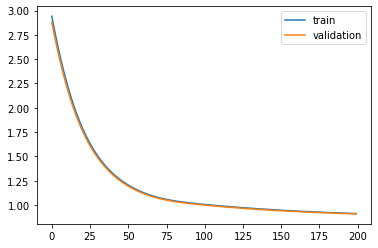

Time to train LSTM:  125.60201907157898
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 1s - loss: 2.8833 - pdc_loss: 0.6972 - event_loss: 0.6872 - val_loss: 2.8254 - val_pdc_loss: 0.6967 - val_event_loss: 0.6841

Epoch 00001: val_loss improved from inf to 2.82540, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 2.8033 - pdc_loss: 0.6964 - event_loss: 0.6812 - val_loss: 2.7475 - val_pdc_loss: 0.6960 - val_event_loss: 0.6782

Epoch 00002: val_loss improved from 2.82540 to 2.74746, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 2.7261 - pdc_loss: 0.6957 - event_loss: 0.6752 - val_loss: 2.6723 - val_pdc_loss: 0.6953 - val_event_loss: 0.6722

Epoch 00003: val_loss improved from 2.74746 to 2.67232, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 2.6517 - pdc_loss: 0.6950 - event_loss: 0.6692 - val_loss: 2.5999 - val_pdc_loss: 0.6946 - val_event_loss: 0.6663

Epoch 00004: val_loss improved from 2.67232 to 2.59992, saving 


Epoch 00035: val_loss improved from 1.36810 to 1.34985, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 1.3417 - pdc_loss: 0.6835 - event_loss: 0.4408 - val_loss: 1.3325 - val_pdc_loss: 0.6833 - val_event_loss: 0.4415

Epoch 00036: val_loss improved from 1.34985 to 1.33251, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 1.3246 - pdc_loss: 0.6833 - event_loss: 0.4369 - val_loss: 1.3160 - val_pdc_loss: 0.6830 - val_event_loss: 0.4378

Epoch 00037: val_loss improved from 1.33251 to 1.31605, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 1.3084 - pdc_loss: 0.6831 - event_loss: 0.4332 - val_loss: 1.3004 - val_pdc_loss: 0.6828 - val_event_loss: 0.4341

Epoch 00038: val_loss improved from 1.31605 to 1.30039, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 1.2929 - pdc_loss: 0.6829 - event_loss: 0.4296 - val_loss: 1.2855 - val_pdc_loss: 0.6826 - val_event_loss: 0.4306

Epoch 00039: val_loss improved from 1.30039 to 

 - 1s - loss: 1.0495 - pdc_loss: 0.6810 - event_loss: 0.3472 - val_loss: 1.0522 - val_pdc_loss: 0.6806 - val_event_loss: 0.3514

Epoch 00070: val_loss improved from 1.05460 to 1.05219, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 1.0470 - pdc_loss: 0.6810 - event_loss: 0.3462 - val_loss: 1.0500 - val_pdc_loss: 0.6806 - val_event_loss: 0.3505

Epoch 00071: val_loss improved from 1.05219 to 1.04996, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 1.0447 - pdc_loss: 0.6809 - event_loss: 0.3452 - val_loss: 1.0479 - val_pdc_loss: 0.6806 - val_event_loss: 0.3497

Epoch 00072: val_loss improved from 1.04996 to 1.04791, saving model to Event_val_weights2.hdf5
Epoch 73/200
 - 1s - loss: 1.0426 - pdc_loss: 0.6809 - event_loss: 0.3443 - val_loss: 1.0460 - val_pdc_loss: 0.6805 - val_event_loss: 0.3489

Epoch 00073: val_loss improved from 1.04791 to 1.04601, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 1.0407 - pdc_loss: 0.6809 - event_


Epoch 00104: val_loss improved from 1.02303 to 1.02272, saving model to Event_val_weights2.hdf5
Epoch 105/200
 - 1s - loss: 1.0165 - pdc_loss: 0.6802 - event_loss: 0.3313 - val_loss: 1.0224 - val_pdc_loss: 0.6795 - val_event_loss: 0.3380

Epoch 00105: val_loss improved from 1.02272 to 1.02243, saving model to Event_val_weights2.hdf5
Epoch 106/200
 - 1s - loss: 1.0162 - pdc_loss: 0.6801 - event_loss: 0.3312 - val_loss: 1.0221 - val_pdc_loss: 0.6795 - val_event_loss: 0.3378

Epoch 00106: val_loss improved from 1.02243 to 1.02214, saving model to Event_val_weights2.hdf5
Epoch 107/200
 - 1s - loss: 1.0159 - pdc_loss: 0.6801 - event_loss: 0.3310 - val_loss: 1.0219 - val_pdc_loss: 0.6794 - val_event_loss: 0.3376

Epoch 00107: val_loss improved from 1.02214 to 1.02186, saving model to Event_val_weights2.hdf5
Epoch 108/200
 - 1s - loss: 1.0156 - pdc_loss: 0.6800 - event_loss: 0.3308 - val_loss: 1.0216 - val_pdc_loss: 0.6793 - val_event_loss: 0.3375

Epoch 00108: val_loss improved from 1.02186

 - 1s - loss: 1.0048 - pdc_loss: 0.6714 - event_loss: 0.3279 - val_loss: 1.0090 - val_pdc_loss: 0.6698 - val_event_loss: 0.3337

Epoch 00139: val_loss improved from 1.00974 to 1.00904, saving model to Event_val_weights2.hdf5
Epoch 140/200
 - 1s - loss: 1.0041 - pdc_loss: 0.6707 - event_loss: 0.3279 - val_loss: 1.0083 - val_pdc_loss: 0.6690 - val_event_loss: 0.3336

Epoch 00140: val_loss improved from 1.00904 to 1.00831, saving model to Event_val_weights2.hdf5
Epoch 141/200
 - 1s - loss: 1.0035 - pdc_loss: 0.6699 - event_loss: 0.3279 - val_loss: 1.0075 - val_pdc_loss: 0.6682 - val_event_loss: 0.3336

Epoch 00141: val_loss improved from 1.00831 to 1.00755, saving model to Event_val_weights2.hdf5
Epoch 142/200
 - 1s - loss: 1.0028 - pdc_loss: 0.6690 - event_loss: 0.3279 - val_loss: 1.0068 - val_pdc_loss: 0.6673 - val_event_loss: 0.3335

Epoch 00142: val_loss improved from 1.00755 to 1.00675, saving model to Event_val_weights2.hdf5
Epoch 143/200
 - 1s - loss: 1.0021 - pdc_loss: 0.6681 - ev


Epoch 00173: val_loss improved from 0.97200 to 0.97068, saving model to Event_val_weights2.hdf5
Epoch 174/200
 - 1s - loss: 0.9658 - pdc_loss: 0.6201 - event_loss: 0.3331 - val_loss: 0.9694 - val_pdc_loss: 0.6189 - val_event_loss: 0.3378

Epoch 00174: val_loss improved from 0.97068 to 0.96937, saving model to Event_val_weights2.hdf5
Epoch 175/200
 - 1s - loss: 0.9644 - pdc_loss: 0.6184 - event_loss: 0.3332 - val_loss: 0.9681 - val_pdc_loss: 0.6173 - val_event_loss: 0.3379

Epoch 00175: val_loss improved from 0.96937 to 0.96807, saving model to Event_val_weights2.hdf5
Epoch 176/200
 - 1s - loss: 0.9630 - pdc_loss: 0.6168 - event_loss: 0.3333 - val_loss: 0.9668 - val_pdc_loss: 0.6157 - val_event_loss: 0.3380

Epoch 00176: val_loss improved from 0.96807 to 0.96677, saving model to Event_val_weights2.hdf5
Epoch 177/200
 - 1s - loss: 0.9617 - pdc_loss: 0.6152 - event_loss: 0.3334 - val_loss: 0.9655 - val_pdc_loss: 0.6141 - val_event_loss: 0.3381

Epoch 00177: val_loss improved from 0.96677

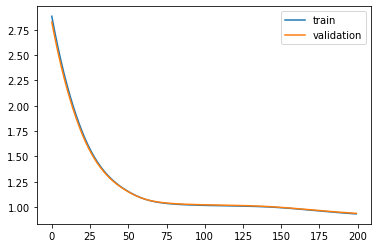

Time to train LSTM:  128.83968949317932


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f03ac22c630>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 1s - loss: 2.9966 - pdc_loss: 0.7255 - event_loss: 0.7706 - val_loss: 2.9271 - val_pdc_loss: 0.7245 - val_event_loss: 0.7534

Epoch 00001: val_loss improved from inf to 2.92710, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 2.9039 - pdc_loss: 0.7240 - event_loss: 0.7486 - val_loss: 2.8371 - val_pdc_loss: 0.7230 - val_event_loss: 0.7324

Epoch 00002: val_loss improved from 2.92710 to 2.83711, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 2.8145 - pdc_loss: 0.7225 - event_loss: 0.7275 - val_loss: 2.7503 - val_pdc_loss: 0.7216 - val_event_loss: 0.7123

Epoch 00003: val_loss improved from 2.83711 to 2.75034, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 2.7282 - pdc_loss: 0.7210 - event_loss: 0.7074 - val_loss: 2.6668 - val_pdc_loss: 0.7202 - val_event_loss: 0.6930

Epoch 00004: val_loss improved from 2.75034 to 2.66680, saving model to Event_val_weights3.hdf5
Epoch 5


Epoch 00035: val_loss improved from 1.33149 to 1.31312, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 1.3009 - pdc_loss: 0.6665 - event_loss: 0.4106 - val_loss: 1.2957 - val_pdc_loss: 0.6680 - val_event_loss: 0.4133

Epoch 00036: val_loss improved from 1.31312 to 1.29569, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 1.2836 - pdc_loss: 0.6651 - event_loss: 0.4073 - val_loss: 1.2792 - val_pdc_loss: 0.6668 - val_event_loss: 0.4102

Epoch 00037: val_loss improved from 1.29569 to 1.27915, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 1.2671 - pdc_loss: 0.6638 - event_loss: 0.4042 - val_loss: 1.2634 - val_pdc_loss: 0.6656 - val_event_loss: 0.4072

Epoch 00038: val_loss improved from 1.27915 to 1.26343, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 1.2514 - pdc_loss: 0.6625 - event_loss: 0.4011 - val_loss: 1.2485 - val_pdc_loss: 0.6644 - val_event_loss: 0.4043

Epoch 00039: val_loss improved from 1.26343 to 

 - 1s - loss: 1.0021 - pdc_loss: 0.6269 - event_loss: 0.3399 - val_loss: 1.0096 - val_pdc_loss: 0.6303 - val_event_loss: 0.3449

Epoch 00070: val_loss improved from 1.01266 to 1.00957, saving model to Event_val_weights3.hdf5
Epoch 71/200
 - 1s - loss: 0.9990 - pdc_loss: 0.6258 - event_loss: 0.3392 - val_loss: 1.0066 - val_pdc_loss: 0.6294 - val_event_loss: 0.3443

Epoch 00071: val_loss improved from 1.00957 to 1.00665, saving model to Event_val_weights3.hdf5
Epoch 72/200
 - 1s - loss: 0.9960 - pdc_loss: 0.6248 - event_loss: 0.3386 - val_loss: 1.0039 - val_pdc_loss: 0.6284 - val_event_loss: 0.3437

Epoch 00072: val_loss improved from 1.00665 to 1.00389, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.9932 - pdc_loss: 0.6237 - event_loss: 0.3381 - val_loss: 1.0013 - val_pdc_loss: 0.6274 - val_event_loss: 0.3433

Epoch 00073: val_loss improved from 1.00389 to 1.00127, saving model to Event_val_weights3.hdf5
Epoch 74/200
 - 1s - loss: 0.9906 - pdc_loss: 0.6226 - event_


Epoch 00104: val_loss improved from 0.95569 to 0.95470, saving model to Event_val_weights3.hdf5
Epoch 105/200
 - 1s - loss: 0.9420 - pdc_loss: 0.5919 - event_loss: 0.3310 - val_loss: 0.9537 - val_pdc_loss: 0.5980 - val_event_loss: 0.3366

Epoch 00105: val_loss improved from 0.95470 to 0.95372, saving model to Event_val_weights3.hdf5
Epoch 106/200
 - 1s - loss: 0.9410 - pdc_loss: 0.5910 - event_loss: 0.3309 - val_loss: 0.9528 - val_pdc_loss: 0.5972 - val_event_loss: 0.3365

Epoch 00106: val_loss improved from 0.95372 to 0.95276, saving model to Event_val_weights3.hdf5
Epoch 107/200
 - 1s - loss: 0.9400 - pdc_loss: 0.5902 - event_loss: 0.3308 - val_loss: 0.9518 - val_pdc_loss: 0.5965 - val_event_loss: 0.3364

Epoch 00107: val_loss improved from 0.95276 to 0.95182, saving model to Event_val_weights3.hdf5
Epoch 108/200
 - 1s - loss: 0.9389 - pdc_loss: 0.5894 - event_loss: 0.3307 - val_loss: 0.9509 - val_pdc_loss: 0.5957 - val_event_loss: 0.3364

Epoch 00108: val_loss improved from 0.95182

 - 1s - loss: 0.9139 - pdc_loss: 0.5694 - event_loss: 0.3281 - val_loss: 0.9283 - val_pdc_loss: 0.5779 - val_event_loss: 0.3341

Epoch 00139: val_loss improved from 0.92888 to 0.92832, saving model to Event_val_weights3.hdf5
Epoch 140/200
 - 1s - loss: 0.9132 - pdc_loss: 0.5689 - event_loss: 0.3281 - val_loss: 0.9278 - val_pdc_loss: 0.5775 - val_event_loss: 0.3340

Epoch 00140: val_loss improved from 0.92832 to 0.92777, saving model to Event_val_weights3.hdf5
Epoch 141/200
 - 1s - loss: 0.9126 - pdc_loss: 0.5684 - event_loss: 0.3280 - val_loss: 0.9272 - val_pdc_loss: 0.5771 - val_event_loss: 0.3339

Epoch 00141: val_loss improved from 0.92777 to 0.92723, saving model to Event_val_weights3.hdf5
Epoch 142/200
 - 1s - loss: 0.9120 - pdc_loss: 0.5680 - event_loss: 0.3279 - val_loss: 0.9267 - val_pdc_loss: 0.5768 - val_event_loss: 0.3339

Epoch 00142: val_loss improved from 0.92723 to 0.92670, saving model to Event_val_weights3.hdf5
Epoch 143/200
 - 1s - loss: 0.9114 - pdc_loss: 0.5676 - ev


Epoch 00173: val_loss improved from 0.91476 to 0.91446, saving model to Event_val_weights3.hdf5
Epoch 174/200
 - 1s - loss: 0.8975 - pdc_loss: 0.5584 - event_loss: 0.3257 - val_loss: 0.9142 - val_pdc_loss: 0.5690 - val_event_loss: 0.3318

Epoch 00174: val_loss improved from 0.91446 to 0.91418, saving model to Event_val_weights3.hdf5
Epoch 175/200
 - 1s - loss: 0.8971 - pdc_loss: 0.5582 - event_loss: 0.3257 - val_loss: 0.9139 - val_pdc_loss: 0.5689 - val_event_loss: 0.3318

Epoch 00175: val_loss improved from 0.91418 to 0.91389, saving model to Event_val_weights3.hdf5
Epoch 176/200
 - 1s - loss: 0.8968 - pdc_loss: 0.5580 - event_loss: 0.3256 - val_loss: 0.9136 - val_pdc_loss: 0.5688 - val_event_loss: 0.3317

Epoch 00176: val_loss improved from 0.91389 to 0.91361, saving model to Event_val_weights3.hdf5
Epoch 177/200
 - 1s - loss: 0.8965 - pdc_loss: 0.5578 - event_loss: 0.3255 - val_loss: 0.9133 - val_pdc_loss: 0.5686 - val_event_loss: 0.3317

Epoch 00177: val_loss improved from 0.91361

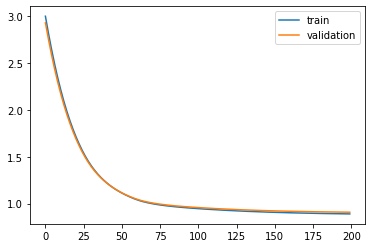

Time to train LSTM:  130.731294631958
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 2s - loss: 2.9459 - pdc_loss: 0.7002 - event_loss: 0.7233 - val_loss: 2.8854 - val_pdc_loss: 0.6979 - val_event_loss: 0.7198

Epoch 00001: val_loss improved from inf to 2.88544, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 2.8628 - pdc_loss: 0.6990 - event_loss: 0.7150 - val_loss: 2.8041 - val_pdc_loss: 0.6966 - val_event_loss: 0.7116

Epoch 00002: val_loss improved from 2.88544 to 2.80413, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 2.7825 - pdc_loss: 0.6979 - event_loss: 0.7070 - val_loss: 2.7257 - val_pdc_loss: 0.6953 - val_event_loss: 0.7037

Epoch 00003: val_loss improved from 2.80413 to 2.72573, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 2.7052 - pdc_loss: 0.6968 - event_loss: 0.6993 - val_loss: 2.6503 - val_pdc_loss: 0.6940 - val_event_loss: 0.6960

Epoch 00004: val_loss improved from 2.72573 to 2.65027, saving mo


Epoch 00035: val_loss improved from 1.40238 to 1.38245, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 1.3768 - pdc_loss: 0.6724 - event_loss: 0.4942 - val_loss: 1.3634 - val_pdc_loss: 0.6687 - val_event_loss: 0.4940

Epoch 00036: val_loss improved from 1.38245 to 1.36338, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 1.3577 - pdc_loss: 0.6719 - event_loss: 0.4884 - val_loss: 1.3451 - val_pdc_loss: 0.6682 - val_event_loss: 0.4884

Epoch 00037: val_loss improved from 1.36338 to 1.34514, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 1.3395 - pdc_loss: 0.6713 - event_loss: 0.4828 - val_loss: 1.3277 - val_pdc_loss: 0.6677 - val_event_loss: 0.4830

Epoch 00038: val_loss improved from 1.34514 to 1.32768, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 1.3221 - pdc_loss: 0.6707 - event_loss: 0.4773 - val_loss: 1.3110 - val_pdc_loss: 0.6671 - val_event_loss: 0.4777

Epoch 00039: val_loss improved from 1.32768 to 

 - 1s - loss: 1.0435 - pdc_loss: 0.6408 - event_loss: 0.3749 - val_loss: 1.0479 - val_pdc_loss: 0.6397 - val_event_loss: 0.3812

Epoch 00070: val_loss improved from 1.05134 to 1.04786, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 1.0399 - pdc_loss: 0.6395 - event_loss: 0.3736 - val_loss: 1.0446 - val_pdc_loss: 0.6386 - val_event_loss: 0.3800

Epoch 00071: val_loss improved from 1.04786 to 1.04455, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 1.0365 - pdc_loss: 0.6383 - event_loss: 0.3725 - val_loss: 1.0414 - val_pdc_loss: 0.6374 - val_event_loss: 0.3789

Epoch 00072: val_loss improved from 1.04455 to 1.04140, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 1.0332 - pdc_loss: 0.6370 - event_loss: 0.3713 - val_loss: 1.0384 - val_pdc_loss: 0.6363 - val_event_loss: 0.3779

Epoch 00073: val_loss improved from 1.04140 to 1.03839, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 1.0300 - pdc_loss: 0.6357 - event_


Epoch 00104: val_loss improved from 0.98512 to 0.98398, saving model to Event_val_weights4.hdf5
Epoch 105/200
 - 1s - loss: 0.9715 - pdc_loss: 0.6018 - event_loss: 0.3523 - val_loss: 0.9829 - val_pdc_loss: 0.6048 - val_event_loss: 0.3608

Epoch 00105: val_loss improved from 0.98398 to 0.98286, saving model to Event_val_weights4.hdf5
Epoch 106/200
 - 1s - loss: 0.9703 - pdc_loss: 0.6010 - event_loss: 0.3520 - val_loss: 0.9818 - val_pdc_loss: 0.6040 - val_event_loss: 0.3605

Epoch 00106: val_loss improved from 0.98286 to 0.98176, saving model to Event_val_weights4.hdf5
Epoch 107/200
 - 1s - loss: 0.9691 - pdc_loss: 0.6001 - event_loss: 0.3516 - val_loss: 0.9807 - val_pdc_loss: 0.6033 - val_event_loss: 0.3602

Epoch 00107: val_loss improved from 0.98176 to 0.98068, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.9679 - pdc_loss: 0.5993 - event_loss: 0.3513 - val_loss: 0.9796 - val_pdc_loss: 0.6025 - val_event_loss: 0.3598

Epoch 00108: val_loss improved from 0.98068

 - 1s - loss: 0.9380 - pdc_loss: 0.5785 - event_loss: 0.3432 - val_loss: 0.9531 - val_pdc_loss: 0.5842 - val_event_loss: 0.3526

Epoch 00139: val_loss improved from 0.95376 to 0.95306, saving model to Event_val_weights4.hdf5
Epoch 140/200
 - 1s - loss: 0.9372 - pdc_loss: 0.5779 - event_loss: 0.3430 - val_loss: 0.9524 - val_pdc_loss: 0.5838 - val_event_loss: 0.3524

Epoch 00140: val_loss improved from 0.95306 to 0.95236, saving model to Event_val_weights4.hdf5
Epoch 141/200
 - 1s - loss: 0.9364 - pdc_loss: 0.5774 - event_loss: 0.3428 - val_loss: 0.9517 - val_pdc_loss: 0.5833 - val_event_loss: 0.3522

Epoch 00141: val_loss improved from 0.95236 to 0.95168, saving model to Event_val_weights4.hdf5
Epoch 142/200
 - 1s - loss: 0.9357 - pdc_loss: 0.5769 - event_loss: 0.3426 - val_loss: 0.9510 - val_pdc_loss: 0.5829 - val_event_loss: 0.3520

Epoch 00142: val_loss improved from 0.95168 to 0.95100, saving model to Event_val_weights4.hdf5
Epoch 143/200
 - 1s - loss: 0.9349 - pdc_loss: 0.5764 - ev


Epoch 00173: val_loss improved from 0.93411 to 0.93364, saving model to Event_val_weights4.hdf5
Epoch 174/200
 - 1s - loss: 0.9153 - pdc_loss: 0.5638 - event_loss: 0.3371 - val_loss: 0.9332 - val_pdc_loss: 0.5719 - val_event_loss: 0.3470

Epoch 00174: val_loss improved from 0.93364 to 0.93319, saving model to Event_val_weights4.hdf5
Epoch 175/200
 - 1s - loss: 0.9148 - pdc_loss: 0.5634 - event_loss: 0.3370 - val_loss: 0.9327 - val_pdc_loss: 0.5716 - val_event_loss: 0.3468

Epoch 00175: val_loss improved from 0.93319 to 0.93274, saving model to Event_val_weights4.hdf5
Epoch 176/200
 - 1s - loss: 0.9143 - pdc_loss: 0.5631 - event_loss: 0.3368 - val_loss: 0.9323 - val_pdc_loss: 0.5714 - val_event_loss: 0.3467

Epoch 00176: val_loss improved from 0.93274 to 0.93229, saving model to Event_val_weights4.hdf5
Epoch 177/200
 - 1s - loss: 0.9137 - pdc_loss: 0.5628 - event_loss: 0.3367 - val_loss: 0.9318 - val_pdc_loss: 0.5711 - val_event_loss: 0.3465

Epoch 00177: val_loss improved from 0.93229

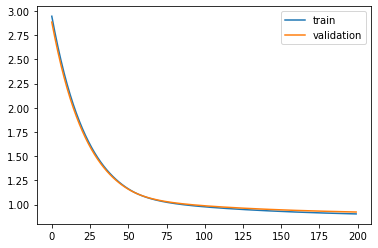

Time to train LSTM:  126.51264095306396


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f024adceb00>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 2s - loss: 2.9111 - pdc_loss: 0.7175 - event_loss: 0.7362 - val_loss: 2.8446 - val_pdc_loss: 0.7147 - val_event_loss: 0.7256

Epoch 00001: val_loss improved from inf to 2.84456, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 2.8277 - pdc_loss: 0.7149 - event_loss: 0.7271 - val_loss: 2.7631 - val_pdc_loss: 0.7121 - val_event_loss: 0.7166

Epoch 00002: val_loss improved from 2.84456 to 2.76307, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 2.7470 - pdc_loss: 0.7123 - event_loss: 0.7182 - val_loss: 2.6844 - val_pdc_loss: 0.7095 - val_event_loss: 0.7079

Epoch 00003: val_loss improved from 2.76307 to 2.68444, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 2.6692 - pdc_loss: 0.7097 - event_loss: 0.7095 - val_loss: 2.6087 - val_pdc_loss: 0.7069 - val_event_loss: 0.6994

Epoch 00004: val_loss improved from 2.68444 to 2.60874, saving model to Event_val_weights5.hdf5
Epoch 5


Epoch 00035: val_loss improved from 1.35715 to 1.33920, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 1.3354 - pdc_loss: 0.6514 - event_loss: 0.4798 - val_loss: 1.3222 - val_pdc_loss: 0.6517 - val_event_loss: 0.4749

Epoch 00036: val_loss improved from 1.33920 to 1.32219, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 1.3185 - pdc_loss: 0.6502 - event_loss: 0.4757 - val_loss: 1.3061 - val_pdc_loss: 0.6504 - val_event_loss: 0.4711

Epoch 00037: val_loss improved from 1.32219 to 1.30607, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 1.3025 - pdc_loss: 0.6489 - event_loss: 0.4718 - val_loss: 1.2908 - val_pdc_loss: 0.6492 - val_event_loss: 0.4674

Epoch 00038: val_loss improved from 1.30607 to 1.29077, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 1.2873 - pdc_loss: 0.6476 - event_loss: 0.4681 - val_loss: 1.2762 - val_pdc_loss: 0.6479 - val_event_loss: 0.4639

Epoch 00039: val_loss improved from 1.29077 to 

 - 1s - loss: 1.0413 - pdc_loss: 0.6109 - event_loss: 0.3957 - val_loss: 1.0394 - val_pdc_loss: 0.6119 - val_event_loss: 0.3939

Epoch 00070: val_loss improved from 1.04344 to 1.03942, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 1.0373 - pdc_loss: 0.6099 - event_loss: 0.3942 - val_loss: 1.0355 - val_pdc_loss: 0.6109 - val_event_loss: 0.3923

Epoch 00071: val_loss improved from 1.03942 to 1.03552, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 1.0334 - pdc_loss: 0.6088 - event_loss: 0.3926 - val_loss: 1.0317 - val_pdc_loss: 0.6099 - val_event_loss: 0.3908

Epoch 00072: val_loss improved from 1.03552 to 1.03174, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 1.0297 - pdc_loss: 0.6078 - event_loss: 0.3911 - val_loss: 1.0281 - val_pdc_loss: 0.6090 - val_event_loss: 0.3892

Epoch 00073: val_loss improved from 1.03174 to 1.02806, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 1.0260 - pdc_loss: 0.6068 - event_


Epoch 00104: val_loss improved from 0.95683 to 0.95544, saving model to Event_val_weights5.hdf5
Epoch 105/200
 - 1s - loss: 0.9539 - pdc_loss: 0.5810 - event_loss: 0.3576 - val_loss: 0.9541 - val_pdc_loss: 0.5827 - val_event_loss: 0.3561

Epoch 00105: val_loss improved from 0.95544 to 0.95410, saving model to Event_val_weights5.hdf5
Epoch 106/200
 - 1s - loss: 0.9526 - pdc_loss: 0.5804 - event_loss: 0.3569 - val_loss: 0.9528 - val_pdc_loss: 0.5821 - val_event_loss: 0.3555

Epoch 00106: val_loss improved from 0.95410 to 0.95279, saving model to Event_val_weights5.hdf5
Epoch 107/200
 - 1s - loss: 0.9513 - pdc_loss: 0.5798 - event_loss: 0.3563 - val_loss: 0.9515 - val_pdc_loss: 0.5815 - val_event_loss: 0.3549

Epoch 00107: val_loss improved from 0.95279 to 0.95152, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.9500 - pdc_loss: 0.5793 - event_loss: 0.3557 - val_loss: 0.9503 - val_pdc_loss: 0.5810 - val_event_loss: 0.3543

Epoch 00108: val_loss improved from 0.95152

 - 1s - loss: 0.9226 - pdc_loss: 0.5667 - event_loss: 0.3427 - val_loss: 0.9233 - val_pdc_loss: 0.5682 - val_event_loss: 0.3418

Epoch 00139: val_loss improved from 0.92392 to 0.92328, saving model to Event_val_weights5.hdf5
Epoch 140/200
 - 1s - loss: 0.9220 - pdc_loss: 0.5663 - event_loss: 0.3424 - val_loss: 0.9226 - val_pdc_loss: 0.5679 - val_event_loss: 0.3416

Epoch 00140: val_loss improved from 0.92328 to 0.92265, saving model to Event_val_weights5.hdf5
Epoch 141/200
 - 1s - loss: 0.9213 - pdc_loss: 0.5660 - event_loss: 0.3421 - val_loss: 0.9220 - val_pdc_loss: 0.5675 - val_event_loss: 0.3413

Epoch 00141: val_loss improved from 0.92265 to 0.92202, saving model to Event_val_weights5.hdf5
Epoch 142/200
 - 1s - loss: 0.9207 - pdc_loss: 0.5657 - event_loss: 0.3418 - val_loss: 0.9214 - val_pdc_loss: 0.5672 - val_event_loss: 0.3410

Epoch 00142: val_loss improved from 0.92202 to 0.92140, saving model to Event_val_weights5.hdf5
Epoch 143/200
 - 1s - loss: 0.9201 - pdc_loss: 0.5654 - ev


Epoch 00173: val_loss improved from 0.90621 to 0.90579, saving model to Event_val_weights5.hdf5
Epoch 174/200
 - 1s - loss: 0.9048 - pdc_loss: 0.5573 - event_loss: 0.3350 - val_loss: 0.9054 - val_pdc_loss: 0.5583 - val_event_loss: 0.3346

Epoch 00174: val_loss improved from 0.90579 to 0.90538, saving model to Event_val_weights5.hdf5
Epoch 175/200
 - 1s - loss: 0.9044 - pdc_loss: 0.5571 - event_loss: 0.3348 - val_loss: 0.9050 - val_pdc_loss: 0.5581 - val_event_loss: 0.3344

Epoch 00175: val_loss improved from 0.90538 to 0.90497, saving model to Event_val_weights5.hdf5
Epoch 176/200
 - 1s - loss: 0.9040 - pdc_loss: 0.5569 - event_loss: 0.3347 - val_loss: 0.9046 - val_pdc_loss: 0.5579 - val_event_loss: 0.3343

Epoch 00176: val_loss improved from 0.90497 to 0.90456, saving model to Event_val_weights5.hdf5
Epoch 177/200
 - 1s - loss: 0.9036 - pdc_loss: 0.5566 - event_loss: 0.3345 - val_loss: 0.9042 - val_pdc_loss: 0.5576 - val_event_loss: 0.3341

Epoch 00177: val_loss improved from 0.90456

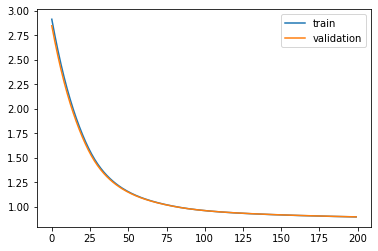

Time to train LSTM:  132.2786078453064
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 2s - loss: 4.3487 - pdc_loss: 0.7389 - event_loss: 0.7356 - val_loss: 4.2199 - val_pdc_loss: 0.7303 - val_event_loss: 0.7206

Epoch 00001: val_loss improved from inf to 4.21988, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 4.1863 - pdc_loss: 0.7331 - event_loss: 0.7207 - val_loss: 4.0616 - val_pdc_loss: 0.7245 - val_event_loss: 0.7060

Epoch 00002: val_loss improved from 4.21988 to 4.06157, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 4.0297 - pdc_loss: 0.7274 - event_loss: 0.7064 - val_loss: 3.9092 - val_pdc_loss: 0.7190 - val_event_loss: 0.6919

Epoch 00003: val_loss improved from 4.06157 to 3.90924, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 3.8789 - pdc_loss: 0.7219 - event_loss: 0.6923 - val_loss: 3.7628 - val_pdc_loss: 0.7138 - val_event_loss: 0.6780

Epoch 00004: val_loss improved from 3.90924 to 3.76284, saving m


Epoch 00035: val_loss improved from 1.43913 to 1.40576, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 1.4054 - pdc_loss: 0.6345 - event_loss: 0.3951 - val_loss: 1.3739 - val_pdc_loss: 0.6325 - val_event_loss: 0.3831

Epoch 00036: val_loss improved from 1.40576 to 1.37392, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 1.3736 - pdc_loss: 0.6316 - event_loss: 0.3898 - val_loss: 1.3435 - val_pdc_loss: 0.6297 - val_event_loss: 0.3780

Epoch 00037: val_loss improved from 1.37392 to 1.34355, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 1.3433 - pdc_loss: 0.6286 - event_loss: 0.3846 - val_loss: 1.3146 - val_pdc_loss: 0.6268 - val_event_loss: 0.3731

Epoch 00038: val_loss improved from 1.34355 to 1.31462, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 1.3145 - pdc_loss: 0.6256 - event_loss: 0.3795 - val_loss: 1.2871 - val_pdc_loss: 0.6240 - val_event_loss: 0.3683

Epoch 00039: val_loss improved from 1.31462 to 

 - 1s - loss: 0.9388 - pdc_loss: 0.5697 - event_loss: 0.3260 - val_loss: 0.9323 - val_pdc_loss: 0.5712 - val_event_loss: 0.3197

Epoch 00070: val_loss improved from 0.93553 to 0.93228, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 0.9356 - pdc_loss: 0.5688 - event_loss: 0.3259 - val_loss: 0.9292 - val_pdc_loss: 0.5703 - val_event_loss: 0.3195

Epoch 00071: val_loss improved from 0.93228 to 0.92924, saving model to Event_val_weights1.hdf5
Epoch 72/200
 - 1s - loss: 0.9326 - pdc_loss: 0.5680 - event_loss: 0.3257 - val_loss: 0.9264 - val_pdc_loss: 0.5695 - val_event_loss: 0.3194

Epoch 00072: val_loss improved from 0.92924 to 0.92639, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.9298 - pdc_loss: 0.5672 - event_loss: 0.3255 - val_loss: 0.9237 - val_pdc_loss: 0.5687 - val_event_loss: 0.3192

Epoch 00073: val_loss improved from 0.92639 to 0.92373, saving model to Event_val_weights1.hdf5
Epoch 74/200
 - 1s - loss: 0.9271 - pdc_loss: 0.5664 - event_


Epoch 00104: val_loss improved from 0.88744 to 0.88692, saving model to Event_val_weights1.hdf5
Epoch 105/200
 - 1s - loss: 0.8901 - pdc_loss: 0.5526 - event_loss: 0.3221 - val_loss: 0.8864 - val_pdc_loss: 0.5545 - val_event_loss: 0.3167

Epoch 00105: val_loss improved from 0.88692 to 0.88642, saving model to Event_val_weights1.hdf5
Epoch 106/200
 - 1s - loss: 0.8896 - pdc_loss: 0.5524 - event_loss: 0.3220 - val_loss: 0.8859 - val_pdc_loss: 0.5542 - val_event_loss: 0.3167

Epoch 00106: val_loss improved from 0.88642 to 0.88593, saving model to Event_val_weights1.hdf5
Epoch 107/200
 - 1s - loss: 0.8891 - pdc_loss: 0.5521 - event_loss: 0.3220 - val_loss: 0.8855 - val_pdc_loss: 0.5540 - val_event_loss: 0.3166

Epoch 00107: val_loss improved from 0.88593 to 0.88546, saving model to Event_val_weights1.hdf5
Epoch 108/200
 - 1s - loss: 0.8886 - pdc_loss: 0.5519 - event_loss: 0.3219 - val_loss: 0.8850 - val_pdc_loss: 0.5537 - val_event_loss: 0.3165

Epoch 00108: val_loss improved from 0.88546

 - 1s - loss: 0.8784 - pdc_loss: 0.5463 - event_loss: 0.3197 - val_loss: 0.8756 - val_pdc_loss: 0.5481 - val_event_loss: 0.3152

Epoch 00139: val_loss improved from 0.87586 to 0.87564, saving model to Event_val_weights1.hdf5
Epoch 140/200
 - 1s - loss: 0.8782 - pdc_loss: 0.5462 - event_loss: 0.3197 - val_loss: 0.8754 - val_pdc_loss: 0.5480 - val_event_loss: 0.3152

Epoch 00140: val_loss improved from 0.87564 to 0.87542, saving model to Event_val_weights1.hdf5
Epoch 141/200
 - 1s - loss: 0.8779 - pdc_loss: 0.5460 - event_loss: 0.3196 - val_loss: 0.8752 - val_pdc_loss: 0.5478 - val_event_loss: 0.3152

Epoch 00141: val_loss improved from 0.87542 to 0.87521, saving model to Event_val_weights1.hdf5
Epoch 142/200
 - 1s - loss: 0.8777 - pdc_loss: 0.5459 - event_loss: 0.3196 - val_loss: 0.8750 - val_pdc_loss: 0.5477 - val_event_loss: 0.3151

Epoch 00142: val_loss improved from 0.87521 to 0.87501, saving model to Event_val_weights1.hdf5
Epoch 143/200
 - 1s - loss: 0.8775 - pdc_loss: 0.5458 - ev


Epoch 00173: val_loss improved from 0.86962 to 0.86947, saving model to Event_val_weights1.hdf5
Epoch 174/200
 - 1s - loss: 0.8714 - pdc_loss: 0.5417 - event_loss: 0.3185 - val_loss: 0.8693 - val_pdc_loss: 0.5437 - val_event_loss: 0.3144

Epoch 00174: val_loss improved from 0.86947 to 0.86932, saving model to Event_val_weights1.hdf5
Epoch 175/200
 - 1s - loss: 0.8713 - pdc_loss: 0.5416 - event_loss: 0.3184 - val_loss: 0.8692 - val_pdc_loss: 0.5435 - val_event_loss: 0.3144

Epoch 00175: val_loss improved from 0.86932 to 0.86916, saving model to Event_val_weights1.hdf5
Epoch 176/200
 - 1s - loss: 0.8711 - pdc_loss: 0.5415 - event_loss: 0.3184 - val_loss: 0.8690 - val_pdc_loss: 0.5434 - val_event_loss: 0.3144

Epoch 00176: val_loss improved from 0.86916 to 0.86900, saving model to Event_val_weights1.hdf5
Epoch 177/200
 - 1s - loss: 0.8709 - pdc_loss: 0.5413 - event_loss: 0.3184 - val_loss: 0.8689 - val_pdc_loss: 0.5433 - val_event_loss: 0.3144

Epoch 00177: val_loss improved from 0.86900

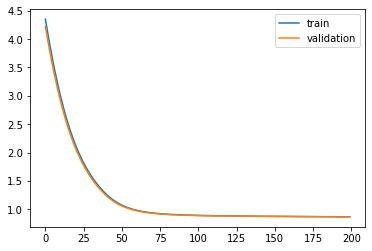

Time to train LSTM:  130.86987447738647


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f0243ef3f60>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 3s - loss: 4.3020 - pdc_loss: 0.6955 - event_loss: 0.7292 - val_loss: 4.1868 - val_pdc_loss: 0.6938 - val_event_loss: 0.7233

Epoch 00001: val_loss improved from inf to 4.18684, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 4.1445 - pdc_loss: 0.6930 - event_loss: 0.7190 - val_loss: 4.0337 - val_pdc_loss: 0.6915 - val_event_loss: 0.7132

Epoch 00002: val_loss improved from 4.18684 to 4.03366, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 3.9925 - pdc_loss: 0.6906 - event_loss: 0.7088 - val_loss: 3.8861 - val_pdc_loss: 0.6892 - val_event_loss: 0.7033

Epoch 00003: val_loss improved from 4.03366 to 3.88609, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 3.8461 - pdc_loss: 0.6882 - event_loss: 0.6987 - val_loss: 3.7442 - val_pdc_loss: 0.6869 - val_event_loss: 0.6936

Epoch 00004: val_loss improved from 3.88609 to 3.74416, saving model to Event_val_weights2.hdf5
Epoch 5


Epoch 00035: val_loss improved from 1.46263 to 1.42990, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 1.4150 - pdc_loss: 0.6122 - event_loss: 0.4314 - val_loss: 1.3988 - val_pdc_loss: 0.6136 - val_event_loss: 0.4309

Epoch 00036: val_loss improved from 1.42990 to 1.39877, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 1.3841 - pdc_loss: 0.6100 - event_loss: 0.4257 - val_loss: 1.3691 - val_pdc_loss: 0.6116 - val_event_loss: 0.4253

Epoch 00037: val_loss improved from 1.39877 to 1.36914, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 1.3547 - pdc_loss: 0.6080 - event_loss: 0.4201 - val_loss: 1.3410 - val_pdc_loss: 0.6097 - val_event_loss: 0.4199

Epoch 00038: val_loss improved from 1.36914 to 1.34097, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 1.3267 - pdc_loss: 0.6059 - event_loss: 0.4147 - val_loss: 1.3142 - val_pdc_loss: 0.6078 - val_event_loss: 0.4147

Epoch 00039: val_loss improved from 1.34097 to 

 - 1s - loss: 0.9483 - pdc_loss: 0.5671 - event_loss: 0.3401 - val_loss: 0.9569 - val_pdc_loss: 0.5721 - val_event_loss: 0.3453

Epoch 00070: val_loss improved from 0.96047 to 0.95693, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.9447 - pdc_loss: 0.5664 - event_loss: 0.3394 - val_loss: 0.9536 - val_pdc_loss: 0.5714 - val_event_loss: 0.3447

Epoch 00071: val_loss improved from 0.95693 to 0.95360, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.9413 - pdc_loss: 0.5657 - event_loss: 0.3387 - val_loss: 0.9505 - val_pdc_loss: 0.5708 - val_event_loss: 0.3441

Epoch 00072: val_loss improved from 0.95360 to 0.95047, saving model to Event_val_weights2.hdf5
Epoch 73/200
 - 1s - loss: 0.9381 - pdc_loss: 0.5650 - event_loss: 0.3380 - val_loss: 0.9475 - val_pdc_loss: 0.5702 - val_event_loss: 0.3435

Epoch 00073: val_loss improved from 0.95047 to 0.94752, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.9351 - pdc_loss: 0.5644 - event_


Epoch 00104: val_loss improved from 0.90747 to 0.90684, saving model to Event_val_weights2.hdf5
Epoch 105/200
 - 1s - loss: 0.8943 - pdc_loss: 0.5536 - event_loss: 0.3266 - val_loss: 0.9062 - val_pdc_loss: 0.5593 - val_event_loss: 0.3330

Epoch 00105: val_loss improved from 0.90684 to 0.90625, saving model to Event_val_weights2.hdf5
Epoch 106/200
 - 1s - loss: 0.8937 - pdc_loss: 0.5534 - event_loss: 0.3264 - val_loss: 0.9057 - val_pdc_loss: 0.5591 - val_event_loss: 0.3328

Epoch 00106: val_loss improved from 0.90625 to 0.90571, saving model to Event_val_weights2.hdf5
Epoch 107/200
 - 1s - loss: 0.8932 - pdc_loss: 0.5532 - event_loss: 0.3262 - val_loss: 0.9052 - val_pdc_loss: 0.5589 - val_event_loss: 0.3326

Epoch 00107: val_loss improved from 0.90571 to 0.90523, saving model to Event_val_weights2.hdf5
Epoch 108/200
 - 1s - loss: 0.8927 - pdc_loss: 0.5530 - event_loss: 0.3261 - val_loss: 0.9048 - val_pdc_loss: 0.5587 - val_event_loss: 0.3325

Epoch 00108: val_loss improved from 0.90523

 - 1s - loss: 0.8819 - pdc_loss: 0.5471 - event_loss: 0.3226 - val_loss: 0.8938 - val_pdc_loss: 0.5526 - val_event_loss: 0.3290

Epoch 00139: val_loss improved from 0.89412 to 0.89385, saving model to Event_val_weights2.hdf5
Epoch 140/200
 - 1s - loss: 0.8816 - pdc_loss: 0.5469 - event_loss: 0.3225 - val_loss: 0.8936 - val_pdc_loss: 0.5524 - val_event_loss: 0.3289

Epoch 00140: val_loss improved from 0.89385 to 0.89358, saving model to Event_val_weights2.hdf5
Epoch 141/200
 - 1s - loss: 0.8814 - pdc_loss: 0.5467 - event_loss: 0.3224 - val_loss: 0.8933 - val_pdc_loss: 0.5523 - val_event_loss: 0.3288

Epoch 00141: val_loss improved from 0.89358 to 0.89332, saving model to Event_val_weights2.hdf5
Epoch 142/200
 - 1s - loss: 0.8811 - pdc_loss: 0.5466 - event_loss: 0.3223 - val_loss: 0.8931 - val_pdc_loss: 0.5521 - val_event_loss: 0.3288

Epoch 00142: val_loss improved from 0.89332 to 0.89305, saving model to Event_val_weights2.hdf5
Epoch 143/200
 - 1s - loss: 0.8808 - pdc_loss: 0.5464 - ev


Epoch 00173: val_loss improved from 0.88626 to 0.88606, saving model to Event_val_weights2.hdf5
Epoch 174/200
 - 1s - loss: 0.8741 - pdc_loss: 0.5424 - event_loss: 0.3203 - val_loss: 0.8859 - val_pdc_loss: 0.5478 - val_event_loss: 0.3266

Epoch 00174: val_loss improved from 0.88606 to 0.88586, saving model to Event_val_weights2.hdf5
Epoch 175/200
 - 1s - loss: 0.8739 - pdc_loss: 0.5423 - event_loss: 0.3202 - val_loss: 0.8857 - val_pdc_loss: 0.5477 - val_event_loss: 0.3266

Epoch 00175: val_loss improved from 0.88586 to 0.88566, saving model to Event_val_weights2.hdf5
Epoch 176/200
 - 1s - loss: 0.8737 - pdc_loss: 0.5422 - event_loss: 0.3201 - val_loss: 0.8855 - val_pdc_loss: 0.5476 - val_event_loss: 0.3265

Epoch 00176: val_loss improved from 0.88566 to 0.88547, saving model to Event_val_weights2.hdf5
Epoch 177/200
 - 1s - loss: 0.8735 - pdc_loss: 0.5421 - event_loss: 0.3201 - val_loss: 0.8853 - val_pdc_loss: 0.5474 - val_event_loss: 0.3265

Epoch 00177: val_loss improved from 0.88547

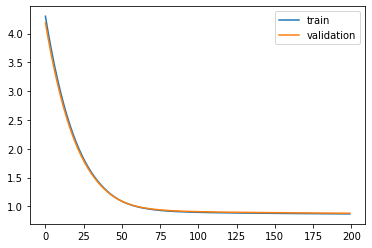

Time to train LSTM:  133.38800811767578
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 3s - loss: 4.4221 - pdc_loss: 0.7094 - event_loss: 0.8052 - val_loss: 4.2985 - val_pdc_loss: 0.7055 - val_event_loss: 0.7883

Epoch 00001: val_loss improved from inf to 4.29853, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 4.2515 - pdc_loss: 0.7036 - event_loss: 0.7789 - val_loss: 4.1335 - val_pdc_loss: 0.7004 - val_event_loss: 0.7633

Epoch 00002: val_loss improved from 4.29853 to 4.13346, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 4.0876 - pdc_loss: 0.6981 - event_loss: 0.7542 - val_loss: 3.9751 - val_pdc_loss: 0.6954 - val_event_loss: 0.7401

Epoch 00003: val_loss improved from 4.13346 to 3.97510, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 3.9305 - pdc_loss: 0.6927 - event_loss: 0.7314 - val_loss: 3.8233 - val_pdc_loss: 0.6906 - val_event_loss: 0.7187

Epoch 00004: val_loss improved from 3.97510 to 3.82334, saving 


Epoch 00035: val_loss improved from 1.45011 to 1.41708, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 1.3948 - pdc_loss: 0.5959 - event_loss: 0.4000 - val_loss: 1.3858 - val_pdc_loss: 0.6010 - val_event_loss: 0.4040

Epoch 00036: val_loss improved from 1.41708 to 1.38575, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 1.3638 - pdc_loss: 0.5941 - event_loss: 0.3951 - val_loss: 1.3561 - val_pdc_loss: 0.5993 - val_event_loss: 0.3993

Epoch 00037: val_loss improved from 1.38575 to 1.35606, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 1.3345 - pdc_loss: 0.5924 - event_loss: 0.3905 - val_loss: 1.3279 - val_pdc_loss: 0.5977 - val_event_loss: 0.3948

Epoch 00038: val_loss improved from 1.35606 to 1.32793, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 1.3066 - pdc_loss: 0.5907 - event_loss: 0.3860 - val_loss: 1.3013 - val_pdc_loss: 0.5961 - val_event_loss: 0.3905

Epoch 00039: val_loss improved from 1.32793 to 

 - 1s - loss: 0.9260 - pdc_loss: 0.5547 - event_loss: 0.3252 - val_loss: 0.9404 - val_pdc_loss: 0.5650 - val_event_loss: 0.3311

Epoch 00070: val_loss improved from 0.94377 to 0.94044, saving model to Event_val_weights3.hdf5
Epoch 71/200
 - 1s - loss: 0.9227 - pdc_loss: 0.5542 - event_loss: 0.3248 - val_loss: 0.9373 - val_pdc_loss: 0.5646 - val_event_loss: 0.3307

Epoch 00071: val_loss improved from 0.94044 to 0.93735, saving model to Event_val_weights3.hdf5
Epoch 72/200
 - 1s - loss: 0.9196 - pdc_loss: 0.5537 - event_loss: 0.3244 - val_loss: 0.9345 - val_pdc_loss: 0.5642 - val_event_loss: 0.3303

Epoch 00072: val_loss improved from 0.93735 to 0.93449, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.9167 - pdc_loss: 0.5532 - event_loss: 0.3241 - val_loss: 0.9318 - val_pdc_loss: 0.5638 - val_event_loss: 0.3300

Epoch 00073: val_loss improved from 0.93449 to 0.93183, saving model to Event_val_weights3.hdf5
Epoch 74/200
 - 1s - loss: 0.9140 - pdc_loss: 0.5527 - event_


Epoch 00104: val_loss improved from 0.90034 to 0.89997, saving model to Event_val_weights3.hdf5
Epoch 105/200
 - 1s - loss: 0.8809 - pdc_loss: 0.5449 - event_loss: 0.3202 - val_loss: 0.8996 - val_pdc_loss: 0.5577 - val_event_loss: 0.3262

Epoch 00105: val_loss improved from 0.89997 to 0.89962, saving model to Event_val_weights3.hdf5
Epoch 106/200
 - 1s - loss: 0.8805 - pdc_loss: 0.5448 - event_loss: 0.3201 - val_loss: 0.8993 - val_pdc_loss: 0.5576 - val_event_loss: 0.3262

Epoch 00106: val_loss improved from 0.89962 to 0.89928, saving model to Event_val_weights3.hdf5
Epoch 107/200
 - 1s - loss: 0.8802 - pdc_loss: 0.5447 - event_loss: 0.3201 - val_loss: 0.8990 - val_pdc_loss: 0.5575 - val_event_loss: 0.3261

Epoch 00107: val_loss improved from 0.89928 to 0.89896, saving model to Event_val_weights3.hdf5
Epoch 108/200
 - 1s - loss: 0.8798 - pdc_loss: 0.5445 - event_loss: 0.3200 - val_loss: 0.8986 - val_pdc_loss: 0.5574 - val_event_loss: 0.3260

Epoch 00108: val_loss improved from 0.89896

 - 1s - loss: 0.8723 - pdc_loss: 0.5406 - event_loss: 0.3190 - val_loss: 0.8915 - val_pdc_loss: 0.5544 - val_event_loss: 0.3245

Epoch 00139: val_loss improved from 0.89174 to 0.89155, saving model to Event_val_weights3.hdf5
Epoch 140/200
 - 1s - loss: 0.8721 - pdc_loss: 0.5405 - event_loss: 0.3189 - val_loss: 0.8914 - val_pdc_loss: 0.5543 - val_event_loss: 0.3245

Epoch 00140: val_loss improved from 0.89155 to 0.89136, saving model to Event_val_weights3.hdf5
Epoch 141/200
 - 1s - loss: 0.8719 - pdc_loss: 0.5404 - event_loss: 0.3189 - val_loss: 0.8912 - val_pdc_loss: 0.5542 - val_event_loss: 0.3245

Epoch 00141: val_loss improved from 0.89136 to 0.89117, saving model to Event_val_weights3.hdf5
Epoch 142/200
 - 1s - loss: 0.8717 - pdc_loss: 0.5402 - event_loss: 0.3189 - val_loss: 0.8910 - val_pdc_loss: 0.5540 - val_event_loss: 0.3244

Epoch 00142: val_loss improved from 0.89117 to 0.89097, saving model to Event_val_weights3.hdf5
Epoch 143/200
 - 1s - loss: 0.8715 - pdc_loss: 0.5401 - ev


Epoch 00173: val_loss improved from 0.88514 to 0.88494, saving model to Event_val_weights3.hdf5
Epoch 174/200
 - 1s - loss: 0.8653 - pdc_loss: 0.5352 - event_loss: 0.3184 - val_loss: 0.8847 - val_pdc_loss: 0.5493 - val_event_loss: 0.3238

Epoch 00174: val_loss improved from 0.88494 to 0.88473, saving model to Event_val_weights3.hdf5
Epoch 175/200
 - 1s - loss: 0.8651 - pdc_loss: 0.5350 - event_loss: 0.3184 - val_loss: 0.8845 - val_pdc_loss: 0.5491 - val_event_loss: 0.3238

Epoch 00175: val_loss improved from 0.88473 to 0.88453, saving model to Event_val_weights3.hdf5
Epoch 176/200
 - 1s - loss: 0.8649 - pdc_loss: 0.5348 - event_loss: 0.3184 - val_loss: 0.8843 - val_pdc_loss: 0.5489 - val_event_loss: 0.3238

Epoch 00176: val_loss improved from 0.88453 to 0.88432, saving model to Event_val_weights3.hdf5
Epoch 177/200
 - 1s - loss: 0.8646 - pdc_loss: 0.5347 - event_loss: 0.3184 - val_loss: 0.8841 - val_pdc_loss: 0.5487 - val_event_loss: 0.3238

Epoch 00177: val_loss improved from 0.88432

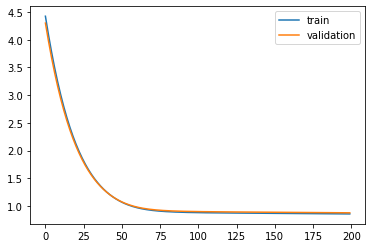

Time to train LSTM:  128.88128900527954


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f0242cde828>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.
Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f02429bbf60>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File

Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 3s - loss: 4.4515 - pdc_loss: 0.7807 - event_loss: 0.7426 - val_loss: 4.3328 - val_pdc_loss: 0.7762 - val_event_loss: 0.7350

Epoch 00001: val_loss improved from inf to 4.33285, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 4.2865 - pdc_loss: 0.7710 - event_loss: 0.7308 - val_loss: 4.1734 - val_pdc_loss: 0.7678 - val_event_loss: 0.7236

Epoch 00002: val_loss improved from 4.33285 to 4.17343, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 4.1274 - pdc_loss: 0.7617 - event_loss: 0.7192 - val_loss: 4.0199 - val_pdc_loss: 0.7596 - val_event_loss: 0.7125

Epoch 00003: val_loss improved from 4.17343 to 4.01985, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 3.9742 - pdc_loss: 0.7526 - event_loss: 0.7080 - val_loss: 3.8721 - val_pdc_loss: 0.7516 - val_event_loss: 0.7018

Epoch 00004: val_loss improved from 4.01985 to 3.87206, saving model to Event_val_weights4.hdf5
Epoch 5


Epoch 00035: val_loss improved from 1.49884 to 1.46450, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 1.4405 - pdc_loss: 0.5954 - event_loss: 0.4485 - val_loss: 1.4319 - val_pdc_loss: 0.6031 - val_event_loss: 0.4502

Epoch 00036: val_loss improved from 1.46450 to 1.43186, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 1.4082 - pdc_loss: 0.5930 - event_loss: 0.4428 - val_loss: 1.4009 - val_pdc_loss: 0.6007 - val_event_loss: 0.4447

Epoch 00037: val_loss improved from 1.43186 to 1.40087, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 1.3776 - pdc_loss: 0.5906 - event_loss: 0.4373 - val_loss: 1.3715 - val_pdc_loss: 0.5984 - val_event_loss: 0.4393

Epoch 00038: val_loss improved from 1.40087 to 1.37147, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 1.3485 - pdc_loss: 0.5884 - event_loss: 0.4319 - val_loss: 1.3436 - val_pdc_loss: 0.5963 - val_event_loss: 0.4341

Epoch 00039: val_loss improved from 1.37147 to 

 - 1s - loss: 0.9482 - pdc_loss: 0.5594 - event_loss: 0.3414 - val_loss: 0.9635 - val_pdc_loss: 0.5678 - val_event_loss: 0.3501

Epoch 00070: val_loss improved from 0.96720 to 0.96352, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.9445 - pdc_loss: 0.5589 - event_loss: 0.3406 - val_loss: 0.9601 - val_pdc_loss: 0.5674 - val_event_loss: 0.3493

Epoch 00071: val_loss improved from 0.96352 to 0.96009, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.9410 - pdc_loss: 0.5585 - event_loss: 0.3398 - val_loss: 0.9569 - val_pdc_loss: 0.5671 - val_event_loss: 0.3486

Epoch 00072: val_loss improved from 0.96009 to 0.95688, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.9378 - pdc_loss: 0.5580 - event_loss: 0.3390 - val_loss: 0.9539 - val_pdc_loss: 0.5667 - val_event_loss: 0.3479

Epoch 00073: val_loss improved from 0.95688 to 0.95389, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.9347 - pdc_loss: 0.5576 - event_


Epoch 00104: val_loss improved from 0.91507 to 0.91457, saving model to Event_val_weights4.hdf5
Epoch 105/200
 - 1s - loss: 0.8935 - pdc_loss: 0.5489 - event_loss: 0.3274 - val_loss: 0.9141 - val_pdc_loss: 0.5600 - val_event_loss: 0.3370

Epoch 00105: val_loss improved from 0.91457 to 0.91409, saving model to Event_val_weights4.hdf5
Epoch 106/200
 - 1s - loss: 0.8930 - pdc_loss: 0.5487 - event_loss: 0.3272 - val_loss: 0.9136 - val_pdc_loss: 0.5599 - val_event_loss: 0.3368

Epoch 00106: val_loss improved from 0.91409 to 0.91364, saving model to Event_val_weights4.hdf5
Epoch 107/200
 - 1s - loss: 0.8925 - pdc_loss: 0.5485 - event_loss: 0.3271 - val_loss: 0.9132 - val_pdc_loss: 0.5598 - val_event_loss: 0.3366

Epoch 00107: val_loss improved from 0.91364 to 0.91318, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.8920 - pdc_loss: 0.5483 - event_loss: 0.3269 - val_loss: 0.9128 - val_pdc_loss: 0.5597 - val_event_loss: 0.3365

Epoch 00108: val_loss improved from 0.91318

 - 1s - loss: 0.8814 - pdc_loss: 0.5437 - event_loss: 0.3233 - val_loss: 0.9039 - val_pdc_loss: 0.5565 - val_event_loss: 0.3329

Epoch 00139: val_loss improved from 0.90406 to 0.90386, saving model to Event_val_weights4.hdf5
Epoch 140/200
 - 1s - loss: 0.8812 - pdc_loss: 0.5436 - event_loss: 0.3232 - val_loss: 0.9036 - val_pdc_loss: 0.5564 - val_event_loss: 0.3328

Epoch 00140: val_loss improved from 0.90386 to 0.90364, saving model to Event_val_weights4.hdf5
Epoch 141/200
 - 1s - loss: 0.8809 - pdc_loss: 0.5435 - event_loss: 0.3231 - val_loss: 0.9034 - val_pdc_loss: 0.5564 - val_event_loss: 0.3328

Epoch 00141: val_loss improved from 0.90364 to 0.90344, saving model to Event_val_weights4.hdf5
Epoch 142/200
 - 1s - loss: 0.8807 - pdc_loss: 0.5433 - event_loss: 0.3230 - val_loss: 0.9032 - val_pdc_loss: 0.5563 - val_event_loss: 0.3327

Epoch 00142: val_loss improved from 0.90344 to 0.90323, saving model to Event_val_weights4.hdf5
Epoch 143/200
 - 1s - loss: 0.8804 - pdc_loss: 0.5432 - ev


Epoch 00173: val_loss improved from 0.89807 to 0.89795, saving model to Event_val_weights4.hdf5
Epoch 174/200
 - 1s - loss: 0.8739 - pdc_loss: 0.5398 - event_loss: 0.3207 - val_loss: 0.8978 - val_pdc_loss: 0.5539 - val_event_loss: 0.3306

Epoch 00174: val_loss improved from 0.89795 to 0.89777, saving model to Event_val_weights4.hdf5
Epoch 175/200
 - 1s - loss: 0.8737 - pdc_loss: 0.5397 - event_loss: 0.3207 - val_loss: 0.8977 - val_pdc_loss: 0.5538 - val_event_loss: 0.3305

Epoch 00175: val_loss improved from 0.89777 to 0.89766, saving model to Event_val_weights4.hdf5
Epoch 176/200
 - 1s - loss: 0.8735 - pdc_loss: 0.5396 - event_loss: 0.3206 - val_loss: 0.8975 - val_pdc_loss: 0.5538 - val_event_loss: 0.3305

Epoch 00176: val_loss improved from 0.89766 to 0.89749, saving model to Event_val_weights4.hdf5
Epoch 177/200
 - 1s - loss: 0.8734 - pdc_loss: 0.5395 - event_loss: 0.3206 - val_loss: 0.8974 - val_pdc_loss: 0.5537 - val_event_loss: 0.3304

Epoch 00177: val_loss improved from 0.89749

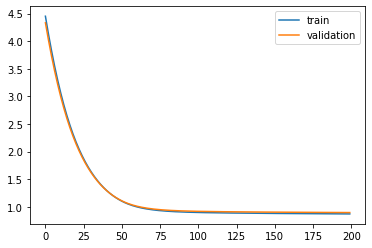

Time to train LSTM:  134.9830915927887
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 4s - loss: 4.4550 - pdc_loss: 0.7423 - event_loss: 0.7705 - val_loss: 4.3341 - val_pdc_loss: 0.7395 - val_event_loss: 0.7567

Epoch 00001: val_loss improved from inf to 4.33410, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 4.2864 - pdc_loss: 0.7361 - event_loss: 0.7486 - val_loss: 4.1698 - val_pdc_loss: 0.7332 - val_event_loss: 0.7355

Epoch 00002: val_loss improved from 4.33410 to 4.16980, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 4.1243 - pdc_loss: 0.7301 - event_loss: 0.7281 - val_loss: 4.0119 - val_pdc_loss: 0.7271 - val_event_loss: 0.7157

Epoch 00003: val_loss improved from 4.16980 to 4.01185, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 3.9685 - pdc_loss: 0.7242 - event_loss: 0.7089 - val_loss: 3.8604 - val_pdc_loss: 0.7211 - val_event_loss: 0.6972

Epoch 00004: val_loss improved from 4.01185 to 3.86039, saving m


Epoch 00035: val_loss improved from 1.44258 to 1.40787, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 1.3996 - pdc_loss: 0.5968 - event_loss: 0.3958 - val_loss: 1.3750 - val_pdc_loss: 0.5962 - val_event_loss: 0.3905

Epoch 00036: val_loss improved from 1.40787 to 1.37498, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 1.3673 - pdc_loss: 0.5945 - event_loss: 0.3910 - val_loss: 1.3438 - val_pdc_loss: 0.5940 - val_event_loss: 0.3856

Epoch 00037: val_loss improved from 1.37498 to 1.34384, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 1.3368 - pdc_loss: 0.5923 - event_loss: 0.3863 - val_loss: 1.3144 - val_pdc_loss: 0.5919 - val_event_loss: 0.3809

Epoch 00038: val_loss improved from 1.34384 to 1.31437, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 1.3079 - pdc_loss: 0.5902 - event_loss: 0.3818 - val_loss: 1.2865 - val_pdc_loss: 0.5899 - val_event_loss: 0.3764

Epoch 00039: val_loss improved from 1.31437 to 

 - 1s - loss: 0.9277 - pdc_loss: 0.5570 - event_loss: 0.3259 - val_loss: 0.9256 - val_pdc_loss: 0.5575 - val_event_loss: 0.3251

Epoch 00070: val_loss improved from 0.92876 to 0.92558, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.9245 - pdc_loss: 0.5565 - event_loss: 0.3256 - val_loss: 0.9226 - val_pdc_loss: 0.5570 - val_event_loss: 0.3249

Epoch 00071: val_loss improved from 0.92558 to 0.92263, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.9215 - pdc_loss: 0.5560 - event_loss: 0.3254 - val_loss: 0.9199 - val_pdc_loss: 0.5566 - val_event_loss: 0.3247

Epoch 00072: val_loss improved from 0.92263 to 0.91990, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.9188 - pdc_loss: 0.5556 - event_loss: 0.3252 - val_loss: 0.9174 - val_pdc_loss: 0.5562 - val_event_loss: 0.3246

Epoch 00073: val_loss improved from 0.91990 to 0.91736, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.9162 - pdc_loss: 0.5552 - event_


Epoch 00104: val_loss improved from 0.88520 to 0.88480, saving model to Event_val_weights5.hdf5
Epoch 105/200
 - 1s - loss: 0.8836 - pdc_loss: 0.5473 - event_loss: 0.3218 - val_loss: 0.8844 - val_pdc_loss: 0.5482 - val_event_loss: 0.3219

Epoch 00105: val_loss improved from 0.88480 to 0.88441, saving model to Event_val_weights5.hdf5
Epoch 106/200
 - 1s - loss: 0.8832 - pdc_loss: 0.5471 - event_loss: 0.3218 - val_loss: 0.8840 - val_pdc_loss: 0.5480 - val_event_loss: 0.3218

Epoch 00106: val_loss improved from 0.88441 to 0.88404, saving model to Event_val_weights5.hdf5
Epoch 107/200
 - 1s - loss: 0.8828 - pdc_loss: 0.5469 - event_loss: 0.3217 - val_loss: 0.8837 - val_pdc_loss: 0.5479 - val_event_loss: 0.3218

Epoch 00107: val_loss improved from 0.88404 to 0.88368, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.8824 - pdc_loss: 0.5468 - event_loss: 0.3216 - val_loss: 0.8833 - val_pdc_loss: 0.5477 - val_event_loss: 0.3217

Epoch 00108: val_loss improved from 0.88368

 - 1s - loss: 0.8740 - pdc_loss: 0.5419 - event_loss: 0.3197 - val_loss: 0.8760 - val_pdc_loss: 0.5434 - val_event_loss: 0.3203

Epoch 00139: val_loss improved from 0.87615 to 0.87598, saving model to Event_val_weights5.hdf5
Epoch 140/200
 - 1s - loss: 0.8738 - pdc_loss: 0.5418 - event_loss: 0.3197 - val_loss: 0.8758 - val_pdc_loss: 0.5433 - val_event_loss: 0.3203

Epoch 00140: val_loss improved from 0.87598 to 0.87582, saving model to Event_val_weights5.hdf5
Epoch 141/200
 - 1s - loss: 0.8736 - pdc_loss: 0.5417 - event_loss: 0.3197 - val_loss: 0.8757 - val_pdc_loss: 0.5432 - val_event_loss: 0.3203

Epoch 00141: val_loss improved from 0.87582 to 0.87565, saving model to Event_val_weights5.hdf5
Epoch 142/200
 - 1s - loss: 0.8734 - pdc_loss: 0.5415 - event_loss: 0.3196 - val_loss: 0.8755 - val_pdc_loss: 0.5430 - val_event_loss: 0.3202

Epoch 00142: val_loss improved from 0.87565 to 0.87548, saving model to Event_val_weights5.hdf5
Epoch 143/200
 - 1s - loss: 0.8732 - pdc_loss: 0.5414 - ev


Epoch 00173: val_loss improved from 0.87123 to 0.87110, saving model to Event_val_weights5.hdf5
Epoch 174/200
 - 1s - loss: 0.8678 - pdc_loss: 0.5379 - event_loss: 0.3186 - val_loss: 0.8710 - val_pdc_loss: 0.5399 - val_event_loss: 0.3198

Epoch 00174: val_loss improved from 0.87110 to 0.87098, saving model to Event_val_weights5.hdf5
Epoch 175/200
 - 1s - loss: 0.8677 - pdc_loss: 0.5378 - event_loss: 0.3186 - val_loss: 0.8708 - val_pdc_loss: 0.5398 - val_event_loss: 0.3198

Epoch 00175: val_loss improved from 0.87098 to 0.87084, saving model to Event_val_weights5.hdf5
Epoch 176/200
 - 1s - loss: 0.8675 - pdc_loss: 0.5377 - event_loss: 0.3186 - val_loss: 0.8707 - val_pdc_loss: 0.5397 - val_event_loss: 0.3197

Epoch 00176: val_loss improved from 0.87084 to 0.87072, saving model to Event_val_weights5.hdf5
Epoch 177/200
 - 1s - loss: 0.8674 - pdc_loss: 0.5376 - event_loss: 0.3185 - val_loss: 0.8706 - val_pdc_loss: 0.5396 - val_event_loss: 0.3197

Epoch 00177: val_loss improved from 0.87072

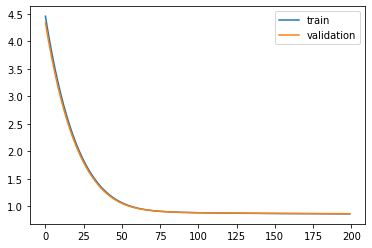

Time to train LSTM:  133.38023114204407
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 4s - loss: 6.8518 - pdc_loss: 0.7046 - event_loss: 0.7061 - val_loss: 6.6258 - val_pdc_loss: 0.7027 - val_event_loss: 0.6896

Epoch 00001: val_loss improved from inf to 6.62583, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 6.5455 - pdc_loss: 0.7005 - event_loss: 0.6835 - val_loss: 6.3277 - val_pdc_loss: 0.6987 - val_event_loss: 0.6678

Epoch 00002: val_loss improved from 6.62583 to 6.32772, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 6.2511 - pdc_loss: 0.6963 - event_loss: 0.6628 - val_loss: 6.0416 - val_pdc_loss: 0.6947 - val_event_loss: 0.6476

Epoch 00003: val_loss improved from 6.32772 to 6.04164, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 5.9686 - pdc_loss: 0.6922 - event_loss: 0.6437 - val_loss: 5.7675 - val_pdc_loss: 0.6907 - val_event_loss: 0.6290

Epoch 00004: val_loss improved from 6.04164 to 5.76755, saving 


Epoch 00035: val_loss improved from 1.59759 to 1.54651, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 1.5366 - pdc_loss: 0.5789 - event_loss: 0.3422 - val_loss: 1.4989 - val_pdc_loss: 0.5804 - val_event_loss: 0.3345

Epoch 00036: val_loss improved from 1.54651 to 1.49888, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 1.4900 - pdc_loss: 0.5774 - event_loss: 0.3394 - val_loss: 1.4545 - val_pdc_loss: 0.5789 - val_event_loss: 0.3319

Epoch 00037: val_loss improved from 1.49888 to 1.45451, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 1.4466 - pdc_loss: 0.5759 - event_loss: 0.3370 - val_loss: 1.4132 - val_pdc_loss: 0.5775 - val_event_loss: 0.3296

Epoch 00038: val_loss improved from 1.45451 to 1.41319, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 1.4062 - pdc_loss: 0.5745 - event_loss: 0.3350 - val_loss: 1.3747 - val_pdc_loss: 0.5761 - val_event_loss: 0.3277

Epoch 00039: val_loss improved from 1.41319 to 

 - 1s - loss: 0.9235 - pdc_loss: 0.5501 - event_loss: 0.3207 - val_loss: 0.9174 - val_pdc_loss: 0.5521 - val_event_loss: 0.3152

Epoch 00070: val_loss improved from 0.92123 to 0.91737, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 0.9196 - pdc_loss: 0.5498 - event_loss: 0.3206 - val_loss: 0.9138 - val_pdc_loss: 0.5517 - val_event_loss: 0.3151

Epoch 00071: val_loss improved from 0.91737 to 0.91379, saving model to Event_val_weights1.hdf5
Epoch 72/200
 - 1s - loss: 0.9160 - pdc_loss: 0.5494 - event_loss: 0.3205 - val_loss: 0.9105 - val_pdc_loss: 0.5513 - val_event_loss: 0.3151

Epoch 00072: val_loss improved from 0.91379 to 0.91046, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.9127 - pdc_loss: 0.5490 - event_loss: 0.3204 - val_loss: 0.9074 - val_pdc_loss: 0.5509 - val_event_loss: 0.3150

Epoch 00073: val_loss improved from 0.91046 to 0.90737, saving model to Event_val_weights1.hdf5
Epoch 74/200
 - 1s - loss: 0.9097 - pdc_loss: 0.5487 - event_


Epoch 00104: val_loss improved from 0.87051 to 0.87005, saving model to Event_val_weights1.hdf5
Epoch 105/200
 - 1s - loss: 0.8714 - pdc_loss: 0.5383 - event_loss: 0.3185 - val_loss: 0.8696 - val_pdc_loss: 0.5404 - val_event_loss: 0.3147

Epoch 00105: val_loss improved from 0.87005 to 0.86959, saving model to Event_val_weights1.hdf5
Epoch 106/200
 - 1s - loss: 0.8709 - pdc_loss: 0.5380 - event_loss: 0.3185 - val_loss: 0.8692 - val_pdc_loss: 0.5401 - val_event_loss: 0.3147

Epoch 00106: val_loss improved from 0.86959 to 0.86915, saving model to Event_val_weights1.hdf5
Epoch 107/200
 - 1s - loss: 0.8704 - pdc_loss: 0.5377 - event_loss: 0.3185 - val_loss: 0.8687 - val_pdc_loss: 0.5398 - val_event_loss: 0.3147

Epoch 00107: val_loss improved from 0.86915 to 0.86872, saving model to Event_val_weights1.hdf5
Epoch 108/200
 - 1s - loss: 0.8700 - pdc_loss: 0.5374 - event_loss: 0.3184 - val_loss: 0.8683 - val_pdc_loss: 0.5395 - val_event_loss: 0.3147

Epoch 00108: val_loss improved from 0.86872

 - 1s - loss: 0.8578 - pdc_loss: 0.5271 - event_loss: 0.3183 - val_loss: 0.8562 - val_pdc_loss: 0.5291 - val_event_loss: 0.3147

Epoch 00139: val_loss improved from 0.85660 to 0.85621, saving model to Event_val_weights1.hdf5
Epoch 140/200
 - 1s - loss: 0.8575 - pdc_loss: 0.5268 - event_loss: 0.3183 - val_loss: 0.8558 - val_pdc_loss: 0.5288 - val_event_loss: 0.3147

Epoch 00140: val_loss improved from 0.85621 to 0.85583, saving model to Event_val_weights1.hdf5
Epoch 141/200
 - 1s - loss: 0.8571 - pdc_loss: 0.5265 - event_loss: 0.3183 - val_loss: 0.8554 - val_pdc_loss: 0.5285 - val_event_loss: 0.3146

Epoch 00141: val_loss improved from 0.85583 to 0.85545, saving model to Event_val_weights1.hdf5
Epoch 142/200
 - 1s - loss: 0.8568 - pdc_loss: 0.5262 - event_loss: 0.3183 - val_loss: 0.8551 - val_pdc_loss: 0.5283 - val_event_loss: 0.3146

Epoch 00142: val_loss improved from 0.85545 to 0.85508, saving model to Event_val_weights1.hdf5
Epoch 143/200
 - 1s - loss: 0.8564 - pdc_loss: 0.5259 - ev


Epoch 00173: val_loss improved from 0.84698 to 0.84680, saving model to Event_val_weights1.hdf5
Epoch 174/200
 - 1s - loss: 0.8484 - pdc_loss: 0.5204 - event_loss: 0.3177 - val_loss: 0.8466 - val_pdc_loss: 0.5232 - val_event_loss: 0.3132

Epoch 00174: val_loss improved from 0.84680 to 0.84661, saving model to Event_val_weights1.hdf5
Epoch 175/200
 - 1s - loss: 0.8482 - pdc_loss: 0.5203 - event_loss: 0.3177 - val_loss: 0.8464 - val_pdc_loss: 0.5231 - val_event_loss: 0.3131

Epoch 00175: val_loss improved from 0.84661 to 0.84642, saving model to Event_val_weights1.hdf5
Epoch 176/200
 - 1s - loss: 0.8480 - pdc_loss: 0.5203 - event_loss: 0.3176 - val_loss: 0.8463 - val_pdc_loss: 0.5231 - val_event_loss: 0.3131

Epoch 00176: val_loss improved from 0.84642 to 0.84629, saving model to Event_val_weights1.hdf5
Epoch 177/200
 - 1s - loss: 0.8478 - pdc_loss: 0.5201 - event_loss: 0.3176 - val_loss: 0.8461 - val_pdc_loss: 0.5230 - val_event_loss: 0.3130

Epoch 00177: val_loss improved from 0.84629

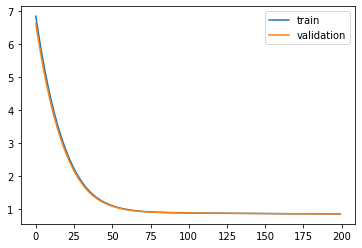

Time to train LSTM:  133.57282304763794


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f0240e57320>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 4s - loss: 6.7659 - pdc_loss: 0.7154 - event_loss: 0.6952 - val_loss: 6.5439 - val_pdc_loss: 0.7085 - val_event_loss: 0.6875

Epoch 00001: val_loss improved from inf to 6.54385, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 6.4690 - pdc_loss: 0.7100 - event_loss: 0.6829 - val_loss: 6.2554 - val_pdc_loss: 0.7034 - val_event_loss: 0.6753

Epoch 00002: val_loss improved from 6.54385 to 6.25538, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 6.1834 - pdc_loss: 0.7047 - event_loss: 0.6710 - val_loss: 5.9783 - val_pdc_loss: 0.6985 - val_event_loss: 0.6636

Epoch 00003: val_loss improved from 6.25538 to 5.97827, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 5.9093 - pdc_loss: 0.6997 - event_loss: 0.6596 - val_loss: 5.7125 - val_pdc_loss: 0.6937 - val_event_loss: 0.6524

Epoch 00004: val_loss improved from 5.97827 to 5.71254, saving model to Event_val_weights2.hdf5
Epoch 5


Epoch 00035: val_loss improved from 1.62165 to 1.57062, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 1.5521 - pdc_loss: 0.5909 - event_loss: 0.3543 - val_loss: 1.5229 - val_pdc_loss: 0.5907 - val_event_loss: 0.3559

Epoch 00036: val_loss improved from 1.57062 to 1.52293, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 1.5049 - pdc_loss: 0.5884 - event_loss: 0.3506 - val_loss: 1.4784 - val_pdc_loss: 0.5884 - val_event_loss: 0.3527

Epoch 00037: val_loss improved from 1.52293 to 1.47842, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 1.4608 - pdc_loss: 0.5860 - event_loss: 0.3473 - val_loss: 1.4369 - val_pdc_loss: 0.5862 - val_event_loss: 0.3500

Epoch 00038: val_loss improved from 1.47842 to 1.43691, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 1.4196 - pdc_loss: 0.5836 - event_loss: 0.3444 - val_loss: 1.3982 - val_pdc_loss: 0.5841 - val_event_loss: 0.3476

Epoch 00039: val_loss improved from 1.43691 to 

 - 1s - loss: 0.9235 - pdc_loss: 0.5467 - event_loss: 0.3222 - val_loss: 0.9326 - val_pdc_loss: 0.5511 - val_event_loss: 0.3293

Epoch 00070: val_loss improved from 0.93672 to 0.93257, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.9194 - pdc_loss: 0.5461 - event_loss: 0.3220 - val_loss: 0.9287 - val_pdc_loss: 0.5506 - val_event_loss: 0.3292

Epoch 00071: val_loss improved from 0.93257 to 0.92873, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.9156 - pdc_loss: 0.5456 - event_loss: 0.3218 - val_loss: 0.9252 - val_pdc_loss: 0.5501 - val_event_loss: 0.3290

Epoch 00072: val_loss improved from 0.92873 to 0.92518, saving model to Event_val_weights2.hdf5
Epoch 73/200
 - 1s - loss: 0.9120 - pdc_loss: 0.5450 - event_loss: 0.3217 - val_loss: 0.9218 - val_pdc_loss: 0.5496 - val_event_loss: 0.3289

Epoch 00073: val_loss improved from 0.92518 to 0.92184, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.9087 - pdc_loss: 0.5445 - event_


Epoch 00104: val_loss improved from 0.87841 to 0.87783, saving model to Event_val_weights2.hdf5
Epoch 105/200
 - 1s - loss: 0.8639 - pdc_loss: 0.5302 - event_loss: 0.3184 - val_loss: 0.8773 - val_pdc_loss: 0.5363 - val_event_loss: 0.3259

Epoch 00105: val_loss improved from 0.87783 to 0.87727, saving model to Event_val_weights2.hdf5
Epoch 106/200
 - 1s - loss: 0.8633 - pdc_loss: 0.5299 - event_loss: 0.3184 - val_loss: 0.8767 - val_pdc_loss: 0.5360 - val_event_loss: 0.3258

Epoch 00106: val_loss improved from 0.87727 to 0.87674, saving model to Event_val_weights2.hdf5
Epoch 107/200
 - 1s - loss: 0.8627 - pdc_loss: 0.5295 - event_loss: 0.3183 - val_loss: 0.8762 - val_pdc_loss: 0.5357 - val_event_loss: 0.3258

Epoch 00107: val_loss improved from 0.87674 to 0.87623, saving model to Event_val_weights2.hdf5
Epoch 108/200
 - 1s - loss: 0.8622 - pdc_loss: 0.5292 - event_loss: 0.3183 - val_loss: 0.8757 - val_pdc_loss: 0.5355 - val_event_loss: 0.3257

Epoch 00108: val_loss improved from 0.87623


Epoch 00139: val_loss improved from 0.86718 to 0.86687, saving model to Event_val_weights2.hdf5
Epoch 140/200
 - 1s - loss: 0.8513 - pdc_loss: 0.5231 - event_loss: 0.3167 - val_loss: 0.8666 - val_pdc_loss: 0.5314 - val_event_loss: 0.3239

Epoch 00140: val_loss improved from 0.86687 to 0.86659, saving model to Event_val_weights2.hdf5
Epoch 141/200
 - 1s - loss: 0.8510 - pdc_loss: 0.5230 - event_loss: 0.3167 - val_loss: 0.8665 - val_pdc_loss: 0.5313 - val_event_loss: 0.3238

Epoch 00141: val_loss improved from 0.86659 to 0.86648, saving model to Event_val_weights2.hdf5
Epoch 142/200
 - 1s - loss: 0.8508 - pdc_loss: 0.5228 - event_loss: 0.3167 - val_loss: 0.8662 - val_pdc_loss: 0.5312 - val_event_loss: 0.3237

Epoch 00142: val_loss improved from 0.86648 to 0.86616, saving model to Event_val_weights2.hdf5
Epoch 143/200
 - 1s - loss: 0.8506 - pdc_loss: 0.5227 - event_loss: 0.3166 - val_loss: 0.8662 - val_pdc_loss: 0.5312 - val_event_loss: 0.3238

Epoch 00143: val_loss did not improve from 

 - 1s - loss: 0.8446 - pdc_loss: 0.5192 - event_loss: 0.3156 - val_loss: 0.8618 - val_pdc_loss: 0.5293 - val_event_loss: 0.3227

Epoch 00175: val_loss improved from 0.86186 to 0.86181, saving model to Event_val_weights2.hdf5
Epoch 176/200
 - 1s - loss: 0.8445 - pdc_loss: 0.5191 - event_loss: 0.3156 - val_loss: 0.8617 - val_pdc_loss: 0.5292 - val_event_loss: 0.3227

Epoch 00176: val_loss improved from 0.86181 to 0.86169, saving model to Event_val_weights2.hdf5
Epoch 177/200
 - 1s - loss: 0.8443 - pdc_loss: 0.5190 - event_loss: 0.3156 - val_loss: 0.8616 - val_pdc_loss: 0.5292 - val_event_loss: 0.3227

Epoch 00177: val_loss improved from 0.86169 to 0.86158, saving model to Event_val_weights2.hdf5
Epoch 178/200
 - 1s - loss: 0.8442 - pdc_loss: 0.5189 - event_loss: 0.3155 - val_loss: 0.8615 - val_pdc_loss: 0.5292 - val_event_loss: 0.3227

Epoch 00178: val_loss improved from 0.86158 to 0.86152, saving model to Event_val_weights2.hdf5
Epoch 179/200
 - 1s - loss: 0.8440 - pdc_loss: 0.5188 - ev

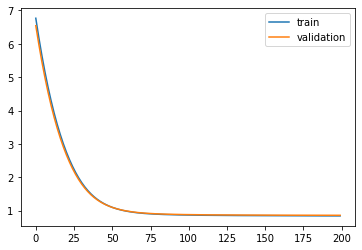

Time to train LSTM:  136.09637713432312
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 4s - loss: 6.8427 - pdc_loss: 0.6983 - event_loss: 0.7139 - val_loss: 6.6135 - val_pdc_loss: 0.6966 - val_event_loss: 0.6950

Epoch 00001: val_loss improved from inf to 6.61351, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 6.5383 - pdc_loss: 0.6950 - event_loss: 0.6937 - val_loss: 6.3179 - val_pdc_loss: 0.6937 - val_event_loss: 0.6754

Epoch 00002: val_loss improved from 6.61351 to 6.31788, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 6.2454 - pdc_loss: 0.6920 - event_loss: 0.6741 - val_loss: 6.0338 - val_pdc_loss: 0.6910 - val_event_loss: 0.6566

Epoch 00003: val_loss improved from 6.31788 to 6.03383, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 5.9641 - pdc_loss: 0.6893 - event_loss: 0.6554 - val_loss: 5.7614 - val_pdc_loss: 0.6885 - val_event_loss: 0.6386

Epoch 00004: val_loss improved from 6.03383 to 5.76137, saving 


Epoch 00035: val_loss improved from 1.64102 to 1.59006, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 1.5688 - pdc_loss: 0.6135 - event_loss: 0.3437 - val_loss: 1.5423 - val_pdc_loss: 0.6169 - val_event_loss: 0.3447

Epoch 00036: val_loss improved from 1.59006 to 1.54234, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 1.5214 - pdc_loss: 0.6102 - event_loss: 0.3410 - val_loss: 1.4977 - val_pdc_loss: 0.6139 - val_event_loss: 0.3424

Epoch 00037: val_loss improved from 1.54234 to 1.49770, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 1.4771 - pdc_loss: 0.6069 - event_loss: 0.3386 - val_loss: 1.4560 - val_pdc_loss: 0.6109 - val_event_loss: 0.3405

Epoch 00038: val_loss improved from 1.49770 to 1.45595, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 1.4357 - pdc_loss: 0.6036 - event_loss: 0.3366 - val_loss: 1.4170 - val_pdc_loss: 0.6080 - val_event_loss: 0.3388

Epoch 00039: val_loss improved from 1.45595 to 

 - 1s - loss: 0.9289 - pdc_loss: 0.5542 - event_loss: 0.3211 - val_loss: 0.9432 - val_pdc_loss: 0.5657 - val_event_loss: 0.3264

Epoch 00070: val_loss improved from 0.94731 to 0.94319, saving model to Event_val_weights3.hdf5
Epoch 71/200
 - 1s - loss: 0.9248 - pdc_loss: 0.5537 - event_loss: 0.3210 - val_loss: 0.9394 - val_pdc_loss: 0.5653 - val_event_loss: 0.3263

Epoch 00071: val_loss improved from 0.94319 to 0.93937, saving model to Event_val_weights3.hdf5
Epoch 72/200
 - 1s - loss: 0.9210 - pdc_loss: 0.5532 - event_loss: 0.3208 - val_loss: 0.9358 - val_pdc_loss: 0.5649 - val_event_loss: 0.3262

Epoch 00072: val_loss improved from 0.93937 to 0.93583, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.9174 - pdc_loss: 0.5527 - event_loss: 0.3207 - val_loss: 0.9326 - val_pdc_loss: 0.5646 - val_event_loss: 0.3261

Epoch 00073: val_loss improved from 0.93583 to 0.93256, saving model to Event_val_weights3.hdf5
Epoch 74/200
 - 1s - loss: 0.9141 - pdc_loss: 0.5523 - event_


Epoch 00104: val_loss improved from 0.89264 to 0.89213, saving model to Event_val_weights3.hdf5
Epoch 105/200
 - 1s - loss: 0.8712 - pdc_loss: 0.5398 - event_loss: 0.3183 - val_loss: 0.8916 - val_pdc_loss: 0.5545 - val_event_loss: 0.3241

Epoch 00105: val_loss improved from 0.89213 to 0.89163, saving model to Event_val_weights3.hdf5
Epoch 106/200
 - 1s - loss: 0.8706 - pdc_loss: 0.5393 - event_loss: 0.3183 - val_loss: 0.8911 - val_pdc_loss: 0.5541 - val_event_loss: 0.3241

Epoch 00106: val_loss improved from 0.89163 to 0.89115, saving model to Event_val_weights3.hdf5
Epoch 107/200
 - 1s - loss: 0.8700 - pdc_loss: 0.5389 - event_loss: 0.3183 - val_loss: 0.8907 - val_pdc_loss: 0.5538 - val_event_loss: 0.3241

Epoch 00107: val_loss improved from 0.89115 to 0.89068, saving model to Event_val_weights3.hdf5
Epoch 108/200
 - 1s - loss: 0.8694 - pdc_loss: 0.5385 - event_loss: 0.3182 - val_loss: 0.8902 - val_pdc_loss: 0.5535 - val_event_loss: 0.3241

Epoch 00108: val_loss improved from 0.89068

 - 1s - loss: 0.8568 - pdc_loss: 0.5284 - event_loss: 0.3175 - val_loss: 0.8812 - val_pdc_loss: 0.5462 - val_event_loss: 0.3241

Epoch 00139: val_loss improved from 0.88140 to 0.88118, saving model to Event_val_weights3.hdf5
Epoch 140/200
 - 1s - loss: 0.8565 - pdc_loss: 0.5282 - event_loss: 0.3175 - val_loss: 0.8810 - val_pdc_loss: 0.5461 - val_event_loss: 0.3241

Epoch 00140: val_loss improved from 0.88118 to 0.88100, saving model to Event_val_weights3.hdf5
Epoch 141/200
 - 1s - loss: 0.8563 - pdc_loss: 0.5280 - event_loss: 0.3175 - val_loss: 0.8808 - val_pdc_loss: 0.5460 - val_event_loss: 0.3240

Epoch 00141: val_loss improved from 0.88100 to 0.88085, saving model to Event_val_weights3.hdf5
Epoch 142/200
 - 1s - loss: 0.8560 - pdc_loss: 0.5277 - event_loss: 0.3175 - val_loss: 0.8805 - val_pdc_loss: 0.5457 - val_event_loss: 0.3241

Epoch 00142: val_loss improved from 0.88085 to 0.88051, saving model to Event_val_weights3.hdf5
Epoch 143/200
 - 1s - loss: 0.8558 - pdc_loss: 0.5275 - ev

 - 1s - loss: 0.8491 - pdc_loss: 0.5225 - event_loss: 0.3167 - val_loss: 0.8762 - val_pdc_loss: 0.5425 - val_event_loss: 0.3239

Epoch 00175: val_loss did not improve from 0.87592
Epoch 176/200
 - 1s - loss: 0.8489 - pdc_loss: 0.5224 - event_loss: 0.3167 - val_loss: 0.8760 - val_pdc_loss: 0.5423 - val_event_loss: 0.3238

Epoch 00176: val_loss did not improve from 0.87592
Epoch 177/200
 - 1s - loss: 0.8488 - pdc_loss: 0.5223 - event_loss: 0.3167 - val_loss: 0.8758 - val_pdc_loss: 0.5421 - val_event_loss: 0.3238

Epoch 00177: val_loss improved from 0.87592 to 0.87577, saving model to Event_val_weights3.hdf5
Epoch 178/200
 - 1s - loss: 0.8486 - pdc_loss: 0.5221 - event_loss: 0.3166 - val_loss: 0.8758 - val_pdc_loss: 0.5421 - val_event_loss: 0.3239

Epoch 00178: val_loss did not improve from 0.87577
Epoch 179/200
 - 1s - loss: 0.8484 - pdc_loss: 0.5220 - event_loss: 0.3166 - val_loss: 0.8758 - val_pdc_loss: 0.5422 - val_event_loss: 0.3238

Epoch 00179: val_loss did not improve from 0.87577

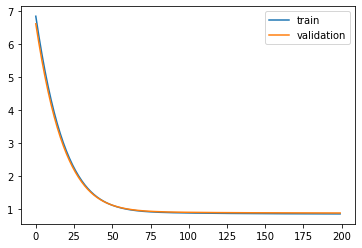

Time to train LSTM:  130.27639532089233
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 5s - loss: 6.7528 - pdc_loss: 0.7141 - event_loss: 0.7160 - val_loss: 6.5327 - val_pdc_loss: 0.7143 - val_event_loss: 0.7001

Epoch 00001: val_loss improved from inf to 6.53271, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 6.4498 - pdc_loss: 0.7108 - event_loss: 0.6914 - val_loss: 6.2390 - val_pdc_loss: 0.7110 - val_event_loss: 0.6771

Epoch 00002: val_loss improved from 6.53271 to 6.23896, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 6.1589 - pdc_loss: 0.7075 - event_loss: 0.6686 - val_loss: 5.9575 - val_pdc_loss: 0.7078 - val_event_loss: 0.6558

Epoch 00003: val_loss improved from 6.23896 to 5.95745, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 5.8803 - pdc_loss: 0.7043 - event_loss: 0.6476 - val_loss: 5.6881 - val_pdc_loss: 0.7048 - val_event_loss: 0.6363

Epoch 00004: val_loss improved from 5.95745 to 5.68809, saving 


Epoch 00035: val_loss improved from 1.64177 to 1.59171, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 1.5643 - pdc_loss: 0.6189 - event_loss: 0.3416 - val_loss: 1.5448 - val_pdc_loss: 0.6202 - val_event_loss: 0.3510

Epoch 00036: val_loss improved from 1.59171 to 1.54478, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 1.5182 - pdc_loss: 0.6157 - event_loss: 0.3392 - val_loss: 1.5008 - val_pdc_loss: 0.6171 - val_event_loss: 0.3488

Epoch 00037: val_loss improved from 1.54478 to 1.50079, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 1.4750 - pdc_loss: 0.6125 - event_loss: 0.3372 - val_loss: 1.4596 - val_pdc_loss: 0.6139 - val_event_loss: 0.3468

Epoch 00038: val_loss improved from 1.50079 to 1.45959, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 1.4345 - pdc_loss: 0.6093 - event_loss: 0.3354 - val_loss: 1.4210 - val_pdc_loss: 0.6108 - val_event_loss: 0.3451

Epoch 00039: val_loss improved from 1.45959 to 

 - 1s - loss: 0.9294 - pdc_loss: 0.5558 - event_loss: 0.3191 - val_loss: 0.9457 - val_pdc_loss: 0.5651 - val_event_loss: 0.3288

Epoch 00070: val_loss improved from 0.94980 to 0.94571, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.9253 - pdc_loss: 0.5553 - event_loss: 0.3190 - val_loss: 0.9419 - val_pdc_loss: 0.5647 - val_event_loss: 0.3287

Epoch 00071: val_loss improved from 0.94571 to 0.94193, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.9215 - pdc_loss: 0.5548 - event_loss: 0.3189 - val_loss: 0.9384 - val_pdc_loss: 0.5643 - val_event_loss: 0.3285

Epoch 00072: val_loss improved from 0.94193 to 0.93844, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.9179 - pdc_loss: 0.5544 - event_loss: 0.3187 - val_loss: 0.9352 - val_pdc_loss: 0.5640 - val_event_loss: 0.3284

Epoch 00073: val_loss improved from 0.93844 to 0.93522, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.9147 - pdc_loss: 0.5540 - event_


Epoch 00104: val_loss improved from 0.89845 to 0.89806, saving model to Event_val_weights4.hdf5
Epoch 105/200
 - 1s - loss: 0.8749 - pdc_loss: 0.5442 - event_loss: 0.3165 - val_loss: 0.8977 - val_pdc_loss: 0.5566 - val_event_loss: 0.3270

Epoch 00105: val_loss improved from 0.89806 to 0.89769, saving model to Event_val_weights4.hdf5
Epoch 106/200
 - 1s - loss: 0.8744 - pdc_loss: 0.5440 - event_loss: 0.3164 - val_loss: 0.8973 - val_pdc_loss: 0.5564 - val_event_loss: 0.3270

Epoch 00106: val_loss improved from 0.89769 to 0.89733, saving model to Event_val_weights4.hdf5
Epoch 107/200
 - 1s - loss: 0.8740 - pdc_loss: 0.5437 - event_loss: 0.3164 - val_loss: 0.8970 - val_pdc_loss: 0.5563 - val_event_loss: 0.3270

Epoch 00107: val_loss improved from 0.89733 to 0.89699, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.8735 - pdc_loss: 0.5434 - event_loss: 0.3164 - val_loss: 0.8967 - val_pdc_loss: 0.5561 - val_event_loss: 0.3270

Epoch 00108: val_loss improved from 0.89699

 - 1s - loss: 0.8619 - pdc_loss: 0.5336 - event_loss: 0.3159 - val_loss: 0.8880 - val_pdc_loss: 0.5486 - val_event_loss: 0.3269

Epoch 00139: val_loss improved from 0.88834 to 0.88802, saving model to Event_val_weights4.hdf5
Epoch 140/200
 - 1s - loss: 0.8615 - pdc_loss: 0.5332 - event_loss: 0.3159 - val_loss: 0.8877 - val_pdc_loss: 0.5482 - val_event_loss: 0.3270

Epoch 00140: val_loss improved from 0.88802 to 0.88768, saving model to Event_val_weights4.hdf5
Epoch 141/200
 - 1s - loss: 0.8611 - pdc_loss: 0.5327 - event_loss: 0.3159 - val_loss: 0.8873 - val_pdc_loss: 0.5479 - val_event_loss: 0.3270

Epoch 00141: val_loss improved from 0.88768 to 0.88734, saving model to Event_val_weights4.hdf5
Epoch 142/200
 - 1s - loss: 0.8606 - pdc_loss: 0.5323 - event_loss: 0.3159 - val_loss: 0.8870 - val_pdc_loss: 0.5475 - val_event_loss: 0.3270

Epoch 00142: val_loss improved from 0.88734 to 0.88699, saving model to Event_val_weights4.hdf5
Epoch 143/200
 - 1s - loss: 0.8602 - pdc_loss: 0.5318 - ev


Epoch 00173: val_loss improved from 0.87599 to 0.87573, saving model to Event_val_weights4.hdf5
Epoch 174/200
 - 1s - loss: 0.8458 - pdc_loss: 0.5191 - event_loss: 0.3154 - val_loss: 0.8755 - val_pdc_loss: 0.5377 - val_event_loss: 0.3265

Epoch 00174: val_loss improved from 0.87573 to 0.87549, saving model to Event_val_weights4.hdf5
Epoch 175/200
 - 1s - loss: 0.8455 - pdc_loss: 0.5190 - event_loss: 0.3153 - val_loss: 0.8753 - val_pdc_loss: 0.5376 - val_event_loss: 0.3265

Epoch 00175: val_loss improved from 0.87549 to 0.87526, saving model to Event_val_weights4.hdf5
Epoch 176/200
 - 1s - loss: 0.8452 - pdc_loss: 0.5188 - event_loss: 0.3153 - val_loss: 0.8750 - val_pdc_loss: 0.5375 - val_event_loss: 0.3265

Epoch 00176: val_loss improved from 0.87526 to 0.87504, saving model to Event_val_weights4.hdf5
Epoch 177/200
 - 1s - loss: 0.8449 - pdc_loss: 0.5187 - event_loss: 0.3152 - val_loss: 0.8748 - val_pdc_loss: 0.5375 - val_event_loss: 0.3264

Epoch 00177: val_loss improved from 0.87504

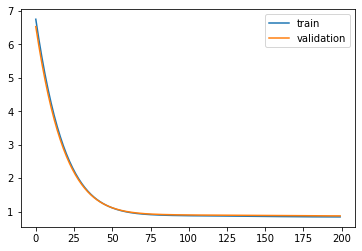

Time to train LSTM:  132.6177659034729


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f007dd64a90>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 5s - loss: 6.8112 - pdc_loss: 0.6957 - event_loss: 0.7092 - val_loss: 6.5837 - val_pdc_loss: 0.6919 - val_event_loss: 0.6919

Epoch 00001: val_loss improved from inf to 6.58365, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 6.5053 - pdc_loss: 0.6923 - event_loss: 0.6846 - val_loss: 6.2865 - val_pdc_loss: 0.6885 - val_event_loss: 0.6683

Epoch 00002: val_loss improved from 6.58365 to 6.28647, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 6.2118 - pdc_loss: 0.6890 - event_loss: 0.6620 - val_loss: 6.0019 - val_pdc_loss: 0.6851 - val_event_loss: 0.6472

Epoch 00003: val_loss improved from 6.28647 to 6.00186, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 5.9306 - pdc_loss: 0.6855 - event_loss: 0.6416 - val_loss: 5.7297 - val_pdc_loss: 0.6816 - val_event_loss: 0.6283

Epoch 00004: val_loss improved from 6.00186 to 5.72969, saving model to Event_val_weights5.hdf5
Epoch 5


Epoch 00035: val_loss improved from 1.60184 to 1.55144, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 1.5373 - pdc_loss: 0.5816 - event_loss: 0.3423 - val_loss: 1.5044 - val_pdc_loss: 0.5836 - val_event_loss: 0.3386

Epoch 00036: val_loss improved from 1.55144 to 1.50436, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 1.4910 - pdc_loss: 0.5798 - event_loss: 0.3397 - val_loss: 1.4604 - val_pdc_loss: 0.5819 - val_event_loss: 0.3363

Epoch 00037: val_loss improved from 1.50436 to 1.46040, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 1.4478 - pdc_loss: 0.5781 - event_loss: 0.3374 - val_loss: 1.4193 - val_pdc_loss: 0.5802 - val_event_loss: 0.3343

Epoch 00038: val_loss improved from 1.46040 to 1.41930, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 1.4074 - pdc_loss: 0.5764 - event_loss: 0.3355 - val_loss: 1.3810 - val_pdc_loss: 0.5785 - val_event_loss: 0.3326

Epoch 00039: val_loss improved from 1.41930 to 

 - 1s - loss: 0.9228 - pdc_loss: 0.5497 - event_loss: 0.3197 - val_loss: 0.9218 - val_pdc_loss: 0.5509 - val_event_loss: 0.3201

Epoch 00070: val_loss improved from 0.92586 to 0.92183, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.9188 - pdc_loss: 0.5492 - event_loss: 0.3195 - val_loss: 0.9181 - val_pdc_loss: 0.5504 - val_event_loss: 0.3200

Epoch 00071: val_loss improved from 0.92183 to 0.91808, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.9152 - pdc_loss: 0.5488 - event_loss: 0.3194 - val_loss: 0.9146 - val_pdc_loss: 0.5499 - val_event_loss: 0.3199

Epoch 00072: val_loss improved from 0.91808 to 0.91460, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.9118 - pdc_loss: 0.5483 - event_loss: 0.3194 - val_loss: 0.9114 - val_pdc_loss: 0.5494 - val_event_loss: 0.3198

Epoch 00073: val_loss improved from 0.91460 to 0.91137, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.9086 - pdc_loss: 0.5478 - event_


Epoch 00104: val_loss improved from 0.87234 to 0.87184, saving model to Event_val_weights5.hdf5
Epoch 105/200
 - 1s - loss: 0.8684 - pdc_loss: 0.5362 - event_loss: 0.3179 - val_loss: 0.8713 - val_pdc_loss: 0.5387 - val_event_loss: 0.3185

Epoch 00105: val_loss improved from 0.87184 to 0.87135, saving model to Event_val_weights5.hdf5
Epoch 106/200
 - 1s - loss: 0.8679 - pdc_loss: 0.5359 - event_loss: 0.3179 - val_loss: 0.8709 - val_pdc_loss: 0.5385 - val_event_loss: 0.3184

Epoch 00106: val_loss improved from 0.87135 to 0.87088, saving model to Event_val_weights5.hdf5
Epoch 107/200
 - 1s - loss: 0.8673 - pdc_loss: 0.5356 - event_loss: 0.3178 - val_loss: 0.8704 - val_pdc_loss: 0.5382 - val_event_loss: 0.3184

Epoch 00107: val_loss improved from 0.87088 to 0.87042, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.8668 - pdc_loss: 0.5353 - event_loss: 0.3178 - val_loss: 0.8700 - val_pdc_loss: 0.5380 - val_event_loss: 0.3184

Epoch 00108: val_loss improved from 0.87042

 - 1s - loss: 0.8555 - pdc_loss: 0.5275 - event_loss: 0.3172 - val_loss: 0.8600 - val_pdc_loss: 0.5316 - val_event_loss: 0.3176

Epoch 00139: val_loss improved from 0.86028 to 0.85998, saving model to Event_val_weights5.hdf5
Epoch 140/200
 - 1s - loss: 0.8552 - pdc_loss: 0.5273 - event_loss: 0.3172 - val_loss: 0.8597 - val_pdc_loss: 0.5313 - val_event_loss: 0.3176

Epoch 00140: val_loss improved from 0.85998 to 0.85968, saving model to Event_val_weights5.hdf5
Epoch 141/200
 - 1s - loss: 0.8549 - pdc_loss: 0.5271 - event_loss: 0.3172 - val_loss: 0.8595 - val_pdc_loss: 0.5313 - val_event_loss: 0.3176

Epoch 00141: val_loss improved from 0.85968 to 0.85948, saving model to Event_val_weights5.hdf5
Epoch 142/200
 - 1s - loss: 0.8546 - pdc_loss: 0.5269 - event_loss: 0.3171 - val_loss: 0.8592 - val_pdc_loss: 0.5310 - val_event_loss: 0.3176

Epoch 00142: val_loss improved from 0.85948 to 0.85916, saving model to Event_val_weights5.hdf5
Epoch 143/200
 - 1s - loss: 0.8544 - pdc_loss: 0.5267 - ev


Epoch 00173: val_loss improved from 0.85251 to 0.85224, saving model to Event_val_weights5.hdf5
Epoch 174/200
 - 1s - loss: 0.8468 - pdc_loss: 0.5214 - event_loss: 0.3161 - val_loss: 0.8522 - val_pdc_loss: 0.5261 - val_event_loss: 0.3169

Epoch 00174: val_loss improved from 0.85224 to 0.85223, saving model to Event_val_weights5.hdf5
Epoch 175/200
 - 1s - loss: 0.8467 - pdc_loss: 0.5213 - event_loss: 0.3161 - val_loss: 0.8520 - val_pdc_loss: 0.5258 - val_event_loss: 0.3169

Epoch 00175: val_loss improved from 0.85223 to 0.85197, saving model to Event_val_weights5.hdf5
Epoch 176/200
 - 1s - loss: 0.8464 - pdc_loss: 0.5212 - event_loss: 0.3161 - val_loss: 0.8518 - val_pdc_loss: 0.5257 - val_event_loss: 0.3169

Epoch 00176: val_loss improved from 0.85197 to 0.85175, saving model to Event_val_weights5.hdf5
Epoch 177/200
 - 1s - loss: 0.8463 - pdc_loss: 0.5210 - event_loss: 0.3161 - val_loss: 0.8515 - val_pdc_loss: 0.5255 - val_event_loss: 0.3169

Epoch 00177: val_loss improved from 0.85175

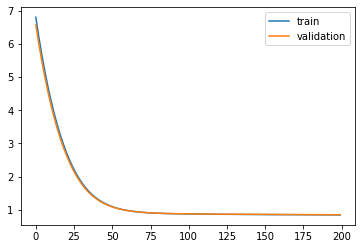

Time to train LSTM:  137.93483519554138
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 5s - loss: 10.7219 - pdc_loss: 0.7144 - event_loss: 0.7328 - val_loss: 10.3005 - val_pdc_loss: 0.7067 - val_event_loss: 0.7009

Epoch 00001: val_loss improved from inf to 10.30051, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 10.1597 - pdc_loss: 0.7052 - event_loss: 0.6938 - val_loss: 9.7567 - val_pdc_loss: 0.6980 - val_event_loss: 0.6652

Epoch 00002: val_loss improved from 10.30051 to 9.75672, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 9.6229 - pdc_loss: 0.6966 - event_loss: 0.6597 - val_loss: 9.2381 - val_pdc_loss: 0.6899 - val_event_loss: 0.6339

Epoch 00003: val_loss improved from 9.75672 to 9.23812, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 9.1112 - pdc_loss: 0.6886 - event_loss: 0.6298 - val_loss: 8.7441 - val_pdc_loss: 0.6823 - val_event_loss: 0.6062

Epoch 00004: val_loss improved from 9.23812 to 8.74412, sa


Epoch 00035: val_loss improved from 1.82432 to 1.75313, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 1.7359 - pdc_loss: 0.5675 - event_loss: 0.3253 - val_loss: 1.6869 - val_pdc_loss: 0.5701 - val_event_loss: 0.3206

Epoch 00036: val_loss improved from 1.75313 to 1.68689, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 1.6709 - pdc_loss: 0.5661 - event_loss: 0.3246 - val_loss: 1.6253 - val_pdc_loss: 0.5688 - val_event_loss: 0.3199

Epoch 00037: val_loss improved from 1.68689 to 1.62529, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 1.6105 - pdc_loss: 0.5648 - event_loss: 0.3239 - val_loss: 1.5680 - val_pdc_loss: 0.5676 - val_event_loss: 0.3193

Epoch 00038: val_loss improved from 1.62529 to 1.56802, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 1.5543 - pdc_loss: 0.5637 - event_loss: 0.3233 - val_loss: 1.5148 - val_pdc_loss: 0.5664 - val_event_loss: 0.3188

Epoch 00039: val_loss improved from 1.56802 to 

 - 1s - loss: 0.9140 - pdc_loss: 0.5416 - event_loss: 0.3176 - val_loss: 0.9095 - val_pdc_loss: 0.5439 - val_event_loss: 0.3136

Epoch 00070: val_loss improved from 0.91410 to 0.90949, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 0.9095 - pdc_loss: 0.5410 - event_loss: 0.3175 - val_loss: 0.9052 - val_pdc_loss: 0.5433 - val_event_loss: 0.3135

Epoch 00071: val_loss improved from 0.90949 to 0.90523, saving model to Event_val_weights1.hdf5
Epoch 72/200
 - 1s - loss: 0.9054 - pdc_loss: 0.5404 - event_loss: 0.3175 - val_loss: 0.9013 - val_pdc_loss: 0.5427 - val_event_loss: 0.3135

Epoch 00072: val_loss improved from 0.90523 to 0.90129, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.9015 - pdc_loss: 0.5398 - event_loss: 0.3175 - val_loss: 0.8976 - val_pdc_loss: 0.5421 - val_event_loss: 0.3134

Epoch 00073: val_loss improved from 0.90129 to 0.89765, saving model to Event_val_weights1.hdf5
Epoch 74/200
 - 1s - loss: 0.8980 - pdc_loss: 0.5392 - event_


Epoch 00104: val_loss improved from 0.85344 to 0.85296, saving model to Event_val_weights1.hdf5
Epoch 105/200
 - 1s - loss: 0.8541 - pdc_loss: 0.5244 - event_loss: 0.3167 - val_loss: 0.8525 - val_pdc_loss: 0.5273 - val_event_loss: 0.3124

Epoch 00105: val_loss improved from 0.85296 to 0.85248, saving model to Event_val_weights1.hdf5
Epoch 106/200
 - 1s - loss: 0.8536 - pdc_loss: 0.5242 - event_loss: 0.3166 - val_loss: 0.8520 - val_pdc_loss: 0.5271 - val_event_loss: 0.3123

Epoch 00106: val_loss improved from 0.85248 to 0.85204, saving model to Event_val_weights1.hdf5
Epoch 107/200
 - 1s - loss: 0.8532 - pdc_loss: 0.5240 - event_loss: 0.3166 - val_loss: 0.8516 - val_pdc_loss: 0.5269 - val_event_loss: 0.3123

Epoch 00107: val_loss improved from 0.85204 to 0.85162, saving model to Event_val_weights1.hdf5
Epoch 108/200
 - 1s - loss: 0.8528 - pdc_loss: 0.5238 - event_loss: 0.3166 - val_loss: 0.8512 - val_pdc_loss: 0.5267 - val_event_loss: 0.3122

Epoch 00108: val_loss improved from 0.85162

 - 1s - loss: 0.8449 - pdc_loss: 0.5194 - event_loss: 0.3154 - val_loss: 0.8447 - val_pdc_loss: 0.5233 - val_event_loss: 0.3114

Epoch 00139: val_loss improved from 0.84489 to 0.84471, saving model to Event_val_weights1.hdf5
Epoch 140/200
 - 1s - loss: 0.8447 - pdc_loss: 0.5193 - event_loss: 0.3154 - val_loss: 0.8446 - val_pdc_loss: 0.5232 - val_event_loss: 0.3114

Epoch 00140: val_loss improved from 0.84471 to 0.84464, saving model to Event_val_weights1.hdf5
Epoch 141/200
 - 1s - loss: 0.8445 - pdc_loss: 0.5191 - event_loss: 0.3154 - val_loss: 0.8444 - val_pdc_loss: 0.5231 - val_event_loss: 0.3113

Epoch 00141: val_loss improved from 0.84464 to 0.84445, saving model to Event_val_weights1.hdf5
Epoch 142/200
 - 1s - loss: 0.8444 - pdc_loss: 0.5190 - event_loss: 0.3153 - val_loss: 0.8444 - val_pdc_loss: 0.5231 - val_event_loss: 0.3113

Epoch 00142: val_loss improved from 0.84445 to 0.84438, saving model to Event_val_weights1.hdf5
Epoch 143/200
 - 1s - loss: 0.8443 - pdc_loss: 0.5190 - ev


Epoch 00176: val_loss improved from 0.84156 to 0.84144, saving model to Event_val_weights1.hdf5
Epoch 177/200
 - 1s - loss: 0.8393 - pdc_loss: 0.5152 - event_loss: 0.3145 - val_loss: 0.8414 - val_pdc_loss: 0.5209 - val_event_loss: 0.3109

Epoch 00177: val_loss improved from 0.84144 to 0.84142, saving model to Event_val_weights1.hdf5
Epoch 178/200
 - 1s - loss: 0.8391 - pdc_loss: 0.5150 - event_loss: 0.3145 - val_loss: 0.8413 - val_pdc_loss: 0.5209 - val_event_loss: 0.3108

Epoch 00178: val_loss improved from 0.84142 to 0.84134, saving model to Event_val_weights1.hdf5
Epoch 179/200
 - 1s - loss: 0.8389 - pdc_loss: 0.5149 - event_loss: 0.3144 - val_loss: 0.8413 - val_pdc_loss: 0.5209 - val_event_loss: 0.3108

Epoch 00179: val_loss improved from 0.84134 to 0.84134, saving model to Event_val_weights1.hdf5
Epoch 180/200
 - 1s - loss: 0.8388 - pdc_loss: 0.5148 - event_loss: 0.3144 - val_loss: 0.8413 - val_pdc_loss: 0.5209 - val_event_loss: 0.3109

Epoch 00180: val_loss improved from 0.84134

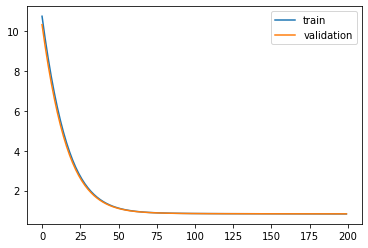

Time to train LSTM:  135.10222101211548
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 6s - loss: 10.8501 - pdc_loss: 0.7270 - event_loss: 0.7220 - val_loss: 10.4358 - val_pdc_loss: 0.7223 - val_event_loss: 0.7000

Epoch 00001: val_loss improved from inf to 10.43577, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 10.2902 - pdc_loss: 0.7167 - event_loss: 0.6942 - val_loss: 9.8941 - val_pdc_loss: 0.7127 - val_event_loss: 0.6746

Epoch 00002: val_loss improved from 10.43577 to 9.89411, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 9.7551 - pdc_loss: 0.7074 - event_loss: 0.6697 - val_loss: 9.3772 - val_pdc_loss: 0.7041 - val_event_loss: 0.6524

Epoch 00003: val_loss improved from 9.89411 to 9.37716, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 9.2444 - pdc_loss: 0.6990 - event_loss: 0.6481 - val_loss: 8.8844 - val_pdc_loss: 0.6962 - val_event_loss: 0.6329

Epoch 00004: val_loss improved from 9.37716 to 8.88440, sa


Epoch 00035: val_loss improved from 1.85981 to 1.78640, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 1.7587 - pdc_loss: 0.5636 - event_loss: 0.3263 - val_loss: 1.7181 - val_pdc_loss: 0.5680 - val_event_loss: 0.3294

Epoch 00036: val_loss improved from 1.78640 to 1.71807, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 1.6914 - pdc_loss: 0.5618 - event_loss: 0.3252 - val_loss: 1.6545 - val_pdc_loss: 0.5663 - val_event_loss: 0.3286

Epoch 00037: val_loss improved from 1.71807 to 1.65449, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 1.6288 - pdc_loss: 0.5601 - event_loss: 0.3243 - val_loss: 1.5954 - val_pdc_loss: 0.5646 - val_event_loss: 0.3279

Epoch 00038: val_loss improved from 1.65449 to 1.59536, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 1.5707 - pdc_loss: 0.5584 - event_loss: 0.3236 - val_loss: 1.5404 - val_pdc_loss: 0.5632 - val_event_loss: 0.3273

Epoch 00039: val_loss improved from 1.59536 to 

 - 1s - loss: 0.9090 - pdc_loss: 0.5342 - event_loss: 0.3170 - val_loss: 0.9180 - val_pdc_loss: 0.5402 - val_event_loss: 0.3231

Epoch 00070: val_loss improved from 0.92268 to 0.91800, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.9043 - pdc_loss: 0.5337 - event_loss: 0.3170 - val_loss: 0.9137 - val_pdc_loss: 0.5397 - val_event_loss: 0.3231

Epoch 00071: val_loss improved from 0.91800 to 0.91368, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.9001 - pdc_loss: 0.5332 - event_loss: 0.3169 - val_loss: 0.9097 - val_pdc_loss: 0.5393 - val_event_loss: 0.3230

Epoch 00072: val_loss improved from 0.91368 to 0.90968, saving model to Event_val_weights2.hdf5
Epoch 73/200
 - 1s - loss: 0.8961 - pdc_loss: 0.5327 - event_loss: 0.3169 - val_loss: 0.9060 - val_pdc_loss: 0.5388 - val_event_loss: 0.3230

Epoch 00073: val_loss improved from 0.90968 to 0.90600, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.8925 - pdc_loss: 0.5322 - event_


Epoch 00104: val_loss improved from 0.86634 to 0.86572, saving model to Event_val_weights2.hdf5
Epoch 105/200
 - 1s - loss: 0.8502 - pdc_loss: 0.5221 - event_loss: 0.3152 - val_loss: 0.8658 - val_pdc_loss: 0.5311 - val_event_loss: 0.3219

Epoch 00105: val_loss did not improve from 0.86572
Epoch 106/200
 - 1s - loss: 0.8499 - pdc_loss: 0.5220 - event_loss: 0.3151 - val_loss: 0.8655 - val_pdc_loss: 0.5310 - val_event_loss: 0.3219

Epoch 00106: val_loss improved from 0.86572 to 0.86553, saving model to Event_val_weights2.hdf5
Epoch 107/200
 - 1s - loss: 0.8495 - pdc_loss: 0.5217 - event_loss: 0.3151 - val_loss: 0.8652 - val_pdc_loss: 0.5308 - val_event_loss: 0.3218

Epoch 00107: val_loss improved from 0.86553 to 0.86520, saving model to Event_val_weights2.hdf5
Epoch 108/200
 - 1s - loss: 0.8491 - pdc_loss: 0.5215 - event_loss: 0.3150 - val_loss: 0.8649 - val_pdc_loss: 0.5307 - val_event_loss: 0.3218

Epoch 00108: val_loss improved from 0.86520 to 0.86491, saving model to Event_val_weight

 - 1s - loss: 0.8405 - pdc_loss: 0.5161 - event_loss: 0.3137 - val_loss: 0.8597 - val_pdc_loss: 0.5282 - val_event_loss: 0.3208

Epoch 00141: val_loss improved from 0.85989 to 0.85971, saving model to Event_val_weights2.hdf5
Epoch 142/200
 - 1s - loss: 0.8404 - pdc_loss: 0.5160 - event_loss: 0.3137 - val_loss: 0.8596 - val_pdc_loss: 0.5282 - val_event_loss: 0.3207

Epoch 00142: val_loss improved from 0.85971 to 0.85964, saving model to Event_val_weights2.hdf5
Epoch 143/200
 - 1s - loss: 0.8403 - pdc_loss: 0.5160 - event_loss: 0.3136 - val_loss: 0.8598 - val_pdc_loss: 0.5283 - val_event_loss: 0.3208

Epoch 00143: val_loss did not improve from 0.85964
Epoch 144/200
 - 1s - loss: 0.8401 - pdc_loss: 0.5158 - event_loss: 0.3136 - val_loss: 0.8599 - val_pdc_loss: 0.5285 - val_event_loss: 0.3207

Epoch 00144: val_loss did not improve from 0.85964
Epoch 145/200
 - 1s - loss: 0.8400 - pdc_loss: 0.5158 - event_loss: 0.3136 - val_loss: 0.8597 - val_pdc_loss: 0.5283 - val_event_loss: 0.3207

Epoch


Epoch 00181: val_loss did not improve from 0.85756
Epoch 182/200
 - 1s - loss: 0.8347 - pdc_loss: 0.5116 - event_loss: 0.3126 - val_loss: 0.8578 - val_pdc_loss: 0.5270 - val_event_loss: 0.3204

Epoch 00182: val_loss did not improve from 0.85756
Epoch 183/200
 - 1s - loss: 0.8345 - pdc_loss: 0.5115 - event_loss: 0.3126 - val_loss: 0.8574 - val_pdc_loss: 0.5265 - val_event_loss: 0.3205

Epoch 00183: val_loss improved from 0.85756 to 0.85744, saving model to Event_val_weights2.hdf5
Epoch 184/200
 - 1s - loss: 0.8342 - pdc_loss: 0.5112 - event_loss: 0.3126 - val_loss: 0.8576 - val_pdc_loss: 0.5267 - val_event_loss: 0.3205

Epoch 00184: val_loss did not improve from 0.85744
Epoch 185/200
 - 1s - loss: 0.8339 - pdc_loss: 0.5110 - event_loss: 0.3126 - val_loss: 0.8571 - val_pdc_loss: 0.5262 - val_event_loss: 0.3205

Epoch 00185: val_loss improved from 0.85744 to 0.85705, saving model to Event_val_weights2.hdf5
Epoch 186/200
 - 1s - loss: 0.8336 - pdc_loss: 0.5107 - event_loss: 0.3126 - val_l

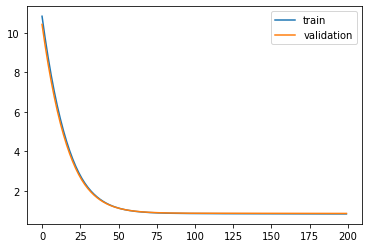

Time to train LSTM:  135.70583486557007
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 7s - loss: 10.8536 - pdc_loss: 0.7431 - event_loss: 0.7380 - val_loss: 10.4366 - val_pdc_loss: 0.7355 - val_event_loss: 0.7134

Epoch 00001: val_loss improved from inf to 10.43660, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 10.2874 - pdc_loss: 0.7286 - event_loss: 0.7044 - val_loss: 9.8900 - val_pdc_loss: 0.7226 - val_event_loss: 0.6829

Epoch 00002: val_loss improved from 10.43660 to 9.89000, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 9.7465 - pdc_loss: 0.7155 - event_loss: 0.6744 - val_loss: 9.3684 - val_pdc_loss: 0.7109 - val_event_loss: 0.6558

Epoch 00003: val_loss improved from 9.89000 to 9.36839, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 9.2305 - pdc_loss: 0.7036 - event_loss: 0.6478 - val_loss: 8.8713 - val_pdc_loss: 0.7004 - val_event_loss: 0.6316

Epoch 00004: val_loss improved from 9.36839 to 8.87130, sa


Epoch 00035: val_loss improved from 1.86184 to 1.78927, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 1.7524 - pdc_loss: 0.5614 - event_loss: 0.3256 - val_loss: 1.7217 - val_pdc_loss: 0.5724 - val_event_loss: 0.3319

Epoch 00036: val_loss improved from 1.78927 to 1.72174, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 1.6861 - pdc_loss: 0.5602 - event_loss: 0.3247 - val_loss: 1.6589 - val_pdc_loss: 0.5713 - val_event_loss: 0.3311

Epoch 00037: val_loss improved from 1.72174 to 1.65891, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 1.6244 - pdc_loss: 0.5591 - event_loss: 0.3239 - val_loss: 1.6005 - val_pdc_loss: 0.5702 - val_event_loss: 0.3303

Epoch 00038: val_loss improved from 1.65891 to 1.60048, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 1.5671 - pdc_loss: 0.5580 - event_loss: 0.3232 - val_loss: 1.5462 - val_pdc_loss: 0.5692 - val_event_loss: 0.3297

Epoch 00039: val_loss improved from 1.60048 to 

 - 1s - loss: 0.9099 - pdc_loss: 0.5364 - event_loss: 0.3170 - val_loss: 0.9273 - val_pdc_loss: 0.5508 - val_event_loss: 0.3231

Epoch 00070: val_loss improved from 0.93200 to 0.92732, saving model to Event_val_weights3.hdf5
Epoch 71/200
 - 1s - loss: 0.9052 - pdc_loss: 0.5358 - event_loss: 0.3170 - val_loss: 0.9230 - val_pdc_loss: 0.5502 - val_event_loss: 0.3230

Epoch 00071: val_loss improved from 0.92732 to 0.92300, saving model to Event_val_weights3.hdf5
Epoch 72/200
 - 1s - loss: 0.9009 - pdc_loss: 0.5352 - event_loss: 0.3169 - val_loss: 0.9190 - val_pdc_loss: 0.5497 - val_event_loss: 0.3230

Epoch 00072: val_loss improved from 0.92300 to 0.91902, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.8969 - pdc_loss: 0.5346 - event_loss: 0.3169 - val_loss: 0.9153 - val_pdc_loss: 0.5492 - val_event_loss: 0.3230

Epoch 00073: val_loss improved from 0.91902 to 0.91533, saving model to Event_val_weights3.hdf5
Epoch 74/200
 - 1s - loss: 0.8933 - pdc_loss: 0.5339 - event_


Epoch 00104: val_loss improved from 0.87401 to 0.87374, saving model to Event_val_weights3.hdf5
Epoch 105/200
 - 1s - loss: 0.8484 - pdc_loss: 0.5197 - event_loss: 0.3159 - val_loss: 0.8732 - val_pdc_loss: 0.5383 - val_event_loss: 0.3223

Epoch 00105: val_loss improved from 0.87374 to 0.87319, saving model to Event_val_weights3.hdf5
Epoch 106/200
 - 1s - loss: 0.8479 - pdc_loss: 0.5194 - event_loss: 0.3158 - val_loss: 0.8730 - val_pdc_loss: 0.5383 - val_event_loss: 0.3222

Epoch 00106: val_loss improved from 0.87319 to 0.87298, saving model to Event_val_weights3.hdf5
Epoch 107/200
 - 1s - loss: 0.8474 - pdc_loss: 0.5192 - event_loss: 0.3158 - val_loss: 0.8726 - val_pdc_loss: 0.5381 - val_event_loss: 0.3222

Epoch 00107: val_loss improved from 0.87298 to 0.87259, saving model to Event_val_weights3.hdf5
Epoch 108/200
 - 1s - loss: 0.8470 - pdc_loss: 0.5190 - event_loss: 0.3157 - val_loss: 0.8721 - val_pdc_loss: 0.5378 - val_event_loss: 0.3222

Epoch 00108: val_loss improved from 0.87259


Epoch 00141: val_loss did not improve from 0.86767
Epoch 142/200
 - 1s - loss: 0.8375 - pdc_loss: 0.5134 - event_loss: 0.3136 - val_loss: 0.8675 - val_pdc_loss: 0.5353 - val_event_loss: 0.3217

Epoch 00142: val_loss improved from 0.86767 to 0.86750, saving model to Event_val_weights3.hdf5
Epoch 143/200
 - 1s - loss: 0.8372 - pdc_loss: 0.5132 - event_loss: 0.3135 - val_loss: 0.8671 - val_pdc_loss: 0.5350 - val_event_loss: 0.3217

Epoch 00143: val_loss improved from 0.86750 to 0.86711, saving model to Event_val_weights3.hdf5
Epoch 144/200
 - 1s - loss: 0.8371 - pdc_loss: 0.5131 - event_loss: 0.3135 - val_loss: 0.8667 - val_pdc_loss: 0.5346 - val_event_loss: 0.3217

Epoch 00144: val_loss improved from 0.86711 to 0.86669, saving model to Event_val_weights3.hdf5
Epoch 145/200
 - 1s - loss: 0.8371 - pdc_loss: 0.5132 - event_loss: 0.3134 - val_loss: 0.8661 - val_pdc_loss: 0.5340 - val_event_loss: 0.3216

Epoch 00145: val_loss improved from 0.86669 to 0.86609, saving model to Event_val_weight


Epoch 00181: val_loss did not improve from 0.86531
Epoch 182/200
 - 1s - loss: 0.8321 - pdc_loss: 0.5097 - event_loss: 0.3124 - val_loss: 0.8658 - val_pdc_loss: 0.5338 - val_event_loss: 0.3220

Epoch 00182: val_loss did not improve from 0.86531
Epoch 183/200
 - 1s - loss: 0.8319 - pdc_loss: 0.5096 - event_loss: 0.3123 - val_loss: 0.8663 - val_pdc_loss: 0.5342 - val_event_loss: 0.3220

Epoch 00183: val_loss did not improve from 0.86531
Epoch 184/200
 - 1s - loss: 0.8319 - pdc_loss: 0.5095 - event_loss: 0.3123 - val_loss: 0.8660 - val_pdc_loss: 0.5339 - val_event_loss: 0.3220

Epoch 00184: val_loss did not improve from 0.86531
Epoch 185/200
 - 1s - loss: 0.8318 - pdc_loss: 0.5095 - event_loss: 0.3123 - val_loss: 0.8663 - val_pdc_loss: 0.5342 - val_event_loss: 0.3221

Epoch 00185: val_loss did not improve from 0.86531
Epoch 186/200
 - 1s - loss: 0.8317 - pdc_loss: 0.5094 - event_loss: 0.3123 - val_loss: 0.8663 - val_pdc_loss: 0.5343 - val_event_loss: 0.3220

Epoch 00186: val_loss did not

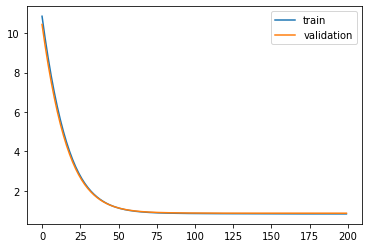

Time to train LSTM:  136.80442333221436
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 6s - loss: 10.7313 - pdc_loss: 0.7170 - event_loss: 0.7502 - val_loss: 10.3206 - val_pdc_loss: 0.7122 - val_event_loss: 0.7301

Epoch 00001: val_loss improved from inf to 10.32063, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 10.1756 - pdc_loss: 0.7089 - event_loss: 0.7218 - val_loss: 9.7829 - val_pdc_loss: 0.7051 - val_event_loss: 0.7032

Epoch 00002: val_loss improved from 10.32063 to 9.78291, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 9.6429 - pdc_loss: 0.7012 - event_loss: 0.6951 - val_loss: 9.2685 - val_pdc_loss: 0.6984 - val_event_loss: 0.6780

Epoch 00003: val_loss improved from 9.78291 to 9.26852, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 9.1337 - pdc_loss: 0.6938 - event_loss: 0.6701 - val_loss: 8.7775 - val_pdc_loss: 0.6922 - val_event_loss: 0.6545

Epoch 00004: val_loss improved from 9.26852 to 8.77754, sa


Epoch 00035: val_loss improved from 1.84843 to 1.77726, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 1.7391 - pdc_loss: 0.5720 - event_loss: 0.3250 - val_loss: 1.7111 - val_pdc_loss: 0.5801 - val_event_loss: 0.3355

Epoch 00036: val_loss improved from 1.77726 to 1.71107, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 1.6742 - pdc_loss: 0.5704 - event_loss: 0.3241 - val_loss: 1.6496 - val_pdc_loss: 0.5786 - val_event_loss: 0.3346

Epoch 00037: val_loss improved from 1.71107 to 1.64960, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 1.6139 - pdc_loss: 0.5688 - event_loss: 0.3234 - val_loss: 1.5925 - val_pdc_loss: 0.5772 - val_event_loss: 0.3340

Epoch 00038: val_loss improved from 1.64960 to 1.59249, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 1.5578 - pdc_loss: 0.5673 - event_loss: 0.3229 - val_loss: 1.5394 - val_pdc_loss: 0.5759 - val_event_loss: 0.3334

Epoch 00039: val_loss improved from 1.59249 to 

 - 1s - loss: 0.9133 - pdc_loss: 0.5414 - event_loss: 0.3164 - val_loss: 0.9345 - val_pdc_loss: 0.5545 - val_event_loss: 0.3274

Epoch 00070: val_loss improved from 0.93899 to 0.93447, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.9088 - pdc_loss: 0.5409 - event_loss: 0.3163 - val_loss: 0.9303 - val_pdc_loss: 0.5541 - val_event_loss: 0.3274

Epoch 00071: val_loss improved from 0.93447 to 0.93033, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.9045 - pdc_loss: 0.5403 - event_loss: 0.3163 - val_loss: 0.9265 - val_pdc_loss: 0.5537 - val_event_loss: 0.3273

Epoch 00072: val_loss improved from 0.93033 to 0.92652, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.9007 - pdc_loss: 0.5398 - event_loss: 0.3162 - val_loss: 0.9230 - val_pdc_loss: 0.5534 - val_event_loss: 0.3272

Epoch 00073: val_loss improved from 0.92652 to 0.92303, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.8971 - pdc_loss: 0.5392 - event_


Epoch 00104: val_loss improved from 0.88383 to 0.88345, saving model to Event_val_weights4.hdf5
Epoch 105/200
 - 1s - loss: 0.8538 - pdc_loss: 0.5258 - event_loss: 0.3148 - val_loss: 0.8831 - val_pdc_loss: 0.5441 - val_event_loss: 0.3259

Epoch 00105: val_loss improved from 0.88345 to 0.88307, saving model to Event_val_weights4.hdf5
Epoch 106/200
 - 1s - loss: 0.8533 - pdc_loss: 0.5255 - event_loss: 0.3147 - val_loss: 0.8827 - val_pdc_loss: 0.5439 - val_event_loss: 0.3259

Epoch 00106: val_loss improved from 0.88307 to 0.88274, saving model to Event_val_weights4.hdf5
Epoch 107/200
 - 1s - loss: 0.8528 - pdc_loss: 0.5253 - event_loss: 0.3147 - val_loss: 0.8824 - val_pdc_loss: 0.5437 - val_event_loss: 0.3259

Epoch 00107: val_loss improved from 0.88274 to 0.88240, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.8523 - pdc_loss: 0.5250 - event_loss: 0.3146 - val_loss: 0.8821 - val_pdc_loss: 0.5436 - val_event_loss: 0.3259

Epoch 00108: val_loss improved from 0.88240

 - 1s - loss: 0.8418 - pdc_loss: 0.5178 - event_loss: 0.3134 - val_loss: 0.8754 - val_pdc_loss: 0.5395 - val_event_loss: 0.3254

Epoch 00139: val_loss improved from 0.87563 to 0.87544, saving model to Event_val_weights4.hdf5
Epoch 140/200
 - 1s - loss: 0.8415 - pdc_loss: 0.5176 - event_loss: 0.3133 - val_loss: 0.8752 - val_pdc_loss: 0.5393 - val_event_loss: 0.3253

Epoch 00140: val_loss improved from 0.87544 to 0.87516, saving model to Event_val_weights4.hdf5
Epoch 141/200
 - 1s - loss: 0.8412 - pdc_loss: 0.5174 - event_loss: 0.3133 - val_loss: 0.8750 - val_pdc_loss: 0.5392 - val_event_loss: 0.3253

Epoch 00141: val_loss improved from 0.87516 to 0.87498, saving model to Event_val_weights4.hdf5
Epoch 142/200
 - 1s - loss: 0.8410 - pdc_loss: 0.5172 - event_loss: 0.3133 - val_loss: 0.8747 - val_pdc_loss: 0.5389 - val_event_loss: 0.3253

Epoch 00142: val_loss improved from 0.87498 to 0.87471, saving model to Event_val_weights4.hdf5
Epoch 143/200
 - 1s - loss: 0.8407 - pdc_loss: 0.5170 - ev


Epoch 00174: val_loss did not improve from 0.87034
Epoch 175/200
 - 1s - loss: 0.8347 - pdc_loss: 0.5123 - event_loss: 0.3121 - val_loss: 0.8712 - val_pdc_loss: 0.5359 - val_event_loss: 0.3249

Epoch 00175: val_loss did not improve from 0.87034
Epoch 176/200
 - 1s - loss: 0.8340 - pdc_loss: 0.5115 - event_loss: 0.3122 - val_loss: 0.8707 - val_pdc_loss: 0.5354 - val_event_loss: 0.3250

Epoch 00176: val_loss did not improve from 0.87034
Epoch 177/200
 - 1s - loss: 0.8332 - pdc_loss: 0.5109 - event_loss: 0.3120 - val_loss: 0.8712 - val_pdc_loss: 0.5358 - val_event_loss: 0.3250

Epoch 00177: val_loss did not improve from 0.87034
Epoch 178/200
 - 1s - loss: 0.8329 - pdc_loss: 0.5108 - event_loss: 0.3117 - val_loss: 0.8716 - val_pdc_loss: 0.5363 - val_event_loss: 0.3250

Epoch 00178: val_loss did not improve from 0.87034
Epoch 179/200
 - 1s - loss: 0.8331 - pdc_loss: 0.5110 - event_loss: 0.3118 - val_loss: 0.8703 - val_pdc_loss: 0.5352 - val_event_loss: 0.3248

Epoch 00179: val_loss improve

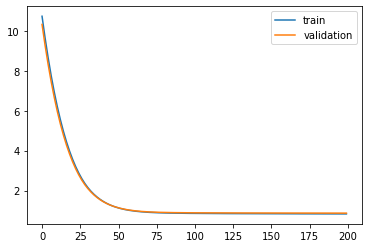

Time to train LSTM:  137.4150960445404


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f007c0de630>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 7s - loss: 10.9093 - pdc_loss: 0.7472 - event_loss: 0.7020 - val_loss: 10.4910 - val_pdc_loss: 0.7434 - val_event_loss: 0.6793

Epoch 00001: val_loss improved from inf to 10.49105, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 10.3463 - pdc_loss: 0.7379 - event_loss: 0.6757 - val_loss: 9.9452 - val_pdc_loss: 0.7344 - val_event_loss: 0.6543

Epoch 00002: val_loss improved from 10.49105 to 9.94520, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 9.8067 - pdc_loss: 0.7291 - event_loss: 0.6512 - val_loss: 9.4228 - val_pdc_loss: 0.7258 - val_event_loss: 0.6312

Epoch 00003: val_loss improved from 9.94520 to 9.42278, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 9.2905 - pdc_loss: 0.7207 - event_loss: 0.6285 - val_loss: 8.9238 - val_pdc_loss: 0.7178 - val_event_loss: 0.6096

Epoch 00004: val_loss improved from 9.42278 to 8.92383, saving model to Event_val_weights5.hdf5
Ep


Epoch 00035: val_loss improved from 1.85844 to 1.78526, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 1.7619 - pdc_loss: 0.5738 - event_loss: 0.3271 - val_loss: 1.7172 - val_pdc_loss: 0.5759 - val_event_loss: 0.3283

Epoch 00036: val_loss improved from 1.78526 to 1.71717, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 1.6950 - pdc_loss: 0.5719 - event_loss: 0.3263 - val_loss: 1.6538 - val_pdc_loss: 0.5739 - val_event_loss: 0.3277

Epoch 00037: val_loss improved from 1.71717 to 1.65378, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 1.6329 - pdc_loss: 0.5702 - event_loss: 0.3257 - val_loss: 1.5948 - val_pdc_loss: 0.5722 - val_event_loss: 0.3270

Epoch 00038: val_loss improved from 1.65378 to 1.59481, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 1.5752 - pdc_loss: 0.5686 - event_loss: 0.3251 - val_loss: 1.5400 - val_pdc_loss: 0.5706 - val_event_loss: 0.3264

Epoch 00039: val_loss improved from 1.59481 to 

 - 1s - loss: 0.9182 - pdc_loss: 0.5446 - event_loss: 0.3179 - val_loss: 0.9173 - val_pdc_loss: 0.5460 - val_event_loss: 0.3186

Epoch 00070: val_loss improved from 0.92192 to 0.91725, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.9136 - pdc_loss: 0.5440 - event_loss: 0.3179 - val_loss: 0.9129 - val_pdc_loss: 0.5454 - val_event_loss: 0.3185

Epoch 00071: val_loss improved from 0.91725 to 0.91294, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.9093 - pdc_loss: 0.5434 - event_loss: 0.3178 - val_loss: 0.9090 - val_pdc_loss: 0.5449 - val_event_loss: 0.3184

Epoch 00072: val_loss improved from 0.91294 to 0.90896, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.9054 - pdc_loss: 0.5429 - event_loss: 0.3177 - val_loss: 0.9053 - val_pdc_loss: 0.5444 - val_event_loss: 0.3184

Epoch 00073: val_loss improved from 0.90896 to 0.90529, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.9017 - pdc_loss: 0.5423 - event_


Epoch 00104: val_loss improved from 0.86002 to 0.85953, saving model to Event_val_weights5.hdf5
Epoch 105/200
 - 1s - loss: 0.8546 - pdc_loss: 0.5245 - event_loss: 0.3161 - val_loss: 0.8590 - val_pdc_loss: 0.5278 - val_event_loss: 0.3173

Epoch 00105: val_loss improved from 0.85953 to 0.85903, saving model to Event_val_weights5.hdf5
Epoch 106/200
 - 1s - loss: 0.8541 - pdc_loss: 0.5241 - event_loss: 0.3161 - val_loss: 0.8587 - val_pdc_loss: 0.5277 - val_event_loss: 0.3173

Epoch 00106: val_loss improved from 0.85903 to 0.85869, saving model to Event_val_weights5.hdf5
Epoch 107/200
 - 1s - loss: 0.8536 - pdc_loss: 0.5238 - event_loss: 0.3160 - val_loss: 0.8584 - val_pdc_loss: 0.5276 - val_event_loss: 0.3172

Epoch 00107: val_loss improved from 0.85869 to 0.85840, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.8531 - pdc_loss: 0.5235 - event_loss: 0.3160 - val_loss: 0.8580 - val_pdc_loss: 0.5273 - val_event_loss: 0.3172

Epoch 00108: val_loss improved from 0.85840


Epoch 00139: val_loss improved from 0.85168 to 0.85150, saving model to Event_val_weights5.hdf5
Epoch 140/200
 - 1s - loss: 0.8434 - pdc_loss: 0.5177 - event_loss: 0.3146 - val_loss: 0.8513 - val_pdc_loss: 0.5237 - val_event_loss: 0.3165

Epoch 00140: val_loss improved from 0.85150 to 0.85129, saving model to Event_val_weights5.hdf5
Epoch 141/200
 - 1s - loss: 0.8432 - pdc_loss: 0.5176 - event_loss: 0.3145 - val_loss: 0.8514 - val_pdc_loss: 0.5238 - val_event_loss: 0.3165

Epoch 00141: val_loss did not improve from 0.85129
Epoch 142/200
 - 1s - loss: 0.8430 - pdc_loss: 0.5174 - event_loss: 0.3145 - val_loss: 0.8511 - val_pdc_loss: 0.5235 - val_event_loss: 0.3165

Epoch 00142: val_loss improved from 0.85129 to 0.85105, saving model to Event_val_weights5.hdf5
Epoch 143/200
 - 1s - loss: 0.8428 - pdc_loss: 0.5174 - event_loss: 0.3145 - val_loss: 0.8510 - val_pdc_loss: 0.5235 - val_event_loss: 0.3165

Epoch 00143: val_loss improved from 0.85105 to 0.85096, saving model to Event_val_weight

 - 1s - loss: 0.8379 - pdc_loss: 0.5142 - event_loss: 0.3134 - val_loss: 0.8482 - val_pdc_loss: 0.5217 - val_event_loss: 0.3162

Epoch 00175: val_loss did not improve from 0.84801
Epoch 176/200
 - 1s - loss: 0.8379 - pdc_loss: 0.5143 - event_loss: 0.3133 - val_loss: 0.8483 - val_pdc_loss: 0.5217 - val_event_loss: 0.3162

Epoch 00176: val_loss did not improve from 0.84801
Epoch 177/200
 - 1s - loss: 0.8377 - pdc_loss: 0.5141 - event_loss: 0.3133 - val_loss: 0.8480 - val_pdc_loss: 0.5214 - val_event_loss: 0.3162

Epoch 00177: val_loss did not improve from 0.84801
Epoch 178/200
 - 1s - loss: 0.8377 - pdc_loss: 0.5140 - event_loss: 0.3133 - val_loss: 0.8480 - val_pdc_loss: 0.5214 - val_event_loss: 0.3163

Epoch 00178: val_loss improved from 0.84801 to 0.84797, saving model to Event_val_weights5.hdf5
Epoch 179/200
 - 1s - loss: 0.8374 - pdc_loss: 0.5139 - event_loss: 0.3132 - val_loss: 0.8477 - val_pdc_loss: 0.5211 - val_event_loss: 0.3162

Epoch 00179: val_loss improved from 0.84797 to 0.8

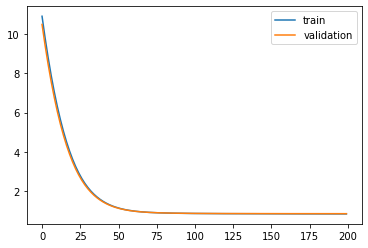

Time to train LSTM:  142.1451427936554
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 7s - loss: 16.2054 - pdc_loss: 0.7390 - event_loss: 0.6985 - val_loss: 15.4742 - val_pdc_loss: 0.7274 - val_event_loss: 0.6637

Epoch 00001: val_loss improved from inf to 15.47417, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 15.2239 - pdc_loss: 0.7232 - event_loss: 0.6541 - val_loss: 14.5301 - val_pdc_loss: 0.7147 - val_event_loss: 0.6246

Epoch 00002: val_loss improved from 15.47417 to 14.53009, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 14.2942 - pdc_loss: 0.7115 - event_loss: 0.6179 - val_loss: 13.6362 - val_pdc_loss: 0.7050 - val_event_loss: 0.5925

Epoch 00003: val_loss improved from 14.53009 to 13.63621, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 13.4138 - pdc_loss: 0.7025 - event_loss: 0.5880 - val_loss: 12.7901 - val_pdc_loss: 0.6972 - val_event_loss: 0.5657

Epoch 00004: val_loss improved from 13.63621 to 12.

 - 1s - loss: 1.9065 - pdc_loss: 0.5579 - event_loss: 0.3210 - val_loss: 1.8354 - val_pdc_loss: 0.5584 - val_event_loss: 0.3155

Epoch 00035: val_loss improved from 1.92691 to 1.83541, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 1.8167 - pdc_loss: 0.5567 - event_loss: 0.3207 - val_loss: 1.7512 - val_pdc_loss: 0.5573 - val_event_loss: 0.3152

Epoch 00036: val_loss improved from 1.83541 to 1.75116, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 1.7341 - pdc_loss: 0.5555 - event_loss: 0.3204 - val_loss: 1.6736 - val_pdc_loss: 0.5563 - val_event_loss: 0.3149

Epoch 00037: val_loss improved from 1.75116 to 1.67364, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 1.6581 - pdc_loss: 0.5544 - event_loss: 0.3201 - val_loss: 1.6024 - val_pdc_loss: 0.5554 - val_event_loss: 0.3147

Epoch 00038: val_loss improved from 1.67364 to 1.60237, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 1.5882 - pdc_loss: 0.5534 - event_


Epoch 00069: val_loss improved from 0.88710 to 0.88290, saving model to Event_val_weights1.hdf5
Epoch 70/200
 - 1s - loss: 0.8840 - pdc_loss: 0.5273 - event_loss: 0.3175 - val_loss: 0.8791 - val_pdc_loss: 0.5297 - val_event_loss: 0.3124

Epoch 00070: val_loss improved from 0.88290 to 0.87908, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 0.8803 - pdc_loss: 0.5267 - event_loss: 0.3174 - val_loss: 0.8756 - val_pdc_loss: 0.5291 - val_event_loss: 0.3124

Epoch 00071: val_loss improved from 0.87908 to 0.87562, saving model to Event_val_weights1.hdf5
Epoch 72/200
 - 1s - loss: 0.8770 - pdc_loss: 0.5262 - event_loss: 0.3174 - val_loss: 0.8725 - val_pdc_loss: 0.5286 - val_event_loss: 0.3123

Epoch 00072: val_loss improved from 0.87562 to 0.87249, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.8739 - pdc_loss: 0.5257 - event_loss: 0.3173 - val_loss: 0.8696 - val_pdc_loss: 0.5282 - val_event_loss: 0.3123

Epoch 00073: val_loss improved from 0.87249 to 


Epoch 00104: val_loss improved from 0.84335 to 0.84316, saving model to Event_val_weights1.hdf5
Epoch 105/200
 - 1s - loss: 0.8427 - pdc_loss: 0.5165 - event_loss: 0.3154 - val_loss: 0.8428 - val_pdc_loss: 0.5207 - val_event_loss: 0.3115

Epoch 00105: val_loss improved from 0.84316 to 0.84284, saving model to Event_val_weights1.hdf5
Epoch 106/200
 - 1s - loss: 0.8424 - pdc_loss: 0.5163 - event_loss: 0.3154 - val_loss: 0.8427 - val_pdc_loss: 0.5207 - val_event_loss: 0.3114

Epoch 00106: val_loss improved from 0.84284 to 0.84275, saving model to Event_val_weights1.hdf5
Epoch 107/200
 - 1s - loss: 0.8423 - pdc_loss: 0.5163 - event_loss: 0.3153 - val_loss: 0.8427 - val_pdc_loss: 0.5207 - val_event_loss: 0.3113

Epoch 00107: val_loss improved from 0.84275 to 0.84267, saving model to Event_val_weights1.hdf5
Epoch 108/200
 - 1s - loss: 0.8421 - pdc_loss: 0.5161 - event_loss: 0.3153 - val_loss: 0.8427 - val_pdc_loss: 0.5207 - val_event_loss: 0.3113

Epoch 00108: val_loss did not improve from 

 - 1s - loss: 0.8358 - pdc_loss: 0.5111 - event_loss: 0.3137 - val_loss: 0.8427 - val_pdc_loss: 0.5201 - val_event_loss: 0.3116

Epoch 00144: val_loss did not improve from 0.84070
Epoch 145/200
 - 1s - loss: 0.8355 - pdc_loss: 0.5109 - event_loss: 0.3136 - val_loss: 0.8417 - val_pdc_loss: 0.5191 - val_event_loss: 0.3117

Epoch 00145: val_loss did not improve from 0.84070
Epoch 146/200
 - 1s - loss: 0.8350 - pdc_loss: 0.5104 - event_loss: 0.3136 - val_loss: 0.8410 - val_pdc_loss: 0.5182 - val_event_loss: 0.3117

Epoch 00146: val_loss did not improve from 0.84070
Epoch 147/200
 - 1s - loss: 0.8343 - pdc_loss: 0.5098 - event_loss: 0.3135 - val_loss: 0.8413 - val_pdc_loss: 0.5183 - val_event_loss: 0.3120

Epoch 00147: val_loss did not improve from 0.84070
Epoch 148/200
 - 1s - loss: 0.8343 - pdc_loss: 0.5098 - event_loss: 0.3135 - val_loss: 0.8413 - val_pdc_loss: 0.5183 - val_event_loss: 0.3119

Epoch 00148: val_loss did not improve from 0.84070
Epoch 149/200
 - 1s - loss: 0.8343 - pdc_los


Epoch 00186: val_loss did not improve from 0.84070
Epoch 187/200
 - 1s - loss: 0.8328 - pdc_loss: 0.5090 - event_loss: 0.3122 - val_loss: 0.8444 - val_pdc_loss: 0.5207 - val_event_loss: 0.3121

Epoch 00187: val_loss did not improve from 0.84070
Epoch 188/200
 - 1s - loss: 0.8318 - pdc_loss: 0.5081 - event_loss: 0.3121 - val_loss: 0.8434 - val_pdc_loss: 0.5191 - val_event_loss: 0.3126

Epoch 00188: val_loss did not improve from 0.84070
Epoch 189/200
 - 1s - loss: 0.8311 - pdc_loss: 0.5075 - event_loss: 0.3118 - val_loss: 0.8438 - val_pdc_loss: 0.5194 - val_event_loss: 0.3128

Epoch 00189: val_loss did not improve from 0.84070
Epoch 190/200
 - 1s - loss: 0.8303 - pdc_loss: 0.5069 - event_loss: 0.3117 - val_loss: 0.8419 - val_pdc_loss: 0.5179 - val_event_loss: 0.3123

Epoch 00190: val_loss did not improve from 0.84070
Epoch 191/200
 - 1s - loss: 0.8300 - pdc_loss: 0.5066 - event_loss: 0.3117 - val_loss: 0.8438 - val_pdc_loss: 0.5197 - val_event_loss: 0.3124

Epoch 00191: val_loss did not

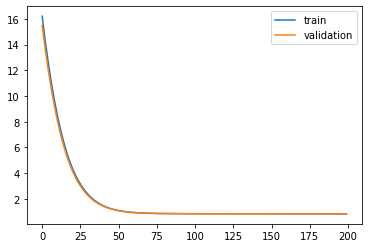

Time to train LSTM:  138.82566142082214
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 7s - loss: 16.3483 - pdc_loss: 0.7099 - event_loss: 0.7442 - val_loss: 15.6155 - val_pdc_loss: 0.7000 - val_event_loss: 0.7112

Epoch 00001: val_loss improved from inf to 15.61547, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 15.3623 - pdc_loss: 0.6976 - event_loss: 0.6984 - val_loss: 14.6658 - val_pdc_loss: 0.6889 - val_event_loss: 0.6702

Epoch 00002: val_loss improved from 15.61547 to 14.66585, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 14.4244 - pdc_loss: 0.6863 - event_loss: 0.6585 - val_loss: 13.7638 - val_pdc_loss: 0.6788 - val_event_loss: 0.6345

Epoch 00003: val_loss improved from 14.66585 to 13.76381, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 13.5339 - pdc_loss: 0.6759 - event_loss: 0.6237 - val_loss: 12.9084 - val_pdc_loss: 0.6695 - val_event_loss: 0.6030

Epoch 00004: val_loss improved from 13.76381 to 12

 - 1s - loss: 1.9141 - pdc_loss: 0.5569 - event_loss: 0.3203 - val_loss: 1.8602 - val_pdc_loss: 0.5634 - val_event_loss: 0.3267

Epoch 00035: val_loss improved from 1.95285 to 1.86022, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 1.8236 - pdc_loss: 0.5560 - event_loss: 0.3199 - val_loss: 1.7749 - val_pdc_loss: 0.5624 - val_event_loss: 0.3263

Epoch 00036: val_loss improved from 1.86022 to 1.77495, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 1.7402 - pdc_loss: 0.5551 - event_loss: 0.3195 - val_loss: 1.6965 - val_pdc_loss: 0.5615 - val_event_loss: 0.3259

Epoch 00037: val_loss improved from 1.77495 to 1.69649, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 1.6635 - pdc_loss: 0.5543 - event_loss: 0.3192 - val_loss: 1.6244 - val_pdc_loss: 0.5606 - val_event_loss: 0.3256

Epoch 00038: val_loss improved from 1.69649 to 1.62436, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 1.5930 - pdc_loss: 0.5534 - event_


Epoch 00069: val_loss improved from 0.90239 to 0.89833, saving model to Event_val_weights2.hdf5
Epoch 70/200
 - 1s - loss: 0.8838 - pdc_loss: 0.5286 - event_loss: 0.3157 - val_loss: 0.8947 - val_pdc_loss: 0.5352 - val_event_loss: 0.3221

Epoch 00070: val_loss improved from 0.89833 to 0.89466, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.8801 - pdc_loss: 0.5278 - event_loss: 0.3156 - val_loss: 0.8914 - val_pdc_loss: 0.5347 - val_event_loss: 0.3221

Epoch 00071: val_loss improved from 0.89466 to 0.89135, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.8766 - pdc_loss: 0.5271 - event_loss: 0.3156 - val_loss: 0.8884 - val_pdc_loss: 0.5342 - val_event_loss: 0.3221

Epoch 00072: val_loss improved from 0.89135 to 0.88837, saving model to Event_val_weights2.hdf5
Epoch 73/200
 - 1s - loss: 0.8735 - pdc_loss: 0.5265 - event_loss: 0.3155 - val_loss: 0.8857 - val_pdc_loss: 0.5337 - val_event_loss: 0.3221

Epoch 00073: val_loss improved from 0.88837 to 


Epoch 00105: val_loss did not improve from 0.86102
Epoch 106/200
 - 1s - loss: 0.8429 - pdc_loss: 0.5171 - event_loss: 0.3146 - val_loss: 0.8606 - val_pdc_loss: 0.5281 - val_event_loss: 0.3213

Epoch 00106: val_loss improved from 0.86102 to 0.86056, saving model to Event_val_weights2.hdf5
Epoch 107/200
 - 1s - loss: 0.8425 - pdc_loss: 0.5168 - event_loss: 0.3145 - val_loss: 0.8611 - val_pdc_loss: 0.5286 - val_event_loss: 0.3213

Epoch 00107: val_loss did not improve from 0.86056
Epoch 108/200
 - 1s - loss: 0.8423 - pdc_loss: 0.5167 - event_loss: 0.3145 - val_loss: 0.8605 - val_pdc_loss: 0.5283 - val_event_loss: 0.3211

Epoch 00108: val_loss improved from 0.86056 to 0.86050, saving model to Event_val_weights2.hdf5
Epoch 109/200
 - 1s - loss: 0.8420 - pdc_loss: 0.5165 - event_loss: 0.3145 - val_loss: 0.8608 - val_pdc_loss: 0.5284 - val_event_loss: 0.3214

Epoch 00109: val_loss did not improve from 0.86050
Epoch 110/200
 - 1s - loss: 0.8419 - pdc_loss: 0.5164 - event_loss: 0.3145 - val_l


Epoch 00145: val_loss did not improve from 0.85761
Epoch 146/200
 - 1s - loss: 0.8360 - pdc_loss: 0.5116 - event_loss: 0.3136 - val_loss: 0.8582 - val_pdc_loss: 0.5267 - val_event_loss: 0.3208

Epoch 00146: val_loss did not improve from 0.85761
Epoch 147/200
 - 1s - loss: 0.8361 - pdc_loss: 0.5118 - event_loss: 0.3136 - val_loss: 0.8580 - val_pdc_loss: 0.5266 - val_event_loss: 0.3207

Epoch 00147: val_loss did not improve from 0.85761
Epoch 148/200
 - 1s - loss: 0.8362 - pdc_loss: 0.5119 - event_loss: 0.3136 - val_loss: 0.8582 - val_pdc_loss: 0.5268 - val_event_loss: 0.3207

Epoch 00148: val_loss did not improve from 0.85761
Epoch 149/200
 - 1s - loss: 0.8363 - pdc_loss: 0.5120 - event_loss: 0.3136 - val_loss: 0.8578 - val_pdc_loss: 0.5265 - val_event_loss: 0.3206

Epoch 00149: val_loss did not improve from 0.85761
Epoch 150/200
 - 1s - loss: 0.8362 - pdc_loss: 0.5120 - event_loss: 0.3136 - val_loss: 0.8581 - val_pdc_loss: 0.5267 - val_event_loss: 0.3207

Epoch 00150: val_loss did not


Epoch 00187: val_loss did not improve from 0.85757
Epoch 188/200
 - 1s - loss: 0.8311 - pdc_loss: 0.5077 - event_loss: 0.3126 - val_loss: 0.8584 - val_pdc_loss: 0.5272 - val_event_loss: 0.3205

Epoch 00188: val_loss did not improve from 0.85757
Epoch 189/200
 - 1s - loss: 0.8310 - pdc_loss: 0.5076 - event_loss: 0.3126 - val_loss: 0.8592 - val_pdc_loss: 0.5276 - val_event_loss: 0.3209

Epoch 00189: val_loss did not improve from 0.85757
Epoch 190/200
 - 1s - loss: 0.8309 - pdc_loss: 0.5076 - event_loss: 0.3125 - val_loss: 0.8591 - val_pdc_loss: 0.5275 - val_event_loss: 0.3208

Epoch 00190: val_loss did not improve from 0.85757
Epoch 191/200
 - 1s - loss: 0.8309 - pdc_loss: 0.5076 - event_loss: 0.3125 - val_loss: 0.8587 - val_pdc_loss: 0.5274 - val_event_loss: 0.3204

Epoch 00191: val_loss did not improve from 0.85757
Epoch 192/200
 - 1s - loss: 0.8309 - pdc_loss: 0.5076 - event_loss: 0.3125 - val_loss: 0.8594 - val_pdc_loss: 0.5276 - val_event_loss: 0.3209

Epoch 00192: val_loss did not

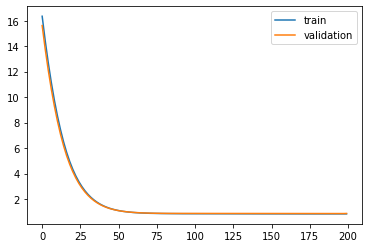

Time to train LSTM:  139.36562395095825
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 8s - loss: 16.0535 - pdc_loss: 0.6794 - event_loss: 0.6994 - val_loss: 15.3324 - val_pdc_loss: 0.6785 - val_event_loss: 0.6643

Epoch 00001: val_loss improved from inf to 15.33243, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 15.0755 - pdc_loss: 0.6686 - event_loss: 0.6538 - val_loss: 14.3923 - val_pdc_loss: 0.6693 - val_event_loss: 0.6252

Epoch 00002: val_loss improved from 15.33243 to 14.39233, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 14.1475 - pdc_loss: 0.6596 - event_loss: 0.6157 - val_loss: 13.5012 - val_pdc_loss: 0.6615 - val_event_loss: 0.5924

Epoch 00003: val_loss improved from 14.39233 to 13.50122, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 13.2681 - pdc_loss: 0.6518 - event_loss: 0.5838 - val_loss: 12.6575 - val_pdc_loss: 0.6547 - val_event_loss: 0.5645

Epoch 00004: val_loss improved from 13.50122 to 12

 - 1s - loss: 1.8790 - pdc_loss: 0.5513 - event_loss: 0.3197 - val_loss: 1.8324 - val_pdc_loss: 0.5646 - val_event_loss: 0.3248

Epoch 00035: val_loss improved from 1.92253 to 1.83237, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 1.7906 - pdc_loss: 0.5503 - event_loss: 0.3193 - val_loss: 1.7494 - val_pdc_loss: 0.5636 - val_event_loss: 0.3245

Epoch 00036: val_loss improved from 1.83237 to 1.74940, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 1.7093 - pdc_loss: 0.5492 - event_loss: 0.3189 - val_loss: 1.6731 - val_pdc_loss: 0.5627 - val_event_loss: 0.3242

Epoch 00037: val_loss improved from 1.74940 to 1.67310, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 1.6346 - pdc_loss: 0.5482 - event_loss: 0.3186 - val_loss: 1.6030 - val_pdc_loss: 0.5617 - val_event_loss: 0.3239

Epoch 00038: val_loss improved from 1.67310 to 1.60296, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 1.5659 - pdc_loss: 0.5472 - event_


Epoch 00069: val_loss improved from 0.90392 to 0.90024, saving model to Event_val_weights3.hdf5
Epoch 70/200
 - 1s - loss: 0.8736 - pdc_loss: 0.5206 - event_loss: 0.3154 - val_loss: 0.8969 - val_pdc_loss: 0.5395 - val_event_loss: 0.3219

Epoch 00070: val_loss improved from 0.90024 to 0.89689, saving model to Event_val_weights3.hdf5
Epoch 71/200
 - 1s - loss: 0.8703 - pdc_loss: 0.5203 - event_loss: 0.3153 - val_loss: 0.8942 - val_pdc_loss: 0.5396 - val_event_loss: 0.3219

Epoch 00071: val_loss improved from 0.89689 to 0.89416, saving model to Event_val_weights3.hdf5
Epoch 72/200
 - 1s - loss: 0.8673 - pdc_loss: 0.5200 - event_loss: 0.3152 - val_loss: 0.8913 - val_pdc_loss: 0.5392 - val_event_loss: 0.3219

Epoch 00072: val_loss improved from 0.89416 to 0.89126, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.8646 - pdc_loss: 0.5198 - event_loss: 0.3152 - val_loss: 0.8890 - val_pdc_loss: 0.5392 - val_event_loss: 0.3219

Epoch 00073: val_loss improved from 0.89126 to 

 - 1s - loss: 0.8367 - pdc_loss: 0.5127 - event_loss: 0.3133 - val_loss: 0.8671 - val_pdc_loss: 0.5344 - val_event_loss: 0.3220

Epoch 00105: val_loss improved from 0.86726 to 0.86706, saving model to Event_val_weights3.hdf5
Epoch 106/200
 - 1s - loss: 0.8367 - pdc_loss: 0.5127 - event_loss: 0.3133 - val_loss: 0.8679 - val_pdc_loss: 0.5352 - val_event_loss: 0.3220

Epoch 00106: val_loss did not improve from 0.86706
Epoch 107/200
 - 1s - loss: 0.8362 - pdc_loss: 0.5123 - event_loss: 0.3132 - val_loss: 0.8672 - val_pdc_loss: 0.5346 - val_event_loss: 0.3220

Epoch 00107: val_loss did not improve from 0.86706
Epoch 108/200
 - 1s - loss: 0.8359 - pdc_loss: 0.5121 - event_loss: 0.3132 - val_loss: 0.8669 - val_pdc_loss: 0.5344 - val_event_loss: 0.3219

Epoch 00108: val_loss improved from 0.86706 to 0.86686, saving model to Event_val_weights3.hdf5
Epoch 109/200
 - 1s - loss: 0.8357 - pdc_loss: 0.5120 - event_loss: 0.3131 - val_loss: 0.8672 - val_pdc_loss: 0.5346 - val_event_loss: 0.3220

Epoch


Epoch 00145: val_loss did not improve from 0.86604
Epoch 146/200
 - 1s - loss: 0.8312 - pdc_loss: 0.5091 - event_loss: 0.3115 - val_loss: 0.8673 - val_pdc_loss: 0.5350 - val_event_loss: 0.3217

Epoch 00146: val_loss did not improve from 0.86604
Epoch 147/200
 - 1s - loss: 0.8318 - pdc_loss: 0.5098 - event_loss: 0.3114 - val_loss: 0.8691 - val_pdc_loss: 0.5368 - val_event_loss: 0.3217

Epoch 00147: val_loss did not improve from 0.86604
Epoch 148/200
 - 1s - loss: 0.8332 - pdc_loss: 0.5112 - event_loss: 0.3114 - val_loss: 0.8735 - val_pdc_loss: 0.5411 - val_event_loss: 0.3217

Epoch 00148: val_loss did not improve from 0.86604
Epoch 149/200
 - 1s - loss: 0.8355 - pdc_loss: 0.5132 - event_loss: 0.3115 - val_loss: 0.8721 - val_pdc_loss: 0.5397 - val_event_loss: 0.3217

Epoch 00149: val_loss did not improve from 0.86604
Epoch 150/200
 - 1s - loss: 0.8355 - pdc_loss: 0.5129 - event_loss: 0.3117 - val_loss: 0.8662 - val_pdc_loss: 0.5335 - val_event_loss: 0.3218

Epoch 00150: val_loss did not


Epoch 00187: val_loss did not improve from 0.86558
Epoch 188/200
 - 1s - loss: 0.8261 - pdc_loss: 0.5049 - event_loss: 0.3101 - val_loss: 0.8672 - val_pdc_loss: 0.5340 - val_event_loss: 0.3221

Epoch 00188: val_loss did not improve from 0.86558
Epoch 189/200
 - 1s - loss: 0.8260 - pdc_loss: 0.5049 - event_loss: 0.3100 - val_loss: 0.8674 - val_pdc_loss: 0.5340 - val_event_loss: 0.3222

Epoch 00189: val_loss did not improve from 0.86558
Epoch 190/200
 - 1s - loss: 0.8260 - pdc_loss: 0.5048 - event_loss: 0.3100 - val_loss: 0.8675 - val_pdc_loss: 0.5342 - val_event_loss: 0.3222

Epoch 00190: val_loss did not improve from 0.86558
Epoch 191/200
 - 1s - loss: 0.8261 - pdc_loss: 0.5050 - event_loss: 0.3099 - val_loss: 0.8673 - val_pdc_loss: 0.5338 - val_event_loss: 0.3223

Epoch 00191: val_loss did not improve from 0.86558
Epoch 192/200
 - 1s - loss: 0.8260 - pdc_loss: 0.5048 - event_loss: 0.3100 - val_loss: 0.8682 - val_pdc_loss: 0.5343 - val_event_loss: 0.3226

Epoch 00192: val_loss did not

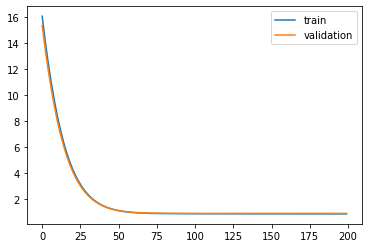

Time to train LSTM:  139.2733838558197
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 9s - loss: 16.2465 - pdc_loss: 0.7257 - event_loss: 0.6643 - val_loss: 15.5160 - val_pdc_loss: 0.7134 - val_event_loss: 0.6400

Epoch 00001: val_loss improved from inf to 15.51595, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 15.2641 - pdc_loss: 0.7105 - event_loss: 0.6304 - val_loss: 14.5695 - val_pdc_loss: 0.7001 - val_event_loss: 0.6093

Epoch 00002: val_loss improved from 15.51595 to 14.56950, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 14.3285 - pdc_loss: 0.6966 - event_loss: 0.6000 - val_loss: 13.6696 - val_pdc_loss: 0.6880 - val_event_loss: 0.5815

Epoch 00003: val_loss improved from 14.56950 to 13.66958, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 13.4393 - pdc_loss: 0.6839 - event_loss: 0.5724 - val_loss: 12.8156 - val_pdc_loss: 0.6769 - val_event_loss: 0.5561

Epoch 00004: val_loss improved from 13.66958 to 12.

 - 1s - loss: 1.8953 - pdc_loss: 0.5560 - event_loss: 0.3198 - val_loss: 1.8505 - val_pdc_loss: 0.5665 - val_event_loss: 0.3305

Epoch 00035: val_loss improved from 1.94194 to 1.85050, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 1.8057 - pdc_loss: 0.5549 - event_loss: 0.3194 - val_loss: 1.7664 - val_pdc_loss: 0.5656 - val_event_loss: 0.3302

Epoch 00036: val_loss improved from 1.85050 to 1.76639, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 1.7232 - pdc_loss: 0.5539 - event_loss: 0.3191 - val_loss: 1.6891 - val_pdc_loss: 0.5648 - val_event_loss: 0.3299

Epoch 00037: val_loss improved from 1.76639 to 1.68907, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 1.6474 - pdc_loss: 0.5530 - event_loss: 0.3188 - val_loss: 1.6180 - val_pdc_loss: 0.5640 - val_event_loss: 0.3296

Epoch 00038: val_loss improved from 1.68907 to 1.61803, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 1.5778 - pdc_loss: 0.5521 - event_


Epoch 00069: val_loss improved from 0.91546 to 0.91154, saving model to Event_val_weights4.hdf5
Epoch 70/200
 - 1s - loss: 0.8825 - pdc_loss: 0.5282 - event_loss: 0.3157 - val_loss: 0.9080 - val_pdc_loss: 0.5446 - val_event_loss: 0.3269

Epoch 00070: val_loss improved from 0.91154 to 0.90797, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.8789 - pdc_loss: 0.5274 - event_loss: 0.3157 - val_loss: 0.9047 - val_pdc_loss: 0.5441 - val_event_loss: 0.3268

Epoch 00071: val_loss improved from 0.90797 to 0.90473, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.8755 - pdc_loss: 0.5267 - event_loss: 0.3156 - val_loss: 0.9018 - val_pdc_loss: 0.5436 - val_event_loss: 0.3267

Epoch 00072: val_loss improved from 0.90473 to 0.90177, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.8724 - pdc_loss: 0.5260 - event_loss: 0.3155 - val_loss: 0.8991 - val_pdc_loss: 0.5431 - val_event_loss: 0.3266

Epoch 00073: val_loss improved from 0.90177 to 


Epoch 00104: val_loss did not improve from 0.87226
Epoch 105/200
 - 1s - loss: 0.8420 - pdc_loss: 0.5168 - event_loss: 0.3138 - val_loss: 0.8719 - val_pdc_loss: 0.5356 - val_event_loss: 0.3249

Epoch 00105: val_loss improved from 0.87226 to 0.87190, saving model to Event_val_weights4.hdf5
Epoch 106/200
 - 1s - loss: 0.8404 - pdc_loss: 0.5153 - event_loss: 0.3137 - val_loss: 0.8720 - val_pdc_loss: 0.5357 - val_event_loss: 0.3250

Epoch 00106: val_loss did not improve from 0.87190
Epoch 107/200
 - 1s - loss: 0.8394 - pdc_loss: 0.5144 - event_loss: 0.3137 - val_loss: 0.8742 - val_pdc_loss: 0.5380 - val_event_loss: 0.3250

Epoch 00107: val_loss did not improve from 0.87190
Epoch 108/200
 - 1s - loss: 0.8395 - pdc_loss: 0.5146 - event_loss: 0.3136 - val_loss: 0.8732 - val_pdc_loss: 0.5370 - val_event_loss: 0.3249

Epoch 00108: val_loss did not improve from 0.87190
Epoch 109/200
 - 1s - loss: 0.8391 - pdc_loss: 0.5144 - event_loss: 0.3135 - val_loss: 0.8710 - val_pdc_loss: 0.5349 - val_even

 - 1s - loss: 0.8327 - pdc_loss: 0.5100 - event_loss: 0.3119 - val_loss: 0.8693 - val_pdc_loss: 0.5340 - val_event_loss: 0.3244

Epoch 00144: val_loss did not improve from 0.86812
Epoch 145/200
 - 1s - loss: 0.8323 - pdc_loss: 0.5097 - event_loss: 0.3118 - val_loss: 0.8681 - val_pdc_loss: 0.5329 - val_event_loss: 0.3244

Epoch 00145: val_loss improved from 0.86812 to 0.86811, saving model to Event_val_weights4.hdf5
Epoch 146/200
 - 1s - loss: 0.8324 - pdc_loss: 0.5098 - event_loss: 0.3118 - val_loss: 0.8679 - val_pdc_loss: 0.5326 - val_event_loss: 0.3245

Epoch 00146: val_loss improved from 0.86811 to 0.86792, saving model to Event_val_weights4.hdf5
Epoch 147/200
 - 1s - loss: 0.8323 - pdc_loss: 0.5097 - event_loss: 0.3117 - val_loss: 0.8678 - val_pdc_loss: 0.5325 - val_event_loss: 0.3244

Epoch 00147: val_loss improved from 0.86792 to 0.86782, saving model to Event_val_weights4.hdf5
Epoch 148/200
 - 1s - loss: 0.8321 - pdc_loss: 0.5096 - event_loss: 0.3117 - val_loss: 0.8679 - val_pdc


Epoch 00185: val_loss did not improve from 0.86767
Epoch 186/200
 - 1s - loss: 0.8283 - pdc_loss: 0.5068 - event_loss: 0.3104 - val_loss: 0.8681 - val_pdc_loss: 0.5322 - val_event_loss: 0.3249

Epoch 00186: val_loss did not improve from 0.86767
Epoch 187/200
 - 1s - loss: 0.8282 - pdc_loss: 0.5068 - event_loss: 0.3103 - val_loss: 0.8683 - val_pdc_loss: 0.5324 - val_event_loss: 0.3249

Epoch 00187: val_loss did not improve from 0.86767
Epoch 188/200
 - 1s - loss: 0.8282 - pdc_loss: 0.5068 - event_loss: 0.3103 - val_loss: 0.8684 - val_pdc_loss: 0.5324 - val_event_loss: 0.3249

Epoch 00188: val_loss did not improve from 0.86767
Epoch 189/200
 - 1s - loss: 0.8281 - pdc_loss: 0.5068 - event_loss: 0.3102 - val_loss: 0.8683 - val_pdc_loss: 0.5325 - val_event_loss: 0.3248

Epoch 00189: val_loss did not improve from 0.86767
Epoch 190/200
 - 1s - loss: 0.8279 - pdc_loss: 0.5067 - event_loss: 0.3102 - val_loss: 0.8686 - val_pdc_loss: 0.5327 - val_event_loss: 0.3248

Epoch 00190: val_loss did not

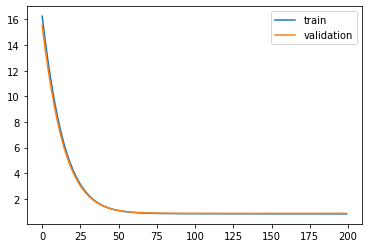

Time to train LSTM:  143.59769821166992


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7effe796ecc0>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.
Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7effe75e6630>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File

Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 8s - loss: 16.2498 - pdc_loss: 0.7189 - event_loss: 0.7478 - val_loss: 15.5223 - val_pdc_loss: 0.7092 - val_event_loss: 0.7166

Epoch 00001: val_loss improved from inf to 15.52226, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 15.2642 - pdc_loss: 0.7057 - event_loss: 0.6992 - val_loss: 14.5729 - val_pdc_loss: 0.6974 - val_event_loss: 0.6728

Epoch 00002: val_loss improved from 15.52226 to 14.57288, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 14.3284 - pdc_loss: 0.6941 - event_loss: 0.6579 - val_loss: 13.6726 - val_pdc_loss: 0.6870 - val_event_loss: 0.6354

Epoch 00003: val_loss improved from 14.57288 to 13.67258, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 13.4415 - pdc_loss: 0.6838 - event_loss: 0.6228 - val_loss: 12.8202 - val_pdc_loss: 0.6777 - val_event_loss: 0.6033

Epoch 00004: val_loss improved from 13.67258 to 12.82017, saving model to Event_val_weight


Epoch 00035: val_loss improved from 1.92965 to 1.83799, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 1.8125 - pdc_loss: 0.5562 - event_loss: 0.3203 - val_loss: 1.7536 - val_pdc_loss: 0.5572 - val_event_loss: 0.3211

Epoch 00036: val_loss improved from 1.83799 to 1.75358, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 1.7299 - pdc_loss: 0.5551 - event_loss: 0.3200 - val_loss: 1.6759 - val_pdc_loss: 0.5560 - val_event_loss: 0.3208

Epoch 00037: val_loss improved from 1.75358 to 1.67587, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 1.6539 - pdc_loss: 0.5539 - event_loss: 0.3197 - val_loss: 1.6044 - val_pdc_loss: 0.5548 - val_event_loss: 0.3205

Epoch 00038: val_loss improved from 1.67587 to 1.60439, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 1.5841 - pdc_loss: 0.5528 - event_loss: 0.3194 - val_loss: 1.5387 - val_pdc_loss: 0.5536 - val_event_loss: 0.3202

Epoch 00039: val_loss improved from 1.60439 to 

 - 1s - loss: 0.8810 - pdc_loss: 0.5269 - event_loss: 0.3164 - val_loss: 0.8817 - val_pdc_loss: 0.5289 - val_event_loss: 0.3175

Epoch 00070: val_loss improved from 0.88521 to 0.88172, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.8775 - pdc_loss: 0.5265 - event_loss: 0.3163 - val_loss: 0.8786 - val_pdc_loss: 0.5286 - val_event_loss: 0.3174

Epoch 00071: val_loss improved from 0.88172 to 0.87861, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8744 - pdc_loss: 0.5262 - event_loss: 0.3163 - val_loss: 0.8757 - val_pdc_loss: 0.5283 - val_event_loss: 0.3173

Epoch 00072: val_loss improved from 0.87861 to 0.87572, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8715 - pdc_loss: 0.5259 - event_loss: 0.3162 - val_loss: 0.8733 - val_pdc_loss: 0.5281 - val_event_loss: 0.3173

Epoch 00073: val_loss improved from 0.87572 to 0.87326, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8690 - pdc_loss: 0.5255 - event_

 - 1s - loss: 0.8423 - pdc_loss: 0.5178 - event_loss: 0.3141 - val_loss: 0.8492 - val_pdc_loss: 0.5228 - val_event_loss: 0.3161

Epoch 00105: val_loss improved from 0.84958 to 0.84925, saving model to Event_val_weights5.hdf5
Epoch 106/200
 - 1s - loss: 0.8420 - pdc_loss: 0.5176 - event_loss: 0.3140 - val_loss: 0.8490 - val_pdc_loss: 0.5226 - val_event_loss: 0.3161

Epoch 00106: val_loss improved from 0.84925 to 0.84898, saving model to Event_val_weights5.hdf5
Epoch 107/200
 - 1s - loss: 0.8417 - pdc_loss: 0.5174 - event_loss: 0.3140 - val_loss: 0.8488 - val_pdc_loss: 0.5224 - val_event_loss: 0.3160

Epoch 00107: val_loss improved from 0.84898 to 0.84880, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.8415 - pdc_loss: 0.5173 - event_loss: 0.3139 - val_loss: 0.8488 - val_pdc_loss: 0.5225 - val_event_loss: 0.3160

Epoch 00108: val_loss did not improve from 0.84880
Epoch 109/200
 - 1s - loss: 0.8412 - pdc_loss: 0.5171 - event_loss: 0.3138 - val_loss: 0.8486 - val_pdc

 - 1s - loss: 0.8347 - pdc_loss: 0.5122 - event_loss: 0.3119 - val_loss: 0.8471 - val_pdc_loss: 0.5201 - val_event_loss: 0.3164

Epoch 00144: val_loss did not improve from 0.84642
Epoch 145/200
 - 1s - loss: 0.8345 - pdc_loss: 0.5120 - event_loss: 0.3119 - val_loss: 0.8470 - val_pdc_loss: 0.5202 - val_event_loss: 0.3163

Epoch 00145: val_loss did not improve from 0.84642
Epoch 146/200
 - 1s - loss: 0.8345 - pdc_loss: 0.5121 - event_loss: 0.3119 - val_loss: 0.8471 - val_pdc_loss: 0.5201 - val_event_loss: 0.3164

Epoch 00146: val_loss did not improve from 0.84642
Epoch 147/200
 - 1s - loss: 0.8344 - pdc_loss: 0.5120 - event_loss: 0.3118 - val_loss: 0.8472 - val_pdc_loss: 0.5202 - val_event_loss: 0.3163

Epoch 00147: val_loss did not improve from 0.84642
Epoch 148/200
 - 1s - loss: 0.8344 - pdc_loss: 0.5120 - event_loss: 0.3118 - val_loss: 0.8474 - val_pdc_loss: 0.5202 - val_event_loss: 0.3165

Epoch 00148: val_loss did not improve from 0.84642
Epoch 149/200
 - 1s - loss: 0.8342 - pdc_los


Epoch 00186: val_loss did not improve from 0.84642
Epoch 187/200
 - 1s - loss: 0.8313 - pdc_loss: 0.5093 - event_loss: 0.3108 - val_loss: 0.8488 - val_pdc_loss: 0.5204 - val_event_loss: 0.3173

Epoch 00187: val_loss did not improve from 0.84642
Epoch 188/200
 - 1s - loss: 0.8305 - pdc_loss: 0.5086 - event_loss: 0.3108 - val_loss: 0.8478 - val_pdc_loss: 0.5195 - val_event_loss: 0.3172

Epoch 00188: val_loss did not improve from 0.84642
Epoch 189/200
 - 1s - loss: 0.8301 - pdc_loss: 0.5083 - event_loss: 0.3106 - val_loss: 0.8482 - val_pdc_loss: 0.5199 - val_event_loss: 0.3172

Epoch 00189: val_loss did not improve from 0.84642
Epoch 190/200
 - 1s - loss: 0.8302 - pdc_loss: 0.5085 - event_loss: 0.3105 - val_loss: 0.8493 - val_pdc_loss: 0.5209 - val_event_loss: 0.3172

Epoch 00190: val_loss did not improve from 0.84642
Epoch 191/200
 - 1s - loss: 0.8304 - pdc_loss: 0.5087 - event_loss: 0.3105 - val_loss: 0.8493 - val_pdc_loss: 0.5208 - val_event_loss: 0.3173

Epoch 00191: val_loss did not

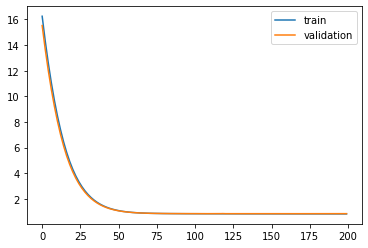

Time to train LSTM:  147.87383270263672
Entire process took:  3374.069238424301
Experiment record:
[[2, 32768, 0, 0.9087124466896057], [2, 32768, 1, 0.9394679069519043], [2, 32768, 2, 0.9082545638084412], [2, 32768, 3, 0.9229983687400818], [2, 32768, 4, 0.8959866762161255], [4, 32768, 0, 0.8655909299850464], [4, 32768, 1, 0.8811488151550293], [4, 32768, 2, 0.8792198300361633], [4, 32768, 3, 0.8944495320320129], [4, 32768, 4, 0.8678554892539978], [8, 32768, 0, 0.8432575464248657], [8, 32768, 1, 0.8599360585212708], [8, 32768, 2, 0.8735563158988953], [8, 32768, 3, 0.8718879222869873], [8, 32768, 4, 0.8480021357536316], [16, 32768, 0, 0.8406093120574951], [16, 32768, 1, 0.8570109009742737], [16, 32768, 2, 0.8653050661087036], [16, 32768, 3, 0.8689946532249451], [16, 32768, 4, 0.8469062447547913], [32, 32768, 0, 0.8407034873962402], [32, 32768, 1, 0.8575701117515564], [32, 32768, 2, 0.8655805587768555], [32, 32768, 3, 0.8676674365997314], [32, 32768, 4, 0.846422016620636]]


In [9]:
num_per_fold = x_train.shape[0]//10
print(num_per_fold)

units_list = [2, 4, 8, 16, 32]
batch_size_list = [32768]# [2048, 4096, 8192, 16384, 32768]

start_time = time.time()

exp_record = []

for units in units_list:
    for batch_s in batch_size_list:
        for f in range(5):#10
            #start = f*num_per_fold
            end = (f+1)*num_per_fold
            train1_x = x_train[:end, ]
            train2_x = x_train[end:, ]
            train_x_lstm = np.append(train2_x, train1_x, axis=0) 
            train1_y_pdc = y_pdc_train[:end, ]
            train2_y_pdc = y_pdc_train[end:, ]
            train_y_pdc = np.append(train2_y_pdc, train1_y_pdc, axis=0)
            train1_y_event = y_event_train[:end, ]
            train2_y_event = y_event_train[end:, ]
            train_y_event = np.append(train2_y_event, train1_y_event, axis=0)
            

            start_time_inner = time.time()
            with tf.Session(config = tf.ConfigProto(log_device_placement = True)):
                x = Input(shape=(8, 182), name="obs")
                model = CuDNNLSTM(units,
                                  kernel_regularizer=regularizers.l2(0.1))(x)
                out_pdc = Dense(2, activation='softmax', name="pdc")(model)
                out_event = Dense(2, activation='softmax', name="event")(model)
                multi_out_model = Model(x, outputs=[out_pdc, out_event])
                multi_out_model.compile(loss=["categorical_crossentropy",
                                    "categorical_crossentropy"],
                              #{"pdc":keras.losses.CategoricalCrossentropy(from_logit=True),\
                              #      "event":keras.losses.CategoricalCrossentropy(from_logit=True)}, 
                              optimizer='adam', 
                              #loss_weight=[1.0,1.0])
                              )  
                val_weight = "Event_val_weights" + str(f+1) + ".hdf5"
                val_checkpointer = ModelCheckpoint(filepath=val_weight,
                                            monitor='val_loss', verbose=1,
                                            save_best_only=True)
                history = multi_out_model.fit({"obs":train_x_lstm}, 
                                              {"pdc":train_y_pdc, 
                                               "event":train_y_event},
                                                batch_size=batch_s, 
                                                epochs=200, validation_split=0.1, 
                                                callbacks=[val_checkpointer], 
                                                verbose=2, 
                                                shuffle=False) 
                print("#################################")
                print("Number of units:", units)
                print("Batch size:", batch_s)
                print("Fold:", f)
                print("best val loss:", min(history.history['val_loss']))
                exp_record.append([units, batch_s, f, min(history.history['val_loss'])])
                print("#################################")
                if(f==4):
                    print(exp_record)
                pyplot.plot(history.history['loss'], label='train')
                pyplot.plot(history.history['val_loss'], label='validation')
                pyplot.legend()
                pyplot.show()
            end_time = time.time()
            print("Time to train LSTM: ", time.time() - start_time_inner)
print("Entire process took: ", time.time() - start_time)

print("Experiment record:")
print(exp_record)

In [13]:
exp_record = [[2, 32768, 0, 0.9087124466896057], [2, 32768, 1, 0.9394679069519043], [2, 32768, 2, 0.9082545638084412], [2, 32768, 3, 0.9229983687400818], [2, 32768, 4, 0.8959866762161255], [4, 32768, 0, 0.8655909299850464], [4, 32768, 1, 0.8811488151550293], [4, 32768, 2, 0.8792198300361633], [4, 32768, 3, 0.8944495320320129], [4, 32768, 4, 0.8678554892539978], [8, 32768, 0, 0.8432575464248657], [8, 32768, 1, 0.8599360585212708], [8, 32768, 2, 0.8735563158988953], [8, 32768, 3, 0.8718879222869873], [8, 32768, 4, 0.8480021357536316], [16, 32768, 0, 0.8406093120574951], [16, 32768, 1, 0.8570109009742737], [16, 32768, 2, 0.8653050661087036], [16, 32768, 3, 0.8689946532249451], [16, 32768, 4, 0.8469062447547913], [32, 32768, 0, 0.8407034873962402], [32, 32768, 1, 0.8575701117515564], [32, 32768, 2, 0.8655805587768555], [32, 32768, 3, 0.8676674365997314], [32, 32768, 4, 0.846422016620636]]
complete_v = np.array(exp_record)
print(complete_v.shape)

val_loss_list = []
for i in range(5):
    h_params = complete_v[(i*5):((i+1)*5), :]
    print("###############################")
    print("Units:", h_params[0, 0])
    print("Batch size:", h_params[0, 1])
    #print("Val loss (mean):", np.mean(h_params[:, 3]))
    #print("Val loss (std):", np.std(h_params[:, 3]))
    print("Val loss (mean):", 
          np.round(np.mean(h_params[:, 3]), decimals=5))
    print("Val loss (std):", 
          np.round(np.std(h_params[:, 3]), decimals=5))
    print("###############################")
    val_loss_list.append(np.mean(h_params[:, 3]))
print(min(val_loss_list))

(25, 4)
###############################
Units: 2.0
Batch size: 32768.0
Val loss (mean): 0.91508
Val loss (std): 0.01489
###############################
###############################
Units: 4.0
Batch size: 32768.0
Val loss (mean): 0.87765
Val loss (std): 0.01038
###############################
###############################
Units: 8.0
Batch size: 32768.0
Val loss (mean): 0.85933
Val loss (std): 0.01222
###############################
###############################
Units: 16.0
Batch size: 32768.0
Val loss (mean): 0.85577
Val loss (std): 0.01073
###############################
###############################
Units: 32.0
Batch size: 32768.0
Val loss (mean): 0.85559
Val loss (std): 0.01054
###############################
0.855588722229004


In [14]:
###########################
# generate random numbers
# L2 search
###########################
from numpy.random import seed
seed(111) 
L2_list = []
for i in range(25):
    L2_list.append(np.random.uniform(0.05, 0.15))
print("Min L2 layer 1:\t", min(L2_list))
print("Max L2 layer 1:\t", max(L2_list))
print("Layer 1 L2:\t", L2_list)

Min L2 layer 1:	 0.05224783245441618
Max L2 layer 1:	 0.149095485133041
Layer 1 L2:	 [0.11121701756176186, 0.06690697543456364, 0.09360590193711701, 0.12692624725231227, 0.07953253044028762, 0.06491629571394898, 0.05224783245441618, 0.09202244922645578, 0.0738682141246446, 0.08376561918887923, 0.14907124646308786, 0.07377264539000228, 0.05811926594512116, 0.11696002382466299, 0.1121242919400697, 0.07742535302065184, 0.09662214098949731, 0.06183677511232836, 0.057395756414320424, 0.14007741791606837, 0.12939625604796284, 0.13405696487242813, 0.13152074574529404, 0.149095485133041, 0.10772738296076793]


9000
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 1s - loss: 6.9845 - pdc_loss: 0.7170 - event_loss: 0.6949 - val_loss: 6.3782 - val_pdc_loss: 0.6948 - val_event_loss: 0.6408

Epoch 00001: val_loss improved from inf to 6.37819, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 5.9495 - pdc_loss: 0.6898 - event_loss: 0.6058 - val_loss: 5.4314 - val_pdc_loss: 0.6717 - val_event_loss: 0.5682

Epoch 00002: val_loss improved from 6.37819 to 5.43144, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 5.0708 - pdc_loss: 0.6693 - event_loss: 0.5454 - val_loss: 4.6297 - val_pdc_loss: 0.6545 - val_event_loss: 0.5161

Epoch 00003: val_loss improved from 5.43144 to 4.62973, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 4.3285 - pdc_loss: 0.6537 - event_loss: 0.5010 - val_loss: 3.9546 - val_pdc_loss: 0.6413 - val_event_loss: 0.4757

Epoch 00004: val_loss improved from 4.62973 to 3.95456, saving model to Event_val_weights1.hdf5
Ep


Epoch 00035: val_loss improved from 0.86348 to 0.86238, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 0.8656 - pdc_loss: 0.5342 - event_loss: 0.3173 - val_loss: 0.8613 - val_pdc_loss: 0.5348 - val_event_loss: 0.3124

Epoch 00036: val_loss improved from 0.86238 to 0.86127, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 0.8646 - pdc_loss: 0.5334 - event_loss: 0.3173 - val_loss: 0.8605 - val_pdc_loss: 0.5341 - val_event_loss: 0.3125

Epoch 00037: val_loss improved from 0.86127 to 0.86053, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 0.8636 - pdc_loss: 0.5326 - event_loss: 0.3173 - val_loss: 0.8594 - val_pdc_loss: 0.5333 - val_event_loss: 0.3123

Epoch 00038: val_loss improved from 0.86053 to 0.85937, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 0.8627 - pdc_loss: 0.5319 - event_loss: 0.3172 - val_loss: 0.8588 - val_pdc_loss: 0.5327 - val_event_loss: 0.3125

Epoch 00039: val_loss improved from 0.85937 to 


Epoch 00070: val_loss improved from 0.84384 to 0.84335, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 0.8470 - pdc_loss: 0.5202 - event_loss: 0.3161 - val_loss: 0.8434 - val_pdc_loss: 0.5213 - val_event_loss: 0.3114

Epoch 00071: val_loss did not improve from 0.84335
Epoch 72/200
 - 1s - loss: 0.8467 - pdc_loss: 0.5200 - event_loss: 0.3160 - val_loss: 0.8428 - val_pdc_loss: 0.5212 - val_event_loss: 0.3110

Epoch 00072: val_loss improved from 0.84335 to 0.84283, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.8465 - pdc_loss: 0.5199 - event_loss: 0.3160 - val_loss: 0.8426 - val_pdc_loss: 0.5210 - val_event_loss: 0.3110

Epoch 00073: val_loss improved from 0.84283 to 0.84262, saving model to Event_val_weights1.hdf5
Epoch 74/200
 - 1s - loss: 0.8462 - pdc_loss: 0.5197 - event_loss: 0.3159 - val_loss: 0.8425 - val_pdc_loss: 0.5210 - val_event_loss: 0.3109

Epoch 00074: val_loss improved from 0.84262 to 0.84245, saving model to Event_val_weights1.h

 - 1s - loss: 0.8409 - pdc_loss: 0.5162 - event_loss: 0.3154 - val_loss: 0.8381 - val_pdc_loss: 0.5182 - val_event_loss: 0.3106

Epoch 00108: val_loss did not improve from 0.83793
Epoch 109/200
 - 1s - loss: 0.8408 - pdc_loss: 0.5161 - event_loss: 0.3154 - val_loss: 0.8379 - val_pdc_loss: 0.5180 - val_event_loss: 0.3106

Epoch 00109: val_loss improved from 0.83793 to 0.83786, saving model to Event_val_weights1.hdf5
Epoch 110/200
 - 1s - loss: 0.8407 - pdc_loss: 0.5161 - event_loss: 0.3154 - val_loss: 0.8375 - val_pdc_loss: 0.5179 - val_event_loss: 0.3104

Epoch 00110: val_loss improved from 0.83786 to 0.83751, saving model to Event_val_weights1.hdf5
Epoch 111/200
 - 1s - loss: 0.8406 - pdc_loss: 0.5160 - event_loss: 0.3154 - val_loss: 0.8376 - val_pdc_loss: 0.5178 - val_event_loss: 0.3106

Epoch 00111: val_loss did not improve from 0.83751
Epoch 112/200
 - 1s - loss: 0.8404 - pdc_loss: 0.5159 - event_loss: 0.3154 - val_loss: 0.8375 - val_pdc_loss: 0.5178 - val_event_loss: 0.3105

Epoch


Epoch 00145: val_loss improved from 0.83555 to 0.83539, saving model to Event_val_weights1.hdf5
Epoch 146/200
 - 1s - loss: 0.8379 - pdc_loss: 0.5144 - event_loss: 0.3149 - val_loss: 0.8353 - val_pdc_loss: 0.5165 - val_event_loss: 0.3103

Epoch 00146: val_loss improved from 0.83539 to 0.83531, saving model to Event_val_weights1.hdf5
Epoch 147/200
 - 1s - loss: 0.8379 - pdc_loss: 0.5144 - event_loss: 0.3150 - val_loss: 0.8353 - val_pdc_loss: 0.5163 - val_event_loss: 0.3104

Epoch 00147: val_loss improved from 0.83531 to 0.83529, saving model to Event_val_weights1.hdf5
Epoch 148/200
 - 1s - loss: 0.8378 - pdc_loss: 0.5144 - event_loss: 0.3149 - val_loss: 0.8354 - val_pdc_loss: 0.5165 - val_event_loss: 0.3104

Epoch 00148: val_loss did not improve from 0.83529
Epoch 149/200
 - 1s - loss: 0.8378 - pdc_loss: 0.5144 - event_loss: 0.3149 - val_loss: 0.8353 - val_pdc_loss: 0.5164 - val_event_loss: 0.3104

Epoch 00149: val_loss did not improve from 0.83529
Epoch 150/200
 - 1s - loss: 0.8377 - 

 - 1s - loss: 0.8358 - pdc_loss: 0.5132 - event_loss: 0.3146 - val_loss: 0.8344 - val_pdc_loss: 0.5162 - val_event_loss: 0.3102

Epoch 00185: val_loss improved from 0.83445 to 0.83443, saving model to Event_val_weights1.hdf5
Epoch 186/200
 - 1s - loss: 0.8357 - pdc_loss: 0.5132 - event_loss: 0.3145 - val_loss: 0.8343 - val_pdc_loss: 0.5162 - val_event_loss: 0.3101

Epoch 00186: val_loss improved from 0.83443 to 0.83433, saving model to Event_val_weights1.hdf5
Epoch 187/200
 - 1s - loss: 0.8357 - pdc_loss: 0.5131 - event_loss: 0.3146 - val_loss: 0.8343 - val_pdc_loss: 0.5161 - val_event_loss: 0.3102

Epoch 00187: val_loss improved from 0.83433 to 0.83431, saving model to Event_val_weights1.hdf5
Epoch 188/200
 - 1s - loss: 0.8356 - pdc_loss: 0.5131 - event_loss: 0.3145 - val_loss: 0.8343 - val_pdc_loss: 0.5162 - val_event_loss: 0.3102

Epoch 00188: val_loss did not improve from 0.83431
Epoch 189/200
 - 1s - loss: 0.8356 - pdc_loss: 0.5131 - event_loss: 0.3146 - val_loss: 0.8341 - val_pdc

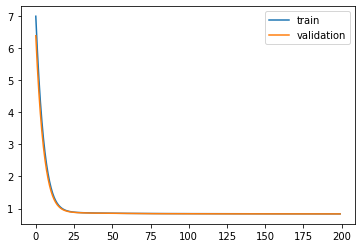

Time to train LSTM:  142.534432888031
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 2s - loss: 7.0169 - pdc_loss: 0.7232 - event_loss: 0.7110 - val_loss: 6.4373 - val_pdc_loss: 0.7073 - val_event_loss: 0.6881

Epoch 00001: val_loss improved from inf to 6.43735, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 6.0131 - pdc_loss: 0.6950 - event_loss: 0.6718 - val_loss: 5.5152 - val_pdc_loss: 0.6842 - val_event_loss: 0.6542

Epoch 00002: val_loss improved from 6.43735 to 5.51519, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 5.1515 - pdc_loss: 0.6746 - event_loss: 0.6396 - val_loss: 4.7280 - val_pdc_loss: 0.6670 - val_event_loss: 0.6245

Epoch 00003: val_loss improved from 5.51519 to 4.72801, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 4.4184 - pdc_loss: 0.6587 - event_loss: 0.6100 - val_loss: 4.0611 - val_pdc_loss: 0.6530 - val_event_loss: 0.5956

Epoch 00004: val_loss improved from 4.72801 to 4.06105, saving mo


Epoch 00035: val_loss improved from 0.88322 to 0.88179, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 0.8674 - pdc_loss: 0.5347 - event_loss: 0.3182 - val_loss: 0.8806 - val_pdc_loss: 0.5414 - val_event_loss: 0.3249

Epoch 00036: val_loss improved from 0.88179 to 0.88061, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 0.8661 - pdc_loss: 0.5338 - event_loss: 0.3181 - val_loss: 0.8792 - val_pdc_loss: 0.5405 - val_event_loss: 0.3247

Epoch 00037: val_loss improved from 0.88061 to 0.87919, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 0.8649 - pdc_loss: 0.5330 - event_loss: 0.3180 - val_loss: 0.8783 - val_pdc_loss: 0.5398 - val_event_loss: 0.3247

Epoch 00038: val_loss improved from 0.87919 to 0.87831, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 0.8637 - pdc_loss: 0.5322 - event_loss: 0.3178 - val_loss: 0.8771 - val_pdc_loss: 0.5390 - val_event_loss: 0.3245

Epoch 00039: val_loss improved from 0.87831 to 


Epoch 00070: val_loss improved from 0.86141 to 0.86115, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.8466 - pdc_loss: 0.5205 - event_loss: 0.3160 - val_loss: 0.8611 - val_pdc_loss: 0.5288 - val_event_loss: 0.3222

Epoch 00071: val_loss improved from 0.86115 to 0.86111, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.8464 - pdc_loss: 0.5203 - event_loss: 0.3160 - val_loss: 0.8611 - val_pdc_loss: 0.5289 - val_event_loss: 0.3221

Epoch 00072: val_loss improved from 0.86111 to 0.86106, saving model to Event_val_weights2.hdf5
Epoch 73/200
 - 1s - loss: 0.8461 - pdc_loss: 0.5202 - event_loss: 0.3159 - val_loss: 0.8609 - val_pdc_loss: 0.5286 - val_event_loss: 0.3222

Epoch 00073: val_loss improved from 0.86106 to 0.86087, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.8459 - pdc_loss: 0.5200 - event_loss: 0.3159 - val_loss: 0.8606 - val_pdc_loss: 0.5285 - val_event_loss: 0.3222

Epoch 00074: val_loss improved from 0.86087 to 


Epoch 00107: val_loss improved from 0.85727 to 0.85712, saving model to Event_val_weights2.hdf5
Epoch 108/200
 - 1s - loss: 0.8409 - pdc_loss: 0.5168 - event_loss: 0.3151 - val_loss: 0.8571 - val_pdc_loss: 0.5267 - val_event_loss: 0.3214

Epoch 00108: val_loss improved from 0.85712 to 0.85709, saving model to Event_val_weights2.hdf5
Epoch 109/200
 - 1s - loss: 0.8408 - pdc_loss: 0.5167 - event_loss: 0.3151 - val_loss: 0.8567 - val_pdc_loss: 0.5264 - val_event_loss: 0.3214

Epoch 00109: val_loss improved from 0.85709 to 0.85673, saving model to Event_val_weights2.hdf5
Epoch 110/200
 - 1s - loss: 0.8407 - pdc_loss: 0.5166 - event_loss: 0.3151 - val_loss: 0.8570 - val_pdc_loss: 0.5266 - val_event_loss: 0.3214

Epoch 00110: val_loss did not improve from 0.85673
Epoch 111/200
 - 1s - loss: 0.8406 - pdc_loss: 0.5166 - event_loss: 0.3151 - val_loss: 0.8569 - val_pdc_loss: 0.5265 - val_event_loss: 0.3214

Epoch 00111: val_loss did not improve from 0.85673
Epoch 112/200
 - 1s - loss: 0.8405 - 

 - 1s - loss: 0.8381 - pdc_loss: 0.5151 - event_loss: 0.3146 - val_loss: 0.8542 - val_pdc_loss: 0.5254 - val_event_loss: 0.3204

Epoch 00146: val_loss improved from 0.85436 to 0.85421, saving model to Event_val_weights2.hdf5
Epoch 147/200
 - 1s - loss: 0.8380 - pdc_loss: 0.5150 - event_loss: 0.3146 - val_loss: 0.8542 - val_pdc_loss: 0.5253 - val_event_loss: 0.3205

Epoch 00147: val_loss improved from 0.85421 to 0.85419, saving model to Event_val_weights2.hdf5
Epoch 148/200
 - 1s - loss: 0.8380 - pdc_loss: 0.5150 - event_loss: 0.3146 - val_loss: 0.8542 - val_pdc_loss: 0.5254 - val_event_loss: 0.3204

Epoch 00148: val_loss improved from 0.85419 to 0.85418, saving model to Event_val_weights2.hdf5
Epoch 149/200
 - 1s - loss: 0.8378 - pdc_loss: 0.5149 - event_loss: 0.3145 - val_loss: 0.8541 - val_pdc_loss: 0.5253 - val_event_loss: 0.3204

Epoch 00149: val_loss improved from 0.85418 to 0.85407, saving model to Event_val_weights2.hdf5
Epoch 150/200
 - 1s - loss: 0.8378 - pdc_loss: 0.5149 - ev

 - 1s - loss: 0.8359 - pdc_loss: 0.5138 - event_loss: 0.3142 - val_loss: 0.8534 - val_pdc_loss: 0.5254 - val_event_loss: 0.3201

Epoch 00185: val_loss did not improve from 0.85309
Epoch 186/200
 - 1s - loss: 0.8358 - pdc_loss: 0.5137 - event_loss: 0.3142 - val_loss: 0.8531 - val_pdc_loss: 0.5253 - val_event_loss: 0.3199

Epoch 00186: val_loss did not improve from 0.85309
Epoch 187/200
 - 1s - loss: 0.8358 - pdc_loss: 0.5137 - event_loss: 0.3142 - val_loss: 0.8530 - val_pdc_loss: 0.5252 - val_event_loss: 0.3199

Epoch 00187: val_loss improved from 0.85309 to 0.85298, saving model to Event_val_weights2.hdf5
Epoch 188/200
 - 1s - loss: 0.8357 - pdc_loss: 0.5136 - event_loss: 0.3142 - val_loss: 0.8530 - val_pdc_loss: 0.5252 - val_event_loss: 0.3199

Epoch 00188: val_loss did not improve from 0.85298
Epoch 189/200
 - 1s - loss: 0.8356 - pdc_loss: 0.5136 - event_loss: 0.3142 - val_loss: 0.8530 - val_pdc_loss: 0.5252 - val_event_loss: 0.3199

Epoch 00189: val_loss improved from 0.85298 to 0.8

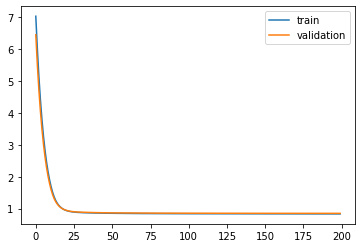

Time to train LSTM:  143.03096961975098


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f6c2c05a780>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 2s - loss: 7.0444 - pdc_loss: 0.7013 - event_loss: 0.7191 - val_loss: 6.4473 - val_pdc_loss: 0.6937 - val_event_loss: 0.6621

Epoch 00001: val_loss improved from inf to 6.44732, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 6.0082 - pdc_loss: 0.6855 - event_loss: 0.6223 - val_loss: 5.4992 - val_pdc_loss: 0.6795 - val_event_loss: 0.5852

Epoch 00002: val_loss improved from 6.44732 to 5.49922, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 5.1218 - pdc_loss: 0.6703 - event_loss: 0.5553 - val_loss: 4.6908 - val_pdc_loss: 0.6656 - val_event_loss: 0.5297

Epoch 00003: val_loss improved from 5.49922 to 4.69083, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 4.3683 - pdc_loss: 0.6561 - event_loss: 0.5047 - val_loss: 4.0063 - val_pdc_loss: 0.6529 - val_event_loss: 0.4854

Epoch 00004: val_loss improved from 4.69083 to 4.00633, saving model to Event_val_weights3.hdf5
Epoch 5


Epoch 00035: val_loss improved from 0.88845 to 0.88749, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 0.8652 - pdc_loss: 0.5337 - event_loss: 0.3176 - val_loss: 0.8865 - val_pdc_loss: 0.5489 - val_event_loss: 0.3238

Epoch 00036: val_loss improved from 0.88749 to 0.88649, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 0.8640 - pdc_loss: 0.5328 - event_loss: 0.3175 - val_loss: 0.8857 - val_pdc_loss: 0.5483 - val_event_loss: 0.3237

Epoch 00037: val_loss improved from 0.88649 to 0.88571, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 0.8629 - pdc_loss: 0.5319 - event_loss: 0.3174 - val_loss: 0.8849 - val_pdc_loss: 0.5477 - val_event_loss: 0.3237

Epoch 00038: val_loss improved from 0.88571 to 0.88487, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 0.8619 - pdc_loss: 0.5311 - event_loss: 0.3173 - val_loss: 0.8842 - val_pdc_loss: 0.5471 - val_event_loss: 0.3237

Epoch 00039: val_loss improved from 0.88487 to 


Epoch 00070: val_loss improved from 0.87241 to 0.87208, saving model to Event_val_weights3.hdf5
Epoch 71/200
 - 1s - loss: 0.8460 - pdc_loss: 0.5202 - event_loss: 0.3158 - val_loss: 0.8719 - val_pdc_loss: 0.5391 - val_event_loss: 0.3229

Epoch 00071: val_loss improved from 0.87208 to 0.87193, saving model to Event_val_weights3.hdf5
Epoch 72/200
 - 1s - loss: 0.8458 - pdc_loss: 0.5201 - event_loss: 0.3158 - val_loss: 0.8716 - val_pdc_loss: 0.5388 - val_event_loss: 0.3229

Epoch 00072: val_loss improved from 0.87193 to 0.87164, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.8455 - pdc_loss: 0.5199 - event_loss: 0.3158 - val_loss: 0.8716 - val_pdc_loss: 0.5389 - val_event_loss: 0.3229

Epoch 00073: val_loss improved from 0.87164 to 0.87158, saving model to Event_val_weights3.hdf5
Epoch 74/200
 - 1s - loss: 0.8453 - pdc_loss: 0.5197 - event_loss: 0.3158 - val_loss: 0.8713 - val_pdc_loss: 0.5386 - val_event_loss: 0.3230

Epoch 00074: val_loss improved from 0.87158 to 


Epoch 00107: val_loss did not improve from 0.86733
Epoch 108/200
 - 1s - loss: 0.8402 - pdc_loss: 0.5165 - event_loss: 0.3153 - val_loss: 0.8672 - val_pdc_loss: 0.5360 - val_event_loss: 0.3227

Epoch 00108: val_loss improved from 0.86733 to 0.86718, saving model to Event_val_weights3.hdf5
Epoch 109/200
 - 1s - loss: 0.8402 - pdc_loss: 0.5165 - event_loss: 0.3153 - val_loss: 0.8672 - val_pdc_loss: 0.5361 - val_event_loss: 0.3227

Epoch 00109: val_loss did not improve from 0.86718
Epoch 110/200
 - 1s - loss: 0.8400 - pdc_loss: 0.5163 - event_loss: 0.3152 - val_loss: 0.8671 - val_pdc_loss: 0.5360 - val_event_loss: 0.3227

Epoch 00110: val_loss improved from 0.86718 to 0.86713, saving model to Event_val_weights3.hdf5
Epoch 111/200
 - 1s - loss: 0.8399 - pdc_loss: 0.5163 - event_loss: 0.3152 - val_loss: 0.8671 - val_pdc_loss: 0.5360 - val_event_loss: 0.3227

Epoch 00111: val_loss improved from 0.86713 to 0.86705, saving model to Event_val_weights3.hdf5
Epoch 112/200
 - 1s - loss: 0.8397 - 


Epoch 00144: val_loss improved from 0.86464 to 0.86464, saving model to Event_val_weights3.hdf5
Epoch 145/200
 - 1s - loss: 0.8370 - pdc_loss: 0.5144 - event_loss: 0.3148 - val_loss: 0.8645 - val_pdc_loss: 0.5344 - val_event_loss: 0.3223

Epoch 00145: val_loss improved from 0.86464 to 0.86449, saving model to Event_val_weights3.hdf5
Epoch 146/200
 - 1s - loss: 0.8369 - pdc_loss: 0.5144 - event_loss: 0.3148 - val_loss: 0.8645 - val_pdc_loss: 0.5345 - val_event_loss: 0.3223

Epoch 00146: val_loss did not improve from 0.86449
Epoch 147/200
 - 1s - loss: 0.8368 - pdc_loss: 0.5144 - event_loss: 0.3148 - val_loss: 0.8645 - val_pdc_loss: 0.5344 - val_event_loss: 0.3224

Epoch 00147: val_loss did not improve from 0.86449
Epoch 148/200
 - 1s - loss: 0.8367 - pdc_loss: 0.5143 - event_loss: 0.3147 - val_loss: 0.8640 - val_pdc_loss: 0.5339 - val_event_loss: 0.3223

Epoch 00148: val_loss improved from 0.86449 to 0.86399, saving model to Event_val_weights3.hdf5
Epoch 149/200
 - 1s - loss: 0.8367 - 


Epoch 00183: val_loss did not improve from 0.86265
Epoch 184/200
 - 1s - loss: 0.8346 - pdc_loss: 0.5130 - event_loss: 0.3143 - val_loss: 0.8626 - val_pdc_loss: 0.5334 - val_event_loss: 0.3220

Epoch 00184: val_loss improved from 0.86265 to 0.86261, saving model to Event_val_weights3.hdf5
Epoch 185/200
 - 1s - loss: 0.8345 - pdc_loss: 0.5130 - event_loss: 0.3143 - val_loss: 0.8627 - val_pdc_loss: 0.5334 - val_event_loss: 0.3221

Epoch 00185: val_loss did not improve from 0.86261
Epoch 186/200
 - 1s - loss: 0.8345 - pdc_loss: 0.5130 - event_loss: 0.3143 - val_loss: 0.8626 - val_pdc_loss: 0.5333 - val_event_loss: 0.3220

Epoch 00186: val_loss did not improve from 0.86261
Epoch 187/200
 - 1s - loss: 0.8344 - pdc_loss: 0.5129 - event_loss: 0.3143 - val_loss: 0.8627 - val_pdc_loss: 0.5336 - val_event_loss: 0.3220

Epoch 00187: val_loss did not improve from 0.86261
Epoch 188/200
 - 1s - loss: 0.8344 - pdc_loss: 0.5129 - event_loss: 0.3143 - val_loss: 0.8622 - val_pdc_loss: 0.5330 - val_even

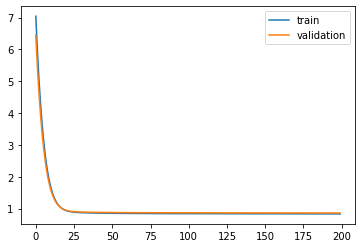

Time to train LSTM:  143.41630244255066
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 2s - loss: 7.0044 - pdc_loss: 0.7144 - event_loss: 0.6603 - val_loss: 6.4198 - val_pdc_loss: 0.7046 - val_event_loss: 0.6292

Epoch 00001: val_loss improved from inf to 6.41982, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 5.9874 - pdc_loss: 0.6973 - event_loss: 0.6013 - val_loss: 5.4853 - val_pdc_loss: 0.6901 - val_event_loss: 0.5777

Epoch 00002: val_loss improved from 6.41982 to 5.48528, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 5.1127 - pdc_loss: 0.6825 - event_loss: 0.5534 - val_loss: 4.6877 - val_pdc_loss: 0.6778 - val_event_loss: 0.5356

Epoch 00003: val_loss improved from 5.48528 to 4.68772, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 4.3696 - pdc_loss: 0.6700 - event_loss: 0.5136 - val_loss: 4.0132 - val_pdc_loss: 0.6669 - val_event_loss: 0.4998

Epoch 00004: val_loss improved from 4.68772 to 4.01323, saving 


Epoch 00035: val_loss improved from 0.89584 to 0.89527, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 0.8703 - pdc_loss: 0.5410 - event_loss: 0.3162 - val_loss: 0.8945 - val_pdc_loss: 0.5549 - val_event_loss: 0.3267

Epoch 00036: val_loss improved from 0.89527 to 0.89453, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 0.8695 - pdc_loss: 0.5405 - event_loss: 0.3161 - val_loss: 0.8941 - val_pdc_loss: 0.5545 - val_event_loss: 0.3267

Epoch 00037: val_loss improved from 0.89453 to 0.89411, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 0.8687 - pdc_loss: 0.5399 - event_loss: 0.3160 - val_loss: 0.8934 - val_pdc_loss: 0.5541 - val_event_loss: 0.3265

Epoch 00038: val_loss improved from 0.89411 to 0.89336, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 0.8680 - pdc_loss: 0.5394 - event_loss: 0.3160 - val_loss: 0.8929 - val_pdc_loss: 0.5538 - val_event_loss: 0.3265

Epoch 00039: val_loss improved from 0.89336 to 

 - 1s - loss: 0.8493 - pdc_loss: 0.5235 - event_loss: 0.3149 - val_loss: 0.8783 - val_pdc_loss: 0.5416 - val_event_loss: 0.3258

Epoch 00070: val_loss improved from 0.87864 to 0.87826, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.8488 - pdc_loss: 0.5231 - event_loss: 0.3149 - val_loss: 0.8782 - val_pdc_loss: 0.5415 - val_event_loss: 0.3259

Epoch 00071: val_loss improved from 0.87826 to 0.87815, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.8484 - pdc_loss: 0.5228 - event_loss: 0.3149 - val_loss: 0.8778 - val_pdc_loss: 0.5412 - val_event_loss: 0.3259

Epoch 00072: val_loss improved from 0.87815 to 0.87780, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.8480 - pdc_loss: 0.5225 - event_loss: 0.3148 - val_loss: 0.8777 - val_pdc_loss: 0.5411 - val_event_loss: 0.3260

Epoch 00073: val_loss improved from 0.87780 to 0.87774, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.8477 - pdc_loss: 0.5222 - event_


Epoch 00104: val_loss improved from 0.87215 to 0.87215, saving model to Event_val_weights4.hdf5
Epoch 105/200
 - 1s - loss: 0.8408 - pdc_loss: 0.5174 - event_loss: 0.3142 - val_loss: 0.8718 - val_pdc_loss: 0.5367 - val_event_loss: 0.3258

Epoch 00105: val_loss improved from 0.87215 to 0.87176, saving model to Event_val_weights4.hdf5
Epoch 106/200
 - 1s - loss: 0.8408 - pdc_loss: 0.5174 - event_loss: 0.3141 - val_loss: 0.8717 - val_pdc_loss: 0.5367 - val_event_loss: 0.3257

Epoch 00106: val_loss improved from 0.87176 to 0.87168, saving model to Event_val_weights4.hdf5
Epoch 107/200
 - 1s - loss: 0.8405 - pdc_loss: 0.5172 - event_loss: 0.3141 - val_loss: 0.8715 - val_pdc_loss: 0.5365 - val_event_loss: 0.3258

Epoch 00107: val_loss improved from 0.87168 to 0.87149, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.8404 - pdc_loss: 0.5171 - event_loss: 0.3141 - val_loss: 0.8715 - val_pdc_loss: 0.5365 - val_event_loss: 0.3258

Epoch 00108: val_loss improved from 0.87149

 - 1s - loss: 0.8369 - pdc_loss: 0.5148 - event_loss: 0.3135 - val_loss: 0.8684 - val_pdc_loss: 0.5338 - val_event_loss: 0.3260

Epoch 00140: val_loss did not improve from 0.86827
Epoch 141/200
 - 1s - loss: 0.8368 - pdc_loss: 0.5147 - event_loss: 0.3135 - val_loss: 0.8684 - val_pdc_loss: 0.5338 - val_event_loss: 0.3260

Epoch 00141: val_loss did not improve from 0.86827
Epoch 142/200
 - 1s - loss: 0.8368 - pdc_loss: 0.5148 - event_loss: 0.3135 - val_loss: 0.8683 - val_pdc_loss: 0.5338 - val_event_loss: 0.3259

Epoch 00142: val_loss improved from 0.86827 to 0.86827, saving model to Event_val_weights4.hdf5
Epoch 143/200
 - 1s - loss: 0.8366 - pdc_loss: 0.5146 - event_loss: 0.3135 - val_loss: 0.8681 - val_pdc_loss: 0.5337 - val_event_loss: 0.3259

Epoch 00143: val_loss improved from 0.86827 to 0.86815, saving model to Event_val_weights4.hdf5
Epoch 144/200
 - 1s - loss: 0.8366 - pdc_loss: 0.5146 - event_loss: 0.3135 - val_loss: 0.8682 - val_pdc_loss: 0.5337 - val_event_loss: 0.3260

Epoch

 - 1s - loss: 0.8344 - pdc_loss: 0.5132 - event_loss: 0.3131 - val_loss: 0.8666 - val_pdc_loss: 0.5324 - val_event_loss: 0.3261

Epoch 00177: val_loss improved from 0.86664 to 0.86661, saving model to Event_val_weights4.hdf5
Epoch 178/200
 - 1s - loss: 0.8344 - pdc_loss: 0.5132 - event_loss: 0.3131 - val_loss: 0.8666 - val_pdc_loss: 0.5324 - val_event_loss: 0.3261

Epoch 00178: val_loss improved from 0.86661 to 0.86656, saving model to Event_val_weights4.hdf5
Epoch 179/200
 - 1s - loss: 0.8343 - pdc_loss: 0.5131 - event_loss: 0.3130 - val_loss: 0.8665 - val_pdc_loss: 0.5324 - val_event_loss: 0.3261

Epoch 00179: val_loss improved from 0.86656 to 0.86655, saving model to Event_val_weights4.hdf5
Epoch 180/200
 - 1s - loss: 0.8343 - pdc_loss: 0.5131 - event_loss: 0.3131 - val_loss: 0.8666 - val_pdc_loss: 0.5323 - val_event_loss: 0.3262

Epoch 00180: val_loss did not improve from 0.86655
Epoch 181/200
 - 1s - loss: 0.8341 - pdc_loss: 0.5131 - event_loss: 0.3130 - val_loss: 0.8666 - val_pdc

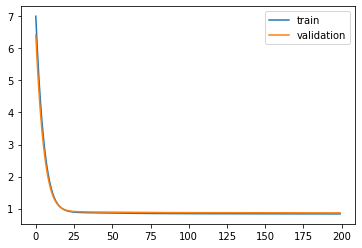

Time to train LSTM:  145.17546391487122


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f6a95b69ba8>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 2s - loss: 6.9812 - pdc_loss: 0.7576 - event_loss: 0.6823 - val_loss: 6.4081 - val_pdc_loss: 0.7440 - val_event_loss: 0.6602

Epoch 00001: val_loss improved from inf to 6.40808, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 5.9763 - pdc_loss: 0.7204 - event_loss: 0.6438 - val_loss: 5.4805 - val_pdc_loss: 0.7106 - val_event_loss: 0.6223

Epoch 00002: val_loss improved from 6.40808 to 5.48048, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 5.1100 - pdc_loss: 0.6909 - event_loss: 0.6067 - val_loss: 4.6860 - val_pdc_loss: 0.6846 - val_event_loss: 0.5847

Epoch 00003: val_loss improved from 5.48048 to 4.68604, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 4.3707 - pdc_loss: 0.6680 - event_loss: 0.5693 - val_loss: 4.0106 - val_pdc_loss: 0.6642 - val_event_loss: 0.5462

Epoch 00004: val_loss improved from 4.68604 to 4.01056, saving model to Event_val_weights5.hdf5
Epoch 5


Epoch 00035: val_loss improved from 0.87349 to 0.87227, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 0.8697 - pdc_loss: 0.5362 - event_loss: 0.3188 - val_loss: 0.8711 - val_pdc_loss: 0.5369 - val_event_loss: 0.3196

Epoch 00036: val_loss improved from 0.87227 to 0.87112, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 0.8687 - pdc_loss: 0.5353 - event_loss: 0.3188 - val_loss: 0.8700 - val_pdc_loss: 0.5358 - val_event_loss: 0.3197

Epoch 00037: val_loss improved from 0.87112 to 0.87002, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 0.8676 - pdc_loss: 0.5344 - event_loss: 0.3187 - val_loss: 0.8690 - val_pdc_loss: 0.5348 - val_event_loss: 0.3198

Epoch 00038: val_loss improved from 0.87002 to 0.86901, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 0.8666 - pdc_loss: 0.5336 - event_loss: 0.3186 - val_loss: 0.8681 - val_pdc_loss: 0.5338 - val_event_loss: 0.3199

Epoch 00039: val_loss improved from 0.86901 to 

 - 1s - loss: 0.8477 - pdc_loss: 0.5202 - event_loss: 0.3165 - val_loss: 0.8511 - val_pdc_loss: 0.5221 - val_event_loss: 0.3181

Epoch 00070: val_loss improved from 0.85164 to 0.85113, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.8474 - pdc_loss: 0.5200 - event_loss: 0.3164 - val_loss: 0.8509 - val_pdc_loss: 0.5220 - val_event_loss: 0.3180

Epoch 00071: val_loss improved from 0.85113 to 0.85092, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8471 - pdc_loss: 0.5199 - event_loss: 0.3164 - val_loss: 0.8505 - val_pdc_loss: 0.5218 - val_event_loss: 0.3179

Epoch 00072: val_loss improved from 0.85092 to 0.85050, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8468 - pdc_loss: 0.5197 - event_loss: 0.3163 - val_loss: 0.8505 - val_pdc_loss: 0.5219 - val_event_loss: 0.3179

Epoch 00073: val_loss improved from 0.85050 to 0.85049, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8465 - pdc_loss: 0.5196 - event_


Epoch 00105: val_loss improved from 0.84582 to 0.84577, saving model to Event_val_weights5.hdf5
Epoch 106/200
 - 1s - loss: 0.8412 - pdc_loss: 0.5167 - event_loss: 0.3154 - val_loss: 0.8457 - val_pdc_loss: 0.5197 - val_event_loss: 0.3169

Epoch 00106: val_loss improved from 0.84577 to 0.84566, saving model to Event_val_weights5.hdf5
Epoch 107/200
 - 1s - loss: 0.8411 - pdc_loss: 0.5166 - event_loss: 0.3154 - val_loss: 0.8456 - val_pdc_loss: 0.5197 - val_event_loss: 0.3168

Epoch 00107: val_loss improved from 0.84566 to 0.84564, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.8410 - pdc_loss: 0.5165 - event_loss: 0.3154 - val_loss: 0.8454 - val_pdc_loss: 0.5195 - val_event_loss: 0.3169

Epoch 00108: val_loss improved from 0.84564 to 0.84544, saving model to Event_val_weights5.hdf5
Epoch 109/200
 - 1s - loss: 0.8409 - pdc_loss: 0.5165 - event_loss: 0.3154 - val_loss: 0.8454 - val_pdc_loss: 0.5196 - val_event_loss: 0.3168

Epoch 00109: val_loss improved from 0.84544


Epoch 00142: val_loss did not improve from 0.84352
Epoch 143/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5151 - event_loss: 0.3151 - val_loss: 0.8434 - val_pdc_loss: 0.5185 - val_event_loss: 0.3166

Epoch 00143: val_loss improved from 0.84352 to 0.84341, saving model to Event_val_weights5.hdf5
Epoch 144/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5151 - event_loss: 0.3151 - val_loss: 0.8434 - val_pdc_loss: 0.5186 - val_event_loss: 0.3166

Epoch 00144: val_loss did not improve from 0.84341
Epoch 145/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5150 - event_loss: 0.3151 - val_loss: 0.8437 - val_pdc_loss: 0.5188 - val_event_loss: 0.3165

Epoch 00145: val_loss did not improve from 0.84341
Epoch 146/200
 - 1s - loss: 0.8383 - pdc_loss: 0.5150 - event_loss: 0.3150 - val_loss: 0.8434 - val_pdc_loss: 0.5185 - val_event_loss: 0.3166

Epoch 00146: val_loss improved from 0.84341 to 0.84339, saving model to Event_val_weights5.hdf5
Epoch 147/200
 - 1s - loss: 0.8382 - pdc_loss: 0.5149 - event_loss: 0.3150 - val_l


Epoch 00180: val_loss improved from 0.84206 to 0.84204, saving model to Event_val_weights5.hdf5
Epoch 181/200
 - 1s - loss: 0.8366 - pdc_loss: 0.5140 - event_loss: 0.3148 - val_loss: 0.8424 - val_pdc_loss: 0.5182 - val_event_loss: 0.3164

Epoch 00181: val_loss did not improve from 0.84204
Epoch 182/200
 - 1s - loss: 0.8366 - pdc_loss: 0.5140 - event_loss: 0.3147 - val_loss: 0.8421 - val_pdc_loss: 0.5178 - val_event_loss: 0.3164

Epoch 00182: val_loss did not improve from 0.84204
Epoch 183/200
 - 1s - loss: 0.8365 - pdc_loss: 0.5140 - event_loss: 0.3147 - val_loss: 0.8420 - val_pdc_loss: 0.5178 - val_event_loss: 0.3164

Epoch 00183: val_loss improved from 0.84204 to 0.84204, saving model to Event_val_weights5.hdf5
Epoch 184/200
 - 1s - loss: 0.8366 - pdc_loss: 0.5140 - event_loss: 0.3147 - val_loss: 0.8421 - val_pdc_loss: 0.5179 - val_event_loss: 0.3164

Epoch 00184: val_loss did not improve from 0.84204
Epoch 185/200
 - 1s - loss: 0.8365 - pdc_loss: 0.5139 - event_loss: 0.3147 - val_l

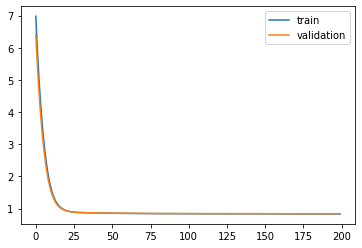

Time to train LSTM:  146.5918881893158
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 3s - loss: 4.7830 - pdc_loss: 0.7371 - event_loss: 0.6896 - val_loss: 4.4004 - val_pdc_loss: 0.7224 - val_event_loss: 0.6365

Epoch 00001: val_loss improved from inf to 4.40037, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 4.1442 - pdc_loss: 0.7163 - event_loss: 0.6169 - val_loss: 3.8128 - val_pdc_loss: 0.7031 - val_event_loss: 0.5730

Epoch 00002: val_loss improved from 4.40037 to 3.81275, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 3.5947 - pdc_loss: 0.6972 - event_loss: 0.5596 - val_loss: 3.3095 - val_pdc_loss: 0.6853 - val_event_loss: 0.5215

Epoch 00003: val_loss improved from 3.81275 to 3.30945, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 3.1252 - pdc_loss: 0.6796 - event_loss: 0.5122 - val_loss: 2.8812 - val_pdc_loss: 0.6691 - val_event_loss: 0.4783

Epoch 00004: val_loss improved from 3.30945 to 2.88117, saving m


Epoch 00035: val_loss improved from 0.86136 to 0.86039, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 0.8620 - pdc_loss: 0.5321 - event_loss: 0.3168 - val_loss: 0.8595 - val_pdc_loss: 0.5346 - val_event_loss: 0.3119

Epoch 00036: val_loss improved from 0.86039 to 0.85952, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 0.8611 - pdc_loss: 0.5315 - event_loss: 0.3167 - val_loss: 0.8586 - val_pdc_loss: 0.5340 - val_event_loss: 0.3118

Epoch 00037: val_loss improved from 0.85952 to 0.85857, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 0.8602 - pdc_loss: 0.5309 - event_loss: 0.3167 - val_loss: 0.8580 - val_pdc_loss: 0.5335 - val_event_loss: 0.3119

Epoch 00038: val_loss improved from 0.85857 to 0.85795, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 0.8593 - pdc_loss: 0.5302 - event_loss: 0.3166 - val_loss: 0.8572 - val_pdc_loss: 0.5330 - val_event_loss: 0.3118

Epoch 00039: val_loss improved from 0.85795 to 


Epoch 00070: val_loss improved from 0.84636 to 0.84609, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 0.8462 - pdc_loss: 0.5211 - event_loss: 0.3157 - val_loss: 0.8460 - val_pdc_loss: 0.5250 - val_event_loss: 0.3115

Epoch 00071: val_loss improved from 0.84609 to 0.84599, saving model to Event_val_weights1.hdf5
Epoch 72/200
 - 1s - loss: 0.8461 - pdc_loss: 0.5210 - event_loss: 0.3157 - val_loss: 0.8455 - val_pdc_loss: 0.5247 - val_event_loss: 0.3114

Epoch 00072: val_loss improved from 0.84599 to 0.84553, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.8458 - pdc_loss: 0.5207 - event_loss: 0.3157 - val_loss: 0.8455 - val_pdc_loss: 0.5246 - val_event_loss: 0.3115

Epoch 00073: val_loss improved from 0.84553 to 0.84552, saving model to Event_val_weights1.hdf5
Epoch 74/200
 - 1s - loss: 0.8456 - pdc_loss: 0.5206 - event_loss: 0.3157 - val_loss: 0.8451 - val_pdc_loss: 0.5243 - val_event_loss: 0.3114

Epoch 00074: val_loss improved from 0.84552 to 


Epoch 00107: val_loss improved from 0.84030 to 0.84017, saving model to Event_val_weights1.hdf5
Epoch 108/200
 - 1s - loss: 0.8396 - pdc_loss: 0.5163 - event_loss: 0.3148 - val_loss: 0.8401 - val_pdc_loss: 0.5208 - val_event_loss: 0.3108

Epoch 00108: val_loss improved from 0.84017 to 0.84007, saving model to Event_val_weights1.hdf5
Epoch 109/200
 - 1s - loss: 0.8395 - pdc_loss: 0.5162 - event_loss: 0.3148 - val_loss: 0.8398 - val_pdc_loss: 0.5207 - val_event_loss: 0.3107

Epoch 00109: val_loss improved from 0.84007 to 0.83979, saving model to Event_val_weights1.hdf5
Epoch 110/200
 - 1s - loss: 0.8394 - pdc_loss: 0.5162 - event_loss: 0.3148 - val_loss: 0.8400 - val_pdc_loss: 0.5208 - val_event_loss: 0.3107

Epoch 00110: val_loss did not improve from 0.83979
Epoch 111/200
 - 1s - loss: 0.8393 - pdc_loss: 0.5161 - event_loss: 0.3147 - val_loss: 0.8395 - val_pdc_loss: 0.5205 - val_event_loss: 0.3105

Epoch 00111: val_loss improved from 0.83979 to 0.83948, saving model to Event_val_weight


Epoch 00145: val_loss improved from 0.83592 to 0.83583, saving model to Event_val_weights1.hdf5
Epoch 146/200
 - 1s - loss: 0.8351 - pdc_loss: 0.5131 - event_loss: 0.3142 - val_loss: 0.8358 - val_pdc_loss: 0.5169 - val_event_loss: 0.3111

Epoch 00146: val_loss improved from 0.83583 to 0.83576, saving model to Event_val_weights1.hdf5
Epoch 147/200
 - 1s - loss: 0.8351 - pdc_loss: 0.5131 - event_loss: 0.3142 - val_loss: 0.8357 - val_pdc_loss: 0.5167 - val_event_loss: 0.3112

Epoch 00147: val_loss improved from 0.83576 to 0.83567, saving model to Event_val_weights1.hdf5
Epoch 148/200
 - 1s - loss: 0.8349 - pdc_loss: 0.5130 - event_loss: 0.3142 - val_loss: 0.8357 - val_pdc_loss: 0.5168 - val_event_loss: 0.3111

Epoch 00148: val_loss did not improve from 0.83567
Epoch 149/200
 - 1s - loss: 0.8349 - pdc_loss: 0.5130 - event_loss: 0.3142 - val_loss: 0.8356 - val_pdc_loss: 0.5167 - val_event_loss: 0.3112

Epoch 00149: val_loss improved from 0.83567 to 0.83559, saving model to Event_val_weight


Epoch 00183: val_loss did not improve from 0.83411
Epoch 184/200
 - 1s - loss: 0.8329 - pdc_loss: 0.5119 - event_loss: 0.3137 - val_loss: 0.8343 - val_pdc_loss: 0.5158 - val_event_loss: 0.3112

Epoch 00184: val_loss did not improve from 0.83411
Epoch 185/200
 - 1s - loss: 0.8329 - pdc_loss: 0.5119 - event_loss: 0.3137 - val_loss: 0.8340 - val_pdc_loss: 0.5158 - val_event_loss: 0.3109

Epoch 00185: val_loss improved from 0.83411 to 0.83403, saving model to Event_val_weights1.hdf5
Epoch 186/200
 - 1s - loss: 0.8328 - pdc_loss: 0.5119 - event_loss: 0.3137 - val_loss: 0.8341 - val_pdc_loss: 0.5159 - val_event_loss: 0.3110

Epoch 00186: val_loss did not improve from 0.83403
Epoch 187/200
 - 1s - loss: 0.8328 - pdc_loss: 0.5119 - event_loss: 0.3137 - val_loss: 0.8337 - val_pdc_loss: 0.5157 - val_event_loss: 0.3107

Epoch 00187: val_loss improved from 0.83403 to 0.83366, saving model to Event_val_weights1.hdf5
Epoch 188/200
 - 1s - loss: 0.8327 - pdc_loss: 0.5118 - event_loss: 0.3136 - val_l

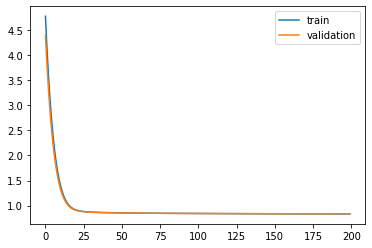

Time to train LSTM:  144.6938500404358


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f6a7415ea90>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 3s - loss: 4.8570 - pdc_loss: 0.7648 - event_loss: 0.6748 - val_loss: 4.4628 - val_pdc_loss: 0.7352 - val_event_loss: 0.6276

Epoch 00001: val_loss improved from inf to 4.46276, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 4.1930 - pdc_loss: 0.7213 - event_loss: 0.6049 - val_loss: 3.8568 - val_pdc_loss: 0.6994 - val_event_loss: 0.5685

Epoch 00002: val_loss improved from 4.46276 to 3.85683, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 3.6252 - pdc_loss: 0.6882 - event_loss: 0.5504 - val_loss: 3.3410 - val_pdc_loss: 0.6722 - val_event_loss: 0.5218

Epoch 00003: val_loss improved from 3.85683 to 3.34096, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 3.1432 - pdc_loss: 0.6628 - event_loss: 0.5061 - val_loss: 2.9046 - val_pdc_loss: 0.6507 - val_event_loss: 0.4833

Epoch 00004: val_loss improved from 3.34096 to 2.90463, saving model to Event_val_weights2.hdf5
Epoch 5


Epoch 00035: val_loss improved from 0.87544 to 0.87473, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 0.8612 - pdc_loss: 0.5317 - event_loss: 0.3163 - val_loss: 0.8738 - val_pdc_loss: 0.5384 - val_event_loss: 0.3224

Epoch 00036: val_loss improved from 0.87473 to 0.87376, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 0.8603 - pdc_loss: 0.5311 - event_loss: 0.3163 - val_loss: 0.8730 - val_pdc_loss: 0.5378 - val_event_loss: 0.3224

Epoch 00037: val_loss improved from 0.87376 to 0.87303, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 0.8594 - pdc_loss: 0.5305 - event_loss: 0.3162 - val_loss: 0.8722 - val_pdc_loss: 0.5371 - val_event_loss: 0.3224

Epoch 00038: val_loss improved from 0.87303 to 0.87221, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 0.8585 - pdc_loss: 0.5298 - event_loss: 0.3162 - val_loss: 0.8713 - val_pdc_loss: 0.5364 - val_event_loss: 0.3224

Epoch 00039: val_loss improved from 0.87221 to 

 - 1s - loss: 0.8405 - pdc_loss: 0.5167 - event_loss: 0.3146 - val_loss: 0.8580 - val_pdc_loss: 0.5277 - val_event_loss: 0.3211

Epoch 00070: val_loss did not improve from 0.85798
Epoch 71/200
 - 1s - loss: 0.8402 - pdc_loss: 0.5166 - event_loss: 0.3146 - val_loss: 0.8579 - val_pdc_loss: 0.5277 - val_event_loss: 0.3211

Epoch 00071: val_loss improved from 0.85798 to 0.85789, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.8400 - pdc_loss: 0.5164 - event_loss: 0.3145 - val_loss: 0.8577 - val_pdc_loss: 0.5276 - val_event_loss: 0.3211

Epoch 00072: val_loss improved from 0.85789 to 0.85774, saving model to Event_val_weights2.hdf5
Epoch 73/200
 - 1s - loss: 0.8398 - pdc_loss: 0.5163 - event_loss: 0.3145 - val_loss: 0.8576 - val_pdc_loss: 0.5275 - val_event_loss: 0.3211

Epoch 00073: val_loss improved from 0.85774 to 0.85764, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.8396 - pdc_loss: 0.5161 - event_loss: 0.3144 - val_loss: 0.8575 - val_pdc_los


Epoch 00106: val_loss improved from 0.85509 to 0.85499, saving model to Event_val_weights2.hdf5
Epoch 107/200
 - 1s - loss: 0.8347 - pdc_loss: 0.5130 - event_loss: 0.3133 - val_loss: 0.8550 - val_pdc_loss: 0.5260 - val_event_loss: 0.3208

Epoch 00107: val_loss did not improve from 0.85499
Epoch 108/200
 - 1s - loss: 0.8345 - pdc_loss: 0.5129 - event_loss: 0.3133 - val_loss: 0.8549 - val_pdc_loss: 0.5258 - val_event_loss: 0.3208

Epoch 00108: val_loss improved from 0.85499 to 0.85493, saving model to Event_val_weights2.hdf5
Epoch 109/200
 - 1s - loss: 0.8344 - pdc_loss: 0.5129 - event_loss: 0.3133 - val_loss: 0.8548 - val_pdc_loss: 0.5258 - val_event_loss: 0.3207

Epoch 00109: val_loss improved from 0.85493 to 0.85476, saving model to Event_val_weights2.hdf5
Epoch 110/200
 - 1s - loss: 0.8343 - pdc_loss: 0.5128 - event_loss: 0.3133 - val_loss: 0.8547 - val_pdc_loss: 0.5257 - val_event_loss: 0.3207

Epoch 00110: val_loss improved from 0.85476 to 0.85468, saving model to Event_val_weight


Epoch 00144: val_loss did not improve from 0.85313
Epoch 145/200
 - 1s - loss: 0.8319 - pdc_loss: 0.5114 - event_loss: 0.3127 - val_loss: 0.8534 - val_pdc_loss: 0.5250 - val_event_loss: 0.3206

Epoch 00145: val_loss did not improve from 0.85313
Epoch 146/200
 - 1s - loss: 0.8318 - pdc_loss: 0.5113 - event_loss: 0.3127 - val_loss: 0.8532 - val_pdc_loss: 0.5249 - val_event_loss: 0.3206

Epoch 00146: val_loss did not improve from 0.85313
Epoch 147/200
 - 1s - loss: 0.8318 - pdc_loss: 0.5113 - event_loss: 0.3127 - val_loss: 0.8533 - val_pdc_loss: 0.5249 - val_event_loss: 0.3207

Epoch 00147: val_loss did not improve from 0.85313
Epoch 148/200
 - 1s - loss: 0.8317 - pdc_loss: 0.5113 - event_loss: 0.3127 - val_loss: 0.8533 - val_pdc_loss: 0.5248 - val_event_loss: 0.3207

Epoch 00148: val_loss did not improve from 0.85313
Epoch 149/200
 - 1s - loss: 0.8317 - pdc_loss: 0.5113 - event_loss: 0.3127 - val_loss: 0.8532 - val_pdc_loss: 0.5248 - val_event_loss: 0.3207

Epoch 00149: val_loss did not


Epoch 00186: val_loss did not improve from 0.85242
Epoch 187/200
 - 1s - loss: 0.8301 - pdc_loss: 0.5104 - event_loss: 0.3123 - val_loss: 0.8527 - val_pdc_loss: 0.5247 - val_event_loss: 0.3206

Epoch 00187: val_loss did not improve from 0.85242
Epoch 188/200
 - 1s - loss: 0.8300 - pdc_loss: 0.5104 - event_loss: 0.3123 - val_loss: 0.8528 - val_pdc_loss: 0.5248 - val_event_loss: 0.3207

Epoch 00188: val_loss did not improve from 0.85242
Epoch 189/200
 - 1s - loss: 0.8300 - pdc_loss: 0.5104 - event_loss: 0.3123 - val_loss: 0.8528 - val_pdc_loss: 0.5247 - val_event_loss: 0.3208

Epoch 00189: val_loss did not improve from 0.85242
Epoch 190/200
 - 1s - loss: 0.8299 - pdc_loss: 0.5103 - event_loss: 0.3123 - val_loss: 0.8528 - val_pdc_loss: 0.5247 - val_event_loss: 0.3208

Epoch 00190: val_loss did not improve from 0.85242
Epoch 191/200
 - 1s - loss: 0.8299 - pdc_loss: 0.5103 - event_loss: 0.3123 - val_loss: 0.8528 - val_pdc_loss: 0.5247 - val_event_loss: 0.3208

Epoch 00191: val_loss did not

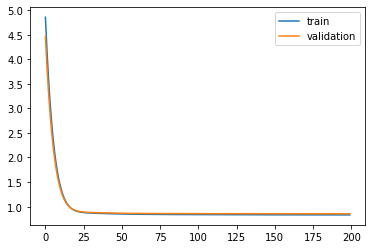

Time to train LSTM:  146.47467613220215
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 3s - loss: 4.6950 - pdc_loss: 0.6966 - event_loss: 0.6555 - val_loss: 4.3393 - val_pdc_loss: 0.6889 - val_event_loss: 0.6275

Epoch 00001: val_loss improved from inf to 4.33930, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 4.0793 - pdc_loss: 0.6864 - event_loss: 0.6041 - val_loss: 3.7729 - val_pdc_loss: 0.6807 - val_event_loss: 0.5814

Epoch 00002: val_loss improved from 4.33930 to 3.77294, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 3.5495 - pdc_loss: 0.6783 - event_loss: 0.5613 - val_loss: 3.2880 - val_pdc_loss: 0.6739 - val_event_loss: 0.5417

Epoch 00003: val_loss improved from 3.77294 to 3.28803, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 3.0971 - pdc_loss: 0.6711 - event_loss: 0.5239 - val_loss: 2.8757 - val_pdc_loss: 0.6674 - val_event_loss: 0.5065

Epoch 00004: val_loss improved from 3.28803 to 2.87566, saving 


Epoch 00035: val_loss improved from 0.88614 to 0.88530, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 0.8623 - pdc_loss: 0.5330 - event_loss: 0.3169 - val_loss: 0.8846 - val_pdc_loss: 0.5486 - val_event_loss: 0.3238

Epoch 00036: val_loss improved from 0.88530 to 0.88458, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 0.8614 - pdc_loss: 0.5324 - event_loss: 0.3169 - val_loss: 0.8838 - val_pdc_loss: 0.5479 - val_event_loss: 0.3239

Epoch 00037: val_loss improved from 0.88458 to 0.88381, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 0.8606 - pdc_loss: 0.5316 - event_loss: 0.3170 - val_loss: 0.8832 - val_pdc_loss: 0.5474 - val_event_loss: 0.3239

Epoch 00038: val_loss improved from 0.88381 to 0.88324, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 0.8598 - pdc_loss: 0.5310 - event_loss: 0.3170 - val_loss: 0.8826 - val_pdc_loss: 0.5469 - val_event_loss: 0.3240

Epoch 00039: val_loss improved from 0.88324 to 

 - 1s - loss: 0.8436 - pdc_loss: 0.5179 - event_loss: 0.3162 - val_loss: 0.8683 - val_pdc_loss: 0.5353 - val_event_loss: 0.3237

Epoch 00070: val_loss improved from 0.86882 to 0.86830, saving model to Event_val_weights3.hdf5
Epoch 71/200
 - 1s - loss: 0.8431 - pdc_loss: 0.5176 - event_loss: 0.3161 - val_loss: 0.8683 - val_pdc_loss: 0.5353 - val_event_loss: 0.3237

Epoch 00071: val_loss improved from 0.86830 to 0.86830, saving model to Event_val_weights3.hdf5
Epoch 72/200
 - 1s - loss: 0.8427 - pdc_loss: 0.5174 - event_loss: 0.3160 - val_loss: 0.8680 - val_pdc_loss: 0.5352 - val_event_loss: 0.3236

Epoch 00072: val_loss improved from 0.86830 to 0.86798, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.8424 - pdc_loss: 0.5172 - event_loss: 0.3159 - val_loss: 0.8678 - val_pdc_loss: 0.5350 - val_event_loss: 0.3236

Epoch 00073: val_loss improved from 0.86798 to 0.86782, saving model to Event_val_weights3.hdf5
Epoch 74/200
 - 1s - loss: 0.8420 - pdc_loss: 0.5170 - event_

 - 1s - loss: 0.8362 - pdc_loss: 0.5136 - event_loss: 0.3143 - val_loss: 0.8646 - val_pdc_loss: 0.5329 - val_event_loss: 0.3234

Epoch 00106: val_loss improved from 0.86483 to 0.86461, saving model to Event_val_weights3.hdf5
Epoch 107/200
 - 1s - loss: 0.8360 - pdc_loss: 0.5135 - event_loss: 0.3142 - val_loss: 0.8646 - val_pdc_loss: 0.5329 - val_event_loss: 0.3234

Epoch 00107: val_loss did not improve from 0.86461
Epoch 108/200
 - 1s - loss: 0.8359 - pdc_loss: 0.5135 - event_loss: 0.3142 - val_loss: 0.8647 - val_pdc_loss: 0.5329 - val_event_loss: 0.3235

Epoch 00108: val_loss did not improve from 0.86461
Epoch 109/200
 - 1s - loss: 0.8358 - pdc_loss: 0.5134 - event_loss: 0.3141 - val_loss: 0.8643 - val_pdc_loss: 0.5327 - val_event_loss: 0.3234

Epoch 00109: val_loss improved from 0.86461 to 0.86433, saving model to Event_val_weights3.hdf5
Epoch 110/200
 - 1s - loss: 0.8357 - pdc_loss: 0.5133 - event_loss: 0.3141 - val_loss: 0.8644 - val_pdc_loss: 0.5327 - val_event_loss: 0.3234

Epoch


Epoch 00143: val_loss did not improve from 0.86262
Epoch 144/200
 - 1s - loss: 0.8326 - pdc_loss: 0.5117 - event_loss: 0.3131 - val_loss: 0.8626 - val_pdc_loss: 0.5319 - val_event_loss: 0.3229

Epoch 00144: val_loss improved from 0.86262 to 0.86257, saving model to Event_val_weights3.hdf5
Epoch 145/200
 - 1s - loss: 0.8324 - pdc_loss: 0.5116 - event_loss: 0.3131 - val_loss: 0.8624 - val_pdc_loss: 0.5318 - val_event_loss: 0.3229

Epoch 00145: val_loss improved from 0.86257 to 0.86242, saving model to Event_val_weights3.hdf5
Epoch 146/200
 - 1s - loss: 0.8324 - pdc_loss: 0.5116 - event_loss: 0.3130 - val_loss: 0.8624 - val_pdc_loss: 0.5317 - val_event_loss: 0.3230

Epoch 00146: val_loss improved from 0.86242 to 0.86242, saving model to Event_val_weights3.hdf5
Epoch 147/200
 - 1s - loss: 0.8323 - pdc_loss: 0.5116 - event_loss: 0.3130 - val_loss: 0.8623 - val_pdc_loss: 0.5315 - val_event_loss: 0.3230

Epoch 00147: val_loss improved from 0.86242 to 0.86227, saving model to Event_val_weight


Epoch 00182: val_loss did not improve from 0.86138
Epoch 183/200
 - 1s - loss: 0.8300 - pdc_loss: 0.5104 - event_loss: 0.3123 - val_loss: 0.8613 - val_pdc_loss: 0.5314 - val_event_loss: 0.3226

Epoch 00183: val_loss improved from 0.86138 to 0.86135, saving model to Event_val_weights3.hdf5
Epoch 184/200
 - 1s - loss: 0.8300 - pdc_loss: 0.5104 - event_loss: 0.3123 - val_loss: 0.8614 - val_pdc_loss: 0.5314 - val_event_loss: 0.3226

Epoch 00184: val_loss did not improve from 0.86135
Epoch 185/200
 - 1s - loss: 0.8300 - pdc_loss: 0.5104 - event_loss: 0.3122 - val_loss: 0.8614 - val_pdc_loss: 0.5314 - val_event_loss: 0.3227

Epoch 00185: val_loss did not improve from 0.86135
Epoch 186/200
 - 1s - loss: 0.8300 - pdc_loss: 0.5104 - event_loss: 0.3123 - val_loss: 0.8614 - val_pdc_loss: 0.5313 - val_event_loss: 0.3228

Epoch 00186: val_loss did not improve from 0.86135
Epoch 187/200
 - 1s - loss: 0.8299 - pdc_loss: 0.5104 - event_loss: 0.3122 - val_loss: 0.8611 - val_pdc_loss: 0.5311 - val_even

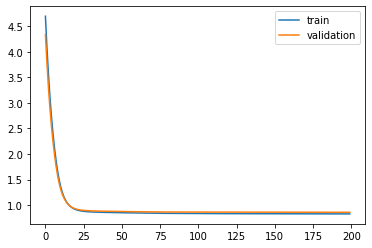

Time to train LSTM:  146.15594935417175
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 4s - loss: 4.9128 - pdc_loss: 0.7463 - event_loss: 0.7599 - val_loss: 4.5253 - val_pdc_loss: 0.7301 - val_event_loss: 0.7028

Epoch 00001: val_loss improved from inf to 4.52527, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 4.2430 - pdc_loss: 0.7129 - event_loss: 0.6697 - val_loss: 3.9168 - val_pdc_loss: 0.7030 - val_event_loss: 0.6300

Epoch 00002: val_loss improved from 4.52527 to 3.91684, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 3.6748 - pdc_loss: 0.6871 - event_loss: 0.6055 - val_loss: 3.4006 - val_pdc_loss: 0.6811 - val_event_loss: 0.5763

Epoch 00003: val_loss improved from 3.91684 to 3.40059, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 3.1928 - pdc_loss: 0.6663 - event_loss: 0.5557 - val_loss: 2.9623 - val_pdc_loss: 0.6625 - val_event_loss: 0.5325

Epoch 00004: val_loss improved from 3.40059 to 2.96232, saving 


Epoch 00035: val_loss improved from 0.88993 to 0.88923, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 0.8616 - pdc_loss: 0.5319 - event_loss: 0.3165 - val_loss: 0.8885 - val_pdc_loss: 0.5482 - val_event_loss: 0.3273

Epoch 00036: val_loss improved from 0.88923 to 0.88850, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 0.8606 - pdc_loss: 0.5313 - event_loss: 0.3164 - val_loss: 0.8879 - val_pdc_loss: 0.5478 - val_event_loss: 0.3274

Epoch 00037: val_loss improved from 0.88850 to 0.88794, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 0.8597 - pdc_loss: 0.5307 - event_loss: 0.3163 - val_loss: 0.8873 - val_pdc_loss: 0.5474 - val_event_loss: 0.3273

Epoch 00038: val_loss improved from 0.88794 to 0.88730, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 0.8589 - pdc_loss: 0.5301 - event_loss: 0.3163 - val_loss: 0.8868 - val_pdc_loss: 0.5471 - val_event_loss: 0.3274

Epoch 00039: val_loss improved from 0.88730 to 

 - 1s - loss: 0.8453 - pdc_loss: 0.5208 - event_loss: 0.3153 - val_loss: 0.8789 - val_pdc_loss: 0.5432 - val_event_loss: 0.3266

Epoch 00070: val_loss improved from 0.87910 to 0.87889, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.8450 - pdc_loss: 0.5207 - event_loss: 0.3153 - val_loss: 0.8787 - val_pdc_loss: 0.5432 - val_event_loss: 0.3266

Epoch 00071: val_loss improved from 0.87889 to 0.87874, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.8448 - pdc_loss: 0.5206 - event_loss: 0.3153 - val_loss: 0.8785 - val_pdc_loss: 0.5431 - val_event_loss: 0.3265

Epoch 00072: val_loss improved from 0.87874 to 0.87850, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.8446 - pdc_loss: 0.5205 - event_loss: 0.3152 - val_loss: 0.8784 - val_pdc_loss: 0.5430 - val_event_loss: 0.3266

Epoch 00073: val_loss improved from 0.87850 to 0.87844, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.8443 - pdc_loss: 0.5203 - event_

 - 1s - loss: 0.8390 - pdc_loss: 0.5170 - event_loss: 0.3142 - val_loss: 0.8722 - val_pdc_loss: 0.5384 - val_event_loss: 0.3260

Epoch 00105: val_loss did not improve from 0.87222
Epoch 106/200
 - 1s - loss: 0.8388 - pdc_loss: 0.5169 - event_loss: 0.3142 - val_loss: 0.8719 - val_pdc_loss: 0.5382 - val_event_loss: 0.3259

Epoch 00106: val_loss improved from 0.87222 to 0.87188, saving model to Event_val_weights4.hdf5
Epoch 107/200
 - 1s - loss: 0.8387 - pdc_loss: 0.5168 - event_loss: 0.3141 - val_loss: 0.8719 - val_pdc_loss: 0.5381 - val_event_loss: 0.3260

Epoch 00107: val_loss did not improve from 0.87188
Epoch 108/200
 - 1s - loss: 0.8385 - pdc_loss: 0.5167 - event_loss: 0.3141 - val_loss: 0.8716 - val_pdc_loss: 0.5379 - val_event_loss: 0.3260

Epoch 00108: val_loss improved from 0.87188 to 0.87157, saving model to Event_val_weights4.hdf5
Epoch 109/200
 - 1s - loss: 0.8385 - pdc_loss: 0.5166 - event_loss: 0.3141 - val_loss: 0.8716 - val_pdc_loss: 0.5379 - val_event_loss: 0.3260

Epoch


Epoch 00142: val_loss improved from 0.86857 to 0.86842, saving model to Event_val_weights4.hdf5
Epoch 143/200
 - 1s - loss: 0.8342 - pdc_loss: 0.5139 - event_loss: 0.3131 - val_loss: 0.8685 - val_pdc_loss: 0.5350 - val_event_loss: 0.3261

Epoch 00143: val_loss did not improve from 0.86842
Epoch 144/200
 - 1s - loss: 0.8341 - pdc_loss: 0.5138 - event_loss: 0.3130 - val_loss: 0.8683 - val_pdc_loss: 0.5349 - val_event_loss: 0.3262

Epoch 00144: val_loss improved from 0.86842 to 0.86833, saving model to Event_val_weights4.hdf5
Epoch 145/200
 - 1s - loss: 0.8340 - pdc_loss: 0.5137 - event_loss: 0.3130 - val_loss: 0.8684 - val_pdc_loss: 0.5349 - val_event_loss: 0.3261

Epoch 00145: val_loss did not improve from 0.86833
Epoch 146/200
 - 1s - loss: 0.8339 - pdc_loss: 0.5136 - event_loss: 0.3130 - val_loss: 0.8682 - val_pdc_loss: 0.5348 - val_event_loss: 0.3261

Epoch 00146: val_loss improved from 0.86833 to 0.86823, saving model to Event_val_weights4.hdf5
Epoch 147/200
 - 1s - loss: 0.8338 - 

 - 1s - loss: 0.8310 - pdc_loss: 0.5118 - event_loss: 0.3122 - val_loss: 0.8664 - val_pdc_loss: 0.5333 - val_event_loss: 0.3261

Epoch 00180: val_loss improved from 0.86643 to 0.86637, saving model to Event_val_weights4.hdf5
Epoch 181/200
 - 1s - loss: 0.8309 - pdc_loss: 0.5117 - event_loss: 0.3122 - val_loss: 0.8667 - val_pdc_loss: 0.5336 - val_event_loss: 0.3261

Epoch 00181: val_loss did not improve from 0.86637
Epoch 182/200
 - 1s - loss: 0.8308 - pdc_loss: 0.5117 - event_loss: 0.3122 - val_loss: 0.8663 - val_pdc_loss: 0.5333 - val_event_loss: 0.3261

Epoch 00182: val_loss improved from 0.86637 to 0.86631, saving model to Event_val_weights4.hdf5
Epoch 183/200
 - 1s - loss: 0.8307 - pdc_loss: 0.5116 - event_loss: 0.3122 - val_loss: 0.8665 - val_pdc_loss: 0.5336 - val_event_loss: 0.3261

Epoch 00183: val_loss did not improve from 0.86631
Epoch 184/200
 - 1s - loss: 0.8307 - pdc_loss: 0.5116 - event_loss: 0.3122 - val_loss: 0.8663 - val_pdc_loss: 0.5333 - val_event_loss: 0.3261

Epoch

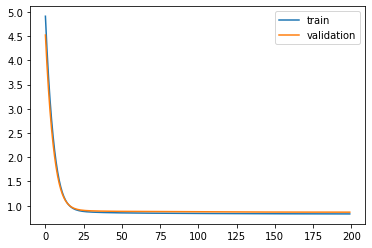

Time to train LSTM:  147.77069854736328


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f6a64d05fd0>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 5s - loss: 4.8774 - pdc_loss: 0.7094 - event_loss: 0.7462 - val_loss: 4.5015 - val_pdc_loss: 0.7013 - val_event_loss: 0.6942

Epoch 00001: val_loss improved from inf to 4.50149, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 4.2281 - pdc_loss: 0.6970 - event_loss: 0.6573 - val_loss: 3.9089 - val_pdc_loss: 0.6902 - val_event_loss: 0.6217

Epoch 00002: val_loss improved from 4.50149 to 3.90893, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 3.6771 - pdc_loss: 0.6870 - event_loss: 0.5945 - val_loss: 3.4062 - val_pdc_loss: 0.6810 - val_event_loss: 0.5684

Epoch 00003: val_loss improved from 3.90893 to 3.40621, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 3.2092 - pdc_loss: 0.6783 - event_loss: 0.5465 - val_loss: 2.9789 - val_pdc_loss: 0.6728 - val_event_loss: 0.5252

Epoch 00004: val_loss improved from 3.40621 to 2.97888, saving model to Event_val_weights5.hdf5
Epoch 5


Epoch 00035: val_loss improved from 0.87309 to 0.87188, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 0.8691 - pdc_loss: 0.5381 - event_loss: 0.3176 - val_loss: 0.8707 - val_pdc_loss: 0.5396 - val_event_loss: 0.3179

Epoch 00036: val_loss improved from 0.87188 to 0.87074, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 0.8679 - pdc_loss: 0.5371 - event_loss: 0.3176 - val_loss: 0.8697 - val_pdc_loss: 0.5387 - val_event_loss: 0.3179

Epoch 00037: val_loss improved from 0.87074 to 0.86969, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 0.8667 - pdc_loss: 0.5361 - event_loss: 0.3176 - val_loss: 0.8687 - val_pdc_loss: 0.5378 - val_event_loss: 0.3179

Epoch 00038: val_loss improved from 0.86969 to 0.86870, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 0.8657 - pdc_loss: 0.5352 - event_loss: 0.3176 - val_loss: 0.8678 - val_pdc_loss: 0.5370 - val_event_loss: 0.3179

Epoch 00039: val_loss improved from 0.86870 to 

 - 1s - loss: 0.8486 - pdc_loss: 0.5220 - event_loss: 0.3167 - val_loss: 0.8524 - val_pdc_loss: 0.5254 - val_event_loss: 0.3172

Epoch 00070: val_loss improved from 0.85261 to 0.85235, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.8483 - pdc_loss: 0.5218 - event_loss: 0.3167 - val_loss: 0.8521 - val_pdc_loss: 0.5252 - val_event_loss: 0.3172

Epoch 00071: val_loss improved from 0.85235 to 0.85210, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8480 - pdc_loss: 0.5217 - event_loss: 0.3166 - val_loss: 0.8518 - val_pdc_loss: 0.5250 - val_event_loss: 0.3171

Epoch 00072: val_loss improved from 0.85210 to 0.85181, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8478 - pdc_loss: 0.5215 - event_loss: 0.3166 - val_loss: 0.8516 - val_pdc_loss: 0.5249 - val_event_loss: 0.3171

Epoch 00073: val_loss improved from 0.85181 to 0.85163, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8475 - pdc_loss: 0.5214 - event_


Epoch 00104: val_loss improved from 0.84635 to 0.84627, saving model to Event_val_weights5.hdf5
Epoch 105/200
 - 1s - loss: 0.8421 - pdc_loss: 0.5181 - event_loss: 0.3157 - val_loss: 0.8462 - val_pdc_loss: 0.5214 - val_event_loss: 0.3165

Epoch 00105: val_loss improved from 0.84627 to 0.84617, saving model to Event_val_weights5.hdf5
Epoch 106/200
 - 1s - loss: 0.8420 - pdc_loss: 0.5181 - event_loss: 0.3156 - val_loss: 0.8460 - val_pdc_loss: 0.5212 - val_event_loss: 0.3166

Epoch 00106: val_loss improved from 0.84617 to 0.84603, saving model to Event_val_weights5.hdf5
Epoch 107/200
 - 1s - loss: 0.8419 - pdc_loss: 0.5180 - event_loss: 0.3156 - val_loss: 0.8458 - val_pdc_loss: 0.5211 - val_event_loss: 0.3165

Epoch 00107: val_loss improved from 0.84603 to 0.84585, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.8418 - pdc_loss: 0.5179 - event_loss: 0.3156 - val_loss: 0.8458 - val_pdc_loss: 0.5211 - val_event_loss: 0.3165

Epoch 00108: val_loss improved from 0.84585


Epoch 00140: val_loss did not improve from 0.84410
Epoch 141/200
 - 1s - loss: 0.8386 - pdc_loss: 0.5159 - event_loss: 0.3150 - val_loss: 0.8441 - val_pdc_loss: 0.5201 - val_event_loss: 0.3164

Epoch 00141: val_loss did not improve from 0.84410
Epoch 142/200
 - 1s - loss: 0.8385 - pdc_loss: 0.5159 - event_loss: 0.3150 - val_loss: 0.8440 - val_pdc_loss: 0.5200 - val_event_loss: 0.3163

Epoch 00142: val_loss improved from 0.84410 to 0.84395, saving model to Event_val_weights5.hdf5
Epoch 143/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5158 - event_loss: 0.3150 - val_loss: 0.8440 - val_pdc_loss: 0.5201 - val_event_loss: 0.3163

Epoch 00143: val_loss did not improve from 0.84395
Epoch 144/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5158 - event_loss: 0.3150 - val_loss: 0.8439 - val_pdc_loss: 0.5200 - val_event_loss: 0.3163

Epoch 00144: val_loss improved from 0.84395 to 0.84394, saving model to Event_val_weights5.hdf5
Epoch 145/200
 - 1s - loss: 0.8382 - pdc_loss: 0.5157 - event_loss: 0.3149 - val_l

 - 1s - loss: 0.8362 - pdc_loss: 0.5143 - event_loss: 0.3146 - val_loss: 0.8429 - val_pdc_loss: 0.5195 - val_event_loss: 0.3161

Epoch 00179: val_loss did not improve from 0.84288
Epoch 180/200
 - 1s - loss: 0.8361 - pdc_loss: 0.5143 - event_loss: 0.3146 - val_loss: 0.8428 - val_pdc_loss: 0.5194 - val_event_loss: 0.3161

Epoch 00180: val_loss improved from 0.84288 to 0.84284, saving model to Event_val_weights5.hdf5
Epoch 181/200
 - 1s - loss: 0.8361 - pdc_loss: 0.5142 - event_loss: 0.3146 - val_loss: 0.8429 - val_pdc_loss: 0.5195 - val_event_loss: 0.3161

Epoch 00181: val_loss did not improve from 0.84284
Epoch 182/200
 - 1s - loss: 0.8360 - pdc_loss: 0.5142 - event_loss: 0.3146 - val_loss: 0.8428 - val_pdc_loss: 0.5195 - val_event_loss: 0.3161

Epoch 00182: val_loss improved from 0.84284 to 0.84283, saving model to Event_val_weights5.hdf5
Epoch 183/200
 - 1s - loss: 0.8360 - pdc_loss: 0.5141 - event_loss: 0.3146 - val_loss: 0.8428 - val_pdc_loss: 0.5195 - val_event_loss: 0.3161

Epoch

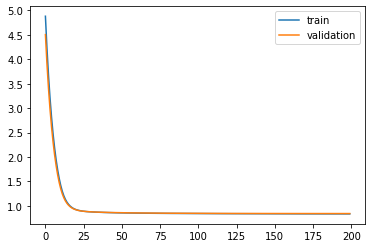

Time to train LSTM:  151.40360522270203
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 18s - loss: 6.1205 - pdc_loss: 0.7124 - event_loss: 0.6590 - val_loss: 5.6196 - val_pdc_loss: 0.7009 - val_event_loss: 0.6272

Epoch 00001: val_loss improved from inf to 5.61955, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 5.2643 - pdc_loss: 0.6904 - event_loss: 0.6160 - val_loss: 4.8283 - val_pdc_loss: 0.6814 - val_event_loss: 0.5846

Epoch 00002: val_loss improved from 5.61955 to 4.82825, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 4.5246 - pdc_loss: 0.6719 - event_loss: 0.5757 - val_loss: 4.1493 - val_pdc_loss: 0.6650 - val_event_loss: 0.5439

Epoch 00003: val_loss improved from 4.82825 to 4.14926, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 3.8925 - pdc_loss: 0.6566 - event_loss: 0.5365 - val_loss: 3.5715 - val_pdc_loss: 0.6512 - val_event_loss: 0.5045

Epoch 00004: val_loss improved from 4.14926 to 3.57148, saving


Epoch 00035: val_loss improved from 0.86344 to 0.86247, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 0.8643 - pdc_loss: 0.5329 - event_loss: 0.3182 - val_loss: 0.8614 - val_pdc_loss: 0.5353 - val_event_loss: 0.3130

Epoch 00036: val_loss improved from 0.86247 to 0.86136, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 0.8633 - pdc_loss: 0.5322 - event_loss: 0.3181 - val_loss: 0.8604 - val_pdc_loss: 0.5346 - val_event_loss: 0.3129

Epoch 00037: val_loss improved from 0.86136 to 0.86044, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 0.8623 - pdc_loss: 0.5316 - event_loss: 0.3180 - val_loss: 0.8596 - val_pdc_loss: 0.5340 - val_event_loss: 0.3128

Epoch 00038: val_loss improved from 0.86044 to 0.85959, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 0.8615 - pdc_loss: 0.5309 - event_loss: 0.3179 - val_loss: 0.8588 - val_pdc_loss: 0.5335 - val_event_loss: 0.3127

Epoch 00039: val_loss improved from 0.85959 to 


Epoch 00070: val_loss improved from 0.84802 to 0.84782, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 0.8484 - pdc_loss: 0.5222 - event_loss: 0.3164 - val_loss: 0.8473 - val_pdc_loss: 0.5264 - val_event_loss: 0.3112

Epoch 00071: val_loss improved from 0.84782 to 0.84734, saving model to Event_val_weights1.hdf5
Epoch 72/200
 - 1s - loss: 0.8482 - pdc_loss: 0.5221 - event_loss: 0.3164 - val_loss: 0.8473 - val_pdc_loss: 0.5263 - val_event_loss: 0.3113

Epoch 00072: val_loss improved from 0.84734 to 0.84729, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.8479 - pdc_loss: 0.5219 - event_loss: 0.3163 - val_loss: 0.8474 - val_pdc_loss: 0.5264 - val_event_loss: 0.3114

Epoch 00073: val_loss did not improve from 0.84729
Epoch 74/200
 - 1s - loss: 0.8477 - pdc_loss: 0.5218 - event_loss: 0.3163 - val_loss: 0.8471 - val_pdc_loss: 0.5260 - val_event_loss: 0.3115

Epoch 00074: val_loss improved from 0.84729 to 0.84709, saving model to Event_val_weights1.h

 - 1s - loss: 0.8422 - pdc_loss: 0.5183 - event_loss: 0.3153 - val_loss: 0.8437 - val_pdc_loss: 0.5239 - val_event_loss: 0.3113

Epoch 00108: val_loss did not improve from 0.84366
Epoch 109/200
 - 1s - loss: 0.8421 - pdc_loss: 0.5183 - event_loss: 0.3153 - val_loss: 0.8435 - val_pdc_loss: 0.5240 - val_event_loss: 0.3110

Epoch 00109: val_loss improved from 0.84366 to 0.84346, saving model to Event_val_weights1.hdf5
Epoch 110/200
 - 1s - loss: 0.8420 - pdc_loss: 0.5182 - event_loss: 0.3153 - val_loss: 0.8437 - val_pdc_loss: 0.5238 - val_event_loss: 0.3115

Epoch 00110: val_loss did not improve from 0.84346
Epoch 111/200
 - 1s - loss: 0.8419 - pdc_loss: 0.5181 - event_loss: 0.3153 - val_loss: 0.8432 - val_pdc_loss: 0.5238 - val_event_loss: 0.3110

Epoch 00111: val_loss improved from 0.84346 to 0.84322, saving model to Event_val_weights1.hdf5
Epoch 112/200
 - 1s - loss: 0.8418 - pdc_loss: 0.5181 - event_loss: 0.3153 - val_loss: 0.8433 - val_pdc_loss: 0.5236 - val_event_loss: 0.3113

Epoch

 - 1s - loss: 0.8386 - pdc_loss: 0.5159 - event_loss: 0.3150 - val_loss: 0.8408 - val_pdc_loss: 0.5223 - val_event_loss: 0.3107

Epoch 00147: val_loss did not improve from 0.84068
Epoch 148/200
 - 1s - loss: 0.8385 - pdc_loss: 0.5158 - event_loss: 0.3150 - val_loss: 0.8411 - val_pdc_loss: 0.5222 - val_event_loss: 0.3112

Epoch 00148: val_loss did not improve from 0.84068
Epoch 149/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5158 - event_loss: 0.3149 - val_loss: 0.8405 - val_pdc_loss: 0.5221 - val_event_loss: 0.3107

Epoch 00149: val_loss improved from 0.84068 to 0.84049, saving model to Event_val_weights1.hdf5
Epoch 150/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5158 - event_loss: 0.3149 - val_loss: 0.8412 - val_pdc_loss: 0.5222 - val_event_loss: 0.3113

Epoch 00150: val_loss did not improve from 0.84049
Epoch 151/200
 - 1s - loss: 0.8383 - pdc_loss: 0.5158 - event_loss: 0.3149 - val_loss: 0.8406 - val_pdc_loss: 0.5221 - val_event_loss: 0.3108

Epoch 00151: val_loss did not improve from 0.84049

 - 1s - loss: 0.8362 - pdc_loss: 0.5144 - event_loss: 0.3146 - val_loss: 0.8388 - val_pdc_loss: 0.5207 - val_event_loss: 0.3109

Epoch 00186: val_loss did not improve from 0.83848
Epoch 187/200
 - 1s - loss: 0.8361 - pdc_loss: 0.5144 - event_loss: 0.3146 - val_loss: 0.8386 - val_pdc_loss: 0.5207 - val_event_loss: 0.3106

Epoch 00187: val_loss did not improve from 0.83848
Epoch 188/200
 - 1s - loss: 0.8360 - pdc_loss: 0.5142 - event_loss: 0.3145 - val_loss: 0.8382 - val_pdc_loss: 0.5204 - val_event_loss: 0.3106

Epoch 00188: val_loss improved from 0.83848 to 0.83819, saving model to Event_val_weights1.hdf5
Epoch 189/200
 - 1s - loss: 0.8360 - pdc_loss: 0.5142 - event_loss: 0.3145 - val_loss: 0.8381 - val_pdc_loss: 0.5207 - val_event_loss: 0.3102

Epoch 00189: val_loss improved from 0.83819 to 0.83813, saving model to Event_val_weights1.hdf5
Epoch 190/200
 - 1s - loss: 0.8359 - pdc_loss: 0.5142 - event_loss: 0.3145 - val_loss: 0.8382 - val_pdc_loss: 0.5203 - val_event_loss: 0.3107

Epoch

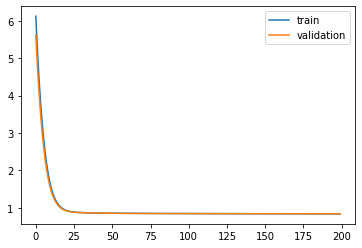

Time to train LSTM:  161.12738609313965
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 5s - loss: 6.1665 - pdc_loss: 0.7237 - event_loss: 0.6759 - val_loss: 5.6727 - val_pdc_loss: 0.7160 - val_event_loss: 0.6498

Epoch 00001: val_loss improved from inf to 5.67268, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 5.3018 - pdc_loss: 0.7104 - event_loss: 0.6212 - val_loss: 4.8738 - val_pdc_loss: 0.7031 - val_event_loss: 0.6006

Epoch 00002: val_loss improved from 5.67268 to 4.87384, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 4.5545 - pdc_loss: 0.6983 - event_loss: 0.5753 - val_loss: 4.1882 - val_pdc_loss: 0.6913 - val_event_loss: 0.5576

Epoch 00003: val_loss improved from 4.87384 to 4.18820, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 3.9151 - pdc_loss: 0.6870 - event_loss: 0.5334 - val_loss: 3.6041 - val_pdc_loss: 0.6803 - val_event_loss: 0.5169

Epoch 00004: val_loss improved from 4.18820 to 3.60408, saving 


Epoch 00035: val_loss improved from 0.88381 to 0.88311, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 0.8704 - pdc_loss: 0.5411 - event_loss: 0.3174 - val_loss: 0.8822 - val_pdc_loss: 0.5468 - val_event_loss: 0.3235

Epoch 00036: val_loss improved from 0.88311 to 0.88217, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 0.8695 - pdc_loss: 0.5403 - event_loss: 0.3173 - val_loss: 0.8813 - val_pdc_loss: 0.5460 - val_event_loss: 0.3235

Epoch 00037: val_loss improved from 0.88217 to 0.88128, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 0.8686 - pdc_loss: 0.5395 - event_loss: 0.3173 - val_loss: 0.8805 - val_pdc_loss: 0.5453 - val_event_loss: 0.3234

Epoch 00038: val_loss improved from 0.88128 to 0.88047, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 0.8677 - pdc_loss: 0.5388 - event_loss: 0.3172 - val_loss: 0.8797 - val_pdc_loss: 0.5445 - val_event_loss: 0.3234

Epoch 00039: val_loss improved from 0.88047 to 

 - 1s - loss: 0.8449 - pdc_loss: 0.5192 - event_loss: 0.3158 - val_loss: 0.8599 - val_pdc_loss: 0.5277 - val_event_loss: 0.3224

Epoch 00070: val_loss improved from 0.86002 to 0.85991, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.8447 - pdc_loss: 0.5191 - event_loss: 0.3158 - val_loss: 0.8597 - val_pdc_loss: 0.5277 - val_event_loss: 0.3223

Epoch 00071: val_loss improved from 0.85991 to 0.85972, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.8444 - pdc_loss: 0.5189 - event_loss: 0.3157 - val_loss: 0.8594 - val_pdc_loss: 0.5275 - val_event_loss: 0.3222

Epoch 00072: val_loss improved from 0.85972 to 0.85942, saving model to Event_val_weights2.hdf5
Epoch 73/200
 - 1s - loss: 0.8441 - pdc_loss: 0.5187 - event_loss: 0.3157 - val_loss: 0.8591 - val_pdc_loss: 0.5275 - val_event_loss: 0.3218

Epoch 00073: val_loss improved from 0.85942 to 0.85908, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.8438 - pdc_loss: 0.5185 - event_


Epoch 00105: val_loss did not improve from 0.85539
Epoch 106/200
 - 1s - loss: 0.8387 - pdc_loss: 0.5156 - event_loss: 0.3143 - val_loss: 0.8551 - val_pdc_loss: 0.5256 - val_event_loss: 0.3206

Epoch 00106: val_loss improved from 0.85539 to 0.85506, saving model to Event_val_weights2.hdf5
Epoch 107/200
 - 1s - loss: 0.8386 - pdc_loss: 0.5155 - event_loss: 0.3142 - val_loss: 0.8551 - val_pdc_loss: 0.5256 - val_event_loss: 0.3206

Epoch 00107: val_loss did not improve from 0.85506
Epoch 108/200
 - 1s - loss: 0.8385 - pdc_loss: 0.5155 - event_loss: 0.3142 - val_loss: 0.8548 - val_pdc_loss: 0.5255 - val_event_loss: 0.3205

Epoch 00108: val_loss improved from 0.85506 to 0.85480, saving model to Event_val_weights2.hdf5
Epoch 109/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5154 - event_loss: 0.3142 - val_loss: 0.8549 - val_pdc_loss: 0.5256 - val_event_loss: 0.3205

Epoch 00109: val_loss did not improve from 0.85480
Epoch 110/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5154 - event_loss: 0.3142 - val_l

 - 1s - loss: 0.8358 - pdc_loss: 0.5139 - event_loss: 0.3136 - val_loss: 0.8525 - val_pdc_loss: 0.5244 - val_event_loss: 0.3198

Epoch 00144: val_loss improved from 0.85268 to 0.85251, saving model to Event_val_weights2.hdf5
Epoch 145/200
 - 1s - loss: 0.8357 - pdc_loss: 0.5138 - event_loss: 0.3136 - val_loss: 0.8527 - val_pdc_loss: 0.5246 - val_event_loss: 0.3198

Epoch 00145: val_loss did not improve from 0.85251
Epoch 146/200
 - 1s - loss: 0.8356 - pdc_loss: 0.5138 - event_loss: 0.3136 - val_loss: 0.8523 - val_pdc_loss: 0.5243 - val_event_loss: 0.3198

Epoch 00146: val_loss improved from 0.85251 to 0.85233, saving model to Event_val_weights2.hdf5
Epoch 147/200
 - 1s - loss: 0.8356 - pdc_loss: 0.5138 - event_loss: 0.3136 - val_loss: 0.8526 - val_pdc_loss: 0.5245 - val_event_loss: 0.3199

Epoch 00147: val_loss did not improve from 0.85233
Epoch 148/200
 - 1s - loss: 0.8355 - pdc_loss: 0.5137 - event_loss: 0.3136 - val_loss: 0.8523 - val_pdc_loss: 0.5244 - val_event_loss: 0.3197

Epoch


Epoch 00183: val_loss did not improve from 0.85155
Epoch 184/200
 - 1s - loss: 0.8337 - pdc_loss: 0.5127 - event_loss: 0.3132 - val_loss: 0.8515 - val_pdc_loss: 0.5242 - val_event_loss: 0.3195

Epoch 00184: val_loss improved from 0.85155 to 0.85150, saving model to Event_val_weights2.hdf5
Epoch 185/200
 - 1s - loss: 0.8335 - pdc_loss: 0.5126 - event_loss: 0.3131 - val_loss: 0.8518 - val_pdc_loss: 0.5245 - val_event_loss: 0.3196

Epoch 00185: val_loss did not improve from 0.85150
Epoch 186/200
 - 1s - loss: 0.8335 - pdc_loss: 0.5126 - event_loss: 0.3131 - val_loss: 0.8517 - val_pdc_loss: 0.5239 - val_event_loss: 0.3200

Epoch 00186: val_loss did not improve from 0.85150
Epoch 187/200
 - 1s - loss: 0.8334 - pdc_loss: 0.5125 - event_loss: 0.3131 - val_loss: 0.8521 - val_pdc_loss: 0.5244 - val_event_loss: 0.3200

Epoch 00187: val_loss did not improve from 0.85150
Epoch 188/200
 - 1s - loss: 0.8334 - pdc_loss: 0.5125 - event_loss: 0.3131 - val_loss: 0.8517 - val_pdc_loss: 0.5241 - val_even

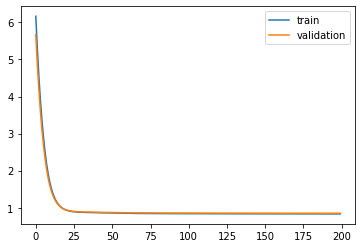

Time to train LSTM:  148.12239909172058
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 5s - loss: 6.2192 - pdc_loss: 0.7462 - event_loss: 0.7322 - val_loss: 5.7068 - val_pdc_loss: 0.7444 - val_event_loss: 0.6705

Epoch 00001: val_loss improved from inf to 5.70681, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 5.3419 - pdc_loss: 0.7338 - event_loss: 0.6461 - val_loss: 4.9054 - val_pdc_loss: 0.7314 - val_event_loss: 0.6048

Epoch 00002: val_loss improved from 5.70681 to 4.90538, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 4.5934 - pdc_loss: 0.7211 - event_loss: 0.5886 - val_loss: 4.2222 - val_pdc_loss: 0.7186 - val_event_loss: 0.5574

Epoch 00003: val_loss improved from 4.90538 to 4.22216, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 3.9552 - pdc_loss: 0.7084 - event_loss: 0.5429 - val_loss: 3.6403 - val_pdc_loss: 0.7058 - val_event_loss: 0.5158

Epoch 00004: val_loss improved from 4.22216 to 3.64029, saving 


Epoch 00035: val_loss improved from 0.89298 to 0.89196, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 0.8701 - pdc_loss: 0.5394 - event_loss: 0.3170 - val_loss: 0.8911 - val_pdc_loss: 0.5539 - val_event_loss: 0.3237

Epoch 00036: val_loss improved from 0.89196 to 0.89106, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 0.8691 - pdc_loss: 0.5385 - event_loss: 0.3170 - val_loss: 0.8901 - val_pdc_loss: 0.5531 - val_event_loss: 0.3236

Epoch 00037: val_loss improved from 0.89106 to 0.89014, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 0.8680 - pdc_loss: 0.5377 - event_loss: 0.3170 - val_loss: 0.8894 - val_pdc_loss: 0.5524 - val_event_loss: 0.3237

Epoch 00038: val_loss improved from 0.89014 to 0.88938, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 0.8671 - pdc_loss: 0.5368 - event_loss: 0.3170 - val_loss: 0.8885 - val_pdc_loss: 0.5517 - val_event_loss: 0.3236

Epoch 00039: val_loss improved from 0.88938 to 

 - 1s - loss: 0.8498 - pdc_loss: 0.5228 - event_loss: 0.3161 - val_loss: 0.8744 - val_pdc_loss: 0.5404 - val_event_loss: 0.3231

Epoch 00070: val_loss improved from 0.87464 to 0.87444, saving model to Event_val_weights3.hdf5
Epoch 71/200
 - 1s - loss: 0.8495 - pdc_loss: 0.5226 - event_loss: 0.3161 - val_loss: 0.8741 - val_pdc_loss: 0.5403 - val_event_loss: 0.3230

Epoch 00071: val_loss improved from 0.87444 to 0.87414, saving model to Event_val_weights3.hdf5
Epoch 72/200
 - 1s - loss: 0.8491 - pdc_loss: 0.5223 - event_loss: 0.3160 - val_loss: 0.8741 - val_pdc_loss: 0.5403 - val_event_loss: 0.3230

Epoch 00072: val_loss improved from 0.87414 to 0.87407, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.8489 - pdc_loss: 0.5222 - event_loss: 0.3160 - val_loss: 0.8738 - val_pdc_loss: 0.5401 - val_event_loss: 0.3229

Epoch 00073: val_loss improved from 0.87407 to 0.87381, saving model to Event_val_weights3.hdf5
Epoch 74/200
 - 1s - loss: 0.8485 - pdc_loss: 0.5219 - event_


Epoch 00105: val_loss improved from 0.86975 to 0.86946, saving model to Event_val_weights3.hdf5
Epoch 106/200
 - 1s - loss: 0.8416 - pdc_loss: 0.5174 - event_loss: 0.3149 - val_loss: 0.8695 - val_pdc_loss: 0.5373 - val_event_loss: 0.3229

Epoch 00106: val_loss did not improve from 0.86946
Epoch 107/200
 - 1s - loss: 0.8415 - pdc_loss: 0.5174 - event_loss: 0.3149 - val_loss: 0.8695 - val_pdc_loss: 0.5374 - val_event_loss: 0.3229

Epoch 00107: val_loss did not improve from 0.86946
Epoch 108/200
 - 1s - loss: 0.8413 - pdc_loss: 0.5172 - event_loss: 0.3149 - val_loss: 0.8696 - val_pdc_loss: 0.5374 - val_event_loss: 0.3230

Epoch 00108: val_loss did not improve from 0.86946
Epoch 109/200
 - 1s - loss: 0.8412 - pdc_loss: 0.5171 - event_loss: 0.3148 - val_loss: 0.8693 - val_pdc_loss: 0.5372 - val_event_loss: 0.3229

Epoch 00109: val_loss improved from 0.86946 to 0.86933, saving model to Event_val_weights3.hdf5
Epoch 110/200
 - 1s - loss: 0.8410 - pdc_loss: 0.5170 - event_loss: 0.3148 - val_l


Epoch 00143: val_loss did not improve from 0.86647
Epoch 144/200
 - 1s - loss: 0.8374 - pdc_loss: 0.5148 - event_loss: 0.3144 - val_loss: 0.8664 - val_pdc_loss: 0.5350 - val_event_loss: 0.3232

Epoch 00144: val_loss improved from 0.86647 to 0.86640, saving model to Event_val_weights3.hdf5
Epoch 145/200
 - 1s - loss: 0.8373 - pdc_loss: 0.5147 - event_loss: 0.3144 - val_loss: 0.8664 - val_pdc_loss: 0.5351 - val_event_loss: 0.3231

Epoch 00145: val_loss improved from 0.86640 to 0.86638, saving model to Event_val_weights3.hdf5
Epoch 146/200
 - 1s - loss: 0.8373 - pdc_loss: 0.5147 - event_loss: 0.3144 - val_loss: 0.8664 - val_pdc_loss: 0.5350 - val_event_loss: 0.3232

Epoch 00146: val_loss improved from 0.86638 to 0.86638, saving model to Event_val_weights3.hdf5
Epoch 147/200
 - 1s - loss: 0.8372 - pdc_loss: 0.5147 - event_loss: 0.3144 - val_loss: 0.8662 - val_pdc_loss: 0.5349 - val_event_loss: 0.3232

Epoch 00147: val_loss improved from 0.86638 to 0.86622, saving model to Event_val_weight


Epoch 00180: val_loss did not improve from 0.86456
Epoch 181/200
 - 1s - loss: 0.8347 - pdc_loss: 0.5130 - event_loss: 0.3141 - val_loss: 0.8646 - val_pdc_loss: 0.5338 - val_event_loss: 0.3232

Epoch 00181: val_loss did not improve from 0.86456
Epoch 182/200
 - 1s - loss: 0.8348 - pdc_loss: 0.5131 - event_loss: 0.3141 - val_loss: 0.8647 - val_pdc_loss: 0.5338 - val_event_loss: 0.3233

Epoch 00182: val_loss did not improve from 0.86456
Epoch 183/200
 - 1s - loss: 0.8347 - pdc_loss: 0.5130 - event_loss: 0.3141 - val_loss: 0.8645 - val_pdc_loss: 0.5335 - val_event_loss: 0.3234

Epoch 00183: val_loss improved from 0.86456 to 0.86447, saving model to Event_val_weights3.hdf5
Epoch 184/200
 - 1s - loss: 0.8346 - pdc_loss: 0.5129 - event_loss: 0.3141 - val_loss: 0.8645 - val_pdc_loss: 0.5335 - val_event_loss: 0.3234

Epoch 00184: val_loss improved from 0.86447 to 0.86446, saving model to Event_val_weights3.hdf5
Epoch 185/200
 - 1s - loss: 0.8346 - pdc_loss: 0.5129 - event_loss: 0.3141 - val_l

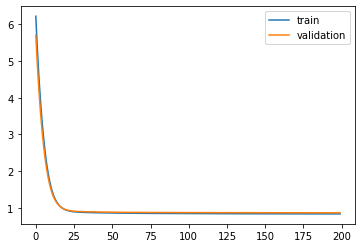

Time to train LSTM:  148.09562230110168


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f6a55580cf8>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 7s - loss: 6.0700 - pdc_loss: 0.6827 - event_loss: 0.6899 - val_loss: 5.5685 - val_pdc_loss: 0.6726 - val_event_loss: 0.6492

Epoch 00001: val_loss improved from inf to 5.56850, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 5.2080 - pdc_loss: 0.6674 - event_loss: 0.6239 - val_loss: 4.7793 - val_pdc_loss: 0.6588 - val_event_loss: 0.5960

Epoch 00002: val_loss improved from 5.56850 to 4.77932, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 4.4708 - pdc_loss: 0.6531 - event_loss: 0.5767 - val_loss: 4.1078 - val_pdc_loss: 0.6456 - val_event_loss: 0.5563

Epoch 00003: val_loss improved from 4.77932 to 4.10777, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 3.8446 - pdc_loss: 0.6394 - event_loss: 0.5394 - val_loss: 3.5393 - val_pdc_loss: 0.6334 - val_event_loss: 0.5228

Epoch 00004: val_loss improved from 4.10777 to 3.53932, saving model to Event_val_weights4.hdf5
Epoch 5


Epoch 00035: val_loss improved from 0.89097 to 0.89044, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 0.8630 - pdc_loss: 0.5341 - event_loss: 0.3163 - val_loss: 0.8900 - val_pdc_loss: 0.5501 - val_event_loss: 0.3274

Epoch 00036: val_loss improved from 0.89044 to 0.88999, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 0.8620 - pdc_loss: 0.5334 - event_loss: 0.3163 - val_loss: 0.8896 - val_pdc_loss: 0.5498 - val_event_loss: 0.3274

Epoch 00037: val_loss improved from 0.88999 to 0.88958, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 0.8612 - pdc_loss: 0.5326 - event_loss: 0.3162 - val_loss: 0.8892 - val_pdc_loss: 0.5496 - val_event_loss: 0.3274

Epoch 00038: val_loss improved from 0.88958 to 0.88924, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 0.8604 - pdc_loss: 0.5320 - event_loss: 0.3162 - val_loss: 0.8888 - val_pdc_loss: 0.5492 - val_event_loss: 0.3273

Epoch 00039: val_loss improved from 0.88924 to 

 - 1s - loss: 0.8466 - pdc_loss: 0.5212 - event_loss: 0.3157 - val_loss: 0.8764 - val_pdc_loss: 0.5398 - val_event_loss: 0.3269

Epoch 00070: val_loss improved from 0.87669 to 0.87645, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.8464 - pdc_loss: 0.5211 - event_loss: 0.3156 - val_loss: 0.8762 - val_pdc_loss: 0.5398 - val_event_loss: 0.3269

Epoch 00071: val_loss improved from 0.87645 to 0.87623, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.8462 - pdc_loss: 0.5209 - event_loss: 0.3157 - val_loss: 0.8760 - val_pdc_loss: 0.5395 - val_event_loss: 0.3270

Epoch 00072: val_loss improved from 0.87623 to 0.87603, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.8459 - pdc_loss: 0.5208 - event_loss: 0.3156 - val_loss: 0.8759 - val_pdc_loss: 0.5395 - val_event_loss: 0.3269

Epoch 00073: val_loss improved from 0.87603 to 0.87586, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.8457 - pdc_loss: 0.5206 - event_


Epoch 00104: val_loss improved from 0.87196 to 0.87179, saving model to Event_val_weights4.hdf5
Epoch 105/200
 - 1s - loss: 0.8395 - pdc_loss: 0.5160 - event_loss: 0.3151 - val_loss: 0.8717 - val_pdc_loss: 0.5372 - val_event_loss: 0.3262

Epoch 00105: val_loss improved from 0.87179 to 0.87172, saving model to Event_val_weights4.hdf5
Epoch 106/200
 - 1s - loss: 0.8393 - pdc_loss: 0.5159 - event_loss: 0.3151 - val_loss: 0.8715 - val_pdc_loss: 0.5370 - val_event_loss: 0.3262

Epoch 00106: val_loss improved from 0.87172 to 0.87151, saving model to Event_val_weights4.hdf5
Epoch 107/200
 - 1s - loss: 0.8392 - pdc_loss: 0.5158 - event_loss: 0.3151 - val_loss: 0.8714 - val_pdc_loss: 0.5369 - val_event_loss: 0.3262

Epoch 00107: val_loss improved from 0.87151 to 0.87144, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.8390 - pdc_loss: 0.5157 - event_loss: 0.3151 - val_loss: 0.8712 - val_pdc_loss: 0.5367 - val_event_loss: 0.3262

Epoch 00108: val_loss improved from 0.87144

 - 1s - loss: 0.8348 - pdc_loss: 0.5130 - event_loss: 0.3141 - val_loss: 0.8684 - val_pdc_loss: 0.5346 - val_event_loss: 0.3261

Epoch 00140: val_loss did not improve from 0.86840
Epoch 141/200
 - 1s - loss: 0.8348 - pdc_loss: 0.5130 - event_loss: 0.3141 - val_loss: 0.8683 - val_pdc_loss: 0.5345 - val_event_loss: 0.3262

Epoch 00141: val_loss improved from 0.86840 to 0.86831, saving model to Event_val_weights4.hdf5
Epoch 142/200
 - 1s - loss: 0.8347 - pdc_loss: 0.5130 - event_loss: 0.3141 - val_loss: 0.8684 - val_pdc_loss: 0.5346 - val_event_loss: 0.3261

Epoch 00142: val_loss did not improve from 0.86831
Epoch 143/200
 - 1s - loss: 0.8346 - pdc_loss: 0.5130 - event_loss: 0.3140 - val_loss: 0.8682 - val_pdc_loss: 0.5343 - val_event_loss: 0.3262

Epoch 00143: val_loss improved from 0.86831 to 0.86816, saving model to Event_val_weights4.hdf5
Epoch 144/200
 - 1s - loss: 0.8345 - pdc_loss: 0.5129 - event_loss: 0.3140 - val_loss: 0.8682 - val_pdc_loss: 0.5344 - val_event_loss: 0.3261

Epoch

 - 1s - loss: 0.8325 - pdc_loss: 0.5118 - event_loss: 0.3134 - val_loss: 0.8673 - val_pdc_loss: 0.5337 - val_event_loss: 0.3263

Epoch 00178: val_loss did not improve from 0.86712
Epoch 179/200
 - 1s - loss: 0.8323 - pdc_loss: 0.5117 - event_loss: 0.3133 - val_loss: 0.8672 - val_pdc_loss: 0.5337 - val_event_loss: 0.3262

Epoch 00179: val_loss did not improve from 0.86712
Epoch 180/200
 - 1s - loss: 0.8323 - pdc_loss: 0.5117 - event_loss: 0.3133 - val_loss: 0.8673 - val_pdc_loss: 0.5337 - val_event_loss: 0.3263

Epoch 00180: val_loss did not improve from 0.86712
Epoch 181/200
 - 1s - loss: 0.8322 - pdc_loss: 0.5117 - event_loss: 0.3133 - val_loss: 0.8672 - val_pdc_loss: 0.5336 - val_event_loss: 0.3263

Epoch 00181: val_loss did not improve from 0.86712
Epoch 182/200
 - 1s - loss: 0.8321 - pdc_loss: 0.5116 - event_loss: 0.3133 - val_loss: 0.8671 - val_pdc_loss: 0.5336 - val_event_loss: 0.3262

Epoch 00182: val_loss improved from 0.86712 to 0.86711, saving model to Event_val_weights4.hdf5

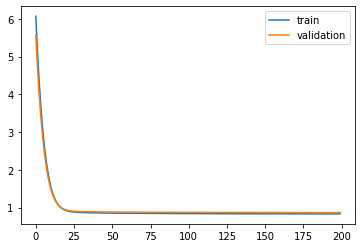

Time to train LSTM:  154.8478124141693
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 6s - loss: 6.2566 - pdc_loss: 0.7482 - event_loss: 0.6883 - val_loss: 5.7583 - val_pdc_loss: 0.7371 - val_event_loss: 0.6664

Epoch 00001: val_loss improved from inf to 5.75827, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 5.3860 - pdc_loss: 0.7230 - event_loss: 0.6483 - val_loss: 4.9545 - val_pdc_loss: 0.7135 - val_event_loss: 0.6296

Epoch 00002: val_loss improved from 5.75827 to 4.95446, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 4.6356 - pdc_loss: 0.7014 - event_loss: 0.6141 - val_loss: 4.2672 - val_pdc_loss: 0.6936 - val_event_loss: 0.5974

Epoch 00003: val_loss improved from 4.95446 to 4.26721, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 3.9977 - pdc_loss: 0.6835 - event_loss: 0.5842 - val_loss: 3.6851 - val_pdc_loss: 0.6766 - val_event_loss: 0.5682

Epoch 00004: val_loss improved from 4.26721 to 3.68513, saving m


Epoch 00035: val_loss improved from 0.87032 to 0.86927, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 0.8672 - pdc_loss: 0.5359 - event_loss: 0.3185 - val_loss: 0.8683 - val_pdc_loss: 0.5374 - val_event_loss: 0.3183

Epoch 00036: val_loss improved from 0.86927 to 0.86834, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 0.8662 - pdc_loss: 0.5352 - event_loss: 0.3184 - val_loss: 0.8676 - val_pdc_loss: 0.5369 - val_event_loss: 0.3183

Epoch 00037: val_loss improved from 0.86834 to 0.86756, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 0.8653 - pdc_loss: 0.5346 - event_loss: 0.3183 - val_loss: 0.8668 - val_pdc_loss: 0.5364 - val_event_loss: 0.3182

Epoch 00038: val_loss improved from 0.86756 to 0.86683, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 0.8644 - pdc_loss: 0.5340 - event_loss: 0.3182 - val_loss: 0.8660 - val_pdc_loss: 0.5357 - val_event_loss: 0.3181

Epoch 00039: val_loss improved from 0.86683 to 

 - 1s - loss: 0.8490 - pdc_loss: 0.5228 - event_loss: 0.3160 - val_loss: 0.8527 - val_pdc_loss: 0.5255 - val_event_loss: 0.3171

Epoch 00070: val_loss improved from 0.85286 to 0.85269, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.8487 - pdc_loss: 0.5226 - event_loss: 0.3160 - val_loss: 0.8525 - val_pdc_loss: 0.5253 - val_event_loss: 0.3171

Epoch 00071: val_loss improved from 0.85269 to 0.85247, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8484 - pdc_loss: 0.5224 - event_loss: 0.3159 - val_loss: 0.8524 - val_pdc_loss: 0.5254 - val_event_loss: 0.3171

Epoch 00072: val_loss improved from 0.85247 to 0.85243, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8481 - pdc_loss: 0.5222 - event_loss: 0.3159 - val_loss: 0.8522 - val_pdc_loss: 0.5252 - val_event_loss: 0.3171

Epoch 00073: val_loss improved from 0.85243 to 0.85221, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8478 - pdc_loss: 0.5221 - event_


Epoch 00105: val_loss did not improve from 0.84849
Epoch 106/200
 - 1s - loss: 0.8425 - pdc_loss: 0.5188 - event_loss: 0.3150 - val_loss: 0.8485 - val_pdc_loss: 0.5231 - val_event_loss: 0.3168

Epoch 00106: val_loss did not improve from 0.84849
Epoch 107/200
 - 1s - loss: 0.8424 - pdc_loss: 0.5187 - event_loss: 0.3150 - val_loss: 0.8484 - val_pdc_loss: 0.5231 - val_event_loss: 0.3168

Epoch 00107: val_loss improved from 0.84849 to 0.84844, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.8423 - pdc_loss: 0.5187 - event_loss: 0.3150 - val_loss: 0.8483 - val_pdc_loss: 0.5229 - val_event_loss: 0.3168

Epoch 00108: val_loss improved from 0.84844 to 0.84826, saving model to Event_val_weights5.hdf5
Epoch 109/200
 - 1s - loss: 0.8422 - pdc_loss: 0.5186 - event_loss: 0.3150 - val_loss: 0.8482 - val_pdc_loss: 0.5229 - val_event_loss: 0.3167

Epoch 00109: val_loss improved from 0.84826 to 0.84817, saving model to Event_val_weights5.hdf5
Epoch 110/200
 - 1s - loss: 0.8421 - 


Epoch 00145: val_loss did not improve from 0.84716
Epoch 146/200
 - 1s - loss: 0.8402 - pdc_loss: 0.5177 - event_loss: 0.3145 - val_loss: 0.8477 - val_pdc_loss: 0.5228 - val_event_loss: 0.3169

Epoch 00146: val_loss did not improve from 0.84716
Epoch 147/200
 - 1s - loss: 0.8402 - pdc_loss: 0.5176 - event_loss: 0.3146 - val_loss: 0.8477 - val_pdc_loss: 0.5230 - val_event_loss: 0.3167

Epoch 00147: val_loss did not improve from 0.84716
Epoch 148/200
 - 1s - loss: 0.8404 - pdc_loss: 0.5176 - event_loss: 0.3147 - val_loss: 0.8474 - val_pdc_loss: 0.5228 - val_event_loss: 0.3166

Epoch 00148: val_loss did not improve from 0.84716
Epoch 149/200
 - 1s - loss: 0.8403 - pdc_loss: 0.5175 - event_loss: 0.3147 - val_loss: 0.8472 - val_pdc_loss: 0.5227 - val_event_loss: 0.3165

Epoch 00149: val_loss did not improve from 0.84716
Epoch 150/200
 - 1s - loss: 0.8403 - pdc_loss: 0.5175 - event_loss: 0.3148 - val_loss: 0.8468 - val_pdc_loss: 0.5223 - val_event_loss: 0.3164

Epoch 00150: val_loss improve


Epoch 00186: val_loss did not improve from 0.84516
Epoch 187/200
 - 1s - loss: 0.8376 - pdc_loss: 0.5160 - event_loss: 0.3140 - val_loss: 0.8453 - val_pdc_loss: 0.5214 - val_event_loss: 0.3163

Epoch 00187: val_loss did not improve from 0.84516
Epoch 188/200
 - 1s - loss: 0.8376 - pdc_loss: 0.5161 - event_loss: 0.3140 - val_loss: 0.8452 - val_pdc_loss: 0.5213 - val_event_loss: 0.3163

Epoch 00188: val_loss did not improve from 0.84516
Epoch 189/200
 - 1s - loss: 0.8375 - pdc_loss: 0.5160 - event_loss: 0.3139 - val_loss: 0.8452 - val_pdc_loss: 0.5213 - val_event_loss: 0.3164

Epoch 00189: val_loss did not improve from 0.84516
Epoch 190/200
 - 1s - loss: 0.8375 - pdc_loss: 0.5160 - event_loss: 0.3140 - val_loss: 0.8452 - val_pdc_loss: 0.5213 - val_event_loss: 0.3165

Epoch 00190: val_loss did not improve from 0.84516
Epoch 191/200
 - 1s - loss: 0.8374 - pdc_loss: 0.5160 - event_loss: 0.3139 - val_loss: 0.8450 - val_pdc_loss: 0.5212 - val_event_loss: 0.3163

Epoch 00191: val_loss improve

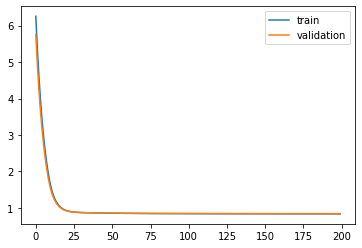

Time to train LSTM:  150.19603371620178
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 6s - loss: 7.6595 - pdc_loss: 0.7634 - event_loss: 0.7000 - val_loss: 7.0150 - val_pdc_loss: 0.7481 - val_event_loss: 0.6745

Epoch 00001: val_loss improved from inf to 7.01503, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 6.5335 - pdc_loss: 0.7297 - event_loss: 0.6511 - val_loss: 5.9754 - val_pdc_loss: 0.7167 - val_event_loss: 0.6275

Epoch 00002: val_loss improved from 7.01503 to 5.97543, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 5.5644 - pdc_loss: 0.7010 - event_loss: 0.6082 - val_loss: 5.0877 - val_pdc_loss: 0.6914 - val_event_loss: 0.5849

Epoch 00003: val_loss improved from 5.97543 to 5.08773, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 4.7402 - pdc_loss: 0.6782 - event_loss: 0.5680 - val_loss: 4.3361 - val_pdc_loss: 0.6719 - val_event_loss: 0.5434

Epoch 00004: val_loss improved from 5.08773 to 4.33605, saving 


Epoch 00035: val_loss improved from 0.87237 to 0.87134, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 0.8741 - pdc_loss: 0.5408 - event_loss: 0.3197 - val_loss: 0.8703 - val_pdc_loss: 0.5422 - val_event_loss: 0.3146

Epoch 00036: val_loss improved from 0.87134 to 0.87034, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 0.8731 - pdc_loss: 0.5400 - event_loss: 0.3195 - val_loss: 0.8694 - val_pdc_loss: 0.5414 - val_event_loss: 0.3145

Epoch 00037: val_loss improved from 0.87034 to 0.86939, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 0.8721 - pdc_loss: 0.5393 - event_loss: 0.3194 - val_loss: 0.8685 - val_pdc_loss: 0.5407 - val_event_loss: 0.3144

Epoch 00038: val_loss improved from 0.86939 to 0.86847, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 0.8712 - pdc_loss: 0.5386 - event_loss: 0.3193 - val_loss: 0.8676 - val_pdc_loss: 0.5399 - val_event_loss: 0.3143

Epoch 00039: val_loss improved from 0.86847 to 

 - 1s - loss: 0.8498 - pdc_loss: 0.5209 - event_loss: 0.3175 - val_loss: 0.8465 - val_pdc_loss: 0.5227 - val_event_loss: 0.3125

Epoch 00070: val_loss improved from 0.84676 to 0.84652, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 0.8494 - pdc_loss: 0.5207 - event_loss: 0.3174 - val_loss: 0.8462 - val_pdc_loss: 0.5226 - val_event_loss: 0.3123

Epoch 00071: val_loss improved from 0.84652 to 0.84617, saving model to Event_val_weights1.hdf5
Epoch 72/200
 - 1s - loss: 0.8491 - pdc_loss: 0.5205 - event_loss: 0.3174 - val_loss: 0.8461 - val_pdc_loss: 0.5223 - val_event_loss: 0.3126

Epoch 00072: val_loss improved from 0.84617 to 0.84606, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.8489 - pdc_loss: 0.5203 - event_loss: 0.3173 - val_loss: 0.8461 - val_pdc_loss: 0.5224 - val_event_loss: 0.3125

Epoch 00073: val_loss did not improve from 0.84606
Epoch 74/200
 - 1s - loss: 0.8486 - pdc_loss: 0.5202 - event_loss: 0.3173 - val_loss: 0.8449 - val_pdc_los


Epoch 00108: val_loss did not improve from 0.83962
Epoch 109/200
 - 1s - loss: 0.8423 - pdc_loss: 0.5165 - event_loss: 0.3162 - val_loss: 0.8398 - val_pdc_loss: 0.5186 - val_event_loss: 0.3117

Epoch 00109: val_loss did not improve from 0.83962
Epoch 110/200
 - 1s - loss: 0.8421 - pdc_loss: 0.5165 - event_loss: 0.3162 - val_loss: 0.8403 - val_pdc_loss: 0.5189 - val_event_loss: 0.3120

Epoch 00110: val_loss did not improve from 0.83962
Epoch 111/200
 - 1s - loss: 0.8421 - pdc_loss: 0.5164 - event_loss: 0.3162 - val_loss: 0.8401 - val_pdc_loss: 0.5189 - val_event_loss: 0.3118

Epoch 00111: val_loss did not improve from 0.83962
Epoch 112/200
 - 1s - loss: 0.8419 - pdc_loss: 0.5164 - event_loss: 0.3162 - val_loss: 0.8402 - val_pdc_loss: 0.5188 - val_event_loss: 0.3120

Epoch 00112: val_loss did not improve from 0.83962
Epoch 113/200
 - 1s - loss: 0.8419 - pdc_loss: 0.5164 - event_loss: 0.3162 - val_loss: 0.8399 - val_pdc_loss: 0.5189 - val_event_loss: 0.3117

Epoch 00113: val_loss did not

 - 1s - loss: 0.8390 - pdc_loss: 0.5149 - event_loss: 0.3157 - val_loss: 0.8383 - val_pdc_loss: 0.5181 - val_event_loss: 0.3117

Epoch 00149: val_loss improved from 0.83845 to 0.83830, saving model to Event_val_weights1.hdf5
Epoch 150/200
 - 1s - loss: 0.8389 - pdc_loss: 0.5148 - event_loss: 0.3156 - val_loss: 0.8385 - val_pdc_loss: 0.5182 - val_event_loss: 0.3118

Epoch 00150: val_loss did not improve from 0.83830
Epoch 151/200
 - 1s - loss: 0.8389 - pdc_loss: 0.5148 - event_loss: 0.3156 - val_loss: 0.8386 - val_pdc_loss: 0.5184 - val_event_loss: 0.3118

Epoch 00151: val_loss did not improve from 0.83830
Epoch 152/200
 - 1s - loss: 0.8388 - pdc_loss: 0.5148 - event_loss: 0.3156 - val_loss: 0.8387 - val_pdc_loss: 0.5184 - val_event_loss: 0.3118

Epoch 00152: val_loss did not improve from 0.83830
Epoch 153/200
 - 1s - loss: 0.8388 - pdc_loss: 0.5148 - event_loss: 0.3156 - val_loss: 0.8383 - val_pdc_loss: 0.5182 - val_event_loss: 0.3117

Epoch 00153: val_loss improved from 0.83830 to 0.8


Epoch 00189: val_loss did not improve from 0.83703
Epoch 190/200
 - 1s - loss: 0.8370 - pdc_loss: 0.5139 - event_loss: 0.3152 - val_loss: 0.8374 - val_pdc_loss: 0.5179 - val_event_loss: 0.3116

Epoch 00190: val_loss did not improve from 0.83703
Epoch 191/200
 - 1s - loss: 0.8369 - pdc_loss: 0.5139 - event_loss: 0.3152 - val_loss: 0.8369 - val_pdc_loss: 0.5178 - val_event_loss: 0.3113

Epoch 00191: val_loss improved from 0.83703 to 0.83692, saving model to Event_val_weights1.hdf5
Epoch 192/200
 - 1s - loss: 0.8368 - pdc_loss: 0.5138 - event_loss: 0.3152 - val_loss: 0.8379 - val_pdc_loss: 0.5183 - val_event_loss: 0.3118

Epoch 00192: val_loss did not improve from 0.83692
Epoch 193/200
 - 1s - loss: 0.8368 - pdc_loss: 0.5138 - event_loss: 0.3151 - val_loss: 0.8374 - val_pdc_loss: 0.5181 - val_event_loss: 0.3115

Epoch 00193: val_loss did not improve from 0.83692
Epoch 194/200
 - 1s - loss: 0.8368 - pdc_loss: 0.5138 - event_loss: 0.3151 - val_loss: 0.8374 - val_pdc_loss: 0.5181 - val_even

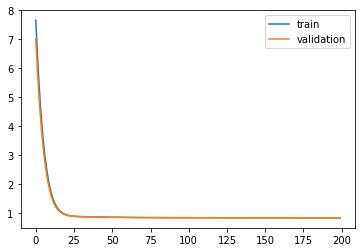

Time to train LSTM:  149.8182921409607
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 6s - loss: 7.9737 - pdc_loss: 0.7704 - event_loss: 0.7030 - val_loss: 7.2957 - val_pdc_loss: 0.7476 - val_event_loss: 0.6781

Epoch 00001: val_loss improved from inf to 7.29570, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 6.8104 - pdc_loss: 0.7388 - event_loss: 0.6618 - val_loss: 6.2224 - val_pdc_loss: 0.7189 - val_event_loss: 0.6399

Epoch 00002: val_loss improved from 7.29570 to 6.22244, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 5.8046 - pdc_loss: 0.7115 - event_loss: 0.6234 - val_loss: 5.3023 - val_pdc_loss: 0.6949 - val_event_loss: 0.6025

Epoch 00003: val_loss improved from 6.22244 to 5.30234, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 4.9458 - pdc_loss: 0.6882 - event_loss: 0.5847 - val_loss: 4.5213 - val_pdc_loss: 0.6745 - val_event_loss: 0.5644

Epoch 00004: val_loss improved from 5.30234 to 4.52133, saving m


Epoch 00035: val_loss improved from 0.88668 to 0.88575, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 0.8741 - pdc_loss: 0.5420 - event_loss: 0.3189 - val_loss: 0.8848 - val_pdc_loss: 0.5466 - val_event_loss: 0.3251

Epoch 00036: val_loss improved from 0.88575 to 0.88477, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 0.8732 - pdc_loss: 0.5415 - event_loss: 0.3188 - val_loss: 0.8840 - val_pdc_loss: 0.5461 - val_event_loss: 0.3250

Epoch 00037: val_loss improved from 0.88477 to 0.88397, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 0.8724 - pdc_loss: 0.5410 - event_loss: 0.3186 - val_loss: 0.8832 - val_pdc_loss: 0.5456 - val_event_loss: 0.3249

Epoch 00038: val_loss improved from 0.88397 to 0.88320, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 0.8716 - pdc_loss: 0.5405 - event_loss: 0.3185 - val_loss: 0.8824 - val_pdc_loss: 0.5451 - val_event_loss: 0.3247

Epoch 00039: val_loss improved from 0.88320 to 

 - 1s - loss: 0.8521 - pdc_loss: 0.5242 - event_loss: 0.3168 - val_loss: 0.8655 - val_pdc_loss: 0.5315 - val_event_loss: 0.3229

Epoch 00070: val_loss improved from 0.86572 to 0.86549, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.8517 - pdc_loss: 0.5240 - event_loss: 0.3168 - val_loss: 0.8651 - val_pdc_loss: 0.5313 - val_event_loss: 0.3228

Epoch 00071: val_loss improved from 0.86549 to 0.86511, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.8514 - pdc_loss: 0.5237 - event_loss: 0.3167 - val_loss: 0.8652 - val_pdc_loss: 0.5315 - val_event_loss: 0.3227

Epoch 00072: val_loss did not improve from 0.86511
Epoch 73/200
 - 1s - loss: 0.8511 - pdc_loss: 0.5235 - event_loss: 0.3167 - val_loss: 0.8651 - val_pdc_loss: 0.5315 - val_event_loss: 0.3227

Epoch 00073: val_loss improved from 0.86511 to 0.86510, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.8506 - pdc_loss: 0.5232 - event_loss: 0.3166 - val_loss: 0.8652 - val_pdc_los


Epoch 00105: val_loss improved from 0.85815 to 0.85803, saving model to Event_val_weights2.hdf5
Epoch 106/200
 - 1s - loss: 0.8428 - pdc_loss: 0.5179 - event_loss: 0.3157 - val_loss: 0.8579 - val_pdc_loss: 0.5271 - val_event_loss: 0.3215

Epoch 00106: val_loss improved from 0.85803 to 0.85791, saving model to Event_val_weights2.hdf5
Epoch 107/200
 - 1s - loss: 0.8426 - pdc_loss: 0.5177 - event_loss: 0.3156 - val_loss: 0.8577 - val_pdc_loss: 0.5270 - val_event_loss: 0.3215

Epoch 00107: val_loss improved from 0.85791 to 0.85773, saving model to Event_val_weights2.hdf5
Epoch 108/200
 - 1s - loss: 0.8425 - pdc_loss: 0.5176 - event_loss: 0.3156 - val_loss: 0.8576 - val_pdc_loss: 0.5269 - val_event_loss: 0.3215

Epoch 00108: val_loss improved from 0.85773 to 0.85763, saving model to Event_val_weights2.hdf5
Epoch 109/200
 - 1s - loss: 0.8423 - pdc_loss: 0.5176 - event_loss: 0.3155 - val_loss: 0.8576 - val_pdc_loss: 0.5270 - val_event_loss: 0.3214

Epoch 00109: val_loss improved from 0.85763


Epoch 00142: val_loss improved from 0.85531 to 0.85519, saving model to Event_val_weights2.hdf5
Epoch 143/200
 - 1s - loss: 0.8390 - pdc_loss: 0.5158 - event_loss: 0.3147 - val_loss: 0.8552 - val_pdc_loss: 0.5257 - val_event_loss: 0.3210

Epoch 00143: val_loss did not improve from 0.85519
Epoch 144/200
 - 1s - loss: 0.8389 - pdc_loss: 0.5158 - event_loss: 0.3147 - val_loss: 0.8550 - val_pdc_loss: 0.5256 - val_event_loss: 0.3210

Epoch 00144: val_loss improved from 0.85519 to 0.85503, saving model to Event_val_weights2.hdf5
Epoch 145/200
 - 1s - loss: 0.8388 - pdc_loss: 0.5158 - event_loss: 0.3146 - val_loss: 0.8551 - val_pdc_loss: 0.5257 - val_event_loss: 0.3209

Epoch 00145: val_loss did not improve from 0.85503
Epoch 146/200
 - 1s - loss: 0.8387 - pdc_loss: 0.5157 - event_loss: 0.3146 - val_loss: 0.8551 - val_pdc_loss: 0.5256 - val_event_loss: 0.3210

Epoch 00146: val_loss did not improve from 0.85503
Epoch 147/200
 - 1s - loss: 0.8387 - pdc_loss: 0.5157 - event_loss: 0.3146 - val_l


Epoch 00181: val_loss improved from 0.85391 to 0.85387, saving model to Event_val_weights2.hdf5
Epoch 182/200
 - 1s - loss: 0.8368 - pdc_loss: 0.5148 - event_loss: 0.3140 - val_loss: 0.8538 - val_pdc_loss: 0.5249 - val_event_loss: 0.3209

Epoch 00182: val_loss improved from 0.85387 to 0.85383, saving model to Event_val_weights2.hdf5
Epoch 183/200
 - 1s - loss: 0.8367 - pdc_loss: 0.5148 - event_loss: 0.3139 - val_loss: 0.8536 - val_pdc_loss: 0.5248 - val_event_loss: 0.3208

Epoch 00183: val_loss improved from 0.85383 to 0.85365, saving model to Event_val_weights2.hdf5
Epoch 184/200
 - 1s - loss: 0.8368 - pdc_loss: 0.5148 - event_loss: 0.3140 - val_loss: 0.8541 - val_pdc_loss: 0.5252 - val_event_loss: 0.3208

Epoch 00184: val_loss did not improve from 0.85365
Epoch 185/200
 - 1s - loss: 0.8367 - pdc_loss: 0.5147 - event_loss: 0.3139 - val_loss: 0.8541 - val_pdc_loss: 0.5253 - val_event_loss: 0.3207

Epoch 00185: val_loss did not improve from 0.85365
Epoch 186/200
 - 1s - loss: 0.8367 - 

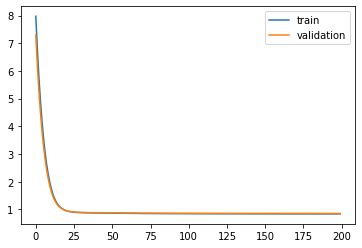

Time to train LSTM:  149.87852382659912


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f6a4d271c18>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 7s - loss: 7.8969 - pdc_loss: 0.7667 - event_loss: 0.6839 - val_loss: 7.2301 - val_pdc_loss: 0.7532 - val_event_loss: 0.6565

Epoch 00001: val_loss improved from inf to 7.23010, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 6.7404 - pdc_loss: 0.7345 - event_loss: 0.6425 - val_loss: 6.1638 - val_pdc_loss: 0.7232 - val_event_loss: 0.6191

Epoch 00002: val_loss improved from 7.23010 to 6.16379, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 5.7431 - pdc_loss: 0.7063 - event_loss: 0.6064 - val_loss: 5.2528 - val_pdc_loss: 0.6977 - val_event_loss: 0.5866

Epoch 00003: val_loss improved from 6.16379 to 5.25278, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 4.8953 - pdc_loss: 0.6832 - event_loss: 0.5740 - val_loss: 4.4826 - val_pdc_loss: 0.6771 - val_event_loss: 0.5561

Epoch 00004: val_loss improved from 5.25278 to 4.48262, saving model to Event_val_weights3.hdf5
Epoch 5


Epoch 00035: val_loss improved from 0.88864 to 0.88728, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 0.8674 - pdc_loss: 0.5338 - event_loss: 0.3191 - val_loss: 0.8861 - val_pdc_loss: 0.5477 - val_event_loss: 0.3239

Epoch 00036: val_loss improved from 0.88728 to 0.88605, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 0.8661 - pdc_loss: 0.5327 - event_loss: 0.3191 - val_loss: 0.8849 - val_pdc_loss: 0.5468 - val_event_loss: 0.3239

Epoch 00037: val_loss improved from 0.88605 to 0.88492, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 0.8649 - pdc_loss: 0.5317 - event_loss: 0.3191 - val_loss: 0.8839 - val_pdc_loss: 0.5460 - val_event_loss: 0.3239

Epoch 00038: val_loss improved from 0.88492 to 0.88388, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 0.8637 - pdc_loss: 0.5307 - event_loss: 0.3190 - val_loss: 0.8830 - val_pdc_loss: 0.5452 - val_event_loss: 0.3239

Epoch 00039: val_loss improved from 0.88388 to 


Epoch 00070: val_loss did not improve from 0.87023
Epoch 71/200
 - 1s - loss: 0.8468 - pdc_loss: 0.5195 - event_loss: 0.3170 - val_loss: 0.8702 - val_pdc_loss: 0.5366 - val_event_loss: 0.3234

Epoch 00071: val_loss did not improve from 0.87023
Epoch 72/200
 - 1s - loss: 0.8464 - pdc_loss: 0.5193 - event_loss: 0.3169 - val_loss: 0.8701 - val_pdc_loss: 0.5365 - val_event_loss: 0.3234

Epoch 00072: val_loss improved from 0.87023 to 0.87011, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.8462 - pdc_loss: 0.5192 - event_loss: 0.3168 - val_loss: 0.8701 - val_pdc_loss: 0.5366 - val_event_loss: 0.3234

Epoch 00073: val_loss improved from 0.87011 to 0.87010, saving model to Event_val_weights3.hdf5
Epoch 74/200
 - 1s - loss: 0.8459 - pdc_loss: 0.5189 - event_loss: 0.3168 - val_loss: 0.8700 - val_pdc_loss: 0.5365 - val_event_loss: 0.3234

Epoch 00074: val_loss improved from 0.87010 to 0.87000, saving model to Event_val_weights3.hdf5
Epoch 75/200
 - 1s - loss: 0.8456 - pdc_l

 - 1s - loss: 0.8399 - pdc_loss: 0.5154 - event_loss: 0.3154 - val_loss: 0.8677 - val_pdc_loss: 0.5352 - val_event_loss: 0.3234

Epoch 00109: val_loss did not improve from 0.86742
Epoch 110/200
 - 1s - loss: 0.8398 - pdc_loss: 0.5154 - event_loss: 0.3154 - val_loss: 0.8673 - val_pdc_loss: 0.5350 - val_event_loss: 0.3233

Epoch 00110: val_loss improved from 0.86742 to 0.86733, saving model to Event_val_weights3.hdf5
Epoch 111/200
 - 1s - loss: 0.8397 - pdc_loss: 0.5153 - event_loss: 0.3154 - val_loss: 0.8675 - val_pdc_loss: 0.5351 - val_event_loss: 0.3234

Epoch 00111: val_loss did not improve from 0.86733
Epoch 112/200
 - 1s - loss: 0.8396 - pdc_loss: 0.5153 - event_loss: 0.3153 - val_loss: 0.8674 - val_pdc_loss: 0.5350 - val_event_loss: 0.3234

Epoch 00112: val_loss did not improve from 0.86733
Epoch 113/200
 - 1s - loss: 0.8395 - pdc_loss: 0.5152 - event_loss: 0.3153 - val_loss: 0.8675 - val_pdc_loss: 0.5351 - val_event_loss: 0.3234

Epoch 00113: val_loss did not improve from 0.86733

 - 1s - loss: 0.8366 - pdc_loss: 0.5137 - event_loss: 0.3145 - val_loss: 0.8660 - val_pdc_loss: 0.5343 - val_event_loss: 0.3233

Epoch 00148: val_loss did not improve from 0.86592
Epoch 149/200
 - 1s - loss: 0.8365 - pdc_loss: 0.5137 - event_loss: 0.3145 - val_loss: 0.8660 - val_pdc_loss: 0.5343 - val_event_loss: 0.3233

Epoch 00149: val_loss did not improve from 0.86592
Epoch 150/200
 - 1s - loss: 0.8365 - pdc_loss: 0.5137 - event_loss: 0.3145 - val_loss: 0.8658 - val_pdc_loss: 0.5343 - val_event_loss: 0.3232

Epoch 00150: val_loss improved from 0.86592 to 0.86584, saving model to Event_val_weights3.hdf5
Epoch 151/200
 - 1s - loss: 0.8364 - pdc_loss: 0.5137 - event_loss: 0.3144 - val_loss: 0.8659 - val_pdc_loss: 0.5343 - val_event_loss: 0.3232

Epoch 00151: val_loss did not improve from 0.86584
Epoch 152/200
 - 1s - loss: 0.8364 - pdc_loss: 0.5136 - event_loss: 0.3144 - val_loss: 0.8659 - val_pdc_loss: 0.5343 - val_event_loss: 0.3232

Epoch 00152: val_loss did not improve from 0.86584


Epoch 00187: val_loss did not improve from 0.86489
Epoch 188/200
 - 1s - loss: 0.8345 - pdc_loss: 0.5126 - event_loss: 0.3139 - val_loss: 0.8651 - val_pdc_loss: 0.5341 - val_event_loss: 0.3230

Epoch 00188: val_loss did not improve from 0.86489
Epoch 189/200
 - 1s - loss: 0.8345 - pdc_loss: 0.5126 - event_loss: 0.3139 - val_loss: 0.8650 - val_pdc_loss: 0.5340 - val_event_loss: 0.3230

Epoch 00189: val_loss did not improve from 0.86489
Epoch 190/200
 - 1s - loss: 0.8344 - pdc_loss: 0.5126 - event_loss: 0.3139 - val_loss: 0.8651 - val_pdc_loss: 0.5341 - val_event_loss: 0.3231

Epoch 00190: val_loss did not improve from 0.86489
Epoch 191/200
 - 1s - loss: 0.8344 - pdc_loss: 0.5126 - event_loss: 0.3139 - val_loss: 0.8650 - val_pdc_loss: 0.5340 - val_event_loss: 0.3231

Epoch 00191: val_loss did not improve from 0.86489
Epoch 192/200
 - 1s - loss: 0.8343 - pdc_loss: 0.5125 - event_loss: 0.3139 - val_loss: 0.8648 - val_pdc_loss: 0.5338 - val_event_loss: 0.3231

Epoch 00192: val_loss improve

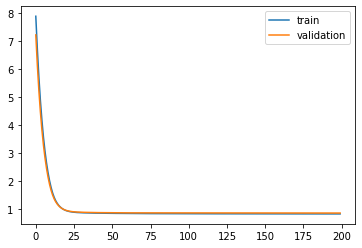

Time to train LSTM:  155.63672471046448
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 7s - loss: 7.7684 - pdc_loss: 0.7286 - event_loss: 0.6851 - val_loss: 7.1146 - val_pdc_loss: 0.7186 - val_event_loss: 0.6629

Epoch 00001: val_loss improved from inf to 7.11456, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 6.6271 - pdc_loss: 0.7055 - event_loss: 0.6417 - val_loss: 6.0624 - val_pdc_loss: 0.6970 - val_event_loss: 0.6226

Epoch 00002: val_loss improved from 7.11456 to 6.06235, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 5.6446 - pdc_loss: 0.6855 - event_loss: 0.6031 - val_loss: 5.1642 - val_pdc_loss: 0.6779 - val_event_loss: 0.5864

Epoch 00003: val_loss improved from 6.06235 to 5.16419, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 4.8094 - pdc_loss: 0.6677 - event_loss: 0.5677 - val_loss: 4.4052 - val_pdc_loss: 0.6612 - val_event_loss: 0.5526

Epoch 00004: val_loss improved from 5.16419 to 4.40516, saving 


Epoch 00035: val_loss improved from 0.89828 to 0.89732, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 0.8724 - pdc_loss: 0.5408 - event_loss: 0.3177 - val_loss: 0.8968 - val_pdc_loss: 0.5550 - val_event_loss: 0.3280

Epoch 00036: val_loss improved from 0.89732 to 0.89676, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 0.8715 - pdc_loss: 0.5402 - event_loss: 0.3176 - val_loss: 0.8958 - val_pdc_loss: 0.5545 - val_event_loss: 0.3277

Epoch 00037: val_loss improved from 0.89676 to 0.89580, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 0.8705 - pdc_loss: 0.5395 - event_loss: 0.3175 - val_loss: 0.8953 - val_pdc_loss: 0.5542 - val_event_loss: 0.3277

Epoch 00038: val_loss improved from 0.89580 to 0.89528, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 0.8696 - pdc_loss: 0.5389 - event_loss: 0.3174 - val_loss: 0.8946 - val_pdc_loss: 0.5538 - val_event_loss: 0.3275

Epoch 00039: val_loss improved from 0.89528 to 


Epoch 00070: val_loss improved from 0.88359 to 0.88329, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.8532 - pdc_loss: 0.5262 - event_loss: 0.3163 - val_loss: 0.8834 - val_pdc_loss: 0.5457 - val_event_loss: 0.3270

Epoch 00071: val_loss did not improve from 0.88329
Epoch 72/200
 - 1s - loss: 0.8529 - pdc_loss: 0.5259 - event_loss: 0.3163 - val_loss: 0.8829 - val_pdc_loss: 0.5455 - val_event_loss: 0.3269

Epoch 00072: val_loss improved from 0.88329 to 0.88292, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.8526 - pdc_loss: 0.5258 - event_loss: 0.3162 - val_loss: 0.8828 - val_pdc_loss: 0.5454 - val_event_loss: 0.3268

Epoch 00073: val_loss improved from 0.88292 to 0.88277, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.8523 - pdc_loss: 0.5255 - event_loss: 0.3162 - val_loss: 0.8827 - val_pdc_loss: 0.5453 - val_event_loss: 0.3269

Epoch 00074: val_loss improved from 0.88277 to 0.88266, saving model to Event_val_weights4.h

 - 1s - loss: 0.8440 - pdc_loss: 0.5193 - event_loss: 0.3152 - val_loss: 0.8757 - val_pdc_loss: 0.5404 - val_event_loss: 0.3258

Epoch 00106: val_loss improved from 0.87599 to 0.87574, saving model to Event_val_weights4.hdf5
Epoch 107/200
 - 1s - loss: 0.8438 - pdc_loss: 0.5192 - event_loss: 0.3151 - val_loss: 0.8755 - val_pdc_loss: 0.5403 - val_event_loss: 0.3257

Epoch 00107: val_loss improved from 0.87574 to 0.87553, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.8436 - pdc_loss: 0.5190 - event_loss: 0.3151 - val_loss: 0.8757 - val_pdc_loss: 0.5403 - val_event_loss: 0.3259

Epoch 00108: val_loss did not improve from 0.87553
Epoch 109/200
 - 1s - loss: 0.8434 - pdc_loss: 0.5189 - event_loss: 0.3151 - val_loss: 0.8753 - val_pdc_loss: 0.5400 - val_event_loss: 0.3258

Epoch 00109: val_loss improved from 0.87553 to 0.87532, saving model to Event_val_weights4.hdf5
Epoch 110/200
 - 1s - loss: 0.8432 - pdc_loss: 0.5186 - event_loss: 0.3151 - val_loss: 0.8753 - val_pdc


Epoch 00142: val_loss did not improve from 0.87216
Epoch 143/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5150 - event_loss: 0.3148 - val_loss: 0.8720 - val_pdc_loss: 0.5371 - val_event_loss: 0.3262

Epoch 00143: val_loss improved from 0.87216 to 0.87204, saving model to Event_val_weights4.hdf5
Epoch 144/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5149 - event_loss: 0.3148 - val_loss: 0.8721 - val_pdc_loss: 0.5371 - val_event_loss: 0.3263

Epoch 00144: val_loss did not improve from 0.87204
Epoch 145/200
 - 1s - loss: 0.8382 - pdc_loss: 0.5148 - event_loss: 0.3147 - val_loss: 0.8720 - val_pdc_loss: 0.5371 - val_event_loss: 0.3262

Epoch 00145: val_loss improved from 0.87204 to 0.87196, saving model to Event_val_weights4.hdf5
Epoch 146/200
 - 1s - loss: 0.8382 - pdc_loss: 0.5148 - event_loss: 0.3148 - val_loss: 0.8721 - val_pdc_loss: 0.5370 - val_event_loss: 0.3264

Epoch 00146: val_loss did not improve from 0.87196
Epoch 147/200
 - 1s - loss: 0.8380 - pdc_loss: 0.5147 - event_loss: 0.3147 - val_l

 - 1s - loss: 0.8355 - pdc_loss: 0.5131 - event_loss: 0.3144 - val_loss: 0.8702 - val_pdc_loss: 0.5356 - val_event_loss: 0.3266

Epoch 00179: val_loss improved from 0.87033 to 0.87023, saving model to Event_val_weights4.hdf5
Epoch 180/200
 - 1s - loss: 0.8355 - pdc_loss: 0.5131 - event_loss: 0.3144 - val_loss: 0.8702 - val_pdc_loss: 0.5356 - val_event_loss: 0.3266

Epoch 00180: val_loss improved from 0.87023 to 0.87018, saving model to Event_val_weights4.hdf5
Epoch 181/200
 - 1s - loss: 0.8354 - pdc_loss: 0.5130 - event_loss: 0.3144 - val_loss: 0.8702 - val_pdc_loss: 0.5356 - val_event_loss: 0.3266

Epoch 00181: val_loss improved from 0.87018 to 0.87018, saving model to Event_val_weights4.hdf5
Epoch 182/200
 - 1s - loss: 0.8353 - pdc_loss: 0.5130 - event_loss: 0.3144 - val_loss: 0.8701 - val_pdc_loss: 0.5355 - val_event_loss: 0.3266

Epoch 00182: val_loss improved from 0.87018 to 0.87012, saving model to Event_val_weights4.hdf5
Epoch 183/200
 - 1s - loss: 0.8352 - pdc_loss: 0.5129 - ev

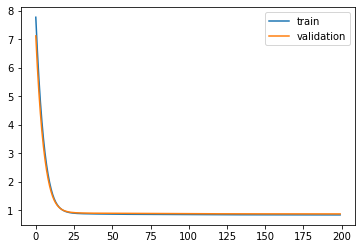

Time to train LSTM:  153.35520100593567
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 7s - loss: 7.9183 - pdc_loss: 0.7130 - event_loss: 0.6853 - val_loss: 7.2505 - val_pdc_loss: 0.7066 - val_event_loss: 0.6537

Epoch 00001: val_loss improved from inf to 7.25048, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 6.7508 - pdc_loss: 0.6927 - event_loss: 0.6281 - val_loss: 6.1746 - val_pdc_loss: 0.6882 - val_event_loss: 0.6026

Epoch 00002: val_loss improved from 7.25048 to 6.17455, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 5.7464 - pdc_loss: 0.6753 - event_loss: 0.5819 - val_loss: 5.2549 - val_pdc_loss: 0.6715 - val_event_loss: 0.5600

Epoch 00003: val_loss improved from 6.17455 to 5.25493, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 4.8921 - pdc_loss: 0.6599 - event_loss: 0.5423 - val_loss: 4.4755 - val_pdc_loss: 0.6562 - val_event_loss: 0.5219

Epoch 00004: val_loss improved from 5.25493 to 4.47554, saving 


Epoch 00035: val_loss improved from 0.87805 to 0.87696, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 0.8752 - pdc_loss: 0.5435 - event_loss: 0.3181 - val_loss: 0.8758 - val_pdc_loss: 0.5439 - val_event_loss: 0.3183

Epoch 00036: val_loss improved from 0.87696 to 0.87580, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 0.8742 - pdc_loss: 0.5427 - event_loss: 0.3180 - val_loss: 0.8747 - val_pdc_loss: 0.5431 - val_event_loss: 0.3182

Epoch 00037: val_loss improved from 0.87580 to 0.87473, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 0.8732 - pdc_loss: 0.5419 - event_loss: 0.3179 - val_loss: 0.8736 - val_pdc_loss: 0.5421 - val_event_loss: 0.3182

Epoch 00038: val_loss improved from 0.87473 to 0.87364, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 0.8723 - pdc_loss: 0.5411 - event_loss: 0.3178 - val_loss: 0.8727 - val_pdc_loss: 0.5413 - val_event_loss: 0.3181

Epoch 00039: val_loss improved from 0.87364 to 

 - 1s - loss: 0.8553 - pdc_loss: 0.5273 - event_loss: 0.3164 - val_loss: 0.8581 - val_pdc_loss: 0.5295 - val_event_loss: 0.3171

Epoch 00070: val_loss improved from 0.85826 to 0.85811, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.8549 - pdc_loss: 0.5271 - event_loss: 0.3164 - val_loss: 0.8581 - val_pdc_loss: 0.5295 - val_event_loss: 0.3171

Epoch 00071: val_loss improved from 0.85811 to 0.85809, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8546 - pdc_loss: 0.5269 - event_loss: 0.3163 - val_loss: 0.8577 - val_pdc_loss: 0.5292 - val_event_loss: 0.3171

Epoch 00072: val_loss improved from 0.85809 to 0.85768, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8543 - pdc_loss: 0.5267 - event_loss: 0.3163 - val_loss: 0.8573 - val_pdc_loss: 0.5290 - val_event_loss: 0.3170

Epoch 00073: val_loss improved from 0.85768 to 0.85732, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8540 - pdc_loss: 0.5265 - event_


Epoch 00107: val_loss improved from 0.85309 to 0.85261, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.8478 - pdc_loss: 0.5218 - event_loss: 0.3159 - val_loss: 0.8523 - val_pdc_loss: 0.5257 - val_event_loss: 0.3166

Epoch 00108: val_loss improved from 0.85261 to 0.85226, saving model to Event_val_weights5.hdf5
Epoch 109/200
 - 1s - loss: 0.8476 - pdc_loss: 0.5216 - event_loss: 0.3159 - val_loss: 0.8523 - val_pdc_loss: 0.5258 - val_event_loss: 0.3165

Epoch 00109: val_loss improved from 0.85226 to 0.85225, saving model to Event_val_weights5.hdf5
Epoch 110/200
 - 1s - loss: 0.8474 - pdc_loss: 0.5216 - event_loss: 0.3159 - val_loss: 0.8517 - val_pdc_loss: 0.5253 - val_event_loss: 0.3165

Epoch 00110: val_loss improved from 0.85225 to 0.85172, saving model to Event_val_weights5.hdf5
Epoch 111/200
 - 1s - loss: 0.8473 - pdc_loss: 0.5214 - event_loss: 0.3159 - val_loss: 0.8516 - val_pdc_loss: 0.5251 - val_event_loss: 0.3165

Epoch 00111: val_loss improved from 0.85172

 - 1s - loss: 0.8433 - pdc_loss: 0.5188 - event_loss: 0.3154 - val_loss: 0.8487 - val_pdc_loss: 0.5233 - val_event_loss: 0.3164

Epoch 00143: val_loss improved from 0.84899 to 0.84874, saving model to Event_val_weights5.hdf5
Epoch 144/200
 - 1s - loss: 0.8432 - pdc_loss: 0.5188 - event_loss: 0.3154 - val_loss: 0.8489 - val_pdc_loss: 0.5234 - val_event_loss: 0.3164

Epoch 00144: val_loss did not improve from 0.84874
Epoch 145/200
 - 1s - loss: 0.8430 - pdc_loss: 0.5186 - event_loss: 0.3153 - val_loss: 0.8487 - val_pdc_loss: 0.5232 - val_event_loss: 0.3164

Epoch 00145: val_loss improved from 0.84874 to 0.84870, saving model to Event_val_weights5.hdf5
Epoch 146/200
 - 1s - loss: 0.8430 - pdc_loss: 0.5187 - event_loss: 0.3153 - val_loss: 0.8485 - val_pdc_loss: 0.5232 - val_event_loss: 0.3163

Epoch 00146: val_loss improved from 0.84870 to 0.84854, saving model to Event_val_weights5.hdf5
Epoch 147/200
 - 1s - loss: 0.8429 - pdc_loss: 0.5185 - event_loss: 0.3153 - val_loss: 0.8486 - val_pdc


Epoch 00180: val_loss did not improve from 0.84659
Epoch 181/200
 - 1s - loss: 0.8404 - pdc_loss: 0.5169 - event_loss: 0.3150 - val_loss: 0.8464 - val_pdc_loss: 0.5216 - val_event_loss: 0.3164

Epoch 00181: val_loss improved from 0.84659 to 0.84642, saving model to Event_val_weights5.hdf5
Epoch 182/200
 - 1s - loss: 0.8403 - pdc_loss: 0.5169 - event_loss: 0.3150 - val_loss: 0.8465 - val_pdc_loss: 0.5217 - val_event_loss: 0.3164

Epoch 00182: val_loss did not improve from 0.84642
Epoch 183/200
 - 1s - loss: 0.8402 - pdc_loss: 0.5168 - event_loss: 0.3150 - val_loss: 0.8464 - val_pdc_loss: 0.5216 - val_event_loss: 0.3164

Epoch 00183: val_loss improved from 0.84642 to 0.84641, saving model to Event_val_weights5.hdf5
Epoch 184/200
 - 1s - loss: 0.8402 - pdc_loss: 0.5169 - event_loss: 0.3150 - val_loss: 0.8463 - val_pdc_loss: 0.5215 - val_event_loss: 0.3164

Epoch 00184: val_loss improved from 0.84641 to 0.84634, saving model to Event_val_weights5.hdf5
Epoch 185/200
 - 1s - loss: 0.8401 - 

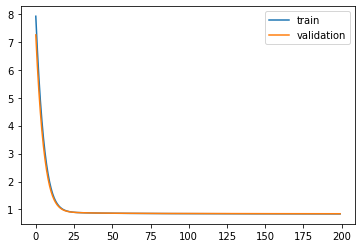

Time to train LSTM:  151.7294819355011
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 8s - loss: 5.6965 - pdc_loss: 0.8575 - event_loss: 0.7327 - val_loss: 5.2133 - val_pdc_loss: 0.8019 - val_event_loss: 0.6765

Epoch 00001: val_loss improved from inf to 5.21325, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 4.8841 - pdc_loss: 0.7843 - event_loss: 0.6399 - val_loss: 4.4782 - val_pdc_loss: 0.7455 - val_event_loss: 0.6012

Epoch 00002: val_loss improved from 5.21325 to 4.47823, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 4.2072 - pdc_loss: 0.7375 - event_loss: 0.5785 - val_loss: 3.8632 - val_pdc_loss: 0.7079 - val_event_loss: 0.5494

Epoch 00003: val_loss improved from 4.47823 to 3.86318, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 3.6375 - pdc_loss: 0.7035 - event_loss: 0.5346 - val_loss: 3.3449 - val_pdc_loss: 0.6795 - val_event_loss: 0.5099

Epoch 00004: val_loss improved from 3.86318 to 3.34493, saving m


Epoch 00035: val_loss improved from 0.86376 to 0.86266, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 0.8645 - pdc_loss: 0.5320 - event_loss: 0.3183 - val_loss: 0.8617 - val_pdc_loss: 0.5342 - val_event_loss: 0.3135

Epoch 00036: val_loss improved from 0.86266 to 0.86172, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 0.8636 - pdc_loss: 0.5314 - event_loss: 0.3183 - val_loss: 0.8609 - val_pdc_loss: 0.5336 - val_event_loss: 0.3135

Epoch 00037: val_loss improved from 0.86172 to 0.86091, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 0.8627 - pdc_loss: 0.5308 - event_loss: 0.3183 - val_loss: 0.8600 - val_pdc_loss: 0.5331 - val_event_loss: 0.3134

Epoch 00038: val_loss improved from 0.86091 to 0.85996, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 0.8618 - pdc_loss: 0.5302 - event_loss: 0.3183 - val_loss: 0.8592 - val_pdc_loss: 0.5326 - val_event_loss: 0.3134

Epoch 00039: val_loss improved from 0.85996 to 

 - 1s - loss: 0.8485 - pdc_loss: 0.5218 - event_loss: 0.3170 - val_loss: 0.8479 - val_pdc_loss: 0.5261 - val_event_loss: 0.3122

Epoch 00071: val_loss improved from 0.84812 to 0.84795, saving model to Event_val_weights1.hdf5
Epoch 72/200
 - 1s - loss: 0.8482 - pdc_loss: 0.5216 - event_loss: 0.3169 - val_loss: 0.8478 - val_pdc_loss: 0.5260 - val_event_loss: 0.3122

Epoch 00072: val_loss improved from 0.84795 to 0.84784, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.8479 - pdc_loss: 0.5215 - event_loss: 0.3169 - val_loss: 0.8480 - val_pdc_loss: 0.5261 - val_event_loss: 0.3123

Epoch 00073: val_loss did not improve from 0.84784
Epoch 74/200
 - 1s - loss: 0.8477 - pdc_loss: 0.5214 - event_loss: 0.3168 - val_loss: 0.8475 - val_pdc_loss: 0.5259 - val_event_loss: 0.3121

Epoch 00074: val_loss improved from 0.84784 to 0.84750, saving model to Event_val_weights1.hdf5
Epoch 75/200
 - 1s - loss: 0.8475 - pdc_loss: 0.5212 - event_loss: 0.3168 - val_loss: 0.8477 - val_pdc_los


Epoch 00108: val_loss improved from 0.84271 to 0.84261, saving model to Event_val_weights1.hdf5
Epoch 109/200
 - 1s - loss: 0.8415 - pdc_loss: 0.5173 - event_loss: 0.3157 - val_loss: 0.8426 - val_pdc_loss: 0.5223 - val_event_loss: 0.3117

Epoch 00109: val_loss improved from 0.84261 to 0.84258, saving model to Event_val_weights1.hdf5
Epoch 110/200
 - 1s - loss: 0.8414 - pdc_loss: 0.5172 - event_loss: 0.3157 - val_loss: 0.8424 - val_pdc_loss: 0.5223 - val_event_loss: 0.3116

Epoch 00110: val_loss improved from 0.84258 to 0.84238, saving model to Event_val_weights1.hdf5
Epoch 111/200
 - 1s - loss: 0.8413 - pdc_loss: 0.5171 - event_loss: 0.3157 - val_loss: 0.8425 - val_pdc_loss: 0.5222 - val_event_loss: 0.3117

Epoch 00111: val_loss did not improve from 0.84238
Epoch 112/200
 - 1s - loss: 0.8412 - pdc_loss: 0.5170 - event_loss: 0.3156 - val_loss: 0.8421 - val_pdc_loss: 0.5221 - val_event_loss: 0.3115

Epoch 00112: val_loss improved from 0.84238 to 0.84211, saving model to Event_val_weight

 - 1s - loss: 0.8377 - pdc_loss: 0.5146 - event_loss: 0.3152 - val_loss: 0.8400 - val_pdc_loss: 0.5206 - val_event_loss: 0.3114

Epoch 00147: val_loss improved from 0.84025 to 0.84001, saving model to Event_val_weights1.hdf5
Epoch 148/200
 - 1s - loss: 0.8377 - pdc_loss: 0.5146 - event_loss: 0.3152 - val_loss: 0.8404 - val_pdc_loss: 0.5210 - val_event_loss: 0.3114

Epoch 00148: val_loss did not improve from 0.84001
Epoch 149/200
 - 1s - loss: 0.8376 - pdc_loss: 0.5145 - event_loss: 0.3152 - val_loss: 0.8402 - val_pdc_loss: 0.5208 - val_event_loss: 0.3115

Epoch 00149: val_loss did not improve from 0.84001
Epoch 150/200
 - 1s - loss: 0.8376 - pdc_loss: 0.5145 - event_loss: 0.3151 - val_loss: 0.8402 - val_pdc_loss: 0.5207 - val_event_loss: 0.3115

Epoch 00150: val_loss did not improve from 0.84001
Epoch 151/200
 - 1s - loss: 0.8375 - pdc_loss: 0.5144 - event_loss: 0.3151 - val_loss: 0.8404 - val_pdc_loss: 0.5208 - val_event_loss: 0.3117

Epoch 00151: val_loss did not improve from 0.84001

 - 1s - loss: 0.8356 - pdc_loss: 0.5133 - event_loss: 0.3147 - val_loss: 0.8390 - val_pdc_loss: 0.5201 - val_event_loss: 0.3113

Epoch 00186: val_loss did not improve from 0.83890
Epoch 187/200
 - 1s - loss: 0.8355 - pdc_loss: 0.5132 - event_loss: 0.3147 - val_loss: 0.8391 - val_pdc_loss: 0.5202 - val_event_loss: 0.3113

Epoch 00187: val_loss did not improve from 0.83890
Epoch 188/200
 - 1s - loss: 0.8354 - pdc_loss: 0.5132 - event_loss: 0.3147 - val_loss: 0.8391 - val_pdc_loss: 0.5204 - val_event_loss: 0.3112

Epoch 00188: val_loss did not improve from 0.83890
Epoch 189/200
 - 1s - loss: 0.8354 - pdc_loss: 0.5132 - event_loss: 0.3147 - val_loss: 0.8387 - val_pdc_loss: 0.5200 - val_event_loss: 0.3111

Epoch 00189: val_loss improved from 0.83890 to 0.83868, saving model to Event_val_weights1.hdf5
Epoch 190/200
 - 1s - loss: 0.8354 - pdc_loss: 0.5132 - event_loss: 0.3147 - val_loss: 0.8393 - val_pdc_loss: 0.5203 - val_event_loss: 0.3114

Epoch 00190: val_loss did not improve from 0.83868

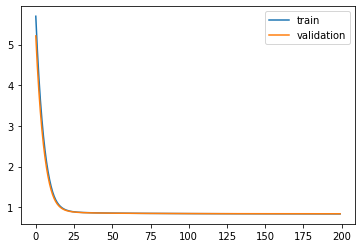

Time to train LSTM:  151.6826560497284
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 8s - loss: 5.4785 - pdc_loss: 0.6948 - event_loss: 0.7352 - val_loss: 5.0417 - val_pdc_loss: 0.6911 - val_event_loss: 0.6791

Epoch 00001: val_loss improved from inf to 5.04171, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 4.7199 - pdc_loss: 0.6860 - event_loss: 0.6396 - val_loss: 4.3497 - val_pdc_loss: 0.6819 - val_event_loss: 0.6040

Epoch 00002: val_loss improved from 5.04171 to 4.34970, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 4.0720 - pdc_loss: 0.6758 - event_loss: 0.5729 - val_loss: 3.7568 - val_pdc_loss: 0.6707 - val_event_loss: 0.5477

Epoch 00003: val_loss improved from 4.34970 to 3.75677, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 3.5175 - pdc_loss: 0.6638 - event_loss: 0.5206 - val_loss: 3.2489 - val_pdc_loss: 0.6576 - val_event_loss: 0.5001

Epoch 00004: val_loss improved from 3.75677 to 3.24887, saving m


Epoch 00035: val_loss improved from 0.88464 to 0.88358, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 0.8691 - pdc_loss: 0.5392 - event_loss: 0.3169 - val_loss: 0.8822 - val_pdc_loss: 0.5455 - val_event_loss: 0.3237

Epoch 00036: val_loss improved from 0.88358 to 0.88223, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 0.8678 - pdc_loss: 0.5380 - event_loss: 0.3168 - val_loss: 0.8809 - val_pdc_loss: 0.5444 - val_event_loss: 0.3236

Epoch 00037: val_loss improved from 0.88223 to 0.88093, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 0.8665 - pdc_loss: 0.5369 - event_loss: 0.3167 - val_loss: 0.8797 - val_pdc_loss: 0.5432 - val_event_loss: 0.3236

Epoch 00038: val_loss improved from 0.88093 to 0.87967, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 0.8651 - pdc_loss: 0.5356 - event_loss: 0.3167 - val_loss: 0.8783 - val_pdc_loss: 0.5419 - val_event_loss: 0.3235

Epoch 00039: val_loss improved from 0.87967 to 

 - 1s - loss: 0.8448 - pdc_loss: 0.5198 - event_loss: 0.3152 - val_loss: 0.8599 - val_pdc_loss: 0.5286 - val_event_loss: 0.3214

Epoch 00070: val_loss improved from 0.86019 to 0.85989, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.8446 - pdc_loss: 0.5197 - event_loss: 0.3151 - val_loss: 0.8599 - val_pdc_loss: 0.5287 - val_event_loss: 0.3214

Epoch 00071: val_loss improved from 0.85989 to 0.85986, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.8443 - pdc_loss: 0.5195 - event_loss: 0.3151 - val_loss: 0.8596 - val_pdc_loss: 0.5285 - val_event_loss: 0.3213

Epoch 00072: val_loss improved from 0.85986 to 0.85956, saving model to Event_val_weights2.hdf5
Epoch 73/200
 - 1s - loss: 0.8441 - pdc_loss: 0.5193 - event_loss: 0.3151 - val_loss: 0.8595 - val_pdc_loss: 0.5284 - val_event_loss: 0.3214

Epoch 00073: val_loss improved from 0.85956 to 0.85946, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.8439 - pdc_loss: 0.5192 - event_


Epoch 00106: val_loss did not improve from 0.85488
Epoch 107/200
 - 1s - loss: 0.8386 - pdc_loss: 0.5153 - event_loss: 0.3144 - val_loss: 0.8551 - val_pdc_loss: 0.5256 - val_event_loss: 0.3207

Epoch 00107: val_loss did not improve from 0.85488
Epoch 108/200
 - 1s - loss: 0.8385 - pdc_loss: 0.5153 - event_loss: 0.3144 - val_loss: 0.8547 - val_pdc_loss: 0.5251 - val_event_loss: 0.3208

Epoch 00108: val_loss improved from 0.85488 to 0.85473, saving model to Event_val_weights2.hdf5
Epoch 109/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5152 - event_loss: 0.3144 - val_loss: 0.8548 - val_pdc_loss: 0.5252 - val_event_loss: 0.3208

Epoch 00109: val_loss did not improve from 0.85473
Epoch 110/200
 - 1s - loss: 0.8383 - pdc_loss: 0.5151 - event_loss: 0.3144 - val_loss: 0.8543 - val_pdc_loss: 0.5248 - val_event_loss: 0.3207

Epoch 00110: val_loss improved from 0.85473 to 0.85426, saving model to Event_val_weights2.hdf5
Epoch 111/200
 - 1s - loss: 0.8382 - pdc_loss: 0.5150 - event_loss: 0.3144 - val_l


Epoch 00145: val_loss did not improve from 0.85235
Epoch 146/200
 - 1s - loss: 0.8353 - pdc_loss: 0.5132 - event_loss: 0.3138 - val_loss: 0.8525 - val_pdc_loss: 0.5240 - val_event_loss: 0.3202

Epoch 00146: val_loss did not improve from 0.85235
Epoch 147/200
 - 1s - loss: 0.8352 - pdc_loss: 0.5132 - event_loss: 0.3138 - val_loss: 0.8520 - val_pdc_loss: 0.5236 - val_event_loss: 0.3202

Epoch 00147: val_loss improved from 0.85235 to 0.85205, saving model to Event_val_weights2.hdf5
Epoch 148/200
 - 1s - loss: 0.8352 - pdc_loss: 0.5131 - event_loss: 0.3138 - val_loss: 0.8523 - val_pdc_loss: 0.5239 - val_event_loss: 0.3202

Epoch 00148: val_loss did not improve from 0.85205
Epoch 149/200
 - 1s - loss: 0.8351 - pdc_loss: 0.5131 - event_loss: 0.3138 - val_loss: 0.8522 - val_pdc_loss: 0.5238 - val_event_loss: 0.3201

Epoch 00149: val_loss did not improve from 0.85205
Epoch 150/200
 - 1s - loss: 0.8350 - pdc_loss: 0.5130 - event_loss: 0.3138 - val_loss: 0.8524 - val_pdc_loss: 0.5237 - val_even

 - 1s - loss: 0.8330 - pdc_loss: 0.5119 - event_loss: 0.3130 - val_loss: 0.8520 - val_pdc_loss: 0.5234 - val_event_loss: 0.3206

Epoch 00187: val_loss did not improve from 0.85177
Epoch 188/200
 - 1s - loss: 0.8329 - pdc_loss: 0.5119 - event_loss: 0.3130 - val_loss: 0.8520 - val_pdc_loss: 0.5234 - val_event_loss: 0.3207

Epoch 00188: val_loss did not improve from 0.85177
Epoch 189/200
 - 1s - loss: 0.8328 - pdc_loss: 0.5119 - event_loss: 0.3130 - val_loss: 0.8519 - val_pdc_loss: 0.5233 - val_event_loss: 0.3207

Epoch 00189: val_loss did not improve from 0.85177
Epoch 190/200
 - 1s - loss: 0.8327 - pdc_loss: 0.5119 - event_loss: 0.3130 - val_loss: 0.8517 - val_pdc_loss: 0.5231 - val_event_loss: 0.3207

Epoch 00190: val_loss improved from 0.85177 to 0.85173, saving model to Event_val_weights2.hdf5
Epoch 191/200
 - 1s - loss: 0.8327 - pdc_loss: 0.5118 - event_loss: 0.3129 - val_loss: 0.8521 - val_pdc_loss: 0.5234 - val_event_loss: 0.3208

Epoch 00191: val_loss did not improve from 0.85173

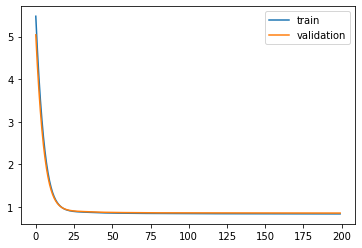

Time to train LSTM:  151.73766946792603
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 8s - loss: 5.4980 - pdc_loss: 0.7314 - event_loss: 0.6763 - val_loss: 5.0522 - val_pdc_loss: 0.7147 - val_event_loss: 0.6303

Epoch 00001: val_loss improved from inf to 5.05216, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 4.7291 - pdc_loss: 0.7028 - event_loss: 0.6004 - val_loss: 4.3512 - val_pdc_loss: 0.6911 - val_event_loss: 0.5690

Epoch 00002: val_loss improved from 5.05216 to 4.35120, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 4.0740 - pdc_loss: 0.6802 - event_loss: 0.5458 - val_loss: 3.7557 - val_pdc_loss: 0.6730 - val_event_loss: 0.5224

Epoch 00003: val_loss improved from 4.35120 to 3.75571, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 3.5183 - pdc_loss: 0.6623 - event_loss: 0.5027 - val_loss: 3.2515 - val_pdc_loss: 0.6581 - val_event_loss: 0.4841

Epoch 00004: val_loss improved from 3.75571 to 3.25145, saving 


Epoch 00035: val_loss improved from 0.88558 to 0.88457, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 0.8631 - pdc_loss: 0.5332 - event_loss: 0.3166 - val_loss: 0.8836 - val_pdc_loss: 0.5477 - val_event_loss: 0.3226

Epoch 00036: val_loss improved from 0.88457 to 0.88363, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 0.8620 - pdc_loss: 0.5323 - event_loss: 0.3165 - val_loss: 0.8828 - val_pdc_loss: 0.5470 - val_event_loss: 0.3227

Epoch 00037: val_loss improved from 0.88363 to 0.88283, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 0.8609 - pdc_loss: 0.5314 - event_loss: 0.3164 - val_loss: 0.8820 - val_pdc_loss: 0.5463 - val_event_loss: 0.3227

Epoch 00038: val_loss improved from 0.88283 to 0.88201, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 0.8598 - pdc_loss: 0.5306 - event_loss: 0.3163 - val_loss: 0.8815 - val_pdc_loss: 0.5458 - val_event_loss: 0.3228

Epoch 00039: val_loss improved from 0.88201 to 


Epoch 00070: val_loss improved from 0.87160 to 0.87126, saving model to Event_val_weights3.hdf5
Epoch 71/200
 - 1s - loss: 0.8444 - pdc_loss: 0.5195 - event_loss: 0.3151 - val_loss: 0.8711 - val_pdc_loss: 0.5385 - val_event_loss: 0.3228

Epoch 00071: val_loss improved from 0.87126 to 0.87115, saving model to Event_val_weights3.hdf5
Epoch 72/200
 - 1s - loss: 0.8441 - pdc_loss: 0.5192 - event_loss: 0.3151 - val_loss: 0.8709 - val_pdc_loss: 0.5384 - val_event_loss: 0.3228

Epoch 00072: val_loss improved from 0.87115 to 0.87093, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.8439 - pdc_loss: 0.5191 - event_loss: 0.3151 - val_loss: 0.8709 - val_pdc_loss: 0.5383 - val_event_loss: 0.3228

Epoch 00073: val_loss improved from 0.87093 to 0.87085, saving model to Event_val_weights3.hdf5
Epoch 74/200
 - 1s - loss: 0.8437 - pdc_loss: 0.5189 - event_loss: 0.3151 - val_loss: 0.8705 - val_pdc_loss: 0.5380 - val_event_loss: 0.3228

Epoch 00074: val_loss improved from 0.87085 to 


Epoch 00107: val_loss improved from 0.86615 to 0.86609, saving model to Event_val_weights3.hdf5
Epoch 108/200
 - 1s - loss: 0.8372 - pdc_loss: 0.5146 - event_loss: 0.3141 - val_loss: 0.8661 - val_pdc_loss: 0.5350 - val_event_loss: 0.3227

Epoch 00108: val_loss did not improve from 0.86609
Epoch 109/200
 - 1s - loss: 0.8370 - pdc_loss: 0.5145 - event_loss: 0.3141 - val_loss: 0.8660 - val_pdc_loss: 0.5349 - val_event_loss: 0.3227

Epoch 00109: val_loss improved from 0.86609 to 0.86602, saving model to Event_val_weights3.hdf5
Epoch 110/200
 - 1s - loss: 0.8369 - pdc_loss: 0.5144 - event_loss: 0.3141 - val_loss: 0.8660 - val_pdc_loss: 0.5349 - val_event_loss: 0.3227

Epoch 00110: val_loss did not improve from 0.86602
Epoch 111/200
 - 1s - loss: 0.8368 - pdc_loss: 0.5143 - event_loss: 0.3140 - val_loss: 0.8656 - val_pdc_loss: 0.5346 - val_event_loss: 0.3226

Epoch 00111: val_loss improved from 0.86602 to 0.86562, saving model to Event_val_weights3.hdf5
Epoch 112/200
 - 1s - loss: 0.8366 - 


Epoch 00147: val_loss improved from 0.86440 to 0.86429, saving model to Event_val_weights3.hdf5
Epoch 148/200
 - 1s - loss: 0.8325 - pdc_loss: 0.5120 - event_loss: 0.3128 - val_loss: 0.8644 - val_pdc_loss: 0.5335 - val_event_loss: 0.3231

Epoch 00148: val_loss did not improve from 0.86429
Epoch 149/200
 - 1s - loss: 0.8324 - pdc_loss: 0.5119 - event_loss: 0.3128 - val_loss: 0.8645 - val_pdc_loss: 0.5335 - val_event_loss: 0.3233

Epoch 00149: val_loss did not improve from 0.86429
Epoch 150/200
 - 1s - loss: 0.8323 - pdc_loss: 0.5119 - event_loss: 0.3128 - val_loss: 0.8645 - val_pdc_loss: 0.5336 - val_event_loss: 0.3232

Epoch 00150: val_loss did not improve from 0.86429
Epoch 151/200
 - 1s - loss: 0.8322 - pdc_loss: 0.5118 - event_loss: 0.3128 - val_loss: 0.8644 - val_pdc_loss: 0.5335 - val_event_loss: 0.3233

Epoch 00151: val_loss did not improve from 0.86429
Epoch 152/200
 - 1s - loss: 0.8321 - pdc_loss: 0.5118 - event_loss: 0.3127 - val_loss: 0.8645 - val_pdc_loss: 0.5336 - val_even


Epoch 00187: val_loss did not improve from 0.86356
Epoch 188/200
 - 1s - loss: 0.8299 - pdc_loss: 0.5107 - event_loss: 0.3121 - val_loss: 0.8639 - val_pdc_loss: 0.5333 - val_event_loss: 0.3235

Epoch 00188: val_loss did not improve from 0.86356
Epoch 189/200
 - 1s - loss: 0.8298 - pdc_loss: 0.5106 - event_loss: 0.3121 - val_loss: 0.8637 - val_pdc_loss: 0.5332 - val_event_loss: 0.3233

Epoch 00189: val_loss did not improve from 0.86356
Epoch 190/200
 - 1s - loss: 0.8298 - pdc_loss: 0.5106 - event_loss: 0.3121 - val_loss: 0.8636 - val_pdc_loss: 0.5333 - val_event_loss: 0.3233

Epoch 00190: val_loss did not improve from 0.86356
Epoch 191/200
 - 1s - loss: 0.8297 - pdc_loss: 0.5106 - event_loss: 0.3120 - val_loss: 0.8635 - val_pdc_loss: 0.5331 - val_event_loss: 0.3233

Epoch 00191: val_loss improved from 0.86356 to 0.86347, saving model to Event_val_weights3.hdf5
Epoch 192/200
 - 1s - loss: 0.8296 - pdc_loss: 0.5105 - event_loss: 0.3120 - val_loss: 0.8635 - val_pdc_loss: 0.5331 - val_even

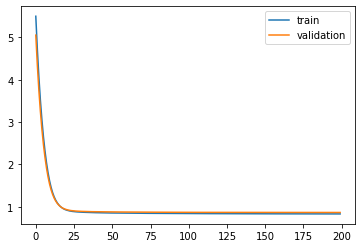

Time to train LSTM:  150.11741614341736


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f6a44f61f60>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 9s - loss: 5.3641 - pdc_loss: 0.6932 - event_loss: 0.7193 - val_loss: 4.9338 - val_pdc_loss: 0.6880 - val_event_loss: 0.6661

Epoch 00001: val_loss improved from inf to 4.93375, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 4.6099 - pdc_loss: 0.6760 - event_loss: 0.6273 - val_loss: 4.2486 - val_pdc_loss: 0.6746 - val_event_loss: 0.5926

Epoch 00002: val_loss improved from 4.93375 to 4.24856, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 3.9722 - pdc_loss: 0.6632 - event_loss: 0.5639 - val_loss: 3.6712 - val_pdc_loss: 0.6646 - val_event_loss: 0.5414

Epoch 00003: val_loss improved from 4.24856 to 3.67118, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 3.4346 - pdc_loss: 0.6530 - event_loss: 0.5177 - val_loss: 3.1843 - val_pdc_loss: 0.6553 - val_event_loss: 0.5025

Epoch 00004: val_loss improved from 3.67118 to 3.18426, saving model to Event_val_weights4.hdf5
Epoch 5


Epoch 00035: val_loss improved from 0.88928 to 0.88854, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 0.8597 - pdc_loss: 0.5299 - event_loss: 0.3162 - val_loss: 0.8879 - val_pdc_loss: 0.5470 - val_event_loss: 0.3274

Epoch 00036: val_loss improved from 0.88854 to 0.88791, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 0.8585 - pdc_loss: 0.5290 - event_loss: 0.3162 - val_loss: 0.8872 - val_pdc_loss: 0.5466 - val_event_loss: 0.3274

Epoch 00037: val_loss improved from 0.88791 to 0.88723, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 0.8574 - pdc_loss: 0.5281 - event_loss: 0.3162 - val_loss: 0.8865 - val_pdc_loss: 0.5461 - val_event_loss: 0.3274

Epoch 00038: val_loss improved from 0.88723 to 0.88653, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 0.8564 - pdc_loss: 0.5273 - event_loss: 0.3161 - val_loss: 0.8857 - val_pdc_loss: 0.5455 - val_event_loss: 0.3274

Epoch 00039: val_loss improved from 0.88653 to 


Epoch 00070: val_loss improved from 0.87271 to 0.87242, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.8399 - pdc_loss: 0.5158 - event_loss: 0.3145 - val_loss: 0.8722 - val_pdc_loss: 0.5368 - val_event_loss: 0.3257

Epoch 00071: val_loss improved from 0.87242 to 0.87218, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.8396 - pdc_loss: 0.5156 - event_loss: 0.3144 - val_loss: 0.8720 - val_pdc_loss: 0.5367 - val_event_loss: 0.3258

Epoch 00072: val_loss improved from 0.87218 to 0.87202, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.8394 - pdc_loss: 0.5155 - event_loss: 0.3144 - val_loss: 0.8718 - val_pdc_loss: 0.5365 - val_event_loss: 0.3257

Epoch 00073: val_loss improved from 0.87202 to 0.87180, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.8392 - pdc_loss: 0.5153 - event_loss: 0.3143 - val_loss: 0.8716 - val_pdc_loss: 0.5364 - val_event_loss: 0.3257

Epoch 00074: val_loss improved from 0.87180 to 


Epoch 00106: val_loss did not improve from 0.86819
Epoch 107/200
 - 1s - loss: 0.8342 - pdc_loss: 0.5122 - event_loss: 0.3135 - val_loss: 0.8681 - val_pdc_loss: 0.5340 - val_event_loss: 0.3256

Epoch 00107: val_loss improved from 0.86819 to 0.86808, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.8341 - pdc_loss: 0.5122 - event_loss: 0.3135 - val_loss: 0.8681 - val_pdc_loss: 0.5340 - val_event_loss: 0.3257

Epoch 00108: val_loss did not improve from 0.86808
Epoch 109/200
 - 1s - loss: 0.8340 - pdc_loss: 0.5121 - event_loss: 0.3135 - val_loss: 0.8679 - val_pdc_loss: 0.5339 - val_event_loss: 0.3256

Epoch 00109: val_loss improved from 0.86808 to 0.86793, saving model to Event_val_weights4.hdf5
Epoch 110/200
 - 1s - loss: 0.8339 - pdc_loss: 0.5121 - event_loss: 0.3134 - val_loss: 0.8679 - val_pdc_loss: 0.5339 - val_event_loss: 0.3256

Epoch 00110: val_loss did not improve from 0.86793
Epoch 111/200
 - 1s - loss: 0.8338 - pdc_loss: 0.5120 - event_loss: 0.3134 - val_l


Epoch 00143: val_loss improved from 0.86650 to 0.86650, saving model to Event_val_weights4.hdf5
Epoch 144/200
 - 1s - loss: 0.8315 - pdc_loss: 0.5108 - event_loss: 0.3129 - val_loss: 0.8664 - val_pdc_loss: 0.5329 - val_event_loss: 0.3257

Epoch 00144: val_loss improved from 0.86650 to 0.86644, saving model to Event_val_weights4.hdf5
Epoch 145/200
 - 1s - loss: 0.8315 - pdc_loss: 0.5108 - event_loss: 0.3129 - val_loss: 0.8664 - val_pdc_loss: 0.5330 - val_event_loss: 0.3257

Epoch 00145: val_loss did not improve from 0.86644
Epoch 146/200
 - 1s - loss: 0.8314 - pdc_loss: 0.5107 - event_loss: 0.3129 - val_loss: 0.8664 - val_pdc_loss: 0.5329 - val_event_loss: 0.3258

Epoch 00146: val_loss improved from 0.86644 to 0.86639, saving model to Event_val_weights4.hdf5
Epoch 147/200
 - 1s - loss: 0.8313 - pdc_loss: 0.5107 - event_loss: 0.3129 - val_loss: 0.8663 - val_pdc_loss: 0.5329 - val_event_loss: 0.3257

Epoch 00147: val_loss improved from 0.86639 to 0.86635, saving model to Event_val_weight

 - 1s - loss: 0.8297 - pdc_loss: 0.5099 - event_loss: 0.3126 - val_loss: 0.8652 - val_pdc_loss: 0.5320 - val_event_loss: 0.3259

Epoch 00180: val_loss improved from 0.86519 to 0.86517, saving model to Event_val_weights4.hdf5
Epoch 181/200
 - 1s - loss: 0.8297 - pdc_loss: 0.5099 - event_loss: 0.3126 - val_loss: 0.8651 - val_pdc_loss: 0.5320 - val_event_loss: 0.3259

Epoch 00181: val_loss improved from 0.86517 to 0.86513, saving model to Event_val_weights4.hdf5
Epoch 182/200
 - 1s - loss: 0.8297 - pdc_loss: 0.5099 - event_loss: 0.3126 - val_loss: 0.8652 - val_pdc_loss: 0.5319 - val_event_loss: 0.3260

Epoch 00182: val_loss did not improve from 0.86513
Epoch 183/200
 - 1s - loss: 0.8296 - pdc_loss: 0.5098 - event_loss: 0.3126 - val_loss: 0.8651 - val_pdc_loss: 0.5319 - val_event_loss: 0.3259

Epoch 00183: val_loss did not improve from 0.86513
Epoch 184/200
 - 1s - loss: 0.8296 - pdc_loss: 0.5098 - event_loss: 0.3125 - val_loss: 0.8652 - val_pdc_loss: 0.5319 - val_event_loss: 0.3260

Epoch

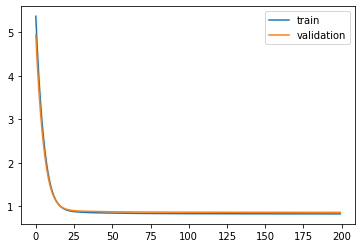

Time to train LSTM:  161.86025667190552
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 9s - loss: 5.4872 - pdc_loss: 0.7116 - event_loss: 0.7067 - val_loss: 5.0497 - val_pdc_loss: 0.7040 - val_event_loss: 0.6616

Epoch 00001: val_loss improved from inf to 5.04975, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 4.7315 - pdc_loss: 0.6957 - event_loss: 0.6336 - val_loss: 4.3537 - val_pdc_loss: 0.6897 - val_event_loss: 0.5972

Epoch 00002: val_loss improved from 5.04975 to 4.35372, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 4.0812 - pdc_loss: 0.6817 - event_loss: 0.5758 - val_loss: 3.7578 - val_pdc_loss: 0.6770 - val_event_loss: 0.5450

Epoch 00003: val_loss improved from 4.35372 to 3.75785, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 3.5270 - pdc_loss: 0.6698 - event_loss: 0.5284 - val_loss: 3.2519 - val_pdc_loss: 0.6659 - val_event_loss: 0.5013

Epoch 00004: val_loss improved from 3.75785 to 3.25190, saving 


Epoch 00035: val_loss improved from 0.87054 to 0.86930, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 0.8657 - pdc_loss: 0.5344 - event_loss: 0.3180 - val_loss: 0.8681 - val_pdc_loss: 0.5356 - val_event_loss: 0.3192

Epoch 00036: val_loss improved from 0.86930 to 0.86808, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 0.8646 - pdc_loss: 0.5334 - event_loss: 0.3179 - val_loss: 0.8671 - val_pdc_loss: 0.5346 - val_event_loss: 0.3193

Epoch 00037: val_loss improved from 0.86808 to 0.86706, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 0.8635 - pdc_loss: 0.5326 - event_loss: 0.3178 - val_loss: 0.8662 - val_pdc_loss: 0.5338 - val_event_loss: 0.3194

Epoch 00038: val_loss improved from 0.86706 to 0.86619, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 0.8625 - pdc_loss: 0.5318 - event_loss: 0.3178 - val_loss: 0.8653 - val_pdc_loss: 0.5329 - val_event_loss: 0.3194

Epoch 00039: val_loss improved from 0.86619 to 

 - 1s - loss: 0.8447 - pdc_loss: 0.5191 - event_loss: 0.3159 - val_loss: 0.8496 - val_pdc_loss: 0.5227 - val_event_loss: 0.3173

Epoch 00070: val_loss improved from 0.84986 to 0.84960, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.8443 - pdc_loss: 0.5189 - event_loss: 0.3158 - val_loss: 0.8493 - val_pdc_loss: 0.5224 - val_event_loss: 0.3174

Epoch 00071: val_loss improved from 0.84960 to 0.84928, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8441 - pdc_loss: 0.5188 - event_loss: 0.3158 - val_loss: 0.8490 - val_pdc_loss: 0.5223 - val_event_loss: 0.3172

Epoch 00072: val_loss improved from 0.84928 to 0.84900, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8438 - pdc_loss: 0.5186 - event_loss: 0.3158 - val_loss: 0.8488 - val_pdc_loss: 0.5222 - val_event_loss: 0.3173

Epoch 00073: val_loss improved from 0.84900 to 0.84884, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8435 - pdc_loss: 0.5185 - event_

 - 1s - loss: 0.8387 - pdc_loss: 0.5156 - event_loss: 0.3149 - val_loss: 0.8445 - val_pdc_loss: 0.5197 - val_event_loss: 0.3166

Epoch 00107: val_loss did not improve from 0.84441
Epoch 108/200
 - 1s - loss: 0.8388 - pdc_loss: 0.5157 - event_loss: 0.3149 - val_loss: 0.8442 - val_pdc_loss: 0.5195 - val_event_loss: 0.3165

Epoch 00108: val_loss improved from 0.84441 to 0.84422, saving model to Event_val_weights5.hdf5
Epoch 109/200
 - 1s - loss: 0.8386 - pdc_loss: 0.5156 - event_loss: 0.3149 - val_loss: 0.8444 - val_pdc_loss: 0.5196 - val_event_loss: 0.3165

Epoch 00109: val_loss did not improve from 0.84422
Epoch 110/200
 - 1s - loss: 0.8385 - pdc_loss: 0.5155 - event_loss: 0.3148 - val_loss: 0.8442 - val_pdc_loss: 0.5197 - val_event_loss: 0.3163

Epoch 00110: val_loss did not improve from 0.84422
Epoch 111/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5154 - event_loss: 0.3148 - val_loss: 0.8444 - val_pdc_loss: 0.5197 - val_event_loss: 0.3165

Epoch 00111: val_loss did not improve from 0.84422


Epoch 00148: val_loss did not improve from 0.84371
Epoch 149/200
 - 1s - loss: 0.8360 - pdc_loss: 0.5139 - event_loss: 0.3143 - val_loss: 0.8441 - val_pdc_loss: 0.5200 - val_event_loss: 0.3163

Epoch 00149: val_loss did not improve from 0.84371
Epoch 150/200
 - 1s - loss: 0.8360 - pdc_loss: 0.5140 - event_loss: 0.3142 - val_loss: 0.8442 - val_pdc_loss: 0.5201 - val_event_loss: 0.3162

Epoch 00150: val_loss did not improve from 0.84371
Epoch 151/200
 - 1s - loss: 0.8358 - pdc_loss: 0.5138 - event_loss: 0.3142 - val_loss: 0.8443 - val_pdc_loss: 0.5201 - val_event_loss: 0.3163

Epoch 00151: val_loss did not improve from 0.84371
Epoch 152/200
 - 1s - loss: 0.8359 - pdc_loss: 0.5139 - event_loss: 0.3142 - val_loss: 0.8440 - val_pdc_loss: 0.5200 - val_event_loss: 0.3162

Epoch 00152: val_loss did not improve from 0.84371
Epoch 153/200
 - 1s - loss: 0.8358 - pdc_loss: 0.5138 - event_loss: 0.3142 - val_loss: 0.8442 - val_pdc_loss: 0.5200 - val_event_loss: 0.3163

Epoch 00153: val_loss did not


Epoch 00187: val_loss did not improve from 0.84257
Epoch 188/200
 - 1s - loss: 0.8340 - pdc_loss: 0.5127 - event_loss: 0.3138 - val_loss: 0.8424 - val_pdc_loss: 0.5191 - val_event_loss: 0.3159

Epoch 00188: val_loss improved from 0.84257 to 0.84241, saving model to Event_val_weights5.hdf5
Epoch 189/200
 - 1s - loss: 0.8339 - pdc_loss: 0.5127 - event_loss: 0.3137 - val_loss: 0.8426 - val_pdc_loss: 0.5192 - val_event_loss: 0.3159

Epoch 00189: val_loss did not improve from 0.84241
Epoch 190/200
 - 1s - loss: 0.8338 - pdc_loss: 0.5126 - event_loss: 0.3137 - val_loss: 0.8424 - val_pdc_loss: 0.5190 - val_event_loss: 0.3159

Epoch 00190: val_loss improved from 0.84241 to 0.84238, saving model to Event_val_weights5.hdf5
Epoch 191/200
 - 1s - loss: 0.8338 - pdc_loss: 0.5126 - event_loss: 0.3137 - val_loss: 0.8425 - val_pdc_loss: 0.5192 - val_event_loss: 0.3159

Epoch 00191: val_loss did not improve from 0.84238
Epoch 192/200
 - 1s - loss: 0.8338 - pdc_loss: 0.5126 - event_loss: 0.3137 - val_l

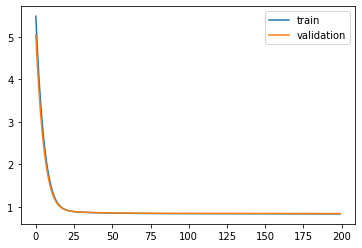

Time to train LSTM:  151.8427860736847
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 10s - loss: 4.6921 - pdc_loss: 0.6965 - event_loss: 0.7085 - val_loss: 4.3280 - val_pdc_loss: 0.6879 - val_event_loss: 0.6626

Epoch 00001: val_loss improved from inf to 4.32803, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 4.0751 - pdc_loss: 0.6799 - event_loss: 0.6452 - val_loss: 3.7608 - val_pdc_loss: 0.6740 - val_event_loss: 0.6077

Epoch 00002: val_loss improved from 4.32803 to 3.76080, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 3.5469 - pdc_loss: 0.6678 - event_loss: 0.5965 - val_loss: 3.2766 - val_pdc_loss: 0.6635 - val_event_loss: 0.5631

Epoch 00003: val_loss improved from 3.76080 to 3.27658, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 3.0957 - pdc_loss: 0.6576 - event_loss: 0.5550 - val_loss: 2.8631 - val_pdc_loss: 0.6537 - val_event_loss: 0.5228

Epoch 00004: val_loss improved from 3.27658 to 2.86308, saving 


Epoch 00035: val_loss improved from 0.85210 to 0.85107, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 0.8560 - pdc_loss: 0.5268 - event_loss: 0.3170 - val_loss: 0.8504 - val_pdc_loss: 0.5266 - val_event_loss: 0.3117

Epoch 00036: val_loss improved from 0.85107 to 0.85041, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 0.8553 - pdc_loss: 0.5264 - event_loss: 0.3169 - val_loss: 0.8496 - val_pdc_loss: 0.5261 - val_event_loss: 0.3116

Epoch 00037: val_loss improved from 0.85041 to 0.84964, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 0.8546 - pdc_loss: 0.5259 - event_loss: 0.3169 - val_loss: 0.8491 - val_pdc_loss: 0.5258 - val_event_loss: 0.3116

Epoch 00038: val_loss improved from 0.84964 to 0.84913, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 0.8540 - pdc_loss: 0.5256 - event_loss: 0.3168 - val_loss: 0.8485 - val_pdc_loss: 0.5254 - val_event_loss: 0.3115

Epoch 00039: val_loss improved from 0.84913 to 

 - 1s - loss: 0.8439 - pdc_loss: 0.5188 - event_loss: 0.3155 - val_loss: 0.8411 - val_pdc_loss: 0.5203 - val_event_loss: 0.3112

Epoch 00070: val_loss improved from 0.84115 to 0.84106, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 0.8437 - pdc_loss: 0.5186 - event_loss: 0.3155 - val_loss: 0.8408 - val_pdc_loss: 0.5202 - val_event_loss: 0.3111

Epoch 00071: val_loss improved from 0.84106 to 0.84078, saving model to Event_val_weights1.hdf5
Epoch 72/200
 - 1s - loss: 0.8435 - pdc_loss: 0.5185 - event_loss: 0.3155 - val_loss: 0.8407 - val_pdc_loss: 0.5200 - val_event_loss: 0.3112

Epoch 00072: val_loss improved from 0.84078 to 0.84067, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.8432 - pdc_loss: 0.5183 - event_loss: 0.3155 - val_loss: 0.8404 - val_pdc_loss: 0.5199 - val_event_loss: 0.3111

Epoch 00073: val_loss improved from 0.84067 to 0.84041, saving model to Event_val_weights1.hdf5
Epoch 74/200
 - 1s - loss: 0.8430 - pdc_loss: 0.5182 - event_

 - 1s - loss: 0.8391 - pdc_loss: 0.5159 - event_loss: 0.3149 - val_loss: 0.8371 - val_pdc_loss: 0.5181 - val_event_loss: 0.3106

Epoch 00106: val_loss did not improve from 0.83695
Epoch 107/200
 - 1s - loss: 0.8390 - pdc_loss: 0.5158 - event_loss: 0.3148 - val_loss: 0.8366 - val_pdc_loss: 0.5181 - val_event_loss: 0.3102

Epoch 00107: val_loss improved from 0.83695 to 0.83664, saving model to Event_val_weights1.hdf5
Epoch 108/200
 - 1s - loss: 0.8390 - pdc_loss: 0.5158 - event_loss: 0.3148 - val_loss: 0.8370 - val_pdc_loss: 0.5180 - val_event_loss: 0.3107

Epoch 00108: val_loss did not improve from 0.83664
Epoch 109/200
 - 1s - loss: 0.8389 - pdc_loss: 0.5158 - event_loss: 0.3148 - val_loss: 0.8365 - val_pdc_loss: 0.5180 - val_event_loss: 0.3102

Epoch 00109: val_loss improved from 0.83664 to 0.83653, saving model to Event_val_weights1.hdf5
Epoch 110/200
 - 1s - loss: 0.8389 - pdc_loss: 0.5158 - event_loss: 0.3148 - val_loss: 0.8366 - val_pdc_loss: 0.5179 - val_event_loss: 0.3105

Epoch


Epoch 00144: val_loss did not improve from 0.83414
Epoch 145/200
 - 1s - loss: 0.8367 - pdc_loss: 0.5147 - event_loss: 0.3142 - val_loss: 0.8341 - val_pdc_loss: 0.5169 - val_event_loss: 0.3095

Epoch 00145: val_loss improved from 0.83414 to 0.83409, saving model to Event_val_weights1.hdf5
Epoch 146/200
 - 1s - loss: 0.8366 - pdc_loss: 0.5147 - event_loss: 0.3142 - val_loss: 0.8342 - val_pdc_loss: 0.5169 - val_event_loss: 0.3096

Epoch 00146: val_loss did not improve from 0.83409
Epoch 147/200
 - 1s - loss: 0.8365 - pdc_loss: 0.5147 - event_loss: 0.3141 - val_loss: 0.8338 - val_pdc_loss: 0.5168 - val_event_loss: 0.3093

Epoch 00147: val_loss improved from 0.83409 to 0.83383, saving model to Event_val_weights1.hdf5
Epoch 148/200
 - 1s - loss: 0.8365 - pdc_loss: 0.5146 - event_loss: 0.3142 - val_loss: 0.8341 - val_pdc_loss: 0.5169 - val_event_loss: 0.3095

Epoch 00148: val_loss did not improve from 0.83383
Epoch 149/200
 - 1s - loss: 0.8364 - pdc_loss: 0.5146 - event_loss: 0.3141 - val_l


Epoch 00184: val_loss did not improve from 0.83271
Epoch 185/200
 - 1s - loss: 0.8348 - pdc_loss: 0.5138 - event_loss: 0.3137 - val_loss: 0.8328 - val_pdc_loss: 0.5165 - val_event_loss: 0.3091

Epoch 00185: val_loss did not improve from 0.83271
Epoch 186/200
 - 1s - loss: 0.8347 - pdc_loss: 0.5137 - event_loss: 0.3137 - val_loss: 0.8330 - val_pdc_loss: 0.5165 - val_event_loss: 0.3092

Epoch 00186: val_loss did not improve from 0.83271
Epoch 187/200
 - 1s - loss: 0.8347 - pdc_loss: 0.5137 - event_loss: 0.3137 - val_loss: 0.8330 - val_pdc_loss: 0.5165 - val_event_loss: 0.3093

Epoch 00187: val_loss did not improve from 0.83271
Epoch 188/200
 - 1s - loss: 0.8346 - pdc_loss: 0.5137 - event_loss: 0.3137 - val_loss: 0.8334 - val_pdc_loss: 0.5166 - val_event_loss: 0.3096

Epoch 00188: val_loss did not improve from 0.83271
Epoch 189/200
 - 1s - loss: 0.8346 - pdc_loss: 0.5137 - event_loss: 0.3137 - val_loss: 0.8328 - val_pdc_loss: 0.5164 - val_event_loss: 0.3091

Epoch 00189: val_loss did not

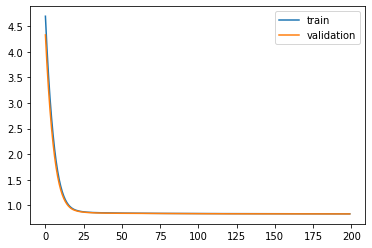

Time to train LSTM:  155.193430185318
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 12s - loss: 4.6488 - pdc_loss: 0.7087 - event_loss: 0.6441 - val_loss: 4.2846 - val_pdc_loss: 0.6933 - val_event_loss: 0.6029

Epoch 00001: val_loss improved from inf to 4.28461, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 4.0189 - pdc_loss: 0.6852 - event_loss: 0.5710 - val_loss: 3.7074 - val_pdc_loss: 0.6715 - val_event_loss: 0.5416

Epoch 00002: val_loss improved from 4.28461 to 3.70737, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 3.4767 - pdc_loss: 0.6630 - event_loss: 0.5145 - val_loss: 3.2138 - val_pdc_loss: 0.6512 - val_event_loss: 0.4943

Epoch 00003: val_loss improved from 3.70737 to 3.21378, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 3.0147 - pdc_loss: 0.6422 - event_loss: 0.4705 - val_loss: 2.7950 - val_pdc_loss: 0.6329 - val_event_loss: 0.4566

Epoch 00004: val_loss improved from 3.21378 to 2.79497, saving m


Epoch 00035: val_loss improved from 0.87097 to 0.86993, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 0.8547 - pdc_loss: 0.5266 - event_loss: 0.3156 - val_loss: 0.8692 - val_pdc_loss: 0.5346 - val_event_loss: 0.3222

Epoch 00036: val_loss improved from 0.86993 to 0.86916, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 0.8537 - pdc_loss: 0.5259 - event_loss: 0.3156 - val_loss: 0.8684 - val_pdc_loss: 0.5342 - val_event_loss: 0.3222

Epoch 00037: val_loss improved from 0.86916 to 0.86843, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 0.8527 - pdc_loss: 0.5253 - event_loss: 0.3155 - val_loss: 0.8678 - val_pdc_loss: 0.5338 - val_event_loss: 0.3222

Epoch 00038: val_loss improved from 0.86843 to 0.86775, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 0.8518 - pdc_loss: 0.5247 - event_loss: 0.3155 - val_loss: 0.8670 - val_pdc_loss: 0.5333 - val_event_loss: 0.3221

Epoch 00039: val_loss improved from 0.86775 to 


Epoch 00070: val_loss improved from 0.85758 to 0.85752, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.8389 - pdc_loss: 0.5163 - event_loss: 0.3138 - val_loss: 0.8574 - val_pdc_loss: 0.5281 - val_event_loss: 0.3204

Epoch 00071: val_loss improved from 0.85752 to 0.85738, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.8387 - pdc_loss: 0.5162 - event_loss: 0.3138 - val_loss: 0.8577 - val_pdc_loss: 0.5282 - val_event_loss: 0.3207

Epoch 00072: val_loss did not improve from 0.85738
Epoch 73/200
 - 1s - loss: 0.8386 - pdc_loss: 0.5160 - event_loss: 0.3137 - val_loss: 0.8574 - val_pdc_loss: 0.5279 - val_event_loss: 0.3207

Epoch 00073: val_loss did not improve from 0.85738
Epoch 74/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5159 - event_loss: 0.3137 - val_loss: 0.8574 - val_pdc_loss: 0.5280 - val_event_loss: 0.3206

Epoch 00074: val_loss did not improve from 0.85738
Epoch 75/200
 - 1s - loss: 0.8383 - pdc_loss: 0.5158 - event_loss: 0.3137 - val_loss: 

 - 1s - loss: 0.8350 - pdc_loss: 0.5140 - event_loss: 0.3129 - val_loss: 0.8544 - val_pdc_loss: 0.5263 - val_event_loss: 0.3199

Epoch 00109: val_loss improved from 0.85459 to 0.85437, saving model to Event_val_weights2.hdf5
Epoch 110/200
 - 1s - loss: 0.8349 - pdc_loss: 0.5139 - event_loss: 0.3128 - val_loss: 0.8543 - val_pdc_loss: 0.5262 - val_event_loss: 0.3199

Epoch 00110: val_loss improved from 0.85437 to 0.85425, saving model to Event_val_weights2.hdf5
Epoch 111/200
 - 1s - loss: 0.8348 - pdc_loss: 0.5138 - event_loss: 0.3128 - val_loss: 0.8539 - val_pdc_loss: 0.5260 - val_event_loss: 0.3198

Epoch 00111: val_loss improved from 0.85425 to 0.85392, saving model to Event_val_weights2.hdf5
Epoch 112/200
 - 1s - loss: 0.8347 - pdc_loss: 0.5138 - event_loss: 0.3128 - val_loss: 0.8538 - val_pdc_loss: 0.5259 - val_event_loss: 0.3198

Epoch 00112: val_loss improved from 0.85392 to 0.85382, saving model to Event_val_weights2.hdf5
Epoch 113/200
 - 1s - loss: 0.8346 - pdc_loss: 0.5137 - ev


Epoch 00146: val_loss did not improve from 0.85253
Epoch 147/200
 - 1s - loss: 0.8318 - pdc_loss: 0.5120 - event_loss: 0.3121 - val_loss: 0.8525 - val_pdc_loss: 0.5249 - val_event_loss: 0.3199

Epoch 00147: val_loss did not improve from 0.85253
Epoch 148/200
 - 1s - loss: 0.8317 - pdc_loss: 0.5120 - event_loss: 0.3120 - val_loss: 0.8527 - val_pdc_loss: 0.5250 - val_event_loss: 0.3199

Epoch 00148: val_loss did not improve from 0.85253
Epoch 149/200
 - 1s - loss: 0.8317 - pdc_loss: 0.5119 - event_loss: 0.3120 - val_loss: 0.8523 - val_pdc_loss: 0.5247 - val_event_loss: 0.3199

Epoch 00149: val_loss improved from 0.85253 to 0.85231, saving model to Event_val_weights2.hdf5
Epoch 150/200
 - 1s - loss: 0.8316 - pdc_loss: 0.5119 - event_loss: 0.3120 - val_loss: 0.8526 - val_pdc_loss: 0.5250 - val_event_loss: 0.3199

Epoch 00150: val_loss did not improve from 0.85231
Epoch 151/200
 - 1s - loss: 0.8315 - pdc_loss: 0.5118 - event_loss: 0.3120 - val_loss: 0.8525 - val_pdc_loss: 0.5248 - val_even


Epoch 00187: val_loss did not improve from 0.85176
Epoch 188/200
 - 1s - loss: 0.8297 - pdc_loss: 0.5109 - event_loss: 0.3115 - val_loss: 0.8522 - val_pdc_loss: 0.5241 - val_event_loss: 0.3207

Epoch 00188: val_loss did not improve from 0.85176
Epoch 189/200
 - 1s - loss: 0.8297 - pdc_loss: 0.5108 - event_loss: 0.3115 - val_loss: 0.8521 - val_pdc_loss: 0.5241 - val_event_loss: 0.3206

Epoch 00189: val_loss did not improve from 0.85176
Epoch 190/200
 - 1s - loss: 0.8297 - pdc_loss: 0.5108 - event_loss: 0.3115 - val_loss: 0.8521 - val_pdc_loss: 0.5240 - val_event_loss: 0.3207

Epoch 00190: val_loss did not improve from 0.85176
Epoch 191/200
 - 1s - loss: 0.8296 - pdc_loss: 0.5108 - event_loss: 0.3114 - val_loss: 0.8521 - val_pdc_loss: 0.5240 - val_event_loss: 0.3208

Epoch 00191: val_loss did not improve from 0.85176
Epoch 192/200
 - 1s - loss: 0.8296 - pdc_loss: 0.5108 - event_loss: 0.3114 - val_loss: 0.8522 - val_pdc_loss: 0.5241 - val_event_loss: 0.3208

Epoch 00192: val_loss did not

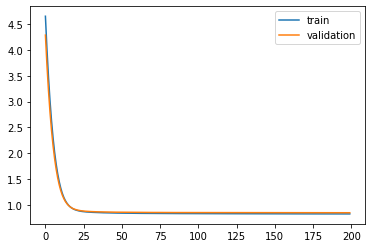

Time to train LSTM:  157.3006432056427
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 12s - loss: 4.7904 - pdc_loss: 0.7651 - event_loss: 0.7419 - val_loss: 4.3968 - val_pdc_loss: 0.7464 - val_event_loss: 0.6661

Epoch 00001: val_loss improved from inf to 4.39679, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 4.1259 - pdc_loss: 0.7366 - event_loss: 0.6255 - val_loss: 3.8000 - val_pdc_loss: 0.7205 - val_event_loss: 0.5788

Epoch 00002: val_loss improved from 4.39679 to 3.79996, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 3.5707 - pdc_loss: 0.7118 - event_loss: 0.5503 - val_loss: 3.2991 - val_pdc_loss: 0.6989 - val_event_loss: 0.5196

Epoch 00003: val_loss improved from 3.79996 to 3.29908, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 3.1031 - pdc_loss: 0.6901 - event_loss: 0.4972 - val_loss: 2.8757 - val_pdc_loss: 0.6801 - val_event_loss: 0.4746

Epoch 00004: val_loss improved from 3.29908 to 2.87569, saving 


Epoch 00035: val_loss improved from 0.88599 to 0.88492, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 0.8621 - pdc_loss: 0.5334 - event_loss: 0.3158 - val_loss: 0.8840 - val_pdc_loss: 0.5487 - val_event_loss: 0.3225

Epoch 00036: val_loss improved from 0.88492 to 0.88395, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 0.8611 - pdc_loss: 0.5327 - event_loss: 0.3157 - val_loss: 0.8832 - val_pdc_loss: 0.5482 - val_event_loss: 0.3225

Epoch 00037: val_loss improved from 0.88395 to 0.88325, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 0.8600 - pdc_loss: 0.5319 - event_loss: 0.3157 - val_loss: 0.8823 - val_pdc_loss: 0.5476 - val_event_loss: 0.3224

Epoch 00038: val_loss improved from 0.88325 to 0.88234, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 0.8591 - pdc_loss: 0.5312 - event_loss: 0.3156 - val_loss: 0.8815 - val_pdc_loss: 0.5470 - val_event_loss: 0.3224

Epoch 00039: val_loss improved from 0.88234 to 


Epoch 00070: val_loss improved from 0.87080 to 0.87048, saving model to Event_val_weights3.hdf5
Epoch 71/200
 - 1s - loss: 0.8437 - pdc_loss: 0.5205 - event_loss: 0.3140 - val_loss: 0.8704 - val_pdc_loss: 0.5389 - val_event_loss: 0.3222

Epoch 00071: val_loss improved from 0.87048 to 0.87038, saving model to Event_val_weights3.hdf5
Epoch 72/200
 - 1s - loss: 0.8435 - pdc_loss: 0.5203 - event_loss: 0.3139 - val_loss: 0.8703 - val_pdc_loss: 0.5388 - val_event_loss: 0.3222

Epoch 00072: val_loss improved from 0.87038 to 0.87031, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.8433 - pdc_loss: 0.5201 - event_loss: 0.3139 - val_loss: 0.8701 - val_pdc_loss: 0.5386 - val_event_loss: 0.3223

Epoch 00073: val_loss improved from 0.87031 to 0.87013, saving model to Event_val_weights3.hdf5
Epoch 74/200
 - 1s - loss: 0.8430 - pdc_loss: 0.5200 - event_loss: 0.3138 - val_loss: 0.8699 - val_pdc_loss: 0.5385 - val_event_loss: 0.3222

Epoch 00074: val_loss improved from 0.87013 to 


Epoch 00106: val_loss improved from 0.86705 to 0.86694, saving model to Event_val_weights3.hdf5
Epoch 107/200
 - 1s - loss: 0.8372 - pdc_loss: 0.5159 - event_loss: 0.3130 - val_loss: 0.8667 - val_pdc_loss: 0.5357 - val_event_loss: 0.3227

Epoch 00107: val_loss improved from 0.86694 to 0.86668, saving model to Event_val_weights3.hdf5
Epoch 108/200
 - 1s - loss: 0.8371 - pdc_loss: 0.5158 - event_loss: 0.3130 - val_loss: 0.8666 - val_pdc_loss: 0.5356 - val_event_loss: 0.3227

Epoch 00108: val_loss improved from 0.86668 to 0.86657, saving model to Event_val_weights3.hdf5
Epoch 109/200
 - 1s - loss: 0.8370 - pdc_loss: 0.5158 - event_loss: 0.3130 - val_loss: 0.8665 - val_pdc_loss: 0.5356 - val_event_loss: 0.3227

Epoch 00109: val_loss improved from 0.86657 to 0.86653, saving model to Event_val_weights3.hdf5
Epoch 110/200
 - 1s - loss: 0.8368 - pdc_loss: 0.5156 - event_loss: 0.3130 - val_loss: 0.8666 - val_pdc_loss: 0.5356 - val_event_loss: 0.3227

Epoch 00110: val_loss did not improve from 

 - 1s - loss: 0.8331 - pdc_loss: 0.5132 - event_loss: 0.3124 - val_loss: 0.8647 - val_pdc_loss: 0.5346 - val_event_loss: 0.3226

Epoch 00144: val_loss improved from 0.86475 to 0.86469, saving model to Event_val_weights3.hdf5
Epoch 145/200
 - 1s - loss: 0.8331 - pdc_loss: 0.5131 - event_loss: 0.3124 - val_loss: 0.8648 - val_pdc_loss: 0.5347 - val_event_loss: 0.3226

Epoch 00145: val_loss did not improve from 0.86469
Epoch 146/200
 - 1s - loss: 0.8330 - pdc_loss: 0.5131 - event_loss: 0.3124 - val_loss: 0.8646 - val_pdc_loss: 0.5345 - val_event_loss: 0.3226

Epoch 00146: val_loss improved from 0.86469 to 0.86460, saving model to Event_val_weights3.hdf5
Epoch 147/200
 - 1s - loss: 0.8329 - pdc_loss: 0.5130 - event_loss: 0.3124 - val_loss: 0.8647 - val_pdc_loss: 0.5346 - val_event_loss: 0.3226

Epoch 00147: val_loss did not improve from 0.86460
Epoch 148/200
 - 1s - loss: 0.8328 - pdc_loss: 0.5129 - event_loss: 0.3124 - val_loss: 0.8647 - val_pdc_loss: 0.5346 - val_event_loss: 0.3226

Epoch


Epoch 00183: val_loss did not improve from 0.86356
Epoch 184/200
 - 1s - loss: 0.8299 - pdc_loss: 0.5111 - event_loss: 0.3118 - val_loss: 0.8638 - val_pdc_loss: 0.5339 - val_event_loss: 0.3229

Epoch 00184: val_loss did not improve from 0.86356
Epoch 185/200
 - 1s - loss: 0.8299 - pdc_loss: 0.5112 - event_loss: 0.3118 - val_loss: 0.8635 - val_pdc_loss: 0.5338 - val_event_loss: 0.3228

Epoch 00185: val_loss improved from 0.86356 to 0.86355, saving model to Event_val_weights3.hdf5
Epoch 186/200
 - 1s - loss: 0.8298 - pdc_loss: 0.5111 - event_loss: 0.3117 - val_loss: 0.8634 - val_pdc_loss: 0.5336 - val_event_loss: 0.3229

Epoch 00186: val_loss improved from 0.86355 to 0.86340, saving model to Event_val_weights3.hdf5
Epoch 187/200
 - 1s - loss: 0.8297 - pdc_loss: 0.5111 - event_loss: 0.3117 - val_loss: 0.8636 - val_pdc_loss: 0.5338 - val_event_loss: 0.3228

Epoch 00187: val_loss did not improve from 0.86340
Epoch 188/200
 - 1s - loss: 0.8297 - pdc_loss: 0.5110 - event_loss: 0.3117 - val_l

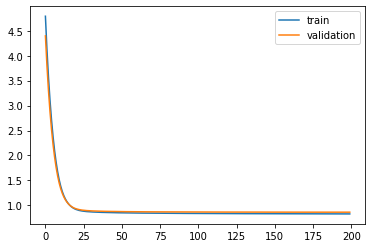

Time to train LSTM:  157.01317524909973
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 10s - loss: 4.7102 - pdc_loss: 0.7811 - event_loss: 0.6676 - val_loss: 4.3464 - val_pdc_loss: 0.7562 - val_event_loss: 0.6327

Epoch 00001: val_loss improved from inf to 4.34644, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 4.0755 - pdc_loss: 0.7351 - event_loss: 0.6057 - val_loss: 3.7660 - val_pdc_loss: 0.7191 - val_event_loss: 0.5775

Epoch 00002: val_loss improved from 4.34644 to 3.76601, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 3.5317 - pdc_loss: 0.7008 - event_loss: 0.5539 - val_loss: 3.2699 - val_pdc_loss: 0.6909 - val_event_loss: 0.5301

Epoch 00003: val_loss improved from 3.76601 to 3.26988, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 3.0683 - pdc_loss: 0.6747 - event_loss: 0.5093 - val_loss: 2.8474 - val_pdc_loss: 0.6683 - val_event_loss: 0.4890

Epoch 00004: val_loss improved from 3.26988 to 2.84740, saving


Epoch 00035: val_loss improved from 0.88560 to 0.88483, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 0.8578 - pdc_loss: 0.5294 - event_loss: 0.3157 - val_loss: 0.8841 - val_pdc_loss: 0.5451 - val_event_loss: 0.3265

Epoch 00036: val_loss improved from 0.88483 to 0.88412, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 0.8569 - pdc_loss: 0.5288 - event_loss: 0.3156 - val_loss: 0.8834 - val_pdc_loss: 0.5446 - val_event_loss: 0.3265

Epoch 00037: val_loss improved from 0.88412 to 0.88343, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 0.8560 - pdc_loss: 0.5281 - event_loss: 0.3156 - val_loss: 0.8829 - val_pdc_loss: 0.5442 - val_event_loss: 0.3264

Epoch 00038: val_loss improved from 0.88343 to 0.88286, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 0.8552 - pdc_loss: 0.5275 - event_loss: 0.3155 - val_loss: 0.8823 - val_pdc_loss: 0.5438 - val_event_loss: 0.3264

Epoch 00039: val_loss improved from 0.88286 to 

 - 1s - loss: 0.8411 - pdc_loss: 0.5176 - event_loss: 0.3142 - val_loss: 0.8719 - val_pdc_loss: 0.5369 - val_event_loss: 0.3257

Epoch 00070: val_loss improved from 0.87209 to 0.87194, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.8409 - pdc_loss: 0.5174 - event_loss: 0.3142 - val_loss: 0.8717 - val_pdc_loss: 0.5368 - val_event_loss: 0.3256

Epoch 00071: val_loss improved from 0.87194 to 0.87170, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.8405 - pdc_loss: 0.5171 - event_loss: 0.3142 - val_loss: 0.8714 - val_pdc_loss: 0.5365 - val_event_loss: 0.3257

Epoch 00072: val_loss improved from 0.87170 to 0.87136, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.8403 - pdc_loss: 0.5170 - event_loss: 0.3141 - val_loss: 0.8711 - val_pdc_loss: 0.5363 - val_event_loss: 0.3256

Epoch 00073: val_loss improved from 0.87136 to 0.87110, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.8400 - pdc_loss: 0.5167 - event_

 - 1s - loss: 0.8339 - pdc_loss: 0.5128 - event_loss: 0.3128 - val_loss: 0.8678 - val_pdc_loss: 0.5331 - val_event_loss: 0.3263

Epoch 00106: val_loss improved from 0.86787 to 0.86778, saving model to Event_val_weights4.hdf5
Epoch 107/200
 - 1s - loss: 0.8337 - pdc_loss: 0.5127 - event_loss: 0.3127 - val_loss: 0.8678 - val_pdc_loss: 0.5331 - val_event_loss: 0.3264

Epoch 00107: val_loss did not improve from 0.86778
Epoch 108/200
 - 1s - loss: 0.8336 - pdc_loss: 0.5126 - event_loss: 0.3127 - val_loss: 0.8677 - val_pdc_loss: 0.5330 - val_event_loss: 0.3264

Epoch 00108: val_loss improved from 0.86778 to 0.86769, saving model to Event_val_weights4.hdf5
Epoch 109/200
 - 1s - loss: 0.8335 - pdc_loss: 0.5126 - event_loss: 0.3127 - val_loss: 0.8678 - val_pdc_loss: 0.5331 - val_event_loss: 0.3265

Epoch 00109: val_loss did not improve from 0.86769
Epoch 110/200
 - 1s - loss: 0.8334 - pdc_loss: 0.5125 - event_loss: 0.3127 - val_loss: 0.8676 - val_pdc_loss: 0.5330 - val_event_loss: 0.3264

Epoch


Epoch 00143: val_loss did not improve from 0.86654
Epoch 144/200
 - 1s - loss: 0.8305 - pdc_loss: 0.5111 - event_loss: 0.3118 - val_loss: 0.8666 - val_pdc_loss: 0.5320 - val_event_loss: 0.3270

Epoch 00144: val_loss did not improve from 0.86654
Epoch 145/200
 - 1s - loss: 0.8305 - pdc_loss: 0.5111 - event_loss: 0.3118 - val_loss: 0.8669 - val_pdc_loss: 0.5323 - val_event_loss: 0.3270

Epoch 00145: val_loss did not improve from 0.86654
Epoch 146/200
 - 1s - loss: 0.8304 - pdc_loss: 0.5110 - event_loss: 0.3118 - val_loss: 0.8666 - val_pdc_loss: 0.5319 - val_event_loss: 0.3271

Epoch 00146: val_loss did not improve from 0.86654
Epoch 147/200
 - 1s - loss: 0.8304 - pdc_loss: 0.5110 - event_loss: 0.3118 - val_loss: 0.8668 - val_pdc_loss: 0.5321 - val_event_loss: 0.3271

Epoch 00147: val_loss did not improve from 0.86654
Epoch 148/200
 - 1s - loss: 0.8303 - pdc_loss: 0.5109 - event_loss: 0.3118 - val_loss: 0.8668 - val_pdc_loss: 0.5320 - val_event_loss: 0.3272

Epoch 00148: val_loss did not

 - 1s - loss: 0.8286 - pdc_loss: 0.5102 - event_loss: 0.3112 - val_loss: 0.8664 - val_pdc_loss: 0.5320 - val_event_loss: 0.3272

Epoch 00183: val_loss did not improve from 0.86633
Epoch 184/200
 - 1s - loss: 0.8286 - pdc_loss: 0.5102 - event_loss: 0.3112 - val_loss: 0.8664 - val_pdc_loss: 0.5319 - val_event_loss: 0.3273

Epoch 00184: val_loss did not improve from 0.86633
Epoch 185/200
 - 1s - loss: 0.8285 - pdc_loss: 0.5102 - event_loss: 0.3112 - val_loss: 0.8664 - val_pdc_loss: 0.5320 - val_event_loss: 0.3272

Epoch 00185: val_loss did not improve from 0.86633
Epoch 186/200
 - 1s - loss: 0.8285 - pdc_loss: 0.5102 - event_loss: 0.3112 - val_loss: 0.8663 - val_pdc_loss: 0.5319 - val_event_loss: 0.3273

Epoch 00186: val_loss improved from 0.86633 to 0.86633, saving model to Event_val_weights4.hdf5
Epoch 187/200
 - 1s - loss: 0.8284 - pdc_loss: 0.5102 - event_loss: 0.3111 - val_loss: 0.8663 - val_pdc_loss: 0.5319 - val_event_loss: 0.3273

Epoch 00187: val_loss improved from 0.86633 to 0.8

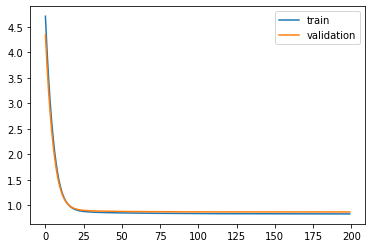

Time to train LSTM:  155.79557609558105
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 10s - loss: 4.6813 - pdc_loss: 0.7028 - event_loss: 0.6992 - val_loss: 4.3322 - val_pdc_loss: 0.6942 - val_event_loss: 0.6750

Epoch 00001: val_loss improved from inf to 4.33225, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 4.0779 - pdc_loss: 0.6894 - event_loss: 0.6565 - val_loss: 3.7747 - val_pdc_loss: 0.6816 - val_event_loss: 0.6354

Epoch 00002: val_loss improved from 4.33225 to 3.77474, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 3.5569 - pdc_loss: 0.6773 - event_loss: 0.6199 - val_loss: 3.2964 - val_pdc_loss: 0.6699 - val_event_loss: 0.6005

Epoch 00003: val_loss improved from 3.77474 to 3.29642, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 3.1108 - pdc_loss: 0.6656 - event_loss: 0.5863 - val_loss: 2.8874 - val_pdc_loss: 0.6583 - val_event_loss: 0.5669

Epoch 00004: val_loss improved from 3.29642 to 2.88738, saving


Epoch 00035: val_loss improved from 0.86986 to 0.86895, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 0.8658 - pdc_loss: 0.5348 - event_loss: 0.3179 - val_loss: 0.8681 - val_pdc_loss: 0.5364 - val_event_loss: 0.3186

Epoch 00036: val_loss improved from 0.86895 to 0.86807, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 0.8649 - pdc_loss: 0.5341 - event_loss: 0.3178 - val_loss: 0.8672 - val_pdc_loss: 0.5358 - val_event_loss: 0.3185

Epoch 00037: val_loss improved from 0.86807 to 0.86724, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 0.8641 - pdc_loss: 0.5335 - event_loss: 0.3178 - val_loss: 0.8664 - val_pdc_loss: 0.5351 - val_event_loss: 0.3185

Epoch 00038: val_loss improved from 0.86724 to 0.86641, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 0.8633 - pdc_loss: 0.5328 - event_loss: 0.3177 - val_loss: 0.8657 - val_pdc_loss: 0.5345 - val_event_loss: 0.3184

Epoch 00039: val_loss improved from 0.86641 to 

 - 1s - loss: 0.8478 - pdc_loss: 0.5218 - event_loss: 0.3160 - val_loss: 0.8513 - val_pdc_loss: 0.5238 - val_event_loss: 0.3175

Epoch 00070: val_loss improved from 0.85157 to 0.85134, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.8476 - pdc_loss: 0.5216 - event_loss: 0.3159 - val_loss: 0.8513 - val_pdc_loss: 0.5239 - val_event_loss: 0.3174

Epoch 00071: val_loss improved from 0.85134 to 0.85127, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8472 - pdc_loss: 0.5214 - event_loss: 0.3159 - val_loss: 0.8510 - val_pdc_loss: 0.5236 - val_event_loss: 0.3174

Epoch 00072: val_loss improved from 0.85127 to 0.85096, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8470 - pdc_loss: 0.5213 - event_loss: 0.3158 - val_loss: 0.8509 - val_pdc_loss: 0.5236 - val_event_loss: 0.3174

Epoch 00073: val_loss improved from 0.85096 to 0.85088, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8467 - pdc_loss: 0.5211 - event_

 - 1s - loss: 0.8409 - pdc_loss: 0.5176 - event_loss: 0.3146 - val_loss: 0.8461 - val_pdc_loss: 0.5208 - val_event_loss: 0.3165

Epoch 00105: val_loss improved from 0.84623 to 0.84609, saving model to Event_val_weights5.hdf5
Epoch 106/200
 - 1s - loss: 0.8408 - pdc_loss: 0.5175 - event_loss: 0.3145 - val_loss: 0.8459 - val_pdc_loss: 0.5206 - val_event_loss: 0.3166

Epoch 00106: val_loss improved from 0.84609 to 0.84592, saving model to Event_val_weights5.hdf5
Epoch 107/200
 - 1s - loss: 0.8407 - pdc_loss: 0.5175 - event_loss: 0.3145 - val_loss: 0.8459 - val_pdc_loss: 0.5207 - val_event_loss: 0.3165

Epoch 00107: val_loss improved from 0.84592 to 0.84590, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.8406 - pdc_loss: 0.5174 - event_loss: 0.3145 - val_loss: 0.8457 - val_pdc_loss: 0.5206 - val_event_loss: 0.3165

Epoch 00108: val_loss improved from 0.84590 to 0.84573, saving model to Event_val_weights5.hdf5
Epoch 109/200
 - 1s - loss: 0.8405 - pdc_loss: 0.5174 - ev

 - 1s - loss: 0.8372 - pdc_loss: 0.5155 - event_loss: 0.3137 - val_loss: 0.8442 - val_pdc_loss: 0.5202 - val_event_loss: 0.3161

Epoch 00142: val_loss did not improve from 0.84413
Epoch 143/200
 - 1s - loss: 0.8371 - pdc_loss: 0.5154 - event_loss: 0.3137 - val_loss: 0.8441 - val_pdc_loss: 0.5201 - val_event_loss: 0.3161

Epoch 00143: val_loss did not improve from 0.84413
Epoch 144/200
 - 1s - loss: 0.8370 - pdc_loss: 0.5154 - event_loss: 0.3137 - val_loss: 0.8440 - val_pdc_loss: 0.5200 - val_event_loss: 0.3161

Epoch 00144: val_loss improved from 0.84413 to 0.84400, saving model to Event_val_weights5.hdf5
Epoch 145/200
 - 1s - loss: 0.8369 - pdc_loss: 0.5153 - event_loss: 0.3137 - val_loss: 0.8440 - val_pdc_loss: 0.5201 - val_event_loss: 0.3161

Epoch 00145: val_loss did not improve from 0.84400
Epoch 146/200
 - 1s - loss: 0.8368 - pdc_loss: 0.5152 - event_loss: 0.3136 - val_loss: 0.8439 - val_pdc_loss: 0.5200 - val_event_loss: 0.3161

Epoch 00146: val_loss improved from 0.84400 to 0.8

 - 1s - loss: 0.8339 - pdc_loss: 0.5129 - event_loss: 0.3136 - val_loss: 0.8401 - val_pdc_loss: 0.5168 - val_event_loss: 0.3159

Epoch 00178: val_loss improved from 0.84009 to 0.84007, saving model to Event_val_weights5.hdf5
Epoch 179/200
 - 1s - loss: 0.8338 - pdc_loss: 0.5129 - event_loss: 0.3136 - val_loss: 0.8401 - val_pdc_loss: 0.5169 - val_event_loss: 0.3159

Epoch 00179: val_loss did not improve from 0.84007
Epoch 180/200
 - 1s - loss: 0.8337 - pdc_loss: 0.5128 - event_loss: 0.3136 - val_loss: 0.8401 - val_pdc_loss: 0.5168 - val_event_loss: 0.3159

Epoch 00180: val_loss did not improve from 0.84007
Epoch 181/200
 - 1s - loss: 0.8336 - pdc_loss: 0.5128 - event_loss: 0.3135 - val_loss: 0.8398 - val_pdc_loss: 0.5166 - val_event_loss: 0.3158

Epoch 00181: val_loss improved from 0.84007 to 0.83976, saving model to Event_val_weights5.hdf5
Epoch 182/200
 - 1s - loss: 0.8335 - pdc_loss: 0.5127 - event_loss: 0.3135 - val_loss: 0.8399 - val_pdc_loss: 0.5167 - val_event_loss: 0.3159

Epoch

Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f6a3598bda0>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


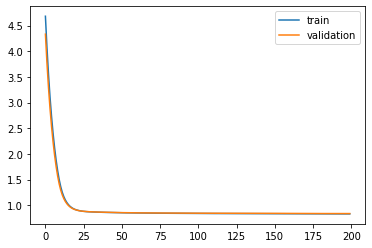

Time to train LSTM:  158.0183708667755
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 13s - loss: 4.0244 - pdc_loss: 0.7241 - event_loss: 0.6640 - val_loss: 3.7241 - val_pdc_loss: 0.7120 - val_event_loss: 0.6191

Epoch 00001: val_loss improved from inf to 3.72409, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 3.5066 - pdc_loss: 0.6986 - event_loss: 0.5941 - val_loss: 3.2476 - val_pdc_loss: 0.6885 - val_event_loss: 0.5585

Epoch 00002: val_loss improved from 3.72409 to 3.24761, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 3.0618 - pdc_loss: 0.6762 - event_loss: 0.5400 - val_loss: 2.8395 - val_pdc_loss: 0.6674 - val_event_loss: 0.5103

Epoch 00003: val_loss improved from 3.24761 to 2.83952, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 2.6812 - pdc_loss: 0.6559 - event_loss: 0.4959 - val_loss: 2.4916 - val_pdc_loss: 0.6486 - val_event_loss: 0.4703

Epoch 00004: val_loss improved from 2.83952 to 2.49165, saving 


Epoch 00035: val_loss improved from 0.86261 to 0.86174, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 0.8626 - pdc_loss: 0.5334 - event_loss: 0.3169 - val_loss: 0.8609 - val_pdc_loss: 0.5354 - val_event_loss: 0.3132

Epoch 00036: val_loss improved from 0.86174 to 0.86093, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 0.8619 - pdc_loss: 0.5328 - event_loss: 0.3168 - val_loss: 0.8602 - val_pdc_loss: 0.5349 - val_event_loss: 0.3131

Epoch 00037: val_loss improved from 0.86093 to 0.86022, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 0.8611 - pdc_loss: 0.5322 - event_loss: 0.3168 - val_loss: 0.8595 - val_pdc_loss: 0.5343 - val_event_loss: 0.3131

Epoch 00038: val_loss improved from 0.86022 to 0.85946, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 0.8604 - pdc_loss: 0.5317 - event_loss: 0.3167 - val_loss: 0.8588 - val_pdc_loss: 0.5338 - val_event_loss: 0.3131

Epoch 00039: val_loss improved from 0.85946 to 

 - 1s - loss: 0.8473 - pdc_loss: 0.5218 - event_loss: 0.3152 - val_loss: 0.8474 - val_pdc_loss: 0.5250 - val_event_loss: 0.3121

Epoch 00070: val_loss improved from 0.84747 to 0.84741, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 0.8470 - pdc_loss: 0.5216 - event_loss: 0.3151 - val_loss: 0.8470 - val_pdc_loss: 0.5248 - val_event_loss: 0.3119

Epoch 00071: val_loss improved from 0.84741 to 0.84705, saving model to Event_val_weights1.hdf5
Epoch 72/200
 - 1s - loss: 0.8467 - pdc_loss: 0.5214 - event_loss: 0.3151 - val_loss: 0.8470 - val_pdc_loss: 0.5247 - val_event_loss: 0.3120

Epoch 00072: val_loss improved from 0.84705 to 0.84695, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.8464 - pdc_loss: 0.5212 - event_loss: 0.3150 - val_loss: 0.8466 - val_pdc_loss: 0.5246 - val_event_loss: 0.3118

Epoch 00073: val_loss improved from 0.84695 to 0.84658, saving model to Event_val_weights1.hdf5
Epoch 74/200
 - 1s - loss: 0.8462 - pdc_loss: 0.5210 - event_

 - 1s - loss: 0.8395 - pdc_loss: 0.5160 - event_loss: 0.3144 - val_loss: 0.8399 - val_pdc_loss: 0.5198 - val_event_loss: 0.3110

Epoch 00106: val_loss improved from 0.84027 to 0.83987, saving model to Event_val_weights1.hdf5
Epoch 107/200
 - 1s - loss: 0.8393 - pdc_loss: 0.5159 - event_loss: 0.3143 - val_loss: 0.8401 - val_pdc_loss: 0.5198 - val_event_loss: 0.3112

Epoch 00107: val_loss did not improve from 0.83987
Epoch 108/200
 - 1s - loss: 0.8391 - pdc_loss: 0.5158 - event_loss: 0.3143 - val_loss: 0.8401 - val_pdc_loss: 0.5198 - val_event_loss: 0.3113

Epoch 00108: val_loss did not improve from 0.83987
Epoch 109/200
 - 1s - loss: 0.8390 - pdc_loss: 0.5157 - event_loss: 0.3142 - val_loss: 0.8398 - val_pdc_loss: 0.5195 - val_event_loss: 0.3113

Epoch 00109: val_loss improved from 0.83987 to 0.83982, saving model to Event_val_weights1.hdf5
Epoch 110/200
 - 1s - loss: 0.8388 - pdc_loss: 0.5156 - event_loss: 0.3142 - val_loss: 0.8396 - val_pdc_loss: 0.5196 - val_event_loss: 0.3110

Epoch

 - 1s - loss: 0.8352 - pdc_loss: 0.5135 - event_loss: 0.3133 - val_loss: 0.8366 - val_pdc_loss: 0.5178 - val_event_loss: 0.3104

Epoch 00142: val_loss improved from 0.83693 to 0.83660, saving model to Event_val_weights1.hdf5
Epoch 143/200
 - 1s - loss: 0.8350 - pdc_loss: 0.5134 - event_loss: 0.3133 - val_loss: 0.8369 - val_pdc_loss: 0.5178 - val_event_loss: 0.3108

Epoch 00143: val_loss did not improve from 0.83660
Epoch 144/200
 - 1s - loss: 0.8349 - pdc_loss: 0.5133 - event_loss: 0.3133 - val_loss: 0.8367 - val_pdc_loss: 0.5179 - val_event_loss: 0.3105

Epoch 00144: val_loss did not improve from 0.83660
Epoch 145/200
 - 1s - loss: 0.8348 - pdc_loss: 0.5132 - event_loss: 0.3132 - val_loss: 0.8367 - val_pdc_loss: 0.5177 - val_event_loss: 0.3106

Epoch 00145: val_loss did not improve from 0.83660
Epoch 146/200
 - 1s - loss: 0.8347 - pdc_loss: 0.5132 - event_loss: 0.3132 - val_loss: 0.8366 - val_pdc_loss: 0.5178 - val_event_loss: 0.3105

Epoch 00146: val_loss improved from 0.83660 to 0.8

 - 1s - loss: 0.8325 - pdc_loss: 0.5121 - event_loss: 0.3126 - val_loss: 0.8358 - val_pdc_loss: 0.5173 - val_event_loss: 0.3107

Epoch 00181: val_loss did not improve from 0.83539
Epoch 182/200
 - 1s - loss: 0.8324 - pdc_loss: 0.5120 - event_loss: 0.3126 - val_loss: 0.8353 - val_pdc_loss: 0.5172 - val_event_loss: 0.3103

Epoch 00182: val_loss improved from 0.83539 to 0.83531, saving model to Event_val_weights1.hdf5
Epoch 183/200
 - 1s - loss: 0.8323 - pdc_loss: 0.5120 - event_loss: 0.3126 - val_loss: 0.8353 - val_pdc_loss: 0.5172 - val_event_loss: 0.3104

Epoch 00183: val_loss did not improve from 0.83531
Epoch 184/200
 - 1s - loss: 0.8323 - pdc_loss: 0.5120 - event_loss: 0.3126 - val_loss: 0.8351 - val_pdc_loss: 0.5171 - val_event_loss: 0.3103

Epoch 00184: val_loss improved from 0.83531 to 0.83510, saving model to Event_val_weights1.hdf5
Epoch 185/200
 - 1s - loss: 0.8322 - pdc_loss: 0.5120 - event_loss: 0.3125 - val_loss: 0.8356 - val_pdc_loss: 0.5172 - val_event_loss: 0.3107

Epoch

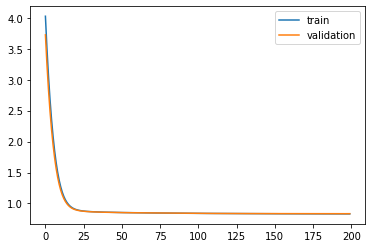

Time to train LSTM:  160.00619435310364
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 11s - loss: 4.0490 - pdc_loss: 0.7839 - event_loss: 0.6518 - val_loss: 3.7361 - val_pdc_loss: 0.7401 - val_event_loss: 0.6228

Epoch 00001: val_loss improved from inf to 3.73612, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 3.5171 - pdc_loss: 0.7156 - event_loss: 0.6048 - val_loss: 3.2541 - val_pdc_loss: 0.6887 - val_event_loss: 0.5789

Epoch 00002: val_loss improved from 3.73612 to 3.25413, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 3.0668 - pdc_loss: 0.6724 - event_loss: 0.5609 - val_loss: 2.8459 - val_pdc_loss: 0.6560 - val_event_loss: 0.5377

Epoch 00003: val_loss improved from 3.25413 to 2.84590, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 2.6851 - pdc_loss: 0.6438 - event_loss: 0.5201 - val_loss: 2.5007 - val_pdc_loss: 0.6346 - val_event_loss: 0.4997

Epoch 00004: val_loss improved from 2.84590 to 2.50071, saving


Epoch 00035: val_loss improved from 0.87295 to 0.87158, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 0.8548 - pdc_loss: 0.5259 - event_loss: 0.3165 - val_loss: 0.8702 - val_pdc_loss: 0.5348 - val_event_loss: 0.3232

Epoch 00036: val_loss improved from 0.87158 to 0.87019, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 0.8533 - pdc_loss: 0.5247 - event_loss: 0.3165 - val_loss: 0.8690 - val_pdc_loss: 0.5337 - val_event_loss: 0.3233

Epoch 00037: val_loss improved from 0.87019 to 0.86896, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 0.8519 - pdc_loss: 0.5236 - event_loss: 0.3165 - val_loss: 0.8675 - val_pdc_loss: 0.5324 - val_event_loss: 0.3234

Epoch 00038: val_loss improved from 0.86896 to 0.86749, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 0.8506 - pdc_loss: 0.5224 - event_loss: 0.3166 - val_loss: 0.8666 - val_pdc_loss: 0.5315 - val_event_loss: 0.3235

Epoch 00039: val_loss improved from 0.86749 to 

 - 1s - loss: 0.8366 - pdc_loss: 0.5132 - event_loss: 0.3152 - val_loss: 0.8559 - val_pdc_loss: 0.5255 - val_event_loss: 0.3222

Epoch 00071: val_loss improved from 0.85615 to 0.85593, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.8364 - pdc_loss: 0.5130 - event_loss: 0.3151 - val_loss: 0.8559 - val_pdc_loss: 0.5256 - val_event_loss: 0.3222

Epoch 00072: val_loss did not improve from 0.85593
Epoch 73/200
 - 1s - loss: 0.8362 - pdc_loss: 0.5129 - event_loss: 0.3151 - val_loss: 0.8558 - val_pdc_loss: 0.5255 - val_event_loss: 0.3221

Epoch 00073: val_loss improved from 0.85593 to 0.85582, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.8360 - pdc_loss: 0.5128 - event_loss: 0.3150 - val_loss: 0.8556 - val_pdc_loss: 0.5254 - val_event_loss: 0.3221

Epoch 00074: val_loss improved from 0.85582 to 0.85560, saving model to Event_val_weights2.hdf5
Epoch 75/200
 - 1s - loss: 0.8359 - pdc_loss: 0.5128 - event_loss: 0.3150 - val_loss: 0.8554 - val_pdc_los


Epoch 00109: val_loss improved from 0.85335 to 0.85317, saving model to Event_val_weights2.hdf5
Epoch 110/200
 - 1s - loss: 0.8320 - pdc_loss: 0.5107 - event_loss: 0.3140 - val_loss: 0.8532 - val_pdc_loss: 0.5246 - val_event_loss: 0.3214

Epoch 00110: val_loss did not improve from 0.85317
Epoch 111/200
 - 1s - loss: 0.8319 - pdc_loss: 0.5107 - event_loss: 0.3140 - val_loss: 0.8530 - val_pdc_loss: 0.5244 - val_event_loss: 0.3214

Epoch 00111: val_loss improved from 0.85317 to 0.85305, saving model to Event_val_weights2.hdf5
Epoch 112/200
 - 1s - loss: 0.8319 - pdc_loss: 0.5106 - event_loss: 0.3140 - val_loss: 0.8530 - val_pdc_loss: 0.5244 - val_event_loss: 0.3214

Epoch 00112: val_loss improved from 0.85305 to 0.85303, saving model to Event_val_weights2.hdf5
Epoch 113/200
 - 1s - loss: 0.8318 - pdc_loss: 0.5106 - event_loss: 0.3140 - val_loss: 0.8530 - val_pdc_loss: 0.5244 - val_event_loss: 0.3214

Epoch 00113: val_loss improved from 0.85303 to 0.85301, saving model to Event_val_weight


Epoch 00148: val_loss did not improve from 0.85188
Epoch 149/200
 - 1s - loss: 0.8298 - pdc_loss: 0.5094 - event_loss: 0.3133 - val_loss: 0.8521 - val_pdc_loss: 0.5237 - val_event_loss: 0.3214

Epoch 00149: val_loss did not improve from 0.85188
Epoch 150/200
 - 1s - loss: 0.8297 - pdc_loss: 0.5094 - event_loss: 0.3133 - val_loss: 0.8521 - val_pdc_loss: 0.5236 - val_event_loss: 0.3215

Epoch 00150: val_loss did not improve from 0.85188
Epoch 151/200
 - 1s - loss: 0.8297 - pdc_loss: 0.5094 - event_loss: 0.3133 - val_loss: 0.8521 - val_pdc_loss: 0.5236 - val_event_loss: 0.3214

Epoch 00151: val_loss did not improve from 0.85188
Epoch 152/200
 - 1s - loss: 0.8296 - pdc_loss: 0.5094 - event_loss: 0.3133 - val_loss: 0.8521 - val_pdc_loss: 0.5236 - val_event_loss: 0.3215

Epoch 00152: val_loss did not improve from 0.85188
Epoch 153/200
 - 1s - loss: 0.8296 - pdc_loss: 0.5093 - event_loss: 0.3133 - val_loss: 0.8520 - val_pdc_loss: 0.5236 - val_event_loss: 0.3214

Epoch 00153: val_loss did not

 - 1s - loss: 0.8281 - pdc_loss: 0.5085 - event_loss: 0.3127 - val_loss: 0.8518 - val_pdc_loss: 0.5237 - val_event_loss: 0.3212

Epoch 00190: val_loss did not improve from 0.85151
Epoch 191/200
 - 1s - loss: 0.8281 - pdc_loss: 0.5085 - event_loss: 0.3126 - val_loss: 0.8518 - val_pdc_loss: 0.5237 - val_event_loss: 0.3212

Epoch 00191: val_loss did not improve from 0.85151
Epoch 192/200
 - 1s - loss: 0.8281 - pdc_loss: 0.5085 - event_loss: 0.3126 - val_loss: 0.8519 - val_pdc_loss: 0.5238 - val_event_loss: 0.3212

Epoch 00192: val_loss did not improve from 0.85151
Epoch 193/200
 - 1s - loss: 0.8280 - pdc_loss: 0.5085 - event_loss: 0.3126 - val_loss: 0.8519 - val_pdc_loss: 0.5238 - val_event_loss: 0.3212

Epoch 00193: val_loss did not improve from 0.85151
Epoch 194/200
 - 1s - loss: 0.8280 - pdc_loss: 0.5085 - event_loss: 0.3126 - val_loss: 0.8520 - val_pdc_loss: 0.5239 - val_event_loss: 0.3212

Epoch 00194: val_loss did not improve from 0.85151
Epoch 195/200
 - 1s - loss: 0.8280 - pdc_los

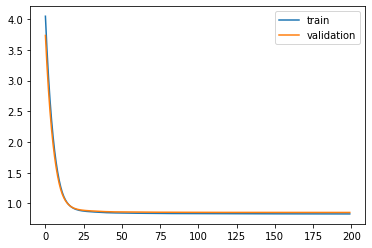

Time to train LSTM:  157.0097918510437
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 11s - loss: 4.1778 - pdc_loss: 0.7468 - event_loss: 0.7768 - val_loss: 3.8726 - val_pdc_loss: 0.7318 - val_event_loss: 0.7262

Epoch 00001: val_loss improved from inf to 3.87260, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 3.6371 - pdc_loss: 0.7108 - event_loss: 0.6888 - val_loss: 3.3797 - val_pdc_loss: 0.7008 - val_event_loss: 0.6532

Epoch 00002: val_loss improved from 3.87260 to 3.37972, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 3.1800 - pdc_loss: 0.6842 - event_loss: 0.6249 - val_loss: 2.9622 - val_pdc_loss: 0.6764 - val_event_loss: 0.5989

Epoch 00003: val_loss improved from 3.37972 to 2.96220, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 2.7917 - pdc_loss: 0.6625 - event_loss: 0.5755 - val_loss: 2.6077 - val_pdc_loss: 0.6567 - val_event_loss: 0.5548

Epoch 00004: val_loss improved from 2.96220 to 2.60770, saving 


Epoch 00035: val_loss improved from 0.88257 to 0.88142, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 0.8564 - pdc_loss: 0.5256 - event_loss: 0.3170 - val_loss: 0.8805 - val_pdc_loss: 0.5426 - val_event_loss: 0.3243

Epoch 00036: val_loss improved from 0.88142 to 0.88055, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 0.8552 - pdc_loss: 0.5246 - event_loss: 0.3170 - val_loss: 0.8798 - val_pdc_loss: 0.5420 - val_event_loss: 0.3244

Epoch 00037: val_loss improved from 0.88055 to 0.87985, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 0.8541 - pdc_loss: 0.5238 - event_loss: 0.3169 - val_loss: 0.8793 - val_pdc_loss: 0.5415 - val_event_loss: 0.3245

Epoch 00038: val_loss improved from 0.87985 to 0.87928, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 0.8531 - pdc_loss: 0.5230 - event_loss: 0.3169 - val_loss: 0.8786 - val_pdc_loss: 0.5410 - val_event_loss: 0.3245

Epoch 00039: val_loss improved from 0.87928 to 


Epoch 00070: val_loss did not improve from 0.86820
Epoch 71/200
 - 1s - loss: 0.8396 - pdc_loss: 0.5150 - event_loss: 0.3153 - val_loss: 0.8680 - val_pdc_loss: 0.5349 - val_event_loss: 0.3238

Epoch 00071: val_loss improved from 0.86820 to 0.86797, saving model to Event_val_weights3.hdf5
Epoch 72/200
 - 1s - loss: 0.8394 - pdc_loss: 0.5149 - event_loss: 0.3152 - val_loss: 0.8678 - val_pdc_loss: 0.5347 - val_event_loss: 0.3238

Epoch 00072: val_loss improved from 0.86797 to 0.86780, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.8392 - pdc_loss: 0.5147 - event_loss: 0.3152 - val_loss: 0.8676 - val_pdc_loss: 0.5346 - val_event_loss: 0.3237

Epoch 00073: val_loss improved from 0.86780 to 0.86756, saving model to Event_val_weights3.hdf5
Epoch 74/200
 - 1s - loss: 0.8390 - pdc_loss: 0.5147 - event_loss: 0.3152 - val_loss: 0.8675 - val_pdc_loss: 0.5347 - val_event_loss: 0.3237

Epoch 00074: val_loss improved from 0.86756 to 0.86751, saving model to Event_val_weights3.h


Epoch 00106: val_loss did not improve from 0.86376
Epoch 107/200
 - 1s - loss: 0.8341 - pdc_loss: 0.5118 - event_loss: 0.3142 - val_loss: 0.8637 - val_pdc_loss: 0.5325 - val_event_loss: 0.3231

Epoch 00107: val_loss improved from 0.86376 to 0.86370, saving model to Event_val_weights3.hdf5
Epoch 108/200
 - 1s - loss: 0.8340 - pdc_loss: 0.5118 - event_loss: 0.3141 - val_loss: 0.8636 - val_pdc_loss: 0.5325 - val_event_loss: 0.3230

Epoch 00108: val_loss improved from 0.86370 to 0.86363, saving model to Event_val_weights3.hdf5
Epoch 109/200
 - 1s - loss: 0.8339 - pdc_loss: 0.5117 - event_loss: 0.3141 - val_loss: 0.8636 - val_pdc_loss: 0.5325 - val_event_loss: 0.3230

Epoch 00109: val_loss improved from 0.86363 to 0.86359, saving model to Event_val_weights3.hdf5
Epoch 110/200
 - 1s - loss: 0.8338 - pdc_loss: 0.5116 - event_loss: 0.3141 - val_loss: 0.8634 - val_pdc_loss: 0.5323 - val_event_loss: 0.3230

Epoch 00110: val_loss improved from 0.86359 to 0.86338, saving model to Event_val_weight

 - 1s - loss: 0.8311 - pdc_loss: 0.5102 - event_loss: 0.3134 - val_loss: 0.8618 - val_pdc_loss: 0.5316 - val_event_loss: 0.3227

Epoch 00144: val_loss did not improve from 0.86174
Epoch 145/200
 - 1s - loss: 0.8310 - pdc_loss: 0.5101 - event_loss: 0.3134 - val_loss: 0.8616 - val_pdc_loss: 0.5314 - val_event_loss: 0.3227

Epoch 00145: val_loss improved from 0.86174 to 0.86161, saving model to Event_val_weights3.hdf5
Epoch 146/200
 - 1s - loss: 0.8310 - pdc_loss: 0.5101 - event_loss: 0.3134 - val_loss: 0.8616 - val_pdc_loss: 0.5314 - val_event_loss: 0.3227

Epoch 00146: val_loss did not improve from 0.86161
Epoch 147/200
 - 1s - loss: 0.8309 - pdc_loss: 0.5100 - event_loss: 0.3133 - val_loss: 0.8617 - val_pdc_loss: 0.5315 - val_event_loss: 0.3227

Epoch 00147: val_loss did not improve from 0.86161
Epoch 148/200
 - 1s - loss: 0.8309 - pdc_loss: 0.5101 - event_loss: 0.3133 - val_loss: 0.8617 - val_pdc_loss: 0.5315 - val_event_loss: 0.3227

Epoch 00148: val_loss did not improve from 0.86161

 - 1s - loss: 0.8292 - pdc_loss: 0.5092 - event_loss: 0.3128 - val_loss: 0.8606 - val_pdc_loss: 0.5309 - val_event_loss: 0.3226

Epoch 00183: val_loss did not improve from 0.86059
Epoch 184/200
 - 1s - loss: 0.8291 - pdc_loss: 0.5092 - event_loss: 0.3128 - val_loss: 0.8610 - val_pdc_loss: 0.5313 - val_event_loss: 0.3226

Epoch 00184: val_loss did not improve from 0.86059
Epoch 185/200
 - 1s - loss: 0.8291 - pdc_loss: 0.5092 - event_loss: 0.3128 - val_loss: 0.8606 - val_pdc_loss: 0.5309 - val_event_loss: 0.3226

Epoch 00185: val_loss improved from 0.86059 to 0.86057, saving model to Event_val_weights3.hdf5
Epoch 186/200
 - 1s - loss: 0.8290 - pdc_loss: 0.5091 - event_loss: 0.3128 - val_loss: 0.8609 - val_pdc_loss: 0.5312 - val_event_loss: 0.3226

Epoch 00186: val_loss did not improve from 0.86057
Epoch 187/200
 - 1s - loss: 0.8290 - pdc_loss: 0.5091 - event_loss: 0.3127 - val_loss: 0.8607 - val_pdc_loss: 0.5310 - val_event_loss: 0.3226

Epoch 00187: val_loss did not improve from 0.86057

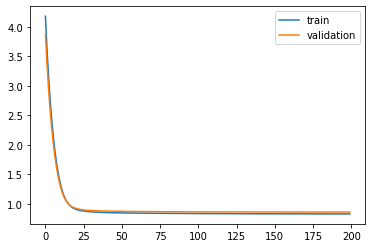

Time to train LSTM:  158.12680411338806
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 12s - loss: 4.1179 - pdc_loss: 0.7987 - event_loss: 0.7058 - val_loss: 3.8003 - val_pdc_loss: 0.7678 - val_event_loss: 0.6554

Epoch 00001: val_loss improved from inf to 3.80033, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 3.5771 - pdc_loss: 0.7484 - event_loss: 0.6259 - val_loss: 3.3138 - val_pdc_loss: 0.7281 - val_event_loss: 0.5909

Epoch 00002: val_loss improved from 3.80033 to 3.31378, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 3.1239 - pdc_loss: 0.7120 - event_loss: 0.5689 - val_loss: 2.9026 - val_pdc_loss: 0.6984 - val_event_loss: 0.5413

Epoch 00003: val_loss improved from 3.31378 to 2.90265, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 2.7400 - pdc_loss: 0.6840 - event_loss: 0.5231 - val_loss: 2.5530 - val_pdc_loss: 0.6743 - val_event_loss: 0.4994

Epoch 00004: val_loss improved from 2.90265 to 2.55298, saving


Epoch 00035: val_loss improved from 0.88383 to 0.88244, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 0.8538 - pdc_loss: 0.5236 - event_loss: 0.3167 - val_loss: 0.8814 - val_pdc_loss: 0.5406 - val_event_loss: 0.3275

Epoch 00036: val_loss improved from 0.88244 to 0.88143, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 0.8528 - pdc_loss: 0.5230 - event_loss: 0.3166 - val_loss: 0.8804 - val_pdc_loss: 0.5400 - val_event_loss: 0.3273

Epoch 00037: val_loss improved from 0.88143 to 0.88041, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 0.8519 - pdc_loss: 0.5224 - event_loss: 0.3165 - val_loss: 0.8798 - val_pdc_loss: 0.5397 - val_event_loss: 0.3273

Epoch 00038: val_loss improved from 0.88041 to 0.87977, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 0.8510 - pdc_loss: 0.5219 - event_loss: 0.3163 - val_loss: 0.8791 - val_pdc_loss: 0.5393 - val_event_loss: 0.3271

Epoch 00039: val_loss improved from 0.87977 to 


Epoch 00070: val_loss improved from 0.87099 to 0.87089, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.8377 - pdc_loss: 0.5145 - event_loss: 0.3141 - val_loss: 0.8709 - val_pdc_loss: 0.5361 - val_event_loss: 0.3257

Epoch 00071: val_loss did not improve from 0.87089
Epoch 72/200
 - 1s - loss: 0.8374 - pdc_loss: 0.5143 - event_loss: 0.3140 - val_loss: 0.8706 - val_pdc_loss: 0.5359 - val_event_loss: 0.3256

Epoch 00072: val_loss improved from 0.87089 to 0.87059, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.8372 - pdc_loss: 0.5142 - event_loss: 0.3140 - val_loss: 0.8704 - val_pdc_loss: 0.5358 - val_event_loss: 0.3256

Epoch 00073: val_loss improved from 0.87059 to 0.87039, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.8370 - pdc_loss: 0.5141 - event_loss: 0.3139 - val_loss: 0.8702 - val_pdc_loss: 0.5357 - val_event_loss: 0.3256

Epoch 00074: val_loss improved from 0.87039 to 0.87023, saving model to Event_val_weights4.h


Epoch 00106: val_loss improved from 0.86698 to 0.86683, saving model to Event_val_weights4.hdf5
Epoch 107/200
 - 1s - loss: 0.8324 - pdc_loss: 0.5113 - event_loss: 0.3130 - val_loss: 0.8667 - val_pdc_loss: 0.5333 - val_event_loss: 0.3254

Epoch 00107: val_loss improved from 0.86683 to 0.86675, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.8322 - pdc_loss: 0.5112 - event_loss: 0.3130 - val_loss: 0.8667 - val_pdc_loss: 0.5333 - val_event_loss: 0.3254

Epoch 00108: val_loss improved from 0.86675 to 0.86675, saving model to Event_val_weights4.hdf5
Epoch 109/200
 - 1s - loss: 0.8321 - pdc_loss: 0.5112 - event_loss: 0.3130 - val_loss: 0.8666 - val_pdc_loss: 0.5332 - val_event_loss: 0.3254

Epoch 00109: val_loss improved from 0.86675 to 0.86665, saving model to Event_val_weights4.hdf5
Epoch 110/200
 - 1s - loss: 0.8320 - pdc_loss: 0.5111 - event_loss: 0.3129 - val_loss: 0.8667 - val_pdc_loss: 0.5333 - val_event_loss: 0.3255

Epoch 00110: val_loss did not improve from 


Epoch 00145: val_loss did not improve from 0.86619
Epoch 146/200
 - 1s - loss: 0.8298 - pdc_loss: 0.5099 - event_loss: 0.3123 - val_loss: 0.8671 - val_pdc_loss: 0.5341 - val_event_loss: 0.3255

Epoch 00146: val_loss did not improve from 0.86619
Epoch 147/200
 - 1s - loss: 0.8297 - pdc_loss: 0.5098 - event_loss: 0.3123 - val_loss: 0.8671 - val_pdc_loss: 0.5342 - val_event_loss: 0.3254

Epoch 00147: val_loss did not improve from 0.86619
Epoch 148/200
 - 1s - loss: 0.8297 - pdc_loss: 0.5098 - event_loss: 0.3123 - val_loss: 0.8673 - val_pdc_loss: 0.5343 - val_event_loss: 0.3255

Epoch 00148: val_loss did not improve from 0.86619
Epoch 149/200
 - 1s - loss: 0.8296 - pdc_loss: 0.5098 - event_loss: 0.3123 - val_loss: 0.8672 - val_pdc_loss: 0.5343 - val_event_loss: 0.3254

Epoch 00149: val_loss did not improve from 0.86619
Epoch 150/200
 - 1s - loss: 0.8296 - pdc_loss: 0.5098 - event_loss: 0.3123 - val_loss: 0.8674 - val_pdc_loss: 0.5344 - val_event_loss: 0.3255

Epoch 00150: val_loss did not

 - 1s - loss: 0.8277 - pdc_loss: 0.5088 - event_loss: 0.3117 - val_loss: 0.8666 - val_pdc_loss: 0.5339 - val_event_loss: 0.3256

Epoch 00188: val_loss did not improve from 0.86619
Epoch 189/200
 - 1s - loss: 0.8276 - pdc_loss: 0.5087 - event_loss: 0.3117 - val_loss: 0.8664 - val_pdc_loss: 0.5339 - val_event_loss: 0.3254

Epoch 00189: val_loss did not improve from 0.86619
Epoch 190/200
 - 1s - loss: 0.8276 - pdc_loss: 0.5087 - event_loss: 0.3117 - val_loss: 0.8666 - val_pdc_loss: 0.5339 - val_event_loss: 0.3255

Epoch 00190: val_loss did not improve from 0.86619
Epoch 191/200
 - 1s - loss: 0.8275 - pdc_loss: 0.5087 - event_loss: 0.3117 - val_loss: 0.8664 - val_pdc_loss: 0.5338 - val_event_loss: 0.3255

Epoch 00191: val_loss did not improve from 0.86619
Epoch 192/200
 - 1s - loss: 0.8275 - pdc_loss: 0.5087 - event_loss: 0.3117 - val_loss: 0.8665 - val_pdc_loss: 0.5338 - val_event_loss: 0.3256

Epoch 00192: val_loss did not improve from 0.86619
Epoch 193/200
 - 1s - loss: 0.8275 - pdc_los

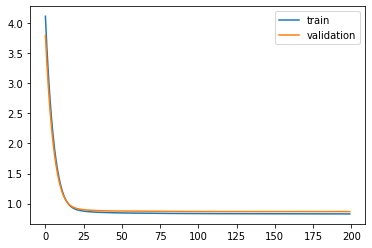

Time to train LSTM:  158.11783719062805
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 12s - loss: 4.1018 - pdc_loss: 0.7577 - event_loss: 0.7350 - val_loss: 3.8069 - val_pdc_loss: 0.7433 - val_event_loss: 0.6979

Epoch 00001: val_loss improved from inf to 3.80691, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 3.5863 - pdc_loss: 0.7283 - event_loss: 0.6708 - val_loss: 3.3313 - val_pdc_loss: 0.7173 - val_event_loss: 0.6392

Epoch 00002: val_loss improved from 3.80691 to 3.33128, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 3.1420 - pdc_loss: 0.7044 - event_loss: 0.6169 - val_loss: 2.9228 - val_pdc_loss: 0.6959 - val_event_loss: 0.5889

Epoch 00003: val_loss improved from 3.33128 to 2.92282, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 2.7611 - pdc_loss: 0.6847 - event_loss: 0.5697 - val_loss: 2.5727 - val_pdc_loss: 0.6774 - val_event_loss: 0.5435

Epoch 00004: val_loss improved from 2.92282 to 2.57271, saving


Epoch 00035: val_loss improved from 0.86819 to 0.86715, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 0.8634 - pdc_loss: 0.5331 - event_loss: 0.3180 - val_loss: 0.8662 - val_pdc_loss: 0.5354 - val_event_loss: 0.3186

Epoch 00036: val_loss improved from 0.86715 to 0.86619, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 0.8624 - pdc_loss: 0.5323 - event_loss: 0.3179 - val_loss: 0.8653 - val_pdc_loss: 0.5346 - val_event_loss: 0.3186

Epoch 00037: val_loss improved from 0.86619 to 0.86531, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 0.8615 - pdc_loss: 0.5315 - event_loss: 0.3179 - val_loss: 0.8645 - val_pdc_loss: 0.5339 - val_event_loss: 0.3186

Epoch 00038: val_loss improved from 0.86531 to 0.86450, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 0.8606 - pdc_loss: 0.5307 - event_loss: 0.3179 - val_loss: 0.8637 - val_pdc_loss: 0.5332 - val_event_loss: 0.3186

Epoch 00039: val_loss improved from 0.86450 to 

 - 1s - loss: 0.8444 - pdc_loss: 0.5181 - event_loss: 0.3165 - val_loss: 0.8502 - val_pdc_loss: 0.5222 - val_event_loss: 0.3183

Epoch 00070: val_loss improved from 0.85031 to 0.85022, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.8441 - pdc_loss: 0.5180 - event_loss: 0.3164 - val_loss: 0.8501 - val_pdc_loss: 0.5221 - val_event_loss: 0.3184

Epoch 00071: val_loss improved from 0.85022 to 0.85007, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8438 - pdc_loss: 0.5177 - event_loss: 0.3164 - val_loss: 0.8501 - val_pdc_loss: 0.5221 - val_event_loss: 0.3183

Epoch 00072: val_loss improved from 0.85007 to 0.85006, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8436 - pdc_loss: 0.5176 - event_loss: 0.3164 - val_loss: 0.8499 - val_pdc_loss: 0.5221 - val_event_loss: 0.3183

Epoch 00073: val_loss improved from 0.85006 to 0.84990, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8433 - pdc_loss: 0.5174 - event_


Epoch 00104: val_loss improved from 0.84477 to 0.84461, saving model to Event_val_weights5.hdf5
Epoch 105/200
 - 1s - loss: 0.8372 - pdc_loss: 0.5135 - event_loss: 0.3153 - val_loss: 0.8445 - val_pdc_loss: 0.5187 - val_event_loss: 0.3174

Epoch 00105: val_loss improved from 0.84461 to 0.84453, saving model to Event_val_weights5.hdf5
Epoch 106/200
 - 1s - loss: 0.8371 - pdc_loss: 0.5134 - event_loss: 0.3152 - val_loss: 0.8445 - val_pdc_loss: 0.5186 - val_event_loss: 0.3175

Epoch 00106: val_loss improved from 0.84453 to 0.84447, saving model to Event_val_weights5.hdf5
Epoch 107/200
 - 1s - loss: 0.8370 - pdc_loss: 0.5133 - event_loss: 0.3152 - val_loss: 0.8444 - val_pdc_loss: 0.5185 - val_event_loss: 0.3174

Epoch 00107: val_loss improved from 0.84447 to 0.84437, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.8368 - pdc_loss: 0.5132 - event_loss: 0.3152 - val_loss: 0.8441 - val_pdc_loss: 0.5184 - val_event_loss: 0.3174

Epoch 00108: val_loss improved from 0.84437


Epoch 00140: val_loss did not improve from 0.84168
Epoch 141/200
 - 1s - loss: 0.8339 - pdc_loss: 0.5117 - event_loss: 0.3146 - val_loss: 0.8416 - val_pdc_loss: 0.5167 - val_event_loss: 0.3172

Epoch 00141: val_loss improved from 0.84168 to 0.84160, saving model to Event_val_weights5.hdf5
Epoch 142/200
 - 1s - loss: 0.8339 - pdc_loss: 0.5117 - event_loss: 0.3146 - val_loss: 0.8415 - val_pdc_loss: 0.5167 - val_event_loss: 0.3171

Epoch 00142: val_loss improved from 0.84160 to 0.84151, saving model to Event_val_weights5.hdf5
Epoch 143/200
 - 1s - loss: 0.8338 - pdc_loss: 0.5117 - event_loss: 0.3146 - val_loss: 0.8416 - val_pdc_loss: 0.5168 - val_event_loss: 0.3171

Epoch 00143: val_loss did not improve from 0.84151
Epoch 144/200
 - 1s - loss: 0.8337 - pdc_loss: 0.5116 - event_loss: 0.3145 - val_loss: 0.8414 - val_pdc_loss: 0.5166 - val_event_loss: 0.3172

Epoch 00144: val_loss improved from 0.84151 to 0.84140, saving model to Event_val_weights5.hdf5
Epoch 145/200
 - 1s - loss: 0.8337 - 


Epoch 00178: val_loss did not improve from 0.84053
Epoch 179/200
 - 1s - loss: 0.8319 - pdc_loss: 0.5107 - event_loss: 0.3141 - val_loss: 0.8405 - val_pdc_loss: 0.5162 - val_event_loss: 0.3172

Epoch 00179: val_loss improved from 0.84053 to 0.84052, saving model to Event_val_weights5.hdf5
Epoch 180/200
 - 1s - loss: 0.8318 - pdc_loss: 0.5106 - event_loss: 0.3141 - val_loss: 0.8405 - val_pdc_loss: 0.5163 - val_event_loss: 0.3171

Epoch 00180: val_loss did not improve from 0.84052
Epoch 181/200
 - 1s - loss: 0.8318 - pdc_loss: 0.5106 - event_loss: 0.3141 - val_loss: 0.8405 - val_pdc_loss: 0.5163 - val_event_loss: 0.3171

Epoch 00181: val_loss improved from 0.84052 to 0.84050, saving model to Event_val_weights5.hdf5
Epoch 182/200
 - 1s - loss: 0.8318 - pdc_loss: 0.5106 - event_loss: 0.3141 - val_loss: 0.8406 - val_pdc_loss: 0.5163 - val_event_loss: 0.3171

Epoch 00182: val_loss did not improve from 0.84050
Epoch 183/200
 - 1s - loss: 0.8318 - pdc_loss: 0.5107 - event_loss: 0.3141 - val_l

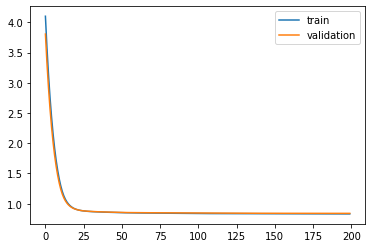

Time to train LSTM:  158.8319592475891
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 13s - loss: 6.2117 - pdc_loss: 0.7216 - event_loss: 0.7486 - val_loss: 5.6996 - val_pdc_loss: 0.7107 - val_event_loss: 0.6941

Epoch 00001: val_loss improved from inf to 5.69962, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 5.3321 - pdc_loss: 0.7020 - event_loss: 0.6639 - val_loss: 4.8900 - val_pdc_loss: 0.6918 - val_event_loss: 0.6229

Epoch 00002: val_loss improved from 5.69962 to 4.88997, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 4.5767 - pdc_loss: 0.6841 - event_loss: 0.6012 - val_loss: 4.1980 - val_pdc_loss: 0.6749 - val_event_loss: 0.5677

Epoch 00003: val_loss improved from 4.88997 to 4.19804, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 3.9331 - pdc_loss: 0.6679 - event_loss: 0.5511 - val_loss: 3.6103 - val_pdc_loss: 0.6598 - val_event_loss: 0.5209

Epoch 00004: val_loss improved from 4.19804 to 3.61030, saving 


Epoch 00035: val_loss improved from 0.86048 to 0.85918, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 0.8632 - pdc_loss: 0.5336 - event_loss: 0.3168 - val_loss: 0.8577 - val_pdc_loss: 0.5332 - val_event_loss: 0.3119

Epoch 00036: val_loss improved from 0.85918 to 0.85771, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 0.8621 - pdc_loss: 0.5327 - event_loss: 0.3167 - val_loss: 0.8566 - val_pdc_loss: 0.5322 - val_event_loss: 0.3119

Epoch 00037: val_loss improved from 0.85771 to 0.85655, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 0.8610 - pdc_loss: 0.5319 - event_loss: 0.3167 - val_loss: 0.8552 - val_pdc_loss: 0.5311 - val_event_loss: 0.3118

Epoch 00038: val_loss improved from 0.85655 to 0.85518, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 0.8600 - pdc_loss: 0.5312 - event_loss: 0.3166 - val_loss: 0.8542 - val_pdc_loss: 0.5302 - val_event_loss: 0.3119

Epoch 00039: val_loss improved from 0.85518 to 

 - 1s - loss: 0.8458 - pdc_loss: 0.5205 - event_loss: 0.3155 - val_loss: 0.8411 - val_pdc_loss: 0.5202 - val_event_loss: 0.3111

Epoch 00070: val_loss improved from 0.84141 to 0.84109, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 0.8455 - pdc_loss: 0.5203 - event_loss: 0.3154 - val_loss: 0.8411 - val_pdc_loss: 0.5202 - val_event_loss: 0.3112

Epoch 00071: val_loss improved from 0.84109 to 0.84106, saving model to Event_val_weights1.hdf5
Epoch 72/200
 - 1s - loss: 0.8452 - pdc_loss: 0.5201 - event_loss: 0.3154 - val_loss: 0.8408 - val_pdc_loss: 0.5201 - val_event_loss: 0.3111

Epoch 00072: val_loss improved from 0.84106 to 0.84082, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.8450 - pdc_loss: 0.5199 - event_loss: 0.3154 - val_loss: 0.8408 - val_pdc_loss: 0.5201 - val_event_loss: 0.3111

Epoch 00073: val_loss did not improve from 0.84082
Epoch 74/200
 - 1s - loss: 0.8447 - pdc_loss: 0.5197 - event_loss: 0.3153 - val_loss: 0.8406 - val_pdc_los

 - 1s - loss: 0.8393 - pdc_loss: 0.5159 - event_loss: 0.3147 - val_loss: 0.8384 - val_pdc_loss: 0.5189 - val_event_loss: 0.3108

Epoch 00108: val_loss improved from 0.83842 to 0.83840, saving model to Event_val_weights1.hdf5
Epoch 109/200
 - 1s - loss: 0.8392 - pdc_loss: 0.5159 - event_loss: 0.3147 - val_loss: 0.8384 - val_pdc_loss: 0.5189 - val_event_loss: 0.3109

Epoch 00109: val_loss did not improve from 0.83840
Epoch 110/200
 - 1s - loss: 0.8392 - pdc_loss: 0.5158 - event_loss: 0.3147 - val_loss: 0.8382 - val_pdc_loss: 0.5188 - val_event_loss: 0.3107

Epoch 00110: val_loss improved from 0.83840 to 0.83819, saving model to Event_val_weights1.hdf5
Epoch 111/200
 - 1s - loss: 0.8390 - pdc_loss: 0.5157 - event_loss: 0.3147 - val_loss: 0.8380 - val_pdc_loss: 0.5187 - val_event_loss: 0.3107

Epoch 00111: val_loss improved from 0.83819 to 0.83801, saving model to Event_val_weights1.hdf5
Epoch 112/200
 - 1s - loss: 0.8389 - pdc_loss: 0.5156 - event_loss: 0.3147 - val_loss: 0.8380 - val_pdc


Epoch 00148: val_loss did not improve from 0.83755
Epoch 149/200
 - 1s - loss: 0.8362 - pdc_loss: 0.5138 - event_loss: 0.3143 - val_loss: 0.8378 - val_pdc_loss: 0.5185 - val_event_loss: 0.3112

Epoch 00149: val_loss did not improve from 0.83755
Epoch 150/200
 - 1s - loss: 0.8362 - pdc_loss: 0.5138 - event_loss: 0.3143 - val_loss: 0.8376 - val_pdc_loss: 0.5183 - val_event_loss: 0.3112

Epoch 00150: val_loss did not improve from 0.83755
Epoch 151/200
 - 1s - loss: 0.8361 - pdc_loss: 0.5137 - event_loss: 0.3143 - val_loss: 0.8375 - val_pdc_loss: 0.5184 - val_event_loss: 0.3111

Epoch 00151: val_loss improved from 0.83755 to 0.83754, saving model to Event_val_weights1.hdf5
Epoch 152/200
 - 1s - loss: 0.8360 - pdc_loss: 0.5136 - event_loss: 0.3143 - val_loss: 0.8376 - val_pdc_loss: 0.5183 - val_event_loss: 0.3112

Epoch 00152: val_loss did not improve from 0.83754
Epoch 153/200
 - 1s - loss: 0.8360 - pdc_loss: 0.5136 - event_loss: 0.3143 - val_loss: 0.8376 - val_pdc_loss: 0.5183 - val_even


Epoch 00188: val_loss did not improve from 0.83679
Epoch 189/200
 - 1s - loss: 0.8344 - pdc_loss: 0.5125 - event_loss: 0.3142 - val_loss: 0.8371 - val_pdc_loss: 0.5182 - val_event_loss: 0.3113

Epoch 00189: val_loss did not improve from 0.83679
Epoch 190/200
 - 1s - loss: 0.8342 - pdc_loss: 0.5124 - event_loss: 0.3141 - val_loss: 0.8366 - val_pdc_loss: 0.5179 - val_event_loss: 0.3110

Epoch 00190: val_loss improved from 0.83679 to 0.83664, saving model to Event_val_weights1.hdf5
Epoch 191/200
 - 1s - loss: 0.8343 - pdc_loss: 0.5124 - event_loss: 0.3141 - val_loss: 0.8367 - val_pdc_loss: 0.5178 - val_event_loss: 0.3112

Epoch 00191: val_loss did not improve from 0.83664
Epoch 192/200
 - 1s - loss: 0.8342 - pdc_loss: 0.5123 - event_loss: 0.3142 - val_loss: 0.8369 - val_pdc_loss: 0.5180 - val_event_loss: 0.3112

Epoch 00192: val_loss did not improve from 0.83664
Epoch 193/200
 - 1s - loss: 0.8342 - pdc_loss: 0.5123 - event_loss: 0.3142 - val_loss: 0.8367 - val_pdc_loss: 0.5180 - val_even

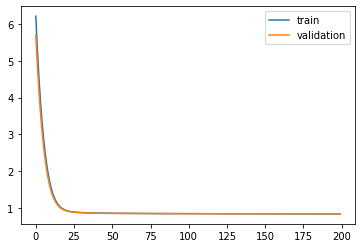

Time to train LSTM:  159.69740438461304
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 14s - loss: 5.9413 - pdc_loss: 0.7122 - event_loss: 0.6989 - val_loss: 5.4429 - val_pdc_loss: 0.6912 - val_event_loss: 0.6548

Epoch 00001: val_loss improved from inf to 5.44293, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 5.0925 - pdc_loss: 0.6876 - event_loss: 0.6255 - val_loss: 4.6637 - val_pdc_loss: 0.6715 - val_event_loss: 0.5903

Epoch 00002: val_loss improved from 5.44293 to 4.66368, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 4.3623 - pdc_loss: 0.6684 - event_loss: 0.5655 - val_loss: 3.9968 - val_pdc_loss: 0.6556 - val_event_loss: 0.5362

Epoch 00003: val_loss improved from 4.66368 to 3.99682, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 3.7399 - pdc_loss: 0.6528 - event_loss: 0.5142 - val_loss: 3.4314 - val_pdc_loss: 0.6423 - val_event_loss: 0.4894

Epoch 00004: val_loss improved from 3.99682 to 3.43143, saving


Epoch 00035: val_loss improved from 0.88009 to 0.87925, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 0.8653 - pdc_loss: 0.5344 - event_loss: 0.3179 - val_loss: 0.8788 - val_pdc_loss: 0.5416 - val_event_loss: 0.3242

Epoch 00036: val_loss improved from 0.87925 to 0.87878, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 0.8646 - pdc_loss: 0.5339 - event_loss: 0.3178 - val_loss: 0.8780 - val_pdc_loss: 0.5411 - val_event_loss: 0.3241

Epoch 00037: val_loss improved from 0.87878 to 0.87797, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 0.8638 - pdc_loss: 0.5333 - event_loss: 0.3177 - val_loss: 0.8772 - val_pdc_loss: 0.5406 - val_event_loss: 0.3239

Epoch 00038: val_loss improved from 0.87797 to 0.87719, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 0.8631 - pdc_loss: 0.5328 - event_loss: 0.3177 - val_loss: 0.8765 - val_pdc_loss: 0.5401 - val_event_loss: 0.3239

Epoch 00039: val_loss improved from 0.87719 to 


Epoch 00070: val_loss improved from 0.86346 to 0.86281, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.8476 - pdc_loss: 0.5208 - event_loss: 0.3162 - val_loss: 0.8626 - val_pdc_loss: 0.5295 - val_event_loss: 0.3225

Epoch 00071: val_loss improved from 0.86281 to 0.86256, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.8473 - pdc_loss: 0.5206 - event_loss: 0.3162 - val_loss: 0.8620 - val_pdc_loss: 0.5290 - val_event_loss: 0.3225

Epoch 00072: val_loss improved from 0.86256 to 0.86203, saving model to Event_val_weights2.hdf5
Epoch 73/200
 - 1s - loss: 0.8470 - pdc_loss: 0.5204 - event_loss: 0.3161 - val_loss: 0.8620 - val_pdc_loss: 0.5290 - val_event_loss: 0.3226

Epoch 00073: val_loss improved from 0.86203 to 0.86201, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.8467 - pdc_loss: 0.5202 - event_loss: 0.3161 - val_loss: 0.8616 - val_pdc_loss: 0.5287 - val_event_loss: 0.3226

Epoch 00074: val_loss improved from 0.86201 to 


Epoch 00106: val_loss did not improve from 0.85668
Epoch 107/200
 - 1s - loss: 0.8404 - pdc_loss: 0.5164 - event_loss: 0.3151 - val_loss: 0.8567 - val_pdc_loss: 0.5262 - val_event_loss: 0.3216

Epoch 00107: val_loss did not improve from 0.85668
Epoch 108/200
 - 1s - loss: 0.8404 - pdc_loss: 0.5164 - event_loss: 0.3151 - val_loss: 0.8565 - val_pdc_loss: 0.5260 - val_event_loss: 0.3216

Epoch 00108: val_loss improved from 0.85668 to 0.85647, saving model to Event_val_weights2.hdf5
Epoch 109/200
 - 1s - loss: 0.8401 - pdc_loss: 0.5163 - event_loss: 0.3150 - val_loss: 0.8567 - val_pdc_loss: 0.5262 - val_event_loss: 0.3217

Epoch 00109: val_loss did not improve from 0.85647
Epoch 110/200
 - 1s - loss: 0.8401 - pdc_loss: 0.5162 - event_loss: 0.3150 - val_loss: 0.8563 - val_pdc_loss: 0.5259 - val_event_loss: 0.3215

Epoch 00110: val_loss improved from 0.85647 to 0.85626, saving model to Event_val_weights2.hdf5
Epoch 111/200
 - 1s - loss: 0.8399 - pdc_loss: 0.5162 - event_loss: 0.3150 - val_l


Epoch 00145: val_loss did not improve from 0.85447
Epoch 146/200
 - 1s - loss: 0.8370 - pdc_loss: 0.5146 - event_loss: 0.3142 - val_loss: 0.8555 - val_pdc_loss: 0.5265 - val_event_loss: 0.3208

Epoch 00146: val_loss did not improve from 0.85447
Epoch 147/200
 - 1s - loss: 0.8369 - pdc_loss: 0.5145 - event_loss: 0.3141 - val_loss: 0.8556 - val_pdc_loss: 0.5265 - val_event_loss: 0.3208

Epoch 00147: val_loss did not improve from 0.85447
Epoch 148/200
 - 1s - loss: 0.8369 - pdc_loss: 0.5145 - event_loss: 0.3141 - val_loss: 0.8554 - val_pdc_loss: 0.5264 - val_event_loss: 0.3208

Epoch 00148: val_loss did not improve from 0.85447
Epoch 149/200
 - 1s - loss: 0.8368 - pdc_loss: 0.5144 - event_loss: 0.3141 - val_loss: 0.8555 - val_pdc_loss: 0.5265 - val_event_loss: 0.3207

Epoch 00149: val_loss did not improve from 0.85447
Epoch 150/200
 - 1s - loss: 0.8366 - pdc_loss: 0.5143 - event_loss: 0.3141 - val_loss: 0.8553 - val_pdc_loss: 0.5263 - val_event_loss: 0.3207

Epoch 00150: val_loss did not

 - 1s - loss: 0.8345 - pdc_loss: 0.5133 - event_loss: 0.3135 - val_loss: 0.8539 - val_pdc_loss: 0.5259 - val_event_loss: 0.3203

Epoch 00186: val_loss did not improve from 0.85378
Epoch 187/200
 - 1s - loss: 0.8345 - pdc_loss: 0.5133 - event_loss: 0.3136 - val_loss: 0.8539 - val_pdc_loss: 0.5260 - val_event_loss: 0.3203

Epoch 00187: val_loss did not improve from 0.85378
Epoch 188/200
 - 1s - loss: 0.8345 - pdc_loss: 0.5133 - event_loss: 0.3135 - val_loss: 0.8538 - val_pdc_loss: 0.5259 - val_event_loss: 0.3203

Epoch 00188: val_loss did not improve from 0.85378
Epoch 189/200
 - 1s - loss: 0.8344 - pdc_loss: 0.5133 - event_loss: 0.3135 - val_loss: 0.8539 - val_pdc_loss: 0.5260 - val_event_loss: 0.3203

Epoch 00189: val_loss did not improve from 0.85378
Epoch 190/200
 - 1s - loss: 0.8343 - pdc_loss: 0.5132 - event_loss: 0.3135 - val_loss: 0.8538 - val_pdc_loss: 0.5260 - val_event_loss: 0.3202

Epoch 00190: val_loss did not improve from 0.85378
Epoch 191/200
 - 1s - loss: 0.8343 - pdc_los

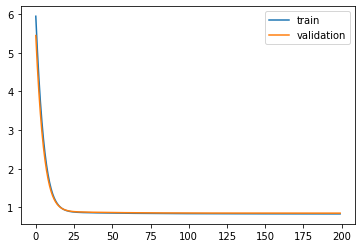

Time to train LSTM:  161.5131072998047
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 15s - loss: 5.9974 - pdc_loss: 0.7263 - event_loss: 0.6306 - val_loss: 5.5162 - val_pdc_loss: 0.7165 - val_event_loss: 0.6094

Epoch 00001: val_loss improved from inf to 5.51621, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 5.1611 - pdc_loss: 0.7081 - event_loss: 0.5912 - val_loss: 4.7450 - val_pdc_loss: 0.7009 - val_event_loss: 0.5722

Epoch 00002: val_loss improved from 5.51621 to 4.74499, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 4.4386 - pdc_loss: 0.6929 - event_loss: 0.5552 - val_loss: 4.0838 - val_pdc_loss: 0.6876 - val_event_loss: 0.5380

Epoch 00003: val_loss improved from 4.74499 to 4.08379, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 3.8215 - pdc_loss: 0.6798 - event_loss: 0.5215 - val_loss: 3.5214 - val_pdc_loss: 0.6755 - val_event_loss: 0.5055

Epoch 00004: val_loss improved from 4.08379 to 3.52138, saving 


Epoch 00035: val_loss improved from 0.88893 to 0.88795, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 0.8675 - pdc_loss: 0.5375 - event_loss: 0.3173 - val_loss: 0.8870 - val_pdc_loss: 0.5514 - val_event_loss: 0.3229

Epoch 00036: val_loss improved from 0.88795 to 0.88702, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 0.8665 - pdc_loss: 0.5366 - event_loss: 0.3173 - val_loss: 0.8862 - val_pdc_loss: 0.5508 - val_event_loss: 0.3229

Epoch 00037: val_loss improved from 0.88702 to 0.88622, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 0.8655 - pdc_loss: 0.5358 - event_loss: 0.3172 - val_loss: 0.8854 - val_pdc_loss: 0.5501 - val_event_loss: 0.3228

Epoch 00038: val_loss improved from 0.88622 to 0.88543, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 0.8646 - pdc_loss: 0.5350 - event_loss: 0.3172 - val_loss: 0.8847 - val_pdc_loss: 0.5496 - val_event_loss: 0.3228

Epoch 00039: val_loss improved from 0.88543 to 


Epoch 00070: val_loss improved from 0.87622 to 0.87610, saving model to Event_val_weights3.hdf5
Epoch 71/200
 - 1s - loss: 0.8501 - pdc_loss: 0.5243 - event_loss: 0.3158 - val_loss: 0.8759 - val_pdc_loss: 0.5434 - val_event_loss: 0.3225

Epoch 00071: val_loss improved from 0.87610 to 0.87586, saving model to Event_val_weights3.hdf5
Epoch 72/200
 - 1s - loss: 0.8499 - pdc_loss: 0.5241 - event_loss: 0.3158 - val_loss: 0.8754 - val_pdc_loss: 0.5431 - val_event_loss: 0.3224

Epoch 00072: val_loss improved from 0.87586 to 0.87545, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.8496 - pdc_loss: 0.5240 - event_loss: 0.3158 - val_loss: 0.8756 - val_pdc_loss: 0.5432 - val_event_loss: 0.3225

Epoch 00073: val_loss did not improve from 0.87545
Epoch 74/200
 - 1s - loss: 0.8493 - pdc_loss: 0.5237 - event_loss: 0.3157 - val_loss: 0.8751 - val_pdc_loss: 0.5428 - val_event_loss: 0.3225

Epoch 00074: val_loss improved from 0.87545 to 0.87509, saving model to Event_val_weights3.h


Epoch 00107: val_loss improved from 0.86976 to 0.86969, saving model to Event_val_weights3.hdf5
Epoch 108/200
 - 1s - loss: 0.8427 - pdc_loss: 0.5190 - event_loss: 0.3149 - val_loss: 0.8696 - val_pdc_loss: 0.5385 - val_event_loss: 0.3223

Epoch 00108: val_loss improved from 0.86969 to 0.86960, saving model to Event_val_weights3.hdf5
Epoch 109/200
 - 1s - loss: 0.8425 - pdc_loss: 0.5189 - event_loss: 0.3148 - val_loss: 0.8695 - val_pdc_loss: 0.5383 - val_event_loss: 0.3224

Epoch 00109: val_loss improved from 0.86960 to 0.86947, saving model to Event_val_weights3.hdf5
Epoch 110/200
 - 1s - loss: 0.8424 - pdc_loss: 0.5188 - event_loss: 0.3148 - val_loss: 0.8691 - val_pdc_loss: 0.5381 - val_event_loss: 0.3223

Epoch 00110: val_loss improved from 0.86947 to 0.86910, saving model to Event_val_weights3.hdf5
Epoch 111/200
 - 1s - loss: 0.8421 - pdc_loss: 0.5186 - event_loss: 0.3148 - val_loss: 0.8690 - val_pdc_loss: 0.5380 - val_event_loss: 0.3223

Epoch 00111: val_loss improved from 0.86910

 - 1s - loss: 0.8383 - pdc_loss: 0.5159 - event_loss: 0.3142 - val_loss: 0.8653 - val_pdc_loss: 0.5350 - val_event_loss: 0.3222

Epoch 00144: val_loss improved from 0.86565 to 0.86533, saving model to Event_val_weights3.hdf5
Epoch 145/200
 - 1s - loss: 0.8382 - pdc_loss: 0.5159 - event_loss: 0.3142 - val_loss: 0.8657 - val_pdc_loss: 0.5354 - val_event_loss: 0.3222

Epoch 00145: val_loss did not improve from 0.86533
Epoch 146/200
 - 1s - loss: 0.8382 - pdc_loss: 0.5159 - event_loss: 0.3142 - val_loss: 0.8658 - val_pdc_loss: 0.5353 - val_event_loss: 0.3224

Epoch 00146: val_loss did not improve from 0.86533
Epoch 147/200
 - 1s - loss: 0.8381 - pdc_loss: 0.5158 - event_loss: 0.3142 - val_loss: 0.8655 - val_pdc_loss: 0.5352 - val_event_loss: 0.3222

Epoch 00147: val_loss did not improve from 0.86533
Epoch 148/200
 - 1s - loss: 0.8379 - pdc_loss: 0.5157 - event_loss: 0.3142 - val_loss: 0.8650 - val_pdc_loss: 0.5348 - val_event_loss: 0.3222

Epoch 00148: val_loss improved from 0.86533 to 0.8

 - 1s - loss: 0.8356 - pdc_loss: 0.5141 - event_loss: 0.3138 - val_loss: 0.8631 - val_pdc_loss: 0.5333 - val_event_loss: 0.3221

Epoch 00183: val_loss improved from 0.86329 to 0.86305, saving model to Event_val_weights3.hdf5
Epoch 184/200
 - 1s - loss: 0.8354 - pdc_loss: 0.5140 - event_loss: 0.3138 - val_loss: 0.8631 - val_pdc_loss: 0.5333 - val_event_loss: 0.3221

Epoch 00184: val_loss did not improve from 0.86305
Epoch 185/200
 - 1s - loss: 0.8355 - pdc_loss: 0.5141 - event_loss: 0.3138 - val_loss: 0.8631 - val_pdc_loss: 0.5334 - val_event_loss: 0.3222

Epoch 00185: val_loss did not improve from 0.86305
Epoch 186/200
 - 1s - loss: 0.8354 - pdc_loss: 0.5140 - event_loss: 0.3138 - val_loss: 0.8631 - val_pdc_loss: 0.5334 - val_event_loss: 0.3221

Epoch 00186: val_loss did not improve from 0.86305
Epoch 187/200
 - 1s - loss: 0.8353 - pdc_loss: 0.5140 - event_loss: 0.3138 - val_loss: 0.8631 - val_pdc_loss: 0.5333 - val_event_loss: 0.3222

Epoch 00187: val_loss did not improve from 0.86305

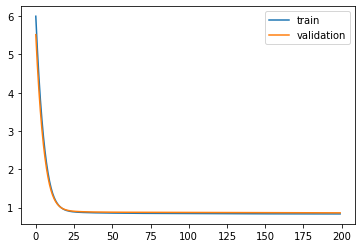

Time to train LSTM:  163.2790231704712
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 16s - loss: 6.0803 - pdc_loss: 0.7291 - event_loss: 0.7020 - val_loss: 5.5890 - val_pdc_loss: 0.7185 - val_event_loss: 0.6673

Epoch 00001: val_loss improved from inf to 5.58902, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 5.2314 - pdc_loss: 0.7102 - event_loss: 0.6445 - val_loss: 4.8111 - val_pdc_loss: 0.7040 - val_event_loss: 0.6178

Epoch 00002: val_loss improved from 5.58902 to 4.81110, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 4.5025 - pdc_loss: 0.6953 - event_loss: 0.5981 - val_loss: 4.1462 - val_pdc_loss: 0.6924 - val_event_loss: 0.5758

Epoch 00003: val_loss improved from 4.81110 to 4.14625, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 3.8809 - pdc_loss: 0.6828 - event_loss: 0.5570 - val_loss: 3.5806 - val_pdc_loss: 0.6814 - val_event_loss: 0.5371

Epoch 00004: val_loss improved from 4.14625 to 3.58063, saving 


Epoch 00035: val_loss improved from 0.89304 to 0.89239, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 0.8635 - pdc_loss: 0.5333 - event_loss: 0.3167 - val_loss: 0.8919 - val_pdc_loss: 0.5514 - val_event_loss: 0.3273

Epoch 00036: val_loss improved from 0.89239 to 0.89191, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 0.8625 - pdc_loss: 0.5327 - event_loss: 0.3167 - val_loss: 0.8913 - val_pdc_loss: 0.5511 - val_event_loss: 0.3272

Epoch 00037: val_loss improved from 0.89191 to 0.89135, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 0.8617 - pdc_loss: 0.5321 - event_loss: 0.3166 - val_loss: 0.8909 - val_pdc_loss: 0.5509 - val_event_loss: 0.3272

Epoch 00038: val_loss improved from 0.89135 to 0.89092, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 0.8608 - pdc_loss: 0.5315 - event_loss: 0.3166 - val_loss: 0.8903 - val_pdc_loss: 0.5505 - val_event_loss: 0.3271

Epoch 00039: val_loss improved from 0.89092 to 

 - 1s - loss: 0.8456 - pdc_loss: 0.5201 - event_loss: 0.3152 - val_loss: 0.8764 - val_pdc_loss: 0.5406 - val_event_loss: 0.3255

Epoch 00070: val_loss improved from 0.87681 to 0.87643, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.8453 - pdc_loss: 0.5199 - event_loss: 0.3152 - val_loss: 0.8765 - val_pdc_loss: 0.5407 - val_event_loss: 0.3256

Epoch 00071: val_loss did not improve from 0.87643
Epoch 72/200
 - 1s - loss: 0.8449 - pdc_loss: 0.5195 - event_loss: 0.3152 - val_loss: 0.8761 - val_pdc_loss: 0.5404 - val_event_loss: 0.3255

Epoch 00072: val_loss improved from 0.87643 to 0.87612, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.8447 - pdc_loss: 0.5194 - event_loss: 0.3152 - val_loss: 0.8760 - val_pdc_loss: 0.5403 - val_event_loss: 0.3255

Epoch 00073: val_loss improved from 0.87612 to 0.87602, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.8444 - pdc_loss: 0.5191 - event_loss: 0.3152 - val_loss: 0.8758 - val_pdc_los


Epoch 00105: val_loss improved from 0.87122 to 0.87117, saving model to Event_val_weights4.hdf5
Epoch 106/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5146 - event_loss: 0.3148 - val_loss: 0.8710 - val_pdc_loss: 0.5364 - val_event_loss: 0.3257

Epoch 00106: val_loss improved from 0.87117 to 0.87105, saving model to Event_val_weights4.hdf5
Epoch 107/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5146 - event_loss: 0.3148 - val_loss: 0.8710 - val_pdc_loss: 0.5364 - val_event_loss: 0.3257

Epoch 00107: val_loss improved from 0.87105 to 0.87100, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.8381 - pdc_loss: 0.5144 - event_loss: 0.3148 - val_loss: 0.8708 - val_pdc_loss: 0.5363 - val_event_loss: 0.3257

Epoch 00108: val_loss improved from 0.87100 to 0.87081, saving model to Event_val_weights4.hdf5
Epoch 109/200
 - 1s - loss: 0.8381 - pdc_loss: 0.5145 - event_loss: 0.3147 - val_loss: 0.8708 - val_pdc_loss: 0.5362 - val_event_loss: 0.3257

Epoch 00109: val_loss improved from 0.87081


Epoch 00141: val_loss did not improve from 0.86849
Epoch 142/200
 - 1s - loss: 0.8350 - pdc_loss: 0.5128 - event_loss: 0.3141 - val_loss: 0.8683 - val_pdc_loss: 0.5346 - val_event_loss: 0.3256

Epoch 00142: val_loss improved from 0.86849 to 0.86833, saving model to Event_val_weights4.hdf5
Epoch 143/200
 - 1s - loss: 0.8350 - pdc_loss: 0.5128 - event_loss: 0.3141 - val_loss: 0.8685 - val_pdc_loss: 0.5347 - val_event_loss: 0.3256

Epoch 00143: val_loss did not improve from 0.86833
Epoch 144/200
 - 1s - loss: 0.8349 - pdc_loss: 0.5127 - event_loss: 0.3141 - val_loss: 0.8683 - val_pdc_loss: 0.5346 - val_event_loss: 0.3256

Epoch 00144: val_loss improved from 0.86833 to 0.86826, saving model to Event_val_weights4.hdf5
Epoch 145/200
 - 1s - loss: 0.8348 - pdc_loss: 0.5127 - event_loss: 0.3140 - val_loss: 0.8684 - val_pdc_loss: 0.5346 - val_event_loss: 0.3256

Epoch 00145: val_loss did not improve from 0.86826
Epoch 146/200
 - 1s - loss: 0.8348 - pdc_loss: 0.5126 - event_loss: 0.3140 - val_l


Epoch 00179: val_loss improved from 0.86714 to 0.86714, saving model to Event_val_weights4.hdf5
Epoch 180/200
 - 1s - loss: 0.8328 - pdc_loss: 0.5116 - event_loss: 0.3135 - val_loss: 0.8670 - val_pdc_loss: 0.5337 - val_event_loss: 0.3256

Epoch 00180: val_loss improved from 0.86714 to 0.86704, saving model to Event_val_weights4.hdf5
Epoch 181/200
 - 1s - loss: 0.8328 - pdc_loss: 0.5116 - event_loss: 0.3135 - val_loss: 0.8671 - val_pdc_loss: 0.5338 - val_event_loss: 0.3257

Epoch 00181: val_loss did not improve from 0.86704
Epoch 182/200
 - 1s - loss: 0.8327 - pdc_loss: 0.5116 - event_loss: 0.3135 - val_loss: 0.8670 - val_pdc_loss: 0.5337 - val_event_loss: 0.3256

Epoch 00182: val_loss improved from 0.86704 to 0.86699, saving model to Event_val_weights4.hdf5
Epoch 183/200
 - 1s - loss: 0.8327 - pdc_loss: 0.5116 - event_loss: 0.3135 - val_loss: 0.8670 - val_pdc_loss: 0.5337 - val_event_loss: 0.3256

Epoch 00183: val_loss did not improve from 0.86699
Epoch 184/200
 - 1s - loss: 0.8326 - 

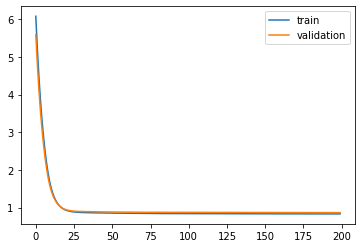

Time to train LSTM:  173.31008672714233
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 14s - loss: 6.0965 - pdc_loss: 0.6920 - event_loss: 0.7034 - val_loss: 5.5953 - val_pdc_loss: 0.6838 - val_event_loss: 0.6527

Epoch 00001: val_loss improved from inf to 5.59535, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 5.2317 - pdc_loss: 0.6799 - event_loss: 0.6173 - val_loss: 4.8006 - val_pdc_loss: 0.6706 - val_event_loss: 0.5812

Epoch 00002: val_loss improved from 5.59535 to 4.80064, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 4.4892 - pdc_loss: 0.6660 - event_loss: 0.5541 - val_loss: 4.1222 - val_pdc_loss: 0.6571 - val_event_loss: 0.5275

Epoch 00003: val_loss improved from 4.80064 to 4.12222, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 3.8578 - pdc_loss: 0.6525 - event_loss: 0.5062 - val_loss: 3.5478 - val_pdc_loss: 0.6445 - val_event_loss: 0.4857

Epoch 00004: val_loss improved from 4.12222 to 3.54783, saving


Epoch 00035: val_loss improved from 0.87286 to 0.87188, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 0.8703 - pdc_loss: 0.5407 - event_loss: 0.3172 - val_loss: 0.8709 - val_pdc_loss: 0.5409 - val_event_loss: 0.3177

Epoch 00036: val_loss improved from 0.87188 to 0.87093, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 0.8694 - pdc_loss: 0.5401 - event_loss: 0.3171 - val_loss: 0.8701 - val_pdc_loss: 0.5403 - val_event_loss: 0.3176

Epoch 00037: val_loss improved from 0.87093 to 0.87008, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 0.8685 - pdc_loss: 0.5394 - event_loss: 0.3171 - val_loss: 0.8692 - val_pdc_loss: 0.5397 - val_event_loss: 0.3175

Epoch 00038: val_loss improved from 0.87008 to 0.86922, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 0.8676 - pdc_loss: 0.5387 - event_loss: 0.3170 - val_loss: 0.8684 - val_pdc_loss: 0.5390 - val_event_loss: 0.3174

Epoch 00039: val_loss improved from 0.86922 to 

 - 1s - loss: 0.8484 - pdc_loss: 0.5228 - event_loss: 0.3158 - val_loss: 0.8517 - val_pdc_loss: 0.5255 - val_event_loss: 0.3163

Epoch 00070: val_loss improved from 0.85212 to 0.85169, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.8481 - pdc_loss: 0.5225 - event_loss: 0.3158 - val_loss: 0.8514 - val_pdc_loss: 0.5252 - val_event_loss: 0.3163

Epoch 00071: val_loss improved from 0.85169 to 0.85138, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8478 - pdc_loss: 0.5222 - event_loss: 0.3157 - val_loss: 0.8509 - val_pdc_loss: 0.5249 - val_event_loss: 0.3162

Epoch 00072: val_loss improved from 0.85138 to 0.85094, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8475 - pdc_loss: 0.5219 - event_loss: 0.3157 - val_loss: 0.8507 - val_pdc_loss: 0.5247 - val_event_loss: 0.3162

Epoch 00073: val_loss improved from 0.85094 to 0.85065, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8472 - pdc_loss: 0.5217 - event_


Epoch 00104: val_loss improved from 0.84490 to 0.84469, saving model to Event_val_weights5.hdf5
Epoch 105/200
 - 1s - loss: 0.8408 - pdc_loss: 0.5168 - event_loss: 0.3152 - val_loss: 0.8446 - val_pdc_loss: 0.5204 - val_event_loss: 0.3155

Epoch 00105: val_loss improved from 0.84469 to 0.84463, saving model to Event_val_weights5.hdf5
Epoch 106/200
 - 1s - loss: 0.8406 - pdc_loss: 0.5167 - event_loss: 0.3152 - val_loss: 0.8445 - val_pdc_loss: 0.5203 - val_event_loss: 0.3154

Epoch 00106: val_loss improved from 0.84463 to 0.84449, saving model to Event_val_weights5.hdf5
Epoch 107/200
 - 1s - loss: 0.8405 - pdc_loss: 0.5166 - event_loss: 0.3152 - val_loss: 0.8444 - val_pdc_loss: 0.5201 - val_event_loss: 0.3156

Epoch 00107: val_loss improved from 0.84449 to 0.84441, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.8403 - pdc_loss: 0.5165 - event_loss: 0.3152 - val_loss: 0.8443 - val_pdc_loss: 0.5202 - val_event_loss: 0.3154

Epoch 00108: val_loss improved from 0.84441


Epoch 00141: val_loss did not improve from 0.84217
Epoch 142/200
 - 1s - loss: 0.8372 - pdc_loss: 0.5146 - event_loss: 0.3146 - val_loss: 0.8422 - val_pdc_loss: 0.5188 - val_event_loss: 0.3153

Epoch 00142: val_loss did not improve from 0.84217
Epoch 143/200
 - 1s - loss: 0.8372 - pdc_loss: 0.5145 - event_loss: 0.3146 - val_loss: 0.8423 - val_pdc_loss: 0.5188 - val_event_loss: 0.3154

Epoch 00143: val_loss did not improve from 0.84217
Epoch 144/200
 - 1s - loss: 0.8371 - pdc_loss: 0.5145 - event_loss: 0.3146 - val_loss: 0.8421 - val_pdc_loss: 0.5187 - val_event_loss: 0.3153

Epoch 00144: val_loss improved from 0.84217 to 0.84208, saving model to Event_val_weights5.hdf5
Epoch 145/200
 - 1s - loss: 0.8370 - pdc_loss: 0.5144 - event_loss: 0.3145 - val_loss: 0.8421 - val_pdc_loss: 0.5188 - val_event_loss: 0.3153

Epoch 00145: val_loss did not improve from 0.84208
Epoch 146/200
 - 1s - loss: 0.8369 - pdc_loss: 0.5144 - event_loss: 0.3145 - val_loss: 0.8420 - val_pdc_loss: 0.5186 - val_even


Epoch 00180: val_loss improved from 0.84126 to 0.84123, saving model to Event_val_weights5.hdf5
Epoch 181/200
 - 1s - loss: 0.8350 - pdc_loss: 0.5132 - event_loss: 0.3141 - val_loss: 0.8412 - val_pdc_loss: 0.5181 - val_event_loss: 0.3155

Epoch 00181: val_loss improved from 0.84123 to 0.84122, saving model to Event_val_weights5.hdf5
Epoch 182/200
 - 1s - loss: 0.8349 - pdc_loss: 0.5132 - event_loss: 0.3141 - val_loss: 0.8411 - val_pdc_loss: 0.5181 - val_event_loss: 0.3154

Epoch 00182: val_loss improved from 0.84122 to 0.84114, saving model to Event_val_weights5.hdf5
Epoch 183/200
 - 1s - loss: 0.8349 - pdc_loss: 0.5132 - event_loss: 0.3141 - val_loss: 0.8413 - val_pdc_loss: 0.5182 - val_event_loss: 0.3155

Epoch 00183: val_loss did not improve from 0.84114
Epoch 184/200
 - 1s - loss: 0.8348 - pdc_loss: 0.5132 - event_loss: 0.3141 - val_loss: 0.8411 - val_pdc_loss: 0.5181 - val_event_loss: 0.3154

Epoch 00184: val_loss improved from 0.84114 to 0.84109, saving model to Event_val_weight

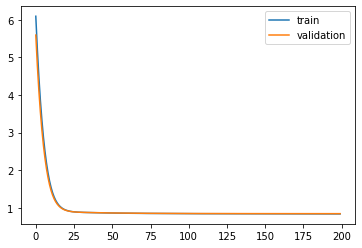

Time to train LSTM:  163.89320254325867
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 14s - loss: 5.0845 - pdc_loss: 0.7201 - event_loss: 0.6668 - val_loss: 4.6722 - val_pdc_loss: 0.7068 - val_event_loss: 0.6191

Epoch 00001: val_loss improved from inf to 4.67217, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 4.3784 - pdc_loss: 0.6943 - event_loss: 0.5954 - val_loss: 4.0260 - val_pdc_loss: 0.6843 - val_event_loss: 0.5590

Epoch 00002: val_loss improved from 4.67217 to 4.02600, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 3.7768 - pdc_loss: 0.6742 - event_loss: 0.5414 - val_loss: 3.4762 - val_pdc_loss: 0.6666 - val_event_loss: 0.5102

Epoch 00003: val_loss improved from 4.02600 to 3.47615, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 3.2669 - pdc_loss: 0.6583 - event_loss: 0.4970 - val_loss: 3.0112 - val_pdc_loss: 0.6520 - val_event_loss: 0.4690

Epoch 00004: val_loss improved from 3.47615 to 3.01123, saving


Epoch 00035: val_loss improved from 0.86480 to 0.86407, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 0.8663 - pdc_loss: 0.5365 - event_loss: 0.3175 - val_loss: 0.8631 - val_pdc_loss: 0.5380 - val_event_loss: 0.3128

Epoch 00036: val_loss improved from 0.86407 to 0.86307, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 0.8655 - pdc_loss: 0.5359 - event_loss: 0.3174 - val_loss: 0.8625 - val_pdc_loss: 0.5375 - val_event_loss: 0.3129

Epoch 00037: val_loss improved from 0.86307 to 0.86248, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 0.8647 - pdc_loss: 0.5353 - event_loss: 0.3174 - val_loss: 0.8616 - val_pdc_loss: 0.5368 - val_event_loss: 0.3128

Epoch 00038: val_loss improved from 0.86248 to 0.86163, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 0.8640 - pdc_loss: 0.5346 - event_loss: 0.3174 - val_loss: 0.8611 - val_pdc_loss: 0.5363 - val_event_loss: 0.3129

Epoch 00039: val_loss improved from 0.86163 to 


Epoch 00070: val_loss improved from 0.84630 to 0.84559, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 0.8482 - pdc_loss: 0.5215 - event_loss: 0.3166 - val_loss: 0.8453 - val_pdc_loss: 0.5236 - val_event_loss: 0.3116

Epoch 00071: val_loss improved from 0.84559 to 0.84527, saving model to Event_val_weights1.hdf5
Epoch 72/200
 - 1s - loss: 0.8479 - pdc_loss: 0.5212 - event_loss: 0.3166 - val_loss: 0.8452 - val_pdc_loss: 0.5233 - val_event_loss: 0.3118

Epoch 00072: val_loss improved from 0.84527 to 0.84521, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.8475 - pdc_loss: 0.5210 - event_loss: 0.3166 - val_loss: 0.8446 - val_pdc_loss: 0.5231 - val_event_loss: 0.3116

Epoch 00073: val_loss improved from 0.84521 to 0.84461, saving model to Event_val_weights1.hdf5
Epoch 74/200
 - 1s - loss: 0.8473 - pdc_loss: 0.5208 - event_loss: 0.3165 - val_loss: 0.8444 - val_pdc_loss: 0.5229 - val_event_loss: 0.3116

Epoch 00074: val_loss improved from 0.84461 to 


Epoch 00105: val_loss did not improve from 0.83916
Epoch 106/200
 - 1s - loss: 0.8406 - pdc_loss: 0.5162 - event_loss: 0.3159 - val_loss: 0.8389 - val_pdc_loss: 0.5187 - val_event_loss: 0.3116

Epoch 00106: val_loss improved from 0.83916 to 0.83886, saving model to Event_val_weights1.hdf5
Epoch 107/200
 - 1s - loss: 0.8405 - pdc_loss: 0.5161 - event_loss: 0.3159 - val_loss: 0.8393 - val_pdc_loss: 0.5189 - val_event_loss: 0.3118

Epoch 00107: val_loss did not improve from 0.83886
Epoch 108/200
 - 1s - loss: 0.8404 - pdc_loss: 0.5160 - event_loss: 0.3158 - val_loss: 0.8385 - val_pdc_loss: 0.5187 - val_event_loss: 0.3113

Epoch 00108: val_loss improved from 0.83886 to 0.83850, saving model to Event_val_weights1.hdf5
Epoch 109/200
 - 1s - loss: 0.8403 - pdc_loss: 0.5160 - event_loss: 0.3158 - val_loss: 0.8387 - val_pdc_loss: 0.5188 - val_event_loss: 0.3114

Epoch 00109: val_loss did not improve from 0.83850
Epoch 110/200
 - 1s - loss: 0.8402 - pdc_loss: 0.5159 - event_loss: 0.3158 - val_l


Epoch 00144: val_loss did not improve from 0.83650
Epoch 145/200
 - 1s - loss: 0.8372 - pdc_loss: 0.5143 - event_loss: 0.3152 - val_loss: 0.8366 - val_pdc_loss: 0.5180 - val_event_loss: 0.3108

Epoch 00145: val_loss did not improve from 0.83650
Epoch 146/200
 - 1s - loss: 0.8372 - pdc_loss: 0.5143 - event_loss: 0.3151 - val_loss: 0.8366 - val_pdc_loss: 0.5180 - val_event_loss: 0.3108

Epoch 00146: val_loss did not improve from 0.83650
Epoch 147/200
 - 1s - loss: 0.8371 - pdc_loss: 0.5142 - event_loss: 0.3151 - val_loss: 0.8368 - val_pdc_loss: 0.5181 - val_event_loss: 0.3110

Epoch 00147: val_loss did not improve from 0.83650
Epoch 148/200
 - 1s - loss: 0.8371 - pdc_loss: 0.5142 - event_loss: 0.3151 - val_loss: 0.8365 - val_pdc_loss: 0.5180 - val_event_loss: 0.3107

Epoch 00148: val_loss improved from 0.83650 to 0.83645, saving model to Event_val_weights1.hdf5
Epoch 149/200
 - 1s - loss: 0.8369 - pdc_loss: 0.5141 - event_loss: 0.3151 - val_loss: 0.8363 - val_pdc_loss: 0.5179 - val_even


Epoch 00184: val_loss improved from 0.83503 to 0.83485, saving model to Event_val_weights1.hdf5
Epoch 185/200
 - 1s - loss: 0.8351 - pdc_loss: 0.5133 - event_loss: 0.3146 - val_loss: 0.8352 - val_pdc_loss: 0.5177 - val_event_loss: 0.3102

Epoch 00185: val_loss did not improve from 0.83485
Epoch 186/200
 - 1s - loss: 0.8351 - pdc_loss: 0.5133 - event_loss: 0.3146 - val_loss: 0.8349 - val_pdc_loss: 0.5178 - val_event_loss: 0.3098

Epoch 00186: val_loss did not improve from 0.83485
Epoch 187/200
 - 1s - loss: 0.8351 - pdc_loss: 0.5133 - event_loss: 0.3146 - val_loss: 0.8353 - val_pdc_loss: 0.5178 - val_event_loss: 0.3103

Epoch 00187: val_loss did not improve from 0.83485
Epoch 188/200
 - 1s - loss: 0.8351 - pdc_loss: 0.5133 - event_loss: 0.3145 - val_loss: 0.8349 - val_pdc_loss: 0.5176 - val_event_loss: 0.3101

Epoch 00188: val_loss did not improve from 0.83485
Epoch 189/200
 - 1s - loss: 0.8350 - pdc_loss: 0.5132 - event_loss: 0.3146 - val_loss: 0.8351 - val_pdc_loss: 0.5177 - val_even

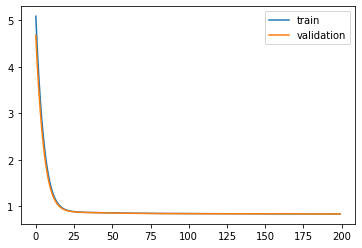

Time to train LSTM:  161.9127061367035
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 15s - loss: 5.0779 - pdc_loss: 0.7738 - event_loss: 0.6860 - val_loss: 4.6662 - val_pdc_loss: 0.7542 - val_event_loss: 0.6306

Epoch 00001: val_loss improved from inf to 4.66617, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 4.3647 - pdc_loss: 0.7426 - event_loss: 0.5896 - val_loss: 4.0219 - val_pdc_loss: 0.7271 - val_event_loss: 0.5593

Epoch 00002: val_loss improved from 4.66617 to 4.02186, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 3.7654 - pdc_loss: 0.7184 - event_loss: 0.5283 - val_loss: 3.4772 - val_pdc_loss: 0.7065 - val_event_loss: 0.5090

Epoch 00003: val_loss improved from 4.02186 to 3.47718, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 3.2584 - pdc_loss: 0.6992 - event_loss: 0.4826 - val_loss: 3.0161 - val_pdc_loss: 0.6895 - val_event_loss: 0.4683

Epoch 00004: val_loss improved from 3.47718 to 3.01607, saving 


Epoch 00035: val_loss improved from 0.87890 to 0.87816, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 0.8639 - pdc_loss: 0.5352 - event_loss: 0.3166 - val_loss: 0.8771 - val_pdc_loss: 0.5408 - val_event_loss: 0.3242

Epoch 00036: val_loss improved from 0.87816 to 0.87708, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 0.8630 - pdc_loss: 0.5344 - event_loss: 0.3166 - val_loss: 0.8767 - val_pdc_loss: 0.5401 - val_event_loss: 0.3246

Epoch 00037: val_loss improved from 0.87708 to 0.87670, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 0.8621 - pdc_loss: 0.5336 - event_loss: 0.3167 - val_loss: 0.8760 - val_pdc_loss: 0.5394 - val_event_loss: 0.3248

Epoch 00038: val_loss improved from 0.87670 to 0.87605, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 0.8612 - pdc_loss: 0.5327 - event_loss: 0.3167 - val_loss: 0.8752 - val_pdc_loss: 0.5386 - val_event_loss: 0.3248

Epoch 00039: val_loss improved from 0.87605 to 


Epoch 00070: val_loss improved from 0.86088 to 0.86085, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.8448 - pdc_loss: 0.5197 - event_loss: 0.3156 - val_loss: 0.8603 - val_pdc_loss: 0.5274 - val_event_loss: 0.3234

Epoch 00071: val_loss improved from 0.86085 to 0.86033, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.8444 - pdc_loss: 0.5194 - event_loss: 0.3155 - val_loss: 0.8602 - val_pdc_loss: 0.5273 - val_event_loss: 0.3235

Epoch 00072: val_loss improved from 0.86033 to 0.86018, saving model to Event_val_weights2.hdf5
Epoch 73/200
 - 1s - loss: 0.8440 - pdc_loss: 0.5192 - event_loss: 0.3155 - val_loss: 0.8600 - val_pdc_loss: 0.5271 - val_event_loss: 0.3236

Epoch 00073: val_loss improved from 0.86018 to 0.86003, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.8436 - pdc_loss: 0.5190 - event_loss: 0.3154 - val_loss: 0.8595 - val_pdc_loss: 0.5268 - val_event_loss: 0.3233

Epoch 00074: val_loss improved from 0.86003 to 


Epoch 00107: val_loss improved from 0.85434 to 0.85419, saving model to Event_val_weights2.hdf5
Epoch 108/200
 - 1s - loss: 0.8360 - pdc_loss: 0.5143 - event_loss: 0.3136 - val_loss: 0.8544 - val_pdc_loss: 0.5251 - val_event_loss: 0.3212

Epoch 00108: val_loss did not improve from 0.85419
Epoch 109/200
 - 1s - loss: 0.8359 - pdc_loss: 0.5142 - event_loss: 0.3136 - val_loss: 0.8543 - val_pdc_loss: 0.5249 - val_event_loss: 0.3212

Epoch 00109: val_loss did not improve from 0.85419
Epoch 110/200
 - 1s - loss: 0.8358 - pdc_loss: 0.5141 - event_loss: 0.3136 - val_loss: 0.8541 - val_pdc_loss: 0.5248 - val_event_loss: 0.3212

Epoch 00110: val_loss improved from 0.85419 to 0.85408, saving model to Event_val_weights2.hdf5
Epoch 111/200
 - 1s - loss: 0.8357 - pdc_loss: 0.5140 - event_loss: 0.3135 - val_loss: 0.8542 - val_pdc_loss: 0.5250 - val_event_loss: 0.3211

Epoch 00111: val_loss did not improve from 0.85408
Epoch 112/200
 - 1s - loss: 0.8355 - pdc_loss: 0.5139 - event_loss: 0.3135 - val_l

 - 1s - loss: 0.8332 - pdc_loss: 0.5125 - event_loss: 0.3131 - val_loss: 0.8525 - val_pdc_loss: 0.5242 - val_event_loss: 0.3207

Epoch 00146: val_loss did not improve from 0.85218
Epoch 147/200
 - 1s - loss: 0.8331 - pdc_loss: 0.5125 - event_loss: 0.3130 - val_loss: 0.8525 - val_pdc_loss: 0.5241 - val_event_loss: 0.3208

Epoch 00147: val_loss did not improve from 0.85218
Epoch 148/200
 - 1s - loss: 0.8331 - pdc_loss: 0.5125 - event_loss: 0.3131 - val_loss: 0.8525 - val_pdc_loss: 0.5242 - val_event_loss: 0.3207

Epoch 00148: val_loss did not improve from 0.85218
Epoch 149/200
 - 1s - loss: 0.8330 - pdc_loss: 0.5125 - event_loss: 0.3130 - val_loss: 0.8525 - val_pdc_loss: 0.5242 - val_event_loss: 0.3208

Epoch 00149: val_loss did not improve from 0.85218
Epoch 150/200
 - 1s - loss: 0.8329 - pdc_loss: 0.5124 - event_loss: 0.3130 - val_loss: 0.8524 - val_pdc_loss: 0.5241 - val_event_loss: 0.3207

Epoch 00150: val_loss did not improve from 0.85218
Epoch 151/200
 - 1s - loss: 0.8329 - pdc_los


Epoch 00186: val_loss improved from 0.85148 to 0.85121, saving model to Event_val_weights2.hdf5
Epoch 187/200
 - 1s - loss: 0.8315 - pdc_loss: 0.5117 - event_loss: 0.3126 - val_loss: 0.8516 - val_pdc_loss: 0.5236 - val_event_loss: 0.3208

Epoch 00187: val_loss did not improve from 0.85121
Epoch 188/200
 - 1s - loss: 0.8315 - pdc_loss: 0.5116 - event_loss: 0.3127 - val_loss: 0.8514 - val_pdc_loss: 0.5235 - val_event_loss: 0.3207

Epoch 00188: val_loss did not improve from 0.85121
Epoch 189/200
 - 1s - loss: 0.8314 - pdc_loss: 0.5116 - event_loss: 0.3126 - val_loss: 0.8514 - val_pdc_loss: 0.5234 - val_event_loss: 0.3208

Epoch 00189: val_loss did not improve from 0.85121
Epoch 190/200
 - 1s - loss: 0.8314 - pdc_loss: 0.5116 - event_loss: 0.3126 - val_loss: 0.8516 - val_pdc_loss: 0.5237 - val_event_loss: 0.3207

Epoch 00190: val_loss did not improve from 0.85121
Epoch 191/200
 - 1s - loss: 0.8313 - pdc_loss: 0.5115 - event_loss: 0.3126 - val_loss: 0.8517 - val_pdc_loss: 0.5239 - val_even

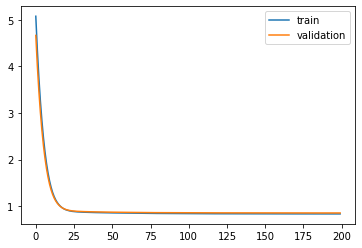

Time to train LSTM:  163.3982458114624
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 15s - loss: 5.0686 - pdc_loss: 0.6801 - event_loss: 0.6579 - val_loss: 4.6602 - val_pdc_loss: 0.6729 - val_event_loss: 0.6041

Epoch 00001: val_loss improved from inf to 4.66025, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 4.3558 - pdc_loss: 0.6609 - event_loss: 0.5676 - val_loss: 4.0092 - val_pdc_loss: 0.6542 - val_event_loss: 0.5327

Epoch 00002: val_loss improved from 4.66025 to 4.00922, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 3.7513 - pdc_loss: 0.6441 - event_loss: 0.5071 - val_loss: 3.4579 - val_pdc_loss: 0.6385 - val_event_loss: 0.4827

Epoch 00003: val_loss improved from 4.00922 to 3.45789, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 3.2397 - pdc_loss: 0.6298 - event_loss: 0.4629 - val_loss: 2.9933 - val_pdc_loss: 0.6259 - val_event_loss: 0.4445

Epoch 00004: val_loss improved from 3.45789 to 2.99333, saving 


Epoch 00035: val_loss improved from 0.87673 to 0.87584, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 0.8526 - pdc_loss: 0.5243 - event_loss: 0.3155 - val_loss: 0.8751 - val_pdc_loss: 0.5405 - val_event_loss: 0.3220

Epoch 00036: val_loss improved from 0.87584 to 0.87511, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 0.8516 - pdc_loss: 0.5236 - event_loss: 0.3155 - val_loss: 0.8740 - val_pdc_loss: 0.5397 - val_event_loss: 0.3220

Epoch 00037: val_loss improved from 0.87511 to 0.87398, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 0.8507 - pdc_loss: 0.5230 - event_loss: 0.3154 - val_loss: 0.8734 - val_pdc_loss: 0.5394 - val_event_loss: 0.3219

Epoch 00038: val_loss improved from 0.87398 to 0.87340, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 0.8499 - pdc_loss: 0.5225 - event_loss: 0.3154 - val_loss: 0.8727 - val_pdc_loss: 0.5389 - val_event_loss: 0.3219

Epoch 00039: val_loss improved from 0.87340 to 


Epoch 00071: val_loss improved from 0.86563 to 0.86529, saving model to Event_val_weights3.hdf5
Epoch 72/200
 - 1s - loss: 0.8382 - pdc_loss: 0.5147 - event_loss: 0.3141 - val_loss: 0.8653 - val_pdc_loss: 0.5341 - val_event_loss: 0.3218

Epoch 00072: val_loss did not improve from 0.86529
Epoch 73/200
 - 1s - loss: 0.8381 - pdc_loss: 0.5146 - event_loss: 0.3141 - val_loss: 0.8650 - val_pdc_loss: 0.5338 - val_event_loss: 0.3218

Epoch 00073: val_loss improved from 0.86529 to 0.86502, saving model to Event_val_weights3.hdf5
Epoch 74/200
 - 1s - loss: 0.8378 - pdc_loss: 0.5145 - event_loss: 0.3140 - val_loss: 0.8650 - val_pdc_loss: 0.5340 - val_event_loss: 0.3217

Epoch 00074: val_loss did not improve from 0.86502
Epoch 75/200
 - 1s - loss: 0.8377 - pdc_loss: 0.5143 - event_loss: 0.3140 - val_loss: 0.8648 - val_pdc_loss: 0.5337 - val_event_loss: 0.3218

Epoch 00075: val_loss improved from 0.86502 to 0.86476, saving model to Event_val_weights3.hdf5
Epoch 76/200
 - 1s - loss: 0.8375 - pdc_l


Epoch 00108: val_loss did not improve from 0.86176
Epoch 109/200
 - 1s - loss: 0.8335 - pdc_loss: 0.5118 - event_loss: 0.3135 - val_loss: 0.8616 - val_pdc_loss: 0.5319 - val_event_loss: 0.3214

Epoch 00109: val_loss improved from 0.86176 to 0.86155, saving model to Event_val_weights3.hdf5
Epoch 110/200
 - 1s - loss: 0.8334 - pdc_loss: 0.5117 - event_loss: 0.3134 - val_loss: 0.8618 - val_pdc_loss: 0.5321 - val_event_loss: 0.3214

Epoch 00110: val_loss did not improve from 0.86155
Epoch 111/200
 - 1s - loss: 0.8333 - pdc_loss: 0.5117 - event_loss: 0.3134 - val_loss: 0.8615 - val_pdc_loss: 0.5319 - val_event_loss: 0.3214

Epoch 00111: val_loss improved from 0.86155 to 0.86146, saving model to Event_val_weights3.hdf5
Epoch 112/200
 - 1s - loss: 0.8332 - pdc_loss: 0.5116 - event_loss: 0.3134 - val_loss: 0.8617 - val_pdc_loss: 0.5320 - val_event_loss: 0.3215

Epoch 00112: val_loss did not improve from 0.86146
Epoch 113/200
 - 1s - loss: 0.8332 - pdc_loss: 0.5116 - event_loss: 0.3134 - val_l

 - 1s - loss: 0.8311 - pdc_loss: 0.5106 - event_loss: 0.3130 - val_loss: 0.8605 - val_pdc_loss: 0.5315 - val_event_loss: 0.3214

Epoch 00148: val_loss did not improve from 0.86043
Epoch 149/200
 - 1s - loss: 0.8311 - pdc_loss: 0.5106 - event_loss: 0.3129 - val_loss: 0.8604 - val_pdc_loss: 0.5314 - val_event_loss: 0.3214

Epoch 00149: val_loss improved from 0.86043 to 0.86038, saving model to Event_val_weights3.hdf5
Epoch 150/200
 - 1s - loss: 0.8310 - pdc_loss: 0.5105 - event_loss: 0.3129 - val_loss: 0.8605 - val_pdc_loss: 0.5315 - val_event_loss: 0.3214

Epoch 00150: val_loss did not improve from 0.86038
Epoch 151/200
 - 1s - loss: 0.8310 - pdc_loss: 0.5105 - event_loss: 0.3129 - val_loss: 0.8607 - val_pdc_loss: 0.5317 - val_event_loss: 0.3215

Epoch 00151: val_loss did not improve from 0.86038
Epoch 152/200
 - 1s - loss: 0.8310 - pdc_loss: 0.5105 - event_loss: 0.3129 - val_loss: 0.8605 - val_pdc_loss: 0.5316 - val_event_loss: 0.3214

Epoch 00152: val_loss did not improve from 0.86038


Epoch 00188: val_loss did not improve from 0.85995
Epoch 189/200
 - 1s - loss: 0.8297 - pdc_loss: 0.5099 - event_loss: 0.3126 - val_loss: 0.8601 - val_pdc_loss: 0.5313 - val_event_loss: 0.3216

Epoch 00189: val_loss did not improve from 0.85995
Epoch 190/200
 - 1s - loss: 0.8296 - pdc_loss: 0.5099 - event_loss: 0.3126 - val_loss: 0.8603 - val_pdc_loss: 0.5315 - val_event_loss: 0.3216

Epoch 00190: val_loss did not improve from 0.85995
Epoch 191/200
 - 1s - loss: 0.8297 - pdc_loss: 0.5099 - event_loss: 0.3126 - val_loss: 0.8600 - val_pdc_loss: 0.5313 - val_event_loss: 0.3216

Epoch 00191: val_loss did not improve from 0.85995
Epoch 192/200
 - 1s - loss: 0.8295 - pdc_loss: 0.5098 - event_loss: 0.3126 - val_loss: 0.8601 - val_pdc_loss: 0.5313 - val_event_loss: 0.3216

Epoch 00192: val_loss did not improve from 0.85995
Epoch 193/200
 - 1s - loss: 0.8296 - pdc_loss: 0.5098 - event_loss: 0.3126 - val_loss: 0.8601 - val_pdc_loss: 0.5314 - val_event_loss: 0.3216

Epoch 00193: val_loss did not

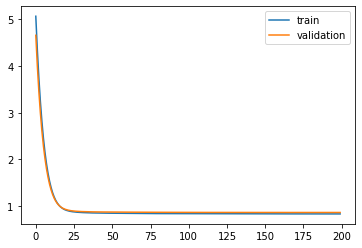

Time to train LSTM:  161.7069113254547
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 15s - loss: 5.2402 - pdc_loss: 0.7497 - event_loss: 0.6760 - val_loss: 4.8212 - val_pdc_loss: 0.7280 - val_event_loss: 0.6362

Epoch 00001: val_loss improved from inf to 4.82117, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 4.5210 - pdc_loss: 0.7191 - event_loss: 0.6072 - val_loss: 4.1603 - val_pdc_loss: 0.7004 - val_event_loss: 0.5774

Epoch 00002: val_loss improved from 4.82117 to 4.16034, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 3.9017 - pdc_loss: 0.6930 - event_loss: 0.5527 - val_loss: 3.5951 - val_pdc_loss: 0.6778 - val_event_loss: 0.5293

Epoch 00003: val_loss improved from 4.16034 to 3.59513, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 3.3730 - pdc_loss: 0.6712 - event_loss: 0.5068 - val_loss: 3.1150 - val_pdc_loss: 0.6593 - val_event_loss: 0.4884

Epoch 00004: val_loss improved from 3.59513 to 3.11501, saving 


Epoch 00035: val_loss improved from 0.89115 to 0.89049, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 0.8661 - pdc_loss: 0.5375 - event_loss: 0.3164 - val_loss: 0.8898 - val_pdc_loss: 0.5512 - val_event_loss: 0.3266

Epoch 00036: val_loss improved from 0.89049 to 0.88985, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 0.8653 - pdc_loss: 0.5369 - event_loss: 0.3163 - val_loss: 0.8893 - val_pdc_loss: 0.5507 - val_event_loss: 0.3266

Epoch 00037: val_loss improved from 0.88985 to 0.88930, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 0.8644 - pdc_loss: 0.5363 - event_loss: 0.3163 - val_loss: 0.8887 - val_pdc_loss: 0.5503 - val_event_loss: 0.3266

Epoch 00038: val_loss improved from 0.88930 to 0.88869, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 0.8636 - pdc_loss: 0.5356 - event_loss: 0.3162 - val_loss: 0.8882 - val_pdc_loss: 0.5499 - val_event_loss: 0.3267

Epoch 00039: val_loss improved from 0.88869 to 

 - 1s - loss: 0.8475 - pdc_loss: 0.5226 - event_loss: 0.3148 - val_loss: 0.8780 - val_pdc_loss: 0.5416 - val_event_loss: 0.3264

Epoch 00070: val_loss improved from 0.87836 to 0.87804, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.8472 - pdc_loss: 0.5224 - event_loss: 0.3148 - val_loss: 0.8779 - val_pdc_loss: 0.5414 - val_event_loss: 0.3265

Epoch 00071: val_loss improved from 0.87804 to 0.87789, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.8469 - pdc_loss: 0.5222 - event_loss: 0.3148 - val_loss: 0.8776 - val_pdc_loss: 0.5412 - val_event_loss: 0.3264

Epoch 00072: val_loss improved from 0.87789 to 0.87757, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.8467 - pdc_loss: 0.5220 - event_loss: 0.3147 - val_loss: 0.8774 - val_pdc_loss: 0.5411 - val_event_loss: 0.3264

Epoch 00073: val_loss improved from 0.87757 to 0.87741, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.8464 - pdc_loss: 0.5218 - event_


Epoch 00105: val_loss improved from 0.87237 to 0.87218, saving model to Event_val_weights4.hdf5
Epoch 106/200
 - 1s - loss: 0.8401 - pdc_loss: 0.5173 - event_loss: 0.3138 - val_loss: 0.8721 - val_pdc_loss: 0.5378 - val_event_loss: 0.3253

Epoch 00106: val_loss improved from 0.87218 to 0.87211, saving model to Event_val_weights4.hdf5
Epoch 107/200
 - 1s - loss: 0.8400 - pdc_loss: 0.5173 - event_loss: 0.3138 - val_loss: 0.8720 - val_pdc_loss: 0.5378 - val_event_loss: 0.3253

Epoch 00107: val_loss improved from 0.87211 to 0.87197, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.8398 - pdc_loss: 0.5172 - event_loss: 0.3137 - val_loss: 0.8719 - val_pdc_loss: 0.5377 - val_event_loss: 0.3253

Epoch 00108: val_loss improved from 0.87197 to 0.87189, saving model to Event_val_weights4.hdf5
Epoch 109/200
 - 1s - loss: 0.8397 - pdc_loss: 0.5171 - event_loss: 0.3137 - val_loss: 0.8717 - val_pdc_loss: 0.5376 - val_event_loss: 0.3253

Epoch 00109: val_loss improved from 0.87189


Epoch 00140: val_loss improved from 0.86952 to 0.86951, saving model to Event_val_weights4.hdf5
Epoch 141/200
 - 1s - loss: 0.8360 - pdc_loss: 0.5145 - event_loss: 0.3132 - val_loss: 0.8693 - val_pdc_loss: 0.5361 - val_event_loss: 0.3250

Epoch 00141: val_loss improved from 0.86951 to 0.86932, saving model to Event_val_weights4.hdf5
Epoch 142/200
 - 1s - loss: 0.8358 - pdc_loss: 0.5144 - event_loss: 0.3132 - val_loss: 0.8693 - val_pdc_loss: 0.5361 - val_event_loss: 0.3250

Epoch 00142: val_loss did not improve from 0.86932
Epoch 143/200
 - 1s - loss: 0.8358 - pdc_loss: 0.5144 - event_loss: 0.3132 - val_loss: 0.8692 - val_pdc_loss: 0.5360 - val_event_loss: 0.3250

Epoch 00143: val_loss improved from 0.86932 to 0.86921, saving model to Event_val_weights4.hdf5
Epoch 144/200
 - 1s - loss: 0.8356 - pdc_loss: 0.5143 - event_loss: 0.3131 - val_loss: 0.8692 - val_pdc_loss: 0.5360 - val_event_loss: 0.3250

Epoch 00144: val_loss did not improve from 0.86921
Epoch 145/200
 - 1s - loss: 0.8357 - 


Epoch 00177: val_loss improved from 0.86775 to 0.86773, saving model to Event_val_weights4.hdf5
Epoch 178/200
 - 1s - loss: 0.8332 - pdc_loss: 0.5128 - event_loss: 0.3127 - val_loss: 0.8678 - val_pdc_loss: 0.5353 - val_event_loss: 0.3248

Epoch 00178: val_loss did not improve from 0.86773
Epoch 179/200
 - 1s - loss: 0.8331 - pdc_loss: 0.5128 - event_loss: 0.3127 - val_loss: 0.8676 - val_pdc_loss: 0.5352 - val_event_loss: 0.3248

Epoch 00179: val_loss improved from 0.86773 to 0.86765, saving model to Event_val_weights4.hdf5
Epoch 180/200
 - 1s - loss: 0.8331 - pdc_loss: 0.5128 - event_loss: 0.3127 - val_loss: 0.8677 - val_pdc_loss: 0.5352 - val_event_loss: 0.3249

Epoch 00180: val_loss did not improve from 0.86765
Epoch 181/200
 - 1s - loss: 0.8330 - pdc_loss: 0.5127 - event_loss: 0.3127 - val_loss: 0.8676 - val_pdc_loss: 0.5352 - val_event_loss: 0.3248

Epoch 00181: val_loss improved from 0.86765 to 0.86759, saving model to Event_val_weights4.hdf5
Epoch 182/200
 - 1s - loss: 0.8330 - 

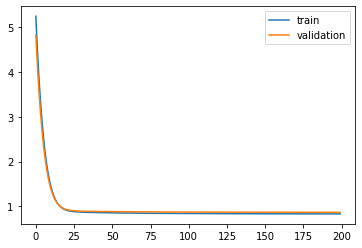

Time to train LSTM:  165.4849877357483
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 17s - loss: 5.1481 - pdc_loss: 0.7683 - event_loss: 0.6806 - val_loss: 4.7492 - val_pdc_loss: 0.7477 - val_event_loss: 0.6566

Epoch 00001: val_loss improved from inf to 4.74919, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 4.4637 - pdc_loss: 0.7348 - event_loss: 0.6426 - val_loss: 4.1182 - val_pdc_loss: 0.7183 - val_event_loss: 0.6204

Epoch 00002: val_loss improved from 4.74919 to 4.11824, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 3.8745 - pdc_loss: 0.7086 - event_loss: 0.6081 - val_loss: 3.5786 - val_pdc_loss: 0.6960 - val_event_loss: 0.5870

Epoch 00003: val_loss improved from 4.11824 to 3.57856, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 3.3723 - pdc_loss: 0.6886 - event_loss: 0.5761 - val_loss: 3.1205 - val_pdc_loss: 0.6787 - val_event_loss: 0.5558

Epoch 00004: val_loss improved from 3.57856 to 3.12055, saving 


Epoch 00035: val_loss improved from 0.87328 to 0.87241, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 0.8688 - pdc_loss: 0.5358 - event_loss: 0.3189 - val_loss: 0.8716 - val_pdc_loss: 0.5382 - val_event_loss: 0.3194

Epoch 00036: val_loss improved from 0.87241 to 0.87160, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 0.8678 - pdc_loss: 0.5352 - event_loss: 0.3187 - val_loss: 0.8707 - val_pdc_loss: 0.5376 - val_event_loss: 0.3194

Epoch 00037: val_loss improved from 0.87160 to 0.87071, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 0.8669 - pdc_loss: 0.5346 - event_loss: 0.3186 - val_loss: 0.8699 - val_pdc_loss: 0.5371 - val_event_loss: 0.3193

Epoch 00038: val_loss improved from 0.87071 to 0.86990, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 0.8660 - pdc_loss: 0.5340 - event_loss: 0.3185 - val_loss: 0.8691 - val_pdc_loss: 0.5365 - val_event_loss: 0.3192

Epoch 00039: val_loss improved from 0.86990 to 

 - 1s - loss: 0.8508 - pdc_loss: 0.5233 - event_loss: 0.3170 - val_loss: 0.8573 - val_pdc_loss: 0.5282 - val_event_loss: 0.3186

Epoch 00070: val_loss improved from 0.85758 to 0.85731, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.8506 - pdc_loss: 0.5231 - event_loss: 0.3170 - val_loss: 0.8573 - val_pdc_loss: 0.5282 - val_event_loss: 0.3187

Epoch 00071: val_loss improved from 0.85731 to 0.85727, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8503 - pdc_loss: 0.5229 - event_loss: 0.3169 - val_loss: 0.8570 - val_pdc_loss: 0.5280 - val_event_loss: 0.3186

Epoch 00072: val_loss improved from 0.85727 to 0.85700, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8500 - pdc_loss: 0.5228 - event_loss: 0.3169 - val_loss: 0.8570 - val_pdc_loss: 0.5280 - val_event_loss: 0.3187

Epoch 00073: val_loss improved from 0.85700 to 0.85697, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8498 - pdc_loss: 0.5226 - event_


Epoch 00106: val_loss improved from 0.85296 to 0.85289, saving model to Event_val_weights5.hdf5
Epoch 107/200
 - 1s - loss: 0.8433 - pdc_loss: 0.5183 - event_loss: 0.3158 - val_loss: 0.8530 - val_pdc_loss: 0.5254 - val_event_loss: 0.3186

Epoch 00107: val_loss did not improve from 0.85289
Epoch 108/200
 - 1s - loss: 0.8431 - pdc_loss: 0.5183 - event_loss: 0.3158 - val_loss: 0.8529 - val_pdc_loss: 0.5254 - val_event_loss: 0.3184

Epoch 00108: val_loss improved from 0.85289 to 0.85288, saving model to Event_val_weights5.hdf5
Epoch 109/200
 - 1s - loss: 0.8430 - pdc_loss: 0.5181 - event_loss: 0.3158 - val_loss: 0.8529 - val_pdc_loss: 0.5253 - val_event_loss: 0.3186

Epoch 00109: val_loss improved from 0.85288 to 0.85288, saving model to Event_val_weights5.hdf5
Epoch 110/200
 - 1s - loss: 0.8428 - pdc_loss: 0.5181 - event_loss: 0.3157 - val_loss: 0.8526 - val_pdc_loss: 0.5251 - val_event_loss: 0.3185

Epoch 00110: val_loss improved from 0.85288 to 0.85256, saving model to Event_val_weight

 - 1s - loss: 0.8376 - pdc_loss: 0.5148 - event_loss: 0.3146 - val_loss: 0.8487 - val_pdc_loss: 0.5228 - val_event_loss: 0.3178

Epoch 00144: val_loss improved from 0.84907 to 0.84870, saving model to Event_val_weights5.hdf5
Epoch 145/200
 - 1s - loss: 0.8372 - pdc_loss: 0.5145 - event_loss: 0.3146 - val_loss: 0.8482 - val_pdc_loss: 0.5222 - val_event_loss: 0.3178

Epoch 00145: val_loss improved from 0.84870 to 0.84815, saving model to Event_val_weights5.hdf5
Epoch 146/200
 - 1s - loss: 0.8371 - pdc_loss: 0.5144 - event_loss: 0.3146 - val_loss: 0.8480 - val_pdc_loss: 0.5222 - val_event_loss: 0.3178

Epoch 00146: val_loss improved from 0.84815 to 0.84800, saving model to Event_val_weights5.hdf5
Epoch 147/200
 - 1s - loss: 0.8368 - pdc_loss: 0.5141 - event_loss: 0.3146 - val_loss: 0.8477 - val_pdc_loss: 0.5219 - val_event_loss: 0.3177

Epoch 00147: val_loss improved from 0.84800 to 0.84766, saving model to Event_val_weights5.hdf5
Epoch 148/200
 - 1s - loss: 0.8367 - pdc_loss: 0.5141 - ev

 - 1s - loss: 0.8342 - pdc_loss: 0.5126 - event_loss: 0.3144 - val_loss: 0.8437 - val_pdc_loss: 0.5193 - val_event_loss: 0.3171

Epoch 00181: val_loss did not improve from 0.84339
Epoch 182/200
 - 1s - loss: 0.8341 - pdc_loss: 0.5125 - event_loss: 0.3144 - val_loss: 0.8436 - val_pdc_loss: 0.5193 - val_event_loss: 0.3171

Epoch 00182: val_loss did not improve from 0.84339
Epoch 183/200
 - 1s - loss: 0.8341 - pdc_loss: 0.5125 - event_loss: 0.3144 - val_loss: 0.8436 - val_pdc_loss: 0.5191 - val_event_loss: 0.3172

Epoch 00183: val_loss did not improve from 0.84339
Epoch 184/200
 - 1s - loss: 0.8339 - pdc_loss: 0.5124 - event_loss: 0.3144 - val_loss: 0.8432 - val_pdc_loss: 0.5190 - val_event_loss: 0.3170

Epoch 00184: val_loss improved from 0.84339 to 0.84323, saving model to Event_val_weights5.hdf5
Epoch 185/200
 - 1s - loss: 0.8340 - pdc_loss: 0.5125 - event_loss: 0.3143 - val_loss: 0.8432 - val_pdc_loss: 0.5189 - val_event_loss: 0.3171

Epoch 00185: val_loss did not improve from 0.84323

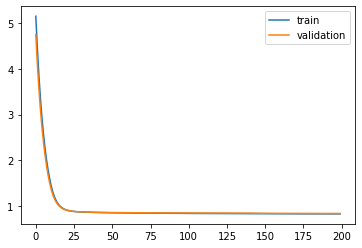

Time to train LSTM:  164.4562005996704
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 16s - loss: 5.7299 - pdc_loss: 0.7397 - event_loss: 0.7519 - val_loss: 5.2582 - val_pdc_loss: 0.7232 - val_event_loss: 0.6978

Epoch 00001: val_loss improved from inf to 5.25825, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 4.9230 - pdc_loss: 0.7140 - event_loss: 0.6659 - val_loss: 4.5221 - val_pdc_loss: 0.7020 - val_event_loss: 0.6269

Epoch 00002: val_loss improved from 5.25825 to 4.52208, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 4.2401 - pdc_loss: 0.6937 - event_loss: 0.6067 - val_loss: 3.9002 - val_pdc_loss: 0.6843 - val_event_loss: 0.5757

Epoch 00003: val_loss improved from 4.52208 to 3.90017, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 3.6647 - pdc_loss: 0.6766 - event_loss: 0.5629 - val_loss: 3.3771 - val_pdc_loss: 0.6691 - val_event_loss: 0.5361

Epoch 00004: val_loss improved from 3.90017 to 3.37713, saving 


Epoch 00035: val_loss improved from 0.86715 to 0.86599, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 0.8679 - pdc_loss: 0.5359 - event_loss: 0.3177 - val_loss: 0.8647 - val_pdc_loss: 0.5374 - val_event_loss: 0.3130

Epoch 00036: val_loss improved from 0.86599 to 0.86469, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 0.8668 - pdc_loss: 0.5351 - event_loss: 0.3176 - val_loss: 0.8635 - val_pdc_loss: 0.5366 - val_event_loss: 0.3129

Epoch 00037: val_loss improved from 0.86469 to 0.86352, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 0.8657 - pdc_loss: 0.5342 - event_loss: 0.3175 - val_loss: 0.8623 - val_pdc_loss: 0.5357 - val_event_loss: 0.3128

Epoch 00038: val_loss improved from 0.86352 to 0.86231, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 0.8647 - pdc_loss: 0.5334 - event_loss: 0.3175 - val_loss: 0.8613 - val_pdc_loss: 0.5348 - val_event_loss: 0.3128

Epoch 00039: val_loss improved from 0.86231 to 

 - 1s - loss: 0.8467 - pdc_loss: 0.5201 - event_loss: 0.3164 - val_loss: 0.8413 - val_pdc_loss: 0.5202 - val_event_loss: 0.3110

Epoch 00070: val_loss improved from 0.84152 to 0.84129, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 0.8465 - pdc_loss: 0.5199 - event_loss: 0.3165 - val_loss: 0.8408 - val_pdc_loss: 0.5197 - val_event_loss: 0.3110

Epoch 00071: val_loss improved from 0.84129 to 0.84081, saving model to Event_val_weights1.hdf5
Epoch 72/200
 - 1s - loss: 0.8461 - pdc_loss: 0.5196 - event_loss: 0.3164 - val_loss: 0.8408 - val_pdc_loss: 0.5198 - val_event_loss: 0.3110

Epoch 00072: val_loss did not improve from 0.84081
Epoch 73/200
 - 1s - loss: 0.8458 - pdc_loss: 0.5194 - event_loss: 0.3164 - val_loss: 0.8403 - val_pdc_loss: 0.5193 - val_event_loss: 0.3110

Epoch 00073: val_loss improved from 0.84081 to 0.84033, saving model to Event_val_weights1.hdf5
Epoch 74/200
 - 1s - loss: 0.8455 - pdc_loss: 0.5192 - event_loss: 0.3163 - val_loss: 0.8402 - val_pdc_los

 - 1s - loss: 0.8397 - pdc_loss: 0.5154 - event_loss: 0.3154 - val_loss: 0.8360 - val_pdc_loss: 0.5168 - val_event_loss: 0.3103

Epoch 00106: val_loss did not improve from 0.83594
Epoch 107/200
 - 1s - loss: 0.8395 - pdc_loss: 0.5154 - event_loss: 0.3154 - val_loss: 0.8359 - val_pdc_loss: 0.5168 - val_event_loss: 0.3103

Epoch 00107: val_loss improved from 0.83594 to 0.83592, saving model to Event_val_weights1.hdf5
Epoch 108/200
 - 1s - loss: 0.8395 - pdc_loss: 0.5153 - event_loss: 0.3154 - val_loss: 0.8358 - val_pdc_loss: 0.5167 - val_event_loss: 0.3104

Epoch 00108: val_loss improved from 0.83592 to 0.83581, saving model to Event_val_weights1.hdf5
Epoch 109/200
 - 1s - loss: 0.8393 - pdc_loss: 0.5152 - event_loss: 0.3154 - val_loss: 0.8357 - val_pdc_loss: 0.5168 - val_event_loss: 0.3102

Epoch 00109: val_loss improved from 0.83581 to 0.83570, saving model to Event_val_weights1.hdf5
Epoch 110/200
 - 1s - loss: 0.8392 - pdc_loss: 0.5151 - event_loss: 0.3154 - val_loss: 0.8358 - val_pdc

 - 1s - loss: 0.8366 - pdc_loss: 0.5138 - event_loss: 0.3147 - val_loss: 0.8348 - val_pdc_loss: 0.5164 - val_event_loss: 0.3102

Epoch 00146: val_loss improved from 0.83485 to 0.83479, saving model to Event_val_weights1.hdf5
Epoch 147/200
 - 1s - loss: 0.8366 - pdc_loss: 0.5138 - event_loss: 0.3147 - val_loss: 0.8351 - val_pdc_loss: 0.5166 - val_event_loss: 0.3103

Epoch 00147: val_loss did not improve from 0.83479
Epoch 148/200
 - 1s - loss: 0.8366 - pdc_loss: 0.5138 - event_loss: 0.3146 - val_loss: 0.8347 - val_pdc_loss: 0.5163 - val_event_loss: 0.3103

Epoch 00148: val_loss improved from 0.83479 to 0.83467, saving model to Event_val_weights1.hdf5
Epoch 149/200
 - 1s - loss: 0.8365 - pdc_loss: 0.5138 - event_loss: 0.3146 - val_loss: 0.8346 - val_pdc_loss: 0.5162 - val_event_loss: 0.3102

Epoch 00149: val_loss improved from 0.83467 to 0.83456, saving model to Event_val_weights1.hdf5
Epoch 150/200
 - 1s - loss: 0.8365 - pdc_loss: 0.5138 - event_loss: 0.3146 - val_loss: 0.8345 - val_pdc


Epoch 00183: val_loss did not improve from 0.83197
Epoch 184/200
 - 1s - loss: 0.8347 - pdc_loss: 0.5127 - event_loss: 0.3142 - val_loss: 0.8320 - val_pdc_loss: 0.5144 - val_event_loss: 0.3098

Epoch 00184: val_loss did not improve from 0.83197
Epoch 185/200
 - 1s - loss: 0.8347 - pdc_loss: 0.5127 - event_loss: 0.3142 - val_loss: 0.8321 - val_pdc_loss: 0.5146 - val_event_loss: 0.3096

Epoch 00185: val_loss did not improve from 0.83197
Epoch 186/200
 - 1s - loss: 0.8346 - pdc_loss: 0.5127 - event_loss: 0.3142 - val_loss: 0.8318 - val_pdc_loss: 0.5144 - val_event_loss: 0.3096

Epoch 00186: val_loss improved from 0.83197 to 0.83184, saving model to Event_val_weights1.hdf5
Epoch 187/200
 - 1s - loss: 0.8346 - pdc_loss: 0.5126 - event_loss: 0.3142 - val_loss: 0.8321 - val_pdc_loss: 0.5147 - val_event_loss: 0.3096

Epoch 00187: val_loss did not improve from 0.83184
Epoch 188/200
 - 1s - loss: 0.8345 - pdc_loss: 0.5126 - event_loss: 0.3141 - val_loss: 0.8318 - val_pdc_loss: 0.5144 - val_even

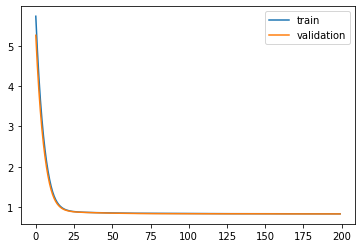

Time to train LSTM:  163.9487750530243
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 16s - loss: 5.7183 - pdc_loss: 0.7367 - event_loss: 0.6903 - val_loss: 5.2579 - val_pdc_loss: 0.7171 - val_event_loss: 0.6556

Epoch 00001: val_loss improved from inf to 5.25795, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 4.9260 - pdc_loss: 0.7143 - event_loss: 0.6243 - val_loss: 4.5300 - val_pdc_loss: 0.6981 - val_event_loss: 0.5988

Epoch 00002: val_loss improved from 5.25795 to 4.52999, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 4.2441 - pdc_loss: 0.6953 - event_loss: 0.5724 - val_loss: 3.9064 - val_pdc_loss: 0.6806 - val_event_loss: 0.5530

Epoch 00003: val_loss improved from 4.52999 to 3.90635, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 3.6620 - pdc_loss: 0.6776 - event_loss: 0.5299 - val_loss: 3.3755 - val_pdc_loss: 0.6639 - val_event_loss: 0.5142

Epoch 00004: val_loss improved from 3.90635 to 3.37546, saving 


Epoch 00035: val_loss improved from 0.88082 to 0.87951, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 0.8658 - pdc_loss: 0.5352 - event_loss: 0.3167 - val_loss: 0.8782 - val_pdc_loss: 0.5414 - val_event_loss: 0.3230

Epoch 00036: val_loss improved from 0.87951 to 0.87817, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 0.8644 - pdc_loss: 0.5341 - event_loss: 0.3166 - val_loss: 0.8772 - val_pdc_loss: 0.5404 - val_event_loss: 0.3231

Epoch 00037: val_loss improved from 0.87817 to 0.87721, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 0.8631 - pdc_loss: 0.5330 - event_loss: 0.3165 - val_loss: 0.8760 - val_pdc_loss: 0.5394 - val_event_loss: 0.3229

Epoch 00038: val_loss improved from 0.87721 to 0.87596, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 0.8619 - pdc_loss: 0.5319 - event_loss: 0.3164 - val_loss: 0.8754 - val_pdc_loss: 0.5386 - val_event_loss: 0.3232

Epoch 00039: val_loss improved from 0.87596 to 


Epoch 00070: val_loss improved from 0.86061 to 0.86033, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.8438 - pdc_loss: 0.5184 - event_loss: 0.3154 - val_loss: 0.8600 - val_pdc_loss: 0.5276 - val_event_loss: 0.3223

Epoch 00071: val_loss improved from 0.86033 to 0.85998, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.8436 - pdc_loss: 0.5182 - event_loss: 0.3154 - val_loss: 0.8599 - val_pdc_loss: 0.5274 - val_event_loss: 0.3225

Epoch 00072: val_loss improved from 0.85998 to 0.85988, saving model to Event_val_weights2.hdf5
Epoch 73/200
 - 1s - loss: 0.8433 - pdc_loss: 0.5181 - event_loss: 0.3153 - val_loss: 0.8597 - val_pdc_loss: 0.5274 - val_event_loss: 0.3224

Epoch 00073: val_loss improved from 0.85988 to 0.85972, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.8431 - pdc_loss: 0.5179 - event_loss: 0.3153 - val_loss: 0.8591 - val_pdc_loss: 0.5271 - val_event_loss: 0.3222

Epoch 00074: val_loss improved from 0.85972 to 


Epoch 00108: val_loss improved from 0.85606 to 0.85595, saving model to Event_val_weights2.hdf5
Epoch 109/200
 - 1s - loss: 0.8378 - pdc_loss: 0.5144 - event_loss: 0.3146 - val_loss: 0.8558 - val_pdc_loss: 0.5254 - val_event_loss: 0.3215

Epoch 00109: val_loss improved from 0.85595 to 0.85577, saving model to Event_val_weights2.hdf5
Epoch 110/200
 - 1s - loss: 0.8377 - pdc_loss: 0.5143 - event_loss: 0.3145 - val_loss: 0.8558 - val_pdc_loss: 0.5254 - val_event_loss: 0.3216

Epoch 00110: val_loss did not improve from 0.85577
Epoch 111/200
 - 1s - loss: 0.8377 - pdc_loss: 0.5143 - event_loss: 0.3145 - val_loss: 0.8558 - val_pdc_loss: 0.5254 - val_event_loss: 0.3216

Epoch 00111: val_loss improved from 0.85577 to 0.85577, saving model to Event_val_weights2.hdf5
Epoch 112/200
 - 1s - loss: 0.8375 - pdc_loss: 0.5142 - event_loss: 0.3145 - val_loss: 0.8556 - val_pdc_loss: 0.5252 - val_event_loss: 0.3216

Epoch 00112: val_loss improved from 0.85577 to 0.85558, saving model to Event_val_weight

 - 1s - loss: 0.8350 - pdc_loss: 0.5128 - event_loss: 0.3139 - val_loss: 0.8540 - val_pdc_loss: 0.5244 - val_event_loss: 0.3213

Epoch 00147: val_loss did not improve from 0.85391
Epoch 148/200
 - 1s - loss: 0.8350 - pdc_loss: 0.5128 - event_loss: 0.3139 - val_loss: 0.8539 - val_pdc_loss: 0.5244 - val_event_loss: 0.3211

Epoch 00148: val_loss improved from 0.85391 to 0.85386, saving model to Event_val_weights2.hdf5
Epoch 149/200
 - 1s - loss: 0.8350 - pdc_loss: 0.5128 - event_loss: 0.3138 - val_loss: 0.8540 - val_pdc_loss: 0.5244 - val_event_loss: 0.3212

Epoch 00149: val_loss did not improve from 0.85386
Epoch 150/200
 - 1s - loss: 0.8349 - pdc_loss: 0.5127 - event_loss: 0.3138 - val_loss: 0.8538 - val_pdc_loss: 0.5243 - val_event_loss: 0.3212

Epoch 00150: val_loss improved from 0.85386 to 0.85381, saving model to Event_val_weights2.hdf5
Epoch 151/200
 - 1s - loss: 0.8349 - pdc_loss: 0.5127 - event_loss: 0.3138 - val_loss: 0.8539 - val_pdc_loss: 0.5243 - val_event_loss: 0.3212

Epoch

 - 1s - loss: 0.8333 - pdc_loss: 0.5122 - event_loss: 0.3130 - val_loss: 0.8530 - val_pdc_loss: 0.5239 - val_event_loss: 0.3211

Epoch 00186: val_loss did not improve from 0.85289
Epoch 187/200
 - 1s - loss: 0.8332 - pdc_loss: 0.5121 - event_loss: 0.3130 - val_loss: 0.8531 - val_pdc_loss: 0.5239 - val_event_loss: 0.3212

Epoch 00187: val_loss did not improve from 0.85289
Epoch 188/200
 - 1s - loss: 0.8332 - pdc_loss: 0.5121 - event_loss: 0.3130 - val_loss: 0.8532 - val_pdc_loss: 0.5239 - val_event_loss: 0.3213

Epoch 00188: val_loss did not improve from 0.85289
Epoch 189/200
 - 1s - loss: 0.8331 - pdc_loss: 0.5121 - event_loss: 0.3130 - val_loss: 0.8530 - val_pdc_loss: 0.5239 - val_event_loss: 0.3211

Epoch 00189: val_loss did not improve from 0.85289
Epoch 190/200
 - 1s - loss: 0.8330 - pdc_loss: 0.5121 - event_loss: 0.3129 - val_loss: 0.8533 - val_pdc_loss: 0.5239 - val_event_loss: 0.3214

Epoch 00190: val_loss did not improve from 0.85289
Epoch 191/200
 - 1s - loss: 0.8330 - pdc_los

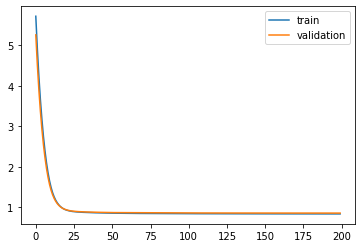

Time to train LSTM:  164.50246286392212
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 16s - loss: 5.6839 - pdc_loss: 0.7225 - event_loss: 0.7618 - val_loss: 5.2163 - val_pdc_loss: 0.7119 - val_event_loss: 0.6967

Epoch 00001: val_loss improved from inf to 5.21628, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 4.8781 - pdc_loss: 0.7004 - event_loss: 0.6583 - val_loss: 4.4822 - val_pdc_loss: 0.6922 - val_event_loss: 0.6136

Epoch 00002: val_loss improved from 5.21628 to 4.48220, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 4.1941 - pdc_loss: 0.6806 - event_loss: 0.5864 - val_loss: 3.8598 - val_pdc_loss: 0.6736 - val_event_loss: 0.5543

Epoch 00003: val_loss improved from 4.48220 to 3.85984, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 3.6139 - pdc_loss: 0.6618 - event_loss: 0.5326 - val_loss: 3.3331 - val_pdc_loss: 0.6558 - val_event_loss: 0.5082

Epoch 00004: val_loss improved from 3.85984 to 3.33309, saving


Epoch 00035: val_loss improved from 0.88639 to 0.88525, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 0.8633 - pdc_loss: 0.5336 - event_loss: 0.3158 - val_loss: 0.8844 - val_pdc_loss: 0.5483 - val_event_loss: 0.3223

Epoch 00036: val_loss improved from 0.88525 to 0.88442, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 0.8621 - pdc_loss: 0.5327 - event_loss: 0.3158 - val_loss: 0.8836 - val_pdc_loss: 0.5476 - val_event_loss: 0.3224

Epoch 00037: val_loss improved from 0.88442 to 0.88360, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 0.8611 - pdc_loss: 0.5319 - event_loss: 0.3158 - val_loss: 0.8830 - val_pdc_loss: 0.5471 - val_event_loss: 0.3224

Epoch 00038: val_loss improved from 0.88360 to 0.88296, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 0.8602 - pdc_loss: 0.5311 - event_loss: 0.3157 - val_loss: 0.8821 - val_pdc_loss: 0.5465 - val_event_loss: 0.3224

Epoch 00039: val_loss improved from 0.88296 to 


Epoch 00070: val_loss improved from 0.87340 to 0.87321, saving model to Event_val_weights3.hdf5
Epoch 71/200
 - 1s - loss: 0.8462 - pdc_loss: 0.5211 - event_loss: 0.3152 - val_loss: 0.8730 - val_pdc_loss: 0.5399 - val_event_loss: 0.3232

Epoch 00071: val_loss improved from 0.87321 to 0.87304, saving model to Event_val_weights3.hdf5
Epoch 72/200
 - 1s - loss: 0.8460 - pdc_loss: 0.5209 - event_loss: 0.3152 - val_loss: 0.8728 - val_pdc_loss: 0.5398 - val_event_loss: 0.3232

Epoch 00072: val_loss improved from 0.87304 to 0.87276, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.8457 - pdc_loss: 0.5208 - event_loss: 0.3152 - val_loss: 0.8727 - val_pdc_loss: 0.5397 - val_event_loss: 0.3232

Epoch 00073: val_loss improved from 0.87276 to 0.87267, saving model to Event_val_weights3.hdf5
Epoch 74/200
 - 1s - loss: 0.8455 - pdc_loss: 0.5206 - event_loss: 0.3152 - val_loss: 0.8724 - val_pdc_loss: 0.5394 - val_event_loss: 0.3233

Epoch 00074: val_loss improved from 0.87267 to 


Epoch 00106: val_loss improved from 0.86795 to 0.86788, saving model to Event_val_weights3.hdf5
Epoch 107/200
 - 1s - loss: 0.8401 - pdc_loss: 0.5169 - event_loss: 0.3147 - val_loss: 0.8677 - val_pdc_loss: 0.5361 - val_event_loss: 0.3231

Epoch 00107: val_loss improved from 0.86788 to 0.86771, saving model to Event_val_weights3.hdf5
Epoch 108/200
 - 1s - loss: 0.8400 - pdc_loss: 0.5168 - event_loss: 0.3148 - val_loss: 0.8675 - val_pdc_loss: 0.5359 - val_event_loss: 0.3231

Epoch 00108: val_loss improved from 0.86771 to 0.86754, saving model to Event_val_weights3.hdf5
Epoch 109/200
 - 1s - loss: 0.8399 - pdc_loss: 0.5167 - event_loss: 0.3147 - val_loss: 0.8678 - val_pdc_loss: 0.5361 - val_event_loss: 0.3231

Epoch 00109: val_loss did not improve from 0.86754
Epoch 110/200
 - 1s - loss: 0.8398 - pdc_loss: 0.5166 - event_loss: 0.3147 - val_loss: 0.8673 - val_pdc_loss: 0.5358 - val_event_loss: 0.3231

Epoch 00110: val_loss improved from 0.86754 to 0.86734, saving model to Event_val_weight

 - 1s - loss: 0.8366 - pdc_loss: 0.5143 - event_loss: 0.3143 - val_loss: 0.8646 - val_pdc_loss: 0.5337 - val_event_loss: 0.3229

Epoch 00143: val_loss did not improve from 0.86445
Epoch 144/200
 - 1s - loss: 0.8366 - pdc_loss: 0.5143 - event_loss: 0.3144 - val_loss: 0.8645 - val_pdc_loss: 0.5337 - val_event_loss: 0.3229

Epoch 00144: val_loss did not improve from 0.86445
Epoch 145/200
 - 1s - loss: 0.8365 - pdc_loss: 0.5143 - event_loss: 0.3143 - val_loss: 0.8647 - val_pdc_loss: 0.5337 - val_event_loss: 0.3231

Epoch 00145: val_loss did not improve from 0.86445
Epoch 146/200
 - 1s - loss: 0.8364 - pdc_loss: 0.5142 - event_loss: 0.3143 - val_loss: 0.8643 - val_pdc_loss: 0.5335 - val_event_loss: 0.3229

Epoch 00146: val_loss improved from 0.86445 to 0.86435, saving model to Event_val_weights3.hdf5
Epoch 147/200
 - 1s - loss: 0.8363 - pdc_loss: 0.5141 - event_loss: 0.3143 - val_loss: 0.8643 - val_pdc_loss: 0.5335 - val_event_loss: 0.3229

Epoch 00147: val_loss improved from 0.86435 to 0.8


Epoch 00181: val_loss improved from 0.86297 to 0.86292, saving model to Event_val_weights3.hdf5
Epoch 182/200
 - 1s - loss: 0.8336 - pdc_loss: 0.5123 - event_loss: 0.3137 - val_loss: 0.8628 - val_pdc_loss: 0.5327 - val_event_loss: 0.3225

Epoch 00182: val_loss improved from 0.86292 to 0.86282, saving model to Event_val_weights3.hdf5
Epoch 183/200
 - 1s - loss: 0.8335 - pdc_loss: 0.5122 - event_loss: 0.3136 - val_loss: 0.8627 - val_pdc_loss: 0.5326 - val_event_loss: 0.3224

Epoch 00183: val_loss improved from 0.86282 to 0.86273, saving model to Event_val_weights3.hdf5
Epoch 184/200
 - 1s - loss: 0.8335 - pdc_loss: 0.5122 - event_loss: 0.3137 - val_loss: 0.8628 - val_pdc_loss: 0.5327 - val_event_loss: 0.3224

Epoch 00184: val_loss did not improve from 0.86273
Epoch 185/200
 - 1s - loss: 0.8333 - pdc_loss: 0.5121 - event_loss: 0.3136 - val_loss: 0.8627 - val_pdc_loss: 0.5328 - val_event_loss: 0.3223

Epoch 00185: val_loss improved from 0.86273 to 0.86272, saving model to Event_val_weight

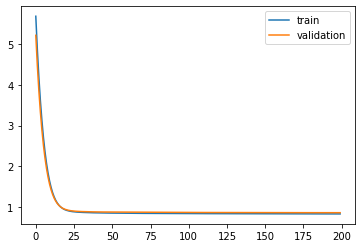

Time to train LSTM:  166.19226503372192


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f689d531550>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 17s - loss: 5.6997 - pdc_loss: 0.7404 - event_loss: 0.7784 - val_loss: 5.2242 - val_pdc_loss: 0.7207 - val_event_loss: 0.7176

Epoch 00001: val_loss improved from inf to 5.22418, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 4.8966 - pdc_loss: 0.7158 - event_loss: 0.6849 - val_loss: 4.4884 - val_pdc_loss: 0.6985 - val_event_loss: 0.6390

Epoch 00002: val_loss improved from 5.22418 to 4.48844, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 4.2092 - pdc_loss: 0.6941 - event_loss: 0.6146 - val_loss: 3.8619 - val_pdc_loss: 0.6783 - val_event_loss: 0.5794

Epoch 00003: val_loss improved from 4.48844 to 3.86194, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 3.6248 - pdc_loss: 0.6734 - event_loss: 0.5601 - val_loss: 3.3317 - val_pdc_loss: 0.6597 - val_event_loss: 0.5318

Epoch 00004: val_loss improved from 3.86194 to 3.33171, saving model to Event_val_weights4.hdf5
Epoch 


Epoch 00035: val_loss improved from 0.89303 to 0.89227, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 0.8659 - pdc_loss: 0.5347 - event_loss: 0.3174 - val_loss: 0.8916 - val_pdc_loss: 0.5497 - val_event_loss: 0.3282

Epoch 00036: val_loss improved from 0.89227 to 0.89160, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 0.8649 - pdc_loss: 0.5338 - event_loss: 0.3174 - val_loss: 0.8910 - val_pdc_loss: 0.5492 - val_event_loss: 0.3282

Epoch 00037: val_loss improved from 0.89160 to 0.89100, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 0.8638 - pdc_loss: 0.5329 - event_loss: 0.3173 - val_loss: 0.8904 - val_pdc_loss: 0.5487 - val_event_loss: 0.3282

Epoch 00038: val_loss improved from 0.89100 to 0.89043, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 0.8628 - pdc_loss: 0.5320 - event_loss: 0.3173 - val_loss: 0.8899 - val_pdc_loss: 0.5482 - val_event_loss: 0.3282

Epoch 00039: val_loss improved from 0.89043 to 

 - 1s - loss: 0.8454 - pdc_loss: 0.5196 - event_loss: 0.3154 - val_loss: 0.8785 - val_pdc_loss: 0.5414 - val_event_loss: 0.3267

Epoch 00070: val_loss improved from 0.87849 to 0.87849, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.8453 - pdc_loss: 0.5195 - event_loss: 0.3154 - val_loss: 0.8783 - val_pdc_loss: 0.5412 - val_event_loss: 0.3267

Epoch 00071: val_loss improved from 0.87849 to 0.87831, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.8450 - pdc_loss: 0.5193 - event_loss: 0.3153 - val_loss: 0.8781 - val_pdc_loss: 0.5411 - val_event_loss: 0.3267

Epoch 00072: val_loss improved from 0.87831 to 0.87813, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.8448 - pdc_loss: 0.5192 - event_loss: 0.3153 - val_loss: 0.8779 - val_pdc_loss: 0.5410 - val_event_loss: 0.3266

Epoch 00073: val_loss improved from 0.87813 to 0.87785, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.8445 - pdc_loss: 0.5191 - event_


Epoch 00104: val_loss improved from 0.87195 to 0.87178, saving model to Event_val_weights4.hdf5
Epoch 105/200
 - 1s - loss: 0.8388 - pdc_loss: 0.5156 - event_loss: 0.3141 - val_loss: 0.8717 - val_pdc_loss: 0.5373 - val_event_loss: 0.3254

Epoch 00105: val_loss improved from 0.87178 to 0.87172, saving model to Event_val_weights4.hdf5
Epoch 106/200
 - 1s - loss: 0.8386 - pdc_loss: 0.5155 - event_loss: 0.3141 - val_loss: 0.8715 - val_pdc_loss: 0.5372 - val_event_loss: 0.3253

Epoch 00106: val_loss improved from 0.87172 to 0.87153, saving model to Event_val_weights4.hdf5
Epoch 107/200
 - 1s - loss: 0.8385 - pdc_loss: 0.5155 - event_loss: 0.3141 - val_loss: 0.8715 - val_pdc_loss: 0.5372 - val_event_loss: 0.3253

Epoch 00107: val_loss improved from 0.87153 to 0.87148, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.8383 - pdc_loss: 0.5154 - event_loss: 0.3140 - val_loss: 0.8713 - val_pdc_loss: 0.5371 - val_event_loss: 0.3253

Epoch 00108: val_loss improved from 0.87148


Epoch 00139: val_loss did not improve from 0.86902
Epoch 140/200
 - 1s - loss: 0.8351 - pdc_loss: 0.5136 - event_loss: 0.3134 - val_loss: 0.8689 - val_pdc_loss: 0.5359 - val_event_loss: 0.3248

Epoch 00140: val_loss improved from 0.86902 to 0.86894, saving model to Event_val_weights4.hdf5
Epoch 141/200
 - 1s - loss: 0.8351 - pdc_loss: 0.5136 - event_loss: 0.3134 - val_loss: 0.8691 - val_pdc_loss: 0.5360 - val_event_loss: 0.3249

Epoch 00141: val_loss did not improve from 0.86894
Epoch 142/200
 - 1s - loss: 0.8350 - pdc_loss: 0.5135 - event_loss: 0.3133 - val_loss: 0.8689 - val_pdc_loss: 0.5359 - val_event_loss: 0.3249

Epoch 00142: val_loss improved from 0.86894 to 0.86888, saving model to Event_val_weights4.hdf5
Epoch 143/200
 - 1s - loss: 0.8349 - pdc_loss: 0.5134 - event_loss: 0.3133 - val_loss: 0.8688 - val_pdc_loss: 0.5358 - val_event_loss: 0.3248

Epoch 00143: val_loss improved from 0.86888 to 0.86875, saving model to Event_val_weights4.hdf5
Epoch 144/200
 - 1s - loss: 0.8348 - 


Epoch 00177: val_loss improved from 0.86802 to 0.86799, saving model to Event_val_weights4.hdf5
Epoch 178/200
 - 1s - loss: 0.8328 - pdc_loss: 0.5122 - event_loss: 0.3128 - val_loss: 0.8680 - val_pdc_loss: 0.5351 - val_event_loss: 0.3251

Epoch 00178: val_loss improved from 0.86799 to 0.86798, saving model to Event_val_weights4.hdf5
Epoch 179/200
 - 1s - loss: 0.8327 - pdc_loss: 0.5121 - event_loss: 0.3128 - val_loss: 0.8680 - val_pdc_loss: 0.5350 - val_event_loss: 0.3252

Epoch 00179: val_loss improved from 0.86798 to 0.86795, saving model to Event_val_weights4.hdf5
Epoch 180/200
 - 1s - loss: 0.8326 - pdc_loss: 0.5121 - event_loss: 0.3127 - val_loss: 0.8680 - val_pdc_loss: 0.5350 - val_event_loss: 0.3252

Epoch 00180: val_loss did not improve from 0.86795
Epoch 181/200
 - 1s - loss: 0.8326 - pdc_loss: 0.5120 - event_loss: 0.3128 - val_loss: 0.8679 - val_pdc_loss: 0.5349 - val_event_loss: 0.3252

Epoch 00181: val_loss improved from 0.86795 to 0.86793, saving model to Event_val_weight

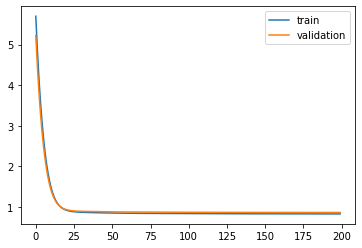

Time to train LSTM:  175.92100548744202
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 19s - loss: 5.7083 - pdc_loss: 0.8138 - event_loss: 0.7668 - val_loss: 5.2281 - val_pdc_loss: 0.7902 - val_event_loss: 0.6950

Epoch 00001: val_loss improved from inf to 5.22806, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 4.8842 - pdc_loss: 0.7768 - event_loss: 0.6475 - val_loss: 4.4755 - val_pdc_loss: 0.7546 - val_event_loss: 0.5979

Epoch 00002: val_loss improved from 5.22806 to 4.47546, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 4.1851 - pdc_loss: 0.7408 - event_loss: 0.5664 - val_loss: 3.8395 - val_pdc_loss: 0.7213 - val_event_loss: 0.5306

Epoch 00003: val_loss improved from 4.47546 to 3.83950, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 3.5960 - pdc_loss: 0.7080 - event_loss: 0.5093 - val_loss: 3.3050 - val_pdc_loss: 0.6916 - val_event_loss: 0.4811

Epoch 00004: val_loss improved from 3.83950 to 3.30502, saving


Epoch 00035: val_loss improved from 0.87010 to 0.86888, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 0.8658 - pdc_loss: 0.5354 - event_loss: 0.3167 - val_loss: 0.8678 - val_pdc_loss: 0.5367 - val_event_loss: 0.3175

Epoch 00036: val_loss improved from 0.86888 to 0.86779, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 0.8647 - pdc_loss: 0.5346 - event_loss: 0.3166 - val_loss: 0.8669 - val_pdc_loss: 0.5360 - val_event_loss: 0.3175

Epoch 00037: val_loss improved from 0.86779 to 0.86688, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 0.8637 - pdc_loss: 0.5338 - event_loss: 0.3166 - val_loss: 0.8659 - val_pdc_loss: 0.5352 - val_event_loss: 0.3174

Epoch 00038: val_loss improved from 0.86688 to 0.86588, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 0.8628 - pdc_loss: 0.5331 - event_loss: 0.3165 - val_loss: 0.8651 - val_pdc_loss: 0.5346 - val_event_loss: 0.3174

Epoch 00039: val_loss improved from 0.86588 to 

 - 1s - loss: 0.8482 - pdc_loss: 0.5231 - event_loss: 0.3152 - val_loss: 0.8525 - val_pdc_loss: 0.5262 - val_event_loss: 0.3164

Epoch 00070: val_loss improved from 0.85257 to 0.85248, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.8480 - pdc_loss: 0.5229 - event_loss: 0.3152 - val_loss: 0.8521 - val_pdc_loss: 0.5259 - val_event_loss: 0.3164

Epoch 00071: val_loss improved from 0.85248 to 0.85211, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8477 - pdc_loss: 0.5228 - event_loss: 0.3151 - val_loss: 0.8520 - val_pdc_loss: 0.5259 - val_event_loss: 0.3164

Epoch 00072: val_loss improved from 0.85211 to 0.85199, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8474 - pdc_loss: 0.5226 - event_loss: 0.3151 - val_loss: 0.8518 - val_pdc_loss: 0.5258 - val_event_loss: 0.3163

Epoch 00073: val_loss improved from 0.85199 to 0.85181, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8471 - pdc_loss: 0.5224 - event_

 - 1s - loss: 0.8411 - pdc_loss: 0.5183 - event_loss: 0.3144 - val_loss: 0.8462 - val_pdc_loss: 0.5218 - val_event_loss: 0.3160

Epoch 00105: val_loss improved from 0.84648 to 0.84621, saving model to Event_val_weights5.hdf5
Epoch 106/200
 - 1s - loss: 0.8409 - pdc_loss: 0.5182 - event_loss: 0.3143 - val_loss: 0.8462 - val_pdc_loss: 0.5219 - val_event_loss: 0.3159

Epoch 00106: val_loss improved from 0.84621 to 0.84618, saving model to Event_val_weights5.hdf5
Epoch 107/200
 - 1s - loss: 0.8408 - pdc_loss: 0.5181 - event_loss: 0.3143 - val_loss: 0.8460 - val_pdc_loss: 0.5217 - val_event_loss: 0.3159

Epoch 00107: val_loss improved from 0.84618 to 0.84599, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.8406 - pdc_loss: 0.5180 - event_loss: 0.3143 - val_loss: 0.8459 - val_pdc_loss: 0.5217 - val_event_loss: 0.3159

Epoch 00108: val_loss improved from 0.84599 to 0.84590, saving model to Event_val_weights5.hdf5
Epoch 109/200
 - 1s - loss: 0.8405 - pdc_loss: 0.5179 - ev

 - 1s - loss: 0.8371 - pdc_loss: 0.5156 - event_loss: 0.3138 - val_loss: 0.8429 - val_pdc_loss: 0.5193 - val_event_loss: 0.3159

Epoch 00141: val_loss improved from 0.84301 to 0.84289, saving model to Event_val_weights5.hdf5
Epoch 142/200
 - 1s - loss: 0.8370 - pdc_loss: 0.5156 - event_loss: 0.3138 - val_loss: 0.8428 - val_pdc_loss: 0.5193 - val_event_loss: 0.3158

Epoch 00142: val_loss improved from 0.84289 to 0.84279, saving model to Event_val_weights5.hdf5
Epoch 143/200
 - 1s - loss: 0.8370 - pdc_loss: 0.5155 - event_loss: 0.3138 - val_loss: 0.8427 - val_pdc_loss: 0.5192 - val_event_loss: 0.3159

Epoch 00143: val_loss improved from 0.84279 to 0.84275, saving model to Event_val_weights5.hdf5
Epoch 144/200
 - 1s - loss: 0.8369 - pdc_loss: 0.5155 - event_loss: 0.3138 - val_loss: 0.8430 - val_pdc_loss: 0.5195 - val_event_loss: 0.3158

Epoch 00144: val_loss did not improve from 0.84275
Epoch 145/200
 - 1s - loss: 0.8368 - pdc_loss: 0.5154 - event_loss: 0.3138 - val_loss: 0.8425 - val_pdc


Epoch 00179: val_loss did not improve from 0.84086
Epoch 180/200
 - 1s - loss: 0.8345 - pdc_loss: 0.5141 - event_loss: 0.3131 - val_loss: 0.8412 - val_pdc_loss: 0.5178 - val_event_loss: 0.3160

Epoch 00180: val_loss did not improve from 0.84086
Epoch 181/200
 - 1s - loss: 0.8344 - pdc_loss: 0.5140 - event_loss: 0.3131 - val_loss: 0.8410 - val_pdc_loss: 0.5177 - val_event_loss: 0.3160

Epoch 00181: val_loss did not improve from 0.84086
Epoch 182/200
 - 1s - loss: 0.8343 - pdc_loss: 0.5140 - event_loss: 0.3131 - val_loss: 0.8409 - val_pdc_loss: 0.5176 - val_event_loss: 0.3161

Epoch 00182: val_loss did not improve from 0.84086
Epoch 183/200
 - 1s - loss: 0.8343 - pdc_loss: 0.5140 - event_loss: 0.3131 - val_loss: 0.8409 - val_pdc_loss: 0.5176 - val_event_loss: 0.3160

Epoch 00183: val_loss did not improve from 0.84086
Epoch 184/200
 - 1s - loss: 0.8343 - pdc_loss: 0.5140 - event_loss: 0.3131 - val_loss: 0.8407 - val_pdc_loss: 0.5175 - val_event_loss: 0.3160

Epoch 00184: val_loss improve

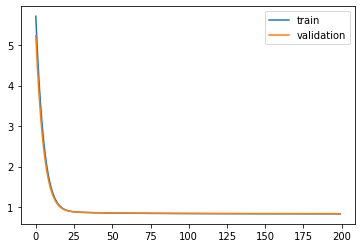

Time to train LSTM:  169.3025152683258
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 17s - loss: 9.0067 - pdc_loss: 0.6898 - event_loss: 0.6805 - val_loss: 8.2270 - val_pdc_loss: 0.6787 - val_event_loss: 0.6562

Epoch 00001: val_loss improved from inf to 8.22697, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 7.6639 - pdc_loss: 0.6738 - event_loss: 0.6412 - val_loss: 6.9872 - val_pdc_loss: 0.6643 - val_event_loss: 0.6179

Epoch 00002: val_loss improved from 8.22697 to 6.98719, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 6.5054 - pdc_loss: 0.6594 - event_loss: 0.6051 - val_loss: 5.9262 - val_pdc_loss: 0.6514 - val_event_loss: 0.5812

Epoch 00003: val_loss improved from 6.98719 to 5.92618, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 5.5187 - pdc_loss: 0.6468 - event_loss: 0.5691 - val_loss: 5.0271 - val_pdc_loss: 0.6401 - val_event_loss: 0.5435

Epoch 00004: val_loss improved from 5.92618 to 5.02712, saving 


Epoch 00035: val_loss improved from 0.86812 to 0.86728, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 0.8698 - pdc_loss: 0.5363 - event_loss: 0.3194 - val_loss: 0.8664 - val_pdc_loss: 0.5382 - val_event_loss: 0.3141

Epoch 00036: val_loss improved from 0.86728 to 0.86636, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 0.8689 - pdc_loss: 0.5356 - event_loss: 0.3193 - val_loss: 0.8654 - val_pdc_loss: 0.5377 - val_event_loss: 0.3138

Epoch 00037: val_loss improved from 0.86636 to 0.86541, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 0.8680 - pdc_loss: 0.5351 - event_loss: 0.3192 - val_loss: 0.8647 - val_pdc_loss: 0.5373 - val_event_loss: 0.3138

Epoch 00038: val_loss improved from 0.86541 to 0.86470, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 0.8672 - pdc_loss: 0.5345 - event_loss: 0.3192 - val_loss: 0.8640 - val_pdc_loss: 0.5369 - val_event_loss: 0.3137

Epoch 00039: val_loss improved from 0.86470 to 

 - 1s - loss: 0.8529 - pdc_loss: 0.5247 - event_loss: 0.3176 - val_loss: 0.8470 - val_pdc_loss: 0.5246 - val_event_loss: 0.3119

Epoch 00070: val_loss improved from 0.84766 to 0.84703, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 0.8526 - pdc_loss: 0.5245 - event_loss: 0.3176 - val_loss: 0.8471 - val_pdc_loss: 0.5247 - val_event_loss: 0.3119

Epoch 00071: val_loss did not improve from 0.84703
Epoch 72/200
 - 1s - loss: 0.8524 - pdc_loss: 0.5243 - event_loss: 0.3176 - val_loss: 0.8464 - val_pdc_loss: 0.5241 - val_event_loss: 0.3118

Epoch 00072: val_loss improved from 0.84703 to 0.84642, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.8521 - pdc_loss: 0.5241 - event_loss: 0.3175 - val_loss: 0.8465 - val_pdc_loss: 0.5242 - val_event_loss: 0.3118

Epoch 00073: val_loss did not improve from 0.84642
Epoch 74/200
 - 1s - loss: 0.8519 - pdc_loss: 0.5240 - event_loss: 0.3175 - val_loss: 0.8459 - val_pdc_loss: 0.5238 - val_event_loss: 0.3117

Epoch 000


Epoch 00106: val_loss did not improve from 0.84066
Epoch 107/200
 - 1s - loss: 0.8456 - pdc_loss: 0.5195 - event_loss: 0.3165 - val_loss: 0.8405 - val_pdc_loss: 0.5195 - val_event_loss: 0.3113

Epoch 00107: val_loss improved from 0.84066 to 0.84049, saving model to Event_val_weights1.hdf5
Epoch 108/200
 - 1s - loss: 0.8455 - pdc_loss: 0.5195 - event_loss: 0.3164 - val_loss: 0.8405 - val_pdc_loss: 0.5194 - val_event_loss: 0.3115

Epoch 00108: val_loss did not improve from 0.84049
Epoch 109/200
 - 1s - loss: 0.8454 - pdc_loss: 0.5194 - event_loss: 0.3164 - val_loss: 0.8403 - val_pdc_loss: 0.5194 - val_event_loss: 0.3114

Epoch 00109: val_loss improved from 0.84049 to 0.84034, saving model to Event_val_weights1.hdf5
Epoch 110/200
 - 1s - loss: 0.8453 - pdc_loss: 0.5193 - event_loss: 0.3164 - val_loss: 0.8404 - val_pdc_loss: 0.5194 - val_event_loss: 0.3114

Epoch 00110: val_loss did not improve from 0.84034
Epoch 111/200
 - 1s - loss: 0.8451 - pdc_loss: 0.5192 - event_loss: 0.3164 - val_l


Epoch 00144: val_loss improved from 0.83799 to 0.83789, saving model to Event_val_weights1.hdf5
Epoch 145/200
 - 1s - loss: 0.8419 - pdc_loss: 0.5171 - event_loss: 0.3159 - val_loss: 0.8383 - val_pdc_loss: 0.5180 - val_event_loss: 0.3113

Epoch 00145: val_loss did not improve from 0.83789
Epoch 146/200
 - 1s - loss: 0.8419 - pdc_loss: 0.5171 - event_loss: 0.3159 - val_loss: 0.8379 - val_pdc_loss: 0.5179 - val_event_loss: 0.3111

Epoch 00146: val_loss did not improve from 0.83789
Epoch 147/200
 - 1s - loss: 0.8418 - pdc_loss: 0.5170 - event_loss: 0.3159 - val_loss: 0.8381 - val_pdc_loss: 0.5180 - val_event_loss: 0.3112

Epoch 00147: val_loss did not improve from 0.83789
Epoch 148/200
 - 1s - loss: 0.8418 - pdc_loss: 0.5170 - event_loss: 0.3159 - val_loss: 0.8378 - val_pdc_loss: 0.5180 - val_event_loss: 0.3109

Epoch 00148: val_loss improved from 0.83789 to 0.83776, saving model to Event_val_weights1.hdf5
Epoch 149/200
 - 1s - loss: 0.8417 - pdc_loss: 0.5170 - event_loss: 0.3158 - val_l


Epoch 00183: val_loss did not improve from 0.83644
Epoch 184/200
 - 1s - loss: 0.8397 - pdc_loss: 0.5158 - event_loss: 0.3155 - val_loss: 0.8366 - val_pdc_loss: 0.5173 - val_event_loss: 0.3109

Epoch 00184: val_loss did not improve from 0.83644
Epoch 185/200
 - 1s - loss: 0.8396 - pdc_loss: 0.5158 - event_loss: 0.3155 - val_loss: 0.8366 - val_pdc_loss: 0.5174 - val_event_loss: 0.3109

Epoch 00185: val_loss did not improve from 0.83644
Epoch 186/200
 - 1s - loss: 0.8396 - pdc_loss: 0.5158 - event_loss: 0.3155 - val_loss: 0.8364 - val_pdc_loss: 0.5173 - val_event_loss: 0.3107

Epoch 00186: val_loss improved from 0.83644 to 0.83636, saving model to Event_val_weights1.hdf5
Epoch 187/200
 - 1s - loss: 0.8395 - pdc_loss: 0.5157 - event_loss: 0.3155 - val_loss: 0.8367 - val_pdc_loss: 0.5173 - val_event_loss: 0.3111

Epoch 00187: val_loss did not improve from 0.83636
Epoch 188/200
 - 1s - loss: 0.8395 - pdc_loss: 0.5157 - event_loss: 0.3155 - val_loss: 0.8361 - val_pdc_loss: 0.5172 - val_even

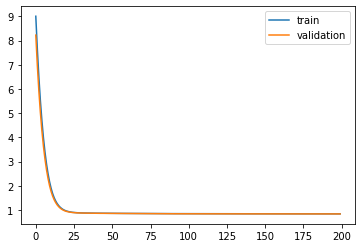

Time to train LSTM:  167.43357467651367
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 18s - loss: 8.9762 - pdc_loss: 0.7920 - event_loss: 0.6744 - val_loss: 8.1933 - val_pdc_loss: 0.7707 - val_event_loss: 0.6443

Epoch 00001: val_loss improved from inf to 8.19326, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 7.6294 - pdc_loss: 0.7571 - event_loss: 0.6272 - val_loss: 6.9532 - val_pdc_loss: 0.7391 - val_event_loss: 0.6011

Epoch 00002: val_loss improved from 8.19326 to 6.95318, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 6.4681 - pdc_loss: 0.7264 - event_loss: 0.5845 - val_loss: 5.8929 - val_pdc_loss: 0.7121 - val_event_loss: 0.5615

Epoch 00003: val_loss improved from 6.95318 to 5.89287, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 5.4789 - pdc_loss: 0.6999 - event_loss: 0.5444 - val_loss: 4.9936 - val_pdc_loss: 0.6887 - val_event_loss: 0.5230

Epoch 00004: val_loss improved from 5.89287 to 4.99362, saving


Epoch 00035: val_loss improved from 0.88678 to 0.88566, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 0.8734 - pdc_loss: 0.5415 - event_loss: 0.3177 - val_loss: 0.8848 - val_pdc_loss: 0.5475 - val_event_loss: 0.3232

Epoch 00036: val_loss improved from 0.88566 to 0.88479, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 0.8724 - pdc_loss: 0.5407 - event_loss: 0.3176 - val_loss: 0.8838 - val_pdc_loss: 0.5468 - val_event_loss: 0.3231

Epoch 00037: val_loss improved from 0.88479 to 0.88383, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 0.8714 - pdc_loss: 0.5400 - event_loss: 0.3175 - val_loss: 0.8829 - val_pdc_loss: 0.5460 - val_event_loss: 0.3230

Epoch 00038: val_loss improved from 0.88383 to 0.88294, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 0.8705 - pdc_loss: 0.5392 - event_loss: 0.3174 - val_loss: 0.8821 - val_pdc_loss: 0.5453 - val_event_loss: 0.3229

Epoch 00039: val_loss improved from 0.88294 to 

 - 1s - loss: 0.8535 - pdc_loss: 0.5253 - event_loss: 0.3166 - val_loss: 0.8665 - val_pdc_loss: 0.5327 - val_event_loss: 0.3223

Epoch 00070: val_loss improved from 0.86685 to 0.86651, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.8530 - pdc_loss: 0.5250 - event_loss: 0.3166 - val_loss: 0.8663 - val_pdc_loss: 0.5326 - val_event_loss: 0.3223

Epoch 00071: val_loss improved from 0.86651 to 0.86627, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.8528 - pdc_loss: 0.5249 - event_loss: 0.3166 - val_loss: 0.8660 - val_pdc_loss: 0.5325 - val_event_loss: 0.3222

Epoch 00072: val_loss improved from 0.86627 to 0.86602, saving model to Event_val_weights2.hdf5
Epoch 73/200
 - 1s - loss: 0.8524 - pdc_loss: 0.5246 - event_loss: 0.3166 - val_loss: 0.8658 - val_pdc_loss: 0.5324 - val_event_loss: 0.3222

Epoch 00073: val_loss improved from 0.86602 to 0.86583, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.8522 - pdc_loss: 0.5245 - event_

 - 1s - loss: 0.8458 - pdc_loss: 0.5204 - event_loss: 0.3158 - val_loss: 0.8601 - val_pdc_loss: 0.5297 - val_event_loss: 0.3208

Epoch 00106: val_loss improved from 0.86015 to 0.86006, saving model to Event_val_weights2.hdf5
Epoch 107/200
 - 1s - loss: 0.8455 - pdc_loss: 0.5203 - event_loss: 0.3158 - val_loss: 0.8599 - val_pdc_loss: 0.5296 - val_event_loss: 0.3208

Epoch 00107: val_loss improved from 0.86006 to 0.85989, saving model to Event_val_weights2.hdf5
Epoch 108/200
 - 1s - loss: 0.8454 - pdc_loss: 0.5202 - event_loss: 0.3157 - val_loss: 0.8597 - val_pdc_loss: 0.5296 - val_event_loss: 0.3207

Epoch 00108: val_loss improved from 0.85989 to 0.85971, saving model to Event_val_weights2.hdf5
Epoch 109/200
 - 1s - loss: 0.8452 - pdc_loss: 0.5200 - event_loss: 0.3157 - val_loss: 0.8595 - val_pdc_loss: 0.5294 - val_event_loss: 0.3207

Epoch 00109: val_loss improved from 0.85971 to 0.85950, saving model to Event_val_weights2.hdf5
Epoch 110/200
 - 1s - loss: 0.8452 - pdc_loss: 0.5201 - ev

 - 1s - loss: 0.8412 - pdc_loss: 0.5176 - event_loss: 0.3151 - val_loss: 0.8565 - val_pdc_loss: 0.5281 - val_event_loss: 0.3199

Epoch 00143: val_loss did not improve from 0.85649
Epoch 144/200
 - 1s - loss: 0.8410 - pdc_loss: 0.5175 - event_loss: 0.3150 - val_loss: 0.8564 - val_pdc_loss: 0.5280 - val_event_loss: 0.3199

Epoch 00144: val_loss improved from 0.85649 to 0.85642, saving model to Event_val_weights2.hdf5
Epoch 145/200
 - 1s - loss: 0.8410 - pdc_loss: 0.5175 - event_loss: 0.3150 - val_loss: 0.8566 - val_pdc_loss: 0.5281 - val_event_loss: 0.3200

Epoch 00145: val_loss did not improve from 0.85642
Epoch 146/200
 - 1s - loss: 0.8410 - pdc_loss: 0.5175 - event_loss: 0.3150 - val_loss: 0.8558 - val_pdc_loss: 0.5277 - val_event_loss: 0.3196

Epoch 00146: val_loss improved from 0.85642 to 0.85580, saving model to Event_val_weights2.hdf5
Epoch 147/200
 - 1s - loss: 0.8408 - pdc_loss: 0.5174 - event_loss: 0.3150 - val_loss: 0.8562 - val_pdc_loss: 0.5279 - val_event_loss: 0.3199

Epoch


Epoch 00182: val_loss did not improve from 0.85384
Epoch 183/200
 - 1s - loss: 0.8379 - pdc_loss: 0.5155 - event_loss: 0.3144 - val_loss: 0.8544 - val_pdc_loss: 0.5270 - val_event_loss: 0.3195

Epoch 00183: val_loss did not improve from 0.85384
Epoch 184/200
 - 1s - loss: 0.8379 - pdc_loss: 0.5156 - event_loss: 0.3144 - val_loss: 0.8544 - val_pdc_loss: 0.5269 - val_event_loss: 0.3195

Epoch 00184: val_loss did not improve from 0.85384
Epoch 185/200
 - 1s - loss: 0.8379 - pdc_loss: 0.5156 - event_loss: 0.3144 - val_loss: 0.8541 - val_pdc_loss: 0.5268 - val_event_loss: 0.3194

Epoch 00185: val_loss did not improve from 0.85384
Epoch 186/200
 - 1s - loss: 0.8378 - pdc_loss: 0.5155 - event_loss: 0.3144 - val_loss: 0.8546 - val_pdc_loss: 0.5272 - val_event_loss: 0.3195

Epoch 00186: val_loss did not improve from 0.85384
Epoch 187/200
 - 1s - loss: 0.8376 - pdc_loss: 0.5154 - event_loss: 0.3143 - val_loss: 0.8542 - val_pdc_loss: 0.5269 - val_event_loss: 0.3195

Epoch 00187: val_loss did not

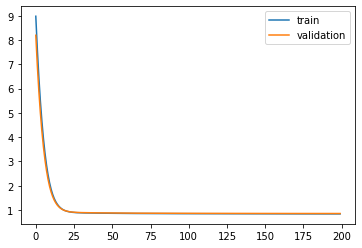

Time to train LSTM:  168.30129861831665
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 18s - loss: 8.9497 - pdc_loss: 0.7254 - event_loss: 0.7119 - val_loss: 8.1695 - val_pdc_loss: 0.7134 - val_event_loss: 0.6717

Epoch 00001: val_loss improved from inf to 8.16951, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 7.6056 - pdc_loss: 0.7091 - event_loss: 0.6437 - val_loss: 6.9318 - val_pdc_loss: 0.6992 - val_event_loss: 0.6106

Epoch 00002: val_loss improved from 8.16951 to 6.93177, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 6.4498 - pdc_loss: 0.6954 - event_loss: 0.5880 - val_loss: 5.8760 - val_pdc_loss: 0.6869 - val_event_loss: 0.5606

Epoch 00003: val_loss improved from 6.93177 to 5.87604, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 5.4678 - pdc_loss: 0.6830 - event_loss: 0.5413 - val_loss: 4.9838 - val_pdc_loss: 0.6750 - val_event_loss: 0.5184

Epoch 00004: val_loss improved from 5.87604 to 4.98380, saving


Epoch 00035: val_loss improved from 0.89237 to 0.89147, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 0.8715 - pdc_loss: 0.5400 - event_loss: 0.3181 - val_loss: 0.8904 - val_pdc_loss: 0.5539 - val_event_loss: 0.3232

Epoch 00036: val_loss improved from 0.89147 to 0.89036, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 0.8704 - pdc_loss: 0.5392 - event_loss: 0.3181 - val_loss: 0.8896 - val_pdc_loss: 0.5533 - val_event_loss: 0.3232

Epoch 00037: val_loss improved from 0.89036 to 0.88964, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 0.8695 - pdc_loss: 0.5384 - event_loss: 0.3180 - val_loss: 0.8890 - val_pdc_loss: 0.5528 - val_event_loss: 0.3232

Epoch 00038: val_loss improved from 0.88964 to 0.88902, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 0.8685 - pdc_loss: 0.5377 - event_loss: 0.3180 - val_loss: 0.8882 - val_pdc_loss: 0.5521 - val_event_loss: 0.3232

Epoch 00039: val_loss improved from 0.88902 to 

 - 1s - loss: 0.8536 - pdc_loss: 0.5258 - event_loss: 0.3173 - val_loss: 0.8768 - val_pdc_loss: 0.5427 - val_event_loss: 0.3236

Epoch 00070: val_loss improved from 0.87684 to 0.87679, saving model to Event_val_weights3.hdf5
Epoch 71/200
 - 1s - loss: 0.8533 - pdc_loss: 0.5256 - event_loss: 0.3173 - val_loss: 0.8766 - val_pdc_loss: 0.5426 - val_event_loss: 0.3235

Epoch 00071: val_loss improved from 0.87679 to 0.87655, saving model to Event_val_weights3.hdf5
Epoch 72/200
 - 1s - loss: 0.8531 - pdc_loss: 0.5254 - event_loss: 0.3173 - val_loss: 0.8764 - val_pdc_loss: 0.5423 - val_event_loss: 0.3237

Epoch 00072: val_loss improved from 0.87655 to 0.87642, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.8528 - pdc_loss: 0.5252 - event_loss: 0.3172 - val_loss: 0.8761 - val_pdc_loss: 0.5421 - val_event_loss: 0.3236

Epoch 00073: val_loss improved from 0.87642 to 0.87612, saving model to Event_val_weights3.hdf5
Epoch 74/200
 - 1s - loss: 0.8525 - pdc_loss: 0.5250 - event_


Epoch 00105: val_loss improved from 0.87061 to 0.87047, saving model to Event_val_weights3.hdf5
Epoch 106/200
 - 1s - loss: 0.8457 - pdc_loss: 0.5199 - event_loss: 0.3163 - val_loss: 0.8704 - val_pdc_loss: 0.5374 - val_event_loss: 0.3234

Epoch 00106: val_loss improved from 0.87047 to 0.87037, saving model to Event_val_weights3.hdf5
Epoch 107/200
 - 1s - loss: 0.8455 - pdc_loss: 0.5197 - event_loss: 0.3163 - val_loss: 0.8701 - val_pdc_loss: 0.5372 - val_event_loss: 0.3234

Epoch 00107: val_loss improved from 0.87037 to 0.87013, saving model to Event_val_weights3.hdf5
Epoch 108/200
 - 1s - loss: 0.8453 - pdc_loss: 0.5196 - event_loss: 0.3162 - val_loss: 0.8699 - val_pdc_loss: 0.5371 - val_event_loss: 0.3233

Epoch 00108: val_loss improved from 0.87013 to 0.86987, saving model to Event_val_weights3.hdf5
Epoch 109/200
 - 1s - loss: 0.8451 - pdc_loss: 0.5195 - event_loss: 0.3162 - val_loss: 0.8701 - val_pdc_loss: 0.5372 - val_event_loss: 0.3234

Epoch 00109: val_loss did not improve from 


Epoch 00142: val_loss did not improve from 0.86706
Epoch 143/200
 - 1s - loss: 0.8406 - pdc_loss: 0.5163 - event_loss: 0.3152 - val_loss: 0.8672 - val_pdc_loss: 0.5351 - val_event_loss: 0.3230

Epoch 00143: val_loss did not improve from 0.86706
Epoch 144/200
 - 1s - loss: 0.8406 - pdc_loss: 0.5163 - event_loss: 0.3151 - val_loss: 0.8668 - val_pdc_loss: 0.5346 - val_event_loss: 0.3231

Epoch 00144: val_loss improved from 0.86706 to 0.86683, saving model to Event_val_weights3.hdf5
Epoch 145/200
 - 1s - loss: 0.8404 - pdc_loss: 0.5162 - event_loss: 0.3151 - val_loss: 0.8668 - val_pdc_loss: 0.5348 - val_event_loss: 0.3229

Epoch 00145: val_loss improved from 0.86683 to 0.86681, saving model to Event_val_weights3.hdf5
Epoch 146/200
 - 1s - loss: 0.8404 - pdc_loss: 0.5163 - event_loss: 0.3151 - val_loss: 0.8667 - val_pdc_loss: 0.5345 - val_event_loss: 0.3231

Epoch 00146: val_loss improved from 0.86681 to 0.86668, saving model to Event_val_weights3.hdf5
Epoch 147/200
 - 1s - loss: 0.8402 - 


Epoch 00181: val_loss did not improve from 0.86495
Epoch 182/200
 - 1s - loss: 0.8376 - pdc_loss: 0.5145 - event_loss: 0.3144 - val_loss: 0.8646 - val_pdc_loss: 0.5332 - val_event_loss: 0.3227

Epoch 00182: val_loss improved from 0.86495 to 0.86465, saving model to Event_val_weights3.hdf5
Epoch 183/200
 - 1s - loss: 0.8374 - pdc_loss: 0.5143 - event_loss: 0.3144 - val_loss: 0.8649 - val_pdc_loss: 0.5335 - val_event_loss: 0.3228

Epoch 00183: val_loss did not improve from 0.86465
Epoch 184/200
 - 1s - loss: 0.8375 - pdc_loss: 0.5144 - event_loss: 0.3143 - val_loss: 0.8647 - val_pdc_loss: 0.5332 - val_event_loss: 0.3228

Epoch 00184: val_loss did not improve from 0.86465
Epoch 185/200
 - 1s - loss: 0.8374 - pdc_loss: 0.5143 - event_loss: 0.3144 - val_loss: 0.8650 - val_pdc_loss: 0.5336 - val_event_loss: 0.3227

Epoch 00185: val_loss did not improve from 0.86465
Epoch 186/200
 - 1s - loss: 0.8374 - pdc_loss: 0.5143 - event_loss: 0.3143 - val_loss: 0.8646 - val_pdc_loss: 0.5332 - val_even

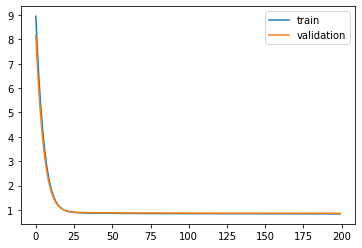

Time to train LSTM:  169.0615303516388
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 19s - loss: 8.9177 - pdc_loss: 0.7167 - event_loss: 0.7151 - val_loss: 8.1455 - val_pdc_loss: 0.7062 - val_event_loss: 0.6834

Epoch 00001: val_loss improved from inf to 8.14553, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 7.5872 - pdc_loss: 0.6997 - event_loss: 0.6639 - val_loss: 6.9205 - val_pdc_loss: 0.6904 - val_event_loss: 0.6378

Epoch 00002: val_loss improved from 8.14553 to 6.92048, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 6.4419 - pdc_loss: 0.6840 - event_loss: 0.6207 - val_loss: 5.8750 - val_pdc_loss: 0.6763 - val_event_loss: 0.5984

Epoch 00003: val_loss improved from 6.92048 to 5.87499, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 5.4686 - pdc_loss: 0.6701 - event_loss: 0.5820 - val_loss: 4.9912 - val_pdc_loss: 0.6640 - val_event_loss: 0.5615

Epoch 00004: val_loss improved from 5.87499 to 4.99125, saving 


Epoch 00035: val_loss improved from 0.89648 to 0.89520, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 0.8689 - pdc_loss: 0.5357 - event_loss: 0.3178 - val_loss: 0.8940 - val_pdc_loss: 0.5500 - val_event_loss: 0.3287

Epoch 00036: val_loss improved from 0.89520 to 0.89398, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 0.8672 - pdc_loss: 0.5344 - event_loss: 0.3176 - val_loss: 0.8928 - val_pdc_loss: 0.5491 - val_event_loss: 0.3286

Epoch 00037: val_loss improved from 0.89398 to 0.89280, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 0.8657 - pdc_loss: 0.5331 - event_loss: 0.3175 - val_loss: 0.8915 - val_pdc_loss: 0.5480 - val_event_loss: 0.3285

Epoch 00038: val_loss improved from 0.89280 to 0.89154, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 0.8643 - pdc_loss: 0.5319 - event_loss: 0.3174 - val_loss: 0.8902 - val_pdc_loss: 0.5470 - val_event_loss: 0.3283

Epoch 00039: val_loss improved from 0.89154 to 


Epoch 00070: val_loss improved from 0.87570 to 0.87538, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.8458 - pdc_loss: 0.5195 - event_loss: 0.3156 - val_loss: 0.8753 - val_pdc_loss: 0.5382 - val_event_loss: 0.3265

Epoch 00071: val_loss improved from 0.87538 to 0.87525, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.8455 - pdc_loss: 0.5193 - event_loss: 0.3156 - val_loss: 0.8750 - val_pdc_loss: 0.5380 - val_event_loss: 0.3265

Epoch 00072: val_loss improved from 0.87525 to 0.87501, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.8452 - pdc_loss: 0.5192 - event_loss: 0.3156 - val_loss: 0.8748 - val_pdc_loss: 0.5379 - val_event_loss: 0.3265

Epoch 00073: val_loss improved from 0.87501 to 0.87483, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.8450 - pdc_loss: 0.5190 - event_loss: 0.3156 - val_loss: 0.8747 - val_pdc_loss: 0.5379 - val_event_loss: 0.3265

Epoch 00074: val_loss improved from 0.87483 to 


Epoch 00105: val_loss improved from 0.87169 to 0.87159, saving model to Event_val_weights4.hdf5
Epoch 106/200
 - 1s - loss: 0.8406 - pdc_loss: 0.5164 - event_loss: 0.3152 - val_loss: 0.8714 - val_pdc_loss: 0.5359 - val_event_loss: 0.3265

Epoch 00106: val_loss improved from 0.87159 to 0.87140, saving model to Event_val_weights4.hdf5
Epoch 107/200
 - 1s - loss: 0.8405 - pdc_loss: 0.5163 - event_loss: 0.3152 - val_loss: 0.8714 - val_pdc_loss: 0.5359 - val_event_loss: 0.3264

Epoch 00107: val_loss improved from 0.87140 to 0.87135, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.8404 - pdc_loss: 0.5163 - event_loss: 0.3152 - val_loss: 0.8713 - val_pdc_loss: 0.5359 - val_event_loss: 0.3265

Epoch 00108: val_loss improved from 0.87135 to 0.87131, saving model to Event_val_weights4.hdf5
Epoch 109/200
 - 1s - loss: 0.8404 - pdc_loss: 0.5162 - event_loss: 0.3152 - val_loss: 0.8712 - val_pdc_loss: 0.5358 - val_event_loss: 0.3264

Epoch 00109: val_loss improved from 0.87131


Epoch 00142: val_loss improved from 0.86941 to 0.86941, saving model to Event_val_weights4.hdf5
Epoch 143/200
 - 1s - loss: 0.8381 - pdc_loss: 0.5150 - event_loss: 0.3148 - val_loss: 0.8692 - val_pdc_loss: 0.5347 - val_event_loss: 0.3262

Epoch 00143: val_loss improved from 0.86941 to 0.86916, saving model to Event_val_weights4.hdf5
Epoch 144/200
 - 1s - loss: 0.8380 - pdc_loss: 0.5150 - event_loss: 0.3148 - val_loss: 0.8693 - val_pdc_loss: 0.5348 - val_event_loss: 0.3262

Epoch 00144: val_loss did not improve from 0.86916
Epoch 145/200
 - 1s - loss: 0.8380 - pdc_loss: 0.5150 - event_loss: 0.3148 - val_loss: 0.8691 - val_pdc_loss: 0.5346 - val_event_loss: 0.3262

Epoch 00145: val_loss improved from 0.86916 to 0.86913, saving model to Event_val_weights4.hdf5
Epoch 146/200
 - 1s - loss: 0.8380 - pdc_loss: 0.5150 - event_loss: 0.3148 - val_loss: 0.8693 - val_pdc_loss: 0.5348 - val_event_loss: 0.3263

Epoch 00146: val_loss did not improve from 0.86913
Epoch 147/200
 - 1s - loss: 0.8378 - 

 - 1s - loss: 0.8363 - pdc_loss: 0.5141 - event_loss: 0.3144 - val_loss: 0.8676 - val_pdc_loss: 0.5338 - val_event_loss: 0.3260

Epoch 00181: val_loss improved from 0.86771 to 0.86756, saving model to Event_val_weights4.hdf5
Epoch 182/200
 - 1s - loss: 0.8363 - pdc_loss: 0.5141 - event_loss: 0.3144 - val_loss: 0.8677 - val_pdc_loss: 0.5339 - val_event_loss: 0.3261

Epoch 00182: val_loss did not improve from 0.86756
Epoch 183/200
 - 1s - loss: 0.8362 - pdc_loss: 0.5141 - event_loss: 0.3144 - val_loss: 0.8676 - val_pdc_loss: 0.5338 - val_event_loss: 0.3260

Epoch 00183: val_loss did not improve from 0.86756
Epoch 184/200
 - 1s - loss: 0.8362 - pdc_loss: 0.5140 - event_loss: 0.3144 - val_loss: 0.8676 - val_pdc_loss: 0.5338 - val_event_loss: 0.3260

Epoch 00184: val_loss did not improve from 0.86756
Epoch 185/200
 - 1s - loss: 0.8361 - pdc_loss: 0.5140 - event_loss: 0.3144 - val_loss: 0.8674 - val_pdc_loss: 0.5336 - val_event_loss: 0.3260

Epoch 00185: val_loss improved from 0.86756 to 0.8

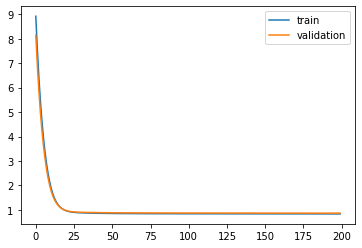

Time to train LSTM:  167.29446363449097
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 23s - loss: 9.0062 - pdc_loss: 0.7217 - event_loss: 0.7116 - val_loss: 8.2377 - val_pdc_loss: 0.7193 - val_event_loss: 0.6844

Epoch 00001: val_loss improved from inf to 8.23767, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 7.6656 - pdc_loss: 0.7081 - event_loss: 0.6630 - val_loss: 7.0008 - val_pdc_loss: 0.7058 - val_event_loss: 0.6403

Epoch 00002: val_loss improved from 8.23767 to 7.00080, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 6.5104 - pdc_loss: 0.6947 - event_loss: 0.6226 - val_loss: 5.9435 - val_pdc_loss: 0.6919 - val_event_loss: 0.6031

Epoch 00003: val_loss improved from 7.00080 to 5.94354, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 5.5273 - pdc_loss: 0.6805 - event_loss: 0.5875 - val_loss: 5.0479 - val_pdc_loss: 0.6776 - val_event_loss: 0.5687

Epoch 00004: val_loss improved from 5.94354 to 5.04788, saving


Epoch 00035: val_loss improved from 0.87874 to 0.87747, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 0.8761 - pdc_loss: 0.5429 - event_loss: 0.3189 - val_loss: 0.8763 - val_pdc_loss: 0.5437 - val_event_loss: 0.3184

Epoch 00036: val_loss improved from 0.87747 to 0.87628, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 0.8750 - pdc_loss: 0.5420 - event_loss: 0.3188 - val_loss: 0.8752 - val_pdc_loss: 0.5429 - val_event_loss: 0.3183

Epoch 00037: val_loss improved from 0.87628 to 0.87522, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 0.8738 - pdc_loss: 0.5411 - event_loss: 0.3187 - val_loss: 0.8741 - val_pdc_loss: 0.5419 - val_event_loss: 0.3182

Epoch 00038: val_loss improved from 0.87522 to 0.87411, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 0.8728 - pdc_loss: 0.5402 - event_loss: 0.3186 - val_loss: 0.8731 - val_pdc_loss: 0.5410 - val_event_loss: 0.3181

Epoch 00039: val_loss improved from 0.87411 to 

 - 1s - loss: 0.8514 - pdc_loss: 0.5233 - event_loss: 0.3166 - val_loss: 0.8540 - val_pdc_loss: 0.5256 - val_event_loss: 0.3170

Epoch 00070: val_loss improved from 0.85447 to 0.85405, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.8510 - pdc_loss: 0.5231 - event_loss: 0.3165 - val_loss: 0.8537 - val_pdc_loss: 0.5255 - val_event_loss: 0.3169

Epoch 00071: val_loss improved from 0.85405 to 0.85373, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8507 - pdc_loss: 0.5229 - event_loss: 0.3165 - val_loss: 0.8533 - val_pdc_loss: 0.5252 - val_event_loss: 0.3169

Epoch 00072: val_loss improved from 0.85373 to 0.85334, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8504 - pdc_loss: 0.5227 - event_loss: 0.3165 - val_loss: 0.8532 - val_pdc_loss: 0.5252 - val_event_loss: 0.3168

Epoch 00073: val_loss improved from 0.85334 to 0.85323, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8502 - pdc_loss: 0.5226 - event_

 - 1s - loss: 0.8440 - pdc_loss: 0.5189 - event_loss: 0.3155 - val_loss: 0.8473 - val_pdc_loss: 0.5219 - val_event_loss: 0.3158

Epoch 00105: val_loss improved from 0.84750 to 0.84735, saving model to Event_val_weights5.hdf5
Epoch 106/200
 - 1s - loss: 0.8439 - pdc_loss: 0.5188 - event_loss: 0.3155 - val_loss: 0.8473 - val_pdc_loss: 0.5219 - val_event_loss: 0.3158

Epoch 00106: val_loss improved from 0.84735 to 0.84731, saving model to Event_val_weights5.hdf5
Epoch 107/200
 - 1s - loss: 0.8437 - pdc_loss: 0.5187 - event_loss: 0.3155 - val_loss: 0.8472 - val_pdc_loss: 0.5219 - val_event_loss: 0.3158

Epoch 00107: val_loss improved from 0.84731 to 0.84724, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.8436 - pdc_loss: 0.5187 - event_loss: 0.3154 - val_loss: 0.8471 - val_pdc_loss: 0.5219 - val_event_loss: 0.3157

Epoch 00108: val_loss improved from 0.84724 to 0.84714, saving model to Event_val_weights5.hdf5
Epoch 109/200
 - 1s - loss: 0.8434 - pdc_loss: 0.5185 - ev

 - 1s - loss: 0.8402 - pdc_loss: 0.5167 - event_loss: 0.3147 - val_loss: 0.8443 - val_pdc_loss: 0.5202 - val_event_loss: 0.3153

Epoch 00141: val_loss improved from 0.84435 to 0.84431, saving model to Event_val_weights5.hdf5
Epoch 142/200
 - 1s - loss: 0.8402 - pdc_loss: 0.5168 - event_loss: 0.3147 - val_loss: 0.8442 - val_pdc_loss: 0.5203 - val_event_loss: 0.3152

Epoch 00142: val_loss improved from 0.84431 to 0.84425, saving model to Event_val_weights5.hdf5
Epoch 143/200
 - 1s - loss: 0.8401 - pdc_loss: 0.5167 - event_loss: 0.3147 - val_loss: 0.8443 - val_pdc_loss: 0.5201 - val_event_loss: 0.3154

Epoch 00143: val_loss did not improve from 0.84425
Epoch 144/200
 - 1s - loss: 0.8401 - pdc_loss: 0.5167 - event_loss: 0.3147 - val_loss: 0.8441 - val_pdc_loss: 0.5202 - val_event_loss: 0.3152

Epoch 00144: val_loss improved from 0.84425 to 0.84406, saving model to Event_val_weights5.hdf5
Epoch 145/200
 - 1s - loss: 0.8399 - pdc_loss: 0.5166 - event_loss: 0.3147 - val_loss: 0.8441 - val_pdc


Epoch 00178: val_loss did not improve from 0.84243
Epoch 179/200
 - 1s - loss: 0.8381 - pdc_loss: 0.5157 - event_loss: 0.3142 - val_loss: 0.8424 - val_pdc_loss: 0.5192 - val_event_loss: 0.3150

Epoch 00179: val_loss improved from 0.84243 to 0.84240, saving model to Event_val_weights5.hdf5
Epoch 180/200
 - 1s - loss: 0.8379 - pdc_loss: 0.5156 - event_loss: 0.3142 - val_loss: 0.8424 - val_pdc_loss: 0.5192 - val_event_loss: 0.3150

Epoch 00180: val_loss improved from 0.84240 to 0.84238, saving model to Event_val_weights5.hdf5
Epoch 181/200
 - 1s - loss: 0.8379 - pdc_loss: 0.5157 - event_loss: 0.3142 - val_loss: 0.8422 - val_pdc_loss: 0.5190 - val_event_loss: 0.3150

Epoch 00181: val_loss improved from 0.84238 to 0.84216, saving model to Event_val_weights5.hdf5
Epoch 182/200
 - 1s - loss: 0.8380 - pdc_loss: 0.5156 - event_loss: 0.3142 - val_loss: 0.8425 - val_pdc_loss: 0.5192 - val_event_loss: 0.3151

Epoch 00182: val_loss did not improve from 0.84216
Epoch 183/200
 - 1s - loss: 0.8378 - 

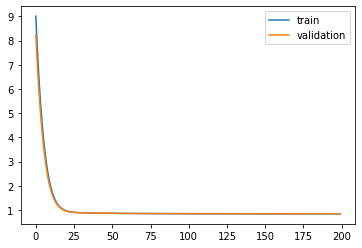

Time to train LSTM:  173.29444074630737
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 20s - loss: 5.2522 - pdc_loss: 0.7058 - event_loss: 0.8021 - val_loss: 4.8420 - val_pdc_loss: 0.6987 - val_event_loss: 0.7517

Epoch 00001: val_loss improved from inf to 4.84205, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 4.5358 - pdc_loss: 0.6904 - event_loss: 0.7114 - val_loss: 4.1809 - val_pdc_loss: 0.6839 - val_event_loss: 0.6690

Epoch 00002: val_loss improved from 4.84205 to 4.18089, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 3.9228 - pdc_loss: 0.6767 - event_loss: 0.6397 - val_loss: 3.6197 - val_pdc_loss: 0.6710 - val_event_loss: 0.6047

Epoch 00003: val_loss improved from 4.18089 to 3.61975, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 3.4031 - pdc_loss: 0.6647 - event_loss: 0.5830 - val_loss: 3.1453 - val_pdc_loss: 0.6597 - val_event_loss: 0.5530

Epoch 00004: val_loss improved from 3.61975 to 3.14531, saving


Epoch 00035: val_loss improved from 0.86517 to 0.86411, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 0.8664 - pdc_loss: 0.5343 - event_loss: 0.3184 - val_loss: 0.8631 - val_pdc_loss: 0.5355 - val_event_loss: 0.3140

Epoch 00036: val_loss improved from 0.86411 to 0.86307, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 0.8654 - pdc_loss: 0.5337 - event_loss: 0.3184 - val_loss: 0.8621 - val_pdc_loss: 0.5349 - val_event_loss: 0.3140

Epoch 00037: val_loss improved from 0.86307 to 0.86212, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 0.8645 - pdc_loss: 0.5330 - event_loss: 0.3183 - val_loss: 0.8612 - val_pdc_loss: 0.5341 - val_event_loss: 0.3139

Epoch 00038: val_loss improved from 0.86212 to 0.86116, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 0.8636 - pdc_loss: 0.5324 - event_loss: 0.3183 - val_loss: 0.8603 - val_pdc_loss: 0.5335 - val_event_loss: 0.3138

Epoch 00039: val_loss improved from 0.86116 to 

 - 1s - loss: 0.8482 - pdc_loss: 0.5211 - event_loss: 0.3170 - val_loss: 0.8455 - val_pdc_loss: 0.5228 - val_event_loss: 0.3127

Epoch 00070: val_loss improved from 0.84584 to 0.84553, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 0.8480 - pdc_loss: 0.5210 - event_loss: 0.3170 - val_loss: 0.8454 - val_pdc_loss: 0.5227 - val_event_loss: 0.3128

Epoch 00071: val_loss improved from 0.84553 to 0.84545, saving model to Event_val_weights1.hdf5
Epoch 72/200
 - 1s - loss: 0.8477 - pdc_loss: 0.5208 - event_loss: 0.3170 - val_loss: 0.8451 - val_pdc_loss: 0.5226 - val_event_loss: 0.3126

Epoch 00072: val_loss improved from 0.84545 to 0.84512, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.8475 - pdc_loss: 0.5207 - event_loss: 0.3169 - val_loss: 0.8450 - val_pdc_loss: 0.5224 - val_event_loss: 0.3128

Epoch 00073: val_loss improved from 0.84512 to 0.84498, saving model to Event_val_weights1.hdf5
Epoch 74/200
 - 1s - loss: 0.8471 - pdc_loss: 0.5205 - event_


Epoch 00105: val_loss did not improve from 0.84056
Epoch 106/200
 - 1s - loss: 0.8413 - pdc_loss: 0.5168 - event_loss: 0.3160 - val_loss: 0.8404 - val_pdc_loss: 0.5202 - val_event_loss: 0.3118

Epoch 00106: val_loss improved from 0.84056 to 0.84042, saving model to Event_val_weights1.hdf5
Epoch 107/200
 - 1s - loss: 0.8412 - pdc_loss: 0.5168 - event_loss: 0.3161 - val_loss: 0.8405 - val_pdc_loss: 0.5202 - val_event_loss: 0.3119

Epoch 00107: val_loss did not improve from 0.84042
Epoch 108/200
 - 1s - loss: 0.8410 - pdc_loss: 0.5167 - event_loss: 0.3160 - val_loss: 0.8402 - val_pdc_loss: 0.5202 - val_event_loss: 0.3117

Epoch 00108: val_loss improved from 0.84042 to 0.84022, saving model to Event_val_weights1.hdf5
Epoch 109/200
 - 1s - loss: 0.8410 - pdc_loss: 0.5167 - event_loss: 0.3160 - val_loss: 0.8403 - val_pdc_loss: 0.5202 - val_event_loss: 0.3118

Epoch 00109: val_loss did not improve from 0.84022
Epoch 110/200
 - 1s - loss: 0.8408 - pdc_loss: 0.5166 - event_loss: 0.3160 - val_l


Epoch 00144: val_loss did not improve from 0.83809
Epoch 145/200
 - 1s - loss: 0.8377 - pdc_loss: 0.5148 - event_loss: 0.3153 - val_loss: 0.8381 - val_pdc_loss: 0.5194 - val_event_loss: 0.3111

Epoch 00145: val_loss did not improve from 0.83809
Epoch 146/200
 - 1s - loss: 0.8376 - pdc_loss: 0.5148 - event_loss: 0.3152 - val_loss: 0.8379 - val_pdc_loss: 0.5194 - val_event_loss: 0.3108

Epoch 00146: val_loss improved from 0.83809 to 0.83788, saving model to Event_val_weights1.hdf5
Epoch 147/200
 - 1s - loss: 0.8376 - pdc_loss: 0.5147 - event_loss: 0.3152 - val_loss: 0.8379 - val_pdc_loss: 0.5193 - val_event_loss: 0.3110

Epoch 00147: val_loss did not improve from 0.83788
Epoch 148/200
 - 1s - loss: 0.8375 - pdc_loss: 0.5147 - event_loss: 0.3152 - val_loss: 0.8378 - val_pdc_loss: 0.5194 - val_event_loss: 0.3108

Epoch 00148: val_loss improved from 0.83788 to 0.83777, saving model to Event_val_weights1.hdf5
Epoch 149/200
 - 1s - loss: 0.8375 - pdc_loss: 0.5147 - event_loss: 0.3152 - val_l


Epoch 00183: val_loss did not improve from 0.83660
Epoch 184/200
 - 1s - loss: 0.8355 - pdc_loss: 0.5137 - event_loss: 0.3146 - val_loss: 0.8368 - val_pdc_loss: 0.5190 - val_event_loss: 0.3106

Epoch 00184: val_loss did not improve from 0.83660
Epoch 185/200
 - 1s - loss: 0.8355 - pdc_loss: 0.5136 - event_loss: 0.3146 - val_loss: 0.8366 - val_pdc_loss: 0.5189 - val_event_loss: 0.3105

Epoch 00185: val_loss did not improve from 0.83660
Epoch 186/200
 - 1s - loss: 0.8355 - pdc_loss: 0.5137 - event_loss: 0.3146 - val_loss: 0.8364 - val_pdc_loss: 0.5188 - val_event_loss: 0.3103

Epoch 00186: val_loss improved from 0.83660 to 0.83639, saving model to Event_val_weights1.hdf5
Epoch 187/200
 - 1s - loss: 0.8354 - pdc_loss: 0.5136 - event_loss: 0.3146 - val_loss: 0.8367 - val_pdc_loss: 0.5188 - val_event_loss: 0.3107

Epoch 00187: val_loss did not improve from 0.83639
Epoch 188/200
 - 1s - loss: 0.8354 - pdc_loss: 0.5136 - event_loss: 0.3145 - val_loss: 0.8364 - val_pdc_loss: 0.5188 - val_even

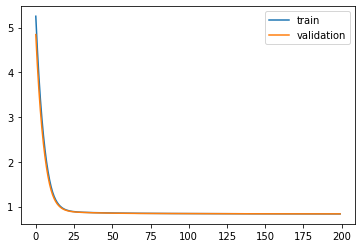

Time to train LSTM:  168.0162377357483
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 34s - loss: 5.1540 - pdc_loss: 0.7214 - event_loss: 0.7022 - val_loss: 4.7537 - val_pdc_loss: 0.7033 - val_event_loss: 0.6779

Epoch 00001: val_loss improved from inf to 4.75369, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 4.4626 - pdc_loss: 0.6930 - event_loss: 0.6587 - val_loss: 4.1166 - val_pdc_loss: 0.6784 - val_event_loss: 0.6377

Epoch 00002: val_loss improved from 4.75369 to 4.11662, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 3.8652 - pdc_loss: 0.6703 - event_loss: 0.6188 - val_loss: 3.5698 - val_pdc_loss: 0.6589 - val_event_loss: 0.5996

Epoch 00003: val_loss improved from 4.11662 to 3.56982, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 3.3532 - pdc_loss: 0.6515 - event_loss: 0.5801 - val_loss: 3.1024 - val_pdc_loss: 0.6426 - val_event_loss: 0.5612

Epoch 00004: val_loss improved from 3.56982 to 3.10240, saving 


Epoch 00035: val_loss improved from 0.87549 to 0.87459, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 0.8613 - pdc_loss: 0.5308 - event_loss: 0.3170 - val_loss: 0.8738 - val_pdc_loss: 0.5371 - val_event_loss: 0.3232

Epoch 00036: val_loss improved from 0.87459 to 0.87376, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 0.8603 - pdc_loss: 0.5301 - event_loss: 0.3169 - val_loss: 0.8730 - val_pdc_loss: 0.5365 - val_event_loss: 0.3231

Epoch 00037: val_loss improved from 0.87376 to 0.87297, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 0.8594 - pdc_loss: 0.5294 - event_loss: 0.3168 - val_loss: 0.8722 - val_pdc_loss: 0.5360 - val_event_loss: 0.3230

Epoch 00038: val_loss improved from 0.87297 to 0.87221, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 0.8585 - pdc_loss: 0.5287 - event_loss: 0.3168 - val_loss: 0.8717 - val_pdc_loss: 0.5356 - val_event_loss: 0.3230

Epoch 00039: val_loss improved from 0.87221 to 


Epoch 00070: val_loss improved from 0.85817 to 0.85787, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.8406 - pdc_loss: 0.5155 - event_loss: 0.3150 - val_loss: 0.8578 - val_pdc_loss: 0.5264 - val_event_loss: 0.3213

Epoch 00071: val_loss improved from 0.85787 to 0.85780, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.8403 - pdc_loss: 0.5153 - event_loss: 0.3150 - val_loss: 0.8575 - val_pdc_loss: 0.5262 - val_event_loss: 0.3213

Epoch 00072: val_loss improved from 0.85780 to 0.85751, saving model to Event_val_weights2.hdf5
Epoch 73/200
 - 1s - loss: 0.8401 - pdc_loss: 0.5152 - event_loss: 0.3149 - val_loss: 0.8574 - val_pdc_loss: 0.5263 - val_event_loss: 0.3212

Epoch 00073: val_loss improved from 0.85751 to 0.85744, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.8398 - pdc_loss: 0.5150 - event_loss: 0.3149 - val_loss: 0.8572 - val_pdc_loss: 0.5261 - val_event_loss: 0.3212

Epoch 00074: val_loss improved from 0.85744 to 


Epoch 00106: val_loss improved from 0.85413 to 0.85392, saving model to Event_val_weights2.hdf5
Epoch 107/200
 - 1s - loss: 0.8347 - pdc_loss: 0.5122 - event_loss: 0.3136 - val_loss: 0.8539 - val_pdc_loss: 0.5247 - val_event_loss: 0.3204

Epoch 00107: val_loss improved from 0.85392 to 0.85392, saving model to Event_val_weights2.hdf5
Epoch 108/200
 - 1s - loss: 0.8346 - pdc_loss: 0.5122 - event_loss: 0.3136 - val_loss: 0.8537 - val_pdc_loss: 0.5246 - val_event_loss: 0.3204

Epoch 00108: val_loss improved from 0.85392 to 0.85373, saving model to Event_val_weights2.hdf5
Epoch 109/200
 - 1s - loss: 0.8345 - pdc_loss: 0.5121 - event_loss: 0.3136 - val_loss: 0.8538 - val_pdc_loss: 0.5247 - val_event_loss: 0.3203

Epoch 00109: val_loss did not improve from 0.85373
Epoch 110/200
 - 1s - loss: 0.8345 - pdc_loss: 0.5121 - event_loss: 0.3136 - val_loss: 0.8538 - val_pdc_loss: 0.5247 - val_event_loss: 0.3203

Epoch 00110: val_loss did not improve from 0.85373
Epoch 111/200
 - 1s - loss: 0.8343 - 

 - 1s - loss: 0.8318 - pdc_loss: 0.5107 - event_loss: 0.3130 - val_loss: 0.8524 - val_pdc_loss: 0.5240 - val_event_loss: 0.3202

Epoch 00145: val_loss did not improve from 0.85226
Epoch 146/200
 - 1s - loss: 0.8318 - pdc_loss: 0.5107 - event_loss: 0.3130 - val_loss: 0.8523 - val_pdc_loss: 0.5240 - val_event_loss: 0.3202

Epoch 00146: val_loss did not improve from 0.85226
Epoch 147/200
 - 1s - loss: 0.8317 - pdc_loss: 0.5106 - event_loss: 0.3130 - val_loss: 0.8522 - val_pdc_loss: 0.5239 - val_event_loss: 0.3202

Epoch 00147: val_loss improved from 0.85226 to 0.85220, saving model to Event_val_weights2.hdf5
Epoch 148/200
 - 1s - loss: 0.8317 - pdc_loss: 0.5106 - event_loss: 0.3130 - val_loss: 0.8525 - val_pdc_loss: 0.5242 - val_event_loss: 0.3202

Epoch 00148: val_loss did not improve from 0.85220
Epoch 149/200
 - 1s - loss: 0.8316 - pdc_loss: 0.5106 - event_loss: 0.3130 - val_loss: 0.8521 - val_pdc_loss: 0.5238 - val_event_loss: 0.3203

Epoch 00149: val_loss improved from 0.85220 to 0.8


Epoch 00184: val_loss did not improve from 0.85133
Epoch 185/200
 - 1s - loss: 0.8300 - pdc_loss: 0.5098 - event_loss: 0.3126 - val_loss: 0.8516 - val_pdc_loss: 0.5240 - val_event_loss: 0.3200

Epoch 00185: val_loss did not improve from 0.85133
Epoch 186/200
 - 1s - loss: 0.8299 - pdc_loss: 0.5097 - event_loss: 0.3126 - val_loss: 0.8511 - val_pdc_loss: 0.5235 - val_event_loss: 0.3200

Epoch 00186: val_loss improved from 0.85133 to 0.85111, saving model to Event_val_weights2.hdf5
Epoch 187/200
 - 1s - loss: 0.8299 - pdc_loss: 0.5097 - event_loss: 0.3126 - val_loss: 0.8515 - val_pdc_loss: 0.5238 - val_event_loss: 0.3201

Epoch 00187: val_loss did not improve from 0.85111
Epoch 188/200
 - 1s - loss: 0.8299 - pdc_loss: 0.5097 - event_loss: 0.3126 - val_loss: 0.8513 - val_pdc_loss: 0.5236 - val_event_loss: 0.3201

Epoch 00188: val_loss did not improve from 0.85111
Epoch 189/200
 - 1s - loss: 0.8299 - pdc_loss: 0.5097 - event_loss: 0.3126 - val_loss: 0.8517 - val_pdc_loss: 0.5237 - val_even

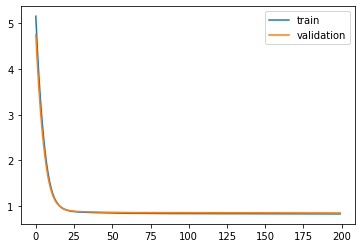

Time to train LSTM:  181.85972332954407
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 25s - loss: 5.1156 - pdc_loss: 0.7508 - event_loss: 0.6644 - val_loss: 4.7154 - val_pdc_loss: 0.7375 - val_event_loss: 0.6274

Epoch 00001: val_loss improved from inf to 4.71538, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 4.4163 - pdc_loss: 0.7186 - event_loss: 0.6035 - val_loss: 4.0731 - val_pdc_loss: 0.7087 - val_event_loss: 0.5748

Epoch 00002: val_loss improved from 4.71538 to 4.07315, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 3.8142 - pdc_loss: 0.6900 - event_loss: 0.5554 - val_loss: 3.5220 - val_pdc_loss: 0.6831 - val_event_loss: 0.5315

Epoch 00003: val_loss improved from 4.07315 to 3.52205, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 3.2987 - pdc_loss: 0.6655 - event_loss: 0.5135 - val_loss: 3.0515 - val_pdc_loss: 0.6611 - val_event_loss: 0.4920

Epoch 00004: val_loss improved from 3.52205 to 3.05153, saving


Epoch 00035: val_loss improved from 0.88694 to 0.88583, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 0.8641 - pdc_loss: 0.5332 - event_loss: 0.3169 - val_loss: 0.8846 - val_pdc_loss: 0.5473 - val_event_loss: 0.3233

Epoch 00036: val_loss improved from 0.88583 to 0.88458, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 0.8627 - pdc_loss: 0.5320 - event_loss: 0.3168 - val_loss: 0.8836 - val_pdc_loss: 0.5463 - val_event_loss: 0.3234

Epoch 00037: val_loss improved from 0.88458 to 0.88360, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 0.8615 - pdc_loss: 0.5308 - event_loss: 0.3168 - val_loss: 0.8825 - val_pdc_loss: 0.5454 - val_event_loss: 0.3233

Epoch 00038: val_loss improved from 0.88360 to 0.88253, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 0.8602 - pdc_loss: 0.5297 - event_loss: 0.3167 - val_loss: 0.8819 - val_pdc_loss: 0.5448 - val_event_loss: 0.3233

Epoch 00039: val_loss improved from 0.88253 to 

 - 1s - loss: 0.8431 - pdc_loss: 0.5180 - event_loss: 0.3149 - val_loss: 0.8703 - val_pdc_loss: 0.5374 - val_event_loss: 0.3227

Epoch 00071: val_loss improved from 0.87050 to 0.87027, saving model to Event_val_weights3.hdf5
Epoch 72/200
 - 1s - loss: 0.8428 - pdc_loss: 0.5178 - event_loss: 0.3149 - val_loss: 0.8703 - val_pdc_loss: 0.5375 - val_event_loss: 0.3226

Epoch 00072: val_loss improved from 0.87027 to 0.87026, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.8426 - pdc_loss: 0.5177 - event_loss: 0.3149 - val_loss: 0.8700 - val_pdc_loss: 0.5372 - val_event_loss: 0.3228

Epoch 00073: val_loss improved from 0.87026 to 0.87002, saving model to Event_val_weights3.hdf5
Epoch 74/200
 - 1s - loss: 0.8424 - pdc_loss: 0.5176 - event_loss: 0.3148 - val_loss: 0.8700 - val_pdc_loss: 0.5372 - val_event_loss: 0.3227

Epoch 00074: val_loss did not improve from 0.87002
Epoch 75/200
 - 1s - loss: 0.8422 - pdc_loss: 0.5174 - event_loss: 0.3148 - val_loss: 0.8697 - val_pdc_los

 - 1s - loss: 0.8373 - pdc_loss: 0.5140 - event_loss: 0.3141 - val_loss: 0.8661 - val_pdc_loss: 0.5344 - val_event_loss: 0.3225

Epoch 00108: val_loss improved from 0.86615 to 0.86612, saving model to Event_val_weights3.hdf5
Epoch 109/200
 - 1s - loss: 0.8372 - pdc_loss: 0.5139 - event_loss: 0.3141 - val_loss: 0.8660 - val_pdc_loss: 0.5343 - val_event_loss: 0.3226

Epoch 00109: val_loss improved from 0.86612 to 0.86603, saving model to Event_val_weights3.hdf5
Epoch 110/200
 - 1s - loss: 0.8370 - pdc_loss: 0.5138 - event_loss: 0.3141 - val_loss: 0.8660 - val_pdc_loss: 0.5342 - val_event_loss: 0.3227

Epoch 00110: val_loss improved from 0.86603 to 0.86596, saving model to Event_val_weights3.hdf5
Epoch 111/200
 - 1s - loss: 0.8369 - pdc_loss: 0.5138 - event_loss: 0.3141 - val_loss: 0.8657 - val_pdc_loss: 0.5341 - val_event_loss: 0.3225

Epoch 00111: val_loss improved from 0.86596 to 0.86572, saving model to Event_val_weights3.hdf5
Epoch 112/200
 - 1s - loss: 0.8368 - pdc_loss: 0.5137 - ev

 - 1s - loss: 0.8337 - pdc_loss: 0.5117 - event_loss: 0.3133 - val_loss: 0.8637 - val_pdc_loss: 0.5328 - val_event_loss: 0.3223

Epoch 00145: val_loss did not improve from 0.86367
Epoch 146/200
 - 1s - loss: 0.8336 - pdc_loss: 0.5117 - event_loss: 0.3133 - val_loss: 0.8635 - val_pdc_loss: 0.5326 - val_event_loss: 0.3223

Epoch 00146: val_loss improved from 0.86367 to 0.86353, saving model to Event_val_weights3.hdf5
Epoch 147/200
 - 1s - loss: 0.8336 - pdc_loss: 0.5116 - event_loss: 0.3133 - val_loss: 0.8637 - val_pdc_loss: 0.5327 - val_event_loss: 0.3223

Epoch 00147: val_loss did not improve from 0.86353
Epoch 148/200
 - 1s - loss: 0.8335 - pdc_loss: 0.5115 - event_loss: 0.3133 - val_loss: 0.8637 - val_pdc_loss: 0.5327 - val_event_loss: 0.3224

Epoch 00148: val_loss did not improve from 0.86353
Epoch 149/200
 - 1s - loss: 0.8334 - pdc_loss: 0.5115 - event_loss: 0.3133 - val_loss: 0.8636 - val_pdc_loss: 0.5327 - val_event_loss: 0.3223

Epoch 00149: val_loss did not improve from 0.86353

 - 1s - loss: 0.8309 - pdc_loss: 0.5101 - event_loss: 0.3127 - val_loss: 0.8624 - val_pdc_loss: 0.5321 - val_event_loss: 0.3221

Epoch 00185: val_loss improved from 0.86241 to 0.86240, saving model to Event_val_weights3.hdf5
Epoch 186/200
 - 1s - loss: 0.8308 - pdc_loss: 0.5100 - event_loss: 0.3126 - val_loss: 0.8625 - val_pdc_loss: 0.5322 - val_event_loss: 0.3221

Epoch 00186: val_loss did not improve from 0.86240
Epoch 187/200
 - 1s - loss: 0.8307 - pdc_loss: 0.5100 - event_loss: 0.3126 - val_loss: 0.8624 - val_pdc_loss: 0.5321 - val_event_loss: 0.3221

Epoch 00187: val_loss improved from 0.86240 to 0.86236, saving model to Event_val_weights3.hdf5
Epoch 188/200
 - 1s - loss: 0.8307 - pdc_loss: 0.5099 - event_loss: 0.3126 - val_loss: 0.8625 - val_pdc_loss: 0.5321 - val_event_loss: 0.3222

Epoch 00188: val_loss did not improve from 0.86236
Epoch 189/200
 - 1s - loss: 0.8307 - pdc_loss: 0.5100 - event_loss: 0.3126 - val_loss: 0.8624 - val_pdc_loss: 0.5320 - val_event_loss: 0.3222

Epoch

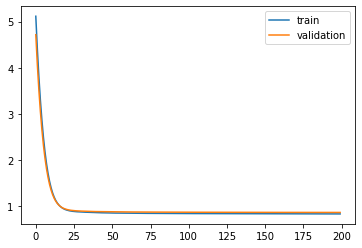

Time to train LSTM:  173.97856664657593
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 23s - loss: 5.1334 - pdc_loss: 0.7412 - event_loss: 0.6853 - val_loss: 4.7300 - val_pdc_loss: 0.7267 - val_event_loss: 0.6513

Epoch 00001: val_loss improved from inf to 4.73000, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 4.4429 - pdc_loss: 0.7183 - event_loss: 0.6326 - val_loss: 4.0943 - val_pdc_loss: 0.7068 - val_event_loss: 0.6043

Epoch 00002: val_loss improved from 4.73000 to 4.09428, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 3.8476 - pdc_loss: 0.6994 - event_loss: 0.5884 - val_loss: 3.5509 - val_pdc_loss: 0.6906 - val_event_loss: 0.5643

Epoch 00003: val_loss improved from 4.09428 to 3.55093, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 3.3399 - pdc_loss: 0.6833 - event_loss: 0.5496 - val_loss: 3.0896 - val_pdc_loss: 0.6769 - val_event_loss: 0.5280

Epoch 00004: val_loss improved from 3.55093 to 3.08961, saving


Epoch 00035: val_loss improved from 0.88789 to 0.88660, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 0.8598 - pdc_loss: 0.5290 - event_loss: 0.3173 - val_loss: 0.8858 - val_pdc_loss: 0.5449 - val_event_loss: 0.3275

Epoch 00036: val_loss improved from 0.88660 to 0.88578, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 0.8588 - pdc_loss: 0.5283 - event_loss: 0.3173 - val_loss: 0.8849 - val_pdc_loss: 0.5443 - val_event_loss: 0.3275

Epoch 00037: val_loss improved from 0.88578 to 0.88494, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 0.8579 - pdc_loss: 0.5276 - event_loss: 0.3172 - val_loss: 0.8843 - val_pdc_loss: 0.5437 - val_event_loss: 0.3275

Epoch 00038: val_loss improved from 0.88494 to 0.88425, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 0.8571 - pdc_loss: 0.5270 - event_loss: 0.3171 - val_loss: 0.8837 - val_pdc_loss: 0.5434 - val_event_loss: 0.3274

Epoch 00039: val_loss improved from 0.88425 to 

 - 1s - loss: 0.8439 - pdc_loss: 0.5183 - event_loss: 0.3153 - val_loss: 0.8748 - val_pdc_loss: 0.5388 - val_event_loss: 0.3257

Epoch 00070: val_loss improved from 0.87507 to 0.87481, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.8436 - pdc_loss: 0.5181 - event_loss: 0.3152 - val_loss: 0.8745 - val_pdc_loss: 0.5386 - val_event_loss: 0.3256

Epoch 00071: val_loss improved from 0.87481 to 0.87454, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.8435 - pdc_loss: 0.5180 - event_loss: 0.3152 - val_loss: 0.8743 - val_pdc_loss: 0.5385 - val_event_loss: 0.3256

Epoch 00072: val_loss improved from 0.87454 to 0.87432, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.8432 - pdc_loss: 0.5178 - event_loss: 0.3151 - val_loss: 0.8741 - val_pdc_loss: 0.5383 - val_event_loss: 0.3256

Epoch 00073: val_loss improved from 0.87432 to 0.87413, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.8430 - pdc_loss: 0.5177 - event_

 - 1s - loss: 0.8377 - pdc_loss: 0.5145 - event_loss: 0.3141 - val_loss: 0.8706 - val_pdc_loss: 0.5359 - val_event_loss: 0.3255

Epoch 00105: val_loss improved from 0.87073 to 0.87055, saving model to Event_val_weights4.hdf5
Epoch 106/200
 - 1s - loss: 0.8376 - pdc_loss: 0.5144 - event_loss: 0.3140 - val_loss: 0.8704 - val_pdc_loss: 0.5358 - val_event_loss: 0.3255

Epoch 00106: val_loss improved from 0.87055 to 0.87042, saving model to Event_val_weights4.hdf5
Epoch 107/200
 - 1s - loss: 0.8375 - pdc_loss: 0.5143 - event_loss: 0.3140 - val_loss: 0.8703 - val_pdc_loss: 0.5357 - val_event_loss: 0.3255

Epoch 00107: val_loss improved from 0.87042 to 0.87028, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.8374 - pdc_loss: 0.5143 - event_loss: 0.3140 - val_loss: 0.8701 - val_pdc_loss: 0.5356 - val_event_loss: 0.3255

Epoch 00108: val_loss improved from 0.87028 to 0.87015, saving model to Event_val_weights4.hdf5
Epoch 109/200
 - 1s - loss: 0.8372 - pdc_loss: 0.5142 - ev

 - 1s - loss: 0.8344 - pdc_loss: 0.5128 - event_loss: 0.3131 - val_loss: 0.8679 - val_pdc_loss: 0.5335 - val_event_loss: 0.3259

Epoch 00140: val_loss improved from 0.86786 to 0.86785, saving model to Event_val_weights4.hdf5
Epoch 141/200
 - 1s - loss: 0.8343 - pdc_loss: 0.5128 - event_loss: 0.3131 - val_loss: 0.8678 - val_pdc_loss: 0.5335 - val_event_loss: 0.3259

Epoch 00141: val_loss improved from 0.86785 to 0.86782, saving model to Event_val_weights4.hdf5
Epoch 142/200
 - 1s - loss: 0.8342 - pdc_loss: 0.5127 - event_loss: 0.3130 - val_loss: 0.8678 - val_pdc_loss: 0.5335 - val_event_loss: 0.3259

Epoch 00142: val_loss improved from 0.86782 to 0.86778, saving model to Event_val_weights4.hdf5
Epoch 143/200
 - 1s - loss: 0.8341 - pdc_loss: 0.5127 - event_loss: 0.3130 - val_loss: 0.8677 - val_pdc_loss: 0.5334 - val_event_loss: 0.3259

Epoch 00143: val_loss improved from 0.86778 to 0.86771, saving model to Event_val_weights4.hdf5
Epoch 144/200
 - 1s - loss: 0.8340 - pdc_loss: 0.5127 - ev

 - 1s - loss: 0.8321 - pdc_loss: 0.5118 - event_loss: 0.3123 - val_loss: 0.8666 - val_pdc_loss: 0.5322 - val_event_loss: 0.3264

Epoch 00176: val_loss did not improve from 0.86655
Epoch 177/200
 - 1s - loss: 0.8320 - pdc_loss: 0.5117 - event_loss: 0.3123 - val_loss: 0.8666 - val_pdc_loss: 0.5321 - val_event_loss: 0.3265

Epoch 00177: val_loss improved from 0.86655 to 0.86655, saving model to Event_val_weights4.hdf5
Epoch 178/200
 - 1s - loss: 0.8320 - pdc_loss: 0.5118 - event_loss: 0.3123 - val_loss: 0.8665 - val_pdc_loss: 0.5321 - val_event_loss: 0.3265

Epoch 00178: val_loss improved from 0.86655 to 0.86649, saving model to Event_val_weights4.hdf5
Epoch 179/200
 - 1s - loss: 0.8319 - pdc_loss: 0.5117 - event_loss: 0.3123 - val_loss: 0.8664 - val_pdc_loss: 0.5320 - val_event_loss: 0.3265

Epoch 00179: val_loss improved from 0.86649 to 0.86643, saving model to Event_val_weights4.hdf5
Epoch 180/200
 - 1s - loss: 0.8319 - pdc_loss: 0.5117 - event_loss: 0.3122 - val_loss: 0.8665 - val_pdc

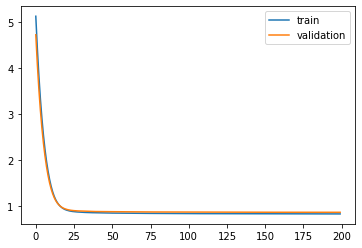

Time to train LSTM:  173.12752151489258
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 21s - loss: 5.1804 - pdc_loss: 0.7422 - event_loss: 0.7035 - val_loss: 4.7668 - val_pdc_loss: 0.7267 - val_event_loss: 0.6528

Epoch 00001: val_loss improved from inf to 4.76679, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 4.4678 - pdc_loss: 0.7146 - event_loss: 0.6215 - val_loss: 4.1132 - val_pdc_loss: 0.7022 - val_event_loss: 0.5840

Epoch 00002: val_loss improved from 4.76679 to 4.11320, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 3.8577 - pdc_loss: 0.6930 - event_loss: 0.5594 - val_loss: 3.5550 - val_pdc_loss: 0.6834 - val_event_loss: 0.5290

Epoch 00003: val_loss improved from 4.11320 to 3.55499, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 3.3383 - pdc_loss: 0.6762 - event_loss: 0.5087 - val_loss: 3.0812 - val_pdc_loss: 0.6686 - val_event_loss: 0.4825

Epoch 00004: val_loss improved from 3.55499 to 3.08122, saving


Epoch 00035: val_loss improved from 0.87300 to 0.87202, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 0.8700 - pdc_loss: 0.5397 - event_loss: 0.3171 - val_loss: 0.8711 - val_pdc_loss: 0.5400 - val_event_loss: 0.3180

Epoch 00036: val_loss improved from 0.87202 to 0.87109, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 0.8691 - pdc_loss: 0.5390 - event_loss: 0.3170 - val_loss: 0.8702 - val_pdc_loss: 0.5394 - val_event_loss: 0.3180

Epoch 00037: val_loss improved from 0.87109 to 0.87023, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 0.8682 - pdc_loss: 0.5384 - event_loss: 0.3170 - val_loss: 0.8694 - val_pdc_loss: 0.5387 - val_event_loss: 0.3179

Epoch 00038: val_loss improved from 0.87023 to 0.86941, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 0.8674 - pdc_loss: 0.5378 - event_loss: 0.3169 - val_loss: 0.8686 - val_pdc_loss: 0.5381 - val_event_loss: 0.3178

Epoch 00039: val_loss improved from 0.86941 to 

 - 1s - loss: 0.8524 - pdc_loss: 0.5259 - event_loss: 0.3154 - val_loss: 0.8554 - val_pdc_loss: 0.5275 - val_event_loss: 0.3169

Epoch 00070: val_loss did not improve from 0.85536
Epoch 71/200
 - 1s - loss: 0.8521 - pdc_loss: 0.5257 - event_loss: 0.3155 - val_loss: 0.8550 - val_pdc_loss: 0.5271 - val_event_loss: 0.3170

Epoch 00071: val_loss improved from 0.85536 to 0.85502, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8518 - pdc_loss: 0.5254 - event_loss: 0.3154 - val_loss: 0.8549 - val_pdc_loss: 0.5270 - val_event_loss: 0.3169

Epoch 00072: val_loss improved from 0.85502 to 0.85485, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8515 - pdc_loss: 0.5252 - event_loss: 0.3154 - val_loss: 0.8544 - val_pdc_loss: 0.5266 - val_event_loss: 0.3170

Epoch 00073: val_loss improved from 0.85485 to 0.85445, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8511 - pdc_loss: 0.5249 - event_loss: 0.3154 - val_loss: 0.8544 - val_pdc_los


Epoch 00106: val_loss improved from 0.84971 to 0.84969, saving model to Event_val_weights5.hdf5
Epoch 107/200
 - 1s - loss: 0.8439 - pdc_loss: 0.5197 - event_loss: 0.3149 - val_loss: 0.8496 - val_pdc_loss: 0.5232 - val_event_loss: 0.3172

Epoch 00107: val_loss improved from 0.84969 to 0.84962, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.8437 - pdc_loss: 0.5197 - event_loss: 0.3148 - val_loss: 0.8497 - val_pdc_loss: 0.5234 - val_event_loss: 0.3171

Epoch 00108: val_loss did not improve from 0.84962
Epoch 109/200
 - 1s - loss: 0.8436 - pdc_loss: 0.5196 - event_loss: 0.3148 - val_loss: 0.8496 - val_pdc_loss: 0.5232 - val_event_loss: 0.3172

Epoch 00109: val_loss improved from 0.84962 to 0.84960, saving model to Event_val_weights5.hdf5
Epoch 110/200
 - 1s - loss: 0.8435 - pdc_loss: 0.5195 - event_loss: 0.3148 - val_loss: 0.8495 - val_pdc_loss: 0.5232 - val_event_loss: 0.3171

Epoch 00110: val_loss improved from 0.84960 to 0.84947, saving model to Event_val_weight


Epoch 00142: val_loss did not improve from 0.84566
Epoch 143/200
 - 1s - loss: 0.8401 - pdc_loss: 0.5168 - event_loss: 0.3148 - val_loss: 0.8456 - val_pdc_loss: 0.5203 - val_event_loss: 0.3168

Epoch 00143: val_loss improved from 0.84566 to 0.84561, saving model to Event_val_weights5.hdf5
Epoch 144/200
 - 1s - loss: 0.8401 - pdc_loss: 0.5168 - event_loss: 0.3148 - val_loss: 0.8455 - val_pdc_loss: 0.5203 - val_event_loss: 0.3167

Epoch 00144: val_loss improved from 0.84561 to 0.84552, saving model to Event_val_weights5.hdf5
Epoch 145/200
 - 1s - loss: 0.8400 - pdc_loss: 0.5167 - event_loss: 0.3148 - val_loss: 0.8455 - val_pdc_loss: 0.5203 - val_event_loss: 0.3167

Epoch 00145: val_loss improved from 0.84552 to 0.84550, saving model to Event_val_weights5.hdf5
Epoch 146/200
 - 1s - loss: 0.8399 - pdc_loss: 0.5167 - event_loss: 0.3148 - val_loss: 0.8454 - val_pdc_loss: 0.5203 - val_event_loss: 0.3166

Epoch 00146: val_loss improved from 0.84550 to 0.84539, saving model to Event_val_weight


Epoch 00179: val_loss did not improve from 0.84362
Epoch 180/200
 - 1s - loss: 0.8377 - pdc_loss: 0.5152 - event_loss: 0.3146 - val_loss: 0.8436 - val_pdc_loss: 0.5193 - val_event_loss: 0.3164

Epoch 00180: val_loss did not improve from 0.84362
Epoch 181/200
 - 1s - loss: 0.8376 - pdc_loss: 0.5151 - event_loss: 0.3146 - val_loss: 0.8434 - val_pdc_loss: 0.5191 - val_event_loss: 0.3164

Epoch 00181: val_loss improved from 0.84362 to 0.84344, saving model to Event_val_weights5.hdf5
Epoch 182/200
 - 1s - loss: 0.8376 - pdc_loss: 0.5151 - event_loss: 0.3146 - val_loss: 0.8435 - val_pdc_loss: 0.5192 - val_event_loss: 0.3163

Epoch 00182: val_loss did not improve from 0.84344
Epoch 183/200
 - 1s - loss: 0.8375 - pdc_loss: 0.5150 - event_loss: 0.3145 - val_loss: 0.8433 - val_pdc_loss: 0.5191 - val_event_loss: 0.3164

Epoch 00183: val_loss improved from 0.84344 to 0.84334, saving model to Event_val_weights5.hdf5
Epoch 184/200
 - 1s - loss: 0.8375 - pdc_loss: 0.5150 - event_loss: 0.3145 - val_l

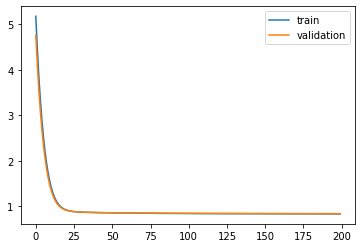

Time to train LSTM:  170.67493772506714
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 23s - loss: 4.3815 - pdc_loss: 0.7186 - event_loss: 0.7254 - val_loss: 4.0445 - val_pdc_loss: 0.7068 - val_event_loss: 0.6716

Epoch 00001: val_loss improved from inf to 4.04452, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 3.8018 - pdc_loss: 0.6990 - event_loss: 0.6366 - val_loss: 3.5119 - val_pdc_loss: 0.6877 - val_event_loss: 0.5963

Epoch 00002: val_loss improved from 4.04452 to 3.51194, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 3.3060 - pdc_loss: 0.6792 - event_loss: 0.5720 - val_loss: 3.0567 - val_pdc_loss: 0.6687 - val_event_loss: 0.5381

Epoch 00003: val_loss improved from 3.51194 to 3.05667, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 2.8827 - pdc_loss: 0.6599 - event_loss: 0.5205 - val_loss: 2.6685 - val_pdc_loss: 0.6504 - val_event_loss: 0.4898

Epoch 00004: val_loss improved from 3.05667 to 2.66854, saving


Epoch 00035: val_loss improved from 0.86242 to 0.86139, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 0.8618 - pdc_loss: 0.5319 - event_loss: 0.3174 - val_loss: 0.8601 - val_pdc_loss: 0.5347 - val_event_loss: 0.3130

Epoch 00036: val_loss improved from 0.86139 to 0.86005, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 0.8606 - pdc_loss: 0.5310 - event_loss: 0.3174 - val_loss: 0.8589 - val_pdc_loss: 0.5336 - val_event_loss: 0.3130

Epoch 00037: val_loss improved from 0.86005 to 0.85889, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 0.8596 - pdc_loss: 0.5301 - event_loss: 0.3174 - val_loss: 0.8579 - val_pdc_loss: 0.5328 - val_event_loss: 0.3130

Epoch 00038: val_loss improved from 0.85889 to 0.85792, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 0.8586 - pdc_loss: 0.5292 - event_loss: 0.3173 - val_loss: 0.8568 - val_pdc_loss: 0.5319 - val_event_loss: 0.3129

Epoch 00039: val_loss improved from 0.85792 to 


Epoch 00070: val_loss improved from 0.83959 to 0.83935, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 0.8415 - pdc_loss: 0.5169 - event_loss: 0.3155 - val_loss: 0.8393 - val_pdc_loss: 0.5188 - val_event_loss: 0.3113

Epoch 00071: val_loss improved from 0.83935 to 0.83926, saving model to Event_val_weights1.hdf5
Epoch 72/200
 - 1s - loss: 0.8412 - pdc_loss: 0.5167 - event_loss: 0.3154 - val_loss: 0.8386 - val_pdc_loss: 0.5184 - val_event_loss: 0.3112

Epoch 00072: val_loss improved from 0.83926 to 0.83864, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.8409 - pdc_loss: 0.5165 - event_loss: 0.3154 - val_loss: 0.8387 - val_pdc_loss: 0.5184 - val_event_loss: 0.3113

Epoch 00073: val_loss did not improve from 0.83864
Epoch 74/200
 - 1s - loss: 0.8405 - pdc_loss: 0.5162 - event_loss: 0.3153 - val_loss: 0.8383 - val_pdc_loss: 0.5182 - val_event_loss: 0.3111

Epoch 00074: val_loss improved from 0.83864 to 0.83825, saving model to Event_val_weights1.h


Epoch 00108: val_loss did not improve from 0.83538
Epoch 109/200
 - 1s - loss: 0.8356 - pdc_loss: 0.5132 - event_loss: 0.3143 - val_loss: 0.8350 - val_pdc_loss: 0.5169 - val_event_loss: 0.3100

Epoch 00109: val_loss improved from 0.83538 to 0.83499, saving model to Event_val_weights1.hdf5
Epoch 110/200
 - 1s - loss: 0.8355 - pdc_loss: 0.5131 - event_loss: 0.3143 - val_loss: 0.8355 - val_pdc_loss: 0.5172 - val_event_loss: 0.3102

Epoch 00110: val_loss did not improve from 0.83499
Epoch 111/200
 - 1s - loss: 0.8354 - pdc_loss: 0.5130 - event_loss: 0.3143 - val_loss: 0.8356 - val_pdc_loss: 0.5174 - val_event_loss: 0.3102

Epoch 00111: val_loss did not improve from 0.83499
Epoch 112/200
 - 1s - loss: 0.8353 - pdc_loss: 0.5130 - event_loss: 0.3142 - val_loss: 0.8352 - val_pdc_loss: 0.5171 - val_event_loss: 0.3101

Epoch 00112: val_loss did not improve from 0.83499
Epoch 113/200
 - 1s - loss: 0.8353 - pdc_loss: 0.5130 - event_loss: 0.3143 - val_loss: 0.8354 - val_pdc_loss: 0.5172 - val_even

 - 1s - loss: 0.8328 - pdc_loss: 0.5115 - event_loss: 0.3138 - val_loss: 0.8339 - val_pdc_loss: 0.5166 - val_event_loss: 0.3100

Epoch 00148: val_loss did not improve from 0.83384
Epoch 149/200
 - 1s - loss: 0.8328 - pdc_loss: 0.5115 - event_loss: 0.3138 - val_loss: 0.8339 - val_pdc_loss: 0.5165 - val_event_loss: 0.3100

Epoch 00149: val_loss did not improve from 0.83384
Epoch 150/200
 - 1s - loss: 0.8327 - pdc_loss: 0.5115 - event_loss: 0.3138 - val_loss: 0.8338 - val_pdc_loss: 0.5165 - val_event_loss: 0.3099

Epoch 00150: val_loss improved from 0.83384 to 0.83381, saving model to Event_val_weights1.hdf5
Epoch 151/200
 - 1s - loss: 0.8327 - pdc_loss: 0.5115 - event_loss: 0.3138 - val_loss: 0.8339 - val_pdc_loss: 0.5165 - val_event_loss: 0.3100

Epoch 00151: val_loss did not improve from 0.83381
Epoch 152/200
 - 1s - loss: 0.8326 - pdc_loss: 0.5114 - event_loss: 0.3138 - val_loss: 0.8338 - val_pdc_loss: 0.5165 - val_event_loss: 0.3100

Epoch 00152: val_loss did not improve from 0.83381


Epoch 00189: val_loss did not improve from 0.83301
Epoch 190/200
 - 1s - loss: 0.8309 - pdc_loss: 0.5104 - event_loss: 0.3135 - val_loss: 0.8333 - val_pdc_loss: 0.5162 - val_event_loss: 0.3102

Epoch 00190: val_loss did not improve from 0.83301
Epoch 191/200
 - 1s - loss: 0.8310 - pdc_loss: 0.5105 - event_loss: 0.3136 - val_loss: 0.8336 - val_pdc_loss: 0.5162 - val_event_loss: 0.3104

Epoch 00191: val_loss did not improve from 0.83301
Epoch 192/200
 - 1s - loss: 0.8310 - pdc_loss: 0.5105 - event_loss: 0.3136 - val_loss: 0.8327 - val_pdc_loss: 0.5158 - val_event_loss: 0.3100

Epoch 00192: val_loss improved from 0.83301 to 0.83275, saving model to Event_val_weights1.hdf5
Epoch 193/200
 - 1s - loss: 0.8309 - pdc_loss: 0.5104 - event_loss: 0.3135 - val_loss: 0.8330 - val_pdc_loss: 0.5159 - val_event_loss: 0.3101

Epoch 00193: val_loss did not improve from 0.83275
Epoch 194/200
 - 1s - loss: 0.8309 - pdc_loss: 0.5104 - event_loss: 0.3135 - val_loss: 0.8332 - val_pdc_loss: 0.5160 - val_even

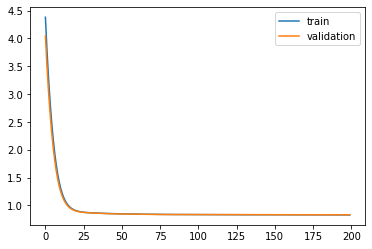

Time to train LSTM:  172.48119044303894


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f66c2774f98>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 22s - loss: 4.4637 - pdc_loss: 0.7275 - event_loss: 0.7160 - val_loss: 4.1141 - val_pdc_loss: 0.7160 - val_event_loss: 0.6568

Epoch 00001: val_loss improved from inf to 4.11407, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 3.8753 - pdc_loss: 0.7124 - event_loss: 0.6275 - val_loss: 3.5785 - val_pdc_loss: 0.7033 - val_event_loss: 0.5856

Epoch 00002: val_loss improved from 4.11407 to 3.57849, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 3.3749 - pdc_loss: 0.7012 - event_loss: 0.5634 - val_loss: 3.1248 - val_pdc_loss: 0.6936 - val_event_loss: 0.5336

Epoch 00003: val_loss improved from 3.57849 to 3.12484, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 2.9508 - pdc_loss: 0.6918 - event_loss: 0.5148 - val_loss: 2.7409 - val_pdc_loss: 0.6848 - val_event_loss: 0.4930

Epoch 00004: val_loss improved from 3.12484 to 2.74094, saving model to Event_val_weights2.hdf5
Epoch 


Epoch 00035: val_loss improved from 0.87985 to 0.87901, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 0.8653 - pdc_loss: 0.5363 - event_loss: 0.3165 - val_loss: 0.8781 - val_pdc_loss: 0.5418 - val_event_loss: 0.3239

Epoch 00036: val_loss improved from 0.87901 to 0.87814, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 0.8643 - pdc_loss: 0.5357 - event_loss: 0.3164 - val_loss: 0.8773 - val_pdc_loss: 0.5413 - val_event_loss: 0.3239

Epoch 00037: val_loss improved from 0.87814 to 0.87733, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 0.8634 - pdc_loss: 0.5350 - event_loss: 0.3163 - val_loss: 0.8766 - val_pdc_loss: 0.5408 - val_event_loss: 0.3238

Epoch 00038: val_loss improved from 0.87733 to 0.87658, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 0.8626 - pdc_loss: 0.5344 - event_loss: 0.3162 - val_loss: 0.8757 - val_pdc_loss: 0.5402 - val_event_loss: 0.3237

Epoch 00039: val_loss improved from 0.87658 to 


Epoch 00070: val_loss improved from 0.85768 to 0.85745, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.8418 - pdc_loss: 0.5187 - event_loss: 0.3144 - val_loss: 0.8574 - val_pdc_loss: 0.5275 - val_event_loss: 0.3212

Epoch 00071: val_loss improved from 0.85745 to 0.85743, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.8416 - pdc_loss: 0.5184 - event_loss: 0.3144 - val_loss: 0.8567 - val_pdc_loss: 0.5271 - val_event_loss: 0.3209

Epoch 00072: val_loss improved from 0.85743 to 0.85673, saving model to Event_val_weights2.hdf5
Epoch 73/200
 - 1s - loss: 0.8413 - pdc_loss: 0.5182 - event_loss: 0.3143 - val_loss: 0.8566 - val_pdc_loss: 0.5269 - val_event_loss: 0.3210

Epoch 00073: val_loss improved from 0.85673 to 0.85655, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.8413 - pdc_loss: 0.5183 - event_loss: 0.3143 - val_loss: 0.8565 - val_pdc_loss: 0.5268 - val_event_loss: 0.3210

Epoch 00074: val_loss improved from 0.85655 to 


Epoch 00107: val_loss did not improve from 0.85262
Epoch 108/200
 - 1s - loss: 0.8363 - pdc_loss: 0.5149 - event_loss: 0.3134 - val_loss: 0.8527 - val_pdc_loss: 0.5248 - val_event_loss: 0.3200

Epoch 00108: val_loss did not improve from 0.85262
Epoch 109/200
 - 1s - loss: 0.8362 - pdc_loss: 0.5148 - event_loss: 0.3134 - val_loss: 0.8524 - val_pdc_loss: 0.5246 - val_event_loss: 0.3199

Epoch 00109: val_loss improved from 0.85262 to 0.85242, saving model to Event_val_weights2.hdf5
Epoch 110/200
 - 1s - loss: 0.8360 - pdc_loss: 0.5147 - event_loss: 0.3134 - val_loss: 0.8524 - val_pdc_loss: 0.5245 - val_event_loss: 0.3200

Epoch 00110: val_loss did not improve from 0.85242
Epoch 111/200
 - 1s - loss: 0.8360 - pdc_loss: 0.5147 - event_loss: 0.3133 - val_loss: 0.8523 - val_pdc_loss: 0.5245 - val_event_loss: 0.3198

Epoch 00111: val_loss improved from 0.85242 to 0.85228, saving model to Event_val_weights2.hdf5
Epoch 112/200
 - 1s - loss: 0.8359 - pdc_loss: 0.5146 - event_loss: 0.3133 - val_l


Epoch 00146: val_loss improved from 0.85088 to 0.85085, saving model to Event_val_weights2.hdf5
Epoch 147/200
 - 1s - loss: 0.8333 - pdc_loss: 0.5129 - event_loss: 0.3130 - val_loss: 0.8510 - val_pdc_loss: 0.5238 - val_event_loss: 0.3198

Epoch 00147: val_loss did not improve from 0.85085
Epoch 148/200
 - 1s - loss: 0.8332 - pdc_loss: 0.5129 - event_loss: 0.3129 - val_loss: 0.8510 - val_pdc_loss: 0.5240 - val_event_loss: 0.3197

Epoch 00148: val_loss did not improve from 0.85085
Epoch 149/200
 - 1s - loss: 0.8332 - pdc_loss: 0.5129 - event_loss: 0.3129 - val_loss: 0.8507 - val_pdc_loss: 0.5239 - val_event_loss: 0.3194

Epoch 00149: val_loss improved from 0.85085 to 0.85072, saving model to Event_val_weights2.hdf5
Epoch 150/200
 - 1s - loss: 0.8331 - pdc_loss: 0.5128 - event_loss: 0.3129 - val_loss: 0.8508 - val_pdc_loss: 0.5238 - val_event_loss: 0.3197

Epoch 00150: val_loss did not improve from 0.85072
Epoch 151/200
 - 1s - loss: 0.8331 - pdc_loss: 0.5128 - event_loss: 0.3129 - val_l

 - 1s - loss: 0.8313 - pdc_loss: 0.5118 - event_loss: 0.3126 - val_loss: 0.8505 - val_pdc_loss: 0.5238 - val_event_loss: 0.3197

Epoch 00188: val_loss did not improve from 0.85012
Epoch 189/200
 - 1s - loss: 0.8313 - pdc_loss: 0.5118 - event_loss: 0.3126 - val_loss: 0.8503 - val_pdc_loss: 0.5237 - val_event_loss: 0.3196

Epoch 00189: val_loss did not improve from 0.85012
Epoch 190/200
 - 1s - loss: 0.8313 - pdc_loss: 0.5118 - event_loss: 0.3126 - val_loss: 0.8504 - val_pdc_loss: 0.5238 - val_event_loss: 0.3197

Epoch 00190: val_loss did not improve from 0.85012
Epoch 191/200
 - 1s - loss: 0.8312 - pdc_loss: 0.5117 - event_loss: 0.3125 - val_loss: 0.8502 - val_pdc_loss: 0.5237 - val_event_loss: 0.3195

Epoch 00191: val_loss did not improve from 0.85012
Epoch 192/200
 - 1s - loss: 0.8312 - pdc_loss: 0.5117 - event_loss: 0.3125 - val_loss: 0.8503 - val_pdc_loss: 0.5237 - val_event_loss: 0.3197

Epoch 00192: val_loss did not improve from 0.85012
Epoch 193/200
 - 1s - loss: 0.8312 - pdc_los

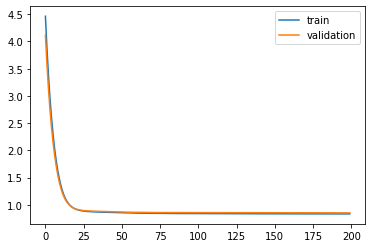

Time to train LSTM:  182.34005737304688
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 22s - loss: 4.3084 - pdc_loss: 0.7219 - event_loss: 0.7131 - val_loss: 3.9739 - val_pdc_loss: 0.7126 - val_event_loss: 0.6543

Epoch 00001: val_loss improved from inf to 3.97387, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 3.7338 - pdc_loss: 0.7004 - event_loss: 0.6225 - val_loss: 3.4538 - val_pdc_loss: 0.6941 - val_event_loss: 0.5825

Epoch 00002: val_loss improved from 3.97387 to 3.45380, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 3.2509 - pdc_loss: 0.6843 - event_loss: 0.5597 - val_loss: 3.0173 - val_pdc_loss: 0.6808 - val_event_loss: 0.5314

Epoch 00003: val_loss improved from 3.45380 to 3.01728, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 2.8443 - pdc_loss: 0.6722 - event_loss: 0.5125 - val_loss: 2.6503 - val_pdc_loss: 0.6707 - val_event_loss: 0.4917

Epoch 00004: val_loss improved from 3.01728 to 2.65026, saving


Epoch 00035: val_loss improved from 0.88447 to 0.88350, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 0.8605 - pdc_loss: 0.5320 - event_loss: 0.3156 - val_loss: 0.8824 - val_pdc_loss: 0.5472 - val_event_loss: 0.3224

Epoch 00036: val_loss improved from 0.88350 to 0.88240, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 0.8593 - pdc_loss: 0.5311 - event_loss: 0.3155 - val_loss: 0.8816 - val_pdc_loss: 0.5466 - val_event_loss: 0.3223

Epoch 00037: val_loss improved from 0.88240 to 0.88157, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 0.8582 - pdc_loss: 0.5302 - event_loss: 0.3153 - val_loss: 0.8806 - val_pdc_loss: 0.5458 - val_event_loss: 0.3223

Epoch 00038: val_loss improved from 0.88157 to 0.88059, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 0.8571 - pdc_loss: 0.5294 - event_loss: 0.3152 - val_loss: 0.8799 - val_pdc_loss: 0.5452 - val_event_loss: 0.3222

Epoch 00039: val_loss improved from 0.88059 to 


Epoch 00070: val_loss improved from 0.86926 to 0.86886, saving model to Event_val_weights3.hdf5
Epoch 71/200
 - 1s - loss: 0.8415 - pdc_loss: 0.5182 - event_loss: 0.3141 - val_loss: 0.8687 - val_pdc_loss: 0.5375 - val_event_loss: 0.3221

Epoch 00071: val_loss improved from 0.86886 to 0.86868, saving model to Event_val_weights3.hdf5
Epoch 72/200
 - 1s - loss: 0.8412 - pdc_loss: 0.5180 - event_loss: 0.3142 - val_loss: 0.8684 - val_pdc_loss: 0.5373 - val_event_loss: 0.3221

Epoch 00072: val_loss improved from 0.86868 to 0.86838, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.8409 - pdc_loss: 0.5178 - event_loss: 0.3141 - val_loss: 0.8681 - val_pdc_loss: 0.5371 - val_event_loss: 0.3221

Epoch 00073: val_loss improved from 0.86838 to 0.86815, saving model to Event_val_weights3.hdf5
Epoch 74/200
 - 1s - loss: 0.8406 - pdc_loss: 0.5175 - event_loss: 0.3142 - val_loss: 0.8678 - val_pdc_loss: 0.5368 - val_event_loss: 0.3221

Epoch 00074: val_loss improved from 0.86815 to 


Epoch 00106: val_loss improved from 0.86417 to 0.86406, saving model to Event_val_weights3.hdf5
Epoch 107/200
 - 1s - loss: 0.8349 - pdc_loss: 0.5136 - event_loss: 0.3135 - val_loss: 0.8640 - val_pdc_loss: 0.5338 - val_event_loss: 0.3223

Epoch 00107: val_loss improved from 0.86406 to 0.86399, saving model to Event_val_weights3.hdf5
Epoch 108/200
 - 1s - loss: 0.8348 - pdc_loss: 0.5134 - event_loss: 0.3135 - val_loss: 0.8640 - val_pdc_loss: 0.5339 - val_event_loss: 0.3223

Epoch 00108: val_loss improved from 0.86399 to 0.86395, saving model to Event_val_weights3.hdf5
Epoch 109/200
 - 1s - loss: 0.8347 - pdc_loss: 0.5134 - event_loss: 0.3135 - val_loss: 0.8640 - val_pdc_loss: 0.5339 - val_event_loss: 0.3223

Epoch 00109: val_loss did not improve from 0.86395
Epoch 110/200
 - 1s - loss: 0.8346 - pdc_loss: 0.5133 - event_loss: 0.3135 - val_loss: 0.8637 - val_pdc_loss: 0.5337 - val_event_loss: 0.3222

Epoch 00110: val_loss improved from 0.86395 to 0.86369, saving model to Event_val_weight


Epoch 00144: val_loss improved from 0.86206 to 0.86203, saving model to Event_val_weights3.hdf5
Epoch 145/200
 - 1s - loss: 0.8317 - pdc_loss: 0.5114 - event_loss: 0.3129 - val_loss: 0.8620 - val_pdc_loss: 0.5325 - val_event_loss: 0.3221

Epoch 00145: val_loss improved from 0.86203 to 0.86198, saving model to Event_val_weights3.hdf5
Epoch 146/200
 - 1s - loss: 0.8317 - pdc_loss: 0.5114 - event_loss: 0.3129 - val_loss: 0.8619 - val_pdc_loss: 0.5326 - val_event_loss: 0.3220

Epoch 00146: val_loss improved from 0.86198 to 0.86193, saving model to Event_val_weights3.hdf5
Epoch 147/200
 - 1s - loss: 0.8316 - pdc_loss: 0.5114 - event_loss: 0.3129 - val_loss: 0.8618 - val_pdc_loss: 0.5324 - val_event_loss: 0.3221

Epoch 00147: val_loss improved from 0.86193 to 0.86181, saving model to Event_val_weights3.hdf5
Epoch 148/200
 - 1s - loss: 0.8315 - pdc_loss: 0.5113 - event_loss: 0.3129 - val_loss: 0.8620 - val_pdc_loss: 0.5326 - val_event_loss: 0.3221

Epoch 00148: val_loss did not improve from 

 - 1s - loss: 0.8298 - pdc_loss: 0.5102 - event_loss: 0.3126 - val_loss: 0.8609 - val_pdc_loss: 0.5318 - val_event_loss: 0.3220

Epoch 00183: val_loss did not improve from 0.86074
Epoch 184/200
 - 1s - loss: 0.8298 - pdc_loss: 0.5102 - event_loss: 0.3126 - val_loss: 0.8607 - val_pdc_loss: 0.5317 - val_event_loss: 0.3220

Epoch 00184: val_loss did not improve from 0.86074
Epoch 185/200
 - 1s - loss: 0.8297 - pdc_loss: 0.5101 - event_loss: 0.3125 - val_loss: 0.8608 - val_pdc_loss: 0.5318 - val_event_loss: 0.3220

Epoch 00185: val_loss did not improve from 0.86074
Epoch 186/200
 - 1s - loss: 0.8297 - pdc_loss: 0.5101 - event_loss: 0.3126 - val_loss: 0.8607 - val_pdc_loss: 0.5317 - val_event_loss: 0.3220

Epoch 00186: val_loss improved from 0.86074 to 0.86065, saving model to Event_val_weights3.hdf5
Epoch 187/200
 - 1s - loss: 0.8297 - pdc_loss: 0.5101 - event_loss: 0.3125 - val_loss: 0.8606 - val_pdc_loss: 0.5317 - val_event_loss: 0.3220

Epoch 00187: val_loss improved from 0.86065 to 0.8

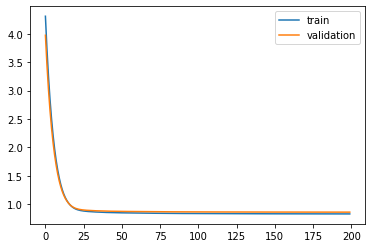

Time to train LSTM:  169.66139698028564
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 25s - loss: 4.4233 - pdc_loss: 0.6984 - event_loss: 0.7102 - val_loss: 4.0898 - val_pdc_loss: 0.6939 - val_event_loss: 0.6594

Epoch 00001: val_loss improved from inf to 4.08976, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 3.8434 - pdc_loss: 0.6861 - event_loss: 0.6257 - val_loss: 3.5575 - val_pdc_loss: 0.6803 - val_event_loss: 0.5895

Epoch 00002: val_loss improved from 4.08976 to 3.55752, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 3.3481 - pdc_loss: 0.6726 - event_loss: 0.5650 - val_loss: 3.1042 - val_pdc_loss: 0.6651 - val_event_loss: 0.5384

Epoch 00003: val_loss improved from 3.55752 to 3.10421, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 2.9244 - pdc_loss: 0.6563 - event_loss: 0.5181 - val_loss: 2.7175 - val_pdc_loss: 0.6483 - val_event_loss: 0.4969

Epoch 00004: val_loss improved from 3.10421 to 2.71753, saving


Epoch 00035: val_loss improved from 0.88527 to 0.88442, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 0.8564 - pdc_loss: 0.5278 - event_loss: 0.3157 - val_loss: 0.8835 - val_pdc_loss: 0.5441 - val_event_loss: 0.3267

Epoch 00036: val_loss improved from 0.88442 to 0.88347, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 0.8552 - pdc_loss: 0.5269 - event_loss: 0.3156 - val_loss: 0.8828 - val_pdc_loss: 0.5436 - val_event_loss: 0.3267

Epoch 00037: val_loss improved from 0.88347 to 0.88284, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 0.8542 - pdc_loss: 0.5261 - event_loss: 0.3156 - val_loss: 0.8820 - val_pdc_loss: 0.5430 - val_event_loss: 0.3267

Epoch 00038: val_loss improved from 0.88284 to 0.88205, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 0.8532 - pdc_loss: 0.5252 - event_loss: 0.3156 - val_loss: 0.8816 - val_pdc_loss: 0.5426 - val_event_loss: 0.3268

Epoch 00039: val_loss improved from 0.88205 to 

 - 1s - loss: 0.8380 - pdc_loss: 0.5145 - event_loss: 0.3143 - val_loss: 0.8712 - val_pdc_loss: 0.5354 - val_event_loss: 0.3265

Epoch 00070: val_loss improved from 0.87123 to 0.87120, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.8378 - pdc_loss: 0.5143 - event_loss: 0.3142 - val_loss: 0.8710 - val_pdc_loss: 0.5353 - val_event_loss: 0.3265

Epoch 00071: val_loss improved from 0.87120 to 0.87097, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.8375 - pdc_loss: 0.5142 - event_loss: 0.3142 - val_loss: 0.8708 - val_pdc_loss: 0.5352 - val_event_loss: 0.3265

Epoch 00072: val_loss improved from 0.87097 to 0.87081, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.8373 - pdc_loss: 0.5140 - event_loss: 0.3142 - val_loss: 0.8707 - val_pdc_loss: 0.5351 - val_event_loss: 0.3265

Epoch 00073: val_loss improved from 0.87081 to 0.87066, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.8371 - pdc_loss: 0.5139 - event_


Epoch 00105: val_loss did not improve from 0.86815
Epoch 106/200
 - 1s - loss: 0.8326 - pdc_loss: 0.5113 - event_loss: 0.3134 - val_loss: 0.8681 - val_pdc_loss: 0.5338 - val_event_loss: 0.3264

Epoch 00106: val_loss improved from 0.86815 to 0.86815, saving model to Event_val_weights4.hdf5
Epoch 107/200
 - 1s - loss: 0.8325 - pdc_loss: 0.5112 - event_loss: 0.3134 - val_loss: 0.8681 - val_pdc_loss: 0.5338 - val_event_loss: 0.3264

Epoch 00107: val_loss improved from 0.86815 to 0.86810, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.8324 - pdc_loss: 0.5111 - event_loss: 0.3134 - val_loss: 0.8681 - val_pdc_loss: 0.5338 - val_event_loss: 0.3264

Epoch 00108: val_loss improved from 0.86810 to 0.86807, saving model to Event_val_weights4.hdf5
Epoch 109/200
 - 1s - loss: 0.8324 - pdc_loss: 0.5111 - event_loss: 0.3134 - val_loss: 0.8680 - val_pdc_loss: 0.5337 - val_event_loss: 0.3264

Epoch 00109: val_loss improved from 0.86807 to 0.86799, saving model to Event_val_weight


Epoch 00141: val_loss did not improve from 0.86685
Epoch 142/200
 - 1s - loss: 0.8303 - pdc_loss: 0.5100 - event_loss: 0.3128 - val_loss: 0.8669 - val_pdc_loss: 0.5333 - val_event_loss: 0.3262

Epoch 00142: val_loss did not improve from 0.86685
Epoch 143/200
 - 1s - loss: 0.8302 - pdc_loss: 0.5100 - event_loss: 0.3128 - val_loss: 0.8668 - val_pdc_loss: 0.5332 - val_event_loss: 0.3262

Epoch 00143: val_loss improved from 0.86685 to 0.86682, saving model to Event_val_weights4.hdf5
Epoch 144/200
 - 1s - loss: 0.8302 - pdc_loss: 0.5100 - event_loss: 0.3128 - val_loss: 0.8668 - val_pdc_loss: 0.5332 - val_event_loss: 0.3262

Epoch 00144: val_loss improved from 0.86682 to 0.86682, saving model to Event_val_weights4.hdf5
Epoch 145/200
 - 1s - loss: 0.8301 - pdc_loss: 0.5100 - event_loss: 0.3128 - val_loss: 0.8668 - val_pdc_loss: 0.5332 - val_event_loss: 0.3262

Epoch 00145: val_loss improved from 0.86682 to 0.86676, saving model to Event_val_weights4.hdf5
Epoch 146/200
 - 1s - loss: 0.8300 - 

 - 1s - loss: 0.8288 - pdc_loss: 0.5094 - event_loss: 0.3123 - val_loss: 0.8674 - val_pdc_loss: 0.5342 - val_event_loss: 0.3262

Epoch 00182: val_loss did not improve from 0.86666
Epoch 183/200
 - 1s - loss: 0.8288 - pdc_loss: 0.5094 - event_loss: 0.3124 - val_loss: 0.8676 - val_pdc_loss: 0.5343 - val_event_loss: 0.3262

Epoch 00183: val_loss did not improve from 0.86666
Epoch 184/200
 - 1s - loss: 0.8287 - pdc_loss: 0.5094 - event_loss: 0.3123 - val_loss: 0.8676 - val_pdc_loss: 0.5343 - val_event_loss: 0.3262

Epoch 00184: val_loss did not improve from 0.86666
Epoch 185/200
 - 1s - loss: 0.8287 - pdc_loss: 0.5094 - event_loss: 0.3123 - val_loss: 0.8677 - val_pdc_loss: 0.5344 - val_event_loss: 0.3262

Epoch 00185: val_loss did not improve from 0.86666
Epoch 186/200
 - 1s - loss: 0.8287 - pdc_loss: 0.5093 - event_loss: 0.3123 - val_loss: 0.8677 - val_pdc_loss: 0.5345 - val_event_loss: 0.3262

Epoch 00186: val_loss did not improve from 0.86666
Epoch 187/200
 - 1s - loss: 0.8287 - pdc_los

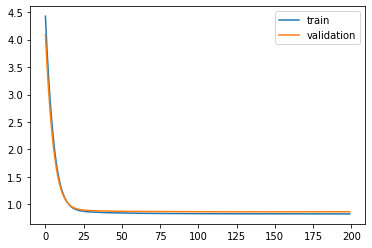

Time to train LSTM:  176.60198187828064
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 24s - loss: 4.2760 - pdc_loss: 0.7058 - event_loss: 0.6630 - val_loss: 3.9580 - val_pdc_loss: 0.7005 - val_event_loss: 0.6255

Epoch 00001: val_loss improved from inf to 3.95802, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 3.7247 - pdc_loss: 0.6921 - event_loss: 0.6022 - val_loss: 3.4499 - val_pdc_loss: 0.6885 - val_event_loss: 0.5708

Epoch 00002: val_loss improved from 3.95802 to 3.44991, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 3.2503 - pdc_loss: 0.6807 - event_loss: 0.5530 - val_loss: 3.0145 - val_pdc_loss: 0.6779 - val_event_loss: 0.5260

Epoch 00003: val_loss improved from 3.44991 to 3.01451, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 2.8445 - pdc_loss: 0.6699 - event_loss: 0.5118 - val_loss: 2.6433 - val_pdc_loss: 0.6672 - val_event_loss: 0.4878

Epoch 00004: val_loss improved from 3.01451 to 2.64333, saving


Epoch 00035: val_loss improved from 0.86708 to 0.86597, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 0.8629 - pdc_loss: 0.5336 - event_loss: 0.3166 - val_loss: 0.8650 - val_pdc_loss: 0.5352 - val_event_loss: 0.3171

Epoch 00036: val_loss improved from 0.86597 to 0.86497, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 0.8618 - pdc_loss: 0.5327 - event_loss: 0.3165 - val_loss: 0.8640 - val_pdc_loss: 0.5344 - val_event_loss: 0.3171

Epoch 00037: val_loss improved from 0.86497 to 0.86398, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 0.8607 - pdc_loss: 0.5318 - event_loss: 0.3164 - val_loss: 0.8630 - val_pdc_loss: 0.5336 - val_event_loss: 0.3170

Epoch 00038: val_loss improved from 0.86398 to 0.86298, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 0.8597 - pdc_loss: 0.5309 - event_loss: 0.3164 - val_loss: 0.8620 - val_pdc_loss: 0.5327 - val_event_loss: 0.3170

Epoch 00039: val_loss improved from 0.86298 to 

 - 1s - loss: 0.8411 - pdc_loss: 0.5174 - event_loss: 0.3148 - val_loss: 0.8458 - val_pdc_loss: 0.5207 - val_event_loss: 0.3161

Epoch 00070: val_loss improved from 0.84597 to 0.84579, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.8409 - pdc_loss: 0.5173 - event_loss: 0.3147 - val_loss: 0.8457 - val_pdc_loss: 0.5207 - val_event_loss: 0.3161

Epoch 00071: val_loss improved from 0.84579 to 0.84569, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8407 - pdc_loss: 0.5171 - event_loss: 0.3147 - val_loss: 0.8455 - val_pdc_loss: 0.5206 - val_event_loss: 0.3161

Epoch 00072: val_loss improved from 0.84569 to 0.84555, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8405 - pdc_loss: 0.5170 - event_loss: 0.3147 - val_loss: 0.8455 - val_pdc_loss: 0.5206 - val_event_loss: 0.3161

Epoch 00073: val_loss improved from 0.84555 to 0.84549, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8403 - pdc_loss: 0.5168 - event_


Epoch 00106: val_loss improved from 0.84322 to 0.84313, saving model to Event_val_weights5.hdf5
Epoch 107/200
 - 1s - loss: 0.8359 - pdc_loss: 0.5141 - event_loss: 0.3139 - val_loss: 0.8431 - val_pdc_loss: 0.5190 - val_event_loss: 0.3162

Epoch 00107: val_loss improved from 0.84313 to 0.84309, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.8359 - pdc_loss: 0.5141 - event_loss: 0.3139 - val_loss: 0.8430 - val_pdc_loss: 0.5189 - val_event_loss: 0.3162

Epoch 00108: val_loss improved from 0.84309 to 0.84297, saving model to Event_val_weights5.hdf5
Epoch 109/200
 - 1s - loss: 0.8357 - pdc_loss: 0.5139 - event_loss: 0.3138 - val_loss: 0.8430 - val_pdc_loss: 0.5190 - val_event_loss: 0.3161

Epoch 00109: val_loss did not improve from 0.84297
Epoch 110/200
 - 1s - loss: 0.8356 - pdc_loss: 0.5139 - event_loss: 0.3139 - val_loss: 0.8429 - val_pdc_loss: 0.5188 - val_event_loss: 0.3162

Epoch 00110: val_loss improved from 0.84297 to 0.84288, saving model to Event_val_weight

 - 1s - loss: 0.8331 - pdc_loss: 0.5124 - event_loss: 0.3134 - val_loss: 0.8409 - val_pdc_loss: 0.5176 - val_event_loss: 0.3161

Epoch 00144: val_loss improved from 0.84106 to 0.84090, saving model to Event_val_weights5.hdf5
Epoch 145/200
 - 1s - loss: 0.8332 - pdc_loss: 0.5125 - event_loss: 0.3134 - val_loss: 0.8413 - val_pdc_loss: 0.5179 - val_event_loss: 0.3162

Epoch 00145: val_loss did not improve from 0.84090
Epoch 146/200
 - 1s - loss: 0.8330 - pdc_loss: 0.5124 - event_loss: 0.3134 - val_loss: 0.8408 - val_pdc_loss: 0.5175 - val_event_loss: 0.3161

Epoch 00146: val_loss improved from 0.84090 to 0.84079, saving model to Event_val_weights5.hdf5
Epoch 147/200
 - 1s - loss: 0.8330 - pdc_loss: 0.5124 - event_loss: 0.3134 - val_loss: 0.8410 - val_pdc_loss: 0.5177 - val_event_loss: 0.3161

Epoch 00147: val_loss did not improve from 0.84079
Epoch 148/200
 - 1s - loss: 0.8329 - pdc_loss: 0.5123 - event_loss: 0.3134 - val_loss: 0.8407 - val_pdc_loss: 0.5175 - val_event_loss: 0.3161

Epoch

 - 1s - loss: 0.8313 - pdc_loss: 0.5114 - event_loss: 0.3131 - val_loss: 0.8400 - val_pdc_loss: 0.5172 - val_event_loss: 0.3160

Epoch 00183: val_loss did not improve from 0.83999
Epoch 184/200
 - 1s - loss: 0.8313 - pdc_loss: 0.5114 - event_loss: 0.3131 - val_loss: 0.8400 - val_pdc_loss: 0.5172 - val_event_loss: 0.3160

Epoch 00184: val_loss improved from 0.83999 to 0.83998, saving model to Event_val_weights5.hdf5
Epoch 185/200
 - 1s - loss: 0.8313 - pdc_loss: 0.5114 - event_loss: 0.3131 - val_loss: 0.8402 - val_pdc_loss: 0.5173 - val_event_loss: 0.3161

Epoch 00185: val_loss did not improve from 0.83998
Epoch 186/200
 - 1s - loss: 0.8312 - pdc_loss: 0.5113 - event_loss: 0.3131 - val_loss: 0.8399 - val_pdc_loss: 0.5172 - val_event_loss: 0.3160

Epoch 00186: val_loss improved from 0.83998 to 0.83988, saving model to Event_val_weights5.hdf5
Epoch 187/200
 - 1s - loss: 0.8311 - pdc_loss: 0.5113 - event_loss: 0.3131 - val_loss: 0.8401 - val_pdc_loss: 0.5173 - val_event_loss: 0.3160

Epoch

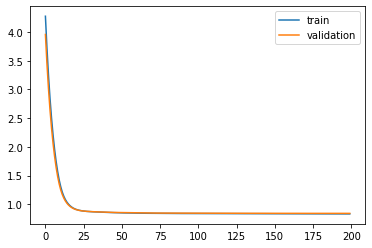

Time to train LSTM:  174.39426946640015
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 27s - loss: 7.4328 - pdc_loss: 0.7187 - event_loss: 0.7446 - val_loss: 6.8060 - val_pdc_loss: 0.7066 - val_event_loss: 0.6992

Epoch 00001: val_loss improved from inf to 6.80602, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 6.3513 - pdc_loss: 0.6990 - event_loss: 0.6705 - val_loss: 5.8087 - val_pdc_loss: 0.6885 - val_event_loss: 0.6361

Epoch 00002: val_loss improved from 6.80602 to 5.80872, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 5.4203 - pdc_loss: 0.6815 - event_loss: 0.6155 - val_loss: 4.9560 - val_pdc_loss: 0.6725 - val_event_loss: 0.5869

Epoch 00003: val_loss improved from 5.80872 to 4.95603, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 4.6266 - pdc_loss: 0.6659 - event_loss: 0.5701 - val_loss: 4.2323 - val_pdc_loss: 0.6584 - val_event_loss: 0.5437

Epoch 00004: val_loss improved from 4.95603 to 4.23231, saving


Epoch 00035: val_loss improved from 0.86967 to 0.86842, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 0.8704 - pdc_loss: 0.5388 - event_loss: 0.3186 - val_loss: 0.8673 - val_pdc_loss: 0.5405 - val_event_loss: 0.3137

Epoch 00036: val_loss improved from 0.86842 to 0.86727, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 0.8692 - pdc_loss: 0.5378 - event_loss: 0.3184 - val_loss: 0.8661 - val_pdc_loss: 0.5395 - val_event_loss: 0.3136

Epoch 00037: val_loss improved from 0.86727 to 0.86609, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 0.8679 - pdc_loss: 0.5367 - event_loss: 0.3183 - val_loss: 0.8649 - val_pdc_loss: 0.5384 - val_event_loss: 0.3135

Epoch 00038: val_loss improved from 0.86609 to 0.86492, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 0.8668 - pdc_loss: 0.5357 - event_loss: 0.3182 - val_loss: 0.8637 - val_pdc_loss: 0.5373 - val_event_loss: 0.3134

Epoch 00039: val_loss improved from 0.86492 to 


Epoch 00071: val_loss improved from 0.84553 to 0.84543, saving model to Event_val_weights1.hdf5
Epoch 72/200
 - 1s - loss: 0.8468 - pdc_loss: 0.5202 - event_loss: 0.3165 - val_loss: 0.8449 - val_pdc_loss: 0.5223 - val_event_loss: 0.3126

Epoch 00072: val_loss improved from 0.84543 to 0.84489, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.8465 - pdc_loss: 0.5200 - event_loss: 0.3165 - val_loss: 0.8452 - val_pdc_loss: 0.5226 - val_event_loss: 0.3126

Epoch 00073: val_loss did not improve from 0.84489
Epoch 74/200
 - 1s - loss: 0.8463 - pdc_loss: 0.5199 - event_loss: 0.3164 - val_loss: 0.8443 - val_pdc_loss: 0.5220 - val_event_loss: 0.3125

Epoch 00074: val_loss improved from 0.84489 to 0.84434, saving model to Event_val_weights1.hdf5
Epoch 75/200
 - 1s - loss: 0.8460 - pdc_loss: 0.5197 - event_loss: 0.3164 - val_loss: 0.8445 - val_pdc_loss: 0.5222 - val_event_loss: 0.3125

Epoch 00075: val_loss did not improve from 0.84434
Epoch 76/200
 - 1s - loss: 0.8458 - pdc_l


Epoch 00109: val_loss did not improve from 0.83913
Epoch 110/200
 - 1s - loss: 0.8408 - pdc_loss: 0.5167 - event_loss: 0.3156 - val_loss: 0.8390 - val_pdc_loss: 0.5189 - val_event_loss: 0.3116

Epoch 00110: val_loss improved from 0.83913 to 0.83898, saving model to Event_val_weights1.hdf5
Epoch 111/200
 - 1s - loss: 0.8407 - pdc_loss: 0.5167 - event_loss: 0.3156 - val_loss: 0.8391 - val_pdc_loss: 0.5190 - val_event_loss: 0.3117

Epoch 00111: val_loss did not improve from 0.83898
Epoch 112/200
 - 1s - loss: 0.8406 - pdc_loss: 0.5166 - event_loss: 0.3156 - val_loss: 0.8388 - val_pdc_loss: 0.5186 - val_event_loss: 0.3118

Epoch 00112: val_loss improved from 0.83898 to 0.83884, saving model to Event_val_weights1.hdf5
Epoch 113/200
 - 1s - loss: 0.8405 - pdc_loss: 0.5165 - event_loss: 0.3156 - val_loss: 0.8387 - val_pdc_loss: 0.5189 - val_event_loss: 0.3115

Epoch 00113: val_loss improved from 0.83884 to 0.83871, saving model to Event_val_weights1.hdf5
Epoch 114/200
 - 1s - loss: 0.8404 - 


Epoch 00147: val_loss did not improve from 0.83690
Epoch 148/200
 - 1s - loss: 0.8381 - pdc_loss: 0.5154 - event_loss: 0.3151 - val_loss: 0.8371 - val_pdc_loss: 0.5180 - val_event_loss: 0.3115

Epoch 00148: val_loss did not improve from 0.83690
Epoch 149/200
 - 1s - loss: 0.8381 - pdc_loss: 0.5154 - event_loss: 0.3151 - val_loss: 0.8370 - val_pdc_loss: 0.5182 - val_event_loss: 0.3112

Epoch 00149: val_loss did not improve from 0.83690
Epoch 150/200
 - 1s - loss: 0.8380 - pdc_loss: 0.5153 - event_loss: 0.3151 - val_loss: 0.8368 - val_pdc_loss: 0.5178 - val_event_loss: 0.3114

Epoch 00150: val_loss improved from 0.83690 to 0.83681, saving model to Event_val_weights1.hdf5
Epoch 151/200
 - 1s - loss: 0.8380 - pdc_loss: 0.5153 - event_loss: 0.3151 - val_loss: 0.8369 - val_pdc_loss: 0.5181 - val_event_loss: 0.3111

Epoch 00151: val_loss did not improve from 0.83681
Epoch 152/200
 - 1s - loss: 0.8380 - pdc_loss: 0.5153 - event_loss: 0.3151 - val_loss: 0.8368 - val_pdc_loss: 0.5177 - val_even


Epoch 00186: val_loss did not improve from 0.83574
Epoch 187/200
 - 1s - loss: 0.8365 - pdc_loss: 0.5146 - event_loss: 0.3148 - val_loss: 0.8360 - val_pdc_loss: 0.5176 - val_event_loss: 0.3112

Epoch 00187: val_loss did not improve from 0.83574
Epoch 188/200
 - 1s - loss: 0.8365 - pdc_loss: 0.5146 - event_loss: 0.3148 - val_loss: 0.8358 - val_pdc_loss: 0.5174 - val_event_loss: 0.3112

Epoch 00188: val_loss did not improve from 0.83574
Epoch 189/200
 - 1s - loss: 0.8365 - pdc_loss: 0.5146 - event_loss: 0.3147 - val_loss: 0.8357 - val_pdc_loss: 0.5175 - val_event_loss: 0.3111

Epoch 00189: val_loss improved from 0.83574 to 0.83570, saving model to Event_val_weights1.hdf5
Epoch 190/200
 - 1s - loss: 0.8365 - pdc_loss: 0.5146 - event_loss: 0.3147 - val_loss: 0.8358 - val_pdc_loss: 0.5174 - val_event_loss: 0.3113

Epoch 00190: val_loss did not improve from 0.83570
Epoch 191/200
 - 1s - loss: 0.8364 - pdc_loss: 0.5146 - event_loss: 0.3147 - val_loss: 0.8359 - val_pdc_loss: 0.5175 - val_even

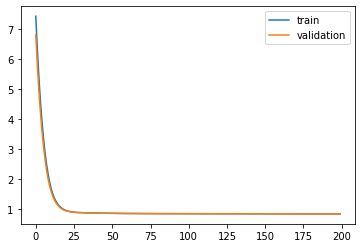

Time to train LSTM:  177.43621516227722
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 29s - loss: 7.4367 - pdc_loss: 0.6801 - event_loss: 0.7335 - val_loss: 6.8110 - val_pdc_loss: 0.6694 - val_event_loss: 0.6997

Epoch 00001: val_loss improved from inf to 6.81097, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 6.3629 - pdc_loss: 0.6661 - event_loss: 0.6798 - val_loss: 5.8195 - val_pdc_loss: 0.6558 - val_event_loss: 0.6508

Epoch 00002: val_loss improved from 6.81097 to 5.81955, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 5.4333 - pdc_loss: 0.6523 - event_loss: 0.6319 - val_loss: 4.9685 - val_pdc_loss: 0.6427 - val_event_loss: 0.6061

Epoch 00003: val_loss improved from 5.81955 to 4.96853, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 4.6379 - pdc_loss: 0.6389 - event_loss: 0.5864 - val_loss: 4.2442 - val_pdc_loss: 0.6303 - val_event_loss: 0.5624

Epoch 00004: val_loss improved from 4.96853 to 4.24416, saving


Epoch 00035: val_loss improved from 0.87846 to 0.87727, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 0.8653 - pdc_loss: 0.5360 - event_loss: 0.3166 - val_loss: 0.8761 - val_pdc_loss: 0.5409 - val_event_loss: 0.3226

Epoch 00036: val_loss improved from 0.87727 to 0.87615, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 0.8640 - pdc_loss: 0.5349 - event_loss: 0.3166 - val_loss: 0.8749 - val_pdc_loss: 0.5399 - val_event_loss: 0.3225

Epoch 00037: val_loss improved from 0.87615 to 0.87494, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 0.8628 - pdc_loss: 0.5338 - event_loss: 0.3165 - val_loss: 0.8738 - val_pdc_loss: 0.5388 - val_event_loss: 0.3225

Epoch 00038: val_loss improved from 0.87494 to 0.87382, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 0.8615 - pdc_loss: 0.5326 - event_loss: 0.3165 - val_loss: 0.8727 - val_pdc_loss: 0.5378 - val_event_loss: 0.3225

Epoch 00039: val_loss improved from 0.87382 to 


Epoch 00070: val_loss improved from 0.86051 to 0.86038, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.8445 - pdc_loss: 0.5196 - event_loss: 0.3151 - val_loss: 0.8602 - val_pdc_loss: 0.5287 - val_event_loss: 0.3217

Epoch 00071: val_loss improved from 0.86038 to 0.86017, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.8442 - pdc_loss: 0.5195 - event_loss: 0.3150 - val_loss: 0.8601 - val_pdc_loss: 0.5286 - val_event_loss: 0.3218

Epoch 00072: val_loss improved from 0.86017 to 0.86012, saving model to Event_val_weights2.hdf5
Epoch 73/200
 - 1s - loss: 0.8440 - pdc_loss: 0.5193 - event_loss: 0.3151 - val_loss: 0.8598 - val_pdc_loss: 0.5284 - val_event_loss: 0.3217

Epoch 00073: val_loss improved from 0.86012 to 0.85979, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.8437 - pdc_loss: 0.5191 - event_loss: 0.3150 - val_loss: 0.8597 - val_pdc_loss: 0.5282 - val_event_loss: 0.3218

Epoch 00074: val_loss improved from 0.85979 to 

 - 1s - loss: 0.8385 - pdc_loss: 0.5153 - event_loss: 0.3143 - val_loss: 0.8559 - val_pdc_loss: 0.5255 - val_event_loss: 0.3215

Epoch 00107: val_loss did not improve from 0.85582
Epoch 108/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5153 - event_loss: 0.3143 - val_loss: 0.8557 - val_pdc_loss: 0.5255 - val_event_loss: 0.3213

Epoch 00108: val_loss improved from 0.85582 to 0.85570, saving model to Event_val_weights2.hdf5
Epoch 109/200
 - 1s - loss: 0.8383 - pdc_loss: 0.5152 - event_loss: 0.3142 - val_loss: 0.8557 - val_pdc_loss: 0.5254 - val_event_loss: 0.3215

Epoch 00109: val_loss did not improve from 0.85570
Epoch 110/200
 - 1s - loss: 0.8383 - pdc_loss: 0.5152 - event_loss: 0.3142 - val_loss: 0.8552 - val_pdc_loss: 0.5252 - val_event_loss: 0.3212

Epoch 00110: val_loss improved from 0.85570 to 0.85523, saving model to Event_val_weights2.hdf5
Epoch 111/200
 - 1s - loss: 0.8380 - pdc_loss: 0.5151 - event_loss: 0.3142 - val_loss: 0.8556 - val_pdc_loss: 0.5254 - val_event_loss: 0.3215

Epoch

 - 1s - loss: 0.8353 - pdc_loss: 0.5136 - event_loss: 0.3134 - val_loss: 0.8545 - val_pdc_loss: 0.5251 - val_event_loss: 0.3212

Epoch 00147: val_loss did not improve from 0.85442
Epoch 148/200
 - 1s - loss: 0.8352 - pdc_loss: 0.5135 - event_loss: 0.3134 - val_loss: 0.8547 - val_pdc_loss: 0.5251 - val_event_loss: 0.3214

Epoch 00148: val_loss did not improve from 0.85442
Epoch 149/200
 - 1s - loss: 0.8351 - pdc_loss: 0.5135 - event_loss: 0.3134 - val_loss: 0.8547 - val_pdc_loss: 0.5251 - val_event_loss: 0.3214

Epoch 00149: val_loss did not improve from 0.85442
Epoch 150/200
 - 1s - loss: 0.8351 - pdc_loss: 0.5135 - event_loss: 0.3134 - val_loss: 0.8546 - val_pdc_loss: 0.5251 - val_event_loss: 0.3213

Epoch 00150: val_loss did not improve from 0.85442
Epoch 151/200
 - 1s - loss: 0.8350 - pdc_loss: 0.5135 - event_loss: 0.3134 - val_loss: 0.8545 - val_pdc_loss: 0.5251 - val_event_loss: 0.3212

Epoch 00151: val_loss did not improve from 0.85442
Epoch 152/200
 - 1s - loss: 0.8350 - pdc_los

 - 1s - loss: 0.8334 - pdc_loss: 0.5127 - event_loss: 0.3129 - val_loss: 0.8536 - val_pdc_loss: 0.5245 - val_event_loss: 0.3214

Epoch 00188: val_loss improved from 0.85373 to 0.85361, saving model to Event_val_weights2.hdf5
Epoch 189/200
 - 1s - loss: 0.8334 - pdc_loss: 0.5127 - event_loss: 0.3129 - val_loss: 0.8539 - val_pdc_loss: 0.5247 - val_event_loss: 0.3214

Epoch 00189: val_loss did not improve from 0.85361
Epoch 190/200
 - 1s - loss: 0.8334 - pdc_loss: 0.5127 - event_loss: 0.3129 - val_loss: 0.8535 - val_pdc_loss: 0.5245 - val_event_loss: 0.3211

Epoch 00190: val_loss improved from 0.85361 to 0.85345, saving model to Event_val_weights2.hdf5
Epoch 191/200
 - 1s - loss: 0.8333 - pdc_loss: 0.5126 - event_loss: 0.3129 - val_loss: 0.8536 - val_pdc_loss: 0.5248 - val_event_loss: 0.3211

Epoch 00191: val_loss did not improve from 0.85345
Epoch 192/200
 - 1s - loss: 0.8333 - pdc_loss: 0.5126 - event_loss: 0.3129 - val_loss: 0.8532 - val_pdc_loss: 0.5244 - val_event_loss: 0.3211

Epoch

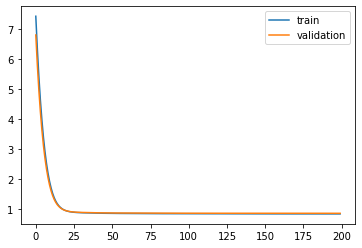

Time to train LSTM:  177.83073687553406
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 26s - loss: 7.5008 - pdc_loss: 0.7206 - event_loss: 0.7234 - val_loss: 6.8789 - val_pdc_loss: 0.7109 - val_event_loss: 0.6926

Epoch 00001: val_loss improved from inf to 6.87889, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 6.4206 - pdc_loss: 0.6937 - event_loss: 0.6767 - val_loss: 5.8828 - val_pdc_loss: 0.6876 - val_event_loss: 0.6500

Epoch 00002: val_loss improved from 6.87889 to 5.88278, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 5.4871 - pdc_loss: 0.6715 - event_loss: 0.6359 - val_loss: 5.0287 - val_pdc_loss: 0.6688 - val_event_loss: 0.6119

Epoch 00003: val_loss improved from 5.88278 to 5.02865, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 4.6898 - pdc_loss: 0.6535 - event_loss: 0.5978 - val_loss: 4.3023 - val_pdc_loss: 0.6536 - val_event_loss: 0.5744

Epoch 00004: val_loss improved from 5.02865 to 4.30231, saving


Epoch 00035: val_loss improved from 0.88882 to 0.88789, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 0.8670 - pdc_loss: 0.5363 - event_loss: 0.3170 - val_loss: 0.8871 - val_pdc_loss: 0.5507 - val_event_loss: 0.3229

Epoch 00036: val_loss improved from 0.88789 to 0.88706, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 0.8660 - pdc_loss: 0.5356 - event_loss: 0.3170 - val_loss: 0.8863 - val_pdc_loss: 0.5501 - val_event_loss: 0.3228

Epoch 00037: val_loss improved from 0.88706 to 0.88627, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 0.8651 - pdc_loss: 0.5349 - event_loss: 0.3169 - val_loss: 0.8855 - val_pdc_loss: 0.5495 - val_event_loss: 0.3228

Epoch 00038: val_loss improved from 0.88627 to 0.88549, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 0.8642 - pdc_loss: 0.5342 - event_loss: 0.3169 - val_loss: 0.8848 - val_pdc_loss: 0.5489 - val_event_loss: 0.3228

Epoch 00039: val_loss improved from 0.88549 to 

 - 1s - loss: 0.8448 - pdc_loss: 0.5191 - event_loss: 0.3155 - val_loss: 0.8700 - val_pdc_loss: 0.5371 - val_event_loss: 0.3228

Epoch 00070: val_loss improved from 0.87021 to 0.87003, saving model to Event_val_weights3.hdf5
Epoch 71/200
 - 1s - loss: 0.8446 - pdc_loss: 0.5189 - event_loss: 0.3155 - val_loss: 0.8698 - val_pdc_loss: 0.5369 - val_event_loss: 0.3228

Epoch 00071: val_loss improved from 0.87003 to 0.86977, saving model to Event_val_weights3.hdf5
Epoch 72/200
 - 1s - loss: 0.8442 - pdc_loss: 0.5187 - event_loss: 0.3155 - val_loss: 0.8697 - val_pdc_loss: 0.5368 - val_event_loss: 0.3228

Epoch 00072: val_loss improved from 0.86977 to 0.86966, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.8440 - pdc_loss: 0.5185 - event_loss: 0.3154 - val_loss: 0.8695 - val_pdc_loss: 0.5367 - val_event_loss: 0.3228

Epoch 00073: val_loss improved from 0.86966 to 0.86950, saving model to Event_val_weights3.hdf5
Epoch 74/200
 - 1s - loss: 0.8437 - pdc_loss: 0.5184 - event_

 - 1s - loss: 0.8384 - pdc_loss: 0.5149 - event_loss: 0.3147 - val_loss: 0.8659 - val_pdc_loss: 0.5345 - val_event_loss: 0.3226

Epoch 00106: val_loss did not improve from 0.86573
Epoch 107/200
 - 1s - loss: 0.8382 - pdc_loss: 0.5148 - event_loss: 0.3147 - val_loss: 0.8658 - val_pdc_loss: 0.5344 - val_event_loss: 0.3227

Epoch 00107: val_loss did not improve from 0.86573
Epoch 108/200
 - 1s - loss: 0.8382 - pdc_loss: 0.5148 - event_loss: 0.3146 - val_loss: 0.8655 - val_pdc_loss: 0.5342 - val_event_loss: 0.3226

Epoch 00108: val_loss improved from 0.86573 to 0.86546, saving model to Event_val_weights3.hdf5
Epoch 109/200
 - 1s - loss: 0.8380 - pdc_loss: 0.5147 - event_loss: 0.3146 - val_loss: 0.8655 - val_pdc_loss: 0.5342 - val_event_loss: 0.3227

Epoch 00109: val_loss did not improve from 0.86546
Epoch 110/200
 - 1s - loss: 0.8379 - pdc_loss: 0.5147 - event_loss: 0.3146 - val_loss: 0.8655 - val_pdc_loss: 0.5342 - val_event_loss: 0.3226

Epoch 00110: val_loss did not improve from 0.86546


Epoch 00144: val_loss did not improve from 0.86392
Epoch 145/200
 - 1s - loss: 0.8352 - pdc_loss: 0.5133 - event_loss: 0.3139 - val_loss: 0.8639 - val_pdc_loss: 0.5337 - val_event_loss: 0.3222

Epoch 00145: val_loss improved from 0.86392 to 0.86390, saving model to Event_val_weights3.hdf5
Epoch 146/200
 - 1s - loss: 0.8352 - pdc_loss: 0.5133 - event_loss: 0.3139 - val_loss: 0.8637 - val_pdc_loss: 0.5336 - val_event_loss: 0.3221

Epoch 00146: val_loss improved from 0.86390 to 0.86368, saving model to Event_val_weights3.hdf5
Epoch 147/200
 - 1s - loss: 0.8352 - pdc_loss: 0.5133 - event_loss: 0.3139 - val_loss: 0.8639 - val_pdc_loss: 0.5337 - val_event_loss: 0.3222

Epoch 00147: val_loss did not improve from 0.86368
Epoch 148/200
 - 1s - loss: 0.8351 - pdc_loss: 0.5133 - event_loss: 0.3138 - val_loss: 0.8636 - val_pdc_loss: 0.5335 - val_event_loss: 0.3221

Epoch 00148: val_loss improved from 0.86368 to 0.86363, saving model to Event_val_weights3.hdf5
Epoch 149/200
 - 1s - loss: 0.8350 - 

 - 1s - loss: 0.8333 - pdc_loss: 0.5125 - event_loss: 0.3133 - val_loss: 0.8625 - val_pdc_loss: 0.5330 - val_event_loss: 0.3220

Epoch 00183: val_loss did not improve from 0.86231
Epoch 184/200
 - 1s - loss: 0.8333 - pdc_loss: 0.5125 - event_loss: 0.3133 - val_loss: 0.8625 - val_pdc_loss: 0.5331 - val_event_loss: 0.3218

Epoch 00184: val_loss did not improve from 0.86231
Epoch 185/200
 - 1s - loss: 0.8332 - pdc_loss: 0.5125 - event_loss: 0.3133 - val_loss: 0.8623 - val_pdc_loss: 0.5329 - val_event_loss: 0.3218

Epoch 00185: val_loss improved from 0.86231 to 0.86228, saving model to Event_val_weights3.hdf5
Epoch 186/200
 - 1s - loss: 0.8333 - pdc_loss: 0.5125 - event_loss: 0.3133 - val_loss: 0.8621 - val_pdc_loss: 0.5328 - val_event_loss: 0.3218

Epoch 00186: val_loss improved from 0.86228 to 0.86211, saving model to Event_val_weights3.hdf5
Epoch 187/200
 - 1s - loss: 0.8331 - pdc_loss: 0.5124 - event_loss: 0.3133 - val_loss: 0.8623 - val_pdc_loss: 0.5329 - val_event_loss: 0.3219

Epoch

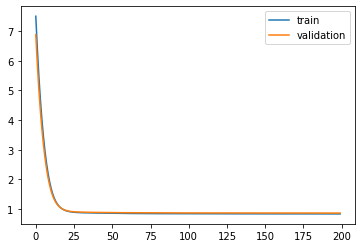

Time to train LSTM:  176.374116897583
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 23s - loss: 7.2074 - pdc_loss: 0.7304 - event_loss: 0.6952 - val_loss: 6.6071 - val_pdc_loss: 0.7200 - val_event_loss: 0.6721

Epoch 00001: val_loss improved from inf to 6.60708, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 6.1688 - pdc_loss: 0.7110 - event_loss: 0.6557 - val_loss: 5.6503 - val_pdc_loss: 0.7024 - val_event_loss: 0.6349

Epoch 00002: val_loss improved from 6.60708 to 5.65030, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 5.2733 - pdc_loss: 0.6941 - event_loss: 0.6182 - val_loss: 4.8315 - val_pdc_loss: 0.6872 - val_event_loss: 0.5980

Epoch 00003: val_loss improved from 5.65030 to 4.83152, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 4.5092 - pdc_loss: 0.6790 - event_loss: 0.5799 - val_loss: 4.1359 - val_pdc_loss: 0.6737 - val_event_loss: 0.5596

Epoch 00004: val_loss improved from 4.83152 to 4.13593, saving m


Epoch 00035: val_loss improved from 0.89086 to 0.88984, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 0.8632 - pdc_loss: 0.5329 - event_loss: 0.3170 - val_loss: 0.8888 - val_pdc_loss: 0.5478 - val_event_loss: 0.3278

Epoch 00036: val_loss improved from 0.88984 to 0.88879, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 0.8622 - pdc_loss: 0.5321 - event_loss: 0.3169 - val_loss: 0.8879 - val_pdc_loss: 0.5471 - val_event_loss: 0.3277

Epoch 00037: val_loss improved from 0.88879 to 0.88791, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 0.8612 - pdc_loss: 0.5313 - event_loss: 0.3168 - val_loss: 0.8871 - val_pdc_loss: 0.5465 - val_event_loss: 0.3277

Epoch 00038: val_loss improved from 0.88791 to 0.88709, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 0.8603 - pdc_loss: 0.5306 - event_loss: 0.3168 - val_loss: 0.8865 - val_pdc_loss: 0.5460 - val_event_loss: 0.3276

Epoch 00039: val_loss improved from 0.88709 to 

 - 1s - loss: 0.8457 - pdc_loss: 0.5193 - event_loss: 0.3162 - val_loss: 0.8784 - val_pdc_loss: 0.5412 - val_event_loss: 0.3271

Epoch 00070: val_loss improved from 0.87872 to 0.87842, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.8455 - pdc_loss: 0.5192 - event_loss: 0.3161 - val_loss: 0.8783 - val_pdc_loss: 0.5411 - val_event_loss: 0.3270

Epoch 00071: val_loss improved from 0.87842 to 0.87829, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.8452 - pdc_loss: 0.5190 - event_loss: 0.3161 - val_loss: 0.8781 - val_pdc_loss: 0.5410 - val_event_loss: 0.3271

Epoch 00072: val_loss improved from 0.87829 to 0.87814, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.8449 - pdc_loss: 0.5188 - event_loss: 0.3161 - val_loss: 0.8779 - val_pdc_loss: 0.5410 - val_event_loss: 0.3270

Epoch 00073: val_loss improved from 0.87814 to 0.87793, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.8447 - pdc_loss: 0.5187 - event_


Epoch 00106: val_loss did not improve from 0.87342
Epoch 107/200
 - 1s - loss: 0.8395 - pdc_loss: 0.5155 - event_loss: 0.3154 - val_loss: 0.8732 - val_pdc_loss: 0.5381 - val_event_loss: 0.3265

Epoch 00107: val_loss improved from 0.87342 to 0.87322, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.8394 - pdc_loss: 0.5154 - event_loss: 0.3153 - val_loss: 0.8733 - val_pdc_loss: 0.5382 - val_event_loss: 0.3265

Epoch 00108: val_loss did not improve from 0.87322
Epoch 109/200
 - 1s - loss: 0.8394 - pdc_loss: 0.5154 - event_loss: 0.3153 - val_loss: 0.8731 - val_pdc_loss: 0.5380 - val_event_loss: 0.3265

Epoch 00109: val_loss improved from 0.87322 to 0.87306, saving model to Event_val_weights4.hdf5
Epoch 110/200
 - 1s - loss: 0.8392 - pdc_loss: 0.5153 - event_loss: 0.3153 - val_loss: 0.8730 - val_pdc_loss: 0.5380 - val_event_loss: 0.3265

Epoch 00110: val_loss improved from 0.87306 to 0.87305, saving model to Event_val_weights4.hdf5
Epoch 111/200
 - 1s - loss: 0.8392 - 

 - 1s - loss: 0.8367 - pdc_loss: 0.5140 - event_loss: 0.3146 - val_loss: 0.8719 - val_pdc_loss: 0.5376 - val_event_loss: 0.3262

Epoch 00144: val_loss did not improve from 0.87180
Epoch 145/200
 - 1s - loss: 0.8367 - pdc_loss: 0.5140 - event_loss: 0.3146 - val_loss: 0.8719 - val_pdc_loss: 0.5376 - val_event_loss: 0.3262

Epoch 00145: val_loss did not improve from 0.87180
Epoch 146/200
 - 1s - loss: 0.8366 - pdc_loss: 0.5140 - event_loss: 0.3145 - val_loss: 0.8720 - val_pdc_loss: 0.5377 - val_event_loss: 0.3263

Epoch 00146: val_loss did not improve from 0.87180
Epoch 147/200
 - 1s - loss: 0.8366 - pdc_loss: 0.5140 - event_loss: 0.3145 - val_loss: 0.8719 - val_pdc_loss: 0.5376 - val_event_loss: 0.3262

Epoch 00147: val_loss did not improve from 0.87180
Epoch 148/200
 - 1s - loss: 0.8365 - pdc_loss: 0.5139 - event_loss: 0.3145 - val_loss: 0.8721 - val_pdc_loss: 0.5378 - val_event_loss: 0.3262

Epoch 00148: val_loss did not improve from 0.87180
Epoch 149/200
 - 1s - loss: 0.8366 - pdc_los


Epoch 00185: val_loss improved from 0.87145 to 0.87136, saving model to Event_val_weights4.hdf5
Epoch 186/200
 - 1s - loss: 0.8347 - pdc_loss: 0.5131 - event_loss: 0.3139 - val_loss: 0.8713 - val_pdc_loss: 0.5375 - val_event_loss: 0.3261

Epoch 00186: val_loss improved from 0.87136 to 0.87131, saving model to Event_val_weights4.hdf5
Epoch 187/200
 - 1s - loss: 0.8347 - pdc_loss: 0.5131 - event_loss: 0.3139 - val_loss: 0.8712 - val_pdc_loss: 0.5374 - val_event_loss: 0.3261

Epoch 00187: val_loss improved from 0.87131 to 0.87124, saving model to Event_val_weights4.hdf5
Epoch 188/200
 - 1s - loss: 0.8346 - pdc_loss: 0.5131 - event_loss: 0.3138 - val_loss: 0.8712 - val_pdc_loss: 0.5374 - val_event_loss: 0.3261

Epoch 00188: val_loss improved from 0.87124 to 0.87118, saving model to Event_val_weights4.hdf5
Epoch 189/200
 - 1s - loss: 0.8346 - pdc_loss: 0.5130 - event_loss: 0.3139 - val_loss: 0.8712 - val_pdc_loss: 0.5373 - val_event_loss: 0.3261

Epoch 00189: val_loss improved from 0.87118

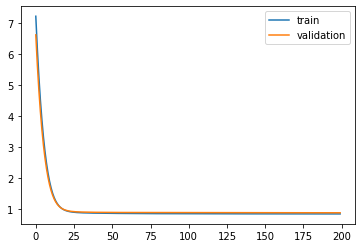

Time to train LSTM:  172.60326743125916
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 23s - loss: 7.2615 - pdc_loss: 0.7090 - event_loss: 0.6794 - val_loss: 6.6492 - val_pdc_loss: 0.7020 - val_event_loss: 0.6445

Epoch 00001: val_loss improved from inf to 6.64917, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 6.2041 - pdc_loss: 0.6936 - event_loss: 0.6244 - val_loss: 5.6751 - val_pdc_loss: 0.6887 - val_event_loss: 0.5946

Epoch 00002: val_loss improved from 6.64917 to 5.67507, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 5.2942 - pdc_loss: 0.6801 - event_loss: 0.5790 - val_loss: 4.8430 - val_pdc_loss: 0.6764 - val_event_loss: 0.5524

Epoch 00003: val_loss improved from 5.67507 to 4.84298, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 4.5199 - pdc_loss: 0.6675 - event_loss: 0.5392 - val_loss: 4.1377 - val_pdc_loss: 0.6643 - val_event_loss: 0.5142

Epoch 00004: val_loss improved from 4.84298 to 4.13766, saving


Epoch 00035: val_loss improved from 0.87269 to 0.87165, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 0.8704 - pdc_loss: 0.5384 - event_loss: 0.3181 - val_loss: 0.8707 - val_pdc_loss: 0.5393 - val_event_loss: 0.3177

Epoch 00036: val_loss improved from 0.87165 to 0.87071, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 0.8695 - pdc_loss: 0.5377 - event_loss: 0.3181 - val_loss: 0.8698 - val_pdc_loss: 0.5385 - val_event_loss: 0.3177

Epoch 00037: val_loss improved from 0.87071 to 0.86980, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 0.8686 - pdc_loss: 0.5371 - event_loss: 0.3180 - val_loss: 0.8690 - val_pdc_loss: 0.5380 - val_event_loss: 0.3175

Epoch 00038: val_loss improved from 0.86980 to 0.86900, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 0.8678 - pdc_loss: 0.5365 - event_loss: 0.3179 - val_loss: 0.8682 - val_pdc_loss: 0.5373 - val_event_loss: 0.3175

Epoch 00039: val_loss improved from 0.86900 to 

 - 1s - loss: 0.8538 - pdc_loss: 0.5263 - event_loss: 0.3168 - val_loss: 0.8559 - val_pdc_loss: 0.5284 - val_event_loss: 0.3167

Epoch 00070: val_loss improved from 0.85611 to 0.85588, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.8537 - pdc_loss: 0.5261 - event_loss: 0.3168 - val_loss: 0.8557 - val_pdc_loss: 0.5282 - val_event_loss: 0.3167

Epoch 00071: val_loss improved from 0.85588 to 0.85566, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8533 - pdc_loss: 0.5259 - event_loss: 0.3168 - val_loss: 0.8555 - val_pdc_loss: 0.5282 - val_event_loss: 0.3167

Epoch 00072: val_loss improved from 0.85566 to 0.85550, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8532 - pdc_loss: 0.5258 - event_loss: 0.3168 - val_loss: 0.8554 - val_pdc_loss: 0.5281 - val_event_loss: 0.3166

Epoch 00073: val_loss improved from 0.85550 to 0.85538, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8528 - pdc_loss: 0.5255 - event_


Epoch 00107: val_loss did not improve from 0.85033
Epoch 108/200
 - 1s - loss: 0.8459 - pdc_loss: 0.5208 - event_loss: 0.3158 - val_loss: 0.8501 - val_pdc_loss: 0.5244 - val_event_loss: 0.3164

Epoch 00108: val_loss improved from 0.85033 to 0.85009, saving model to Event_val_weights5.hdf5
Epoch 109/200
 - 1s - loss: 0.8457 - pdc_loss: 0.5207 - event_loss: 0.3158 - val_loss: 0.8502 - val_pdc_loss: 0.5246 - val_event_loss: 0.3164

Epoch 00109: val_loss did not improve from 0.85009
Epoch 110/200
 - 1s - loss: 0.8456 - pdc_loss: 0.5206 - event_loss: 0.3158 - val_loss: 0.8499 - val_pdc_loss: 0.5244 - val_event_loss: 0.3163

Epoch 00110: val_loss improved from 0.85009 to 0.84990, saving model to Event_val_weights5.hdf5
Epoch 111/200
 - 1s - loss: 0.8455 - pdc_loss: 0.5206 - event_loss: 0.3158 - val_loss: 0.8500 - val_pdc_loss: 0.5244 - val_event_loss: 0.3164

Epoch 00111: val_loss did not improve from 0.84990
Epoch 112/200
 - 1s - loss: 0.8452 - pdc_loss: 0.5203 - event_loss: 0.3158 - val_l


Epoch 00144: val_loss did not improve from 0.84639
Epoch 145/200
 - 1s - loss: 0.8416 - pdc_loss: 0.5176 - event_loss: 0.3156 - val_loss: 0.8463 - val_pdc_loss: 0.5218 - val_event_loss: 0.3160

Epoch 00145: val_loss improved from 0.84639 to 0.84626, saving model to Event_val_weights5.hdf5
Epoch 146/200
 - 1s - loss: 0.8414 - pdc_loss: 0.5175 - event_loss: 0.3155 - val_loss: 0.8463 - val_pdc_loss: 0.5218 - val_event_loss: 0.3161

Epoch 00146: val_loss did not improve from 0.84626
Epoch 147/200
 - 1s - loss: 0.8414 - pdc_loss: 0.5174 - event_loss: 0.3156 - val_loss: 0.8461 - val_pdc_loss: 0.5217 - val_event_loss: 0.3160

Epoch 00147: val_loss improved from 0.84626 to 0.84614, saving model to Event_val_weights5.hdf5
Epoch 148/200
 - 1s - loss: 0.8413 - pdc_loss: 0.5174 - event_loss: 0.3155 - val_loss: 0.8462 - val_pdc_loss: 0.5217 - val_event_loss: 0.3161

Epoch 00148: val_loss did not improve from 0.84614
Epoch 149/200
 - 1s - loss: 0.8411 - pdc_loss: 0.5172 - event_loss: 0.3156 - val_l


Epoch 00181: val_loss did not improve from 0.84391
Epoch 182/200
 - 1s - loss: 0.8386 - pdc_loss: 0.5153 - event_loss: 0.3154 - val_loss: 0.8440 - val_pdc_loss: 0.5202 - val_event_loss: 0.3159

Epoch 00182: val_loss did not improve from 0.84391
Epoch 183/200
 - 1s - loss: 0.8386 - pdc_loss: 0.5153 - event_loss: 0.3154 - val_loss: 0.8438 - val_pdc_loss: 0.5200 - val_event_loss: 0.3160

Epoch 00183: val_loss improved from 0.84391 to 0.84379, saving model to Event_val_weights5.hdf5
Epoch 184/200
 - 1s - loss: 0.8385 - pdc_loss: 0.5152 - event_loss: 0.3154 - val_loss: 0.8436 - val_pdc_loss: 0.5197 - val_event_loss: 0.3161

Epoch 00184: val_loss improved from 0.84379 to 0.84359, saving model to Event_val_weights5.hdf5
Epoch 185/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5152 - event_loss: 0.3155 - val_loss: 0.8436 - val_pdc_loss: 0.5199 - val_event_loss: 0.3159

Epoch 00185: val_loss did not improve from 0.84359
Epoch 186/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5152 - event_loss: 0.3154 - val_l

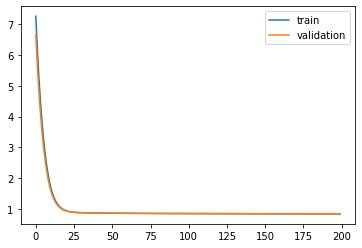

Time to train LSTM:  173.53597235679626
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 24s - loss: 7.0736 - pdc_loss: 0.7341 - event_loss: 0.6804 - val_loss: 6.4815 - val_pdc_loss: 0.7200 - val_event_loss: 0.6487

Epoch 00001: val_loss improved from inf to 6.48146, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 6.0456 - pdc_loss: 0.7035 - event_loss: 0.6280 - val_loss: 5.5353 - val_pdc_loss: 0.6928 - val_event_loss: 0.6018

Epoch 00002: val_loss improved from 6.48146 to 5.53535, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 5.1640 - pdc_loss: 0.6787 - event_loss: 0.5862 - val_loss: 4.7301 - val_pdc_loss: 0.6711 - val_event_loss: 0.5636

Epoch 00003: val_loss improved from 5.53535 to 4.73012, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 4.4164 - pdc_loss: 0.6590 - event_loss: 0.5510 - val_loss: 4.0499 - val_pdc_loss: 0.6538 - val_event_loss: 0.5297

Epoch 00004: val_loss improved from 4.73012 to 4.04986, saving


Epoch 00035: val_loss improved from 0.86170 to 0.86073, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 0.8638 - pdc_loss: 0.5326 - event_loss: 0.3180 - val_loss: 0.8598 - val_pdc_loss: 0.5342 - val_event_loss: 0.3125

Epoch 00036: val_loss improved from 0.86073 to 0.85985, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 0.8630 - pdc_loss: 0.5319 - event_loss: 0.3179 - val_loss: 0.8590 - val_pdc_loss: 0.5336 - val_event_loss: 0.3124

Epoch 00037: val_loss improved from 0.85985 to 0.85902, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 0.8621 - pdc_loss: 0.5313 - event_loss: 0.3179 - val_loss: 0.8582 - val_pdc_loss: 0.5330 - val_event_loss: 0.3123

Epoch 00038: val_loss improved from 0.85902 to 0.85821, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 0.8613 - pdc_loss: 0.5307 - event_loss: 0.3178 - val_loss: 0.8575 - val_pdc_loss: 0.5324 - val_event_loss: 0.3123

Epoch 00039: val_loss improved from 0.85821 to 

 - 1s - loss: 0.8463 - pdc_loss: 0.5194 - event_loss: 0.3170 - val_loss: 0.8429 - val_pdc_loss: 0.5213 - val_event_loss: 0.3118

Epoch 00070: val_loss improved from 0.84316 to 0.84291, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 0.8460 - pdc_loss: 0.5192 - event_loss: 0.3169 - val_loss: 0.8425 - val_pdc_loss: 0.5211 - val_event_loss: 0.3116

Epoch 00071: val_loss improved from 0.84291 to 0.84253, saving model to Event_val_weights1.hdf5
Epoch 72/200
 - 1s - loss: 0.8458 - pdc_loss: 0.5191 - event_loss: 0.3169 - val_loss: 0.8423 - val_pdc_loss: 0.5210 - val_event_loss: 0.3116

Epoch 00072: val_loss improved from 0.84253 to 0.84231, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.8455 - pdc_loss: 0.5190 - event_loss: 0.3169 - val_loss: 0.8421 - val_pdc_loss: 0.5209 - val_event_loss: 0.3116

Epoch 00073: val_loss improved from 0.84231 to 0.84209, saving model to Event_val_weights1.hdf5
Epoch 74/200
 - 1s - loss: 0.8453 - pdc_loss: 0.5189 - event_


Epoch 00106: val_loss improved from 0.83679 to 0.83665, saving model to Event_val_weights1.hdf5
Epoch 107/200
 - 1s - loss: 0.8405 - pdc_loss: 0.5160 - event_loss: 0.3162 - val_loss: 0.8365 - val_pdc_loss: 0.5174 - val_event_loss: 0.3109

Epoch 00107: val_loss improved from 0.83665 to 0.83655, saving model to Event_val_weights1.hdf5
Epoch 108/200
 - 1s - loss: 0.8404 - pdc_loss: 0.5159 - event_loss: 0.3161 - val_loss: 0.8367 - val_pdc_loss: 0.5173 - val_event_loss: 0.3111

Epoch 00108: val_loss did not improve from 0.83655
Epoch 109/200
 - 1s - loss: 0.8402 - pdc_loss: 0.5158 - event_loss: 0.3161 - val_loss: 0.8365 - val_pdc_loss: 0.5173 - val_event_loss: 0.3109

Epoch 00109: val_loss improved from 0.83655 to 0.83652, saving model to Event_val_weights1.hdf5
Epoch 110/200
 - 1s - loss: 0.8403 - pdc_loss: 0.5159 - event_loss: 0.3161 - val_loss: 0.8362 - val_pdc_loss: 0.5172 - val_event_loss: 0.3107

Epoch 00110: val_loss improved from 0.83652 to 0.83625, saving model to Event_val_weight


Epoch 00145: val_loss improved from 0.83453 to 0.83441, saving model to Event_val_weights1.hdf5
Epoch 146/200
 - 1s - loss: 0.8378 - pdc_loss: 0.5144 - event_loss: 0.3157 - val_loss: 0.8346 - val_pdc_loss: 0.5162 - val_event_loss: 0.3107

Epoch 00146: val_loss did not improve from 0.83441
Epoch 147/200
 - 1s - loss: 0.8377 - pdc_loss: 0.5144 - event_loss: 0.3157 - val_loss: 0.8343 - val_pdc_loss: 0.5161 - val_event_loss: 0.3106

Epoch 00147: val_loss improved from 0.83441 to 0.83434, saving model to Event_val_weights1.hdf5
Epoch 148/200
 - 1s - loss: 0.8377 - pdc_loss: 0.5144 - event_loss: 0.3157 - val_loss: 0.8345 - val_pdc_loss: 0.5162 - val_event_loss: 0.3107

Epoch 00148: val_loss did not improve from 0.83434
Epoch 149/200
 - 1s - loss: 0.8376 - pdc_loss: 0.5143 - event_loss: 0.3157 - val_loss: 0.8342 - val_pdc_loss: 0.5161 - val_event_loss: 0.3106

Epoch 00149: val_loss improved from 0.83434 to 0.83425, saving model to Event_val_weights1.hdf5
Epoch 150/200
 - 1s - loss: 0.8376 - 

 - 1s - loss: 0.8362 - pdc_loss: 0.5135 - event_loss: 0.3153 - val_loss: 0.8334 - val_pdc_loss: 0.5157 - val_event_loss: 0.3105

Epoch 00184: val_loss did not improve from 0.83335
Epoch 185/200
 - 1s - loss: 0.8361 - pdc_loss: 0.5135 - event_loss: 0.3153 - val_loss: 0.8334 - val_pdc_loss: 0.5157 - val_event_loss: 0.3105

Epoch 00185: val_loss did not improve from 0.83335
Epoch 186/200
 - 1s - loss: 0.8361 - pdc_loss: 0.5135 - event_loss: 0.3153 - val_loss: 0.8333 - val_pdc_loss: 0.5155 - val_event_loss: 0.3106

Epoch 00186: val_loss improved from 0.83335 to 0.83334, saving model to Event_val_weights1.hdf5
Epoch 187/200
 - 1s - loss: 0.8360 - pdc_loss: 0.5135 - event_loss: 0.3153 - val_loss: 0.8334 - val_pdc_loss: 0.5157 - val_event_loss: 0.3105

Epoch 00187: val_loss did not improve from 0.83334
Epoch 188/200
 - 1s - loss: 0.8360 - pdc_loss: 0.5135 - event_loss: 0.3153 - val_loss: 0.8333 - val_pdc_loss: 0.5156 - val_event_loss: 0.3105

Epoch 00188: val_loss did not improve from 0.83334

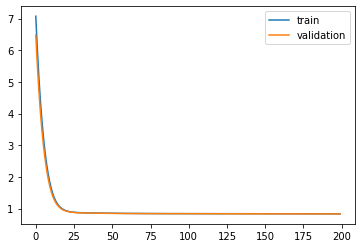

Time to train LSTM:  174.97604036331177
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 24s - loss: 6.9213 - pdc_loss: 0.7242 - event_loss: 0.6813 - val_loss: 6.3338 - val_pdc_loss: 0.7144 - val_event_loss: 0.6349

Epoch 00001: val_loss improved from inf to 6.33377, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 5.9111 - pdc_loss: 0.7027 - event_loss: 0.6123 - val_loss: 5.4049 - val_pdc_loss: 0.6942 - val_event_loss: 0.5758

Epoch 00002: val_loss improved from 6.33377 to 5.40494, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 5.0433 - pdc_loss: 0.6843 - event_loss: 0.5577 - val_loss: 4.6132 - val_pdc_loss: 0.6770 - val_event_loss: 0.5291

Epoch 00003: val_loss improved from 5.40494 to 4.61320, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 4.3068 - pdc_loss: 0.6685 - event_loss: 0.5139 - val_loss: 3.9449 - val_pdc_loss: 0.6626 - val_event_loss: 0.4911

Epoch 00004: val_loss improved from 4.61320 to 3.94495, saving


Epoch 00035: val_loss improved from 0.87825 to 0.87704, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 0.8628 - pdc_loss: 0.5325 - event_loss: 0.3170 - val_loss: 0.8759 - val_pdc_loss: 0.5382 - val_event_loss: 0.3246

Epoch 00036: val_loss improved from 0.87704 to 0.87589, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 0.8616 - pdc_loss: 0.5317 - event_loss: 0.3170 - val_loss: 0.8751 - val_pdc_loss: 0.5375 - val_event_loss: 0.3247

Epoch 00037: val_loss improved from 0.87589 to 0.87510, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 0.8606 - pdc_loss: 0.5309 - event_loss: 0.3169 - val_loss: 0.8744 - val_pdc_loss: 0.5370 - val_event_loss: 0.3248

Epoch 00038: val_loss improved from 0.87510 to 0.87444, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 0.8596 - pdc_loss: 0.5303 - event_loss: 0.3169 - val_loss: 0.8737 - val_pdc_loss: 0.5366 - val_event_loss: 0.3247

Epoch 00039: val_loss improved from 0.87444 to 

 - 1s - loss: 0.8453 - pdc_loss: 0.5207 - event_loss: 0.3151 - val_loss: 0.8618 - val_pdc_loss: 0.5298 - val_event_loss: 0.3225

Epoch 00070: val_loss improved from 0.86213 to 0.86181, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.8450 - pdc_loss: 0.5205 - event_loss: 0.3151 - val_loss: 0.8616 - val_pdc_loss: 0.5297 - val_event_loss: 0.3225

Epoch 00071: val_loss improved from 0.86181 to 0.86163, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.8448 - pdc_loss: 0.5204 - event_loss: 0.3150 - val_loss: 0.8617 - val_pdc_loss: 0.5297 - val_event_loss: 0.3226

Epoch 00072: val_loss did not improve from 0.86163
Epoch 73/200
 - 1s - loss: 0.8446 - pdc_loss: 0.5202 - event_loss: 0.3150 - val_loss: 0.8615 - val_pdc_loss: 0.5296 - val_event_loss: 0.3225

Epoch 00073: val_loss improved from 0.86163 to 0.86145, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.8444 - pdc_loss: 0.5201 - event_loss: 0.3149 - val_loss: 0.8607 - val_pdc_los


Epoch 00106: val_loss did not improve from 0.85653
Epoch 107/200
 - 1s - loss: 0.8391 - pdc_loss: 0.5167 - event_loss: 0.3138 - val_loss: 0.8564 - val_pdc_loss: 0.5265 - val_event_loss: 0.3213

Epoch 00107: val_loss improved from 0.85653 to 0.85641, saving model to Event_val_weights2.hdf5
Epoch 108/200
 - 1s - loss: 0.8390 - pdc_loss: 0.5166 - event_loss: 0.3138 - val_loss: 0.8568 - val_pdc_loss: 0.5267 - val_event_loss: 0.3216

Epoch 00108: val_loss did not improve from 0.85641
Epoch 109/200
 - 1s - loss: 0.8389 - pdc_loss: 0.5165 - event_loss: 0.3138 - val_loss: 0.8563 - val_pdc_loss: 0.5264 - val_event_loss: 0.3214

Epoch 00109: val_loss improved from 0.85641 to 0.85635, saving model to Event_val_weights2.hdf5
Epoch 110/200
 - 1s - loss: 0.8388 - pdc_loss: 0.5165 - event_loss: 0.3138 - val_loss: 0.8564 - val_pdc_loss: 0.5265 - val_event_loss: 0.3213

Epoch 00110: val_loss did not improve from 0.85635
Epoch 111/200
 - 1s - loss: 0.8387 - pdc_loss: 0.5164 - event_loss: 0.3137 - val_l

 - 1s - loss: 0.8358 - pdc_loss: 0.5145 - event_loss: 0.3132 - val_loss: 0.8542 - val_pdc_loss: 0.5251 - val_event_loss: 0.3210

Epoch 00145: val_loss improved from 0.85433 to 0.85421, saving model to Event_val_weights2.hdf5
Epoch 146/200
 - 1s - loss: 0.8358 - pdc_loss: 0.5145 - event_loss: 0.3132 - val_loss: 0.8546 - val_pdc_loss: 0.5254 - val_event_loss: 0.3211

Epoch 00146: val_loss did not improve from 0.85421
Epoch 147/200
 - 1s - loss: 0.8356 - pdc_loss: 0.5144 - event_loss: 0.3132 - val_loss: 0.8541 - val_pdc_loss: 0.5251 - val_event_loss: 0.3210

Epoch 00147: val_loss improved from 0.85421 to 0.85411, saving model to Event_val_weights2.hdf5
Epoch 148/200
 - 1s - loss: 0.8357 - pdc_loss: 0.5144 - event_loss: 0.3132 - val_loss: 0.8547 - val_pdc_loss: 0.5255 - val_event_loss: 0.3211

Epoch 00148: val_loss did not improve from 0.85411
Epoch 149/200
 - 1s - loss: 0.8356 - pdc_loss: 0.5143 - event_loss: 0.3132 - val_loss: 0.8542 - val_pdc_loss: 0.5251 - val_event_loss: 0.3210

Epoch

 - 1s - loss: 0.8337 - pdc_loss: 0.5132 - event_loss: 0.3128 - val_loss: 0.8532 - val_pdc_loss: 0.5245 - val_event_loss: 0.3211

Epoch 00185: val_loss did not improve from 0.85311
Epoch 186/200
 - 1s - loss: 0.8337 - pdc_loss: 0.5132 - event_loss: 0.3129 - val_loss: 0.8539 - val_pdc_loss: 0.5250 - val_event_loss: 0.3213

Epoch 00186: val_loss did not improve from 0.85311
Epoch 187/200
 - 1s - loss: 0.8336 - pdc_loss: 0.5132 - event_loss: 0.3128 - val_loss: 0.8533 - val_pdc_loss: 0.5246 - val_event_loss: 0.3211

Epoch 00187: val_loss did not improve from 0.85311
Epoch 188/200
 - 1s - loss: 0.8336 - pdc_loss: 0.5131 - event_loss: 0.3129 - val_loss: 0.8532 - val_pdc_loss: 0.5246 - val_event_loss: 0.3211

Epoch 00188: val_loss did not improve from 0.85311
Epoch 189/200
 - 1s - loss: 0.8335 - pdc_loss: 0.5131 - event_loss: 0.3128 - val_loss: 0.8532 - val_pdc_loss: 0.5245 - val_event_loss: 0.3211

Epoch 00189: val_loss did not improve from 0.85311
Epoch 190/200
 - 1s - loss: 0.8335 - pdc_los

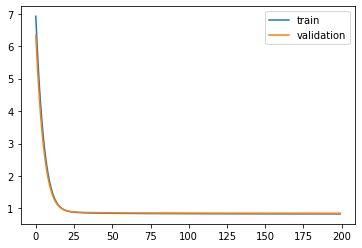

Time to train LSTM:  174.86449575424194
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 25s - loss: 7.0991 - pdc_loss: 0.7229 - event_loss: 0.6553 - val_loss: 6.5091 - val_pdc_loss: 0.7141 - val_event_loss: 0.6260

Epoch 00001: val_loss improved from inf to 6.50915, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 6.0726 - pdc_loss: 0.7022 - event_loss: 0.6052 - val_loss: 5.5643 - val_pdc_loss: 0.6952 - val_event_loss: 0.5834

Epoch 00002: val_loss improved from 6.50915 to 5.56425, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 5.1904 - pdc_loss: 0.6850 - event_loss: 0.5661 - val_loss: 4.7586 - val_pdc_loss: 0.6795 - val_event_loss: 0.5485

Epoch 00003: val_loss improved from 5.56425 to 4.75859, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 4.4404 - pdc_loss: 0.6697 - event_loss: 0.5328 - val_loss: 4.0771 - val_pdc_loss: 0.6655 - val_event_loss: 0.5177

Epoch 00004: val_loss improved from 4.75859 to 4.07706, saving


Epoch 00035: val_loss improved from 0.89096 to 0.88997, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 0.8690 - pdc_loss: 0.5383 - event_loss: 0.3170 - val_loss: 0.8890 - val_pdc_loss: 0.5524 - val_event_loss: 0.3230

Epoch 00036: val_loss improved from 0.88997 to 0.88900, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 0.8679 - pdc_loss: 0.5375 - event_loss: 0.3169 - val_loss: 0.8881 - val_pdc_loss: 0.5518 - val_event_loss: 0.3230

Epoch 00037: val_loss improved from 0.88900 to 0.88813, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 0.8668 - pdc_loss: 0.5367 - event_loss: 0.3168 - val_loss: 0.8872 - val_pdc_loss: 0.5511 - val_event_loss: 0.3229

Epoch 00038: val_loss improved from 0.88813 to 0.88724, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 0.8658 - pdc_loss: 0.5359 - event_loss: 0.3167 - val_loss: 0.8864 - val_pdc_loss: 0.5504 - val_event_loss: 0.3228

Epoch 00039: val_loss improved from 0.88724 to 


Epoch 00070: val_loss improved from 0.87207 to 0.87143, saving model to Event_val_weights3.hdf5
Epoch 71/200
 - 1s - loss: 0.8467 - pdc_loss: 0.5213 - event_loss: 0.3156 - val_loss: 0.8716 - val_pdc_loss: 0.5386 - val_event_loss: 0.3233

Epoch 00071: val_loss did not improve from 0.87143
Epoch 72/200
 - 1s - loss: 0.8463 - pdc_loss: 0.5211 - event_loss: 0.3155 - val_loss: 0.8715 - val_pdc_loss: 0.5386 - val_event_loss: 0.3233

Epoch 00072: val_loss did not improve from 0.87143
Epoch 73/200
 - 1s - loss: 0.8461 - pdc_loss: 0.5209 - event_loss: 0.3155 - val_loss: 0.8714 - val_pdc_loss: 0.5385 - val_event_loss: 0.3233

Epoch 00073: val_loss improved from 0.87143 to 0.87142, saving model to Event_val_weights3.hdf5
Epoch 74/200
 - 1s - loss: 0.8458 - pdc_loss: 0.5208 - event_loss: 0.3155 - val_loss: 0.8708 - val_pdc_loss: 0.5381 - val_event_loss: 0.3232

Epoch 00074: val_loss improved from 0.87142 to 0.87085, saving model to Event_val_weights3.hdf5
Epoch 75/200
 - 1s - loss: 0.8456 - pdc_l


Epoch 00107: val_loss improved from 0.86644 to 0.86640, saving model to Event_val_weights3.hdf5
Epoch 108/200
 - 1s - loss: 0.8399 - pdc_loss: 0.5171 - event_loss: 0.3144 - val_loss: 0.8663 - val_pdc_loss: 0.5350 - val_event_loss: 0.3229

Epoch 00108: val_loss improved from 0.86640 to 0.86627, saving model to Event_val_weights3.hdf5
Epoch 109/200
 - 1s - loss: 0.8398 - pdc_loss: 0.5171 - event_loss: 0.3144 - val_loss: 0.8667 - val_pdc_loss: 0.5356 - val_event_loss: 0.3228

Epoch 00109: val_loss did not improve from 0.86627
Epoch 110/200
 - 1s - loss: 0.8397 - pdc_loss: 0.5170 - event_loss: 0.3144 - val_loss: 0.8662 - val_pdc_loss: 0.5350 - val_event_loss: 0.3229

Epoch 00110: val_loss improved from 0.86627 to 0.86616, saving model to Event_val_weights3.hdf5
Epoch 111/200
 - 1s - loss: 0.8395 - pdc_loss: 0.5169 - event_loss: 0.3143 - val_loss: 0.8663 - val_pdc_loss: 0.5353 - val_event_loss: 0.3227

Epoch 00111: val_loss did not improve from 0.86616
Epoch 112/200
 - 1s - loss: 0.8394 - 

 - 1s - loss: 0.8370 - pdc_loss: 0.5153 - event_loss: 0.3138 - val_loss: 0.8655 - val_pdc_loss: 0.5350 - val_event_loss: 0.3225

Epoch 00147: val_loss did not improve from 0.86478
Epoch 148/200
 - 1s - loss: 0.8370 - pdc_loss: 0.5153 - event_loss: 0.3137 - val_loss: 0.8655 - val_pdc_loss: 0.5349 - val_event_loss: 0.3227

Epoch 00148: val_loss did not improve from 0.86478
Epoch 149/200
 - 1s - loss: 0.8370 - pdc_loss: 0.5153 - event_loss: 0.3137 - val_loss: 0.8658 - val_pdc_loss: 0.5352 - val_event_loss: 0.3227

Epoch 00149: val_loss did not improve from 0.86478
Epoch 150/200
 - 1s - loss: 0.8369 - pdc_loss: 0.5153 - event_loss: 0.3137 - val_loss: 0.8653 - val_pdc_loss: 0.5348 - val_event_loss: 0.3226

Epoch 00150: val_loss did not improve from 0.86478
Epoch 151/200
 - 1s - loss: 0.8369 - pdc_loss: 0.5153 - event_loss: 0.3137 - val_loss: 0.8656 - val_pdc_loss: 0.5351 - val_event_loss: 0.3226

Epoch 00151: val_loss did not improve from 0.86478
Epoch 152/200
 - 1s - loss: 0.8368 - pdc_los


Epoch 00187: val_loss did not improve from 0.86363
Epoch 188/200
 - 1s - loss: 0.8347 - pdc_loss: 0.5138 - event_loss: 0.3134 - val_loss: 0.8636 - val_pdc_loss: 0.5335 - val_event_loss: 0.3225

Epoch 00188: val_loss improved from 0.86363 to 0.86357, saving model to Event_val_weights3.hdf5
Epoch 189/200
 - 1s - loss: 0.8347 - pdc_loss: 0.5137 - event_loss: 0.3133 - val_loss: 0.8637 - val_pdc_loss: 0.5336 - val_event_loss: 0.3225

Epoch 00189: val_loss did not improve from 0.86357
Epoch 190/200
 - 1s - loss: 0.8346 - pdc_loss: 0.5137 - event_loss: 0.3133 - val_loss: 0.8633 - val_pdc_loss: 0.5333 - val_event_loss: 0.3224

Epoch 00190: val_loss improved from 0.86357 to 0.86328, saving model to Event_val_weights3.hdf5
Epoch 191/200
 - 1s - loss: 0.8346 - pdc_loss: 0.5137 - event_loss: 0.3133 - val_loss: 0.8634 - val_pdc_loss: 0.5335 - val_event_loss: 0.3224

Epoch 00191: val_loss did not improve from 0.86328
Epoch 192/200
 - 1s - loss: 0.8345 - pdc_loss: 0.5136 - event_loss: 0.3133 - val_l

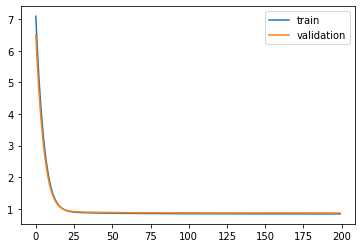

Time to train LSTM:  174.40279245376587
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 26s - loss: 6.9318 - pdc_loss: 0.7670 - event_loss: 0.6515 - val_loss: 6.3567 - val_pdc_loss: 0.7454 - val_event_loss: 0.6319

Epoch 00001: val_loss improved from inf to 6.35667, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 5.9341 - pdc_loss: 0.7308 - event_loss: 0.6127 - val_loss: 5.4387 - val_pdc_loss: 0.7138 - val_event_loss: 0.5950

Epoch 00002: val_loss improved from 6.35667 to 5.43867, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 5.0744 - pdc_loss: 0.7006 - event_loss: 0.5761 - val_loss: 4.6537 - val_pdc_loss: 0.6881 - val_event_loss: 0.5598

Epoch 00003: val_loss improved from 5.43867 to 4.65365, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 4.3428 - pdc_loss: 0.6768 - event_loss: 0.5411 - val_loss: 3.9889 - val_pdc_loss: 0.6681 - val_event_loss: 0.5263

Epoch 00004: val_loss improved from 4.65365 to 3.98887, saving


Epoch 00035: val_loss improved from 0.89219 to 0.89133, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 0.8645 - pdc_loss: 0.5336 - event_loss: 0.3175 - val_loss: 0.8906 - val_pdc_loss: 0.5494 - val_event_loss: 0.3278

Epoch 00036: val_loss improved from 0.89133 to 0.89057, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 0.8634 - pdc_loss: 0.5326 - event_loss: 0.3175 - val_loss: 0.8898 - val_pdc_loss: 0.5487 - val_event_loss: 0.3278

Epoch 00037: val_loss improved from 0.89057 to 0.88982, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 0.8623 - pdc_loss: 0.5317 - event_loss: 0.3174 - val_loss: 0.8891 - val_pdc_loss: 0.5481 - val_event_loss: 0.3278

Epoch 00038: val_loss improved from 0.88982 to 0.88913, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 0.8612 - pdc_loss: 0.5307 - event_loss: 0.3174 - val_loss: 0.8884 - val_pdc_loss: 0.5475 - val_event_loss: 0.3278

Epoch 00039: val_loss improved from 0.88913 to 


Epoch 00070: val_loss did not improve from 0.87358
Epoch 71/200
 - 1s - loss: 0.8426 - pdc_loss: 0.5173 - event_loss: 0.3155 - val_loss: 0.8731 - val_pdc_loss: 0.5365 - val_event_loss: 0.3268

Epoch 00071: val_loss improved from 0.87358 to 0.87310, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.8423 - pdc_loss: 0.5172 - event_loss: 0.3154 - val_loss: 0.8732 - val_pdc_loss: 0.5368 - val_event_loss: 0.3267

Epoch 00072: val_loss did not improve from 0.87310
Epoch 73/200
 - 1s - loss: 0.8421 - pdc_loss: 0.5170 - event_loss: 0.3154 - val_loss: 0.8727 - val_pdc_loss: 0.5363 - val_event_loss: 0.3268

Epoch 00073: val_loss improved from 0.87310 to 0.87271, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.8418 - pdc_loss: 0.5169 - event_loss: 0.3153 - val_loss: 0.8728 - val_pdc_loss: 0.5366 - val_event_loss: 0.3266

Epoch 00074: val_loss did not improve from 0.87271
Epoch 75/200
 - 1s - loss: 0.8416 - pdc_loss: 0.5168 - event_loss: 0.3153 - val_loss: 


Epoch 00108: val_loss improved from 0.86945 to 0.86937, saving model to Event_val_weights4.hdf5
Epoch 109/200
 - 1s - loss: 0.8366 - pdc_loss: 0.5141 - event_loss: 0.3142 - val_loss: 0.8693 - val_pdc_loss: 0.5346 - val_event_loss: 0.3263

Epoch 00109: val_loss improved from 0.86937 to 0.86932, saving model to Event_val_weights4.hdf5
Epoch 110/200
 - 1s - loss: 0.8363 - pdc_loss: 0.5139 - event_loss: 0.3141 - val_loss: 0.8692 - val_pdc_loss: 0.5347 - val_event_loss: 0.3262

Epoch 00110: val_loss improved from 0.86932 to 0.86922, saving model to Event_val_weights4.hdf5
Epoch 111/200
 - 1s - loss: 0.8364 - pdc_loss: 0.5140 - event_loss: 0.3141 - val_loss: 0.8693 - val_pdc_loss: 0.5346 - val_event_loss: 0.3263

Epoch 00111: val_loss did not improve from 0.86922
Epoch 112/200
 - 1s - loss: 0.8361 - pdc_loss: 0.5138 - event_loss: 0.3140 - val_loss: 0.8690 - val_pdc_loss: 0.5347 - val_event_loss: 0.3261

Epoch 00112: val_loss improved from 0.86922 to 0.86903, saving model to Event_val_weight


Epoch 00145: val_loss did not improve from 0.86763
Epoch 146/200
 - 1s - loss: 0.8338 - pdc_loss: 0.5126 - event_loss: 0.3136 - val_loss: 0.8674 - val_pdc_loss: 0.5337 - val_event_loss: 0.3261

Epoch 00146: val_loss improved from 0.86763 to 0.86744, saving model to Event_val_weights4.hdf5
Epoch 147/200
 - 1s - loss: 0.8339 - pdc_loss: 0.5126 - event_loss: 0.3136 - val_loss: 0.8678 - val_pdc_loss: 0.5339 - val_event_loss: 0.3262

Epoch 00147: val_loss did not improve from 0.86744
Epoch 148/200
 - 1s - loss: 0.8337 - pdc_loss: 0.5125 - event_loss: 0.3136 - val_loss: 0.8674 - val_pdc_loss: 0.5337 - val_event_loss: 0.3261

Epoch 00148: val_loss improved from 0.86744 to 0.86740, saving model to Event_val_weights4.hdf5
Epoch 149/200
 - 1s - loss: 0.8338 - pdc_loss: 0.5126 - event_loss: 0.3136 - val_loss: 0.8676 - val_pdc_loss: 0.5338 - val_event_loss: 0.3262

Epoch 00149: val_loss did not improve from 0.86740
Epoch 150/200
 - 1s - loss: 0.8337 - pdc_loss: 0.5125 - event_loss: 0.3136 - val_l


Epoch 00184: val_loss improved from 0.86650 to 0.86647, saving model to Event_val_weights4.hdf5
Epoch 185/200
 - 1s - loss: 0.8323 - pdc_loss: 0.5118 - event_loss: 0.3133 - val_loss: 0.8665 - val_pdc_loss: 0.5330 - val_event_loss: 0.3263

Epoch 00185: val_loss did not improve from 0.86647
Epoch 186/200
 - 1s - loss: 0.8321 - pdc_loss: 0.5117 - event_loss: 0.3132 - val_loss: 0.8665 - val_pdc_loss: 0.5331 - val_event_loss: 0.3262

Epoch 00186: val_loss did not improve from 0.86647
Epoch 187/200
 - 1s - loss: 0.8322 - pdc_loss: 0.5118 - event_loss: 0.3133 - val_loss: 0.8664 - val_pdc_loss: 0.5330 - val_event_loss: 0.3263

Epoch 00187: val_loss improved from 0.86647 to 0.86645, saving model to Event_val_weights4.hdf5
Epoch 188/200
 - 1s - loss: 0.8321 - pdc_loss: 0.5117 - event_loss: 0.3132 - val_loss: 0.8665 - val_pdc_loss: 0.5331 - val_event_loss: 0.3262

Epoch 00188: val_loss did not improve from 0.86645
Epoch 189/200
 - 1s - loss: 0.8322 - pdc_loss: 0.5117 - event_loss: 0.3133 - val_l

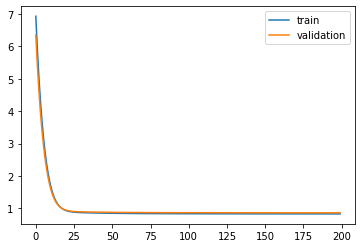

Time to train LSTM:  178.18513417243958
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 26s - loss: 7.2168 - pdc_loss: 0.7411 - event_loss: 0.7113 - val_loss: 6.6088 - val_pdc_loss: 0.7191 - val_event_loss: 0.6758

Epoch 00001: val_loss improved from inf to 6.60881, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 6.1752 - pdc_loss: 0.7123 - event_loss: 0.6513 - val_loss: 5.6488 - val_pdc_loss: 0.6938 - val_event_loss: 0.6214

Epoch 00002: val_loss improved from 6.60881 to 5.64884, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 5.2789 - pdc_loss: 0.6887 - event_loss: 0.6024 - val_loss: 4.8302 - val_pdc_loss: 0.6746 - val_event_loss: 0.5767

Epoch 00003: val_loss improved from 5.64884 to 4.83019, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 4.5169 - pdc_loss: 0.6704 - event_loss: 0.5609 - val_loss: 4.1372 - val_pdc_loss: 0.6598 - val_event_loss: 0.5375

Epoch 00004: val_loss improved from 4.83019 to 4.13723, saving


Epoch 00035: val_loss improved from 0.87129 to 0.87016, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 0.8675 - pdc_loss: 0.5361 - event_loss: 0.3179 - val_loss: 0.8689 - val_pdc_loss: 0.5370 - val_event_loss: 0.3186

Epoch 00036: val_loss improved from 0.87016 to 0.86888, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 0.8665 - pdc_loss: 0.5355 - event_loss: 0.3178 - val_loss: 0.8680 - val_pdc_loss: 0.5365 - val_event_loss: 0.3185

Epoch 00037: val_loss improved from 0.86888 to 0.86798, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 0.8656 - pdc_loss: 0.5349 - event_loss: 0.3177 - val_loss: 0.8670 - val_pdc_loss: 0.5357 - val_event_loss: 0.3185

Epoch 00038: val_loss improved from 0.86798 to 0.86696, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 0.8648 - pdc_loss: 0.5344 - event_loss: 0.3176 - val_loss: 0.8664 - val_pdc_loss: 0.5353 - val_event_loss: 0.3184

Epoch 00039: val_loss improved from 0.86696 to 

 - 1s - loss: 0.8512 - pdc_loss: 0.5244 - event_loss: 0.3163 - val_loss: 0.8559 - val_pdc_loss: 0.5271 - val_event_loss: 0.3182

Epoch 00070: val_loss improved from 0.85601 to 0.85593, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.8510 - pdc_loss: 0.5242 - event_loss: 0.3162 - val_loss: 0.8558 - val_pdc_loss: 0.5271 - val_event_loss: 0.3182

Epoch 00071: val_loss improved from 0.85593 to 0.85583, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8507 - pdc_loss: 0.5240 - event_loss: 0.3162 - val_loss: 0.8557 - val_pdc_loss: 0.5270 - val_event_loss: 0.3183

Epoch 00072: val_loss improved from 0.85583 to 0.85573, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8504 - pdc_loss: 0.5238 - event_loss: 0.3162 - val_loss: 0.8556 - val_pdc_loss: 0.5270 - val_event_loss: 0.3182

Epoch 00073: val_loss improved from 0.85573 to 0.85564, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8502 - pdc_loss: 0.5236 - event_

 - 1s - loss: 0.8447 - pdc_loss: 0.5197 - event_loss: 0.3155 - val_loss: 0.8498 - val_pdc_loss: 0.5230 - val_event_loss: 0.3174

Epoch 00105: val_loss improved from 0.85005 to 0.84984, saving model to Event_val_weights5.hdf5
Epoch 106/200
 - 1s - loss: 0.8447 - pdc_loss: 0.5197 - event_loss: 0.3156 - val_loss: 0.8499 - val_pdc_loss: 0.5230 - val_event_loss: 0.3174

Epoch 00106: val_loss did not improve from 0.84984
Epoch 107/200
 - 1s - loss: 0.8444 - pdc_loss: 0.5196 - event_loss: 0.3155 - val_loss: 0.8497 - val_pdc_loss: 0.5229 - val_event_loss: 0.3174

Epoch 00107: val_loss improved from 0.84984 to 0.84971, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.8445 - pdc_loss: 0.5196 - event_loss: 0.3155 - val_loss: 0.8498 - val_pdc_loss: 0.5230 - val_event_loss: 0.3174

Epoch 00108: val_loss did not improve from 0.84971
Epoch 109/200
 - 1s - loss: 0.8442 - pdc_loss: 0.5194 - event_loss: 0.3155 - val_loss: 0.8495 - val_pdc_loss: 0.5229 - val_event_loss: 0.3173

Epoch


Epoch 00141: val_loss improved from 0.84734 to 0.84729, saving model to Event_val_weights5.hdf5
Epoch 142/200
 - 1s - loss: 0.8411 - pdc_loss: 0.5173 - event_loss: 0.3151 - val_loss: 0.8472 - val_pdc_loss: 0.5214 - val_event_loss: 0.3171

Epoch 00142: val_loss improved from 0.84729 to 0.84723, saving model to Event_val_weights5.hdf5
Epoch 143/200
 - 1s - loss: 0.8409 - pdc_loss: 0.5172 - event_loss: 0.3150 - val_loss: 0.8472 - val_pdc_loss: 0.5214 - val_event_loss: 0.3171

Epoch 00143: val_loss improved from 0.84723 to 0.84722, saving model to Event_val_weights5.hdf5
Epoch 144/200
 - 1s - loss: 0.8409 - pdc_loss: 0.5172 - event_loss: 0.3150 - val_loss: 0.8472 - val_pdc_loss: 0.5214 - val_event_loss: 0.3171

Epoch 00144: val_loss did not improve from 0.84722
Epoch 145/200
 - 1s - loss: 0.8407 - pdc_loss: 0.5171 - event_loss: 0.3150 - val_loss: 0.8472 - val_pdc_loss: 0.5214 - val_event_loss: 0.3171

Epoch 00145: val_loss improved from 0.84722 to 0.84718, saving model to Event_val_weight


Epoch 00179: val_loss improved from 0.84530 to 0.84518, saving model to Event_val_weights5.hdf5
Epoch 180/200
 - 1s - loss: 0.8387 - pdc_loss: 0.5157 - event_loss: 0.3148 - val_loss: 0.8451 - val_pdc_loss: 0.5202 - val_event_loss: 0.3167

Epoch 00180: val_loss improved from 0.84518 to 0.84514, saving model to Event_val_weights5.hdf5
Epoch 181/200
 - 1s - loss: 0.8386 - pdc_loss: 0.5156 - event_loss: 0.3147 - val_loss: 0.8452 - val_pdc_loss: 0.5202 - val_event_loss: 0.3168

Epoch 00181: val_loss did not improve from 0.84514
Epoch 182/200
 - 1s - loss: 0.8386 - pdc_loss: 0.5157 - event_loss: 0.3148 - val_loss: 0.8452 - val_pdc_loss: 0.5203 - val_event_loss: 0.3167

Epoch 00182: val_loss did not improve from 0.84514
Epoch 183/200
 - 1s - loss: 0.8385 - pdc_loss: 0.5156 - event_loss: 0.3147 - val_loss: 0.8450 - val_pdc_loss: 0.5200 - val_event_loss: 0.3167

Epoch 00183: val_loss improved from 0.84514 to 0.84498, saving model to Event_val_weights5.hdf5
Epoch 184/200
 - 1s - loss: 0.8386 - 

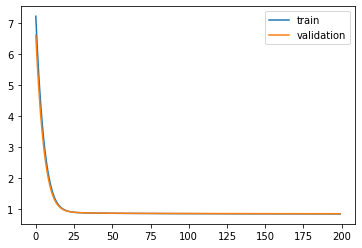

Time to train LSTM:  176.51243495941162
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 26s - loss: 5.3386 - pdc_loss: 0.6835 - event_loss: 0.7704 - val_loss: 4.9017 - val_pdc_loss: 0.6773 - val_event_loss: 0.7052

Epoch 00001: val_loss improved from inf to 4.90169, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 4.5825 - pdc_loss: 0.6694 - event_loss: 0.6624 - val_loss: 4.2060 - val_pdc_loss: 0.6641 - val_event_loss: 0.6107

Epoch 00002: val_loss improved from 4.90169 to 4.20601, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 3.9383 - pdc_loss: 0.6570 - event_loss: 0.5824 - val_loss: 3.6183 - val_pdc_loss: 0.6523 - val_event_loss: 0.5421

Epoch 00003: val_loss improved from 4.20601 to 3.61825, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 3.3953 - pdc_loss: 0.6454 - event_loss: 0.5242 - val_loss: 3.1255 - val_pdc_loss: 0.6410 - val_event_loss: 0.4925

Epoch 00004: val_loss improved from 3.61825 to 3.12550, saving


Epoch 00035: val_loss improved from 0.86880 to 0.86782, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 0.8702 - pdc_loss: 0.5392 - event_loss: 0.3176 - val_loss: 0.8669 - val_pdc_loss: 0.5415 - val_event_loss: 0.3122

Epoch 00036: val_loss improved from 0.86782 to 0.86690, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 0.8692 - pdc_loss: 0.5387 - event_loss: 0.3175 - val_loss: 0.8660 - val_pdc_loss: 0.5409 - val_event_loss: 0.3122

Epoch 00037: val_loss improved from 0.86690 to 0.86604, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 0.8683 - pdc_loss: 0.5381 - event_loss: 0.3174 - val_loss: 0.8652 - val_pdc_loss: 0.5404 - val_event_loss: 0.3121

Epoch 00038: val_loss improved from 0.86604 to 0.86523, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 0.8675 - pdc_loss: 0.5375 - event_loss: 0.3173 - val_loss: 0.8645 - val_pdc_loss: 0.5398 - val_event_loss: 0.3121

Epoch 00039: val_loss improved from 0.86523 to 

 - 1s - loss: 0.8504 - pdc_loss: 0.5239 - event_loss: 0.3158 - val_loss: 0.8478 - val_pdc_loss: 0.5267 - val_event_loss: 0.3103

Epoch 00070: val_loss improved from 0.84811 to 0.84777, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 0.8501 - pdc_loss: 0.5237 - event_loss: 0.3157 - val_loss: 0.8477 - val_pdc_loss: 0.5266 - val_event_loss: 0.3105

Epoch 00071: val_loss improved from 0.84777 to 0.84774, saving model to Event_val_weights1.hdf5
Epoch 72/200
 - 1s - loss: 0.8499 - pdc_loss: 0.5235 - event_loss: 0.3157 - val_loss: 0.8472 - val_pdc_loss: 0.5263 - val_event_loss: 0.3102

Epoch 00072: val_loss improved from 0.84774 to 0.84720, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.8496 - pdc_loss: 0.5233 - event_loss: 0.3157 - val_loss: 0.8470 - val_pdc_loss: 0.5260 - val_event_loss: 0.3105

Epoch 00073: val_loss improved from 0.84720 to 0.84704, saving model to Event_val_weights1.hdf5
Epoch 74/200
 - 1s - loss: 0.8493 - pdc_loss: 0.5231 - event_

 - 1s - loss: 0.8428 - pdc_loss: 0.5188 - event_loss: 0.3147 - val_loss: 0.8413 - val_pdc_loss: 0.5219 - val_event_loss: 0.3101

Epoch 00107: val_loss improved from 0.84137 to 0.84127, saving model to Event_val_weights1.hdf5
Epoch 108/200
 - 1s - loss: 0.8427 - pdc_loss: 0.5187 - event_loss: 0.3146 - val_loss: 0.8412 - val_pdc_loss: 0.5219 - val_event_loss: 0.3100

Epoch 00108: val_loss improved from 0.84127 to 0.84121, saving model to Event_val_weights1.hdf5
Epoch 109/200
 - 1s - loss: 0.8425 - pdc_loss: 0.5186 - event_loss: 0.3146 - val_loss: 0.8408 - val_pdc_loss: 0.5217 - val_event_loss: 0.3099

Epoch 00109: val_loss improved from 0.84121 to 0.84083, saving model to Event_val_weights1.hdf5
Epoch 110/200
 - 1s - loss: 0.8423 - pdc_loss: 0.5185 - event_loss: 0.3146 - val_loss: 0.8409 - val_pdc_loss: 0.5220 - val_event_loss: 0.3097

Epoch 00110: val_loss did not improve from 0.84083
Epoch 111/200
 - 1s - loss: 0.8423 - pdc_loss: 0.5185 - event_loss: 0.3146 - val_loss: 0.8406 - val_pdc

 - 1s - loss: 0.8387 - pdc_loss: 0.5164 - event_loss: 0.3139 - val_loss: 0.8382 - val_pdc_loss: 0.5207 - val_event_loss: 0.3091

Epoch 00146: val_loss did not improve from 0.83816
Epoch 147/200
 - 1s - loss: 0.8386 - pdc_loss: 0.5163 - event_loss: 0.3139 - val_loss: 0.8380 - val_pdc_loss: 0.5204 - val_event_loss: 0.3093

Epoch 00147: val_loss improved from 0.83816 to 0.83800, saving model to Event_val_weights1.hdf5
Epoch 148/200
 - 1s - loss: 0.8385 - pdc_loss: 0.5163 - event_loss: 0.3138 - val_loss: 0.8379 - val_pdc_loss: 0.5207 - val_event_loss: 0.3089

Epoch 00148: val_loss improved from 0.83800 to 0.83792, saving model to Event_val_weights1.hdf5
Epoch 149/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5163 - event_loss: 0.3138 - val_loss: 0.8381 - val_pdc_loss: 0.5204 - val_event_loss: 0.3094

Epoch 00149: val_loss did not improve from 0.83792
Epoch 150/200
 - 1s - loss: 0.8383 - pdc_loss: 0.5162 - event_loss: 0.3138 - val_loss: 0.8378 - val_pdc_loss: 0.5205 - val_event_loss: 0.3090

Epoch

 - 1s - loss: 0.8359 - pdc_loss: 0.5148 - event_loss: 0.3133 - val_loss: 0.8365 - val_pdc_loss: 0.5196 - val_event_loss: 0.3090

Epoch 00185: val_loss improved from 0.83662 to 0.83649, saving model to Event_val_weights1.hdf5
Epoch 186/200
 - 1s - loss: 0.8359 - pdc_loss: 0.5147 - event_loss: 0.3133 - val_loss: 0.8365 - val_pdc_loss: 0.5196 - val_event_loss: 0.3090

Epoch 00186: val_loss improved from 0.83649 to 0.83645, saving model to Event_val_weights1.hdf5
Epoch 187/200
 - 1s - loss: 0.8358 - pdc_loss: 0.5147 - event_loss: 0.3133 - val_loss: 0.8365 - val_pdc_loss: 0.5196 - val_event_loss: 0.3090

Epoch 00187: val_loss did not improve from 0.83645
Epoch 188/200
 - 1s - loss: 0.8358 - pdc_loss: 0.5146 - event_loss: 0.3133 - val_loss: 0.8365 - val_pdc_loss: 0.5197 - val_event_loss: 0.3089

Epoch 00188: val_loss did not improve from 0.83645
Epoch 189/200
 - 1s - loss: 0.8357 - pdc_loss: 0.5147 - event_loss: 0.3133 - val_loss: 0.8365 - val_pdc_loss: 0.5196 - val_event_loss: 0.3091

Epoch

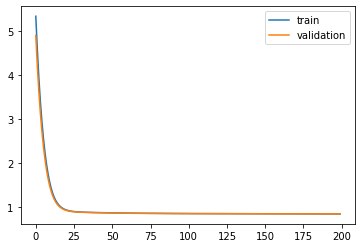

Time to train LSTM:  173.7095193862915


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f66bb4763c8>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 30s - loss: 5.3709 - pdc_loss: 0.7156 - event_loss: 0.7754 - val_loss: 4.9261 - val_pdc_loss: 0.7033 - val_event_loss: 0.7027

Epoch 00001: val_loss improved from inf to 4.92615, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 4.6169 - pdc_loss: 0.6984 - event_loss: 0.6641 - val_loss: 4.2430 - val_pdc_loss: 0.6891 - val_event_loss: 0.6165

Epoch 00002: val_loss improved from 4.92615 to 4.24297, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 3.9795 - pdc_loss: 0.6836 - event_loss: 0.5897 - val_loss: 3.6628 - val_pdc_loss: 0.6746 - val_event_loss: 0.5560

Epoch 00003: val_loss improved from 4.24297 to 3.66281, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 3.4386 - pdc_loss: 0.6682 - event_loss: 0.5355 - val_loss: 3.1706 - val_pdc_loss: 0.6597 - val_event_loss: 0.5087

Epoch 00004: val_loss improved from 3.66281 to 3.17064, saving model to Event_val_weights2.hdf5
Epoch 


Epoch 00035: val_loss improved from 0.88424 to 0.88329, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 0.8699 - pdc_loss: 0.5399 - event_loss: 0.3168 - val_loss: 0.8824 - val_pdc_loss: 0.5459 - val_event_loss: 0.3233

Epoch 00036: val_loss improved from 0.88329 to 0.88237, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 0.8690 - pdc_loss: 0.5393 - event_loss: 0.3167 - val_loss: 0.8816 - val_pdc_loss: 0.5454 - val_event_loss: 0.3233

Epoch 00037: val_loss improved from 0.88237 to 0.88160, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 0.8681 - pdc_loss: 0.5387 - event_loss: 0.3166 - val_loss: 0.8807 - val_pdc_loss: 0.5448 - val_event_loss: 0.3233

Epoch 00038: val_loss improved from 0.88160 to 0.88074, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 0.8672 - pdc_loss: 0.5381 - event_loss: 0.3165 - val_loss: 0.8801 - val_pdc_loss: 0.5443 - val_event_loss: 0.3233

Epoch 00039: val_loss improved from 0.88074 to 

 - 1s - loss: 0.8502 - pdc_loss: 0.5239 - event_loss: 0.3160 - val_loss: 0.8653 - val_pdc_loss: 0.5317 - val_event_loss: 0.3234

Epoch 00070: val_loss improved from 0.86570 to 0.86530, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.8499 - pdc_loss: 0.5237 - event_loss: 0.3160 - val_loss: 0.8649 - val_pdc_loss: 0.5314 - val_event_loss: 0.3233

Epoch 00071: val_loss improved from 0.86530 to 0.86486, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.8495 - pdc_loss: 0.5234 - event_loss: 0.3160 - val_loss: 0.8647 - val_pdc_loss: 0.5312 - val_event_loss: 0.3234

Epoch 00072: val_loss improved from 0.86486 to 0.86467, saving model to Event_val_weights2.hdf5
Epoch 73/200
 - 1s - loss: 0.8492 - pdc_loss: 0.5231 - event_loss: 0.3160 - val_loss: 0.8646 - val_pdc_loss: 0.5310 - val_event_loss: 0.3235

Epoch 00073: val_loss improved from 0.86467 to 0.86462, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.8488 - pdc_loss: 0.5228 - event_

 - 1s - loss: 0.8410 - pdc_loss: 0.5172 - event_loss: 0.3151 - val_loss: 0.8575 - val_pdc_loss: 0.5269 - val_event_loss: 0.3219

Epoch 00105: val_loss improved from 0.85753 to 0.85749, saving model to Event_val_weights2.hdf5
Epoch 106/200
 - 1s - loss: 0.8408 - pdc_loss: 0.5171 - event_loss: 0.3151 - val_loss: 0.8572 - val_pdc_loss: 0.5266 - val_event_loss: 0.3219

Epoch 00106: val_loss improved from 0.85749 to 0.85715, saving model to Event_val_weights2.hdf5
Epoch 107/200
 - 1s - loss: 0.8407 - pdc_loss: 0.5170 - event_loss: 0.3150 - val_loss: 0.8568 - val_pdc_loss: 0.5264 - val_event_loss: 0.3218

Epoch 00107: val_loss improved from 0.85715 to 0.85679, saving model to Event_val_weights2.hdf5
Epoch 108/200
 - 1s - loss: 0.8405 - pdc_loss: 0.5169 - event_loss: 0.3150 - val_loss: 0.8566 - val_pdc_loss: 0.5264 - val_event_loss: 0.3216

Epoch 00108: val_loss improved from 0.85679 to 0.85656, saving model to Event_val_weights2.hdf5
Epoch 109/200
 - 1s - loss: 0.8404 - pdc_loss: 0.5168 - ev


Epoch 00141: val_loss did not improve from 0.85323
Epoch 142/200
 - 1s - loss: 0.8365 - pdc_loss: 0.5144 - event_loss: 0.3144 - val_loss: 0.8535 - val_pdc_loss: 0.5254 - val_event_loss: 0.3204

Epoch 00142: val_loss did not improve from 0.85323
Epoch 143/200
 - 1s - loss: 0.8365 - pdc_loss: 0.5144 - event_loss: 0.3144 - val_loss: 0.8534 - val_pdc_loss: 0.5251 - val_event_loss: 0.3205

Epoch 00143: val_loss did not improve from 0.85323
Epoch 144/200
 - 1s - loss: 0.8364 - pdc_loss: 0.5143 - event_loss: 0.3143 - val_loss: 0.8534 - val_pdc_loss: 0.5252 - val_event_loss: 0.3204

Epoch 00144: val_loss did not improve from 0.85323
Epoch 145/200
 - 1s - loss: 0.8364 - pdc_loss: 0.5143 - event_loss: 0.3143 - val_loss: 0.8532 - val_pdc_loss: 0.5250 - val_event_loss: 0.3204

Epoch 00145: val_loss improved from 0.85323 to 0.85321, saving model to Event_val_weights2.hdf5
Epoch 146/200
 - 1s - loss: 0.8363 - pdc_loss: 0.5142 - event_loss: 0.3143 - val_loss: 0.8533 - val_pdc_loss: 0.5253 - val_even


Epoch 00181: val_loss did not improve from 0.85188
Epoch 182/200
 - 1s - loss: 0.8340 - pdc_loss: 0.5129 - event_loss: 0.3138 - val_loss: 0.8522 - val_pdc_loss: 0.5251 - val_event_loss: 0.3198

Epoch 00182: val_loss did not improve from 0.85188
Epoch 183/200
 - 1s - loss: 0.8339 - pdc_loss: 0.5129 - event_loss: 0.3137 - val_loss: 0.8518 - val_pdc_loss: 0.5247 - val_event_loss: 0.3198

Epoch 00183: val_loss improved from 0.85188 to 0.85180, saving model to Event_val_weights2.hdf5
Epoch 184/200
 - 1s - loss: 0.8340 - pdc_loss: 0.5129 - event_loss: 0.3137 - val_loss: 0.8524 - val_pdc_loss: 0.5253 - val_event_loss: 0.3199

Epoch 00184: val_loss did not improve from 0.85180
Epoch 185/200
 - 1s - loss: 0.8338 - pdc_loss: 0.5129 - event_loss: 0.3137 - val_loss: 0.8521 - val_pdc_loss: 0.5247 - val_event_loss: 0.3201

Epoch 00185: val_loss did not improve from 0.85180
Epoch 186/200
 - 1s - loss: 0.8338 - pdc_loss: 0.5128 - event_loss: 0.3137 - val_loss: 0.8522 - val_pdc_loss: 0.5250 - val_even

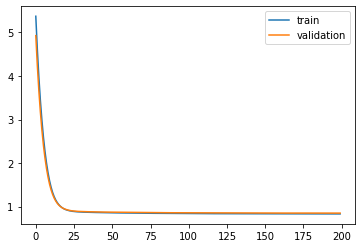

Time to train LSTM:  193.8517849445343
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 43s - loss: 5.3384 - pdc_loss: 0.7245 - event_loss: 0.6916 - val_loss: 4.9213 - val_pdc_loss: 0.7085 - val_event_loss: 0.6657

Epoch 00001: val_loss improved from inf to 4.92133, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 4.6124 - pdc_loss: 0.6937 - event_loss: 0.6457 - val_loss: 4.2544 - val_pdc_loss: 0.6838 - val_event_loss: 0.6230

Epoch 00002: val_loss improved from 4.92133 to 4.25445, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 3.9861 - pdc_loss: 0.6700 - event_loss: 0.6034 - val_loss: 3.6829 - val_pdc_loss: 0.6654 - val_event_loss: 0.5824

Epoch 00003: val_loss improved from 4.25445 to 3.68294, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 3.4506 - pdc_loss: 0.6518 - event_loss: 0.5624 - val_loss: 3.1962 - val_pdc_loss: 0.6509 - val_event_loss: 0.5429

Epoch 00004: val_loss improved from 3.68294 to 3.19624, saving 


Epoch 00035: val_loss improved from 0.88529 to 0.88434, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 0.8614 - pdc_loss: 0.5300 - event_loss: 0.3184 - val_loss: 0.8835 - val_pdc_loss: 0.5465 - val_event_loss: 0.3242

Epoch 00036: val_loss improved from 0.88434 to 0.88353, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 0.8604 - pdc_loss: 0.5293 - event_loss: 0.3183 - val_loss: 0.8826 - val_pdc_loss: 0.5458 - val_event_loss: 0.3241

Epoch 00037: val_loss improved from 0.88353 to 0.88265, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 0.8594 - pdc_loss: 0.5286 - event_loss: 0.3182 - val_loss: 0.8820 - val_pdc_loss: 0.5453 - val_event_loss: 0.3241

Epoch 00038: val_loss improved from 0.88265 to 0.88199, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 0.8585 - pdc_loss: 0.5279 - event_loss: 0.3181 - val_loss: 0.8812 - val_pdc_loss: 0.5447 - val_event_loss: 0.3240

Epoch 00039: val_loss improved from 0.88199 to 


Epoch 00070: val_loss improved from 0.87298 to 0.87272, saving model to Event_val_weights3.hdf5
Epoch 71/200
 - 1s - loss: 0.8448 - pdc_loss: 0.5191 - event_loss: 0.3159 - val_loss: 0.8730 - val_pdc_loss: 0.5398 - val_event_loss: 0.3236

Epoch 00071: val_loss did not improve from 0.87272
Epoch 72/200
 - 1s - loss: 0.8445 - pdc_loss: 0.5190 - event_loss: 0.3159 - val_loss: 0.8726 - val_pdc_loss: 0.5394 - val_event_loss: 0.3236

Epoch 00072: val_loss improved from 0.87272 to 0.87263, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.8443 - pdc_loss: 0.5189 - event_loss: 0.3158 - val_loss: 0.8723 - val_pdc_loss: 0.5392 - val_event_loss: 0.3236

Epoch 00073: val_loss improved from 0.87263 to 0.87233, saving model to Event_val_weights3.hdf5
Epoch 74/200
 - 1s - loss: 0.8441 - pdc_loss: 0.5187 - event_loss: 0.3158 - val_loss: 0.8721 - val_pdc_loss: 0.5391 - val_event_loss: 0.3235

Epoch 00074: val_loss improved from 0.87233 to 0.87214, saving model to Event_val_weights3.h

 - 1s - loss: 0.8392 - pdc_loss: 0.5160 - event_loss: 0.3148 - val_loss: 0.8692 - val_pdc_loss: 0.5371 - val_event_loss: 0.3237

Epoch 00108: val_loss improved from 0.86942 to 0.86916, saving model to Event_val_weights3.hdf5
Epoch 109/200
 - 1s - loss: 0.8393 - pdc_loss: 0.5161 - event_loss: 0.3148 - val_loss: 0.8693 - val_pdc_loss: 0.5372 - val_event_loss: 0.3237

Epoch 00109: val_loss did not improve from 0.86916
Epoch 110/200
 - 1s - loss: 0.8391 - pdc_loss: 0.5160 - event_loss: 0.3148 - val_loss: 0.8696 - val_pdc_loss: 0.5376 - val_event_loss: 0.3237

Epoch 00110: val_loss did not improve from 0.86916
Epoch 111/200
 - 1s - loss: 0.8390 - pdc_loss: 0.5159 - event_loss: 0.3148 - val_loss: 0.8689 - val_pdc_loss: 0.5370 - val_event_loss: 0.3236

Epoch 00111: val_loss improved from 0.86916 to 0.86895, saving model to Event_val_weights3.hdf5
Epoch 112/200
 - 1s - loss: 0.8389 - pdc_loss: 0.5158 - event_loss: 0.3147 - val_loss: 0.8692 - val_pdc_loss: 0.5373 - val_event_loss: 0.3237

Epoch


Epoch 00146: val_loss did not improve from 0.86742
Epoch 147/200
 - 1s - loss: 0.8359 - pdc_loss: 0.5140 - event_loss: 0.3143 - val_loss: 0.8677 - val_pdc_loss: 0.5363 - val_event_loss: 0.3238

Epoch 00147: val_loss did not improve from 0.86742
Epoch 148/200
 - 1s - loss: 0.8358 - pdc_loss: 0.5140 - event_loss: 0.3142 - val_loss: 0.8676 - val_pdc_loss: 0.5363 - val_event_loss: 0.3237

Epoch 00148: val_loss did not improve from 0.86742
Epoch 149/200
 - 1s - loss: 0.8357 - pdc_loss: 0.5139 - event_loss: 0.3142 - val_loss: 0.8674 - val_pdc_loss: 0.5361 - val_event_loss: 0.3237

Epoch 00149: val_loss improved from 0.86742 to 0.86742, saving model to Event_val_weights3.hdf5
Epoch 150/200
 - 1s - loss: 0.8357 - pdc_loss: 0.5139 - event_loss: 0.3142 - val_loss: 0.8674 - val_pdc_loss: 0.5361 - val_event_loss: 0.3238

Epoch 00150: val_loss did not improve from 0.86742
Epoch 151/200
 - 1s - loss: 0.8356 - pdc_loss: 0.5138 - event_loss: 0.3142 - val_loss: 0.8673 - val_pdc_loss: 0.5361 - val_even

 - 1s - loss: 0.8338 - pdc_loss: 0.5127 - event_loss: 0.3139 - val_loss: 0.8662 - val_pdc_loss: 0.5356 - val_event_loss: 0.3235

Epoch 00185: val_loss did not improve from 0.86606
Epoch 186/200
 - 1s - loss: 0.8338 - pdc_loss: 0.5127 - event_loss: 0.3139 - val_loss: 0.8662 - val_pdc_loss: 0.5356 - val_event_loss: 0.3235

Epoch 00186: val_loss did not improve from 0.86606
Epoch 187/200
 - 1s - loss: 0.8336 - pdc_loss: 0.5126 - event_loss: 0.3139 - val_loss: 0.8660 - val_pdc_loss: 0.5354 - val_event_loss: 0.3234

Epoch 00187: val_loss improved from 0.86606 to 0.86597, saving model to Event_val_weights3.hdf5
Epoch 188/200
 - 1s - loss: 0.8336 - pdc_loss: 0.5126 - event_loss: 0.3139 - val_loss: 0.8661 - val_pdc_loss: 0.5355 - val_event_loss: 0.3235

Epoch 00188: val_loss did not improve from 0.86597
Epoch 189/200
 - 1s - loss: 0.8336 - pdc_loss: 0.5126 - event_loss: 0.3139 - val_loss: 0.8660 - val_pdc_loss: 0.5355 - val_event_loss: 0.3235

Epoch 00189: val_loss did not improve from 0.86597

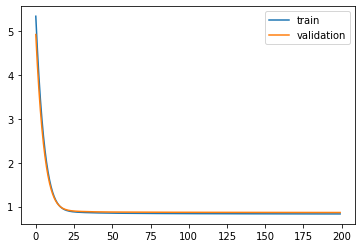

Time to train LSTM:  192.7944803237915
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 29s - loss: 5.2685 - pdc_loss: 0.6895 - event_loss: 0.6893 - val_loss: 4.8527 - val_pdc_loss: 0.6827 - val_event_loss: 0.6494

Epoch 00001: val_loss improved from inf to 4.85266, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 4.5458 - pdc_loss: 0.6780 - event_loss: 0.6178 - val_loss: 4.1908 - val_pdc_loss: 0.6725 - val_event_loss: 0.5900

Epoch 00002: val_loss improved from 4.85266 to 4.19083, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 3.9276 - pdc_loss: 0.6670 - event_loss: 0.5653 - val_loss: 3.6268 - val_pdc_loss: 0.6627 - val_event_loss: 0.5445

Epoch 00003: val_loss improved from 4.19083 to 3.62680, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 3.4012 - pdc_loss: 0.6563 - event_loss: 0.5230 - val_loss: 3.1477 - val_pdc_loss: 0.6526 - val_event_loss: 0.5060

Epoch 00004: val_loss improved from 3.62680 to 3.14765, saving 


Epoch 00035: val_loss improved from 0.89126 to 0.89044, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 0.8647 - pdc_loss: 0.5364 - event_loss: 0.3160 - val_loss: 0.8899 - val_pdc_loss: 0.5511 - val_event_loss: 0.3266

Epoch 00036: val_loss improved from 0.89044 to 0.88991, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 0.8638 - pdc_loss: 0.5357 - event_loss: 0.3159 - val_loss: 0.8893 - val_pdc_loss: 0.5507 - val_event_loss: 0.3265

Epoch 00037: val_loss improved from 0.88991 to 0.88932, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 0.8629 - pdc_loss: 0.5351 - event_loss: 0.3158 - val_loss: 0.8889 - val_pdc_loss: 0.5504 - val_event_loss: 0.3265

Epoch 00038: val_loss improved from 0.88932 to 0.88888, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 0.8621 - pdc_loss: 0.5344 - event_loss: 0.3157 - val_loss: 0.8883 - val_pdc_loss: 0.5500 - val_event_loss: 0.3264

Epoch 00039: val_loss improved from 0.88888 to 


Epoch 00070: val_loss improved from 0.87589 to 0.87535, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.8446 - pdc_loss: 0.5203 - event_loss: 0.3144 - val_loss: 0.8751 - val_pdc_loss: 0.5393 - val_event_loss: 0.3260

Epoch 00071: val_loss improved from 0.87535 to 0.87508, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.8442 - pdc_loss: 0.5200 - event_loss: 0.3144 - val_loss: 0.8748 - val_pdc_loss: 0.5390 - val_event_loss: 0.3260

Epoch 00072: val_loss improved from 0.87508 to 0.87480, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.8438 - pdc_loss: 0.5197 - event_loss: 0.3144 - val_loss: 0.8746 - val_pdc_loss: 0.5388 - val_event_loss: 0.3260

Epoch 00073: val_loss improved from 0.87480 to 0.87458, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.8435 - pdc_loss: 0.5195 - event_loss: 0.3143 - val_loss: 0.8742 - val_pdc_loss: 0.5386 - val_event_loss: 0.3260

Epoch 00074: val_loss improved from 0.87458 to 


Epoch 00106: val_loss did not improve from 0.86954
Epoch 107/200
 - 1s - loss: 0.8361 - pdc_loss: 0.5139 - event_loss: 0.3137 - val_loss: 0.8695 - val_pdc_loss: 0.5348 - val_event_loss: 0.3262

Epoch 00107: val_loss improved from 0.86954 to 0.86949, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.8360 - pdc_loss: 0.5138 - event_loss: 0.3137 - val_loss: 0.8693 - val_pdc_loss: 0.5346 - val_event_loss: 0.3262

Epoch 00108: val_loss improved from 0.86949 to 0.86930, saving model to Event_val_weights4.hdf5
Epoch 109/200
 - 1s - loss: 0.8358 - pdc_loss: 0.5137 - event_loss: 0.3137 - val_loss: 0.8692 - val_pdc_loss: 0.5346 - val_event_loss: 0.3262

Epoch 00109: val_loss improved from 0.86930 to 0.86921, saving model to Event_val_weights4.hdf5
Epoch 110/200
 - 1s - loss: 0.8357 - pdc_loss: 0.5137 - event_loss: 0.3137 - val_loss: 0.8693 - val_pdc_loss: 0.5346 - val_event_loss: 0.3263

Epoch 00110: val_loss did not improve from 0.86921
Epoch 111/200
 - 1s - loss: 0.8356 - 

 - 1s - loss: 0.8327 - pdc_loss: 0.5118 - event_loss: 0.3132 - val_loss: 0.8681 - val_pdc_loss: 0.5339 - val_event_loss: 0.3265

Epoch 00145: val_loss did not improve from 0.86781
Epoch 146/200
 - 1s - loss: 0.8327 - pdc_loss: 0.5118 - event_loss: 0.3132 - val_loss: 0.8678 - val_pdc_loss: 0.5337 - val_event_loss: 0.3264

Epoch 00146: val_loss did not improve from 0.86781
Epoch 147/200
 - 1s - loss: 0.8325 - pdc_loss: 0.5117 - event_loss: 0.3131 - val_loss: 0.8677 - val_pdc_loss: 0.5337 - val_event_loss: 0.3263

Epoch 00147: val_loss improved from 0.86781 to 0.86773, saving model to Event_val_weights4.hdf5
Epoch 148/200
 - 1s - loss: 0.8325 - pdc_loss: 0.5117 - event_loss: 0.3131 - val_loss: 0.8679 - val_pdc_loss: 0.5338 - val_event_loss: 0.3264

Epoch 00148: val_loss did not improve from 0.86773
Epoch 149/200
 - 1s - loss: 0.8324 - pdc_loss: 0.5116 - event_loss: 0.3131 - val_loss: 0.8677 - val_pdc_loss: 0.5337 - val_event_loss: 0.3264

Epoch 00149: val_loss did not improve from 0.86773


Epoch 00185: val_loss did not improve from 0.86724
Epoch 186/200
 - 1s - loss: 0.8307 - pdc_loss: 0.5107 - event_loss: 0.3127 - val_loss: 0.8675 - val_pdc_loss: 0.5336 - val_event_loss: 0.3266

Epoch 00186: val_loss did not improve from 0.86724
Epoch 187/200
 - 1s - loss: 0.8306 - pdc_loss: 0.5106 - event_loss: 0.3127 - val_loss: 0.8672 - val_pdc_loss: 0.5333 - val_event_loss: 0.3267

Epoch 00187: val_loss did not improve from 0.86724
Epoch 188/200
 - 1s - loss: 0.8306 - pdc_loss: 0.5106 - event_loss: 0.3127 - val_loss: 0.8675 - val_pdc_loss: 0.5335 - val_event_loss: 0.3267

Epoch 00188: val_loss did not improve from 0.86724
Epoch 189/200
 - 1s - loss: 0.8306 - pdc_loss: 0.5106 - event_loss: 0.3127 - val_loss: 0.8673 - val_pdc_loss: 0.5334 - val_event_loss: 0.3267

Epoch 00189: val_loss did not improve from 0.86724
Epoch 190/200
 - 1s - loss: 0.8305 - pdc_loss: 0.5106 - event_loss: 0.3127 - val_loss: 0.8671 - val_pdc_loss: 0.5332 - val_event_loss: 0.3266

Epoch 00190: val_loss improve

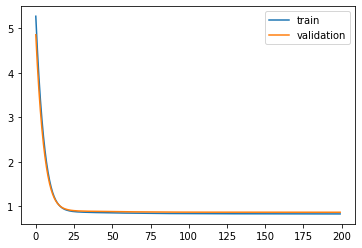

Time to train LSTM:  178.18812894821167
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 27s - loss: 5.2798 - pdc_loss: 0.7173 - event_loss: 0.6823 - val_loss: 4.8637 - val_pdc_loss: 0.7047 - val_event_loss: 0.6443

Epoch 00001: val_loss improved from inf to 4.86372, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 4.5524 - pdc_loss: 0.6957 - event_loss: 0.6101 - val_loss: 4.1946 - val_pdc_loss: 0.6847 - val_event_loss: 0.5826

Epoch 00002: val_loss improved from 4.86372 to 4.19458, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 3.9288 - pdc_loss: 0.6767 - event_loss: 0.5566 - val_loss: 3.6226 - val_pdc_loss: 0.6670 - val_event_loss: 0.5347

Epoch 00003: val_loss improved from 4.19458 to 3.62263, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 3.3969 - pdc_loss: 0.6597 - event_loss: 0.5139 - val_loss: 3.1359 - val_pdc_loss: 0.6511 - val_event_loss: 0.4945

Epoch 00004: val_loss improved from 3.62263 to 3.13594, saving


Epoch 00035: val_loss improved from 0.86925 to 0.86829, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 0.8664 - pdc_loss: 0.5366 - event_loss: 0.3176 - val_loss: 0.8674 - val_pdc_loss: 0.5371 - val_event_loss: 0.3181

Epoch 00036: val_loss improved from 0.86829 to 0.86739, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 0.8654 - pdc_loss: 0.5358 - event_loss: 0.3175 - val_loss: 0.8665 - val_pdc_loss: 0.5364 - val_event_loss: 0.3181

Epoch 00037: val_loss improved from 0.86739 to 0.86651, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 0.8645 - pdc_loss: 0.5350 - event_loss: 0.3175 - val_loss: 0.8656 - val_pdc_loss: 0.5356 - val_event_loss: 0.3181

Epoch 00038: val_loss improved from 0.86651 to 0.86564, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 0.8636 - pdc_loss: 0.5342 - event_loss: 0.3174 - val_loss: 0.8648 - val_pdc_loss: 0.5349 - val_event_loss: 0.3181

Epoch 00039: val_loss improved from 0.86564 to 

 - 1s - loss: 0.8452 - pdc_loss: 0.5195 - event_loss: 0.3157 - val_loss: 0.8479 - val_pdc_loss: 0.5213 - val_event_loss: 0.3166

Epoch 00070: val_loss improved from 0.84807 to 0.84788, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.8449 - pdc_loss: 0.5192 - event_loss: 0.3157 - val_loss: 0.8477 - val_pdc_loss: 0.5211 - val_event_loss: 0.3166

Epoch 00071: val_loss improved from 0.84788 to 0.84768, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8447 - pdc_loss: 0.5191 - event_loss: 0.3156 - val_loss: 0.8476 - val_pdc_loss: 0.5211 - val_event_loss: 0.3165

Epoch 00072: val_loss improved from 0.84768 to 0.84757, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8444 - pdc_loss: 0.5189 - event_loss: 0.3156 - val_loss: 0.8473 - val_pdc_loss: 0.5209 - val_event_loss: 0.3165

Epoch 00073: val_loss improved from 0.84757 to 0.84735, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8442 - pdc_loss: 0.5188 - event_

 - 1s - loss: 0.8383 - pdc_loss: 0.5150 - event_loss: 0.3146 - val_loss: 0.8434 - val_pdc_loss: 0.5190 - val_event_loss: 0.3158

Epoch 00105: val_loss improved from 0.84358 to 0.84342, saving model to Event_val_weights5.hdf5
Epoch 106/200
 - 1s - loss: 0.8383 - pdc_loss: 0.5151 - event_loss: 0.3146 - val_loss: 0.8432 - val_pdc_loss: 0.5189 - val_event_loss: 0.3158

Epoch 00106: val_loss improved from 0.84342 to 0.84324, saving model to Event_val_weights5.hdf5
Epoch 107/200
 - 1s - loss: 0.8380 - pdc_loss: 0.5149 - event_loss: 0.3146 - val_loss: 0.8430 - val_pdc_loss: 0.5187 - val_event_loss: 0.3158

Epoch 00107: val_loss improved from 0.84324 to 0.84305, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.8381 - pdc_loss: 0.5150 - event_loss: 0.3146 - val_loss: 0.8431 - val_pdc_loss: 0.5188 - val_event_loss: 0.3158

Epoch 00108: val_loss did not improve from 0.84305
Epoch 109/200
 - 1s - loss: 0.8378 - pdc_loss: 0.5147 - event_loss: 0.3145 - val_loss: 0.8429 - val_pdc


Epoch 00143: val_loss did not improve from 0.84138
Epoch 144/200
 - 1s - loss: 0.8349 - pdc_loss: 0.5131 - event_loss: 0.3140 - val_loss: 0.8415 - val_pdc_loss: 0.5181 - val_event_loss: 0.3156

Epoch 00144: val_loss did not improve from 0.84138
Epoch 145/200
 - 1s - loss: 0.8348 - pdc_loss: 0.5130 - event_loss: 0.3140 - val_loss: 0.8413 - val_pdc_loss: 0.5179 - val_event_loss: 0.3156

Epoch 00145: val_loss improved from 0.84138 to 0.84133, saving model to Event_val_weights5.hdf5
Epoch 146/200
 - 1s - loss: 0.8348 - pdc_loss: 0.5130 - event_loss: 0.3140 - val_loss: 0.8415 - val_pdc_loss: 0.5181 - val_event_loss: 0.3155

Epoch 00146: val_loss did not improve from 0.84133
Epoch 147/200
 - 1s - loss: 0.8347 - pdc_loss: 0.5129 - event_loss: 0.3140 - val_loss: 0.8413 - val_pdc_loss: 0.5178 - val_event_loss: 0.3156

Epoch 00147: val_loss improved from 0.84133 to 0.84129, saving model to Event_val_weights5.hdf5
Epoch 148/200
 - 1s - loss: 0.8347 - pdc_loss: 0.5129 - event_loss: 0.3140 - val_l

 - 1s - loss: 0.8330 - pdc_loss: 0.5120 - event_loss: 0.3136 - val_loss: 0.8403 - val_pdc_loss: 0.5174 - val_event_loss: 0.3154

Epoch 00183: val_loss did not improve from 0.84026
Epoch 184/200
 - 1s - loss: 0.8330 - pdc_loss: 0.5120 - event_loss: 0.3136 - val_loss: 0.8403 - val_pdc_loss: 0.5175 - val_event_loss: 0.3154

Epoch 00184: val_loss did not improve from 0.84026
Epoch 185/200
 - 1s - loss: 0.8330 - pdc_loss: 0.5120 - event_loss: 0.3136 - val_loss: 0.8401 - val_pdc_loss: 0.5173 - val_event_loss: 0.3154

Epoch 00185: val_loss improved from 0.84026 to 0.84014, saving model to Event_val_weights5.hdf5
Epoch 186/200
 - 1s - loss: 0.8329 - pdc_loss: 0.5119 - event_loss: 0.3136 - val_loss: 0.8403 - val_pdc_loss: 0.5174 - val_event_loss: 0.3155

Epoch 00186: val_loss did not improve from 0.84014
Epoch 187/200
 - 1s - loss: 0.8328 - pdc_loss: 0.5118 - event_loss: 0.3136 - val_loss: 0.8402 - val_pdc_loss: 0.5173 - val_event_loss: 0.3155

Epoch 00187: val_loss did not improve from 0.84014

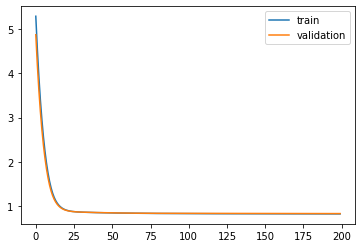

Time to train LSTM:  179.97971510887146
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 28s - loss: 6.3195 - pdc_loss: 0.7421 - event_loss: 0.7564 - val_loss: 5.7975 - val_pdc_loss: 0.7223 - val_event_loss: 0.7149

Epoch 00001: val_loss improved from inf to 5.79747, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 5.4211 - pdc_loss: 0.7105 - event_loss: 0.6874 - val_loss: 4.9703 - val_pdc_loss: 0.6946 - val_event_loss: 0.6530

Epoch 00002: val_loss improved from 5.79747 to 4.97032, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 4.6489 - pdc_loss: 0.6840 - event_loss: 0.6319 - val_loss: 4.2635 - val_pdc_loss: 0.6718 - val_event_loss: 0.6013

Epoch 00003: val_loss improved from 4.97032 to 4.26348, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 3.9905 - pdc_loss: 0.6625 - event_loss: 0.5836 - val_loss: 3.6625 - val_pdc_loss: 0.6532 - val_event_loss: 0.5547

Epoch 00004: val_loss improved from 4.26348 to 3.66252, saving


Epoch 00035: val_loss improved from 0.86906 to 0.86813, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 0.8694 - pdc_loss: 0.5374 - event_loss: 0.3185 - val_loss: 0.8671 - val_pdc_loss: 0.5398 - val_event_loss: 0.3139

Epoch 00036: val_loss improved from 0.86813 to 0.86710, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 0.8685 - pdc_loss: 0.5367 - event_loss: 0.3183 - val_loss: 0.8663 - val_pdc_loss: 0.5391 - val_event_loss: 0.3139

Epoch 00037: val_loss improved from 0.86710 to 0.86629, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 0.8676 - pdc_loss: 0.5361 - event_loss: 0.3183 - val_loss: 0.8653 - val_pdc_loss: 0.5384 - val_event_loss: 0.3137

Epoch 00038: val_loss improved from 0.86629 to 0.86533, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 0.8668 - pdc_loss: 0.5354 - event_loss: 0.3182 - val_loss: 0.8646 - val_pdc_loss: 0.5377 - val_event_loss: 0.3137

Epoch 00039: val_loss improved from 0.86533 to 


Epoch 00070: val_loss improved from 0.84601 to 0.84570, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 0.8478 - pdc_loss: 0.5203 - event_loss: 0.3168 - val_loss: 0.8454 - val_pdc_loss: 0.5223 - val_event_loss: 0.3124

Epoch 00071: val_loss improved from 0.84570 to 0.84540, saving model to Event_val_weights1.hdf5
Epoch 72/200
 - 1s - loss: 0.8475 - pdc_loss: 0.5201 - event_loss: 0.3168 - val_loss: 0.8451 - val_pdc_loss: 0.5220 - val_event_loss: 0.3126

Epoch 00072: val_loss improved from 0.84540 to 0.84515, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.8471 - pdc_loss: 0.5199 - event_loss: 0.3167 - val_loss: 0.8448 - val_pdc_loss: 0.5220 - val_event_loss: 0.3124

Epoch 00073: val_loss improved from 0.84515 to 0.84481, saving model to Event_val_weights1.hdf5
Epoch 74/200
 - 1s - loss: 0.8468 - pdc_loss: 0.5197 - event_loss: 0.3167 - val_loss: 0.8443 - val_pdc_loss: 0.5216 - val_event_loss: 0.3123

Epoch 00074: val_loss improved from 0.84481 to 


Epoch 00106: val_loss improved from 0.83947 to 0.83934, saving model to Event_val_weights1.hdf5
Epoch 107/200
 - 1s - loss: 0.8402 - pdc_loss: 0.5150 - event_loss: 0.3163 - val_loss: 0.8394 - val_pdc_loss: 0.5183 - val_event_loss: 0.3123

Epoch 00107: val_loss did not improve from 0.83934
Epoch 108/200
 - 1s - loss: 0.8400 - pdc_loss: 0.5150 - event_loss: 0.3163 - val_loss: 0.8393 - val_pdc_loss: 0.5185 - val_event_loss: 0.3121

Epoch 00108: val_loss improved from 0.83934 to 0.83934, saving model to Event_val_weights1.hdf5
Epoch 109/200
 - 1s - loss: 0.8400 - pdc_loss: 0.5149 - event_loss: 0.3163 - val_loss: 0.8391 - val_pdc_loss: 0.5183 - val_event_loss: 0.3120

Epoch 00109: val_loss improved from 0.83934 to 0.83907, saving model to Event_val_weights1.hdf5
Epoch 110/200
 - 1s - loss: 0.8398 - pdc_loss: 0.5148 - event_loss: 0.3163 - val_loss: 0.8394 - val_pdc_loss: 0.5184 - val_event_loss: 0.3123

Epoch 00110: val_loss did not improve from 0.83907
Epoch 111/200
 - 1s - loss: 0.8397 - 


Epoch 00145: val_loss did not improve from 0.83689
Epoch 146/200
 - 1s - loss: 0.8373 - pdc_loss: 0.5133 - event_loss: 0.3160 - val_loss: 0.8370 - val_pdc_loss: 0.5174 - val_event_loss: 0.3117

Epoch 00146: val_loss did not improve from 0.83689
Epoch 147/200
 - 1s - loss: 0.8372 - pdc_loss: 0.5133 - event_loss: 0.3160 - val_loss: 0.8370 - val_pdc_loss: 0.5172 - val_event_loss: 0.3119

Epoch 00147: val_loss did not improve from 0.83689
Epoch 148/200
 - 1s - loss: 0.8372 - pdc_loss: 0.5133 - event_loss: 0.3160 - val_loss: 0.8368 - val_pdc_loss: 0.5174 - val_event_loss: 0.3116

Epoch 00148: val_loss improved from 0.83689 to 0.83685, saving model to Event_val_weights1.hdf5
Epoch 149/200
 - 1s - loss: 0.8371 - pdc_loss: 0.5132 - event_loss: 0.3159 - val_loss: 0.8368 - val_pdc_loss: 0.5170 - val_event_loss: 0.3119

Epoch 00149: val_loss improved from 0.83685 to 0.83684, saving model to Event_val_weights1.hdf5
Epoch 150/200
 - 1s - loss: 0.8371 - pdc_loss: 0.5132 - event_loss: 0.3160 - val_l


Epoch 00184: val_loss did not improve from 0.83577
Epoch 185/200
 - 1s - loss: 0.8356 - pdc_loss: 0.5123 - event_loss: 0.3157 - val_loss: 0.8359 - val_pdc_loss: 0.5170 - val_event_loss: 0.3114

Epoch 00185: val_loss did not improve from 0.83577
Epoch 186/200
 - 1s - loss: 0.8355 - pdc_loss: 0.5123 - event_loss: 0.3157 - val_loss: 0.8360 - val_pdc_loss: 0.5171 - val_event_loss: 0.3114

Epoch 00186: val_loss did not improve from 0.83577
Epoch 187/200
 - 1s - loss: 0.8355 - pdc_loss: 0.5123 - event_loss: 0.3157 - val_loss: 0.8358 - val_pdc_loss: 0.5169 - val_event_loss: 0.3115

Epoch 00187: val_loss did not improve from 0.83577
Epoch 188/200
 - 1s - loss: 0.8354 - pdc_loss: 0.5122 - event_loss: 0.3157 - val_loss: 0.8361 - val_pdc_loss: 0.5172 - val_event_loss: 0.3115

Epoch 00188: val_loss did not improve from 0.83577
Epoch 189/200
 - 1s - loss: 0.8354 - pdc_loss: 0.5122 - event_loss: 0.3157 - val_loss: 0.8359 - val_pdc_loss: 0.5171 - val_event_loss: 0.3114

Epoch 00189: val_loss did not

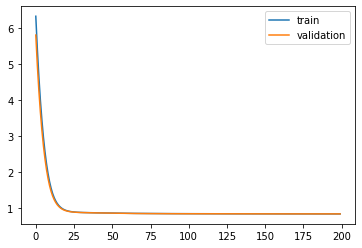

Time to train LSTM:  177.44763231277466
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 28s - loss: 6.1821 - pdc_loss: 0.7404 - event_loss: 0.6504 - val_loss: 5.6862 - val_pdc_loss: 0.7274 - val_event_loss: 0.6367

Epoch 00001: val_loss improved from inf to 5.68617, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 5.3163 - pdc_loss: 0.7124 - event_loss: 0.6233 - val_loss: 4.8865 - val_pdc_loss: 0.7023 - val_event_loss: 0.6084

Epoch 00002: val_loss improved from 5.68617 to 4.88651, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 4.5678 - pdc_loss: 0.6890 - event_loss: 0.5944 - val_loss: 4.2004 - val_pdc_loss: 0.6815 - val_event_loss: 0.5783

Epoch 00003: val_loss improved from 4.88651 to 4.20045, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 3.9283 - pdc_loss: 0.6695 - event_loss: 0.5634 - val_loss: 3.6167 - val_pdc_loss: 0.6638 - val_event_loss: 0.5459

Epoch 00004: val_loss improved from 4.20045 to 3.61668, saving


Epoch 00035: val_loss improved from 0.87626 to 0.87494, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 0.8596 - pdc_loss: 0.5265 - event_loss: 0.3194 - val_loss: 0.8734 - val_pdc_loss: 0.5334 - val_event_loss: 0.3264

Epoch 00036: val_loss improved from 0.87494 to 0.87338, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 0.8584 - pdc_loss: 0.5258 - event_loss: 0.3192 - val_loss: 0.8725 - val_pdc_loss: 0.5329 - val_event_loss: 0.3264

Epoch 00037: val_loss improved from 0.87338 to 0.87253, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 0.8574 - pdc_loss: 0.5252 - event_loss: 0.3191 - val_loss: 0.8714 - val_pdc_loss: 0.5322 - val_event_loss: 0.3262

Epoch 00038: val_loss improved from 0.87253 to 0.87137, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 0.8563 - pdc_loss: 0.5245 - event_loss: 0.3189 - val_loss: 0.8705 - val_pdc_loss: 0.5317 - val_event_loss: 0.3261

Epoch 00039: val_loss improved from 0.87137 to 


Epoch 00070: val_loss improved from 0.85940 to 0.85904, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.8432 - pdc_loss: 0.5173 - event_loss: 0.3165 - val_loss: 0.8591 - val_pdc_loss: 0.5275 - val_event_loss: 0.3222

Epoch 00071: val_loss did not improve from 0.85904
Epoch 72/200
 - 1s - loss: 0.8430 - pdc_loss: 0.5172 - event_loss: 0.3165 - val_loss: 0.8588 - val_pdc_loss: 0.5273 - val_event_loss: 0.3222

Epoch 00072: val_loss improved from 0.85904 to 0.85881, saving model to Event_val_weights2.hdf5
Epoch 73/200
 - 1s - loss: 0.8428 - pdc_loss: 0.5171 - event_loss: 0.3164 - val_loss: 0.8588 - val_pdc_loss: 0.5274 - val_event_loss: 0.3221

Epoch 00073: val_loss improved from 0.85881 to 0.85876, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.8427 - pdc_loss: 0.5170 - event_loss: 0.3164 - val_loss: 0.8586 - val_pdc_loss: 0.5273 - val_event_loss: 0.3221

Epoch 00074: val_loss improved from 0.85876 to 0.85861, saving model to Event_val_weights2.h

 - 1s - loss: 0.8384 - pdc_loss: 0.5145 - event_loss: 0.3156 - val_loss: 0.8557 - val_pdc_loss: 0.5264 - val_event_loss: 0.3210

Epoch 00108: val_loss improved from 0.85579 to 0.85571, saving model to Event_val_weights2.hdf5
Epoch 109/200
 - 1s - loss: 0.8383 - pdc_loss: 0.5144 - event_loss: 0.3156 - val_loss: 0.8557 - val_pdc_loss: 0.5265 - val_event_loss: 0.3209

Epoch 00109: val_loss did not improve from 0.85571
Epoch 110/200
 - 1s - loss: 0.8383 - pdc_loss: 0.5144 - event_loss: 0.3156 - val_loss: 0.8555 - val_pdc_loss: 0.5263 - val_event_loss: 0.3209

Epoch 00110: val_loss improved from 0.85571 to 0.85548, saving model to Event_val_weights2.hdf5
Epoch 111/200
 - 1s - loss: 0.8382 - pdc_loss: 0.5143 - event_loss: 0.3155 - val_loss: 0.8555 - val_pdc_loss: 0.5264 - val_event_loss: 0.3209

Epoch 00111: val_loss did not improve from 0.85548
Epoch 112/200
 - 1s - loss: 0.8381 - pdc_loss: 0.5143 - event_loss: 0.3155 - val_loss: 0.8552 - val_pdc_loss: 0.5261 - val_event_loss: 0.3209

Epoch


Epoch 00146: val_loss improved from 0.85360 to 0.85353, saving model to Event_val_weights2.hdf5
Epoch 147/200
 - 1s - loss: 0.8354 - pdc_loss: 0.5126 - event_loss: 0.3148 - val_loss: 0.8537 - val_pdc_loss: 0.5257 - val_event_loss: 0.3200

Epoch 00147: val_loss did not improve from 0.85353
Epoch 148/200
 - 1s - loss: 0.8353 - pdc_loss: 0.5126 - event_loss: 0.3148 - val_loss: 0.8535 - val_pdc_loss: 0.5255 - val_event_loss: 0.3200

Epoch 00148: val_loss improved from 0.85353 to 0.85348, saving model to Event_val_weights2.hdf5
Epoch 149/200
 - 1s - loss: 0.8353 - pdc_loss: 0.5126 - event_loss: 0.3148 - val_loss: 0.8533 - val_pdc_loss: 0.5255 - val_event_loss: 0.3199

Epoch 00149: val_loss improved from 0.85348 to 0.85325, saving model to Event_val_weights2.hdf5
Epoch 150/200
 - 1s - loss: 0.8352 - pdc_loss: 0.5125 - event_loss: 0.3148 - val_loss: 0.8535 - val_pdc_loss: 0.5255 - val_event_loss: 0.3200

Epoch 00150: val_loss did not improve from 0.85325
Epoch 151/200
 - 1s - loss: 0.8352 - 

 - 1s - loss: 0.8334 - pdc_loss: 0.5114 - event_loss: 0.3143 - val_loss: 0.8521 - val_pdc_loss: 0.5251 - val_event_loss: 0.3194

Epoch 00186: val_loss did not improve from 0.85199
Epoch 187/200
 - 1s - loss: 0.8333 - pdc_loss: 0.5113 - event_loss: 0.3143 - val_loss: 0.8523 - val_pdc_loss: 0.5252 - val_event_loss: 0.3196

Epoch 00187: val_loss did not improve from 0.85199
Epoch 188/200
 - 1s - loss: 0.8333 - pdc_loss: 0.5114 - event_loss: 0.3143 - val_loss: 0.8522 - val_pdc_loss: 0.5251 - val_event_loss: 0.3195

Epoch 00188: val_loss did not improve from 0.85199
Epoch 189/200
 - 1s - loss: 0.8332 - pdc_loss: 0.5114 - event_loss: 0.3143 - val_loss: 0.8520 - val_pdc_loss: 0.5249 - val_event_loss: 0.3196

Epoch 00189: val_loss did not improve from 0.85199
Epoch 190/200
 - 1s - loss: 0.8332 - pdc_loss: 0.5113 - event_loss: 0.3143 - val_loss: 0.8523 - val_pdc_loss: 0.5254 - val_event_loss: 0.3194

Epoch 00190: val_loss did not improve from 0.85199
Epoch 191/200
 - 1s - loss: 0.8331 - pdc_los

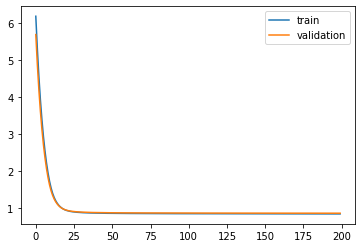

Time to train LSTM:  180.06793355941772
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 29s - loss: 6.2479 - pdc_loss: 0.6870 - event_loss: 0.6972 - val_loss: 5.7333 - val_pdc_loss: 0.6793 - val_event_loss: 0.6521

Epoch 00001: val_loss improved from inf to 5.73325, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 5.3513 - pdc_loss: 0.6731 - event_loss: 0.6150 - val_loss: 4.9123 - val_pdc_loss: 0.6670 - val_event_loss: 0.5847

Epoch 00002: val_loss improved from 5.73325 to 4.91229, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 4.5839 - pdc_loss: 0.6607 - event_loss: 0.5546 - val_loss: 4.2134 - val_pdc_loss: 0.6561 - val_event_loss: 0.5343

Epoch 00003: val_loss improved from 4.91229 to 4.21336, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 3.9313 - pdc_loss: 0.6490 - event_loss: 0.5077 - val_loss: 3.6210 - val_pdc_loss: 0.6455 - val_event_loss: 0.4936

Epoch 00004: val_loss improved from 4.21336 to 3.62097, saving


Epoch 00035: val_loss improved from 0.88398 to 0.88292, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 0.8604 - pdc_loss: 0.5309 - event_loss: 0.3165 - val_loss: 0.8820 - val_pdc_loss: 0.5453 - val_event_loss: 0.3237

Epoch 00036: val_loss improved from 0.88292 to 0.88200, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 0.8593 - pdc_loss: 0.5299 - event_loss: 0.3164 - val_loss: 0.8812 - val_pdc_loss: 0.5445 - val_event_loss: 0.3237

Epoch 00037: val_loss improved from 0.88200 to 0.88116, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 0.8582 - pdc_loss: 0.5290 - event_loss: 0.3164 - val_loss: 0.8803 - val_pdc_loss: 0.5439 - val_event_loss: 0.3237

Epoch 00038: val_loss improved from 0.88116 to 0.88032, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 0.8572 - pdc_loss: 0.5281 - event_loss: 0.3164 - val_loss: 0.8797 - val_pdc_loss: 0.5433 - val_event_loss: 0.3237

Epoch 00039: val_loss improved from 0.88032 to 


Epoch 00070: val_loss improved from 0.86821 to 0.86818, saving model to Event_val_weights3.hdf5
Epoch 71/200
 - 1s - loss: 0.8419 - pdc_loss: 0.5170 - event_loss: 0.3156 - val_loss: 0.8679 - val_pdc_loss: 0.5353 - val_event_loss: 0.3232

Epoch 00071: val_loss improved from 0.86818 to 0.86788, saving model to Event_val_weights3.hdf5
Epoch 72/200
 - 1s - loss: 0.8416 - pdc_loss: 0.5168 - event_loss: 0.3155 - val_loss: 0.8680 - val_pdc_loss: 0.5354 - val_event_loss: 0.3233

Epoch 00072: val_loss did not improve from 0.86788
Epoch 73/200
 - 1s - loss: 0.8414 - pdc_loss: 0.5167 - event_loss: 0.3155 - val_loss: 0.8675 - val_pdc_loss: 0.5351 - val_event_loss: 0.3232

Epoch 00073: val_loss improved from 0.86788 to 0.86752, saving model to Event_val_weights3.hdf5
Epoch 74/200
 - 1s - loss: 0.8412 - pdc_loss: 0.5165 - event_loss: 0.3155 - val_loss: 0.8675 - val_pdc_loss: 0.5351 - val_event_loss: 0.3232

Epoch 00074: val_loss did not improve from 0.86752
Epoch 75/200
 - 1s - loss: 0.8410 - pdc_l

 - 1s - loss: 0.8362 - pdc_loss: 0.5134 - event_loss: 0.3147 - val_loss: 0.8649 - val_pdc_loss: 0.5336 - val_event_loss: 0.3232

Epoch 00108: val_loss did not improve from 0.86480
Epoch 109/200
 - 1s - loss: 0.8361 - pdc_loss: 0.5133 - event_loss: 0.3146 - val_loss: 0.8648 - val_pdc_loss: 0.5335 - val_event_loss: 0.3232

Epoch 00109: val_loss improved from 0.86480 to 0.86477, saving model to Event_val_weights3.hdf5
Epoch 110/200
 - 1s - loss: 0.8360 - pdc_loss: 0.5133 - event_loss: 0.3146 - val_loss: 0.8647 - val_pdc_loss: 0.5334 - val_event_loss: 0.3232

Epoch 00110: val_loss improved from 0.86477 to 0.86466, saving model to Event_val_weights3.hdf5
Epoch 111/200
 - 1s - loss: 0.8359 - pdc_loss: 0.5132 - event_loss: 0.3146 - val_loss: 0.8646 - val_pdc_loss: 0.5333 - val_event_loss: 0.3232

Epoch 00111: val_loss improved from 0.86466 to 0.86455, saving model to Event_val_weights3.hdf5
Epoch 112/200
 - 1s - loss: 0.8358 - pdc_loss: 0.5132 - event_loss: 0.3146 - val_loss: 0.8646 - val_pdc

 - 1s - loss: 0.8334 - pdc_loss: 0.5117 - event_loss: 0.3142 - val_loss: 0.8635 - val_pdc_loss: 0.5327 - val_event_loss: 0.3232

Epoch 00146: val_loss did not improve from 0.86328
Epoch 147/200
 - 1s - loss: 0.8334 - pdc_loss: 0.5117 - event_loss: 0.3142 - val_loss: 0.8633 - val_pdc_loss: 0.5325 - val_event_loss: 0.3232

Epoch 00147: val_loss did not improve from 0.86328
Epoch 148/200
 - 1s - loss: 0.8333 - pdc_loss: 0.5116 - event_loss: 0.3141 - val_loss: 0.8633 - val_pdc_loss: 0.5326 - val_event_loss: 0.3232

Epoch 00148: val_loss did not improve from 0.86328
Epoch 149/200
 - 1s - loss: 0.8333 - pdc_loss: 0.5116 - event_loss: 0.3142 - val_loss: 0.8632 - val_pdc_loss: 0.5324 - val_event_loss: 0.3232

Epoch 00149: val_loss improved from 0.86328 to 0.86321, saving model to Event_val_weights3.hdf5
Epoch 150/200
 - 1s - loss: 0.8332 - pdc_loss: 0.5116 - event_loss: 0.3141 - val_loss: 0.8633 - val_pdc_loss: 0.5326 - val_event_loss: 0.3232

Epoch 00150: val_loss did not improve from 0.86321


Epoch 00184: val_loss did not improve from 0.86222
Epoch 185/200
 - 1s - loss: 0.8318 - pdc_loss: 0.5108 - event_loss: 0.3139 - val_loss: 0.8622 - val_pdc_loss: 0.5318 - val_event_loss: 0.3232

Epoch 00185: val_loss improved from 0.86222 to 0.86216, saving model to Event_val_weights3.hdf5
Epoch 186/200
 - 1s - loss: 0.8318 - pdc_loss: 0.5107 - event_loss: 0.3139 - val_loss: 0.8623 - val_pdc_loss: 0.5319 - val_event_loss: 0.3232

Epoch 00186: val_loss did not improve from 0.86216
Epoch 187/200
 - 1s - loss: 0.8318 - pdc_loss: 0.5107 - event_loss: 0.3139 - val_loss: 0.8622 - val_pdc_loss: 0.5319 - val_event_loss: 0.3232

Epoch 00187: val_loss did not improve from 0.86216
Epoch 188/200
 - 1s - loss: 0.8317 - pdc_loss: 0.5107 - event_loss: 0.3139 - val_loss: 0.8623 - val_pdc_loss: 0.5320 - val_event_loss: 0.3232

Epoch 00188: val_loss did not improve from 0.86216
Epoch 189/200
 - 1s - loss: 0.8317 - pdc_loss: 0.5107 - event_loss: 0.3139 - val_loss: 0.8621 - val_pdc_loss: 0.5317 - val_even

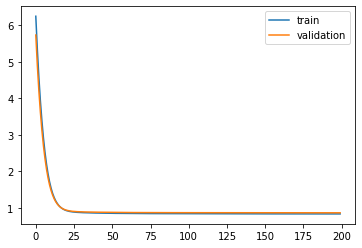

Time to train LSTM:  178.07204222679138
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 32s - loss: 6.2001 - pdc_loss: 0.7467 - event_loss: 0.6512 - val_loss: 5.6785 - val_pdc_loss: 0.7212 - val_event_loss: 0.6184

Epoch 00001: val_loss improved from inf to 5.67852, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 5.3109 - pdc_loss: 0.7153 - event_loss: 0.5949 - val_loss: 4.8608 - val_pdc_loss: 0.6925 - val_event_loss: 0.5688

Epoch 00002: val_loss improved from 5.67852 to 4.86083, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 4.5448 - pdc_loss: 0.6869 - event_loss: 0.5479 - val_loss: 4.1629 - val_pdc_loss: 0.6680 - val_event_loss: 0.5267

Epoch 00003: val_loss improved from 4.86083 to 4.16291, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 3.8929 - pdc_loss: 0.6620 - event_loss: 0.5076 - val_loss: 3.5730 - val_pdc_loss: 0.6476 - val_event_loss: 0.4905

Epoch 00004: val_loss improved from 4.16291 to 3.57302, saving


Epoch 00035: val_loss improved from 0.88528 to 0.88451, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 0.8561 - pdc_loss: 0.5248 - event_loss: 0.3172 - val_loss: 0.8840 - val_pdc_loss: 0.5421 - val_event_loss: 0.3280

Epoch 00036: val_loss improved from 0.88451 to 0.88399, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 0.8549 - pdc_loss: 0.5240 - event_loss: 0.3171 - val_loss: 0.8835 - val_pdc_loss: 0.5420 - val_event_loss: 0.3279

Epoch 00037: val_loss improved from 0.88399 to 0.88348, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 0.8539 - pdc_loss: 0.5232 - event_loss: 0.3171 - val_loss: 0.8831 - val_pdc_loss: 0.5419 - val_event_loss: 0.3278

Epoch 00038: val_loss improved from 0.88348 to 0.88310, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 0.8529 - pdc_loss: 0.5226 - event_loss: 0.3170 - val_loss: 0.8825 - val_pdc_loss: 0.5417 - val_event_loss: 0.3277

Epoch 00039: val_loss improved from 0.88310 to 

 - 1s - loss: 0.8401 - pdc_loss: 0.5153 - event_loss: 0.3151 - val_loss: 0.8717 - val_pdc_loss: 0.5361 - val_event_loss: 0.3259

Epoch 00070: val_loss improved from 0.87178 to 0.87169, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.8399 - pdc_loss: 0.5151 - event_loss: 0.3151 - val_loss: 0.8714 - val_pdc_loss: 0.5359 - val_event_loss: 0.3259

Epoch 00071: val_loss improved from 0.87169 to 0.87143, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.8397 - pdc_loss: 0.5151 - event_loss: 0.3150 - val_loss: 0.8713 - val_pdc_loss: 0.5359 - val_event_loss: 0.3258

Epoch 00072: val_loss improved from 0.87143 to 0.87133, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.8395 - pdc_loss: 0.5149 - event_loss: 0.3150 - val_loss: 0.8711 - val_pdc_loss: 0.5357 - val_event_loss: 0.3259

Epoch 00073: val_loss improved from 0.87133 to 0.87113, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.8393 - pdc_loss: 0.5148 - event_


Epoch 00105: val_loss improved from 0.86807 to 0.86794, saving model to Event_val_weights4.hdf5
Epoch 106/200
 - 1s - loss: 0.8352 - pdc_loss: 0.5126 - event_loss: 0.3139 - val_loss: 0.8680 - val_pdc_loss: 0.5337 - val_event_loss: 0.3256

Epoch 00106: val_loss did not improve from 0.86794
Epoch 107/200
 - 1s - loss: 0.8351 - pdc_loss: 0.5125 - event_loss: 0.3139 - val_loss: 0.8678 - val_pdc_loss: 0.5335 - val_event_loss: 0.3256

Epoch 00107: val_loss improved from 0.86794 to 0.86782, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.8350 - pdc_loss: 0.5125 - event_loss: 0.3138 - val_loss: 0.8678 - val_pdc_loss: 0.5336 - val_event_loss: 0.3255

Epoch 00108: val_loss did not improve from 0.86782
Epoch 109/200
 - 1s - loss: 0.8349 - pdc_loss: 0.5124 - event_loss: 0.3138 - val_loss: 0.8678 - val_pdc_loss: 0.5335 - val_event_loss: 0.3256

Epoch 00109: val_loss improved from 0.86782 to 0.86776, saving model to Event_val_weights4.hdf5
Epoch 110/200
 - 1s - loss: 0.8349 - 

 - 1s - loss: 0.8327 - pdc_loss: 0.5115 - event_loss: 0.3132 - val_loss: 0.8665 - val_pdc_loss: 0.5328 - val_event_loss: 0.3256

Epoch 00143: val_loss improved from 0.86650 to 0.86649, saving model to Event_val_weights4.hdf5
Epoch 144/200
 - 1s - loss: 0.8328 - pdc_loss: 0.5115 - event_loss: 0.3132 - val_loss: 0.8664 - val_pdc_loss: 0.5328 - val_event_loss: 0.3256

Epoch 00144: val_loss improved from 0.86649 to 0.86642, saving model to Event_val_weights4.hdf5
Epoch 145/200
 - 1s - loss: 0.8326 - pdc_loss: 0.5114 - event_loss: 0.3131 - val_loss: 0.8664 - val_pdc_loss: 0.5327 - val_event_loss: 0.3256

Epoch 00145: val_loss improved from 0.86642 to 0.86641, saving model to Event_val_weights4.hdf5
Epoch 146/200
 - 1s - loss: 0.8326 - pdc_loss: 0.5115 - event_loss: 0.3131 - val_loss: 0.8664 - val_pdc_loss: 0.5328 - val_event_loss: 0.3256

Epoch 00146: val_loss improved from 0.86641 to 0.86640, saving model to Event_val_weights4.hdf5
Epoch 147/200
 - 1s - loss: 0.8325 - pdc_loss: 0.5114 - ev

 - 1s - loss: 0.8311 - pdc_loss: 0.5107 - event_loss: 0.3127 - val_loss: 0.8656 - val_pdc_loss: 0.5323 - val_event_loss: 0.3257

Epoch 00181: val_loss improved from 0.86571 to 0.86564, saving model to Event_val_weights4.hdf5
Epoch 182/200
 - 1s - loss: 0.8311 - pdc_loss: 0.5107 - event_loss: 0.3127 - val_loss: 0.8657 - val_pdc_loss: 0.5324 - val_event_loss: 0.3256

Epoch 00182: val_loss did not improve from 0.86564
Epoch 183/200
 - 1s - loss: 0.8310 - pdc_loss: 0.5106 - event_loss: 0.3127 - val_loss: 0.8656 - val_pdc_loss: 0.5322 - val_event_loss: 0.3257

Epoch 00183: val_loss improved from 0.86564 to 0.86561, saving model to Event_val_weights4.hdf5
Epoch 184/200
 - 1s - loss: 0.8311 - pdc_loss: 0.5107 - event_loss: 0.3127 - val_loss: 0.8657 - val_pdc_loss: 0.5323 - val_event_loss: 0.3257

Epoch 00184: val_loss did not improve from 0.86561
Epoch 185/200
 - 1s - loss: 0.8309 - pdc_loss: 0.5106 - event_loss: 0.3127 - val_loss: 0.8656 - val_pdc_loss: 0.5323 - val_event_loss: 0.3257

Epoch

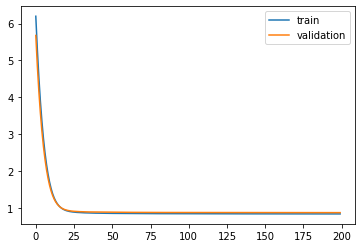

Time to train LSTM:  185.2850160598755
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 29s - loss: 6.3197 - pdc_loss: 0.7111 - event_loss: 0.7769 - val_loss: 5.7904 - val_pdc_loss: 0.7046 - val_event_loss: 0.7126

Epoch 00001: val_loss improved from inf to 5.79045, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 5.4068 - pdc_loss: 0.7004 - event_loss: 0.6704 - val_loss: 4.9558 - val_pdc_loss: 0.6940 - val_event_loss: 0.6272

Epoch 00002: val_loss improved from 5.79045 to 4.95576, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 4.6313 - pdc_loss: 0.6900 - event_loss: 0.5985 - val_loss: 4.2489 - val_pdc_loss: 0.6841 - val_event_loss: 0.5674

Epoch 00003: val_loss improved from 4.95576 to 4.24889, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 3.9752 - pdc_loss: 0.6805 - event_loss: 0.5455 - val_loss: 3.6519 - val_pdc_loss: 0.6751 - val_event_loss: 0.5199

Epoch 00004: val_loss improved from 4.24889 to 3.65190, saving 


Epoch 00035: val_loss improved from 0.87728 to 0.87601, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 0.8738 - pdc_loss: 0.5444 - event_loss: 0.3175 - val_loss: 0.8749 - val_pdc_loss: 0.5449 - val_event_loss: 0.3182

Epoch 00036: val_loss improved from 0.87601 to 0.87487, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 0.8727 - pdc_loss: 0.5435 - event_loss: 0.3175 - val_loss: 0.8738 - val_pdc_loss: 0.5440 - val_event_loss: 0.3181

Epoch 00037: val_loss improved from 0.87487 to 0.87381, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 0.8718 - pdc_loss: 0.5426 - event_loss: 0.3174 - val_loss: 0.8728 - val_pdc_loss: 0.5431 - val_event_loss: 0.3181

Epoch 00038: val_loss improved from 0.87381 to 0.87282, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 0.8708 - pdc_loss: 0.5418 - event_loss: 0.3174 - val_loss: 0.8719 - val_pdc_loss: 0.5422 - val_event_loss: 0.3180

Epoch 00039: val_loss improved from 0.87282 to 

 - 1s - loss: 0.8499 - pdc_loss: 0.5228 - event_loss: 0.3162 - val_loss: 0.8513 - val_pdc_loss: 0.5234 - val_event_loss: 0.3171

Epoch 00070: val_loss improved from 0.85155 to 0.85133, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.8496 - pdc_loss: 0.5227 - event_loss: 0.3162 - val_loss: 0.8511 - val_pdc_loss: 0.5233 - val_event_loss: 0.3170

Epoch 00071: val_loss improved from 0.85133 to 0.85107, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8492 - pdc_loss: 0.5225 - event_loss: 0.3161 - val_loss: 0.8510 - val_pdc_loss: 0.5234 - val_event_loss: 0.3170

Epoch 00072: val_loss improved from 0.85107 to 0.85100, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8489 - pdc_loss: 0.5223 - event_loss: 0.3161 - val_loss: 0.8508 - val_pdc_loss: 0.5233 - val_event_loss: 0.3170

Epoch 00073: val_loss improved from 0.85100 to 0.85085, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8486 - pdc_loss: 0.5220 - event_


Epoch 00105: val_loss improved from 0.84623 to 0.84608, saving model to Event_val_weights5.hdf5
Epoch 106/200
 - 1s - loss: 0.8423 - pdc_loss: 0.5181 - event_loss: 0.3150 - val_loss: 0.8461 - val_pdc_loss: 0.5203 - val_event_loss: 0.3166

Epoch 00106: val_loss improved from 0.84608 to 0.84605, saving model to Event_val_weights5.hdf5
Epoch 107/200
 - 1s - loss: 0.8422 - pdc_loss: 0.5181 - event_loss: 0.3150 - val_loss: 0.8459 - val_pdc_loss: 0.5202 - val_event_loss: 0.3165

Epoch 00107: val_loss improved from 0.84605 to 0.84587, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.8421 - pdc_loss: 0.5180 - event_loss: 0.3150 - val_loss: 0.8457 - val_pdc_loss: 0.5200 - val_event_loss: 0.3166

Epoch 00108: val_loss improved from 0.84587 to 0.84572, saving model to Event_val_weights5.hdf5
Epoch 109/200
 - 1s - loss: 0.8419 - pdc_loss: 0.5179 - event_loss: 0.3149 - val_loss: 0.8457 - val_pdc_loss: 0.5201 - val_event_loss: 0.3165

Epoch 00109: val_loss improved from 0.84572

 - 1s - loss: 0.8389 - pdc_loss: 0.5161 - event_loss: 0.3144 - val_loss: 0.8434 - val_pdc_loss: 0.5186 - val_event_loss: 0.3163

Epoch 00142: val_loss did not improve from 0.84334
Epoch 143/200
 - 1s - loss: 0.8388 - pdc_loss: 0.5160 - event_loss: 0.3144 - val_loss: 0.8432 - val_pdc_loss: 0.5185 - val_event_loss: 0.3163

Epoch 00143: val_loss improved from 0.84334 to 0.84322, saving model to Event_val_weights5.hdf5
Epoch 144/200
 - 1s - loss: 0.8387 - pdc_loss: 0.5160 - event_loss: 0.3143 - val_loss: 0.8432 - val_pdc_loss: 0.5185 - val_event_loss: 0.3163

Epoch 00144: val_loss did not improve from 0.84322
Epoch 145/200
 - 1s - loss: 0.8386 - pdc_loss: 0.5159 - event_loss: 0.3143 - val_loss: 0.8432 - val_pdc_loss: 0.5185 - val_event_loss: 0.3162

Epoch 00145: val_loss improved from 0.84322 to 0.84320, saving model to Event_val_weights5.hdf5
Epoch 146/200
 - 1s - loss: 0.8386 - pdc_loss: 0.5159 - event_loss: 0.3143 - val_loss: 0.8432 - val_pdc_loss: 0.5185 - val_event_loss: 0.3163

Epoch

 - 1s - loss: 0.8366 - pdc_loss: 0.5147 - event_loss: 0.3139 - val_loss: 0.8418 - val_pdc_loss: 0.5177 - val_event_loss: 0.3161

Epoch 00179: val_loss improved from 0.84182 to 0.84179, saving model to Event_val_weights5.hdf5
Epoch 180/200
 - 1s - loss: 0.8366 - pdc_loss: 0.5147 - event_loss: 0.3139 - val_loss: 0.8418 - val_pdc_loss: 0.5177 - val_event_loss: 0.3161

Epoch 00180: val_loss did not improve from 0.84179
Epoch 181/200
 - 1s - loss: 0.8365 - pdc_loss: 0.5147 - event_loss: 0.3139 - val_loss: 0.8417 - val_pdc_loss: 0.5177 - val_event_loss: 0.3161

Epoch 00181: val_loss improved from 0.84179 to 0.84169, saving model to Event_val_weights5.hdf5
Epoch 182/200
 - 1s - loss: 0.8365 - pdc_loss: 0.5146 - event_loss: 0.3139 - val_loss: 0.8417 - val_pdc_loss: 0.5176 - val_event_loss: 0.3161

Epoch 00182: val_loss improved from 0.84169 to 0.84168, saving model to Event_val_weights5.hdf5
Epoch 183/200
 - 1s - loss: 0.8364 - pdc_loss: 0.5146 - event_loss: 0.3139 - val_loss: 0.8416 - val_pdc

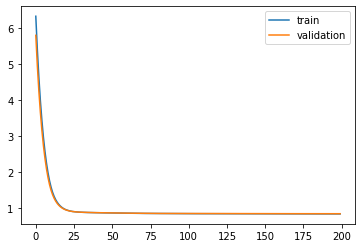

Time to train LSTM:  182.68538427352905
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 68s - loss: 4.4692 - pdc_loss: 0.6892 - event_loss: 0.6481 - val_loss: 4.1196 - val_pdc_loss: 0.6752 - val_event_loss: 0.6044

Epoch 00001: val_loss improved from inf to 4.11960, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 3.8808 - pdc_loss: 0.6764 - event_loss: 0.5788 - val_loss: 3.5789 - val_pdc_loss: 0.6637 - val_event_loss: 0.5449

Epoch 00002: val_loss improved from 4.11960 to 3.57890, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 3.3764 - pdc_loss: 0.6640 - event_loss: 0.5276 - val_loss: 3.1152 - val_pdc_loss: 0.6523 - val_event_loss: 0.4981

Epoch 00003: val_loss improved from 3.57890 to 3.11525, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 2.9444 - pdc_loss: 0.6518 - event_loss: 0.4860 - val_loss: 2.7190 - val_pdc_loss: 0.6409 - val_event_loss: 0.4585

Epoch 00004: val_loss improved from 3.11525 to 2.71899, saving


Epoch 00035: val_loss improved from 0.86450 to 0.86367, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 0.8649 - pdc_loss: 0.5356 - event_loss: 0.3173 - val_loss: 0.8627 - val_pdc_loss: 0.5376 - val_event_loss: 0.3132

Epoch 00036: val_loss improved from 0.86367 to 0.86275, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 0.8640 - pdc_loss: 0.5350 - event_loss: 0.3173 - val_loss: 0.8618 - val_pdc_loss: 0.5370 - val_event_loss: 0.3131

Epoch 00037: val_loss improved from 0.86275 to 0.86185, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 0.8633 - pdc_loss: 0.5343 - event_loss: 0.3173 - val_loss: 0.8611 - val_pdc_loss: 0.5363 - val_event_loss: 0.3132

Epoch 00038: val_loss improved from 0.86185 to 0.86113, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 0.8625 - pdc_loss: 0.5337 - event_loss: 0.3173 - val_loss: 0.8604 - val_pdc_loss: 0.5357 - val_event_loss: 0.3131

Epoch 00039: val_loss improved from 0.86113 to 


Epoch 00070: val_loss did not improve from 0.84575
Epoch 71/200
 - 1s - loss: 0.8475 - pdc_loss: 0.5215 - event_loss: 0.3165 - val_loss: 0.8453 - val_pdc_loss: 0.5242 - val_event_loss: 0.3116

Epoch 00071: val_loss improved from 0.84575 to 0.84526, saving model to Event_val_weights1.hdf5
Epoch 72/200
 - 1s - loss: 0.8472 - pdc_loss: 0.5213 - event_loss: 0.3164 - val_loss: 0.8453 - val_pdc_loss: 0.5241 - val_event_loss: 0.3117

Epoch 00072: val_loss did not improve from 0.84526
Epoch 73/200
 - 1s - loss: 0.8469 - pdc_loss: 0.5211 - event_loss: 0.3164 - val_loss: 0.8447 - val_pdc_loss: 0.5238 - val_event_loss: 0.3115

Epoch 00073: val_loss improved from 0.84526 to 0.84469, saving model to Event_val_weights1.hdf5
Epoch 74/200
 - 1s - loss: 0.8467 - pdc_loss: 0.5209 - event_loss: 0.3164 - val_loss: 0.8448 - val_pdc_loss: 0.5237 - val_event_loss: 0.3117

Epoch 00074: val_loss did not improve from 0.84469
Epoch 75/200
 - 1s - loss: 0.8464 - pdc_loss: 0.5207 - event_loss: 0.3163 - val_loss: 


Epoch 00106: val_loss did not improve from 0.83790
Epoch 107/200
 - 1s - loss: 0.8390 - pdc_loss: 0.5156 - event_loss: 0.3153 - val_loss: 0.8376 - val_pdc_loss: 0.5183 - val_event_loss: 0.3112

Epoch 00107: val_loss improved from 0.83790 to 0.83760, saving model to Event_val_weights1.hdf5
Epoch 108/200
 - 1s - loss: 0.8389 - pdc_loss: 0.5155 - event_loss: 0.3152 - val_loss: 0.8378 - val_pdc_loss: 0.5184 - val_event_loss: 0.3113

Epoch 00108: val_loss did not improve from 0.83760
Epoch 109/200
 - 1s - loss: 0.8388 - pdc_loss: 0.5155 - event_loss: 0.3152 - val_loss: 0.8374 - val_pdc_loss: 0.5183 - val_event_loss: 0.3111

Epoch 00109: val_loss improved from 0.83760 to 0.83744, saving model to Event_val_weights1.hdf5
Epoch 110/200
 - 1s - loss: 0.8386 - pdc_loss: 0.5154 - event_loss: 0.3152 - val_loss: 0.8375 - val_pdc_loss: 0.5182 - val_event_loss: 0.3113

Epoch 00110: val_loss did not improve from 0.83744
Epoch 111/200
 - 1s - loss: 0.8385 - pdc_loss: 0.5153 - event_loss: 0.3152 - val_l


Epoch 00145: val_loss did not improve from 0.83587
Epoch 146/200
 - 1s - loss: 0.8359 - pdc_loss: 0.5138 - event_loss: 0.3144 - val_loss: 0.8369 - val_pdc_loss: 0.5189 - val_event_loss: 0.3103

Epoch 00146: val_loss did not improve from 0.83587
Epoch 147/200
 - 1s - loss: 0.8358 - pdc_loss: 0.5137 - event_loss: 0.3144 - val_loss: 0.8367 - val_pdc_loss: 0.5190 - val_event_loss: 0.3100

Epoch 00147: val_loss did not improve from 0.83587
Epoch 148/200
 - 1s - loss: 0.8357 - pdc_loss: 0.5136 - event_loss: 0.3144 - val_loss: 0.8371 - val_pdc_loss: 0.5191 - val_event_loss: 0.3103

Epoch 00148: val_loss did not improve from 0.83587
Epoch 149/200
 - 1s - loss: 0.8357 - pdc_loss: 0.5136 - event_loss: 0.3144 - val_loss: 0.8368 - val_pdc_loss: 0.5191 - val_event_loss: 0.3100

Epoch 00149: val_loss did not improve from 0.83587
Epoch 150/200
 - 1s - loss: 0.8356 - pdc_loss: 0.5136 - event_loss: 0.3144 - val_loss: 0.8370 - val_pdc_loss: 0.5190 - val_event_loss: 0.3103

Epoch 00150: val_loss did not


Epoch 00185: val_loss did not improve from 0.83506
Epoch 186/200
 - 1s - loss: 0.8333 - pdc_loss: 0.5122 - event_loss: 0.3139 - val_loss: 0.8355 - val_pdc_loss: 0.5179 - val_event_loss: 0.3104

Epoch 00186: val_loss did not improve from 0.83506
Epoch 187/200
 - 1s - loss: 0.8333 - pdc_loss: 0.5121 - event_loss: 0.3140 - val_loss: 0.8350 - val_pdc_loss: 0.5178 - val_event_loss: 0.3100

Epoch 00187: val_loss improved from 0.83506 to 0.83500, saving model to Event_val_weights1.hdf5
Epoch 188/200
 - 1s - loss: 0.8332 - pdc_loss: 0.5121 - event_loss: 0.3139 - val_loss: 0.8354 - val_pdc_loss: 0.5180 - val_event_loss: 0.3103

Epoch 00188: val_loss did not improve from 0.83500
Epoch 189/200
 - 1s - loss: 0.8332 - pdc_loss: 0.5121 - event_loss: 0.3140 - val_loss: 0.8350 - val_pdc_loss: 0.5180 - val_event_loss: 0.3099

Epoch 00189: val_loss did not improve from 0.83500
Epoch 190/200
 - 1s - loss: 0.8332 - pdc_loss: 0.5121 - event_loss: 0.3139 - val_loss: 0.8355 - val_pdc_loss: 0.5180 - val_even

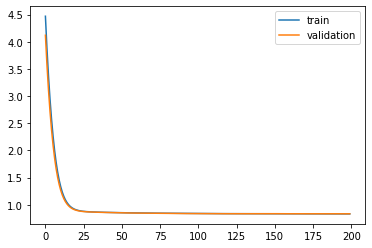

Time to train LSTM:  219.18705010414124
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 52s - loss: 4.4186 - pdc_loss: 0.6656 - event_loss: 0.6811 - val_loss: 4.0943 - val_pdc_loss: 0.6649 - val_event_loss: 0.6523

Epoch 00001: val_loss improved from inf to 4.09429, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 3.8490 - pdc_loss: 0.6553 - event_loss: 0.6317 - val_loss: 3.5687 - val_pdc_loss: 0.6544 - val_event_loss: 0.6075

Epoch 00002: val_loss improved from 4.09429 to 3.56870, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 3.3562 - pdc_loss: 0.6451 - event_loss: 0.5882 - val_loss: 3.1162 - val_pdc_loss: 0.6437 - val_event_loss: 0.5665

Epoch 00003: val_loss improved from 3.56870 to 3.11620, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 2.9332 - pdc_loss: 0.6343 - event_loss: 0.5480 - val_loss: 2.7284 - val_pdc_loss: 0.6323 - val_event_loss: 0.5277

Epoch 00004: val_loss improved from 3.11620 to 2.72840, saving


Epoch 00035: val_loss improved from 0.87146 to 0.87050, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 0.8552 - pdc_loss: 0.5260 - event_loss: 0.3168 - val_loss: 0.8697 - val_pdc_loss: 0.5337 - val_event_loss: 0.3237

Epoch 00036: val_loss improved from 0.87050 to 0.86966, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 0.8543 - pdc_loss: 0.5253 - event_loss: 0.3168 - val_loss: 0.8687 - val_pdc_loss: 0.5331 - val_event_loss: 0.3236

Epoch 00037: val_loss improved from 0.86966 to 0.86873, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 0.8534 - pdc_loss: 0.5247 - event_loss: 0.3167 - val_loss: 0.8681 - val_pdc_loss: 0.5326 - val_event_loss: 0.3236

Epoch 00038: val_loss improved from 0.86873 to 0.86808, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 0.8526 - pdc_loss: 0.5242 - event_loss: 0.3166 - val_loss: 0.8672 - val_pdc_loss: 0.5320 - val_event_loss: 0.3235

Epoch 00039: val_loss improved from 0.86808 to 


Epoch 00070: val_loss improved from 0.85732 to 0.85720, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.8405 - pdc_loss: 0.5158 - event_loss: 0.3153 - val_loss: 0.8570 - val_pdc_loss: 0.5259 - val_event_loss: 0.3217

Epoch 00071: val_loss improved from 0.85720 to 0.85698, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.8403 - pdc_loss: 0.5157 - event_loss: 0.3153 - val_loss: 0.8568 - val_pdc_loss: 0.5258 - val_event_loss: 0.3216

Epoch 00072: val_loss improved from 0.85698 to 0.85679, saving model to Event_val_weights2.hdf5
Epoch 73/200
 - 1s - loss: 0.8401 - pdc_loss: 0.5155 - event_loss: 0.3152 - val_loss: 0.8566 - val_pdc_loss: 0.5257 - val_event_loss: 0.3215

Epoch 00073: val_loss improved from 0.85679 to 0.85657, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.8399 - pdc_loss: 0.5154 - event_loss: 0.3152 - val_loss: 0.8563 - val_pdc_loss: 0.5257 - val_event_loss: 0.3214

Epoch 00074: val_loss improved from 0.85657 to 


Epoch 00107: val_loss did not improve from 0.85342
Epoch 108/200
 - 1s - loss: 0.8360 - pdc_loss: 0.5129 - event_loss: 0.3144 - val_loss: 0.8534 - val_pdc_loss: 0.5243 - val_event_loss: 0.3205

Epoch 00108: val_loss did not improve from 0.85342
Epoch 109/200
 - 1s - loss: 0.8359 - pdc_loss: 0.5129 - event_loss: 0.3144 - val_loss: 0.8536 - val_pdc_loss: 0.5244 - val_event_loss: 0.3205

Epoch 00109: val_loss did not improve from 0.85342
Epoch 110/200
 - 1s - loss: 0.8358 - pdc_loss: 0.5129 - event_loss: 0.3144 - val_loss: 0.8536 - val_pdc_loss: 0.5244 - val_event_loss: 0.3205

Epoch 00110: val_loss did not improve from 0.85342
Epoch 111/200
 - 1s - loss: 0.8357 - pdc_loss: 0.5128 - event_loss: 0.3143 - val_loss: 0.8535 - val_pdc_loss: 0.5244 - val_event_loss: 0.3205

Epoch 00111: val_loss did not improve from 0.85342
Epoch 112/200
 - 1s - loss: 0.8357 - pdc_loss: 0.5128 - event_loss: 0.3143 - val_loss: 0.8534 - val_pdc_loss: 0.5244 - val_event_loss: 0.3204

Epoch 00112: val_loss did not


Epoch 00146: val_loss improved from 0.85230 to 0.85223, saving model to Event_val_weights2.hdf5
Epoch 147/200
 - 1s - loss: 0.8330 - pdc_loss: 0.5111 - event_loss: 0.3138 - val_loss: 0.8523 - val_pdc_loss: 0.5243 - val_event_loss: 0.3199

Epoch 00147: val_loss did not improve from 0.85223
Epoch 148/200
 - 1s - loss: 0.8329 - pdc_loss: 0.5110 - event_loss: 0.3138 - val_loss: 0.8522 - val_pdc_loss: 0.5243 - val_event_loss: 0.3198

Epoch 00148: val_loss improved from 0.85223 to 0.85217, saving model to Event_val_weights2.hdf5
Epoch 149/200
 - 1s - loss: 0.8329 - pdc_loss: 0.5110 - event_loss: 0.3138 - val_loss: 0.8523 - val_pdc_loss: 0.5243 - val_event_loss: 0.3199

Epoch 00149: val_loss did not improve from 0.85217
Epoch 150/200
 - 1s - loss: 0.8328 - pdc_loss: 0.5110 - event_loss: 0.3138 - val_loss: 0.8521 - val_pdc_loss: 0.5241 - val_event_loss: 0.3199

Epoch 00150: val_loss improved from 0.85217 to 0.85213, saving model to Event_val_weights2.hdf5
Epoch 151/200
 - 1s - loss: 0.8328 - 

 - 1s - loss: 0.8311 - pdc_loss: 0.5100 - event_loss: 0.3134 - val_loss: 0.8515 - val_pdc_loss: 0.5241 - val_event_loss: 0.3197

Epoch 00186: val_loss improved from 0.85149 to 0.85147, saving model to Event_val_weights2.hdf5
Epoch 187/200
 - 1s - loss: 0.8311 - pdc_loss: 0.5100 - event_loss: 0.3134 - val_loss: 0.8515 - val_pdc_loss: 0.5242 - val_event_loss: 0.3196

Epoch 00187: val_loss did not improve from 0.85147
Epoch 188/200
 - 1s - loss: 0.8310 - pdc_loss: 0.5099 - event_loss: 0.3133 - val_loss: 0.8518 - val_pdc_loss: 0.5241 - val_event_loss: 0.3200

Epoch 00188: val_loss did not improve from 0.85147
Epoch 189/200
 - 1s - loss: 0.8310 - pdc_loss: 0.5099 - event_loss: 0.3133 - val_loss: 0.8519 - val_pdc_loss: 0.5242 - val_event_loss: 0.3200

Epoch 00189: val_loss did not improve from 0.85147
Epoch 190/200
 - 1s - loss: 0.8310 - pdc_loss: 0.5099 - event_loss: 0.3133 - val_loss: 0.8518 - val_pdc_loss: 0.5241 - val_event_loss: 0.3200

Epoch 00190: val_loss did not improve from 0.85147

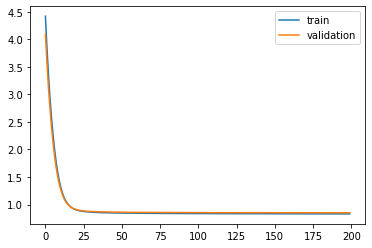

Time to train LSTM:  203.1360330581665
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 30s - loss: 4.6257 - pdc_loss: 0.7287 - event_loss: 0.6928 - val_loss: 4.2719 - val_pdc_loss: 0.7169 - val_event_loss: 0.6429

Epoch 00001: val_loss improved from inf to 4.27195, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 3.9997 - pdc_loss: 0.6979 - event_loss: 0.6052 - val_loss: 3.7030 - val_pdc_loss: 0.6902 - val_event_loss: 0.5735

Epoch 00002: val_loss improved from 4.27195 to 3.70302, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 3.4703 - pdc_loss: 0.6736 - event_loss: 0.5453 - val_loss: 3.2219 - val_pdc_loss: 0.6687 - val_event_loss: 0.5248

Epoch 00003: val_loss improved from 3.70302 to 3.22187, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 3.0221 - pdc_loss: 0.6538 - event_loss: 0.5013 - val_loss: 2.8151 - val_pdc_loss: 0.6509 - val_event_loss: 0.4877

Epoch 00004: val_loss improved from 3.22187 to 2.81510, saving 


Epoch 00035: val_loss improved from 0.88416 to 0.88343, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 0.8597 - pdc_loss: 0.5301 - event_loss: 0.3162 - val_loss: 0.8826 - val_pdc_loss: 0.5462 - val_event_loss: 0.3231

Epoch 00036: val_loss improved from 0.88343 to 0.88259, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 0.8587 - pdc_loss: 0.5293 - event_loss: 0.3161 - val_loss: 0.8817 - val_pdc_loss: 0.5456 - val_event_loss: 0.3230

Epoch 00037: val_loss improved from 0.88259 to 0.88172, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 0.8578 - pdc_loss: 0.5286 - event_loss: 0.3161 - val_loss: 0.8808 - val_pdc_loss: 0.5449 - val_event_loss: 0.3229

Epoch 00038: val_loss improved from 0.88172 to 0.88084, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 0.8568 - pdc_loss: 0.5279 - event_loss: 0.3159 - val_loss: 0.8801 - val_pdc_loss: 0.5444 - val_event_loss: 0.3228

Epoch 00039: val_loss improved from 0.88084 to 


Epoch 00070: val_loss improved from 0.86698 to 0.86689, saving model to Event_val_weights3.hdf5
Epoch 71/200
 - 1s - loss: 0.8396 - pdc_loss: 0.5159 - event_loss: 0.3141 - val_loss: 0.8665 - val_pdc_loss: 0.5346 - val_event_loss: 0.3224

Epoch 00071: val_loss improved from 0.86689 to 0.86655, saving model to Event_val_weights3.hdf5
Epoch 72/200
 - 1s - loss: 0.8394 - pdc_loss: 0.5157 - event_loss: 0.3141 - val_loss: 0.8664 - val_pdc_loss: 0.5346 - val_event_loss: 0.3224

Epoch 00072: val_loss improved from 0.86655 to 0.86645, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.8391 - pdc_loss: 0.5156 - event_loss: 0.3140 - val_loss: 0.8663 - val_pdc_loss: 0.5345 - val_event_loss: 0.3224

Epoch 00073: val_loss improved from 0.86645 to 0.86628, saving model to Event_val_weights3.hdf5
Epoch 74/200
 - 1s - loss: 0.8389 - pdc_loss: 0.5154 - event_loss: 0.3140 - val_loss: 0.8661 - val_pdc_loss: 0.5343 - val_event_loss: 0.3223

Epoch 00074: val_loss improved from 0.86628 to 

 - 1s - loss: 0.8342 - pdc_loss: 0.5127 - event_loss: 0.3132 - val_loss: 0.8632 - val_pdc_loss: 0.5325 - val_event_loss: 0.3225

Epoch 00107: val_loss did not improve from 0.86315
Epoch 108/200
 - 1s - loss: 0.8341 - pdc_loss: 0.5126 - event_loss: 0.3133 - val_loss: 0.8631 - val_pdc_loss: 0.5324 - val_event_loss: 0.3225

Epoch 00108: val_loss improved from 0.86315 to 0.86312, saving model to Event_val_weights3.hdf5
Epoch 109/200
 - 1s - loss: 0.8340 - pdc_loss: 0.5126 - event_loss: 0.3132 - val_loss: 0.8632 - val_pdc_loss: 0.5325 - val_event_loss: 0.3225

Epoch 00109: val_loss did not improve from 0.86312
Epoch 110/200
 - 1s - loss: 0.8339 - pdc_loss: 0.5125 - event_loss: 0.3132 - val_loss: 0.8630 - val_pdc_loss: 0.5324 - val_event_loss: 0.3225

Epoch 00110: val_loss improved from 0.86312 to 0.86300, saving model to Event_val_weights3.hdf5
Epoch 111/200
 - 1s - loss: 0.8338 - pdc_loss: 0.5124 - event_loss: 0.3132 - val_loss: 0.8629 - val_pdc_loss: 0.5323 - val_event_loss: 0.3225

Epoch


Epoch 00145: val_loss did not improve from 0.86191
Epoch 146/200
 - 1s - loss: 0.8312 - pdc_loss: 0.5110 - event_loss: 0.3126 - val_loss: 0.8618 - val_pdc_loss: 0.5321 - val_event_loss: 0.3221

Epoch 00146: val_loss improved from 0.86191 to 0.86181, saving model to Event_val_weights3.hdf5
Epoch 147/200
 - 1s - loss: 0.8311 - pdc_loss: 0.5109 - event_loss: 0.3126 - val_loss: 0.8617 - val_pdc_loss: 0.5320 - val_event_loss: 0.3222

Epoch 00147: val_loss improved from 0.86181 to 0.86175, saving model to Event_val_weights3.hdf5
Epoch 148/200
 - 1s - loss: 0.8311 - pdc_loss: 0.5109 - event_loss: 0.3126 - val_loss: 0.8619 - val_pdc_loss: 0.5322 - val_event_loss: 0.3222

Epoch 00148: val_loss did not improve from 0.86175
Epoch 149/200
 - 1s - loss: 0.8310 - pdc_loss: 0.5109 - event_loss: 0.3125 - val_loss: 0.8618 - val_pdc_loss: 0.5321 - val_event_loss: 0.3222

Epoch 00149: val_loss did not improve from 0.86175
Epoch 150/200
 - 1s - loss: 0.8309 - pdc_loss: 0.5108 - event_loss: 0.3126 - val_l


Epoch 00184: val_loss did not improve from 0.86103
Epoch 185/200
 - 1s - loss: 0.8293 - pdc_loss: 0.5100 - event_loss: 0.3121 - val_loss: 0.8611 - val_pdc_loss: 0.5319 - val_event_loss: 0.3220

Epoch 00185: val_loss did not improve from 0.86103
Epoch 186/200
 - 1s - loss: 0.8293 - pdc_loss: 0.5100 - event_loss: 0.3121 - val_loss: 0.8609 - val_pdc_loss: 0.5318 - val_event_loss: 0.3219

Epoch 00186: val_loss improved from 0.86103 to 0.86094, saving model to Event_val_weights3.hdf5
Epoch 187/200
 - 1s - loss: 0.8293 - pdc_loss: 0.5100 - event_loss: 0.3120 - val_loss: 0.8612 - val_pdc_loss: 0.5320 - val_event_loss: 0.3220

Epoch 00187: val_loss did not improve from 0.86094
Epoch 188/200
 - 1s - loss: 0.8292 - pdc_loss: 0.5100 - event_loss: 0.3121 - val_loss: 0.8610 - val_pdc_loss: 0.5319 - val_event_loss: 0.3220

Epoch 00188: val_loss did not improve from 0.86094
Epoch 189/200
 - 1s - loss: 0.8292 - pdc_loss: 0.5100 - event_loss: 0.3120 - val_loss: 0.8611 - val_pdc_loss: 0.5320 - val_even

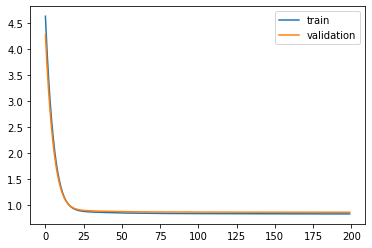

Time to train LSTM:  180.93822169303894
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 30s - loss: 4.5303 - pdc_loss: 0.6928 - event_loss: 0.7062 - val_loss: 4.1827 - val_pdc_loss: 0.6882 - val_event_loss: 0.6524

Epoch 00001: val_loss improved from inf to 4.18272, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 3.9308 - pdc_loss: 0.6807 - event_loss: 0.6212 - val_loss: 3.6391 - val_pdc_loss: 0.6799 - val_event_loss: 0.5848

Epoch 00002: val_loss improved from 4.18272 to 3.63909, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 3.4222 - pdc_loss: 0.6726 - event_loss: 0.5610 - val_loss: 3.1757 - val_pdc_loss: 0.6735 - val_event_loss: 0.5339

Epoch 00003: val_loss improved from 3.63909 to 3.17574, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 2.9887 - pdc_loss: 0.6658 - event_loss: 0.5135 - val_loss: 2.7801 - val_pdc_loss: 0.6667 - val_event_loss: 0.4916

Epoch 00004: val_loss improved from 3.17574 to 2.78014, saving


Epoch 00035: val_loss improved from 0.88584 to 0.88470, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 0.8572 - pdc_loss: 0.5289 - event_loss: 0.3157 - val_loss: 0.8837 - val_pdc_loss: 0.5444 - val_event_loss: 0.3268

Epoch 00036: val_loss improved from 0.88470 to 0.88369, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 0.8558 - pdc_loss: 0.5276 - event_loss: 0.3156 - val_loss: 0.8822 - val_pdc_loss: 0.5433 - val_event_loss: 0.3265

Epoch 00037: val_loss improved from 0.88369 to 0.88224, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 0.8544 - pdc_loss: 0.5264 - event_loss: 0.3156 - val_loss: 0.8809 - val_pdc_loss: 0.5422 - val_event_loss: 0.3265

Epoch 00038: val_loss improved from 0.88224 to 0.88091, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 0.8531 - pdc_loss: 0.5253 - event_loss: 0.3156 - val_loss: 0.8796 - val_pdc_loss: 0.5411 - val_event_loss: 0.3264

Epoch 00039: val_loss improved from 0.88091 to 

 - 1s - loss: 0.8372 - pdc_loss: 0.5138 - event_loss: 0.3139 - val_loss: 0.8694 - val_pdc_loss: 0.5350 - val_event_loss: 0.3250

Epoch 00070: val_loss improved from 0.86967 to 0.86938, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.8369 - pdc_loss: 0.5136 - event_loss: 0.3139 - val_loss: 0.8693 - val_pdc_loss: 0.5350 - val_event_loss: 0.3250

Epoch 00071: val_loss improved from 0.86938 to 0.86932, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.8367 - pdc_loss: 0.5136 - event_loss: 0.3139 - val_loss: 0.8691 - val_pdc_loss: 0.5349 - val_event_loss: 0.3250

Epoch 00072: val_loss improved from 0.86932 to 0.86913, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.8365 - pdc_loss: 0.5134 - event_loss: 0.3138 - val_loss: 0.8690 - val_pdc_loss: 0.5348 - val_event_loss: 0.3250

Epoch 00073: val_loss improved from 0.86913 to 0.86904, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.8364 - pdc_loss: 0.5134 - event_

 - 1s - loss: 0.8327 - pdc_loss: 0.5113 - event_loss: 0.3131 - val_loss: 0.8665 - val_pdc_loss: 0.5334 - val_event_loss: 0.3248

Epoch 00106: val_loss improved from 0.86655 to 0.86655, saving model to Event_val_weights4.hdf5
Epoch 107/200
 - 1s - loss: 0.8326 - pdc_loss: 0.5112 - event_loss: 0.3131 - val_loss: 0.8665 - val_pdc_loss: 0.5334 - val_event_loss: 0.3248

Epoch 00107: val_loss improved from 0.86655 to 0.86646, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.8325 - pdc_loss: 0.5112 - event_loss: 0.3131 - val_loss: 0.8664 - val_pdc_loss: 0.5334 - val_event_loss: 0.3249

Epoch 00108: val_loss improved from 0.86646 to 0.86644, saving model to Event_val_weights4.hdf5
Epoch 109/200
 - 1s - loss: 0.8324 - pdc_loss: 0.5112 - event_loss: 0.3130 - val_loss: 0.8664 - val_pdc_loss: 0.5334 - val_event_loss: 0.3248

Epoch 00109: val_loss improved from 0.86644 to 0.86638, saving model to Event_val_weights4.hdf5
Epoch 110/200
 - 1s - loss: 0.8323 - pdc_loss: 0.5112 - ev


Epoch 00142: val_loss did not improve from 0.86538
Epoch 143/200
 - 1s - loss: 0.8304 - pdc_loss: 0.5103 - event_loss: 0.3125 - val_loss: 0.8653 - val_pdc_loss: 0.5328 - val_event_loss: 0.3249

Epoch 00143: val_loss improved from 0.86538 to 0.86534, saving model to Event_val_weights4.hdf5
Epoch 144/200
 - 1s - loss: 0.8303 - pdc_loss: 0.5102 - event_loss: 0.3125 - val_loss: 0.8654 - val_pdc_loss: 0.5329 - val_event_loss: 0.3249

Epoch 00144: val_loss did not improve from 0.86534
Epoch 145/200
 - 1s - loss: 0.8303 - pdc_loss: 0.5102 - event_loss: 0.3125 - val_loss: 0.8653 - val_pdc_loss: 0.5329 - val_event_loss: 0.3249

Epoch 00145: val_loss improved from 0.86534 to 0.86531, saving model to Event_val_weights4.hdf5
Epoch 146/200
 - 1s - loss: 0.8302 - pdc_loss: 0.5102 - event_loss: 0.3125 - val_loss: 0.8654 - val_pdc_loss: 0.5329 - val_event_loss: 0.3249

Epoch 00146: val_loss did not improve from 0.86531
Epoch 147/200
 - 1s - loss: 0.8302 - pdc_loss: 0.5102 - event_loss: 0.3125 - val_l


Epoch 00182: val_loss did not improve from 0.86500
Epoch 183/200
 - 1s - loss: 0.8288 - pdc_loss: 0.5096 - event_loss: 0.3120 - val_loss: 0.8650 - val_pdc_loss: 0.5328 - val_event_loss: 0.3251

Epoch 00183: val_loss did not improve from 0.86500
Epoch 184/200
 - 1s - loss: 0.8287 - pdc_loss: 0.5096 - event_loss: 0.3120 - val_loss: 0.8651 - val_pdc_loss: 0.5329 - val_event_loss: 0.3251

Epoch 00184: val_loss did not improve from 0.86500
Epoch 185/200
 - 1s - loss: 0.8287 - pdc_loss: 0.5096 - event_loss: 0.3120 - val_loss: 0.8651 - val_pdc_loss: 0.5328 - val_event_loss: 0.3251

Epoch 00185: val_loss did not improve from 0.86500
Epoch 186/200
 - 1s - loss: 0.8287 - pdc_loss: 0.5096 - event_loss: 0.3120 - val_loss: 0.8651 - val_pdc_loss: 0.5329 - val_event_loss: 0.3251

Epoch 00186: val_loss did not improve from 0.86500
Epoch 187/200
 - 1s - loss: 0.8286 - pdc_loss: 0.5096 - event_loss: 0.3120 - val_loss: 0.8650 - val_pdc_loss: 0.5328 - val_event_loss: 0.3251

Epoch 00187: val_loss did not

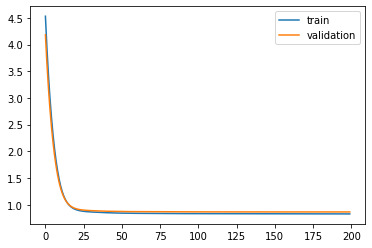

Time to train LSTM:  182.19495344161987
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 31s - loss: 4.5239 - pdc_loss: 0.6991 - event_loss: 0.7158 - val_loss: 4.1779 - val_pdc_loss: 0.6915 - val_event_loss: 0.6713

Epoch 00001: val_loss improved from inf to 4.17789, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 3.9366 - pdc_loss: 0.6902 - event_loss: 0.6464 - val_loss: 3.6394 - val_pdc_loss: 0.6842 - val_event_loss: 0.6109

Epoch 00002: val_loss improved from 4.17789 to 3.63943, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 3.4343 - pdc_loss: 0.6829 - event_loss: 0.5922 - val_loss: 3.1806 - val_pdc_loss: 0.6782 - val_event_loss: 0.5621

Epoch 00003: val_loss improved from 3.63943 to 3.18062, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 3.0070 - pdc_loss: 0.6769 - event_loss: 0.5470 - val_loss: 2.7907 - val_pdc_loss: 0.6733 - val_event_loss: 0.5196

Epoch 00004: val_loss improved from 3.18062 to 2.79069, saving


Epoch 00035: val_loss improved from 0.87275 to 0.87171, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 0.8688 - pdc_loss: 0.5402 - event_loss: 0.3170 - val_loss: 0.8707 - val_pdc_loss: 0.5418 - val_event_loss: 0.3175

Epoch 00036: val_loss improved from 0.87171 to 0.87074, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 0.8677 - pdc_loss: 0.5395 - event_loss: 0.3168 - val_loss: 0.8698 - val_pdc_loss: 0.5411 - val_event_loss: 0.3173

Epoch 00037: val_loss improved from 0.87074 to 0.86982, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 0.8668 - pdc_loss: 0.5387 - event_loss: 0.3166 - val_loss: 0.8689 - val_pdc_loss: 0.5404 - val_event_loss: 0.3173

Epoch 00038: val_loss improved from 0.86982 to 0.86890, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 0.8659 - pdc_loss: 0.5380 - event_loss: 0.3165 - val_loss: 0.8682 - val_pdc_loss: 0.5398 - val_event_loss: 0.3172

Epoch 00039: val_loss improved from 0.86890 to 

 - 1s - loss: 0.8502 - pdc_loss: 0.5255 - event_loss: 0.3149 - val_loss: 0.8540 - val_pdc_loss: 0.5284 - val_event_loss: 0.3159

Epoch 00070: val_loss improved from 0.85434 to 0.85404, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.8499 - pdc_loss: 0.5253 - event_loss: 0.3148 - val_loss: 0.8539 - val_pdc_loss: 0.5282 - val_event_loss: 0.3161

Epoch 00071: val_loss improved from 0.85404 to 0.85392, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8496 - pdc_loss: 0.5251 - event_loss: 0.3148 - val_loss: 0.8537 - val_pdc_loss: 0.5282 - val_event_loss: 0.3159

Epoch 00072: val_loss improved from 0.85392 to 0.85375, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8493 - pdc_loss: 0.5249 - event_loss: 0.3148 - val_loss: 0.8535 - val_pdc_loss: 0.5278 - val_event_loss: 0.3161

Epoch 00073: val_loss improved from 0.85375 to 0.85349, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8490 - pdc_loss: 0.5247 - event_


Epoch 00104: val_loss improved from 0.84816 to 0.84809, saving model to Event_val_weights5.hdf5
Epoch 105/200
 - 1s - loss: 0.8418 - pdc_loss: 0.5194 - event_loss: 0.3139 - val_loss: 0.8480 - val_pdc_loss: 0.5234 - val_event_loss: 0.3161

Epoch 00105: val_loss improved from 0.84809 to 0.84801, saving model to Event_val_weights5.hdf5
Epoch 106/200
 - 1s - loss: 0.8417 - pdc_loss: 0.5193 - event_loss: 0.3139 - val_loss: 0.8478 - val_pdc_loss: 0.5233 - val_event_loss: 0.3161

Epoch 00106: val_loss improved from 0.84801 to 0.84784, saving model to Event_val_weights5.hdf5
Epoch 107/200
 - 1s - loss: 0.8415 - pdc_loss: 0.5191 - event_loss: 0.3139 - val_loss: 0.8477 - val_pdc_loss: 0.5232 - val_event_loss: 0.3161

Epoch 00107: val_loss improved from 0.84784 to 0.84774, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.8413 - pdc_loss: 0.5190 - event_loss: 0.3138 - val_loss: 0.8476 - val_pdc_loss: 0.5231 - val_event_loss: 0.3160

Epoch 00108: val_loss improved from 0.84774

 - 1s - loss: 0.8370 - pdc_loss: 0.5159 - event_loss: 0.3131 - val_loss: 0.8455 - val_pdc_loss: 0.5211 - val_event_loss: 0.3165

Epoch 00141: val_loss did not improve from 0.84542
Epoch 142/200
 - 1s - loss: 0.8369 - pdc_loss: 0.5159 - event_loss: 0.3131 - val_loss: 0.8455 - val_pdc_loss: 0.5210 - val_event_loss: 0.3165

Epoch 00142: val_loss did not improve from 0.84542
Epoch 143/200
 - 1s - loss: 0.8368 - pdc_loss: 0.5159 - event_loss: 0.3131 - val_loss: 0.8454 - val_pdc_loss: 0.5209 - val_event_loss: 0.3166

Epoch 00143: val_loss improved from 0.84542 to 0.84537, saving model to Event_val_weights5.hdf5
Epoch 144/200
 - 1s - loss: 0.8368 - pdc_loss: 0.5158 - event_loss: 0.3131 - val_loss: 0.8455 - val_pdc_loss: 0.5211 - val_event_loss: 0.3165

Epoch 00144: val_loss did not improve from 0.84537
Epoch 145/200
 - 1s - loss: 0.8367 - pdc_loss: 0.5158 - event_loss: 0.3131 - val_loss: 0.8455 - val_pdc_loss: 0.5211 - val_event_loss: 0.3166

Epoch 00145: val_loss did not improve from 0.84537


Epoch 00179: val_loss did not improve from 0.84348
Epoch 180/200
 - 1s - loss: 0.8345 - pdc_loss: 0.5142 - event_loss: 0.3128 - val_loss: 0.8434 - val_pdc_loss: 0.5196 - val_event_loss: 0.3163

Epoch 00180: val_loss improved from 0.84348 to 0.84344, saving model to Event_val_weights5.hdf5
Epoch 181/200
 - 1s - loss: 0.8344 - pdc_loss: 0.5141 - event_loss: 0.3128 - val_loss: 0.8436 - val_pdc_loss: 0.5197 - val_event_loss: 0.3164

Epoch 00181: val_loss did not improve from 0.84344
Epoch 182/200
 - 1s - loss: 0.8344 - pdc_loss: 0.5141 - event_loss: 0.3128 - val_loss: 0.8434 - val_pdc_loss: 0.5195 - val_event_loss: 0.3164

Epoch 00182: val_loss improved from 0.84344 to 0.84342, saving model to Event_val_weights5.hdf5
Epoch 183/200
 - 1s - loss: 0.8343 - pdc_loss: 0.5140 - event_loss: 0.3128 - val_loss: 0.8438 - val_pdc_loss: 0.5199 - val_event_loss: 0.3164

Epoch 00183: val_loss did not improve from 0.84342
Epoch 184/200
 - 1s - loss: 0.8343 - pdc_loss: 0.5140 - event_loss: 0.3128 - val_l

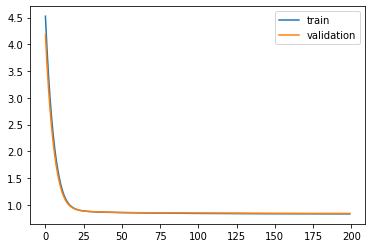

Time to train LSTM:  184.03026676177979
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 31s - loss: 4.3672 - pdc_loss: 0.7772 - event_loss: 0.6879 - val_loss: 4.0389 - val_pdc_loss: 0.7542 - val_event_loss: 0.6546

Epoch 00001: val_loss improved from inf to 4.03892, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 3.8014 - pdc_loss: 0.7382 - event_loss: 0.6326 - val_loss: 3.5164 - val_pdc_loss: 0.7197 - val_event_loss: 0.6033

Epoch 00002: val_loss improved from 4.03892 to 3.51641, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 3.3133 - pdc_loss: 0.7063 - event_loss: 0.5856 - val_loss: 3.0664 - val_pdc_loss: 0.6909 - val_event_loss: 0.5576

Epoch 00003: val_loss improved from 3.51641 to 3.06636, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 2.8939 - pdc_loss: 0.6798 - event_loss: 0.5425 - val_loss: 2.6800 - val_pdc_loss: 0.6660 - val_event_loss: 0.5146

Epoch 00004: val_loss improved from 3.06636 to 2.67998, saving


Epoch 00035: val_loss improved from 0.85891 to 0.85797, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 0.8594 - pdc_loss: 0.5298 - event_loss: 0.3170 - val_loss: 0.8572 - val_pdc_loss: 0.5322 - val_event_loss: 0.3124

Epoch 00036: val_loss improved from 0.85797 to 0.85718, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 0.8586 - pdc_loss: 0.5292 - event_loss: 0.3170 - val_loss: 0.8564 - val_pdc_loss: 0.5317 - val_event_loss: 0.3124

Epoch 00037: val_loss improved from 0.85718 to 0.85644, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 0.8578 - pdc_loss: 0.5286 - event_loss: 0.3169 - val_loss: 0.8557 - val_pdc_loss: 0.5312 - val_event_loss: 0.3123

Epoch 00038: val_loss improved from 0.85644 to 0.85574, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 0.8571 - pdc_loss: 0.5281 - event_loss: 0.3169 - val_loss: 0.8552 - val_pdc_loss: 0.5308 - val_event_loss: 0.3124

Epoch 00039: val_loss improved from 0.85574 to 

 - 1s - loss: 0.8462 - pdc_loss: 0.5207 - event_loss: 0.3161 - val_loss: 0.8473 - val_pdc_loss: 0.5261 - val_event_loss: 0.3117

Epoch 00071: val_loss improved from 0.84735 to 0.84726, saving model to Event_val_weights1.hdf5
Epoch 72/200
 - 1s - loss: 0.8461 - pdc_loss: 0.5206 - event_loss: 0.3160 - val_loss: 0.8472 - val_pdc_loss: 0.5261 - val_event_loss: 0.3117

Epoch 00072: val_loss improved from 0.84726 to 0.84722, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.8459 - pdc_loss: 0.5205 - event_loss: 0.3160 - val_loss: 0.8467 - val_pdc_loss: 0.5259 - val_event_loss: 0.3114

Epoch 00073: val_loss improved from 0.84722 to 0.84666, saving model to Event_val_weights1.hdf5
Epoch 74/200
 - 1s - loss: 0.8457 - pdc_loss: 0.5204 - event_loss: 0.3159 - val_loss: 0.8472 - val_pdc_loss: 0.5260 - val_event_loss: 0.3119

Epoch 00074: val_loss did not improve from 0.84666
Epoch 75/200
 - 1s - loss: 0.8455 - pdc_loss: 0.5203 - event_loss: 0.3159 - val_loss: 0.8465 - val_pdc_los

 - 1s - loss: 0.8409 - pdc_loss: 0.5176 - event_loss: 0.3152 - val_loss: 0.8427 - val_pdc_loss: 0.5234 - val_event_loss: 0.3111

Epoch 00109: val_loss improved from 0.84275 to 0.84265, saving model to Event_val_weights1.hdf5
Epoch 110/200
 - 1s - loss: 0.8409 - pdc_loss: 0.5176 - event_loss: 0.3152 - val_loss: 0.8427 - val_pdc_loss: 0.5234 - val_event_loss: 0.3111

Epoch 00110: val_loss did not improve from 0.84265
Epoch 111/200
 - 1s - loss: 0.8407 - pdc_loss: 0.5174 - event_loss: 0.3152 - val_loss: 0.8426 - val_pdc_loss: 0.5234 - val_event_loss: 0.3111

Epoch 00111: val_loss improved from 0.84265 to 0.84261, saving model to Event_val_weights1.hdf5
Epoch 112/200
 - 1s - loss: 0.8407 - pdc_loss: 0.5174 - event_loss: 0.3151 - val_loss: 0.8425 - val_pdc_loss: 0.5234 - val_event_loss: 0.3110

Epoch 00112: val_loss improved from 0.84261 to 0.84251, saving model to Event_val_weights1.hdf5
Epoch 113/200
 - 1s - loss: 0.8405 - pdc_loss: 0.5173 - event_loss: 0.3151 - val_loss: 0.8424 - val_pdc

 - 1s - loss: 0.8376 - pdc_loss: 0.5153 - event_loss: 0.3148 - val_loss: 0.8396 - val_pdc_loss: 0.5213 - val_event_loss: 0.3109

Epoch 00146: val_loss improved from 0.83977 to 0.83964, saving model to Event_val_weights1.hdf5
Epoch 147/200
 - 1s - loss: 0.8374 - pdc_loss: 0.5152 - event_loss: 0.3148 - val_loss: 0.8398 - val_pdc_loss: 0.5213 - val_event_loss: 0.3110

Epoch 00147: val_loss did not improve from 0.83964
Epoch 148/200
 - 1s - loss: 0.8374 - pdc_loss: 0.5152 - event_loss: 0.3148 - val_loss: 0.8394 - val_pdc_loss: 0.5212 - val_event_loss: 0.3108

Epoch 00148: val_loss improved from 0.83964 to 0.83942, saving model to Event_val_weights1.hdf5
Epoch 149/200
 - 1s - loss: 0.8373 - pdc_loss: 0.5151 - event_loss: 0.3147 - val_loss: 0.8396 - val_pdc_loss: 0.5212 - val_event_loss: 0.3109

Epoch 00149: val_loss did not improve from 0.83942
Epoch 150/200
 - 1s - loss: 0.8373 - pdc_loss: 0.5151 - event_loss: 0.3147 - val_loss: 0.8393 - val_pdc_loss: 0.5210 - val_event_loss: 0.3108

Epoch


Epoch 00184: val_loss did not improve from 0.83727
Epoch 185/200
 - 1s - loss: 0.8353 - pdc_loss: 0.5137 - event_loss: 0.3145 - val_loss: 0.8372 - val_pdc_loss: 0.5194 - val_event_loss: 0.3107

Epoch 00185: val_loss improved from 0.83727 to 0.83715, saving model to Event_val_weights1.hdf5
Epoch 186/200
 - 1s - loss: 0.8352 - pdc_loss: 0.5137 - event_loss: 0.3145 - val_loss: 0.8370 - val_pdc_loss: 0.5193 - val_event_loss: 0.3107

Epoch 00186: val_loss improved from 0.83715 to 0.83698, saving model to Event_val_weights1.hdf5
Epoch 187/200
 - 1s - loss: 0.8352 - pdc_loss: 0.5137 - event_loss: 0.3145 - val_loss: 0.8373 - val_pdc_loss: 0.5194 - val_event_loss: 0.3108

Epoch 00187: val_loss did not improve from 0.83698
Epoch 188/200
 - 1s - loss: 0.8351 - pdc_loss: 0.5137 - event_loss: 0.3144 - val_loss: 0.8371 - val_pdc_loss: 0.5193 - val_event_loss: 0.3108

Epoch 00188: val_loss did not improve from 0.83698
Epoch 189/200
 - 1s - loss: 0.8351 - pdc_loss: 0.5136 - event_loss: 0.3144 - val_l

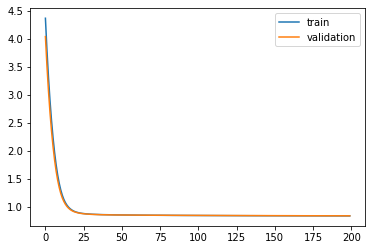

Time to train LSTM:  181.6310830116272
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 30s - loss: 4.2754 - pdc_loss: 0.7051 - event_loss: 0.6929 - val_loss: 3.9614 - val_pdc_loss: 0.6966 - val_event_loss: 0.6595

Epoch 00001: val_loss improved from inf to 3.96140, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 3.7316 - pdc_loss: 0.6903 - event_loss: 0.6354 - val_loss: 3.4599 - val_pdc_loss: 0.6828 - val_event_loss: 0.6085

Epoch 00002: val_loss improved from 3.96140 to 3.45994, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 3.2603 - pdc_loss: 0.6764 - event_loss: 0.5872 - val_loss: 3.0268 - val_pdc_loss: 0.6692 - val_event_loss: 0.5640

Epoch 00003: val_loss improved from 3.45994 to 3.02677, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 2.8544 - pdc_loss: 0.6629 - event_loss: 0.5438 - val_loss: 2.6550 - val_pdc_loss: 0.6560 - val_event_loss: 0.5230

Epoch 00004: val_loss improved from 3.02677 to 2.65496, saving 


Epoch 00035: val_loss improved from 0.87792 to 0.87671, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 0.8622 - pdc_loss: 0.5324 - event_loss: 0.3169 - val_loss: 0.8756 - val_pdc_loss: 0.5389 - val_event_loss: 0.3237

Epoch 00036: val_loss improved from 0.87671 to 0.87555, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 0.8609 - pdc_loss: 0.5313 - event_loss: 0.3168 - val_loss: 0.8744 - val_pdc_loss: 0.5379 - val_event_loss: 0.3237

Epoch 00037: val_loss improved from 0.87555 to 0.87441, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 0.8596 - pdc_loss: 0.5302 - event_loss: 0.3167 - val_loss: 0.8733 - val_pdc_loss: 0.5370 - val_event_loss: 0.3237

Epoch 00038: val_loss improved from 0.87441 to 0.87332, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 0.8583 - pdc_loss: 0.5290 - event_loss: 0.3167 - val_loss: 0.8723 - val_pdc_loss: 0.5360 - val_event_loss: 0.3237

Epoch 00039: val_loss improved from 0.87332 to 

 - 1s - loss: 0.8397 - pdc_loss: 0.5163 - event_loss: 0.3145 - val_loss: 0.8564 - val_pdc_loss: 0.5259 - val_event_loss: 0.3215

Epoch 00070: val_loss improved from 0.85655 to 0.85638, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.8395 - pdc_loss: 0.5162 - event_loss: 0.3144 - val_loss: 0.8562 - val_pdc_loss: 0.5258 - val_event_loss: 0.3214

Epoch 00071: val_loss improved from 0.85638 to 0.85617, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.8392 - pdc_loss: 0.5160 - event_loss: 0.3143 - val_loss: 0.8560 - val_pdc_loss: 0.5256 - val_event_loss: 0.3215

Epoch 00072: val_loss improved from 0.85617 to 0.85601, saving model to Event_val_weights2.hdf5
Epoch 73/200
 - 1s - loss: 0.8391 - pdc_loss: 0.5159 - event_loss: 0.3143 - val_loss: 0.8560 - val_pdc_loss: 0.5257 - val_event_loss: 0.3214

Epoch 00073: val_loss improved from 0.85601 to 0.85600, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.8388 - pdc_loss: 0.5157 - event_

 - 1s - loss: 0.8339 - pdc_loss: 0.5127 - event_loss: 0.3132 - val_loss: 0.8524 - val_pdc_loss: 0.5235 - val_event_loss: 0.3208

Epoch 00108: val_loss did not improve from 0.85228
Epoch 109/200
 - 1s - loss: 0.8339 - pdc_loss: 0.5126 - event_loss: 0.3132 - val_loss: 0.8523 - val_pdc_loss: 0.5236 - val_event_loss: 0.3207

Epoch 00109: val_loss improved from 0.85228 to 0.85226, saving model to Event_val_weights2.hdf5
Epoch 110/200
 - 1s - loss: 0.8337 - pdc_loss: 0.5126 - event_loss: 0.3131 - val_loss: 0.8522 - val_pdc_loss: 0.5235 - val_event_loss: 0.3208

Epoch 00110: val_loss improved from 0.85226 to 0.85224, saving model to Event_val_weights2.hdf5
Epoch 111/200
 - 1s - loss: 0.8336 - pdc_loss: 0.5125 - event_loss: 0.3132 - val_loss: 0.8521 - val_pdc_loss: 0.5235 - val_event_loss: 0.3206

Epoch 00111: val_loss improved from 0.85224 to 0.85208, saving model to Event_val_weights2.hdf5
Epoch 112/200
 - 1s - loss: 0.8335 - pdc_loss: 0.5124 - event_loss: 0.3131 - val_loss: 0.8522 - val_pdc


Epoch 00146: val_loss did not improve from 0.85045
Epoch 147/200
 - 1s - loss: 0.8308 - pdc_loss: 0.5108 - event_loss: 0.3126 - val_loss: 0.8505 - val_pdc_loss: 0.5227 - val_event_loss: 0.3203

Epoch 00147: val_loss did not improve from 0.85045
Epoch 148/200
 - 1s - loss: 0.8307 - pdc_loss: 0.5107 - event_loss: 0.3126 - val_loss: 0.8504 - val_pdc_loss: 0.5224 - val_event_loss: 0.3205

Epoch 00148: val_loss improved from 0.85045 to 0.85036, saving model to Event_val_weights2.hdf5
Epoch 149/200
 - 1s - loss: 0.8307 - pdc_loss: 0.5107 - event_loss: 0.3125 - val_loss: 0.8503 - val_pdc_loss: 0.5226 - val_event_loss: 0.3203

Epoch 00149: val_loss improved from 0.85036 to 0.85029, saving model to Event_val_weights2.hdf5
Epoch 150/200
 - 1s - loss: 0.8306 - pdc_loss: 0.5107 - event_loss: 0.3126 - val_loss: 0.8502 - val_pdc_loss: 0.5224 - val_event_loss: 0.3204

Epoch 00150: val_loss improved from 0.85029 to 0.85016, saving model to Event_val_weights2.hdf5
Epoch 151/200
 - 1s - loss: 0.8306 - 


Epoch 00187: val_loss did not improve from 0.84968
Epoch 188/200
 - 1s - loss: 0.8287 - pdc_loss: 0.5096 - event_loss: 0.3120 - val_loss: 0.8499 - val_pdc_loss: 0.5222 - val_event_loss: 0.3207

Epoch 00188: val_loss did not improve from 0.84968
Epoch 189/200
 - 1s - loss: 0.8286 - pdc_loss: 0.5096 - event_loss: 0.3120 - val_loss: 0.8501 - val_pdc_loss: 0.5225 - val_event_loss: 0.3206

Epoch 00189: val_loss did not improve from 0.84968
Epoch 190/200
 - 1s - loss: 0.8285 - pdc_loss: 0.5095 - event_loss: 0.3120 - val_loss: 0.8499 - val_pdc_loss: 0.5222 - val_event_loss: 0.3207

Epoch 00190: val_loss did not improve from 0.84968
Epoch 191/200
 - 1s - loss: 0.8286 - pdc_loss: 0.5095 - event_loss: 0.3120 - val_loss: 0.8502 - val_pdc_loss: 0.5225 - val_event_loss: 0.3206

Epoch 00191: val_loss did not improve from 0.84968
Epoch 192/200
 - 1s - loss: 0.8285 - pdc_loss: 0.5095 - event_loss: 0.3120 - val_loss: 0.8499 - val_pdc_loss: 0.5222 - val_event_loss: 0.3207

Epoch 00192: val_loss did not

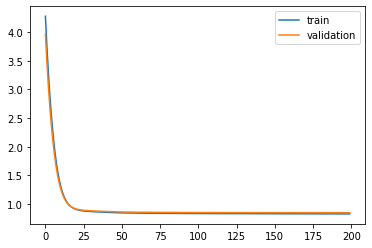

Time to train LSTM:  178.66739559173584
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 31s - loss: 4.3348 - pdc_loss: 0.7134 - event_loss: 0.7095 - val_loss: 4.0223 - val_pdc_loss: 0.6984 - val_event_loss: 0.6893

Epoch 00001: val_loss improved from inf to 4.02234, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 3.7903 - pdc_loss: 0.6876 - event_loss: 0.6703 - val_loss: 3.5180 - val_pdc_loss: 0.6755 - val_event_loss: 0.6498

Epoch 00002: val_loss improved from 4.02234 to 3.51803, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 3.3155 - pdc_loss: 0.6655 - event_loss: 0.6301 - val_loss: 3.0814 - val_pdc_loss: 0.6567 - val_event_loss: 0.6088

Epoch 00003: val_loss improved from 3.51803 to 3.08142, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 2.9050 - pdc_loss: 0.6471 - event_loss: 0.5881 - val_loss: 2.7057 - val_pdc_loss: 0.6412 - val_event_loss: 0.5666

Epoch 00004: val_loss improved from 3.08142 to 2.70566, saving


Epoch 00035: val_loss improved from 0.88286 to 0.88208, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 0.8585 - pdc_loss: 0.5281 - event_loss: 0.3182 - val_loss: 0.8814 - val_pdc_loss: 0.5444 - val_event_loss: 0.3249

Epoch 00036: val_loss improved from 0.88208 to 0.88135, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 0.8576 - pdc_loss: 0.5275 - event_loss: 0.3181 - val_loss: 0.8805 - val_pdc_loss: 0.5438 - val_event_loss: 0.3249

Epoch 00037: val_loss improved from 0.88135 to 0.88051, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 0.8567 - pdc_loss: 0.5269 - event_loss: 0.3180 - val_loss: 0.8799 - val_pdc_loss: 0.5434 - val_event_loss: 0.3248

Epoch 00038: val_loss improved from 0.88051 to 0.87992, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 0.8559 - pdc_loss: 0.5263 - event_loss: 0.3179 - val_loss: 0.8793 - val_pdc_loss: 0.5429 - val_event_loss: 0.3248

Epoch 00039: val_loss improved from 0.87992 to 

 - 1s - loss: 0.8405 - pdc_loss: 0.5150 - event_loss: 0.3163 - val_loss: 0.8668 - val_pdc_loss: 0.5338 - val_event_loss: 0.3238

Epoch 00070: val_loss improved from 0.86698 to 0.86682, saving model to Event_val_weights3.hdf5
Epoch 71/200
 - 1s - loss: 0.8403 - pdc_loss: 0.5148 - event_loss: 0.3162 - val_loss: 0.8665 - val_pdc_loss: 0.5334 - val_event_loss: 0.3239

Epoch 00071: val_loss improved from 0.86682 to 0.86649, saving model to Event_val_weights3.hdf5
Epoch 72/200
 - 1s - loss: 0.8400 - pdc_loss: 0.5146 - event_loss: 0.3162 - val_loss: 0.8663 - val_pdc_loss: 0.5333 - val_event_loss: 0.3239

Epoch 00072: val_loss improved from 0.86649 to 0.86631, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.8397 - pdc_loss: 0.5145 - event_loss: 0.3161 - val_loss: 0.8664 - val_pdc_loss: 0.5334 - val_event_loss: 0.3239

Epoch 00073: val_loss did not improve from 0.86631
Epoch 74/200
 - 1s - loss: 0.8395 - pdc_loss: 0.5143 - event_loss: 0.3161 - val_loss: 0.8661 - val_pdc_los


Epoch 00105: val_loss improved from 0.86230 to 0.86212, saving model to Event_val_weights3.hdf5
Epoch 106/200
 - 1s - loss: 0.8337 - pdc_loss: 0.5109 - event_loss: 0.3147 - val_loss: 0.8622 - val_pdc_loss: 0.5307 - val_event_loss: 0.3234

Epoch 00106: val_loss did not improve from 0.86212
Epoch 107/200
 - 1s - loss: 0.8336 - pdc_loss: 0.5108 - event_loss: 0.3147 - val_loss: 0.8620 - val_pdc_loss: 0.5306 - val_event_loss: 0.3234

Epoch 00107: val_loss improved from 0.86212 to 0.86203, saving model to Event_val_weights3.hdf5
Epoch 108/200
 - 1s - loss: 0.8335 - pdc_loss: 0.5108 - event_loss: 0.3146 - val_loss: 0.8620 - val_pdc_loss: 0.5305 - val_event_loss: 0.3234

Epoch 00108: val_loss improved from 0.86203 to 0.86197, saving model to Event_val_weights3.hdf5
Epoch 109/200
 - 1s - loss: 0.8334 - pdc_loss: 0.5107 - event_loss: 0.3146 - val_loss: 0.8620 - val_pdc_loss: 0.5306 - val_event_loss: 0.3233

Epoch 00109: val_loss did not improve from 0.86197
Epoch 110/200
 - 1s - loss: 0.8333 - 


Epoch 00143: val_loss did not improve from 0.86048
Epoch 144/200
 - 1s - loss: 0.8303 - pdc_loss: 0.5093 - event_loss: 0.3133 - val_loss: 0.8606 - val_pdc_loss: 0.5305 - val_event_loss: 0.3225

Epoch 00144: val_loss did not improve from 0.86048
Epoch 145/200
 - 1s - loss: 0.8302 - pdc_loss: 0.5093 - event_loss: 0.3133 - val_loss: 0.8605 - val_pdc_loss: 0.5305 - val_event_loss: 0.3224

Epoch 00145: val_loss did not improve from 0.86048
Epoch 146/200
 - 1s - loss: 0.8301 - pdc_loss: 0.5092 - event_loss: 0.3133 - val_loss: 0.8605 - val_pdc_loss: 0.5304 - val_event_loss: 0.3224

Epoch 00146: val_loss improved from 0.86048 to 0.86047, saving model to Event_val_weights3.hdf5
Epoch 147/200
 - 1s - loss: 0.8301 - pdc_loss: 0.5092 - event_loss: 0.3133 - val_loss: 0.8605 - val_pdc_loss: 0.5305 - val_event_loss: 0.3225

Epoch 00147: val_loss did not improve from 0.86047
Epoch 148/200
 - 1s - loss: 0.8301 - pdc_loss: 0.5092 - event_loss: 0.3132 - val_loss: 0.8605 - val_pdc_loss: 0.5305 - val_even

 - 1s - loss: 0.8284 - pdc_loss: 0.5085 - event_loss: 0.3127 - val_loss: 0.8593 - val_pdc_loss: 0.5301 - val_event_loss: 0.3219

Epoch 00182: val_loss improved from 0.85936 to 0.85927, saving model to Event_val_weights3.hdf5
Epoch 183/200
 - 1s - loss: 0.8283 - pdc_loss: 0.5085 - event_loss: 0.3127 - val_loss: 0.8592 - val_pdc_loss: 0.5300 - val_event_loss: 0.3220

Epoch 00183: val_loss improved from 0.85927 to 0.85917, saving model to Event_val_weights3.hdf5
Epoch 184/200
 - 1s - loss: 0.8283 - pdc_loss: 0.5085 - event_loss: 0.3126 - val_loss: 0.8594 - val_pdc_loss: 0.5302 - val_event_loss: 0.3219

Epoch 00184: val_loss did not improve from 0.85917
Epoch 185/200
 - 1s - loss: 0.8283 - pdc_loss: 0.5084 - event_loss: 0.3126 - val_loss: 0.8592 - val_pdc_loss: 0.5301 - val_event_loss: 0.3219

Epoch 00185: val_loss did not improve from 0.85917
Epoch 186/200
 - 1s - loss: 0.8282 - pdc_loss: 0.5084 - event_loss: 0.3126 - val_loss: 0.8593 - val_pdc_loss: 0.5302 - val_event_loss: 0.3219

Epoch

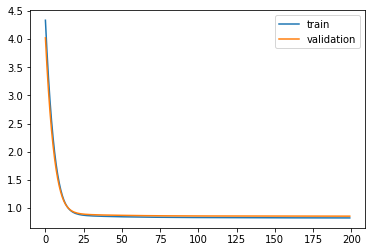

Time to train LSTM:  180.49031734466553
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 31s - loss: 4.2689 - pdc_loss: 0.7125 - event_loss: 0.7001 - val_loss: 3.9491 - val_pdc_loss: 0.6967 - val_event_loss: 0.6611

Epoch 00001: val_loss improved from inf to 3.94912, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 3.7026 - pdc_loss: 0.6775 - event_loss: 0.6285 - val_loss: 3.4306 - val_pdc_loss: 0.6664 - val_event_loss: 0.5993

Epoch 00002: val_loss improved from 3.94912 to 3.43055, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 3.2175 - pdc_loss: 0.6494 - event_loss: 0.5717 - val_loss: 2.9877 - val_pdc_loss: 0.6429 - val_event_loss: 0.5480

Epoch 00003: val_loss improved from 3.43055 to 2.98772, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 2.8036 - pdc_loss: 0.6278 - event_loss: 0.5228 - val_loss: 2.6113 - val_pdc_loss: 0.6254 - val_event_loss: 0.5027

Epoch 00004: val_loss improved from 2.98772 to 2.61126, saving


Epoch 00035: val_loss improved from 0.88477 to 0.88403, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 0.8556 - pdc_loss: 0.5266 - event_loss: 0.3160 - val_loss: 0.8832 - val_pdc_loss: 0.5434 - val_event_loss: 0.3269

Epoch 00036: val_loss improved from 0.88403 to 0.88323, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 0.8546 - pdc_loss: 0.5259 - event_loss: 0.3160 - val_loss: 0.8826 - val_pdc_loss: 0.5430 - val_event_loss: 0.3270

Epoch 00037: val_loss improved from 0.88323 to 0.88262, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 0.8537 - pdc_loss: 0.5252 - event_loss: 0.3159 - val_loss: 0.8820 - val_pdc_loss: 0.5426 - val_event_loss: 0.3269

Epoch 00038: val_loss improved from 0.88262 to 0.88195, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 0.8528 - pdc_loss: 0.5246 - event_loss: 0.3159 - val_loss: 0.8814 - val_pdc_loss: 0.5422 - val_event_loss: 0.3269

Epoch 00039: val_loss improved from 0.88195 to 

 - 1s - loss: 0.8383 - pdc_loss: 0.5150 - event_loss: 0.3144 - val_loss: 0.8713 - val_pdc_loss: 0.5366 - val_event_loss: 0.3257

Epoch 00070: val_loss improved from 0.87143 to 0.87128, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.8380 - pdc_loss: 0.5148 - event_loss: 0.3143 - val_loss: 0.8711 - val_pdc_loss: 0.5366 - val_event_loss: 0.3257

Epoch 00071: val_loss improved from 0.87128 to 0.87111, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.8377 - pdc_loss: 0.5146 - event_loss: 0.3143 - val_loss: 0.8710 - val_pdc_loss: 0.5365 - val_event_loss: 0.3256

Epoch 00072: val_loss improved from 0.87111 to 0.87097, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.8375 - pdc_loss: 0.5145 - event_loss: 0.3142 - val_loss: 0.8708 - val_pdc_loss: 0.5365 - val_event_loss: 0.3255

Epoch 00073: val_loss improved from 0.87097 to 0.87084, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.8373 - pdc_loss: 0.5143 - event_

 - 1s - loss: 0.8324 - pdc_loss: 0.5115 - event_loss: 0.3132 - val_loss: 0.8679 - val_pdc_loss: 0.5348 - val_event_loss: 0.3253

Epoch 00105: val_loss improved from 0.86805 to 0.86791, saving model to Event_val_weights4.hdf5
Epoch 106/200
 - 1s - loss: 0.8325 - pdc_loss: 0.5115 - event_loss: 0.3132 - val_loss: 0.8679 - val_pdc_loss: 0.5348 - val_event_loss: 0.3253

Epoch 00106: val_loss improved from 0.86791 to 0.86788, saving model to Event_val_weights4.hdf5
Epoch 107/200
 - 1s - loss: 0.8323 - pdc_loss: 0.5114 - event_loss: 0.3131 - val_loss: 0.8678 - val_pdc_loss: 0.5347 - val_event_loss: 0.3253

Epoch 00107: val_loss improved from 0.86788 to 0.86780, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.8322 - pdc_loss: 0.5114 - event_loss: 0.3131 - val_loss: 0.8677 - val_pdc_loss: 0.5347 - val_event_loss: 0.3253

Epoch 00108: val_loss improved from 0.86780 to 0.86774, saving model to Event_val_weights4.hdf5
Epoch 109/200
 - 1s - loss: 0.8321 - pdc_loss: 0.5113 - ev


Epoch 00141: val_loss improved from 0.86600 to 0.86595, saving model to Event_val_weights4.hdf5
Epoch 142/200
 - 1s - loss: 0.8294 - pdc_loss: 0.5098 - event_loss: 0.3124 - val_loss: 0.8661 - val_pdc_loss: 0.5333 - val_event_loss: 0.3256

Epoch 00142: val_loss did not improve from 0.86595
Epoch 143/200
 - 1s - loss: 0.8294 - pdc_loss: 0.5098 - event_loss: 0.3124 - val_loss: 0.8659 - val_pdc_loss: 0.5331 - val_event_loss: 0.3256

Epoch 00143: val_loss improved from 0.86595 to 0.86589, saving model to Event_val_weights4.hdf5
Epoch 144/200
 - 1s - loss: 0.8293 - pdc_loss: 0.5098 - event_loss: 0.3124 - val_loss: 0.8660 - val_pdc_loss: 0.5333 - val_event_loss: 0.3255

Epoch 00144: val_loss did not improve from 0.86589
Epoch 145/200
 - 1s - loss: 0.8292 - pdc_loss: 0.5097 - event_loss: 0.3124 - val_loss: 0.8658 - val_pdc_loss: 0.5331 - val_event_loss: 0.3255

Epoch 00145: val_loss improved from 0.86589 to 0.86579, saving model to Event_val_weights4.hdf5
Epoch 146/200
 - 1s - loss: 0.8292 - 


Epoch 00179: val_loss improved from 0.86505 to 0.86500, saving model to Event_val_weights4.hdf5
Epoch 180/200
 - 1s - loss: 0.8276 - pdc_loss: 0.5088 - event_loss: 0.3119 - val_loss: 0.8651 - val_pdc_loss: 0.5324 - val_event_loss: 0.3258

Epoch 00180: val_loss did not improve from 0.86500
Epoch 181/200
 - 1s - loss: 0.8275 - pdc_loss: 0.5087 - event_loss: 0.3119 - val_loss: 0.8650 - val_pdc_loss: 0.5323 - val_event_loss: 0.3258

Epoch 00181: val_loss did not improve from 0.86500
Epoch 182/200
 - 1s - loss: 0.8274 - pdc_loss: 0.5087 - event_loss: 0.3119 - val_loss: 0.8649 - val_pdc_loss: 0.5323 - val_event_loss: 0.3258

Epoch 00182: val_loss improved from 0.86500 to 0.86492, saving model to Event_val_weights4.hdf5
Epoch 183/200
 - 1s - loss: 0.8273 - pdc_loss: 0.5087 - event_loss: 0.3119 - val_loss: 0.8649 - val_pdc_loss: 0.5323 - val_event_loss: 0.3258

Epoch 00183: val_loss improved from 0.86492 to 0.86490, saving model to Event_val_weights4.hdf5
Epoch 184/200
 - 1s - loss: 0.8273 - 

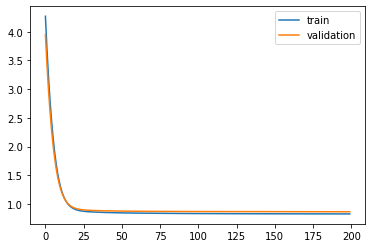

Time to train LSTM:  179.93661165237427
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 32s - loss: 4.2224 - pdc_loss: 0.6953 - event_loss: 0.6679 - val_loss: 3.9057 - val_pdc_loss: 0.6916 - val_event_loss: 0.6215

Epoch 00001: val_loss improved from inf to 3.90572, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 3.6710 - pdc_loss: 0.6795 - event_loss: 0.5950 - val_loss: 3.4043 - val_pdc_loss: 0.6786 - val_event_loss: 0.5631

Epoch 00002: val_loss improved from 3.90572 to 3.40434, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 3.2031 - pdc_loss: 0.6676 - event_loss: 0.5431 - val_loss: 2.9775 - val_pdc_loss: 0.6670 - val_event_loss: 0.5197

Epoch 00003: val_loss improved from 3.40434 to 2.97750, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 2.8053 - pdc_loss: 0.6560 - event_loss: 0.5037 - val_loss: 2.6134 - val_pdc_loss: 0.6543 - val_event_loss: 0.4849

Epoch 00004: val_loss improved from 2.97750 to 2.61337, saving


Epoch 00035: val_loss improved from 0.86381 to 0.86295, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 0.8583 - pdc_loss: 0.5302 - event_loss: 0.3162 - val_loss: 0.8619 - val_pdc_loss: 0.5321 - val_event_loss: 0.3179

Epoch 00036: val_loss improved from 0.86295 to 0.86187, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 0.8573 - pdc_loss: 0.5294 - event_loss: 0.3161 - val_loss: 0.8610 - val_pdc_loss: 0.5314 - val_event_loss: 0.3178

Epoch 00037: val_loss improved from 0.86187 to 0.86095, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 0.8563 - pdc_loss: 0.5286 - event_loss: 0.3161 - val_loss: 0.8600 - val_pdc_loss: 0.5306 - val_event_loss: 0.3178

Epoch 00038: val_loss improved from 0.86095 to 0.85997, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 0.8554 - pdc_loss: 0.5278 - event_loss: 0.3160 - val_loss: 0.8590 - val_pdc_loss: 0.5298 - val_event_loss: 0.3178

Epoch 00039: val_loss improved from 0.85997 to 

 - 1s - loss: 0.8418 - pdc_loss: 0.5183 - event_loss: 0.3145 - val_loss: 0.8481 - val_pdc_loss: 0.5228 - val_event_loss: 0.3164

Epoch 00070: val_loss improved from 0.84858 to 0.84813, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.8416 - pdc_loss: 0.5182 - event_loss: 0.3145 - val_loss: 0.8479 - val_pdc_loss: 0.5227 - val_event_loss: 0.3164

Epoch 00071: val_loss improved from 0.84813 to 0.84795, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8414 - pdc_loss: 0.5180 - event_loss: 0.3145 - val_loss: 0.8476 - val_pdc_loss: 0.5224 - val_event_loss: 0.3164

Epoch 00072: val_loss improved from 0.84795 to 0.84764, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8411 - pdc_loss: 0.5178 - event_loss: 0.3145 - val_loss: 0.8474 - val_pdc_loss: 0.5221 - val_event_loss: 0.3164

Epoch 00073: val_loss improved from 0.84764 to 0.84736, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8408 - pdc_loss: 0.5176 - event_


Epoch 00105: val_loss improved from 0.84347 to 0.84345, saving model to Event_val_weights5.hdf5
Epoch 106/200
 - 1s - loss: 0.8365 - pdc_loss: 0.5146 - event_loss: 0.3139 - val_loss: 0.8436 - val_pdc_loss: 0.5193 - val_event_loss: 0.3163

Epoch 00106: val_loss did not improve from 0.84345
Epoch 107/200
 - 1s - loss: 0.8364 - pdc_loss: 0.5146 - event_loss: 0.3139 - val_loss: 0.8434 - val_pdc_loss: 0.5193 - val_event_loss: 0.3162

Epoch 00107: val_loss improved from 0.84345 to 0.84343, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.8363 - pdc_loss: 0.5145 - event_loss: 0.3139 - val_loss: 0.8434 - val_pdc_loss: 0.5193 - val_event_loss: 0.3163

Epoch 00108: val_loss did not improve from 0.84343
Epoch 109/200
 - 1s - loss: 0.8363 - pdc_loss: 0.5145 - event_loss: 0.3139 - val_loss: 0.8434 - val_pdc_loss: 0.5193 - val_event_loss: 0.3162

Epoch 00109: val_loss improved from 0.84343 to 0.84337, saving model to Event_val_weights5.hdf5
Epoch 110/200
 - 1s - loss: 0.8362 - 


Epoch 00142: val_loss did not improve from 0.84185
Epoch 143/200
 - 1s - loss: 0.8339 - pdc_loss: 0.5132 - event_loss: 0.3134 - val_loss: 0.8419 - val_pdc_loss: 0.5184 - val_event_loss: 0.3160

Epoch 00143: val_loss did not improve from 0.84185
Epoch 144/200
 - 1s - loss: 0.8338 - pdc_loss: 0.5131 - event_loss: 0.3134 - val_loss: 0.8419 - val_pdc_loss: 0.5185 - val_event_loss: 0.3160

Epoch 00144: val_loss did not improve from 0.84185
Epoch 145/200
 - 1s - loss: 0.8338 - pdc_loss: 0.5130 - event_loss: 0.3134 - val_loss: 0.8417 - val_pdc_loss: 0.5183 - val_event_loss: 0.3159

Epoch 00145: val_loss improved from 0.84185 to 0.84166, saving model to Event_val_weights5.hdf5
Epoch 146/200
 - 1s - loss: 0.8337 - pdc_loss: 0.5130 - event_loss: 0.3134 - val_loss: 0.8418 - val_pdc_loss: 0.5185 - val_event_loss: 0.3160

Epoch 00146: val_loss did not improve from 0.84166
Epoch 147/200
 - 1s - loss: 0.8337 - pdc_loss: 0.5130 - event_loss: 0.3133 - val_loss: 0.8416 - val_pdc_loss: 0.5183 - val_even

 - 1s - loss: 0.8321 - pdc_loss: 0.5121 - event_loss: 0.3129 - val_loss: 0.8407 - val_pdc_loss: 0.5179 - val_event_loss: 0.3157

Epoch 00181: val_loss did not improve from 0.84069
Epoch 182/200
 - 1s - loss: 0.8320 - pdc_loss: 0.5120 - event_loss: 0.3129 - val_loss: 0.8407 - val_pdc_loss: 0.5179 - val_event_loss: 0.3157

Epoch 00182: val_loss did not improve from 0.84069
Epoch 183/200
 - 1s - loss: 0.8320 - pdc_loss: 0.5120 - event_loss: 0.3129 - val_loss: 0.8407 - val_pdc_loss: 0.5179 - val_event_loss: 0.3157

Epoch 00183: val_loss did not improve from 0.84069
Epoch 184/200
 - 1s - loss: 0.8320 - pdc_loss: 0.5120 - event_loss: 0.3129 - val_loss: 0.8407 - val_pdc_loss: 0.5179 - val_event_loss: 0.3157

Epoch 00184: val_loss did not improve from 0.84069
Epoch 185/200
 - 1s - loss: 0.8320 - pdc_loss: 0.5120 - event_loss: 0.3129 - val_loss: 0.8407 - val_pdc_loss: 0.5180 - val_event_loss: 0.3156

Epoch 00185: val_loss improved from 0.84069 to 0.84068, saving model to Event_val_weights5.hdf5

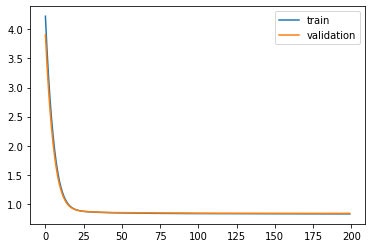

Time to train LSTM:  182.02042627334595


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f660c03db70>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 33s - loss: 8.4834 - pdc_loss: 0.7161 - event_loss: 0.6842 - val_loss: 7.7637 - val_pdc_loss: 0.7090 - val_event_loss: 0.6649

Epoch 00001: val_loss improved from inf to 7.76374, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 7.2400 - pdc_loss: 0.6999 - event_loss: 0.6553 - val_loss: 6.6145 - val_pdc_loss: 0.6930 - val_event_loss: 0.6350

Epoch 00002: val_loss improved from 7.76374 to 6.61447, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 6.1649 - pdc_loss: 0.6842 - event_loss: 0.6249 - val_loss: 5.6281 - val_pdc_loss: 0.6774 - val_event_loss: 0.6026

Epoch 00003: val_loss improved from 6.61447 to 5.62811, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 5.2467 - pdc_loss: 0.6692 - event_loss: 0.5919 - val_loss: 4.7895 - val_pdc_loss: 0.6626 - val_event_loss: 0.5672

Epoch 00004: val_loss improved from 5.62811 to 4.78946, saving model to Event_val_weights1.hdf5
Epoch 


Epoch 00035: val_loss improved from 0.86920 to 0.86787, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 0.8704 - pdc_loss: 0.5366 - event_loss: 0.3201 - val_loss: 0.8666 - val_pdc_loss: 0.5379 - val_event_loss: 0.3152

Epoch 00036: val_loss improved from 0.86787 to 0.86663, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 0.8693 - pdc_loss: 0.5359 - event_loss: 0.3200 - val_loss: 0.8655 - val_pdc_loss: 0.5370 - val_event_loss: 0.3151

Epoch 00037: val_loss improved from 0.86663 to 0.86551, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 0.8683 - pdc_loss: 0.5352 - event_loss: 0.3199 - val_loss: 0.8645 - val_pdc_loss: 0.5363 - val_event_loss: 0.3149

Epoch 00038: val_loss improved from 0.86551 to 0.86445, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 0.8674 - pdc_loss: 0.5345 - event_loss: 0.3197 - val_loss: 0.8634 - val_pdc_loss: 0.5355 - val_event_loss: 0.3149

Epoch 00039: val_loss improved from 0.86445 to 


Epoch 00070: val_loss improved from 0.84969 to 0.84897, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 0.8523 - pdc_loss: 0.5243 - event_loss: 0.3178 - val_loss: 0.8492 - val_pdc_loss: 0.5257 - val_event_loss: 0.3134

Epoch 00071: val_loss did not improve from 0.84897
Epoch 72/200
 - 1s - loss: 0.8520 - pdc_loss: 0.5242 - event_loss: 0.3178 - val_loss: 0.8486 - val_pdc_loss: 0.5255 - val_event_loss: 0.3131

Epoch 00072: val_loss improved from 0.84897 to 0.84860, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.8517 - pdc_loss: 0.5239 - event_loss: 0.3177 - val_loss: 0.8485 - val_pdc_loss: 0.5254 - val_event_loss: 0.3131

Epoch 00073: val_loss improved from 0.84860 to 0.84854, saving model to Event_val_weights1.hdf5
Epoch 74/200
 - 1s - loss: 0.8516 - pdc_loss: 0.5239 - event_loss: 0.3178 - val_loss: 0.8482 - val_pdc_loss: 0.5252 - val_event_loss: 0.3131

Epoch 00074: val_loss improved from 0.84854 to 0.84819, saving model to Event_val_weights1.h


Epoch 00107: val_loss did not improve from 0.84104
Epoch 108/200
 - 1s - loss: 0.8446 - pdc_loss: 0.5189 - event_loss: 0.3166 - val_loss: 0.8405 - val_pdc_loss: 0.5201 - val_event_loss: 0.3113

Epoch 00108: val_loss improved from 0.84104 to 0.84052, saving model to Event_val_weights1.hdf5
Epoch 109/200
 - 1s - loss: 0.8443 - pdc_loss: 0.5187 - event_loss: 0.3166 - val_loss: 0.8407 - val_pdc_loss: 0.5200 - val_event_loss: 0.3116

Epoch 00109: val_loss did not improve from 0.84052
Epoch 110/200
 - 1s - loss: 0.8442 - pdc_loss: 0.5186 - event_loss: 0.3166 - val_loss: 0.8406 - val_pdc_loss: 0.5200 - val_event_loss: 0.3115

Epoch 00110: val_loss did not improve from 0.84052
Epoch 111/200
 - 1s - loss: 0.8440 - pdc_loss: 0.5185 - event_loss: 0.3165 - val_loss: 0.8404 - val_pdc_loss: 0.5198 - val_event_loss: 0.3117

Epoch 00111: val_loss improved from 0.84052 to 0.84043, saving model to Event_val_weights1.hdf5
Epoch 112/200
 - 1s - loss: 0.8439 - pdc_loss: 0.5184 - event_loss: 0.3165 - val_l

 - 1s - loss: 0.8403 - pdc_loss: 0.5161 - event_loss: 0.3157 - val_loss: 0.8372 - val_pdc_loss: 0.5183 - val_event_loss: 0.3105

Epoch 00146: val_loss did not improve from 0.83713
Epoch 147/200
 - 1s - loss: 0.8403 - pdc_loss: 0.5162 - event_loss: 0.3157 - val_loss: 0.8372 - val_pdc_loss: 0.5182 - val_event_loss: 0.3106

Epoch 00147: val_loss did not improve from 0.83713
Epoch 148/200
 - 1s - loss: 0.8401 - pdc_loss: 0.5161 - event_loss: 0.3156 - val_loss: 0.8370 - val_pdc_loss: 0.5181 - val_event_loss: 0.3105

Epoch 00148: val_loss improved from 0.83713 to 0.83697, saving model to Event_val_weights1.hdf5
Epoch 149/200
 - 1s - loss: 0.8401 - pdc_loss: 0.5161 - event_loss: 0.3156 - val_loss: 0.8367 - val_pdc_loss: 0.5181 - val_event_loss: 0.3103

Epoch 00149: val_loss improved from 0.83697 to 0.83672, saving model to Event_val_weights1.hdf5
Epoch 150/200
 - 1s - loss: 0.8400 - pdc_loss: 0.5160 - event_loss: 0.3156 - val_loss: 0.8368 - val_pdc_loss: 0.5182 - val_event_loss: 0.3103

Epoch


Epoch 00184: val_loss did not improve from 0.83500
Epoch 185/200
 - 1s - loss: 0.8381 - pdc_loss: 0.5149 - event_loss: 0.3151 - val_loss: 0.8353 - val_pdc_loss: 0.5175 - val_event_loss: 0.3098

Epoch 00185: val_loss did not improve from 0.83500
Epoch 186/200
 - 1s - loss: 0.8379 - pdc_loss: 0.5148 - event_loss: 0.3151 - val_loss: 0.8352 - val_pdc_loss: 0.5175 - val_event_loss: 0.3098

Epoch 00186: val_loss did not improve from 0.83500
Epoch 187/200
 - 1s - loss: 0.8379 - pdc_loss: 0.5148 - event_loss: 0.3151 - val_loss: 0.8353 - val_pdc_loss: 0.5175 - val_event_loss: 0.3099

Epoch 00187: val_loss did not improve from 0.83500
Epoch 188/200
 - 1s - loss: 0.8378 - pdc_loss: 0.5148 - event_loss: 0.3151 - val_loss: 0.8350 - val_pdc_loss: 0.5174 - val_event_loss: 0.3097

Epoch 00188: val_loss improved from 0.83500 to 0.83499, saving model to Event_val_weights1.hdf5
Epoch 189/200
 - 1s - loss: 0.8378 - pdc_loss: 0.5148 - event_loss: 0.3151 - val_loss: 0.8350 - val_pdc_loss: 0.5175 - val_even

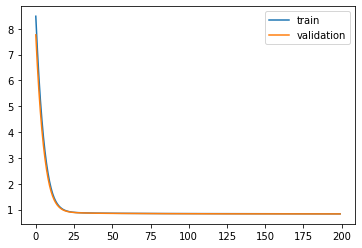

Time to train LSTM:  200.24973702430725
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 75s - loss: 8.4500 - pdc_loss: 0.6903 - event_loss: 0.6634 - val_loss: 7.7296 - val_pdc_loss: 0.6834 - val_event_loss: 0.6427

Epoch 00001: val_loss improved from inf to 7.72962, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 7.2034 - pdc_loss: 0.6816 - event_loss: 0.6228 - val_loss: 6.5791 - val_pdc_loss: 0.6754 - val_event_loss: 0.6026

Epoch 00002: val_loss improved from 7.72962 to 6.57906, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 6.1272 - pdc_loss: 0.6738 - event_loss: 0.5830 - val_loss: 5.5945 - val_pdc_loss: 0.6682 - val_event_loss: 0.5641

Epoch 00003: val_loss improved from 6.57906 to 5.59448, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 5.2106 - pdc_loss: 0.6667 - event_loss: 0.5450 - val_loss: 4.7606 - val_pdc_loss: 0.6613 - val_event_loss: 0.5277

Epoch 00004: val_loss improved from 5.59448 to 4.76060, saving


Epoch 00035: val_loss improved from 0.88271 to 0.88188, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 0.8689 - pdc_loss: 0.5377 - event_loss: 0.3184 - val_loss: 0.8811 - val_pdc_loss: 0.5437 - val_event_loss: 0.3247

Epoch 00036: val_loss improved from 0.88188 to 0.88111, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 0.8679 - pdc_loss: 0.5370 - event_loss: 0.3184 - val_loss: 0.8802 - val_pdc_loss: 0.5431 - val_event_loss: 0.3246

Epoch 00037: val_loss improved from 0.88111 to 0.88022, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 0.8671 - pdc_loss: 0.5363 - event_loss: 0.3183 - val_loss: 0.8795 - val_pdc_loss: 0.5425 - val_event_loss: 0.3246

Epoch 00038: val_loss improved from 0.88022 to 0.87952, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 0.8663 - pdc_loss: 0.5356 - event_loss: 0.3182 - val_loss: 0.8787 - val_pdc_loss: 0.5418 - val_event_loss: 0.3245

Epoch 00039: val_loss improved from 0.87952 to 

 - 1s - loss: 0.8521 - pdc_loss: 0.5251 - event_loss: 0.3167 - val_loss: 0.8668 - val_pdc_loss: 0.5335 - val_event_loss: 0.3230

Epoch 00070: val_loss improved from 0.86693 to 0.86680, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.8517 - pdc_loss: 0.5249 - event_loss: 0.3166 - val_loss: 0.8664 - val_pdc_loss: 0.5333 - val_event_loss: 0.3229

Epoch 00071: val_loss improved from 0.86680 to 0.86643, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.8514 - pdc_loss: 0.5247 - event_loss: 0.3166 - val_loss: 0.8660 - val_pdc_loss: 0.5331 - val_event_loss: 0.3228

Epoch 00072: val_loss improved from 0.86643 to 0.86601, saving model to Event_val_weights2.hdf5
Epoch 73/200
 - 1s - loss: 0.8511 - pdc_loss: 0.5245 - event_loss: 0.3165 - val_loss: 0.8658 - val_pdc_loss: 0.5330 - val_event_loss: 0.3228

Epoch 00073: val_loss improved from 0.86601 to 0.86579, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.8508 - pdc_loss: 0.5243 - event_


Epoch 00105: val_loss improved from 0.85934 to 0.85896, saving model to Event_val_weights2.hdf5
Epoch 106/200
 - 1s - loss: 0.8442 - pdc_loss: 0.5196 - event_loss: 0.3153 - val_loss: 0.8591 - val_pdc_loss: 0.5290 - val_event_loss: 0.3208

Epoch 00106: val_loss did not improve from 0.85896
Epoch 107/200
 - 1s - loss: 0.8441 - pdc_loss: 0.5195 - event_loss: 0.3152 - val_loss: 0.8590 - val_pdc_loss: 0.5289 - val_event_loss: 0.3208

Epoch 00107: val_loss did not improve from 0.85896
Epoch 108/200
 - 1s - loss: 0.8439 - pdc_loss: 0.5193 - event_loss: 0.3152 - val_loss: 0.8587 - val_pdc_loss: 0.5287 - val_event_loss: 0.3207

Epoch 00108: val_loss improved from 0.85896 to 0.85871, saving model to Event_val_weights2.hdf5
Epoch 109/200
 - 1s - loss: 0.8437 - pdc_loss: 0.5192 - event_loss: 0.3152 - val_loss: 0.8585 - val_pdc_loss: 0.5286 - val_event_loss: 0.3206

Epoch 00109: val_loss improved from 0.85871 to 0.85850, saving model to Event_val_weights2.hdf5
Epoch 110/200
 - 1s - loss: 0.8436 - 

 - 1s - loss: 0.8402 - pdc_loss: 0.5167 - event_loss: 0.3144 - val_loss: 0.8555 - val_pdc_loss: 0.5265 - val_event_loss: 0.3200

Epoch 00142: val_loss improved from 0.85567 to 0.85551, saving model to Event_val_weights2.hdf5
Epoch 143/200
 - 1s - loss: 0.8401 - pdc_loss: 0.5167 - event_loss: 0.3144 - val_loss: 0.8555 - val_pdc_loss: 0.5266 - val_event_loss: 0.3200

Epoch 00143: val_loss did not improve from 0.85551
Epoch 144/200
 - 1s - loss: 0.8401 - pdc_loss: 0.5166 - event_loss: 0.3144 - val_loss: 0.8553 - val_pdc_loss: 0.5263 - val_event_loss: 0.3199

Epoch 00144: val_loss improved from 0.85551 to 0.85532, saving model to Event_val_weights2.hdf5
Epoch 145/200
 - 1s - loss: 0.8401 - pdc_loss: 0.5166 - event_loss: 0.3144 - val_loss: 0.8554 - val_pdc_loss: 0.5264 - val_event_loss: 0.3199

Epoch 00145: val_loss did not improve from 0.85532
Epoch 146/200
 - 1s - loss: 0.8399 - pdc_loss: 0.5165 - event_loss: 0.3144 - val_loss: 0.8552 - val_pdc_loss: 0.5262 - val_event_loss: 0.3199

Epoch


Epoch 00181: val_loss did not improve from 0.85404
Epoch 182/200
 - 1s - loss: 0.8377 - pdc_loss: 0.5151 - event_loss: 0.3139 - val_loss: 0.8543 - val_pdc_loss: 0.5256 - val_event_loss: 0.3200

Epoch 00182: val_loss did not improve from 0.85404
Epoch 183/200
 - 1s - loss: 0.8376 - pdc_loss: 0.5150 - event_loss: 0.3139 - val_loss: 0.8542 - val_pdc_loss: 0.5257 - val_event_loss: 0.3199

Epoch 00183: val_loss did not improve from 0.85404
Epoch 184/200
 - 1s - loss: 0.8375 - pdc_loss: 0.5150 - event_loss: 0.3138 - val_loss: 0.8541 - val_pdc_loss: 0.5256 - val_event_loss: 0.3199

Epoch 00184: val_loss did not improve from 0.85404
Epoch 185/200
 - 1s - loss: 0.8374 - pdc_loss: 0.5149 - event_loss: 0.3138 - val_loss: 0.8541 - val_pdc_loss: 0.5256 - val_event_loss: 0.3199

Epoch 00185: val_loss did not improve from 0.85404
Epoch 186/200
 - 1s - loss: 0.8374 - pdc_loss: 0.5149 - event_loss: 0.3138 - val_loss: 0.8537 - val_pdc_loss: 0.5254 - val_event_loss: 0.3197

Epoch 00186: val_loss improve

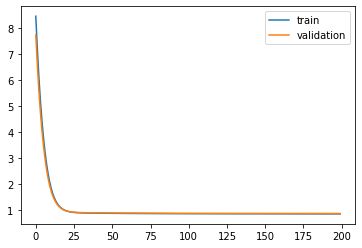

Time to train LSTM:  227.76437163352966
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 33s - loss: 8.4802 - pdc_loss: 0.7522 - event_loss: 0.6769 - val_loss: 7.7476 - val_pdc_loss: 0.7375 - val_event_loss: 0.6491

Epoch 00001: val_loss improved from inf to 7.74759, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 7.2164 - pdc_loss: 0.7297 - event_loss: 0.6292 - val_loss: 6.5827 - val_pdc_loss: 0.7166 - val_event_loss: 0.6054

Epoch 00002: val_loss improved from 7.74759 to 6.58267, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 6.1265 - pdc_loss: 0.7080 - event_loss: 0.5881 - val_loss: 5.5877 - val_pdc_loss: 0.6969 - val_event_loss: 0.5678

Epoch 00003: val_loss improved from 6.58267 to 5.58771, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 5.2008 - pdc_loss: 0.6884 - event_loss: 0.5519 - val_loss: 4.7480 - val_pdc_loss: 0.6797 - val_event_loss: 0.5341

Epoch 00004: val_loss improved from 5.58771 to 4.74801, saving


Epoch 00035: val_loss improved from 0.89632 to 0.89538, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 0.8740 - pdc_loss: 0.5420 - event_loss: 0.3184 - val_loss: 0.8944 - val_pdc_loss: 0.5563 - val_event_loss: 0.3246

Epoch 00036: val_loss improved from 0.89538 to 0.89440, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 0.8728 - pdc_loss: 0.5411 - event_loss: 0.3182 - val_loss: 0.8937 - val_pdc_loss: 0.5558 - val_event_loss: 0.3246

Epoch 00037: val_loss improved from 0.89440 to 0.89366, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 0.8718 - pdc_loss: 0.5404 - event_loss: 0.3182 - val_loss: 0.8929 - val_pdc_loss: 0.5552 - val_event_loss: 0.3245

Epoch 00038: val_loss improved from 0.89366 to 0.89286, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 0.8708 - pdc_loss: 0.5396 - event_loss: 0.3181 - val_loss: 0.8921 - val_pdc_loss: 0.5546 - val_event_loss: 0.3245

Epoch 00039: val_loss improved from 0.89286 to 

 - 1s - loss: 0.8531 - pdc_loss: 0.5253 - event_loss: 0.3167 - val_loss: 0.8783 - val_pdc_loss: 0.5432 - val_event_loss: 0.3241

Epoch 00070: val_loss improved from 0.87858 to 0.87826, saving model to Event_val_weights3.hdf5
Epoch 71/200
 - 1s - loss: 0.8529 - pdc_loss: 0.5252 - event_loss: 0.3167 - val_loss: 0.8783 - val_pdc_loss: 0.5432 - val_event_loss: 0.3241

Epoch 00071: val_loss did not improve from 0.87826
Epoch 72/200
 - 1s - loss: 0.8526 - pdc_loss: 0.5250 - event_loss: 0.3167 - val_loss: 0.8778 - val_pdc_loss: 0.5429 - val_event_loss: 0.3240

Epoch 00072: val_loss improved from 0.87826 to 0.87777, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.8523 - pdc_loss: 0.5248 - event_loss: 0.3166 - val_loss: 0.8775 - val_pdc_loss: 0.5426 - val_event_loss: 0.3240

Epoch 00073: val_loss improved from 0.87777 to 0.87748, saving model to Event_val_weights3.hdf5
Epoch 74/200
 - 1s - loss: 0.8520 - pdc_loss: 0.5246 - event_loss: 0.3166 - val_loss: 0.8774 - val_pdc_los


Epoch 00105: val_loss improved from 0.87169 to 0.87149, saving model to Event_val_weights3.hdf5
Epoch 106/200
 - 1s - loss: 0.8454 - pdc_loss: 0.5202 - event_loss: 0.3157 - val_loss: 0.8716 - val_pdc_loss: 0.5386 - val_event_loss: 0.3235

Epoch 00106: val_loss did not improve from 0.87149
Epoch 107/200
 - 1s - loss: 0.8452 - pdc_loss: 0.5200 - event_loss: 0.3157 - val_loss: 0.8714 - val_pdc_loss: 0.5384 - val_event_loss: 0.3235

Epoch 00107: val_loss improved from 0.87149 to 0.87143, saving model to Event_val_weights3.hdf5
Epoch 108/200
 - 1s - loss: 0.8451 - pdc_loss: 0.5199 - event_loss: 0.3157 - val_loss: 0.8710 - val_pdc_loss: 0.5381 - val_event_loss: 0.3234

Epoch 00108: val_loss improved from 0.87143 to 0.87102, saving model to Event_val_weights3.hdf5
Epoch 109/200
 - 1s - loss: 0.8449 - pdc_loss: 0.5198 - event_loss: 0.3157 - val_loss: 0.8711 - val_pdc_loss: 0.5382 - val_event_loss: 0.3235

Epoch 00109: val_loss did not improve from 0.87102
Epoch 110/200
 - 1s - loss: 0.8448 - 


Epoch 00141: val_loss did not improve from 0.86701
Epoch 142/200
 - 1s - loss: 0.8409 - pdc_loss: 0.5171 - event_loss: 0.3150 - val_loss: 0.8669 - val_pdc_loss: 0.5352 - val_event_loss: 0.3229

Epoch 00142: val_loss improved from 0.86701 to 0.86692, saving model to Event_val_weights3.hdf5
Epoch 143/200
 - 1s - loss: 0.8408 - pdc_loss: 0.5169 - event_loss: 0.3150 - val_loss: 0.8669 - val_pdc_loss: 0.5353 - val_event_loss: 0.3228

Epoch 00143: val_loss did not improve from 0.86692
Epoch 144/200
 - 1s - loss: 0.8408 - pdc_loss: 0.5170 - event_loss: 0.3150 - val_loss: 0.8667 - val_pdc_loss: 0.5350 - val_event_loss: 0.3228

Epoch 00144: val_loss improved from 0.86692 to 0.86670, saving model to Event_val_weights3.hdf5
Epoch 145/200
 - 1s - loss: 0.8406 - pdc_loss: 0.5168 - event_loss: 0.3149 - val_loss: 0.8668 - val_pdc_loss: 0.5351 - val_event_loss: 0.3229

Epoch 00145: val_loss did not improve from 0.86670
Epoch 146/200
 - 1s - loss: 0.8405 - pdc_loss: 0.5168 - event_loss: 0.3149 - val_l

 - 1s - loss: 0.8377 - pdc_loss: 0.5149 - event_loss: 0.3143 - val_loss: 0.8642 - val_pdc_loss: 0.5334 - val_event_loss: 0.3224

Epoch 00180: val_loss did not improve from 0.86404
Epoch 181/200
 - 1s - loss: 0.8375 - pdc_loss: 0.5148 - event_loss: 0.3143 - val_loss: 0.8642 - val_pdc_loss: 0.5333 - val_event_loss: 0.3224

Epoch 00181: val_loss did not improve from 0.86404
Epoch 182/200
 - 1s - loss: 0.8375 - pdc_loss: 0.5147 - event_loss: 0.3143 - val_loss: 0.8641 - val_pdc_loss: 0.5332 - val_event_loss: 0.3224

Epoch 00182: val_loss did not improve from 0.86404
Epoch 183/200
 - 1s - loss: 0.8374 - pdc_loss: 0.5147 - event_loss: 0.3143 - val_loss: 0.8639 - val_pdc_loss: 0.5330 - val_event_loss: 0.3224

Epoch 00183: val_loss improved from 0.86404 to 0.86391, saving model to Event_val_weights3.hdf5
Epoch 184/200
 - 1s - loss: 0.8374 - pdc_loss: 0.5147 - event_loss: 0.3143 - val_loss: 0.8639 - val_pdc_loss: 0.5330 - val_event_loss: 0.3224

Epoch 00184: val_loss improved from 0.86391 to 0.8

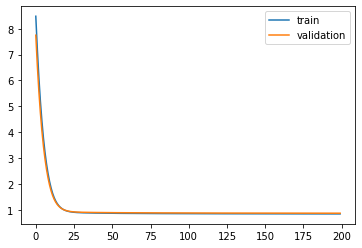

Time to train LSTM:  185.39616346359253
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 34s - loss: 8.5019 - pdc_loss: 0.7518 - event_loss: 0.6957 - val_loss: 7.7776 - val_pdc_loss: 0.7343 - val_event_loss: 0.6764

Epoch 00001: val_loss improved from inf to 7.77756, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 7.2417 - pdc_loss: 0.7169 - event_loss: 0.6597 - val_loss: 6.6188 - val_pdc_loss: 0.7068 - val_event_loss: 0.6417

Epoch 00002: val_loss improved from 7.77756 to 6.61884, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 6.1582 - pdc_loss: 0.6914 - event_loss: 0.6250 - val_loss: 5.6294 - val_pdc_loss: 0.6854 - val_event_loss: 0.6076

Epoch 00003: val_loss improved from 6.61884 to 5.62944, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 5.2379 - pdc_loss: 0.6720 - event_loss: 0.5903 - val_loss: 4.7922 - val_pdc_loss: 0.6681 - val_event_loss: 0.5728

Epoch 00004: val_loss improved from 5.62944 to 4.79224, saving


Epoch 00035: val_loss improved from 0.89475 to 0.89402, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 0.8665 - pdc_loss: 0.5352 - event_loss: 0.3180 - val_loss: 0.8934 - val_pdc_loss: 0.5516 - val_event_loss: 0.3286

Epoch 00036: val_loss improved from 0.89402 to 0.89340, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 0.8657 - pdc_loss: 0.5347 - event_loss: 0.3179 - val_loss: 0.8929 - val_pdc_loss: 0.5515 - val_event_loss: 0.3285

Epoch 00037: val_loss improved from 0.89340 to 0.89291, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 0.8648 - pdc_loss: 0.5342 - event_loss: 0.3178 - val_loss: 0.8924 - val_pdc_loss: 0.5512 - val_event_loss: 0.3285

Epoch 00038: val_loss improved from 0.89291 to 0.89243, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 0.8641 - pdc_loss: 0.5337 - event_loss: 0.3177 - val_loss: 0.8921 - val_pdc_loss: 0.5511 - val_event_loss: 0.3284

Epoch 00039: val_loss improved from 0.89243 to 


Epoch 00070: val_loss improved from 0.88148 to 0.88100, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.8514 - pdc_loss: 0.5253 - event_loss: 0.3157 - val_loss: 0.8810 - val_pdc_loss: 0.5443 - val_event_loss: 0.3263

Epoch 00071: val_loss improved from 0.88100 to 0.88099, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.8512 - pdc_loss: 0.5252 - event_loss: 0.3156 - val_loss: 0.8806 - val_pdc_loss: 0.5440 - val_event_loss: 0.3262

Epoch 00072: val_loss improved from 0.88099 to 0.88063, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.8508 - pdc_loss: 0.5249 - event_loss: 0.3156 - val_loss: 0.8807 - val_pdc_loss: 0.5441 - val_event_loss: 0.3263

Epoch 00073: val_loss did not improve from 0.88063
Epoch 74/200
 - 1s - loss: 0.8506 - pdc_loss: 0.5247 - event_loss: 0.3155 - val_loss: 0.8803 - val_pdc_loss: 0.5438 - val_event_loss: 0.3262

Epoch 00074: val_loss improved from 0.88063 to 0.88031, saving model to Event_val_weights4.h


Epoch 00105: val_loss did not improve from 0.87315
Epoch 106/200
 - 1s - loss: 0.8429 - pdc_loss: 0.5190 - event_loss: 0.3145 - val_loss: 0.8727 - val_pdc_loss: 0.5379 - val_event_loss: 0.3255

Epoch 00106: val_loss improved from 0.87315 to 0.87267, saving model to Event_val_weights4.hdf5
Epoch 107/200
 - 1s - loss: 0.8427 - pdc_loss: 0.5189 - event_loss: 0.3144 - val_loss: 0.8725 - val_pdc_loss: 0.5377 - val_event_loss: 0.3255

Epoch 00107: val_loss improved from 0.87267 to 0.87250, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.8424 - pdc_loss: 0.5187 - event_loss: 0.3144 - val_loss: 0.8722 - val_pdc_loss: 0.5375 - val_event_loss: 0.3254

Epoch 00108: val_loss improved from 0.87250 to 0.87217, saving model to Event_val_weights4.hdf5
Epoch 109/200
 - 1s - loss: 0.8422 - pdc_loss: 0.5186 - event_loss: 0.3144 - val_loss: 0.8723 - val_pdc_loss: 0.5376 - val_event_loss: 0.3255

Epoch 00109: val_loss did not improve from 0.87217
Epoch 110/200
 - 1s - loss: 0.8421 - 

 - 1s - loss: 0.8380 - pdc_loss: 0.5159 - event_loss: 0.3137 - val_loss: 0.8701 - val_pdc_loss: 0.5362 - val_event_loss: 0.3254

Epoch 00144: val_loss improved from 0.87029 to 0.87007, saving model to Event_val_weights4.hdf5
Epoch 145/200
 - 1s - loss: 0.8380 - pdc_loss: 0.5158 - event_loss: 0.3138 - val_loss: 0.8704 - val_pdc_loss: 0.5363 - val_event_loss: 0.3256

Epoch 00145: val_loss did not improve from 0.87007
Epoch 146/200
 - 1s - loss: 0.8380 - pdc_loss: 0.5158 - event_loss: 0.3137 - val_loss: 0.8705 - val_pdc_loss: 0.5365 - val_event_loss: 0.3256

Epoch 00146: val_loss did not improve from 0.87007
Epoch 147/200
 - 1s - loss: 0.8379 - pdc_loss: 0.5158 - event_loss: 0.3137 - val_loss: 0.8703 - val_pdc_loss: 0.5362 - val_event_loss: 0.3256

Epoch 00147: val_loss did not improve from 0.87007
Epoch 148/200
 - 1s - loss: 0.8378 - pdc_loss: 0.5157 - event_loss: 0.3137 - val_loss: 0.8704 - val_pdc_loss: 0.5364 - val_event_loss: 0.3256

Epoch 00148: val_loss did not improve from 0.87007


Epoch 00184: val_loss did not improve from 0.86948
Epoch 185/200
 - 1s - loss: 0.8355 - pdc_loss: 0.5146 - event_loss: 0.3131 - val_loss: 0.8696 - val_pdc_loss: 0.5360 - val_event_loss: 0.3258

Epoch 00185: val_loss did not improve from 0.86948
Epoch 186/200
 - 1s - loss: 0.8354 - pdc_loss: 0.5145 - event_loss: 0.3130 - val_loss: 0.8695 - val_pdc_loss: 0.5358 - val_event_loss: 0.3258

Epoch 00186: val_loss improved from 0.86948 to 0.86948, saving model to Event_val_weights4.hdf5
Epoch 187/200
 - 1s - loss: 0.8354 - pdc_loss: 0.5145 - event_loss: 0.3130 - val_loss: 0.8696 - val_pdc_loss: 0.5360 - val_event_loss: 0.3258

Epoch 00187: val_loss did not improve from 0.86948
Epoch 188/200
 - 1s - loss: 0.8352 - pdc_loss: 0.5144 - event_loss: 0.3130 - val_loss: 0.8694 - val_pdc_loss: 0.5358 - val_event_loss: 0.3258

Epoch 00188: val_loss improved from 0.86948 to 0.86943, saving model to Event_val_weights4.hdf5
Epoch 189/200
 - 1s - loss: 0.8353 - pdc_loss: 0.5145 - event_loss: 0.3130 - val_l

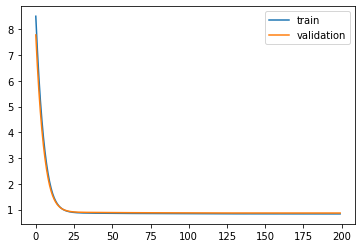

Time to train LSTM:  186.32532334327698
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 59s - loss: 8.4130 - pdc_loss: 0.7189 - event_loss: 0.6605 - val_loss: 7.6794 - val_pdc_loss: 0.7080 - val_event_loss: 0.6248

Epoch 00001: val_loss improved from inf to 7.67939, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 7.1510 - pdc_loss: 0.7009 - event_loss: 0.6048 - val_loss: 6.5174 - val_pdc_loss: 0.6926 - val_event_loss: 0.5744

Epoch 00002: val_loss improved from 7.67939 to 6.51744, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 6.0670 - pdc_loss: 0.6869 - event_loss: 0.5586 - val_loss: 5.5278 - val_pdc_loss: 0.6801 - val_event_loss: 0.5327

Epoch 00003: val_loss improved from 6.51744 to 5.52783, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 5.1483 - pdc_loss: 0.6754 - event_loss: 0.5202 - val_loss: 4.6936 - val_pdc_loss: 0.6695 - val_event_loss: 0.4977

Epoch 00004: val_loss improved from 5.52783 to 4.69359, saving


Epoch 00035: val_loss improved from 0.87128 to 0.86992, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 0.8685 - pdc_loss: 0.5370 - event_loss: 0.3193 - val_loss: 0.8686 - val_pdc_loss: 0.5368 - val_event_loss: 0.3197

Epoch 00036: val_loss improved from 0.86992 to 0.86865, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 0.8675 - pdc_loss: 0.5360 - event_loss: 0.3193 - val_loss: 0.8676 - val_pdc_loss: 0.5358 - val_event_loss: 0.3197

Epoch 00037: val_loss improved from 0.86865 to 0.86755, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 0.8664 - pdc_loss: 0.5351 - event_loss: 0.3193 - val_loss: 0.8664 - val_pdc_loss: 0.5347 - val_event_loss: 0.3197

Epoch 00038: val_loss improved from 0.86755 to 0.86639, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 0.8655 - pdc_loss: 0.5342 - event_loss: 0.3193 - val_loss: 0.8654 - val_pdc_loss: 0.5338 - val_event_loss: 0.3197

Epoch 00039: val_loss improved from 0.86639 to 

 - 1s - loss: 0.8519 - pdc_loss: 0.5243 - event_loss: 0.3179 - val_loss: 0.8537 - val_pdc_loss: 0.5259 - val_event_loss: 0.3181

Epoch 00070: val_loss improved from 0.85395 to 0.85370, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.8517 - pdc_loss: 0.5241 - event_loss: 0.3178 - val_loss: 0.8536 - val_pdc_loss: 0.5258 - val_event_loss: 0.3180

Epoch 00071: val_loss improved from 0.85370 to 0.85357, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8514 - pdc_loss: 0.5239 - event_loss: 0.3177 - val_loss: 0.8532 - val_pdc_loss: 0.5255 - val_event_loss: 0.3180

Epoch 00072: val_loss improved from 0.85357 to 0.85324, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8512 - pdc_loss: 0.5238 - event_loss: 0.3177 - val_loss: 0.8532 - val_pdc_loss: 0.5256 - val_event_loss: 0.3179

Epoch 00073: val_loss improved from 0.85324 to 0.85315, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8510 - pdc_loss: 0.5237 - event_


Epoch 00105: val_loss improved from 0.84846 to 0.84837, saving model to Event_val_weights5.hdf5
Epoch 106/200
 - 1s - loss: 0.8445 - pdc_loss: 0.5191 - event_loss: 0.3164 - val_loss: 0.8479 - val_pdc_loss: 0.5218 - val_event_loss: 0.3171

Epoch 00106: val_loss improved from 0.84837 to 0.84788, saving model to Event_val_weights5.hdf5
Epoch 107/200
 - 1s - loss: 0.8443 - pdc_loss: 0.5189 - event_loss: 0.3164 - val_loss: 0.8478 - val_pdc_loss: 0.5217 - val_event_loss: 0.3171

Epoch 00107: val_loss improved from 0.84788 to 0.84782, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.8441 - pdc_loss: 0.5187 - event_loss: 0.3164 - val_loss: 0.8475 - val_pdc_loss: 0.5214 - val_event_loss: 0.3171

Epoch 00108: val_loss improved from 0.84782 to 0.84750, saving model to Event_val_weights5.hdf5
Epoch 109/200
 - 1s - loss: 0.8439 - pdc_loss: 0.5186 - event_loss: 0.3164 - val_loss: 0.8475 - val_pdc_loss: 0.5215 - val_event_loss: 0.3171

Epoch 00109: val_loss improved from 0.84750


Epoch 00142: val_loss did not improve from 0.84434
Epoch 143/200
 - 1s - loss: 0.8407 - pdc_loss: 0.5167 - event_loss: 0.3155 - val_loss: 0.8444 - val_pdc_loss: 0.5196 - val_event_loss: 0.3164

Epoch 00143: val_loss did not improve from 0.84434
Epoch 144/200
 - 1s - loss: 0.8407 - pdc_loss: 0.5168 - event_loss: 0.3155 - val_loss: 0.8444 - val_pdc_loss: 0.5196 - val_event_loss: 0.3164

Epoch 00144: val_loss did not improve from 0.84434
Epoch 145/200
 - 1s - loss: 0.8405 - pdc_loss: 0.5166 - event_loss: 0.3155 - val_loss: 0.8444 - val_pdc_loss: 0.5196 - val_event_loss: 0.3164

Epoch 00145: val_loss did not improve from 0.84434
Epoch 146/200
 - 1s - loss: 0.8405 - pdc_loss: 0.5167 - event_loss: 0.3155 - val_loss: 0.8441 - val_pdc_loss: 0.5194 - val_event_loss: 0.3164

Epoch 00146: val_loss improved from 0.84434 to 0.84410, saving model to Event_val_weights5.hdf5
Epoch 147/200
 - 1s - loss: 0.8404 - pdc_loss: 0.5166 - event_loss: 0.3155 - val_loss: 0.8443 - val_pdc_loss: 0.5196 - val_even


Epoch 00181: val_loss did not improve from 0.84263
Epoch 182/200
 - 1s - loss: 0.8386 - pdc_loss: 0.5158 - event_loss: 0.3149 - val_loss: 0.8430 - val_pdc_loss: 0.5190 - val_event_loss: 0.3161

Epoch 00182: val_loss did not improve from 0.84263
Epoch 183/200
 - 1s - loss: 0.8385 - pdc_loss: 0.5157 - event_loss: 0.3148 - val_loss: 0.8426 - val_pdc_loss: 0.5186 - val_event_loss: 0.3161

Epoch 00183: val_loss did not improve from 0.84263
Epoch 184/200
 - 1s - loss: 0.8385 - pdc_loss: 0.5157 - event_loss: 0.3148 - val_loss: 0.8427 - val_pdc_loss: 0.5187 - val_event_loss: 0.3160

Epoch 00184: val_loss did not improve from 0.84263
Epoch 185/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5156 - event_loss: 0.3148 - val_loss: 0.8429 - val_pdc_loss: 0.5189 - val_event_loss: 0.3160

Epoch 00185: val_loss did not improve from 0.84263
Epoch 186/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5157 - event_loss: 0.3148 - val_loss: 0.8426 - val_pdc_loss: 0.5186 - val_event_loss: 0.3160

Epoch 00186: val_loss improve

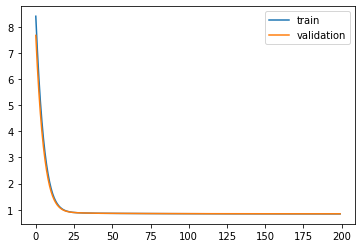

Time to train LSTM:  213.1548810005188
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 39s - loss: 7.8610 - pdc_loss: 0.7238 - event_loss: 0.6966 - val_loss: 7.1959 - val_pdc_loss: 0.7122 - val_event_loss: 0.6770

Epoch 00001: val_loss improved from inf to 7.19593, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 6.7143 - pdc_loss: 0.7010 - event_loss: 0.6682 - val_loss: 6.1396 - val_pdc_loss: 0.6916 - val_event_loss: 0.6501

Epoch 00002: val_loss improved from 7.19593 to 6.13961, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 5.7281 - pdc_loss: 0.6815 - event_loss: 0.6425 - val_loss: 5.2387 - val_pdc_loss: 0.6740 - val_event_loss: 0.6251

Epoch 00003: val_loss improved from 6.13961 to 5.23871, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 4.8915 - pdc_loss: 0.6652 - event_loss: 0.6183 - val_loss: 4.4785 - val_pdc_loss: 0.6591 - val_event_loss: 0.6009

Epoch 00004: val_loss improved from 5.23871 to 4.47850, saving 


Epoch 00035: val_loss improved from 0.86985 to 0.86867, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 0.8721 - pdc_loss: 0.5372 - event_loss: 0.3209 - val_loss: 0.8676 - val_pdc_loss: 0.5385 - val_event_loss: 0.3152

Epoch 00036: val_loss improved from 0.86867 to 0.86764, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 0.8710 - pdc_loss: 0.5365 - event_loss: 0.3207 - val_loss: 0.8667 - val_pdc_loss: 0.5379 - val_event_loss: 0.3150

Epoch 00037: val_loss improved from 0.86764 to 0.86669, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 0.8701 - pdc_loss: 0.5359 - event_loss: 0.3205 - val_loss: 0.8659 - val_pdc_loss: 0.5374 - val_event_loss: 0.3149

Epoch 00038: val_loss improved from 0.86669 to 0.86588, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 0.8693 - pdc_loss: 0.5354 - event_loss: 0.3204 - val_loss: 0.8651 - val_pdc_loss: 0.5369 - val_event_loss: 0.3148

Epoch 00039: val_loss improved from 0.86588 to 

 - 1s - loss: 0.8556 - pdc_loss: 0.5275 - event_loss: 0.3181 - val_loss: 0.8524 - val_pdc_loss: 0.5294 - val_event_loss: 0.3129

Epoch 00070: val_loss improved from 0.85255 to 0.85240, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 0.8553 - pdc_loss: 0.5273 - event_loss: 0.3180 - val_loss: 0.8519 - val_pdc_loss: 0.5291 - val_event_loss: 0.3129

Epoch 00071: val_loss improved from 0.85240 to 0.85194, saving model to Event_val_weights1.hdf5
Epoch 72/200
 - 1s - loss: 0.8550 - pdc_loss: 0.5271 - event_loss: 0.3180 - val_loss: 0.8519 - val_pdc_loss: 0.5292 - val_event_loss: 0.3128

Epoch 00072: val_loss improved from 0.85194 to 0.85191, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.8548 - pdc_loss: 0.5269 - event_loss: 0.3180 - val_loss: 0.8514 - val_pdc_loss: 0.5287 - val_event_loss: 0.3129

Epoch 00073: val_loss improved from 0.85191 to 0.85145, saving model to Event_val_weights1.hdf5
Epoch 74/200
 - 1s - loss: 0.8545 - pdc_loss: 0.5267 - event_


Epoch 00106: val_loss improved from 0.84681 to 0.84679, saving model to Event_val_weights1.hdf5
Epoch 107/200
 - 1s - loss: 0.8481 - pdc_loss: 0.5220 - event_loss: 0.3172 - val_loss: 0.8464 - val_pdc_loss: 0.5251 - val_event_loss: 0.3125

Epoch 00107: val_loss improved from 0.84679 to 0.84638, saving model to Event_val_weights1.hdf5
Epoch 108/200
 - 1s - loss: 0.8479 - pdc_loss: 0.5219 - event_loss: 0.3172 - val_loss: 0.8466 - val_pdc_loss: 0.5253 - val_event_loss: 0.3125

Epoch 00108: val_loss did not improve from 0.84638
Epoch 109/200
 - 1s - loss: 0.8477 - pdc_loss: 0.5218 - event_loss: 0.3172 - val_loss: 0.8462 - val_pdc_loss: 0.5249 - val_event_loss: 0.3125

Epoch 00109: val_loss improved from 0.84638 to 0.84618, saving model to Event_val_weights1.hdf5
Epoch 110/200
 - 1s - loss: 0.8476 - pdc_loss: 0.5217 - event_loss: 0.3172 - val_loss: 0.8463 - val_pdc_loss: 0.5251 - val_event_loss: 0.3125

Epoch 00110: val_loss did not improve from 0.84618
Epoch 111/200
 - 1s - loss: 0.8475 - 

 - 1s - loss: 0.8432 - pdc_loss: 0.5185 - event_loss: 0.3164 - val_loss: 0.8419 - val_pdc_loss: 0.5217 - val_event_loss: 0.3119

Epoch 00143: val_loss improved from 0.84196 to 0.84186, saving model to Event_val_weights1.hdf5
Epoch 144/200
 - 1s - loss: 0.8431 - pdc_loss: 0.5185 - event_loss: 0.3164 - val_loss: 0.8417 - val_pdc_loss: 0.5216 - val_event_loss: 0.3119

Epoch 00144: val_loss improved from 0.84186 to 0.84173, saving model to Event_val_weights1.hdf5
Epoch 145/200
 - 1s - loss: 0.8430 - pdc_loss: 0.5184 - event_loss: 0.3163 - val_loss: 0.8415 - val_pdc_loss: 0.5215 - val_event_loss: 0.3118

Epoch 00145: val_loss improved from 0.84173 to 0.84151, saving model to Event_val_weights1.hdf5
Epoch 146/200
 - 1s - loss: 0.8428 - pdc_loss: 0.5183 - event_loss: 0.3163 - val_loss: 0.8414 - val_pdc_loss: 0.5213 - val_event_loss: 0.3118

Epoch 00146: val_loss improved from 0.84151 to 0.84140, saving model to Event_val_weights1.hdf5
Epoch 147/200
 - 1s - loss: 0.8427 - pdc_loss: 0.5182 - ev

 - 1s - loss: 0.8395 - pdc_loss: 0.5159 - event_loss: 0.3159 - val_loss: 0.8381 - val_pdc_loss: 0.5192 - val_event_loss: 0.3112

Epoch 00179: val_loss improved from 0.83825 to 0.83810, saving model to Event_val_weights1.hdf5
Epoch 180/200
 - 1s - loss: 0.8394 - pdc_loss: 0.5158 - event_loss: 0.3158 - val_loss: 0.8382 - val_pdc_loss: 0.5191 - val_event_loss: 0.3113

Epoch 00180: val_loss did not improve from 0.83810
Epoch 181/200
 - 1s - loss: 0.8394 - pdc_loss: 0.5158 - event_loss: 0.3159 - val_loss: 0.8380 - val_pdc_loss: 0.5191 - val_event_loss: 0.3111

Epoch 00181: val_loss improved from 0.83810 to 0.83796, saving model to Event_val_weights1.hdf5
Epoch 182/200
 - 1s - loss: 0.8393 - pdc_loss: 0.5157 - event_loss: 0.3158 - val_loss: 0.8381 - val_pdc_loss: 0.5191 - val_event_loss: 0.3113

Epoch 00182: val_loss did not improve from 0.83796
Epoch 183/200
 - 1s - loss: 0.8392 - pdc_loss: 0.5157 - event_loss: 0.3158 - val_loss: 0.8380 - val_pdc_loss: 0.5191 - val_event_loss: 0.3113

Epoch

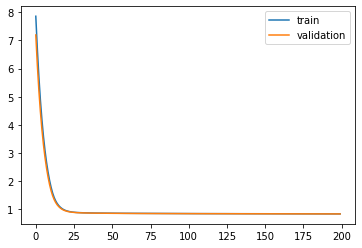

Time to train LSTM:  193.6552336215973
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 37s - loss: 7.9271 - pdc_loss: 0.6828 - event_loss: 0.6557 - val_loss: 7.2530 - val_pdc_loss: 0.6783 - val_event_loss: 0.6251

Epoch 00001: val_loss improved from inf to 7.25301, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 6.7605 - pdc_loss: 0.6620 - event_loss: 0.6152 - val_loss: 6.1758 - val_pdc_loss: 0.6597 - val_event_loss: 0.5858

Epoch 00002: val_loss improved from 7.25301 to 6.17582, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 5.7528 - pdc_loss: 0.6449 - event_loss: 0.5759 - val_loss: 5.2531 - val_pdc_loss: 0.6440 - val_event_loss: 0.5472

Epoch 00003: val_loss improved from 6.17582 to 5.25313, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 4.8939 - pdc_loss: 0.6303 - event_loss: 0.5375 - val_loss: 4.4718 - val_pdc_loss: 0.6305 - val_event_loss: 0.5102

Epoch 00004: val_loss improved from 5.25313 to 4.47177, saving 


Epoch 00035: val_loss improved from 0.87796 to 0.87701, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 0.8640 - pdc_loss: 0.5335 - event_loss: 0.3169 - val_loss: 0.8762 - val_pdc_loss: 0.5395 - val_event_loss: 0.3233

Epoch 00036: val_loss improved from 0.87701 to 0.87617, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 0.8632 - pdc_loss: 0.5330 - event_loss: 0.3168 - val_loss: 0.8753 - val_pdc_loss: 0.5389 - val_event_loss: 0.3232

Epoch 00037: val_loss improved from 0.87617 to 0.87530, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 0.8624 - pdc_loss: 0.5325 - event_loss: 0.3168 - val_loss: 0.8746 - val_pdc_loss: 0.5384 - val_event_loss: 0.3231

Epoch 00038: val_loss improved from 0.87530 to 0.87456, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 0.8617 - pdc_loss: 0.5320 - event_loss: 0.3167 - val_loss: 0.8739 - val_pdc_loss: 0.5379 - val_event_loss: 0.3231

Epoch 00039: val_loss improved from 0.87456 to 

 - 1s - loss: 0.8485 - pdc_loss: 0.5224 - event_loss: 0.3157 - val_loss: 0.8616 - val_pdc_loss: 0.5296 - val_event_loss: 0.3216

Epoch 00070: val_loss improved from 0.86208 to 0.86155, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.8483 - pdc_loss: 0.5223 - event_loss: 0.3157 - val_loss: 0.8613 - val_pdc_loss: 0.5294 - val_event_loss: 0.3215

Epoch 00071: val_loss improved from 0.86155 to 0.86131, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.8480 - pdc_loss: 0.5220 - event_loss: 0.3157 - val_loss: 0.8614 - val_pdc_loss: 0.5294 - val_event_loss: 0.3217

Epoch 00072: val_loss did not improve from 0.86131
Epoch 73/200
 - 1s - loss: 0.8478 - pdc_loss: 0.5219 - event_loss: 0.3156 - val_loss: 0.8610 - val_pdc_loss: 0.5291 - val_event_loss: 0.3217

Epoch 00073: val_loss improved from 0.86131 to 0.86104, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.8475 - pdc_loss: 0.5217 - event_loss: 0.3156 - val_loss: 0.8611 - val_pdc_los

 - 1s - loss: 0.8416 - pdc_loss: 0.5174 - event_loss: 0.3151 - val_loss: 0.8559 - val_pdc_loss: 0.5263 - val_event_loss: 0.3205

Epoch 00107: val_loss improved from 0.85591 to 0.85589, saving model to Event_val_weights2.hdf5
Epoch 108/200
 - 1s - loss: 0.8414 - pdc_loss: 0.5172 - event_loss: 0.3151 - val_loss: 0.8556 - val_pdc_loss: 0.5260 - val_event_loss: 0.3206

Epoch 00108: val_loss improved from 0.85589 to 0.85563, saving model to Event_val_weights2.hdf5
Epoch 109/200
 - 1s - loss: 0.8413 - pdc_loss: 0.5172 - event_loss: 0.3150 - val_loss: 0.8555 - val_pdc_loss: 0.5260 - val_event_loss: 0.3205

Epoch 00109: val_loss improved from 0.85563 to 0.85553, saving model to Event_val_weights2.hdf5
Epoch 110/200
 - 1s - loss: 0.8411 - pdc_loss: 0.5170 - event_loss: 0.3150 - val_loss: 0.8551 - val_pdc_loss: 0.5259 - val_event_loss: 0.3202

Epoch 00110: val_loss improved from 0.85553 to 0.85508, saving model to Event_val_weights2.hdf5
Epoch 111/200
 - 1s - loss: 0.8410 - pdc_loss: 0.5170 - ev


Epoch 00146: val_loss did not improve from 0.85310
Epoch 147/200
 - 1s - loss: 0.8377 - pdc_loss: 0.5148 - event_loss: 0.3142 - val_loss: 0.8538 - val_pdc_loss: 0.5252 - val_event_loss: 0.3200

Epoch 00147: val_loss did not improve from 0.85310
Epoch 148/200
 - 1s - loss: 0.8376 - pdc_loss: 0.5148 - event_loss: 0.3142 - val_loss: 0.8536 - val_pdc_loss: 0.5250 - val_event_loss: 0.3200

Epoch 00148: val_loss did not improve from 0.85310
Epoch 149/200
 - 1s - loss: 0.8375 - pdc_loss: 0.5147 - event_loss: 0.3142 - val_loss: 0.8536 - val_pdc_loss: 0.5250 - val_event_loss: 0.3200

Epoch 00149: val_loss did not improve from 0.85310
Epoch 150/200
 - 1s - loss: 0.8374 - pdc_loss: 0.5147 - event_loss: 0.3142 - val_loss: 0.8532 - val_pdc_loss: 0.5246 - val_event_loss: 0.3200

Epoch 00150: val_loss did not improve from 0.85310
Epoch 151/200
 - 1s - loss: 0.8374 - pdc_loss: 0.5146 - event_loss: 0.3142 - val_loss: 0.8530 - val_pdc_loss: 0.5245 - val_event_loss: 0.3199

Epoch 00151: val_loss improve


Epoch 00187: val_loss did not improve from 0.85177
Epoch 188/200
 - 1s - loss: 0.8356 - pdc_loss: 0.5137 - event_loss: 0.3137 - val_loss: 0.8519 - val_pdc_loss: 0.5239 - val_event_loss: 0.3198

Epoch 00188: val_loss did not improve from 0.85177
Epoch 189/200
 - 1s - loss: 0.8355 - pdc_loss: 0.5137 - event_loss: 0.3136 - val_loss: 0.8519 - val_pdc_loss: 0.5239 - val_event_loss: 0.3197

Epoch 00189: val_loss did not improve from 0.85177
Epoch 190/200
 - 1s - loss: 0.8356 - pdc_loss: 0.5137 - event_loss: 0.3136 - val_loss: 0.8519 - val_pdc_loss: 0.5239 - val_event_loss: 0.3198

Epoch 00190: val_loss did not improve from 0.85177
Epoch 191/200
 - 1s - loss: 0.8355 - pdc_loss: 0.5136 - event_loss: 0.3136 - val_loss: 0.8519 - val_pdc_loss: 0.5240 - val_event_loss: 0.3197

Epoch 00191: val_loss did not improve from 0.85177
Epoch 192/200
 - 1s - loss: 0.8355 - pdc_loss: 0.5136 - event_loss: 0.3136 - val_loss: 0.8518 - val_pdc_loss: 0.5239 - val_event_loss: 0.3197

Epoch 00192: val_loss did not

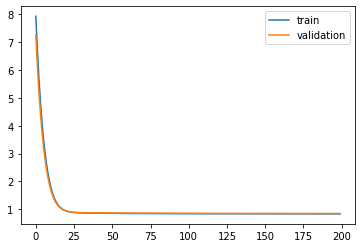

Time to train LSTM:  187.60407853126526
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 54s - loss: 7.9757 - pdc_loss: 0.7464 - event_loss: 0.6988 - val_loss: 7.2986 - val_pdc_loss: 0.7290 - val_event_loss: 0.6737

Epoch 00001: val_loss improved from inf to 7.29864, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 6.8044 - pdc_loss: 0.7208 - event_loss: 0.6510 - val_loss: 6.2196 - val_pdc_loss: 0.7072 - val_event_loss: 0.6294

Epoch 00002: val_loss improved from 7.29864 to 6.21957, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 5.7940 - pdc_loss: 0.6994 - event_loss: 0.6083 - val_loss: 5.2962 - val_pdc_loss: 0.6890 - val_event_loss: 0.5889

Epoch 00003: val_loss improved from 6.21957 to 5.29621, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 4.9330 - pdc_loss: 0.6808 - event_loss: 0.5686 - val_loss: 4.5137 - val_pdc_loss: 0.6727 - val_event_loss: 0.5508

Epoch 00004: val_loss improved from 5.29621 to 4.51373, saving


Epoch 00035: val_loss improved from 0.88932 to 0.88804, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 0.8665 - pdc_loss: 0.5328 - event_loss: 0.3190 - val_loss: 0.8868 - val_pdc_loss: 0.5474 - val_event_loss: 0.3247

Epoch 00036: val_loss improved from 0.88804 to 0.88679, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 0.8655 - pdc_loss: 0.5321 - event_loss: 0.3189 - val_loss: 0.8860 - val_pdc_loss: 0.5469 - val_event_loss: 0.3247

Epoch 00037: val_loss improved from 0.88679 to 0.88601, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 0.8646 - pdc_loss: 0.5315 - event_loss: 0.3188 - val_loss: 0.8853 - val_pdc_loss: 0.5465 - val_event_loss: 0.3245

Epoch 00038: val_loss improved from 0.88601 to 0.88528, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 0.8638 - pdc_loss: 0.5309 - event_loss: 0.3187 - val_loss: 0.8844 - val_pdc_loss: 0.5458 - val_event_loss: 0.3245

Epoch 00039: val_loss improved from 0.88528 to 


Epoch 00070: val_loss improved from 0.87404 to 0.87394, saving model to Event_val_weights3.hdf5
Epoch 71/200
 - 1s - loss: 0.8507 - pdc_loss: 0.5229 - event_loss: 0.3167 - val_loss: 0.8736 - val_pdc_loss: 0.5394 - val_event_loss: 0.3232

Epoch 00071: val_loss improved from 0.87394 to 0.87358, saving model to Event_val_weights3.hdf5
Epoch 72/200
 - 1s - loss: 0.8504 - pdc_loss: 0.5228 - event_loss: 0.3167 - val_loss: 0.8734 - val_pdc_loss: 0.5393 - val_event_loss: 0.3231

Epoch 00072: val_loss improved from 0.87358 to 0.87336, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.8501 - pdc_loss: 0.5225 - event_loss: 0.3166 - val_loss: 0.8734 - val_pdc_loss: 0.5393 - val_event_loss: 0.3232

Epoch 00073: val_loss did not improve from 0.87336
Epoch 74/200
 - 1s - loss: 0.8500 - pdc_loss: 0.5225 - event_loss: 0.3166 - val_loss: 0.8732 - val_pdc_loss: 0.5392 - val_event_loss: 0.3231

Epoch 00074: val_loss improved from 0.87336 to 0.87318, saving model to Event_val_weights3.h


Epoch 00107: val_loss improved from 0.86914 to 0.86888, saving model to Event_val_weights3.hdf5
Epoch 108/200
 - 1s - loss: 0.8430 - pdc_loss: 0.5178 - event_loss: 0.3158 - val_loss: 0.8686 - val_pdc_loss: 0.5358 - val_event_loss: 0.3233

Epoch 00108: val_loss improved from 0.86888 to 0.86857, saving model to Event_val_weights3.hdf5
Epoch 109/200
 - 1s - loss: 0.8429 - pdc_loss: 0.5178 - event_loss: 0.3158 - val_loss: 0.8689 - val_pdc_loss: 0.5361 - val_event_loss: 0.3234

Epoch 00109: val_loss did not improve from 0.86857
Epoch 110/200
 - 1s - loss: 0.8427 - pdc_loss: 0.5176 - event_loss: 0.3157 - val_loss: 0.8685 - val_pdc_loss: 0.5359 - val_event_loss: 0.3233

Epoch 00110: val_loss improved from 0.86857 to 0.86853, saving model to Event_val_weights3.hdf5
Epoch 111/200
 - 1s - loss: 0.8426 - pdc_loss: 0.5175 - event_loss: 0.3157 - val_loss: 0.8686 - val_pdc_loss: 0.5359 - val_event_loss: 0.3234

Epoch 00111: val_loss did not improve from 0.86853
Epoch 112/200
 - 1s - loss: 0.8424 - 

 - 1s - loss: 0.8388 - pdc_loss: 0.5150 - event_loss: 0.3153 - val_loss: 0.8661 - val_pdc_loss: 0.5341 - val_event_loss: 0.3235

Epoch 00145: val_loss did not improve from 0.86602
Epoch 146/200
 - 1s - loss: 0.8387 - pdc_loss: 0.5149 - event_loss: 0.3152 - val_loss: 0.8659 - val_pdc_loss: 0.5339 - val_event_loss: 0.3234

Epoch 00146: val_loss improved from 0.86602 to 0.86587, saving model to Event_val_weights3.hdf5
Epoch 147/200
 - 1s - loss: 0.8387 - pdc_loss: 0.5149 - event_loss: 0.3152 - val_loss: 0.8661 - val_pdc_loss: 0.5343 - val_event_loss: 0.3234

Epoch 00147: val_loss did not improve from 0.86587
Epoch 148/200
 - 1s - loss: 0.8386 - pdc_loss: 0.5149 - event_loss: 0.3152 - val_loss: 0.8659 - val_pdc_loss: 0.5340 - val_event_loss: 0.3234

Epoch 00148: val_loss did not improve from 0.86587
Epoch 149/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5148 - event_loss: 0.3152 - val_loss: 0.8660 - val_pdc_loss: 0.5342 - val_event_loss: 0.3234

Epoch 00149: val_loss did not improve from 0.86587


Epoch 00184: val_loss improved from 0.86450 to 0.86444, saving model to Event_val_weights3.hdf5
Epoch 185/200
 - 1s - loss: 0.8364 - pdc_loss: 0.5136 - event_loss: 0.3148 - val_loss: 0.8646 - val_pdc_loss: 0.5335 - val_event_loss: 0.3232

Epoch 00185: val_loss did not improve from 0.86444
Epoch 186/200
 - 1s - loss: 0.8364 - pdc_loss: 0.5136 - event_loss: 0.3148 - val_loss: 0.8645 - val_pdc_loss: 0.5334 - val_event_loss: 0.3232

Epoch 00186: val_loss did not improve from 0.86444
Epoch 187/200
 - 1s - loss: 0.8363 - pdc_loss: 0.5135 - event_loss: 0.3148 - val_loss: 0.8645 - val_pdc_loss: 0.5334 - val_event_loss: 0.3231

Epoch 00187: val_loss did not improve from 0.86444
Epoch 188/200
 - 1s - loss: 0.8362 - pdc_loss: 0.5135 - event_loss: 0.3148 - val_loss: 0.8642 - val_pdc_loss: 0.5331 - val_event_loss: 0.3231

Epoch 00188: val_loss improved from 0.86444 to 0.86420, saving model to Event_val_weights3.hdf5
Epoch 189/200
 - 1s - loss: 0.8362 - pdc_loss: 0.5135 - event_loss: 0.3148 - val_l

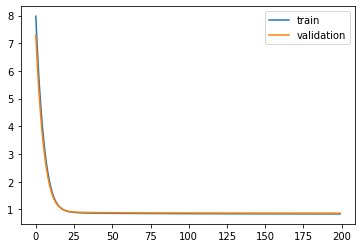

Time to train LSTM:  206.8778202533722
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 66s - loss: 8.0472 - pdc_loss: 0.7469 - event_loss: 0.7159 - val_loss: 7.3669 - val_pdc_loss: 0.7300 - val_event_loss: 0.6947

Epoch 00001: val_loss improved from inf to 7.36690, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 6.8803 - pdc_loss: 0.7239 - event_loss: 0.6828 - val_loss: 6.2918 - val_pdc_loss: 0.7099 - val_event_loss: 0.6636

Epoch 00002: val_loss improved from 7.36690 to 6.29181, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 5.8745 - pdc_loss: 0.7043 - event_loss: 0.6518 - val_loss: 5.3728 - val_pdc_loss: 0.6928 - val_event_loss: 0.6334

Epoch 00003: val_loss improved from 6.29181 to 5.37284, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 5.0184 - pdc_loss: 0.6878 - event_loss: 0.6209 - val_loss: 4.5944 - val_pdc_loss: 0.6785 - val_event_loss: 0.6023

Epoch 00004: val_loss improved from 5.37284 to 4.59441, saving 


Epoch 00035: val_loss improved from 0.89768 to 0.89690, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 0.8722 - pdc_loss: 0.5403 - event_loss: 0.3185 - val_loss: 0.8961 - val_pdc_loss: 0.5538 - val_event_loss: 0.3289

Epoch 00036: val_loss improved from 0.89690 to 0.89609, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 0.8710 - pdc_loss: 0.5393 - event_loss: 0.3184 - val_loss: 0.8955 - val_pdc_loss: 0.5534 - val_event_loss: 0.3289

Epoch 00037: val_loss improved from 0.89609 to 0.89555, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 0.8699 - pdc_loss: 0.5384 - event_loss: 0.3183 - val_loss: 0.8950 - val_pdc_loss: 0.5530 - val_event_loss: 0.3288

Epoch 00038: val_loss improved from 0.89555 to 0.89496, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 0.8688 - pdc_loss: 0.5375 - event_loss: 0.3182 - val_loss: 0.8945 - val_pdc_loss: 0.5526 - val_event_loss: 0.3288

Epoch 00039: val_loss improved from 0.89496 to 

 - 1s - loss: 0.8527 - pdc_loss: 0.5245 - event_loss: 0.3170 - val_loss: 0.8824 - val_pdc_loss: 0.5435 - val_event_loss: 0.3278

Epoch 00070: val_loss improved from 0.88249 to 0.88235, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.8524 - pdc_loss: 0.5243 - event_loss: 0.3170 - val_loss: 0.8822 - val_pdc_loss: 0.5433 - val_event_loss: 0.3278

Epoch 00071: val_loss improved from 0.88235 to 0.88216, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.8521 - pdc_loss: 0.5241 - event_loss: 0.3170 - val_loss: 0.8819 - val_pdc_loss: 0.5433 - val_event_loss: 0.3277

Epoch 00072: val_loss improved from 0.88216 to 0.88192, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.8518 - pdc_loss: 0.5239 - event_loss: 0.3169 - val_loss: 0.8818 - val_pdc_loss: 0.5432 - val_event_loss: 0.3277

Epoch 00073: val_loss improved from 0.88192 to 0.88182, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.8517 - pdc_loss: 0.5238 - event_

 - 1s - loss: 0.8457 - pdc_loss: 0.5198 - event_loss: 0.3161 - val_loss: 0.8782 - val_pdc_loss: 0.5417 - val_event_loss: 0.3267

Epoch 00105: val_loss improved from 0.87841 to 0.87821, saving model to Event_val_weights4.hdf5
Epoch 106/200
 - 1s - loss: 0.8454 - pdc_loss: 0.5196 - event_loss: 0.3160 - val_loss: 0.8782 - val_pdc_loss: 0.5417 - val_event_loss: 0.3267

Epoch 00106: val_loss improved from 0.87821 to 0.87818, saving model to Event_val_weights4.hdf5
Epoch 107/200
 - 1s - loss: 0.8453 - pdc_loss: 0.5195 - event_loss: 0.3160 - val_loss: 0.8779 - val_pdc_loss: 0.5416 - val_event_loss: 0.3267

Epoch 00107: val_loss improved from 0.87818 to 0.87795, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.8451 - pdc_loss: 0.5193 - event_loss: 0.3160 - val_loss: 0.8779 - val_pdc_loss: 0.5415 - val_event_loss: 0.3267

Epoch 00108: val_loss improved from 0.87795 to 0.87788, saving model to Event_val_weights4.hdf5
Epoch 109/200
 - 1s - loss: 0.8449 - pdc_loss: 0.5193 - ev


Epoch 00140: val_loss improved from 0.87410 to 0.87403, saving model to Event_val_weights4.hdf5
Epoch 141/200
 - 1s - loss: 0.8397 - pdc_loss: 0.5157 - event_loss: 0.3150 - val_loss: 0.8740 - val_pdc_loss: 0.5382 - val_event_loss: 0.3267

Epoch 00141: val_loss improved from 0.87403 to 0.87396, saving model to Event_val_weights4.hdf5
Epoch 142/200
 - 1s - loss: 0.8396 - pdc_loss: 0.5156 - event_loss: 0.3149 - val_loss: 0.8740 - val_pdc_loss: 0.5383 - val_event_loss: 0.3266

Epoch 00142: val_loss improved from 0.87396 to 0.87395, saving model to Event_val_weights4.hdf5
Epoch 143/200
 - 1s - loss: 0.8394 - pdc_loss: 0.5155 - event_loss: 0.3149 - val_loss: 0.8737 - val_pdc_loss: 0.5381 - val_event_loss: 0.3267

Epoch 00143: val_loss improved from 0.87395 to 0.87372, saving model to Event_val_weights4.hdf5
Epoch 144/200
 - 1s - loss: 0.8393 - pdc_loss: 0.5154 - event_loss: 0.3149 - val_loss: 0.8738 - val_pdc_loss: 0.5382 - val_event_loss: 0.3267

Epoch 00144: val_loss did not improve from 

 - 1s - loss: 0.8361 - pdc_loss: 0.5138 - event_loss: 0.3139 - val_loss: 0.8718 - val_pdc_loss: 0.5363 - val_event_loss: 0.3271

Epoch 00178: val_loss did not improve from 0.87164
Epoch 179/200
 - 1s - loss: 0.8359 - pdc_loss: 0.5136 - event_loss: 0.3139 - val_loss: 0.8715 - val_pdc_loss: 0.5361 - val_event_loss: 0.3270

Epoch 00179: val_loss improved from 0.87164 to 0.87146, saving model to Event_val_weights4.hdf5
Epoch 180/200
 - 1s - loss: 0.8359 - pdc_loss: 0.5136 - event_loss: 0.3139 - val_loss: 0.8716 - val_pdc_loss: 0.5361 - val_event_loss: 0.3271

Epoch 00180: val_loss did not improve from 0.87146
Epoch 181/200
 - 1s - loss: 0.8358 - pdc_loss: 0.5136 - event_loss: 0.3139 - val_loss: 0.8715 - val_pdc_loss: 0.5360 - val_event_loss: 0.3271

Epoch 00181: val_loss improved from 0.87146 to 0.87145, saving model to Event_val_weights4.hdf5
Epoch 182/200
 - 1s - loss: 0.8358 - pdc_loss: 0.5136 - event_loss: 0.3138 - val_loss: 0.8715 - val_pdc_loss: 0.5360 - val_event_loss: 0.3271

Epoch

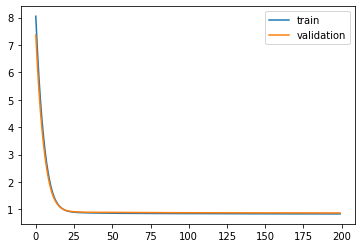

Time to train LSTM:  219.29966235160828
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 82s - loss: 7.9930 - pdc_loss: 0.7120 - event_loss: 0.7402 - val_loss: 7.3139 - val_pdc_loss: 0.6965 - val_event_loss: 0.7078

Epoch 00001: val_loss improved from inf to 7.31387, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 6.8228 - pdc_loss: 0.6903 - event_loss: 0.6843 - val_loss: 6.2332 - val_pdc_loss: 0.6764 - val_event_loss: 0.6563

Epoch 00002: val_loss improved from 7.31387 to 6.23324, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 5.8137 - pdc_loss: 0.6724 - event_loss: 0.6363 - val_loss: 5.3094 - val_pdc_loss: 0.6603 - val_event_loss: 0.6114

Epoch 00003: val_loss improved from 6.23324 to 5.30942, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 4.9544 - pdc_loss: 0.6579 - event_loss: 0.5935 - val_loss: 4.5270 - val_pdc_loss: 0.6477 - val_event_loss: 0.5701

Epoch 00004: val_loss improved from 5.30942 to 4.52700, saving


Epoch 00035: val_loss improved from 0.86952 to 0.86855, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 0.8658 - pdc_loss: 0.5331 - event_loss: 0.3189 - val_loss: 0.8676 - val_pdc_loss: 0.5349 - val_event_loss: 0.3191

Epoch 00036: val_loss improved from 0.86855 to 0.86756, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 0.8649 - pdc_loss: 0.5325 - event_loss: 0.3189 - val_loss: 0.8667 - val_pdc_loss: 0.5343 - val_event_loss: 0.3190

Epoch 00037: val_loss improved from 0.86756 to 0.86669, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 0.8640 - pdc_loss: 0.5319 - event_loss: 0.3187 - val_loss: 0.8658 - val_pdc_loss: 0.5336 - val_event_loss: 0.3189

Epoch 00038: val_loss improved from 0.86669 to 0.86579, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 0.8632 - pdc_loss: 0.5313 - event_loss: 0.3187 - val_loss: 0.8648 - val_pdc_loss: 0.5328 - val_event_loss: 0.3189

Epoch 00039: val_loss improved from 0.86579 to 

 - 1s - loss: 0.8499 - pdc_loss: 0.5222 - event_loss: 0.3175 - val_loss: 0.8521 - val_pdc_loss: 0.5246 - val_event_loss: 0.3173

Epoch 00070: val_loss improved from 0.85261 to 0.85212, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.8496 - pdc_loss: 0.5220 - event_loss: 0.3175 - val_loss: 0.8519 - val_pdc_loss: 0.5245 - val_event_loss: 0.3173

Epoch 00071: val_loss improved from 0.85212 to 0.85189, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8494 - pdc_loss: 0.5218 - event_loss: 0.3175 - val_loss: 0.8515 - val_pdc_loss: 0.5241 - val_event_loss: 0.3173

Epoch 00072: val_loss improved from 0.85189 to 0.85148, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8491 - pdc_loss: 0.5217 - event_loss: 0.3174 - val_loss: 0.8514 - val_pdc_loss: 0.5241 - val_event_loss: 0.3172

Epoch 00073: val_loss improved from 0.85148 to 0.85136, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8489 - pdc_loss: 0.5215 - event_

 - 1s - loss: 0.8428 - pdc_loss: 0.5174 - event_loss: 0.3167 - val_loss: 0.8457 - val_pdc_loss: 0.5201 - val_event_loss: 0.3168

Epoch 00106: val_loss improved from 0.84596 to 0.84567, saving model to Event_val_weights5.hdf5
Epoch 107/200
 - 1s - loss: 0.8427 - pdc_loss: 0.5173 - event_loss: 0.3167 - val_loss: 0.8458 - val_pdc_loss: 0.5204 - val_event_loss: 0.3167

Epoch 00107: val_loss did not improve from 0.84567
Epoch 108/200
 - 1s - loss: 0.8425 - pdc_loss: 0.5173 - event_loss: 0.3166 - val_loss: 0.8456 - val_pdc_loss: 0.5201 - val_event_loss: 0.3168

Epoch 00108: val_loss improved from 0.84567 to 0.84559, saving model to Event_val_weights5.hdf5
Epoch 109/200
 - 1s - loss: 0.8424 - pdc_loss: 0.5172 - event_loss: 0.3166 - val_loss: 0.8457 - val_pdc_loss: 0.5203 - val_event_loss: 0.3167

Epoch 00109: val_loss did not improve from 0.84559
Epoch 110/200
 - 1s - loss: 0.8423 - pdc_loss: 0.5171 - event_loss: 0.3166 - val_loss: 0.8454 - val_pdc_loss: 0.5200 - val_event_loss: 0.3168

Epoch


Epoch 00143: val_loss did not improve from 0.84317
Epoch 144/200
 - 1s - loss: 0.8393 - pdc_loss: 0.5156 - event_loss: 0.3158 - val_loss: 0.8430 - val_pdc_loss: 0.5188 - val_event_loss: 0.3163

Epoch 00144: val_loss improved from 0.84317 to 0.84305, saving model to Event_val_weights5.hdf5
Epoch 145/200
 - 1s - loss: 0.8393 - pdc_loss: 0.5156 - event_loss: 0.3158 - val_loss: 0.8431 - val_pdc_loss: 0.5189 - val_event_loss: 0.3162

Epoch 00145: val_loss did not improve from 0.84305
Epoch 146/200
 - 1s - loss: 0.8391 - pdc_loss: 0.5155 - event_loss: 0.3157 - val_loss: 0.8429 - val_pdc_loss: 0.5187 - val_event_loss: 0.3163

Epoch 00146: val_loss improved from 0.84305 to 0.84290, saving model to Event_val_weights5.hdf5
Epoch 147/200
 - 1s - loss: 0.8392 - pdc_loss: 0.5155 - event_loss: 0.3157 - val_loss: 0.8430 - val_pdc_loss: 0.5189 - val_event_loss: 0.3162

Epoch 00147: val_loss did not improve from 0.84290
Epoch 148/200
 - 1s - loss: 0.8391 - pdc_loss: 0.5154 - event_loss: 0.3157 - val_l


Epoch 00182: val_loss improved from 0.84157 to 0.84150, saving model to Event_val_weights5.hdf5
Epoch 183/200
 - 1s - loss: 0.8371 - pdc_loss: 0.5146 - event_loss: 0.3150 - val_loss: 0.8416 - val_pdc_loss: 0.5181 - val_event_loss: 0.3159

Epoch 00183: val_loss did not improve from 0.84150
Epoch 184/200
 - 1s - loss: 0.8370 - pdc_loss: 0.5145 - event_loss: 0.3150 - val_loss: 0.8415 - val_pdc_loss: 0.5179 - val_event_loss: 0.3160

Epoch 00184: val_loss improved from 0.84150 to 0.84147, saving model to Event_val_weights5.hdf5
Epoch 185/200
 - 1s - loss: 0.8370 - pdc_loss: 0.5145 - event_loss: 0.3149 - val_loss: 0.8415 - val_pdc_loss: 0.5180 - val_event_loss: 0.3160

Epoch 00185: val_loss did not improve from 0.84147
Epoch 186/200
 - 1s - loss: 0.8369 - pdc_loss: 0.5145 - event_loss: 0.3149 - val_loss: 0.8414 - val_pdc_loss: 0.5178 - val_event_loss: 0.3160

Epoch 00186: val_loss improved from 0.84147 to 0.84136, saving model to Event_val_weights5.hdf5
Epoch 187/200
 - 1s - loss: 0.8369 - 

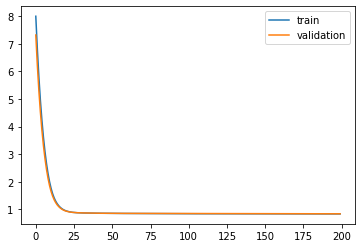

Time to train LSTM:  233.48930525779724
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 36s - loss: 8.2394 - pdc_loss: 0.7190 - event_loss: 0.7260 - val_loss: 7.5384 - val_pdc_loss: 0.7100 - val_event_loss: 0.6921

Epoch 00001: val_loss improved from inf to 7.53835, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 7.0237 - pdc_loss: 0.7008 - event_loss: 0.6672 - val_loss: 6.4156 - val_pdc_loss: 0.6933 - val_event_loss: 0.6366

Epoch 00002: val_loss improved from 7.53835 to 6.41557, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 5.9749 - pdc_loss: 0.6846 - event_loss: 0.6161 - val_loss: 5.4539 - val_pdc_loss: 0.6783 - val_event_loss: 0.5869

Epoch 00003: val_loss improved from 6.41557 to 5.45390, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 5.0810 - pdc_loss: 0.6700 - event_loss: 0.5697 - val_loss: 4.6383 - val_pdc_loss: 0.6644 - val_event_loss: 0.5412

Epoch 00004: val_loss improved from 5.45390 to 4.63834, saving


Epoch 00035: val_loss improved from 0.86830 to 0.86694, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 0.8704 - pdc_loss: 0.5367 - event_loss: 0.3195 - val_loss: 0.8658 - val_pdc_loss: 0.5376 - val_event_loss: 0.3141

Epoch 00036: val_loss improved from 0.86694 to 0.86575, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 0.8692 - pdc_loss: 0.5358 - event_loss: 0.3194 - val_loss: 0.8645 - val_pdc_loss: 0.5366 - val_event_loss: 0.3139

Epoch 00037: val_loss improved from 0.86575 to 0.86447, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 0.8682 - pdc_loss: 0.5349 - event_loss: 0.3193 - val_loss: 0.8634 - val_pdc_loss: 0.5357 - val_event_loss: 0.3138

Epoch 00038: val_loss improved from 0.86447 to 0.86344, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 0.8671 - pdc_loss: 0.5341 - event_loss: 0.3192 - val_loss: 0.8623 - val_pdc_loss: 0.5348 - val_event_loss: 0.3137

Epoch 00039: val_loss improved from 0.86344 to 

 - 1s - loss: 0.8511 - pdc_loss: 0.5224 - event_loss: 0.3174 - val_loss: 0.8470 - val_pdc_loss: 0.5237 - val_event_loss: 0.3121

Epoch 00070: val_loss improved from 0.84735 to 0.84700, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 0.8509 - pdc_loss: 0.5223 - event_loss: 0.3174 - val_loss: 0.8468 - val_pdc_loss: 0.5236 - val_event_loss: 0.3119

Epoch 00071: val_loss improved from 0.84700 to 0.84676, saving model to Event_val_weights1.hdf5
Epoch 72/200
 - 1s - loss: 0.8507 - pdc_loss: 0.5221 - event_loss: 0.3174 - val_loss: 0.8465 - val_pdc_loss: 0.5233 - val_event_loss: 0.3120

Epoch 00072: val_loss improved from 0.84676 to 0.84647, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.8504 - pdc_loss: 0.5219 - event_loss: 0.3174 - val_loss: 0.8462 - val_pdc_loss: 0.5232 - val_event_loss: 0.3120

Epoch 00073: val_loss improved from 0.84647 to 0.84622, saving model to Event_val_weights1.hdf5
Epoch 74/200
 - 1s - loss: 0.8501 - pdc_loss: 0.5218 - event_

 - 1s - loss: 0.8447 - pdc_loss: 0.5184 - event_loss: 0.3167 - val_loss: 0.8408 - val_pdc_loss: 0.5196 - val_event_loss: 0.3116

Epoch 00106: val_loss did not improve from 0.84075
Epoch 107/200
 - 1s - loss: 0.8446 - pdc_loss: 0.5183 - event_loss: 0.3167 - val_loss: 0.8407 - val_pdc_loss: 0.5196 - val_event_loss: 0.3116

Epoch 00107: val_loss improved from 0.84075 to 0.84073, saving model to Event_val_weights1.hdf5
Epoch 108/200
 - 1s - loss: 0.8444 - pdc_loss: 0.5182 - event_loss: 0.3167 - val_loss: 0.8406 - val_pdc_loss: 0.5197 - val_event_loss: 0.3114

Epoch 00108: val_loss improved from 0.84073 to 0.84056, saving model to Event_val_weights1.hdf5
Epoch 109/200
 - 1s - loss: 0.8444 - pdc_loss: 0.5182 - event_loss: 0.3167 - val_loss: 0.8404 - val_pdc_loss: 0.5194 - val_event_loss: 0.3114

Epoch 00109: val_loss improved from 0.84056 to 0.84036, saving model to Event_val_weights1.hdf5
Epoch 110/200
 - 1s - loss: 0.8443 - pdc_loss: 0.5182 - event_loss: 0.3167 - val_loss: 0.8405 - val_pdc


Epoch 00144: val_loss did not improve from 0.83791
Epoch 145/200
 - 1s - loss: 0.8411 - pdc_loss: 0.5163 - event_loss: 0.3162 - val_loss: 0.8379 - val_pdc_loss: 0.5181 - val_event_loss: 0.3111

Epoch 00145: val_loss improved from 0.83791 to 0.83790, saving model to Event_val_weights1.hdf5
Epoch 146/200
 - 1s - loss: 0.8410 - pdc_loss: 0.5163 - event_loss: 0.3161 - val_loss: 0.8381 - val_pdc_loss: 0.5183 - val_event_loss: 0.3112

Epoch 00146: val_loss did not improve from 0.83790
Epoch 147/200
 - 1s - loss: 0.8410 - pdc_loss: 0.5163 - event_loss: 0.3162 - val_loss: 0.8381 - val_pdc_loss: 0.5184 - val_event_loss: 0.3111

Epoch 00147: val_loss did not improve from 0.83790
Epoch 148/200
 - 1s - loss: 0.8409 - pdc_loss: 0.5162 - event_loss: 0.3161 - val_loss: 0.8381 - val_pdc_loss: 0.5184 - val_event_loss: 0.3111

Epoch 00148: val_loss did not improve from 0.83790
Epoch 149/200
 - 1s - loss: 0.8409 - pdc_loss: 0.5163 - event_loss: 0.3161 - val_loss: 0.8377 - val_pdc_loss: 0.5180 - val_even


Epoch 00183: val_loss improved from 0.83623 to 0.83617, saving model to Event_val_weights1.hdf5
Epoch 184/200
 - 1s - loss: 0.8390 - pdc_loss: 0.5153 - event_loss: 0.3156 - val_loss: 0.8365 - val_pdc_loss: 0.5176 - val_event_loss: 0.3108

Epoch 00184: val_loss did not improve from 0.83617
Epoch 185/200
 - 1s - loss: 0.8390 - pdc_loss: 0.5153 - event_loss: 0.3156 - val_loss: 0.8368 - val_pdc_loss: 0.5178 - val_event_loss: 0.3109

Epoch 00185: val_loss did not improve from 0.83617
Epoch 186/200
 - 1s - loss: 0.8389 - pdc_loss: 0.5152 - event_loss: 0.3156 - val_loss: 0.8363 - val_pdc_loss: 0.5179 - val_event_loss: 0.3103

Epoch 00186: val_loss did not improve from 0.83617
Epoch 187/200
 - 1s - loss: 0.8389 - pdc_loss: 0.5152 - event_loss: 0.3156 - val_loss: 0.8365 - val_pdc_loss: 0.5177 - val_event_loss: 0.3107

Epoch 00187: val_loss did not improve from 0.83617
Epoch 188/200
 - 1s - loss: 0.8388 - pdc_loss: 0.5152 - event_loss: 0.3156 - val_loss: 0.8361 - val_pdc_loss: 0.5176 - val_even

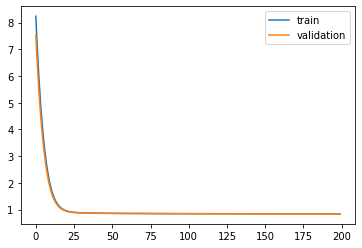

Time to train LSTM:  189.08841180801392
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 103s - loss: 8.2492 - pdc_loss: 0.7222 - event_loss: 0.7332 - val_loss: 7.5374 - val_pdc_loss: 0.7111 - val_event_loss: 0.6838

Epoch 00001: val_loss improved from inf to 7.53743, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 7.0081 - pdc_loss: 0.6956 - event_loss: 0.6474 - val_loss: 6.3983 - val_pdc_loss: 0.6884 - val_event_loss: 0.6126

Epoch 00002: val_loss improved from 7.53743 to 6.39826, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 5.9447 - pdc_loss: 0.6743 - event_loss: 0.5844 - val_loss: 5.4283 - val_pdc_loss: 0.6699 - val_event_loss: 0.5587

Epoch 00003: val_loss improved from 6.39826 to 5.42835, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 5.0434 - pdc_loss: 0.6569 - event_loss: 0.5354 - val_loss: 4.6101 - val_pdc_loss: 0.6544 - val_event_loss: 0.5150

Epoch 00004: val_loss improved from 5.42835 to 4.61014, savin


Epoch 00035: val_loss improved from 0.88442 to 0.88346, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 0.8716 - pdc_loss: 0.5396 - event_loss: 0.3182 - val_loss: 0.8824 - val_pdc_loss: 0.5451 - val_event_loss: 0.3237

Epoch 00036: val_loss improved from 0.88346 to 0.88243, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 0.8708 - pdc_loss: 0.5390 - event_loss: 0.3182 - val_loss: 0.8818 - val_pdc_loss: 0.5445 - val_event_loss: 0.3238

Epoch 00037: val_loss improved from 0.88243 to 0.88178, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 0.8699 - pdc_loss: 0.5383 - event_loss: 0.3181 - val_loss: 0.8812 - val_pdc_loss: 0.5439 - val_event_loss: 0.3239

Epoch 00038: val_loss improved from 0.88178 to 0.88120, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 0.8691 - pdc_loss: 0.5377 - event_loss: 0.3181 - val_loss: 0.8804 - val_pdc_loss: 0.5433 - val_event_loss: 0.3238

Epoch 00039: val_loss improved from 0.88120 to 

 - 1s - loss: 0.8516 - pdc_loss: 0.5241 - event_loss: 0.3165 - val_loss: 0.8645 - val_pdc_loss: 0.5313 - val_event_loss: 0.3222

Epoch 00070: val_loss did not improve from 0.86445
Epoch 71/200
 - 1s - loss: 0.8514 - pdc_loss: 0.5238 - event_loss: 0.3165 - val_loss: 0.8641 - val_pdc_loss: 0.5310 - val_event_loss: 0.3222

Epoch 00071: val_loss improved from 0.86445 to 0.86413, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.8510 - pdc_loss: 0.5236 - event_loss: 0.3165 - val_loss: 0.8639 - val_pdc_loss: 0.5307 - val_event_loss: 0.3222

Epoch 00072: val_loss improved from 0.86413 to 0.86388, saving model to Event_val_weights2.hdf5
Epoch 73/200
 - 1s - loss: 0.8506 - pdc_loss: 0.5233 - event_loss: 0.3164 - val_loss: 0.8635 - val_pdc_loss: 0.5305 - val_event_loss: 0.3221

Epoch 00073: val_loss improved from 0.86388 to 0.86353, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.8503 - pdc_loss: 0.5231 - event_loss: 0.3164 - val_loss: 0.8634 - val_pdc_los

 - 1s - loss: 0.8433 - pdc_loss: 0.5181 - event_loss: 0.3154 - val_loss: 0.8563 - val_pdc_loss: 0.5260 - val_event_loss: 0.3205

Epoch 00105: val_loss improved from 0.85637 to 0.85634, saving model to Event_val_weights2.hdf5
Epoch 106/200
 - 1s - loss: 0.8431 - pdc_loss: 0.5180 - event_loss: 0.3154 - val_loss: 0.8562 - val_pdc_loss: 0.5260 - val_event_loss: 0.3204

Epoch 00106: val_loss improved from 0.85634 to 0.85617, saving model to Event_val_weights2.hdf5
Epoch 107/200
 - 1s - loss: 0.8430 - pdc_loss: 0.5179 - event_loss: 0.3153 - val_loss: 0.8562 - val_pdc_loss: 0.5260 - val_event_loss: 0.3204

Epoch 00107: val_loss did not improve from 0.85617
Epoch 108/200
 - 1s - loss: 0.8428 - pdc_loss: 0.5178 - event_loss: 0.3153 - val_loss: 0.8560 - val_pdc_loss: 0.5259 - val_event_loss: 0.3203

Epoch 00108: val_loss improved from 0.85617 to 0.85598, saving model to Event_val_weights2.hdf5
Epoch 109/200
 - 1s - loss: 0.8428 - pdc_loss: 0.5178 - event_loss: 0.3153 - val_loss: 0.8558 - val_pdc

 - 1s - loss: 2.0428 - pdc_loss: 0.6024 - event_loss: 0.3717 - val_loss: 1.9099 - val_pdc_loss: 0.6055 - val_event_loss: 0.3658

Epoch 00010: val_loss improved from 2.17948 to 1.90986, saving model to Event_val_weights3.hdf5
Epoch 11/200
 - 1s - loss: 1.7966 - pdc_loss: 0.5952 - event_loss: 0.3537 - val_loss: 1.6933 - val_pdc_loss: 0.5990 - val_event_loss: 0.3519

Epoch 00011: val_loss improved from 1.90986 to 1.69327, saving model to Event_val_weights3.hdf5
Epoch 12/200
 - 1s - loss: 1.5996 - pdc_loss: 0.5884 - event_loss: 0.3417 - val_loss: 1.5213 - val_pdc_loss: 0.5928 - val_event_loss: 0.3433

Epoch 00012: val_loss improved from 1.69327 to 1.52131, saving model to Event_val_weights3.hdf5
Epoch 13/200
 - 1s - loss: 1.4435 - pdc_loss: 0.5818 - event_loss: 0.3345 - val_loss: 1.3851 - val_pdc_loss: 0.5869 - val_event_loss: 0.3381

Epoch 00013: val_loss improved from 1.52131 to 1.38510, saving model to Event_val_weights3.hdf5
Epoch 14/200
 - 1s - loss: 1.3200 - pdc_loss: 0.5756 - event_


Epoch 00044: val_loss improved from 0.87912 to 0.87821, saving model to Event_val_weights3.hdf5
Epoch 45/200
 - 1s - loss: 0.8568 - pdc_loss: 0.5266 - event_loss: 0.3171 - val_loss: 0.8776 - val_pdc_loss: 0.5418 - val_event_loss: 0.3228

Epoch 00045: val_loss improved from 0.87821 to 0.87757, saving model to Event_val_weights3.hdf5
Epoch 46/200
 - 1s - loss: 0.8560 - pdc_loss: 0.5261 - event_loss: 0.3170 - val_loss: 0.8770 - val_pdc_loss: 0.5415 - val_event_loss: 0.3228

Epoch 00046: val_loss improved from 0.87757 to 0.87703, saving model to Event_val_weights3.hdf5
Epoch 47/200
 - 1s - loss: 0.8552 - pdc_loss: 0.5257 - event_loss: 0.3168 - val_loss: 0.8764 - val_pdc_loss: 0.5412 - val_event_loss: 0.3227

Epoch 00047: val_loss improved from 0.87703 to 0.87643, saving model to Event_val_weights3.hdf5
Epoch 48/200
 - 1s - loss: 0.8545 - pdc_loss: 0.5253 - event_loss: 0.3167 - val_loss: 0.8760 - val_pdc_loss: 0.5409 - val_event_loss: 0.3227

Epoch 00048: val_loss improved from 0.87643 to 

 - 1s - loss: 0.8440 - pdc_loss: 0.5184 - event_loss: 0.3153 - val_loss: 0.8695 - val_pdc_loss: 0.5362 - val_event_loss: 0.3231

Epoch 00080: val_loss did not improve from 0.86917
Epoch 81/200
 - 1s - loss: 0.8438 - pdc_loss: 0.5183 - event_loss: 0.3153 - val_loss: 0.8690 - val_pdc_loss: 0.5358 - val_event_loss: 0.3230

Epoch 00081: val_loss improved from 0.86917 to 0.86903, saving model to Event_val_weights3.hdf5
Epoch 82/200
 - 1s - loss: 0.8436 - pdc_loss: 0.5182 - event_loss: 0.3153 - val_loss: 0.8692 - val_pdc_loss: 0.5360 - val_event_loss: 0.3231

Epoch 00082: val_loss did not improve from 0.86903
Epoch 83/200
 - 1s - loss: 0.8435 - pdc_loss: 0.5181 - event_loss: 0.3153 - val_loss: 0.8687 - val_pdc_loss: 0.5356 - val_event_loss: 0.3230

Epoch 00083: val_loss improved from 0.86903 to 0.86873, saving model to Event_val_weights3.hdf5
Epoch 84/200
 - 1s - loss: 0.8433 - pdc_loss: 0.5180 - event_loss: 0.3152 - val_loss: 0.8689 - val_pdc_loss: 0.5358 - val_event_loss: 0.3230

Epoch 000


Epoch 00118: val_loss did not improve from 0.86578
Epoch 119/200
 - 1s - loss: 0.8394 - pdc_loss: 0.5156 - event_loss: 0.3147 - val_loss: 0.8659 - val_pdc_loss: 0.5337 - val_event_loss: 0.3231

Epoch 00119: val_loss did not improve from 0.86578
Epoch 120/200
 - 1s - loss: 0.8393 - pdc_loss: 0.5154 - event_loss: 0.3148 - val_loss: 0.8660 - val_pdc_loss: 0.5339 - val_event_loss: 0.3231

Epoch 00120: val_loss did not improve from 0.86578
Epoch 121/200
 - 1s - loss: 0.8392 - pdc_loss: 0.5154 - event_loss: 0.3148 - val_loss: 0.8658 - val_pdc_loss: 0.5337 - val_event_loss: 0.3231

Epoch 00121: val_loss did not improve from 0.86578
Epoch 122/200
 - 1s - loss: 0.8391 - pdc_loss: 0.5154 - event_loss: 0.3147 - val_loss: 0.8660 - val_pdc_loss: 0.5340 - val_event_loss: 0.3230

Epoch 00122: val_loss did not improve from 0.86578
Epoch 123/200
 - 1s - loss: 0.8390 - pdc_loss: 0.5153 - event_loss: 0.3147 - val_loss: 0.8657 - val_pdc_loss: 0.5336 - val_event_loss: 0.3231

Epoch 00123: val_loss improve


Epoch 00158: val_loss did not improve from 0.86409
Epoch 159/200
 - 1s - loss: 0.8367 - pdc_loss: 0.5140 - event_loss: 0.3145 - val_loss: 0.8641 - val_pdc_loss: 0.5326 - val_event_loss: 0.3232

Epoch 00159: val_loss improved from 0.86409 to 0.86407, saving model to Event_val_weights3.hdf5
Epoch 160/200
 - 1s - loss: 0.8366 - pdc_loss: 0.5139 - event_loss: 0.3144 - val_loss: 0.8641 - val_pdc_loss: 0.5327 - val_event_loss: 0.3231

Epoch 00160: val_loss did not improve from 0.86407
Epoch 161/200
 - 1s - loss: 0.8366 - pdc_loss: 0.5139 - event_loss: 0.3144 - val_loss: 0.8637 - val_pdc_loss: 0.5323 - val_event_loss: 0.3231

Epoch 00161: val_loss improved from 0.86407 to 0.86374, saving model to Event_val_weights3.hdf5
Epoch 162/200
 - 1s - loss: 0.8365 - pdc_loss: 0.5138 - event_loss: 0.3144 - val_loss: 0.8644 - val_pdc_loss: 0.5330 - val_event_loss: 0.3231

Epoch 00162: val_loss did not improve from 0.86374
Epoch 163/200
 - 1s - loss: 0.8366 - pdc_loss: 0.5139 - event_loss: 0.3144 - val_l


Epoch 00198: val_loss did not improve from 0.86288
Epoch 199/200
 - 1s - loss: 0.8350 - pdc_loss: 0.5129 - event_loss: 0.3143 - val_loss: 0.8628 - val_pdc_loss: 0.5318 - val_event_loss: 0.3232

Epoch 00199: val_loss improved from 0.86288 to 0.86284, saving model to Event_val_weights3.hdf5
Epoch 200/200
 - 1s - loss: 0.8348 - pdc_loss: 0.5128 - event_loss: 0.3142 - val_loss: 0.8632 - val_pdc_loss: 0.5320 - val_event_loss: 0.3233

Epoch 00200: val_loss did not improve from 0.86284
#################################
Number of units: 8
Batch size: 8192
Fold: 2
L2: 0.13405696487242813
best val loss: 0.8628416449758741
#################################


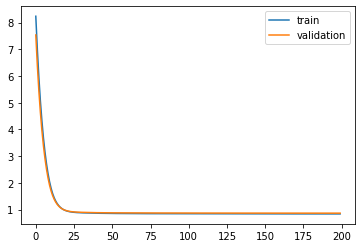

Time to train LSTM:  417.45429396629333
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 57s - loss: 8.1918 - pdc_loss: 0.7466 - event_loss: 0.6598 - val_loss: 7.4990 - val_pdc_loss: 0.7343 - val_event_loss: 0.6426

Epoch 00001: val_loss improved from inf to 7.49903, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 6.9912 - pdc_loss: 0.7248 - event_loss: 0.6278 - val_loss: 6.3925 - val_pdc_loss: 0.7145 - val_event_loss: 0.6128

Epoch 00002: val_loss improved from 7.49903 to 6.39253, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 5.9560 - pdc_loss: 0.7057 - event_loss: 0.5982 - val_loss: 5.4465 - val_pdc_loss: 0.6973 - val_event_loss: 0.5845

Epoch 00003: val_loss improved from 6.39253 to 5.44648, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 5.0750 - pdc_loss: 0.6892 - event_loss: 0.5694 - val_loss: 4.6455 - val_pdc_loss: 0.6823 - val_event_loss: 0.5563

Epoch 00004: val_loss improved from 5.44648 to 4.64549, saving


Epoch 00035: val_loss improved from 0.89639 to 0.89526, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 0.8697 - pdc_loss: 0.5388 - event_loss: 0.3178 - val_loss: 0.8945 - val_pdc_loss: 0.5531 - val_event_loss: 0.3284

Epoch 00036: val_loss improved from 0.89526 to 0.89449, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 0.8685 - pdc_loss: 0.5380 - event_loss: 0.3176 - val_loss: 0.8935 - val_pdc_loss: 0.5525 - val_event_loss: 0.3282

Epoch 00037: val_loss improved from 0.89449 to 0.89349, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 0.8675 - pdc_loss: 0.5372 - event_loss: 0.3175 - val_loss: 0.8928 - val_pdc_loss: 0.5520 - val_event_loss: 0.3281

Epoch 00038: val_loss improved from 0.89349 to 0.89279, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 0.8665 - pdc_loss: 0.5364 - event_loss: 0.3174 - val_loss: 0.8917 - val_pdc_loss: 0.5512 - val_event_loss: 0.3279

Epoch 00039: val_loss improved from 0.89279 to 


Epoch 00070: val_loss improved from 0.88030 to 0.87996, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.8514 - pdc_loss: 0.5259 - event_loss: 0.3155 - val_loss: 0.8799 - val_pdc_loss: 0.5434 - val_event_loss: 0.3266

Epoch 00071: val_loss improved from 0.87996 to 0.87993, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.8512 - pdc_loss: 0.5258 - event_loss: 0.3155 - val_loss: 0.8797 - val_pdc_loss: 0.5432 - val_event_loss: 0.3265

Epoch 00072: val_loss improved from 0.87993 to 0.87966, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.8510 - pdc_loss: 0.5256 - event_loss: 0.3155 - val_loss: 0.8797 - val_pdc_loss: 0.5432 - val_event_loss: 0.3266

Epoch 00073: val_loss did not improve from 0.87966
Epoch 74/200
 - 1s - loss: 0.8508 - pdc_loss: 0.5254 - event_loss: 0.3155 - val_loss: 0.8794 - val_pdc_loss: 0.5430 - val_event_loss: 0.3265

Epoch 00074: val_loss improved from 0.87966 to 0.87937, saving model to Event_val_weights4.h


Epoch 00107: val_loss improved from 0.87567 to 0.87564, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.8454 - pdc_loss: 0.5218 - event_loss: 0.3149 - val_loss: 0.8755 - val_pdc_loss: 0.5406 - val_event_loss: 0.3262

Epoch 00108: val_loss improved from 0.87564 to 0.87553, saving model to Event_val_weights4.hdf5
Epoch 109/200
 - 1s - loss: 0.8453 - pdc_loss: 0.5217 - event_loss: 0.3148 - val_loss: 0.8755 - val_pdc_loss: 0.5405 - val_event_loss: 0.3262

Epoch 00109: val_loss improved from 0.87553 to 0.87547, saving model to Event_val_weights4.hdf5
Epoch 110/200
 - 1s - loss: 0.8452 - pdc_loss: 0.5216 - event_loss: 0.3148 - val_loss: 0.8754 - val_pdc_loss: 0.5405 - val_event_loss: 0.3262

Epoch 00110: val_loss improved from 0.87547 to 0.87538, saving model to Event_val_weights4.hdf5
Epoch 111/200
 - 1s - loss: 0.8451 - pdc_loss: 0.5216 - event_loss: 0.3148 - val_loss: 0.8754 - val_pdc_loss: 0.5405 - val_event_loss: 0.3262

Epoch 00111: val_loss did not improve from 


Epoch 00143: val_loss improved from 0.87310 to 0.87306, saving model to Event_val_weights4.hdf5
Epoch 144/200
 - 1s - loss: 0.8419 - pdc_loss: 0.5195 - event_loss: 0.3144 - val_loss: 0.8729 - val_pdc_loss: 0.5389 - val_event_loss: 0.3259

Epoch 00144: val_loss improved from 0.87306 to 0.87294, saving model to Event_val_weights4.hdf5
Epoch 145/200
 - 1s - loss: 0.8419 - pdc_loss: 0.5195 - event_loss: 0.3143 - val_loss: 0.8729 - val_pdc_loss: 0.5389 - val_event_loss: 0.3259

Epoch 00145: val_loss improved from 0.87294 to 0.87289, saving model to Event_val_weights4.hdf5
Epoch 146/200
 - 1s - loss: 0.8418 - pdc_loss: 0.5194 - event_loss: 0.3144 - val_loss: 0.8728 - val_pdc_loss: 0.5388 - val_event_loss: 0.3259

Epoch 00146: val_loss improved from 0.87289 to 0.87277, saving model to Event_val_weights4.hdf5
Epoch 147/200
 - 1s - loss: 0.8417 - pdc_loss: 0.5193 - event_loss: 0.3143 - val_loss: 0.8727 - val_pdc_loss: 0.5388 - val_event_loss: 0.3259

Epoch 00147: val_loss improved from 0.87277

 - 1s - loss: 0.8394 - pdc_loss: 0.5179 - event_loss: 0.3139 - val_loss: 0.8709 - val_pdc_loss: 0.5374 - val_event_loss: 0.3259

Epoch 00180: val_loss improved from 0.87100 to 0.87088, saving model to Event_val_weights4.hdf5
Epoch 181/200
 - 1s - loss: 0.8393 - pdc_loss: 0.5178 - event_loss: 0.3139 - val_loss: 0.8709 - val_pdc_loss: 0.5374 - val_event_loss: 0.3259

Epoch 00181: val_loss did not improve from 0.87088
Epoch 182/200
 - 1s - loss: 0.8392 - pdc_loss: 0.5178 - event_loss: 0.3139 - val_loss: 0.8710 - val_pdc_loss: 0.5375 - val_event_loss: 0.3260

Epoch 00182: val_loss did not improve from 0.87088
Epoch 183/200
 - 1s - loss: 0.8392 - pdc_loss: 0.5178 - event_loss: 0.3139 - val_loss: 0.8707 - val_pdc_loss: 0.5373 - val_event_loss: 0.3259

Epoch 00183: val_loss improved from 0.87088 to 0.87068, saving model to Event_val_weights4.hdf5
Epoch 184/200
 - 1s - loss: 0.8391 - pdc_loss: 0.5177 - event_loss: 0.3139 - val_loss: 0.8707 - val_pdc_loss: 0.5372 - val_event_loss: 0.3259

Epoch

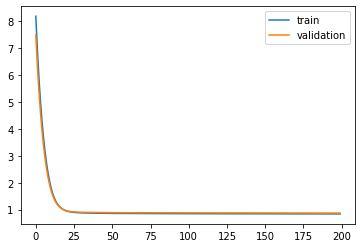

Time to train LSTM:  210.88415455818176
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 92s - loss: 8.1686 - pdc_loss: 0.7109 - event_loss: 0.6953 - val_loss: 7.4796 - val_pdc_loss: 0.7046 - val_event_loss: 0.6750

Epoch 00001: val_loss improved from inf to 7.47960, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 6.9735 - pdc_loss: 0.6981 - event_loss: 0.6584 - val_loss: 6.3777 - val_pdc_loss: 0.6928 - val_event_loss: 0.6407

Epoch 00002: val_loss improved from 7.47960 to 6.37770, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 5.9433 - pdc_loss: 0.6859 - event_loss: 0.6254 - val_loss: 5.4345 - val_pdc_loss: 0.6810 - val_event_loss: 0.6078

Epoch 00003: val_loss improved from 6.37770 to 5.43452, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 5.0656 - pdc_loss: 0.6742 - event_loss: 0.5927 - val_loss: 4.6342 - val_pdc_loss: 0.6696 - val_event_loss: 0.5736

Epoch 00004: val_loss improved from 5.43452 to 4.63423, saving


Epoch 00035: val_loss improved from 0.87479 to 0.87374, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 0.8738 - pdc_loss: 0.5422 - event_loss: 0.3191 - val_loss: 0.8726 - val_pdc_loss: 0.5415 - val_event_loss: 0.3188

Epoch 00036: val_loss improved from 0.87374 to 0.87264, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 0.8729 - pdc_loss: 0.5416 - event_loss: 0.3190 - val_loss: 0.8718 - val_pdc_loss: 0.5408 - val_event_loss: 0.3187

Epoch 00037: val_loss improved from 0.87264 to 0.87175, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 0.8720 - pdc_loss: 0.5409 - event_loss: 0.3189 - val_loss: 0.8708 - val_pdc_loss: 0.5401 - val_event_loss: 0.3186

Epoch 00038: val_loss improved from 0.87175 to 0.87081, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 0.8712 - pdc_loss: 0.5403 - event_loss: 0.3189 - val_loss: 0.8701 - val_pdc_loss: 0.5396 - val_event_loss: 0.3186

Epoch 00039: val_loss improved from 0.87081 to 

 - 1s - loss: 0.8531 - pdc_loss: 0.5250 - event_loss: 0.3171 - val_loss: 0.8540 - val_pdc_loss: 0.5257 - val_event_loss: 0.3173

Epoch 00070: val_loss improved from 0.85436 to 0.85403, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.8528 - pdc_loss: 0.5248 - event_loss: 0.3171 - val_loss: 0.8538 - val_pdc_loss: 0.5255 - val_event_loss: 0.3174

Epoch 00071: val_loss improved from 0.85403 to 0.85385, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8524 - pdc_loss: 0.5245 - event_loss: 0.3170 - val_loss: 0.8536 - val_pdc_loss: 0.5254 - val_event_loss: 0.3173

Epoch 00072: val_loss improved from 0.85385 to 0.85361, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8521 - pdc_loss: 0.5243 - event_loss: 0.3170 - val_loss: 0.8533 - val_pdc_loss: 0.5252 - val_event_loss: 0.3173

Epoch 00073: val_loss improved from 0.85361 to 0.85332, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8518 - pdc_loss: 0.5240 - event_


Epoch 00105: val_loss improved from 0.84841 to 0.84830, saving model to Event_val_weights5.hdf5
Epoch 106/200
 - 1s - loss: 0.8456 - pdc_loss: 0.5196 - event_loss: 0.3165 - val_loss: 0.8482 - val_pdc_loss: 0.5218 - val_event_loss: 0.3169

Epoch 00106: val_loss improved from 0.84830 to 0.84821, saving model to Event_val_weights5.hdf5
Epoch 107/200
 - 1s - loss: 0.8456 - pdc_loss: 0.5196 - event_loss: 0.3165 - val_loss: 0.8480 - val_pdc_loss: 0.5217 - val_event_loss: 0.3167

Epoch 00107: val_loss improved from 0.84821 to 0.84795, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.8454 - pdc_loss: 0.5194 - event_loss: 0.3165 - val_loss: 0.8481 - val_pdc_loss: 0.5217 - val_event_loss: 0.3169

Epoch 00108: val_loss did not improve from 0.84795
Epoch 109/200
 - 1s - loss: 0.8453 - pdc_loss: 0.5194 - event_loss: 0.3165 - val_loss: 0.8478 - val_pdc_loss: 0.5215 - val_event_loss: 0.3168

Epoch 00109: val_loss improved from 0.84795 to 0.84776, saving model to Event_val_weight


Epoch 00143: val_loss improved from 0.84530 to 0.84515, saving model to Event_val_weights5.hdf5
Epoch 144/200
 - 1s - loss: 0.8417 - pdc_loss: 0.5170 - event_loss: 0.3160 - val_loss: 0.8453 - val_pdc_loss: 0.5199 - val_event_loss: 0.3167

Epoch 00144: val_loss did not improve from 0.84515
Epoch 145/200
 - 1s - loss: 0.8417 - pdc_loss: 0.5169 - event_loss: 0.3160 - val_loss: 0.8451 - val_pdc_loss: 0.5197 - val_event_loss: 0.3166

Epoch 00145: val_loss improved from 0.84515 to 0.84511, saving model to Event_val_weights5.hdf5
Epoch 146/200
 - 1s - loss: 0.8416 - pdc_loss: 0.5169 - event_loss: 0.3160 - val_loss: 0.8452 - val_pdc_loss: 0.5198 - val_event_loss: 0.3167

Epoch 00146: val_loss did not improve from 0.84511
Epoch 147/200
 - 1s - loss: 0.8416 - pdc_loss: 0.5169 - event_loss: 0.3160 - val_loss: 0.8452 - val_pdc_loss: 0.5197 - val_event_loss: 0.3167

Epoch 00147: val_loss did not improve from 0.84511
Epoch 148/200
 - 1s - loss: 0.8414 - pdc_loss: 0.5167 - event_loss: 0.3160 - val_l


Epoch 00181: val_loss improved from 0.84335 to 0.84322, saving model to Event_val_weights5.hdf5
Epoch 182/200
 - 1s - loss: 0.8389 - pdc_loss: 0.5150 - event_loss: 0.3156 - val_loss: 0.8433 - val_pdc_loss: 0.5184 - val_event_loss: 0.3166

Epoch 00182: val_loss did not improve from 0.84322
Epoch 183/200
 - 1s - loss: 0.8388 - pdc_loss: 0.5149 - event_loss: 0.3156 - val_loss: 0.8431 - val_pdc_loss: 0.5182 - val_event_loss: 0.3166

Epoch 00183: val_loss improved from 0.84322 to 0.84309, saving model to Event_val_weights5.hdf5
Epoch 184/200
 - 1s - loss: 0.8387 - pdc_loss: 0.5149 - event_loss: 0.3156 - val_loss: 0.8432 - val_pdc_loss: 0.5182 - val_event_loss: 0.3166

Epoch 00184: val_loss did not improve from 0.84309
Epoch 185/200
 - 1s - loss: 0.8388 - pdc_loss: 0.5149 - event_loss: 0.3156 - val_loss: 0.8432 - val_pdc_loss: 0.5183 - val_event_loss: 0.3167

Epoch 00185: val_loss did not improve from 0.84309
Epoch 186/200
 - 1s - loss: 0.8387 - pdc_loss: 0.5148 - event_loss: 0.3156 - val_l

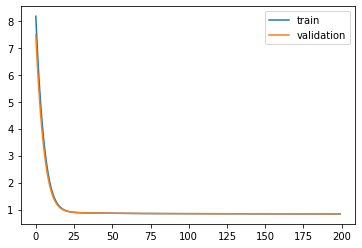

Time to train LSTM:  248.34800958633423
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 99s - loss: 8.1927 - pdc_loss: 0.7462 - event_loss: 0.7253 - val_loss: 7.4997 - val_pdc_loss: 0.7383 - val_event_loss: 0.6867

Epoch 00001: val_loss improved from inf to 7.49974, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 6.9802 - pdc_loss: 0.7274 - event_loss: 0.6507 - val_loss: 6.3813 - val_pdc_loss: 0.7196 - val_event_loss: 0.6206

Epoch 00002: val_loss improved from 7.49974 to 6.38135, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 5.9369 - pdc_loss: 0.7088 - event_loss: 0.5926 - val_loss: 5.4243 - val_pdc_loss: 0.7017 - val_event_loss: 0.5663

Epoch 00003: val_loss improved from 6.38135 to 5.42430, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 5.0477 - pdc_loss: 0.6914 - event_loss: 0.5434 - val_loss: 4.6117 - val_pdc_loss: 0.6849 - val_event_loss: 0.5180

Epoch 00004: val_loss improved from 5.42430 to 4.61172, saving


Epoch 00035: val_loss improved from 0.87050 to 0.86906, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 0.8726 - pdc_loss: 0.5399 - event_loss: 0.3184 - val_loss: 0.8676 - val_pdc_loss: 0.5405 - val_event_loss: 0.3130

Epoch 00036: val_loss improved from 0.86906 to 0.86763, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 0.8714 - pdc_loss: 0.5388 - event_loss: 0.3184 - val_loss: 0.8663 - val_pdc_loss: 0.5393 - val_event_loss: 0.3129

Epoch 00037: val_loss improved from 0.86763 to 0.86632, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 0.8702 - pdc_loss: 0.5376 - event_loss: 0.3184 - val_loss: 0.8651 - val_pdc_loss: 0.5380 - val_event_loss: 0.3129

Epoch 00038: val_loss improved from 0.86632 to 0.86505, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 0.8691 - pdc_loss: 0.5366 - event_loss: 0.3184 - val_loss: 0.8638 - val_pdc_loss: 0.5368 - val_event_loss: 0.3128

Epoch 00039: val_loss improved from 0.86505 to 


Epoch 00070: val_loss improved from 0.84815 to 0.84713, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 0.8523 - pdc_loss: 0.5236 - event_loss: 0.3175 - val_loss: 0.8475 - val_pdc_loss: 0.5239 - val_event_loss: 0.3124

Epoch 00071: val_loss did not improve from 0.84713
Epoch 72/200
 - 1s - loss: 0.8520 - pdc_loss: 0.5234 - event_loss: 0.3175 - val_loss: 0.8466 - val_pdc_loss: 0.5234 - val_event_loss: 0.3121

Epoch 00072: val_loss improved from 0.84713 to 0.84662, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.8518 - pdc_loss: 0.5232 - event_loss: 0.3174 - val_loss: 0.8467 - val_pdc_loss: 0.5236 - val_event_loss: 0.3120

Epoch 00073: val_loss did not improve from 0.84662
Epoch 74/200
 - 1s - loss: 0.8516 - pdc_loss: 0.5231 - event_loss: 0.3174 - val_loss: 0.8461 - val_pdc_loss: 0.5230 - val_event_loss: 0.3120

Epoch 00074: val_loss improved from 0.84662 to 0.84611, saving model to Event_val_weights1.hdf5
Epoch 75/200
 - 1s - loss: 0.8512 - pdc_l


Epoch 00107: val_loss improved from 0.83956 to 0.83922, saving model to Event_val_weights1.hdf5
Epoch 108/200
 - 1s - loss: 0.8442 - pdc_loss: 0.5180 - event_loss: 0.3164 - val_loss: 0.8397 - val_pdc_loss: 0.5187 - val_event_loss: 0.3112

Epoch 00108: val_loss did not improve from 0.83922
Epoch 109/200
 - 1s - loss: 0.8441 - pdc_loss: 0.5179 - event_loss: 0.3163 - val_loss: 0.8390 - val_pdc_loss: 0.5184 - val_event_loss: 0.3108

Epoch 00109: val_loss improved from 0.83922 to 0.83902, saving model to Event_val_weights1.hdf5
Epoch 110/200
 - 1s - loss: 0.8439 - pdc_loss: 0.5178 - event_loss: 0.3163 - val_loss: 0.8394 - val_pdc_loss: 0.5185 - val_event_loss: 0.3111

Epoch 00110: val_loss did not improve from 0.83902
Epoch 111/200
 - 1s - loss: 0.8438 - pdc_loss: 0.5177 - event_loss: 0.3163 - val_loss: 0.8390 - val_pdc_loss: 0.5184 - val_event_loss: 0.3108

Epoch 00111: val_loss improved from 0.83902 to 0.83899, saving model to Event_val_weights1.hdf5
Epoch 112/200
 - 1s - loss: 0.8436 - 


Epoch 00146: val_loss did not improve from 0.83655
Epoch 147/200
 - 1s - loss: 0.8402 - pdc_loss: 0.5156 - event_loss: 0.3156 - val_loss: 0.8367 - val_pdc_loss: 0.5174 - val_event_loss: 0.3104

Epoch 00147: val_loss did not improve from 0.83655
Epoch 148/200
 - 1s - loss: 0.8401 - pdc_loss: 0.5155 - event_loss: 0.3156 - val_loss: 0.8365 - val_pdc_loss: 0.5173 - val_event_loss: 0.3102

Epoch 00148: val_loss improved from 0.83655 to 0.83648, saving model to Event_val_weights1.hdf5
Epoch 149/200
 - 1s - loss: 0.8400 - pdc_loss: 0.5155 - event_loss: 0.3156 - val_loss: 0.8364 - val_pdc_loss: 0.5172 - val_event_loss: 0.3102

Epoch 00149: val_loss improved from 0.83648 to 0.83643, saving model to Event_val_weights1.hdf5
Epoch 150/200
 - 1s - loss: 0.8399 - pdc_loss: 0.5154 - event_loss: 0.3156 - val_loss: 0.8363 - val_pdc_loss: 0.5173 - val_event_loss: 0.3101

Epoch 00150: val_loss improved from 0.83643 to 0.83634, saving model to Event_val_weights1.hdf5
Epoch 151/200
 - 1s - loss: 0.8398 - 

 - 1s - loss: 0.8379 - pdc_loss: 0.5145 - event_loss: 0.3150 - val_loss: 0.8356 - val_pdc_loss: 0.5171 - val_event_loss: 0.3100

Epoch 00185: val_loss did not improve from 0.83505
Epoch 186/200
 - 1s - loss: 0.8379 - pdc_loss: 0.5144 - event_loss: 0.3151 - val_loss: 0.8349 - val_pdc_loss: 0.5168 - val_event_loss: 0.3097

Epoch 00186: val_loss improved from 0.83505 to 0.83492, saving model to Event_val_weights1.hdf5
Epoch 187/200
 - 1s - loss: 0.8378 - pdc_loss: 0.5143 - event_loss: 0.3150 - val_loss: 0.8357 - val_pdc_loss: 0.5173 - val_event_loss: 0.3100

Epoch 00187: val_loss did not improve from 0.83492
Epoch 188/200
 - 1s - loss: 0.8378 - pdc_loss: 0.5144 - event_loss: 0.3150 - val_loss: 0.8351 - val_pdc_loss: 0.5168 - val_event_loss: 0.3099

Epoch 00188: val_loss did not improve from 0.83492
Epoch 189/200
 - 1s - loss: 0.8377 - pdc_loss: 0.5144 - event_loss: 0.3150 - val_loss: 0.8355 - val_pdc_loss: 0.5170 - val_event_loss: 0.3101

Epoch 00189: val_loss did not improve from 0.83492

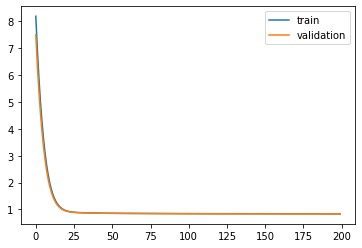

Time to train LSTM:  252.58327674865723
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 59s - loss: 7.9085 - pdc_loss: 0.6960 - event_loss: 0.6983 - val_loss: 7.2410 - val_pdc_loss: 0.6918 - val_event_loss: 0.6754

Epoch 00001: val_loss improved from inf to 7.24104, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 6.7514 - pdc_loss: 0.6843 - event_loss: 0.6597 - val_loss: 6.1755 - val_pdc_loss: 0.6808 - val_event_loss: 0.6396

Epoch 00002: val_loss improved from 7.24104 to 6.17554, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 5.7562 - pdc_loss: 0.6738 - event_loss: 0.6246 - val_loss: 5.2657 - val_pdc_loss: 0.6707 - val_event_loss: 0.6053

Epoch 00003: val_loss improved from 6.17554 to 5.26572, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 4.9094 - pdc_loss: 0.6641 - event_loss: 0.5896 - val_loss: 4.4943 - val_pdc_loss: 0.6615 - val_event_loss: 0.5692

Epoch 00004: val_loss improved from 5.26572 to 4.49426, saving


Epoch 00035: val_loss improved from 0.88505 to 0.88429, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 0.8702 - pdc_loss: 0.5383 - event_loss: 0.3186 - val_loss: 0.8831 - val_pdc_loss: 0.5446 - val_event_loss: 0.3253

Epoch 00036: val_loss improved from 0.88429 to 0.88313, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 0.8693 - pdc_loss: 0.5376 - event_loss: 0.3186 - val_loss: 0.8825 - val_pdc_loss: 0.5442 - val_event_loss: 0.3252

Epoch 00037: val_loss improved from 0.88313 to 0.88249, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 0.8684 - pdc_loss: 0.5369 - event_loss: 0.3185 - val_loss: 0.8817 - val_pdc_loss: 0.5435 - val_event_loss: 0.3252

Epoch 00038: val_loss improved from 0.88249 to 0.88165, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 0.8676 - pdc_loss: 0.5362 - event_loss: 0.3185 - val_loss: 0.8809 - val_pdc_loss: 0.5429 - val_event_loss: 0.3251

Epoch 00039: val_loss improved from 0.88165 to 

 - 1s - loss: 0.8526 - pdc_loss: 0.5243 - event_loss: 0.3172 - val_loss: 0.8665 - val_pdc_loss: 0.5320 - val_event_loss: 0.3234

Epoch 00070: val_loss improved from 0.86664 to 0.86654, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.8523 - pdc_loss: 0.5241 - event_loss: 0.3172 - val_loss: 0.8663 - val_pdc_loss: 0.5318 - val_event_loss: 0.3234

Epoch 00071: val_loss improved from 0.86654 to 0.86627, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.8521 - pdc_loss: 0.5239 - event_loss: 0.3172 - val_loss: 0.8663 - val_pdc_loss: 0.5320 - val_event_loss: 0.3233

Epoch 00072: val_loss did not improve from 0.86627
Epoch 73/200
 - 1s - loss: 0.8518 - pdc_loss: 0.5238 - event_loss: 0.3171 - val_loss: 0.8659 - val_pdc_loss: 0.5317 - val_event_loss: 0.3233

Epoch 00073: val_loss improved from 0.86627 to 0.86590, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.8516 - pdc_loss: 0.5236 - event_loss: 0.3171 - val_loss: 0.8659 - val_pdc_los

 - 1s - loss: 0.8457 - pdc_loss: 0.5195 - event_loss: 0.3164 - val_loss: 0.8598 - val_pdc_loss: 0.5280 - val_event_loss: 0.3221

Epoch 00106: val_loss improved from 0.86017 to 0.85978, saving model to Event_val_weights2.hdf5
Epoch 107/200
 - 1s - loss: 0.8456 - pdc_loss: 0.5194 - event_loss: 0.3164 - val_loss: 0.8600 - val_pdc_loss: 0.5282 - val_event_loss: 0.3220

Epoch 00107: val_loss did not improve from 0.85978
Epoch 108/200
 - 1s - loss: 0.8454 - pdc_loss: 0.5193 - event_loss: 0.3163 - val_loss: 0.8596 - val_pdc_loss: 0.5279 - val_event_loss: 0.3220

Epoch 00108: val_loss improved from 0.85978 to 0.85959, saving model to Event_val_weights2.hdf5
Epoch 109/200
 - 1s - loss: 0.8452 - pdc_loss: 0.5192 - event_loss: 0.3163 - val_loss: 0.8595 - val_pdc_loss: 0.5278 - val_event_loss: 0.3220

Epoch 00109: val_loss improved from 0.85959 to 0.85945, saving model to Event_val_weights2.hdf5
Epoch 110/200
 - 1s - loss: 0.8451 - pdc_loss: 0.5191 - event_loss: 0.3163 - val_loss: 0.8594 - val_pdc


Epoch 00142: val_loss did not improve from 0.85607
Epoch 143/200
 - 1s - loss: 0.8412 - pdc_loss: 0.5166 - event_loss: 0.3155 - val_loss: 0.8561 - val_pdc_loss: 0.5259 - val_event_loss: 0.3212

Epoch 00143: val_loss did not improve from 0.85607
Epoch 144/200
 - 1s - loss: 0.8410 - pdc_loss: 0.5165 - event_loss: 0.3155 - val_loss: 0.8560 - val_pdc_loss: 0.5258 - val_event_loss: 0.3211

Epoch 00144: val_loss improved from 0.85607 to 0.85601, saving model to Event_val_weights2.hdf5
Epoch 145/200
 - 1s - loss: 0.8410 - pdc_loss: 0.5165 - event_loss: 0.3155 - val_loss: 0.8558 - val_pdc_loss: 0.5257 - val_event_loss: 0.3210

Epoch 00145: val_loss improved from 0.85601 to 0.85577, saving model to Event_val_weights2.hdf5
Epoch 146/200
 - 1s - loss: 0.8408 - pdc_loss: 0.5164 - event_loss: 0.3154 - val_loss: 0.8558 - val_pdc_loss: 0.5257 - val_event_loss: 0.3210

Epoch 00146: val_loss improved from 0.85577 to 0.85577, saving model to Event_val_weights2.hdf5
Epoch 147/200
 - 1s - loss: 0.8408 - 


Epoch 00181: val_loss improved from 0.85420 to 0.85390, saving model to Event_val_weights2.hdf5
Epoch 182/200
 - 1s - loss: 0.8382 - pdc_loss: 0.5150 - event_loss: 0.3146 - val_loss: 0.8546 - val_pdc_loss: 0.5253 - val_event_loss: 0.3206

Epoch 00182: val_loss did not improve from 0.85390
Epoch 183/200
 - 1s - loss: 0.8382 - pdc_loss: 0.5150 - event_loss: 0.3146 - val_loss: 0.8542 - val_pdc_loss: 0.5250 - val_event_loss: 0.3205

Epoch 00183: val_loss did not improve from 0.85390
Epoch 184/200
 - 1s - loss: 0.8381 - pdc_loss: 0.5149 - event_loss: 0.3146 - val_loss: 0.8541 - val_pdc_loss: 0.5250 - val_event_loss: 0.3205

Epoch 00184: val_loss did not improve from 0.85390
Epoch 185/200
 - 1s - loss: 0.8381 - pdc_loss: 0.5149 - event_loss: 0.3145 - val_loss: 0.8544 - val_pdc_loss: 0.5252 - val_event_loss: 0.3206

Epoch 00185: val_loss did not improve from 0.85390
Epoch 186/200
 - 1s - loss: 0.8380 - pdc_loss: 0.5149 - event_loss: 0.3145 - val_loss: 0.8541 - val_pdc_loss: 0.5250 - val_even

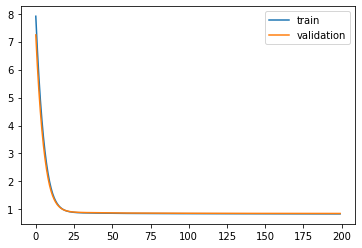

Time to train LSTM:  211.4425024986267
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 45s - loss: 8.0341 - pdc_loss: 0.7247 - event_loss: 0.7398 - val_loss: 7.3370 - val_pdc_loss: 0.7074 - val_event_loss: 0.6921

Epoch 00001: val_loss improved from inf to 7.33703, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 6.8285 - pdc_loss: 0.6911 - event_loss: 0.6628 - val_loss: 6.2319 - val_pdc_loss: 0.6800 - val_event_loss: 0.6271

Epoch 00002: val_loss improved from 7.33703 to 6.23191, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 5.7972 - pdc_loss: 0.6672 - event_loss: 0.6028 - val_loss: 5.2927 - val_pdc_loss: 0.6610 - val_event_loss: 0.5746

Epoch 00003: val_loss improved from 6.23191 to 5.29274, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 4.9234 - pdc_loss: 0.6499 - event_loss: 0.5531 - val_loss: 4.5004 - val_pdc_loss: 0.6467 - val_event_loss: 0.5298

Epoch 00004: val_loss improved from 5.29274 to 4.50044, saving 


Epoch 00035: val_loss improved from 0.88611 to 0.88522, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 0.8644 - pdc_loss: 0.5322 - event_loss: 0.3184 - val_loss: 0.8846 - val_pdc_loss: 0.5468 - val_event_loss: 0.3241

Epoch 00036: val_loss improved from 0.88522 to 0.88464, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 0.8634 - pdc_loss: 0.5314 - event_loss: 0.3183 - val_loss: 0.8839 - val_pdc_loss: 0.5463 - val_event_loss: 0.3241

Epoch 00037: val_loss improved from 0.88464 to 0.88393, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 0.8625 - pdc_loss: 0.5307 - event_loss: 0.3183 - val_loss: 0.8832 - val_pdc_loss: 0.5457 - val_event_loss: 0.3240

Epoch 00038: val_loss improved from 0.88393 to 0.88316, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 0.8617 - pdc_loss: 0.5301 - event_loss: 0.3183 - val_loss: 0.8825 - val_pdc_loss: 0.5452 - val_event_loss: 0.3241

Epoch 00039: val_loss improved from 0.88316 to 


Epoch 00070: val_loss improved from 0.87316 to 0.87295, saving model to Event_val_weights3.hdf5
Epoch 71/200
 - 1s - loss: 0.8487 - pdc_loss: 0.5216 - event_loss: 0.3166 - val_loss: 0.8727 - val_pdc_loss: 0.5394 - val_event_loss: 0.3229

Epoch 00071: val_loss improved from 0.87295 to 0.87268, saving model to Event_val_weights3.hdf5
Epoch 72/200
 - 1s - loss: 0.8484 - pdc_loss: 0.5214 - event_loss: 0.3166 - val_loss: 0.8723 - val_pdc_loss: 0.5390 - val_event_loss: 0.3229

Epoch 00072: val_loss improved from 0.87268 to 0.87233, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.8482 - pdc_loss: 0.5213 - event_loss: 0.3165 - val_loss: 0.8724 - val_pdc_loss: 0.5391 - val_event_loss: 0.3230

Epoch 00073: val_loss did not improve from 0.87233
Epoch 74/200
 - 1s - loss: 0.8478 - pdc_loss: 0.5210 - event_loss: 0.3165 - val_loss: 0.8718 - val_pdc_loss: 0.5386 - val_event_loss: 0.3230

Epoch 00074: val_loss improved from 0.87233 to 0.87185, saving model to Event_val_weights3.h


Epoch 00107: val_loss improved from 0.86762 to 0.86745, saving model to Event_val_weights3.hdf5
Epoch 108/200
 - 1s - loss: 0.8408 - pdc_loss: 0.5157 - event_loss: 0.3156 - val_loss: 0.8673 - val_pdc_loss: 0.5349 - val_event_loss: 0.3229

Epoch 00108: val_loss improved from 0.86745 to 0.86725, saving model to Event_val_weights3.hdf5
Epoch 109/200
 - 1s - loss: 0.8407 - pdc_loss: 0.5157 - event_loss: 0.3155 - val_loss: 0.8676 - val_pdc_loss: 0.5352 - val_event_loss: 0.3229

Epoch 00109: val_loss did not improve from 0.86725
Epoch 110/200
 - 1s - loss: 0.8405 - pdc_loss: 0.5155 - event_loss: 0.3155 - val_loss: 0.8672 - val_pdc_loss: 0.5348 - val_event_loss: 0.3229

Epoch 00110: val_loss improved from 0.86725 to 0.86715, saving model to Event_val_weights3.hdf5
Epoch 111/200
 - 1s - loss: 0.8404 - pdc_loss: 0.5155 - event_loss: 0.3155 - val_loss: 0.8673 - val_pdc_loss: 0.5349 - val_event_loss: 0.3229

Epoch 00111: val_loss did not improve from 0.86715
Epoch 112/200
 - 1s - loss: 0.8402 - 

 - 1s - loss: 0.8367 - pdc_loss: 0.5133 - event_loss: 0.3147 - val_loss: 0.8650 - val_pdc_loss: 0.5334 - val_event_loss: 0.3228

Epoch 00145: val_loss did not improve from 0.86472
Epoch 146/200
 - 1s - loss: 0.8366 - pdc_loss: 0.5131 - event_loss: 0.3147 - val_loss: 0.8647 - val_pdc_loss: 0.5331 - val_event_loss: 0.3228

Epoch 00146: val_loss did not improve from 0.86472
Epoch 147/200
 - 1s - loss: 0.8366 - pdc_loss: 0.5132 - event_loss: 0.3147 - val_loss: 0.8649 - val_pdc_loss: 0.5333 - val_event_loss: 0.3228

Epoch 00147: val_loss did not improve from 0.86472
Epoch 148/200
 - 1s - loss: 0.8365 - pdc_loss: 0.5131 - event_loss: 0.3147 - val_loss: 0.8646 - val_pdc_loss: 0.5331 - val_event_loss: 0.3228

Epoch 00148: val_loss improved from 0.86472 to 0.86459, saving model to Event_val_weights3.hdf5
Epoch 149/200
 - 1s - loss: 0.8365 - pdc_loss: 0.5131 - event_loss: 0.3146 - val_loss: 0.8647 - val_pdc_loss: 0.5332 - val_event_loss: 0.3227

Epoch 00149: val_loss did not improve from 0.86459


Epoch 00184: val_loss improved from 0.86354 to 0.86341, saving model to Event_val_weights3.hdf5
Epoch 185/200
 - 1s - loss: 0.8347 - pdc_loss: 0.5122 - event_loss: 0.3143 - val_loss: 0.8635 - val_pdc_loss: 0.5327 - val_event_loss: 0.3225

Epoch 00185: val_loss did not improve from 0.86341
Epoch 186/200
 - 1s - loss: 0.8347 - pdc_loss: 0.5122 - event_loss: 0.3142 - val_loss: 0.8633 - val_pdc_loss: 0.5326 - val_event_loss: 0.3225

Epoch 00186: val_loss improved from 0.86341 to 0.86329, saving model to Event_val_weights3.hdf5
Epoch 187/200
 - 1s - loss: 0.8346 - pdc_loss: 0.5122 - event_loss: 0.3143 - val_loss: 0.8633 - val_pdc_loss: 0.5325 - val_event_loss: 0.3226

Epoch 00187: val_loss did not improve from 0.86329
Epoch 188/200
 - 1s - loss: 0.8346 - pdc_loss: 0.5122 - event_loss: 0.3142 - val_loss: 0.8635 - val_pdc_loss: 0.5327 - val_event_loss: 0.3226

Epoch 00188: val_loss did not improve from 0.86329
Epoch 189/200
 - 1s - loss: 0.8346 - pdc_loss: 0.5122 - event_loss: 0.3142 - val_l

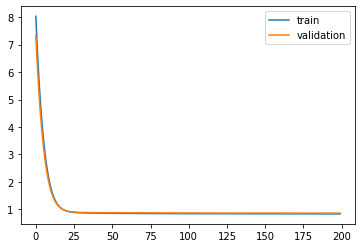

Time to train LSTM:  198.2742190361023
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 44s - loss: 8.0818 - pdc_loss: 0.7561 - event_loss: 0.7330 - val_loss: 7.3924 - val_pdc_loss: 0.7458 - val_event_loss: 0.6929

Epoch 00001: val_loss improved from inf to 7.39240, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 6.8935 - pdc_loss: 0.7405 - event_loss: 0.6655 - val_loss: 6.2980 - val_pdc_loss: 0.7292 - val_event_loss: 0.6342

Epoch 00002: val_loss improved from 7.39240 to 6.29798, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 5.8697 - pdc_loss: 0.7223 - event_loss: 0.6118 - val_loss: 5.3628 - val_pdc_loss: 0.7113 - val_event_loss: 0.5867

Epoch 00003: val_loss improved from 6.29798 to 5.36279, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 4.9975 - pdc_loss: 0.7031 - event_loss: 0.5665 - val_loss: 4.5703 - val_pdc_loss: 0.6937 - val_event_loss: 0.5447

Epoch 00004: val_loss improved from 5.36279 to 4.57031, saving 


Epoch 00035: val_loss improved from 0.89942 to 0.89824, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 0.8730 - pdc_loss: 0.5407 - event_loss: 0.3169 - val_loss: 0.8969 - val_pdc_loss: 0.5534 - val_event_loss: 0.3282

Epoch 00036: val_loss improved from 0.89824 to 0.89693, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 0.8715 - pdc_loss: 0.5394 - event_loss: 0.3168 - val_loss: 0.8956 - val_pdc_loss: 0.5522 - val_event_loss: 0.3281

Epoch 00037: val_loss improved from 0.89693 to 0.89559, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 0.8701 - pdc_loss: 0.5381 - event_loss: 0.3168 - val_loss: 0.8942 - val_pdc_loss: 0.5509 - val_event_loss: 0.3280

Epoch 00038: val_loss improved from 0.89559 to 0.89415, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 0.8687 - pdc_loss: 0.5369 - event_loss: 0.3167 - val_loss: 0.8930 - val_pdc_loss: 0.5499 - val_event_loss: 0.3280

Epoch 00039: val_loss improved from 0.89415 to 

 - 1s - loss: 0.8489 - pdc_loss: 0.5219 - event_loss: 0.3148 - val_loss: 0.8772 - val_pdc_loss: 0.5400 - val_event_loss: 0.3252

Epoch 00070: val_loss improved from 0.87749 to 0.87725, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.8485 - pdc_loss: 0.5217 - event_loss: 0.3148 - val_loss: 0.8770 - val_pdc_loss: 0.5398 - val_event_loss: 0.3252

Epoch 00071: val_loss improved from 0.87725 to 0.87700, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.8482 - pdc_loss: 0.5215 - event_loss: 0.3148 - val_loss: 0.8767 - val_pdc_loss: 0.5396 - val_event_loss: 0.3252

Epoch 00072: val_loss improved from 0.87700 to 0.87673, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.8479 - pdc_loss: 0.5212 - event_loss: 0.3147 - val_loss: 0.8765 - val_pdc_loss: 0.5394 - val_event_loss: 0.3251

Epoch 00073: val_loss improved from 0.87673 to 0.87647, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.8476 - pdc_loss: 0.5210 - event_


Epoch 00104: val_loss improved from 0.87102 to 0.87088, saving model to Event_val_weights4.hdf5
Epoch 105/200
 - 1s - loss: 0.8411 - pdc_loss: 0.5163 - event_loss: 0.3140 - val_loss: 0.8707 - val_pdc_loss: 0.5350 - val_event_loss: 0.3249

Epoch 00105: val_loss improved from 0.87088 to 0.87074, saving model to Event_val_weights4.hdf5
Epoch 106/200
 - 1s - loss: 0.8409 - pdc_loss: 0.5162 - event_loss: 0.3139 - val_loss: 0.8707 - val_pdc_loss: 0.5350 - val_event_loss: 0.3249

Epoch 00106: val_loss improved from 0.87074 to 0.87066, saving model to Event_val_weights4.hdf5
Epoch 107/200
 - 1s - loss: 0.8408 - pdc_loss: 0.5161 - event_loss: 0.3140 - val_loss: 0.8706 - val_pdc_loss: 0.5349 - val_event_loss: 0.3249

Epoch 00107: val_loss improved from 0.87066 to 0.87056, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.8406 - pdc_loss: 0.5160 - event_loss: 0.3139 - val_loss: 0.8704 - val_pdc_loss: 0.5348 - val_event_loss: 0.3249

Epoch 00108: val_loss improved from 0.87056

 - 1s - loss: 0.8372 - pdc_loss: 0.5139 - event_loss: 0.3134 - val_loss: 0.8681 - val_pdc_loss: 0.5330 - val_event_loss: 0.3252

Epoch 00140: val_loss improved from 0.86810 to 0.86809, saving model to Event_val_weights4.hdf5
Epoch 141/200
 - 1s - loss: 0.8370 - pdc_loss: 0.5138 - event_loss: 0.3134 - val_loss: 0.8680 - val_pdc_loss: 0.5329 - val_event_loss: 0.3252

Epoch 00141: val_loss improved from 0.86809 to 0.86801, saving model to Event_val_weights4.hdf5
Epoch 142/200
 - 1s - loss: 0.8370 - pdc_loss: 0.5138 - event_loss: 0.3134 - val_loss: 0.8680 - val_pdc_loss: 0.5329 - val_event_loss: 0.3252

Epoch 00142: val_loss improved from 0.86801 to 0.86799, saving model to Event_val_weights4.hdf5
Epoch 143/200
 - 1s - loss: 0.8368 - pdc_loss: 0.5137 - event_loss: 0.3133 - val_loss: 0.8679 - val_pdc_loss: 0.5328 - val_event_loss: 0.3252

Epoch 00143: val_loss improved from 0.86799 to 0.86785, saving model to Event_val_weights4.hdf5
Epoch 144/200
 - 1s - loss: 0.8368 - pdc_loss: 0.5137 - ev


Epoch 00176: val_loss improved from 0.86651 to 0.86649, saving model to Event_val_weights4.hdf5
Epoch 177/200
 - 1s - loss: 0.8346 - pdc_loss: 0.5125 - event_loss: 0.3130 - val_loss: 0.8666 - val_pdc_loss: 0.5319 - val_event_loss: 0.3255

Epoch 00177: val_loss did not improve from 0.86649
Epoch 178/200
 - 1s - loss: 0.8345 - pdc_loss: 0.5124 - event_loss: 0.3129 - val_loss: 0.8665 - val_pdc_loss: 0.5319 - val_event_loss: 0.3255

Epoch 00178: val_loss improved from 0.86649 to 0.86648, saving model to Event_val_weights4.hdf5
Epoch 179/200
 - 1s - loss: 0.8344 - pdc_loss: 0.5124 - event_loss: 0.3129 - val_loss: 0.8665 - val_pdc_loss: 0.5319 - val_event_loss: 0.3255

Epoch 00179: val_loss improved from 0.86648 to 0.86648, saving model to Event_val_weights4.hdf5
Epoch 180/200
 - 1s - loss: 0.8344 - pdc_loss: 0.5124 - event_loss: 0.3130 - val_loss: 0.8665 - val_pdc_loss: 0.5319 - val_event_loss: 0.3255

Epoch 00180: val_loss did not improve from 0.86648
Epoch 181/200
 - 1s - loss: 0.8343 - 

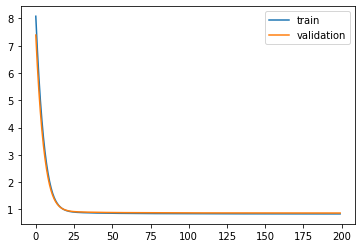

Time to train LSTM:  201.19342017173767
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 47s - loss: 8.1224 - pdc_loss: 0.7214 - event_loss: 0.7196 - val_loss: 7.4214 - val_pdc_loss: 0.7147 - val_event_loss: 0.6678

Epoch 00001: val_loss improved from inf to 7.42135, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 6.9201 - pdc_loss: 0.7076 - event_loss: 0.6446 - val_loss: 6.3174 - val_pdc_loss: 0.7016 - val_event_loss: 0.6079

Epoch 00002: val_loss improved from 7.42135 to 6.31738, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 5.8885 - pdc_loss: 0.6951 - event_loss: 0.5910 - val_loss: 5.3752 - val_pdc_loss: 0.6896 - val_event_loss: 0.5624

Epoch 00003: val_loss improved from 6.31738 to 5.37515, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 5.0121 - pdc_loss: 0.6837 - event_loss: 0.5486 - val_loss: 4.5780 - val_pdc_loss: 0.6785 - val_event_loss: 0.5237

Epoch 00004: val_loss improved from 5.37515 to 4.57797, saving


Epoch 00035: val_loss improved from 0.87697 to 0.87533, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 0.8733 - pdc_loss: 0.5414 - event_loss: 0.3175 - val_loss: 0.8737 - val_pdc_loss: 0.5412 - val_event_loss: 0.3183

Epoch 00036: val_loss improved from 0.87533 to 0.87370, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 0.8717 - pdc_loss: 0.5400 - event_loss: 0.3175 - val_loss: 0.8720 - val_pdc_loss: 0.5397 - val_event_loss: 0.3182

Epoch 00037: val_loss improved from 0.87370 to 0.87203, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 0.8702 - pdc_loss: 0.5386 - event_loss: 0.3175 - val_loss: 0.8703 - val_pdc_loss: 0.5381 - val_event_loss: 0.3182

Epoch 00038: val_loss improved from 0.87203 to 0.87033, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 0.8687 - pdc_loss: 0.5372 - event_loss: 0.3175 - val_loss: 0.8686 - val_pdc_loss: 0.5365 - val_event_loss: 0.3182

Epoch 00039: val_loss improved from 0.87033 to 

 - 1s - loss: 0.8495 - pdc_loss: 0.5231 - event_loss: 0.3162 - val_loss: 0.8514 - val_pdc_loss: 0.5245 - val_event_loss: 0.3166

Epoch 00070: val_loss improved from 0.85155 to 0.85136, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.8493 - pdc_loss: 0.5230 - event_loss: 0.3162 - val_loss: 0.8511 - val_pdc_loss: 0.5243 - val_event_loss: 0.3166

Epoch 00071: val_loss improved from 0.85136 to 0.85112, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8490 - pdc_loss: 0.5227 - event_loss: 0.3161 - val_loss: 0.8510 - val_pdc_loss: 0.5243 - val_event_loss: 0.3166

Epoch 00072: val_loss improved from 0.85112 to 0.85103, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8487 - pdc_loss: 0.5225 - event_loss: 0.3161 - val_loss: 0.8506 - val_pdc_loss: 0.5239 - val_event_loss: 0.3166

Epoch 00073: val_loss improved from 0.85103 to 0.85064, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8484 - pdc_loss: 0.5223 - event_


Epoch 00105: val_loss improved from 0.84630 to 0.84602, saving model to Event_val_weights5.hdf5
Epoch 106/200
 - 1s - loss: 0.8426 - pdc_loss: 0.5177 - event_loss: 0.3152 - val_loss: 0.8460 - val_pdc_loss: 0.5205 - val_event_loss: 0.3159

Epoch 00106: val_loss did not improve from 0.84602
Epoch 107/200
 - 1s - loss: 0.8425 - pdc_loss: 0.5177 - event_loss: 0.3153 - val_loss: 0.8459 - val_pdc_loss: 0.5203 - val_event_loss: 0.3159

Epoch 00107: val_loss improved from 0.84602 to 0.84588, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.8424 - pdc_loss: 0.5176 - event_loss: 0.3152 - val_loss: 0.8459 - val_pdc_loss: 0.5205 - val_event_loss: 0.3158

Epoch 00108: val_loss did not improve from 0.84588
Epoch 109/200
 - 1s - loss: 0.8422 - pdc_loss: 0.5175 - event_loss: 0.3152 - val_loss: 0.8457 - val_pdc_loss: 0.5202 - val_event_loss: 0.3159

Epoch 00109: val_loss improved from 0.84588 to 0.84566, saving model to Event_val_weights5.hdf5
Epoch 110/200
 - 1s - loss: 0.8421 - 


Epoch 00142: val_loss improved from 0.84318 to 0.84316, saving model to Event_val_weights5.hdf5
Epoch 143/200
 - 1s - loss: 0.8394 - pdc_loss: 0.5157 - event_loss: 0.3146 - val_loss: 0.8433 - val_pdc_loss: 0.5186 - val_event_loss: 0.3155

Epoch 00143: val_loss did not improve from 0.84316
Epoch 144/200
 - 1s - loss: 0.8393 - pdc_loss: 0.5156 - event_loss: 0.3146 - val_loss: 0.8435 - val_pdc_loss: 0.5191 - val_event_loss: 0.3154

Epoch 00144: val_loss did not improve from 0.84316
Epoch 145/200
 - 1s - loss: 0.8392 - pdc_loss: 0.5155 - event_loss: 0.3146 - val_loss: 0.8433 - val_pdc_loss: 0.5188 - val_event_loss: 0.3154

Epoch 00145: val_loss did not improve from 0.84316
Epoch 146/200
 - 1s - loss: 0.8391 - pdc_loss: 0.5155 - event_loss: 0.3146 - val_loss: 0.8431 - val_pdc_loss: 0.5187 - val_event_loss: 0.3154

Epoch 00146: val_loss improved from 0.84316 to 0.84314, saving model to Event_val_weights5.hdf5
Epoch 147/200
 - 1s - loss: 0.8391 - pdc_loss: 0.5155 - event_loss: 0.3145 - val_l


Epoch 00183: val_loss did not improve from 0.84256
Epoch 184/200
 - 1s - loss: 0.8373 - pdc_loss: 0.5146 - event_loss: 0.3141 - val_loss: 0.8432 - val_pdc_loss: 0.5194 - val_event_loss: 0.3152

Epoch 00184: val_loss did not improve from 0.84256
Epoch 185/200
 - 1s - loss: 0.8372 - pdc_loss: 0.5145 - event_loss: 0.3141 - val_loss: 0.8430 - val_pdc_loss: 0.5193 - val_event_loss: 0.3151

Epoch 00185: val_loss did not improve from 0.84256
Epoch 186/200
 - 1s - loss: 0.8371 - pdc_loss: 0.5145 - event_loss: 0.3141 - val_loss: 0.8429 - val_pdc_loss: 0.5192 - val_event_loss: 0.3151

Epoch 00186: val_loss did not improve from 0.84256
Epoch 187/200
 - 1s - loss: 0.8371 - pdc_loss: 0.5145 - event_loss: 0.3141 - val_loss: 0.8428 - val_pdc_loss: 0.5191 - val_event_loss: 0.3151

Epoch 00187: val_loss did not improve from 0.84256
Epoch 188/200
 - 1s - loss: 0.8370 - pdc_loss: 0.5144 - event_loss: 0.3141 - val_loss: 0.8430 - val_pdc_loss: 0.5193 - val_event_loss: 0.3151

Epoch 00188: val_loss did not

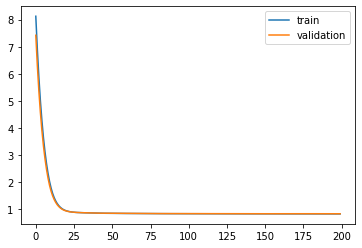

Time to train LSTM:  206.88274955749512
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 42s - loss: 9.1701 - pdc_loss: 0.7171 - event_loss: 0.7261 - val_loss: 8.3830 - val_pdc_loss: 0.7135 - val_event_loss: 0.6904

Epoch 00001: val_loss improved from inf to 8.38300, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 7.8086 - pdc_loss: 0.7032 - event_loss: 0.6725 - val_loss: 7.1244 - val_pdc_loss: 0.6996 - val_event_loss: 0.6400

Epoch 00002: val_loss improved from 8.38300 to 7.12444, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 6.6327 - pdc_loss: 0.6907 - event_loss: 0.6251 - val_loss: 6.0464 - val_pdc_loss: 0.6872 - val_event_loss: 0.5948

Epoch 00003: val_loss improved from 7.12444 to 6.04637, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 5.6304 - pdc_loss: 0.6796 - event_loss: 0.5820 - val_loss: 5.1324 - val_pdc_loss: 0.6762 - val_event_loss: 0.5531

Epoch 00004: val_loss improved from 6.04637 to 5.13244, saving


Epoch 00035: val_loss improved from 0.87678 to 0.87545, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 0.8789 - pdc_loss: 0.5464 - event_loss: 0.3194 - val_loss: 0.8742 - val_pdc_loss: 0.5469 - val_event_loss: 0.3142

Epoch 00036: val_loss improved from 0.87545 to 0.87424, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 0.8777 - pdc_loss: 0.5455 - event_loss: 0.3193 - val_loss: 0.8731 - val_pdc_loss: 0.5460 - val_event_loss: 0.3141

Epoch 00037: val_loss improved from 0.87424 to 0.87310, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 0.8766 - pdc_loss: 0.5446 - event_loss: 0.3192 - val_loss: 0.8720 - val_pdc_loss: 0.5451 - val_event_loss: 0.3141

Epoch 00038: val_loss improved from 0.87310 to 0.87201, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 0.8756 - pdc_loss: 0.5437 - event_loss: 0.3191 - val_loss: 0.8710 - val_pdc_loss: 0.5443 - val_event_loss: 0.3140

Epoch 00039: val_loss improved from 0.87201 to 

 - 1s - loss: 0.8526 - pdc_loss: 0.5235 - event_loss: 0.3180 - val_loss: 0.8472 - val_pdc_loss: 0.5230 - val_event_loss: 0.3132

Epoch 00070: val_loss improved from 0.84762 to 0.84721, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 0.8522 - pdc_loss: 0.5232 - event_loss: 0.3179 - val_loss: 0.8468 - val_pdc_loss: 0.5228 - val_event_loss: 0.3130

Epoch 00071: val_loss improved from 0.84721 to 0.84683, saving model to Event_val_weights1.hdf5
Epoch 72/200
 - 1s - loss: 0.8518 - pdc_loss: 0.5229 - event_loss: 0.3179 - val_loss: 0.8463 - val_pdc_loss: 0.5223 - val_event_loss: 0.3130

Epoch 00072: val_loss improved from 0.84683 to 0.84630, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.8515 - pdc_loss: 0.5226 - event_loss: 0.3179 - val_loss: 0.8462 - val_pdc_loss: 0.5222 - val_event_loss: 0.3131

Epoch 00073: val_loss improved from 0.84630 to 0.84620, saving model to Event_val_weights1.hdf5
Epoch 74/200
 - 1s - loss: 0.8511 - pdc_loss: 0.5224 - event_


Epoch 00106: val_loss improved from 0.84035 to 0.84023, saving model to Event_val_weights1.hdf5
Epoch 107/200
 - 1s - loss: 0.8446 - pdc_loss: 0.5177 - event_loss: 0.3172 - val_loss: 0.8401 - val_pdc_loss: 0.5185 - val_event_loss: 0.3120

Epoch 00107: val_loss improved from 0.84023 to 0.84013, saving model to Event_val_weights1.hdf5
Epoch 108/200
 - 1s - loss: 0.8445 - pdc_loss: 0.5176 - event_loss: 0.3172 - val_loss: 0.8397 - val_pdc_loss: 0.5183 - val_event_loss: 0.3118

Epoch 00108: val_loss improved from 0.84013 to 0.83971, saving model to Event_val_weights1.hdf5
Epoch 109/200
 - 1s - loss: 0.8443 - pdc_loss: 0.5175 - event_loss: 0.3172 - val_loss: 0.8398 - val_pdc_loss: 0.5183 - val_event_loss: 0.3119

Epoch 00109: val_loss did not improve from 0.83971
Epoch 110/200
 - 1s - loss: 0.8442 - pdc_loss: 0.5175 - event_loss: 0.3172 - val_loss: 0.8397 - val_pdc_loss: 0.5184 - val_event_loss: 0.3117

Epoch 00110: val_loss did not improve from 0.83971
Epoch 111/200
 - 1s - loss: 0.8441 - 

 - 1s - loss: 0.8411 - pdc_loss: 0.5158 - event_loss: 0.3165 - val_loss: 0.8372 - val_pdc_loss: 0.5177 - val_event_loss: 0.3107

Epoch 00144: val_loss did not improve from 0.83690
Epoch 145/200
 - 1s - loss: 0.8411 - pdc_loss: 0.5158 - event_loss: 0.3165 - val_loss: 0.8371 - val_pdc_loss: 0.5176 - val_event_loss: 0.3108

Epoch 00145: val_loss did not improve from 0.83690
Epoch 146/200
 - 1s - loss: 0.8410 - pdc_loss: 0.5158 - event_loss: 0.3165 - val_loss: 0.8370 - val_pdc_loss: 0.5177 - val_event_loss: 0.3107

Epoch 00146: val_loss did not improve from 0.83690
Epoch 147/200
 - 1s - loss: 0.8410 - pdc_loss: 0.5157 - event_loss: 0.3165 - val_loss: 0.8369 - val_pdc_loss: 0.5174 - val_event_loss: 0.3108

Epoch 00147: val_loss did not improve from 0.83690
Epoch 148/200
 - 1s - loss: 0.8408 - pdc_loss: 0.5157 - event_loss: 0.3165 - val_loss: 0.8366 - val_pdc_loss: 0.5175 - val_event_loss: 0.3105

Epoch 00148: val_loss improved from 0.83690 to 0.83665, saving model to Event_val_weights1.hdf5


Epoch 00183: val_loss did not improve from 0.83535
Epoch 184/200
 - 1s - loss: 0.8389 - pdc_loss: 0.5147 - event_loss: 0.3160 - val_loss: 0.8357 - val_pdc_loss: 0.5175 - val_event_loss: 0.3100

Epoch 00184: val_loss did not improve from 0.83535
Epoch 185/200
 - 1s - loss: 0.8388 - pdc_loss: 0.5146 - event_loss: 0.3160 - val_loss: 0.8355 - val_pdc_loss: 0.5172 - val_event_loss: 0.3101

Epoch 00185: val_loss did not improve from 0.83535
Epoch 186/200
 - 1s - loss: 0.8388 - pdc_loss: 0.5146 - event_loss: 0.3160 - val_loss: 0.8352 - val_pdc_loss: 0.5171 - val_event_loss: 0.3100

Epoch 00186: val_loss improved from 0.83535 to 0.83519, saving model to Event_val_weights1.hdf5
Epoch 187/200
 - 1s - loss: 0.8386 - pdc_loss: 0.5146 - event_loss: 0.3160 - val_loss: 0.8356 - val_pdc_loss: 0.5173 - val_event_loss: 0.3102

Epoch 00187: val_loss did not improve from 0.83519
Epoch 188/200
 - 1s - loss: 0.8387 - pdc_loss: 0.5146 - event_loss: 0.3160 - val_loss: 0.8351 - val_pdc_loss: 0.5170 - val_even

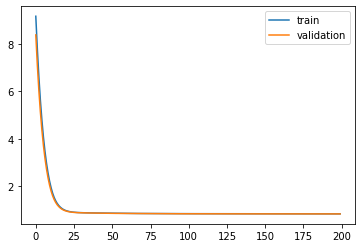

Time to train LSTM:  201.68198323249817
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 44s - loss: 9.1095 - pdc_loss: 0.7105 - event_loss: 0.6764 - val_loss: 8.3388 - val_pdc_loss: 0.7046 - val_event_loss: 0.6644

Epoch 00001: val_loss improved from inf to 8.33879, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 7.7728 - pdc_loss: 0.7012 - event_loss: 0.6511 - val_loss: 7.1042 - val_pdc_loss: 0.6956 - val_event_loss: 0.6394

Epoch 00002: val_loss improved from 8.33879 to 7.10415, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 6.6179 - pdc_loss: 0.6926 - event_loss: 0.6257 - val_loss: 6.0467 - val_pdc_loss: 0.6871 - val_event_loss: 0.6140

Epoch 00003: val_loss improved from 7.10415 to 6.04672, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 5.6334 - pdc_loss: 0.6843 - event_loss: 0.5995 - val_loss: 5.1504 - val_pdc_loss: 0.6789 - val_event_loss: 0.5873

Epoch 00004: val_loss improved from 6.04672 to 5.15037, saving


Epoch 00035: val_loss improved from 0.88504 to 0.88378, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 0.8732 - pdc_loss: 0.5400 - event_loss: 0.3192 - val_loss: 0.8826 - val_pdc_loss: 0.5444 - val_event_loss: 0.3243

Epoch 00036: val_loss improved from 0.88378 to 0.88258, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 0.8720 - pdc_loss: 0.5391 - event_loss: 0.3192 - val_loss: 0.8815 - val_pdc_loss: 0.5435 - val_event_loss: 0.3242

Epoch 00037: val_loss improved from 0.88258 to 0.88145, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 0.8709 - pdc_loss: 0.5381 - event_loss: 0.3191 - val_loss: 0.8805 - val_pdc_loss: 0.5426 - val_event_loss: 0.3242

Epoch 00038: val_loss improved from 0.88145 to 0.88045, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 0.8698 - pdc_loss: 0.5372 - event_loss: 0.3191 - val_loss: 0.8795 - val_pdc_loss: 0.5418 - val_event_loss: 0.3242

Epoch 00039: val_loss improved from 0.88045 to 

 - 1s - loss: 0.8515 - pdc_loss: 0.5230 - event_loss: 0.3171 - val_loss: 0.8637 - val_pdc_loss: 0.5298 - val_event_loss: 0.3225

Epoch 00070: val_loss improved from 0.86385 to 0.86369, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.8511 - pdc_loss: 0.5228 - event_loss: 0.3170 - val_loss: 0.8634 - val_pdc_loss: 0.5296 - val_event_loss: 0.3225

Epoch 00071: val_loss improved from 0.86369 to 0.86339, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.8508 - pdc_loss: 0.5225 - event_loss: 0.3169 - val_loss: 0.8632 - val_pdc_loss: 0.5295 - val_event_loss: 0.3224

Epoch 00072: val_loss improved from 0.86339 to 0.86319, saving model to Event_val_weights2.hdf5
Epoch 73/200
 - 1s - loss: 0.8505 - pdc_loss: 0.5224 - event_loss: 0.3168 - val_loss: 0.8629 - val_pdc_loss: 0.5293 - val_event_loss: 0.3223

Epoch 00073: val_loss improved from 0.86319 to 0.86290, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.8501 - pdc_loss: 0.5221 - event_

 - 1s - loss: 0.8437 - pdc_loss: 0.5179 - event_loss: 0.3157 - val_loss: 0.8576 - val_pdc_loss: 0.5266 - val_event_loss: 0.3209

Epoch 00105: val_loss improved from 0.85776 to 0.85758, saving model to Event_val_weights2.hdf5
Epoch 106/200
 - 1s - loss: 0.8436 - pdc_loss: 0.5179 - event_loss: 0.3156 - val_loss: 0.8575 - val_pdc_loss: 0.5267 - val_event_loss: 0.3209

Epoch 00106: val_loss improved from 0.85758 to 0.85754, saving model to Event_val_weights2.hdf5
Epoch 107/200
 - 1s - loss: 0.8434 - pdc_loss: 0.5177 - event_loss: 0.3156 - val_loss: 0.8574 - val_pdc_loss: 0.5265 - val_event_loss: 0.3209

Epoch 00107: val_loss improved from 0.85754 to 0.85744, saving model to Event_val_weights2.hdf5
Epoch 108/200
 - 1s - loss: 0.8433 - pdc_loss: 0.5177 - event_loss: 0.3156 - val_loss: 0.8574 - val_pdc_loss: 0.5265 - val_event_loss: 0.3209

Epoch 00108: val_loss improved from 0.85744 to 0.85738, saving model to Event_val_weights2.hdf5
Epoch 109/200
 - 1s - loss: 0.8431 - pdc_loss: 0.5176 - ev


Epoch 00142: val_loss improved from 0.85503 to 0.85488, saving model to Event_val_weights2.hdf5
Epoch 143/200
 - 1s - loss: 0.8398 - pdc_loss: 0.5157 - event_loss: 0.3149 - val_loss: 0.8551 - val_pdc_loss: 0.5254 - val_event_loss: 0.3204

Epoch 00143: val_loss did not improve from 0.85488
Epoch 144/200
 - 1s - loss: 0.8396 - pdc_loss: 0.5156 - event_loss: 0.3148 - val_loss: 0.8550 - val_pdc_loss: 0.5254 - val_event_loss: 0.3204

Epoch 00144: val_loss did not improve from 0.85488
Epoch 145/200
 - 1s - loss: 0.8396 - pdc_loss: 0.5156 - event_loss: 0.3148 - val_loss: 0.8549 - val_pdc_loss: 0.5255 - val_event_loss: 0.3204

Epoch 00145: val_loss did not improve from 0.85488
Epoch 146/200
 - 1s - loss: 0.8395 - pdc_loss: 0.5156 - event_loss: 0.3148 - val_loss: 0.8549 - val_pdc_loss: 0.5254 - val_event_loss: 0.3204

Epoch 00146: val_loss improved from 0.85488 to 0.85486, saving model to Event_val_weights2.hdf5
Epoch 147/200
 - 1s - loss: 0.8394 - pdc_loss: 0.5155 - event_loss: 0.3148 - val_l

 - 1s - loss: 0.8373 - pdc_loss: 0.5144 - event_loss: 0.3144 - val_loss: 0.8536 - val_pdc_loss: 0.5250 - val_event_loss: 0.3201

Epoch 00182: val_loss improved from 0.85362 to 0.85361, saving model to Event_val_weights2.hdf5
Epoch 183/200
 - 1s - loss: 0.8372 - pdc_loss: 0.5144 - event_loss: 0.3143 - val_loss: 0.8534 - val_pdc_loss: 0.5248 - val_event_loss: 0.3201

Epoch 00183: val_loss improved from 0.85361 to 0.85340, saving model to Event_val_weights2.hdf5
Epoch 184/200
 - 1s - loss: 0.8372 - pdc_loss: 0.5144 - event_loss: 0.3143 - val_loss: 0.8535 - val_pdc_loss: 0.5249 - val_event_loss: 0.3201

Epoch 00184: val_loss did not improve from 0.85340
Epoch 185/200
 - 1s - loss: 0.8372 - pdc_loss: 0.5144 - event_loss: 0.3143 - val_loss: 0.8537 - val_pdc_loss: 0.5251 - val_event_loss: 0.3202

Epoch 00185: val_loss did not improve from 0.85340
Epoch 186/200
 - 1s - loss: 0.8372 - pdc_loss: 0.5144 - event_loss: 0.3143 - val_loss: 0.8535 - val_pdc_loss: 0.5250 - val_event_loss: 0.3201

Epoch

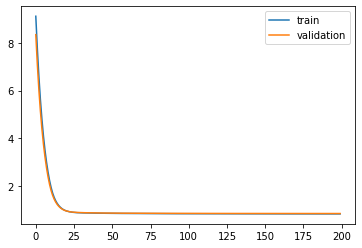

Time to train LSTM:  204.5033037662506
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 96s - loss: 8.9175 - pdc_loss: 0.7394 - event_loss: 0.7281 - val_loss: 8.1454 - val_pdc_loss: 0.7285 - val_event_loss: 0.6947

Epoch 00001: val_loss improved from inf to 8.14538, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 7.5795 - pdc_loss: 0.7151 - event_loss: 0.6730 - val_loss: 6.9130 - val_pdc_loss: 0.7060 - val_event_loss: 0.6448

Epoch 00002: val_loss improved from 8.14538 to 6.91297, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 6.4279 - pdc_loss: 0.6940 - event_loss: 0.6250 - val_loss: 5.8610 - val_pdc_loss: 0.6869 - val_event_loss: 0.5997

Epoch 00003: val_loss improved from 6.91297 to 5.86102, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 5.4497 - pdc_loss: 0.6761 - event_loss: 0.5808 - val_loss: 4.9724 - val_pdc_loss: 0.6705 - val_event_loss: 0.5576

Epoch 00004: val_loss improved from 5.86102 to 4.97237, saving 


Epoch 00035: val_loss improved from 0.89457 to 0.89346, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 0.8717 - pdc_loss: 0.5394 - event_loss: 0.3188 - val_loss: 0.8929 - val_pdc_loss: 0.5546 - val_event_loss: 0.3249

Epoch 00036: val_loss improved from 0.89346 to 0.89288, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 0.8708 - pdc_loss: 0.5389 - event_loss: 0.3186 - val_loss: 0.8919 - val_pdc_loss: 0.5539 - val_event_loss: 0.3249

Epoch 00037: val_loss improved from 0.89288 to 0.89195, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 0.8699 - pdc_loss: 0.5383 - event_loss: 0.3185 - val_loss: 0.8914 - val_pdc_loss: 0.5535 - val_event_loss: 0.3248

Epoch 00038: val_loss improved from 0.89195 to 0.89136, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 0.8692 - pdc_loss: 0.5378 - event_loss: 0.3184 - val_loss: 0.8906 - val_pdc_loss: 0.5530 - val_event_loss: 0.3247

Epoch 00039: val_loss improved from 0.89136 to 


Epoch 00070: val_loss improved from 0.87992 to 0.87988, saving model to Event_val_weights3.hdf5
Epoch 71/200
 - 1s - loss: 0.8551 - pdc_loss: 0.5274 - event_loss: 0.3172 - val_loss: 0.8799 - val_pdc_loss: 0.5452 - val_event_loss: 0.3243

Epoch 00071: val_loss did not improve from 0.87988
Epoch 72/200
 - 1s - loss: 0.8548 - pdc_loss: 0.5273 - event_loss: 0.3171 - val_loss: 0.8796 - val_pdc_loss: 0.5449 - val_event_loss: 0.3243

Epoch 00072: val_loss improved from 0.87988 to 0.87959, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.8545 - pdc_loss: 0.5271 - event_loss: 0.3171 - val_loss: 0.8794 - val_pdc_loss: 0.5449 - val_event_loss: 0.3243

Epoch 00073: val_loss improved from 0.87959 to 0.87943, saving model to Event_val_weights3.hdf5
Epoch 74/200
 - 1s - loss: 0.8543 - pdc_loss: 0.5270 - event_loss: 0.3171 - val_loss: 0.8789 - val_pdc_loss: 0.5445 - val_event_loss: 0.3242

Epoch 00074: val_loss improved from 0.87943 to 0.87887, saving model to Event_val_weights3.h

 - 1s - loss: 0.8482 - pdc_loss: 0.5232 - event_loss: 0.3161 - val_loss: 0.8742 - val_pdc_loss: 0.5415 - val_event_loss: 0.3239

Epoch 00106: val_loss improved from 0.87439 to 0.87420, saving model to Event_val_weights3.hdf5
Epoch 107/200
 - 1s - loss: 0.8480 - pdc_loss: 0.5232 - event_loss: 0.3161 - val_loss: 0.8743 - val_pdc_loss: 0.5416 - val_event_loss: 0.3238

Epoch 00107: val_loss did not improve from 0.87420
Epoch 108/200
 - 1s - loss: 0.8479 - pdc_loss: 0.5230 - event_loss: 0.3161 - val_loss: 0.8740 - val_pdc_loss: 0.5413 - val_event_loss: 0.3238

Epoch 00108: val_loss improved from 0.87420 to 0.87396, saving model to Event_val_weights3.hdf5
Epoch 109/200
 - 1s - loss: 0.8478 - pdc_loss: 0.5230 - event_loss: 0.3160 - val_loss: 0.8737 - val_pdc_loss: 0.5412 - val_event_loss: 0.3238

Epoch 00109: val_loss improved from 0.87396 to 0.87373, saving model to Event_val_weights3.hdf5
Epoch 110/200
 - 1s - loss: 0.8477 - pdc_loss: 0.5229 - event_loss: 0.3160 - val_loss: 0.8738 - val_pdc

 - 1s - loss: 0.8439 - pdc_loss: 0.5202 - event_loss: 0.3155 - val_loss: 0.8705 - val_pdc_loss: 0.5391 - val_event_loss: 0.3232

Epoch 00143: val_loss did not improve from 0.87047
Epoch 144/200
 - 1s - loss: 0.8437 - pdc_loss: 0.5201 - event_loss: 0.3154 - val_loss: 0.8706 - val_pdc_loss: 0.5392 - val_event_loss: 0.3232

Epoch 00144: val_loss did not improve from 0.87047
Epoch 145/200
 - 1s - loss: 0.8437 - pdc_loss: 0.5200 - event_loss: 0.3155 - val_loss: 0.8706 - val_pdc_loss: 0.5392 - val_event_loss: 0.3232

Epoch 00145: val_loss did not improve from 0.87047
Epoch 146/200
 - 1s - loss: 0.8436 - pdc_loss: 0.5201 - event_loss: 0.3154 - val_loss: 0.8703 - val_pdc_loss: 0.5389 - val_event_loss: 0.3232

Epoch 00146: val_loss improved from 0.87047 to 0.87027, saving model to Event_val_weights3.hdf5
Epoch 147/200
 - 1s - loss: 0.8435 - pdc_loss: 0.5199 - event_loss: 0.3155 - val_loss: 0.8701 - val_pdc_loss: 0.5388 - val_event_loss: 0.3232

Epoch 00147: val_loss improved from 0.87027 to 0.8


Epoch 00180: val_loss improved from 0.86744 to 0.86707, saving model to Event_val_weights3.hdf5
Epoch 181/200
 - 1s - loss: 0.8407 - pdc_loss: 0.5180 - event_loss: 0.3150 - val_loss: 0.8672 - val_pdc_loss: 0.5368 - val_event_loss: 0.3227

Epoch 00181: val_loss did not improve from 0.86707
Epoch 182/200
 - 1s - loss: 0.8407 - pdc_loss: 0.5180 - event_loss: 0.3150 - val_loss: 0.8669 - val_pdc_loss: 0.5366 - val_event_loss: 0.3227

Epoch 00182: val_loss improved from 0.86707 to 0.86692, saving model to Event_val_weights3.hdf5
Epoch 183/200
 - 1s - loss: 0.8406 - pdc_loss: 0.5179 - event_loss: 0.3150 - val_loss: 0.8674 - val_pdc_loss: 0.5369 - val_event_loss: 0.3228

Epoch 00183: val_loss did not improve from 0.86692
Epoch 184/200
 - 1s - loss: 0.8405 - pdc_loss: 0.5178 - event_loss: 0.3150 - val_loss: 0.8670 - val_pdc_loss: 0.5366 - val_event_loss: 0.3228

Epoch 00184: val_loss did not improve from 0.86692
Epoch 185/200
 - 1s - loss: 0.8405 - pdc_loss: 0.5178 - event_loss: 0.3150 - val_l

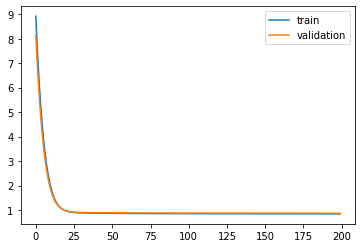

Time to train LSTM:  256.70732498168945
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 43s - loss: 8.8807 - pdc_loss: 0.7030 - event_loss: 0.7593 - val_loss: 8.1120 - val_pdc_loss: 0.7004 - val_event_loss: 0.7118

Epoch 00001: val_loss improved from inf to 8.11201, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 7.5432 - pdc_loss: 0.6918 - event_loss: 0.6772 - val_loss: 6.8865 - val_pdc_loss: 0.6913 - val_event_loss: 0.6453

Epoch 00002: val_loss improved from 8.11201 to 6.88646, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 6.3983 - pdc_loss: 0.6827 - event_loss: 0.6170 - val_loss: 5.8423 - val_pdc_loss: 0.6833 - val_event_loss: 0.5933

Epoch 00003: val_loss improved from 6.88646 to 5.84234, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 5.4266 - pdc_loss: 0.6747 - event_loss: 0.5677 - val_loss: 4.9594 - val_pdc_loss: 0.6754 - val_event_loss: 0.5484

Epoch 00004: val_loss improved from 5.84234 to 4.95939, saving


Epoch 00035: val_loss improved from 0.89584 to 0.89485, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 0.8694 - pdc_loss: 0.5375 - event_loss: 0.3180 - val_loss: 0.8938 - val_pdc_loss: 0.5517 - val_event_loss: 0.3284

Epoch 00036: val_loss improved from 0.89485 to 0.89384, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 0.8681 - pdc_loss: 0.5363 - event_loss: 0.3180 - val_loss: 0.8928 - val_pdc_loss: 0.5508 - val_event_loss: 0.3283

Epoch 00037: val_loss improved from 0.89384 to 0.89285, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 0.8669 - pdc_loss: 0.5352 - event_loss: 0.3180 - val_loss: 0.8917 - val_pdc_loss: 0.5498 - val_event_loss: 0.3283

Epoch 00038: val_loss improved from 0.89285 to 0.89174, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 0.8657 - pdc_loss: 0.5341 - event_loss: 0.3179 - val_loss: 0.8906 - val_pdc_loss: 0.5487 - val_event_loss: 0.3282

Epoch 00039: val_loss improved from 0.89174 to 

 - 1s - loss: 0.8467 - pdc_loss: 0.5205 - event_loss: 0.3156 - val_loss: 0.8754 - val_pdc_loss: 0.5389 - val_event_loss: 0.3260

Epoch 00070: val_loss improved from 0.87573 to 0.87545, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.8464 - pdc_loss: 0.5203 - event_loss: 0.3155 - val_loss: 0.8753 - val_pdc_loss: 0.5388 - val_event_loss: 0.3260

Epoch 00071: val_loss improved from 0.87545 to 0.87530, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.8461 - pdc_loss: 0.5201 - event_loss: 0.3155 - val_loss: 0.8751 - val_pdc_loss: 0.5387 - val_event_loss: 0.3259

Epoch 00072: val_loss improved from 0.87530 to 0.87508, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.8459 - pdc_loss: 0.5200 - event_loss: 0.3155 - val_loss: 0.8749 - val_pdc_loss: 0.5386 - val_event_loss: 0.3259

Epoch 00073: val_loss improved from 0.87508 to 0.87492, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.8456 - pdc_loss: 0.5198 - event_

 - 1s - loss: 0.8405 - pdc_loss: 0.5163 - event_loss: 0.3148 - val_loss: 0.8709 - val_pdc_loss: 0.5360 - val_event_loss: 0.3256

Epoch 00105: val_loss improved from 0.87112 to 0.87094, saving model to Event_val_weights4.hdf5
Epoch 106/200
 - 1s - loss: 0.8403 - pdc_loss: 0.5162 - event_loss: 0.3148 - val_loss: 0.8711 - val_pdc_loss: 0.5359 - val_event_loss: 0.3258

Epoch 00106: val_loss did not improve from 0.87094
Epoch 107/200
 - 1s - loss: 0.8402 - pdc_loss: 0.5161 - event_loss: 0.3148 - val_loss: 0.8708 - val_pdc_loss: 0.5359 - val_event_loss: 0.3256

Epoch 00107: val_loss improved from 0.87094 to 0.87081, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.8401 - pdc_loss: 0.5161 - event_loss: 0.3147 - val_loss: 0.8709 - val_pdc_loss: 0.5358 - val_event_loss: 0.3257

Epoch 00108: val_loss did not improve from 0.87081
Epoch 109/200
 - 1s - loss: 0.8400 - pdc_loss: 0.5160 - event_loss: 0.3147 - val_loss: 0.8706 - val_pdc_loss: 0.5357 - val_event_loss: 0.3256

Epoch


Epoch 00142: val_loss improved from 0.86881 to 0.86871, saving model to Event_val_weights4.hdf5
Epoch 143/200
 - 1s - loss: 0.8371 - pdc_loss: 0.5143 - event_loss: 0.3142 - val_loss: 0.8686 - val_pdc_loss: 0.5345 - val_event_loss: 0.3255

Epoch 00143: val_loss improved from 0.86871 to 0.86865, saving model to Event_val_weights4.hdf5
Epoch 144/200
 - 1s - loss: 0.8371 - pdc_loss: 0.5143 - event_loss: 0.3142 - val_loss: 0.8686 - val_pdc_loss: 0.5344 - val_event_loss: 0.3256

Epoch 00144: val_loss improved from 0.86865 to 0.86861, saving model to Event_val_weights4.hdf5
Epoch 145/200
 - 1s - loss: 0.8370 - pdc_loss: 0.5142 - event_loss: 0.3142 - val_loss: 0.8686 - val_pdc_loss: 0.5344 - val_event_loss: 0.3256

Epoch 00145: val_loss did not improve from 0.86861
Epoch 146/200
 - 1s - loss: 0.8370 - pdc_loss: 0.5142 - event_loss: 0.3142 - val_loss: 0.8686 - val_pdc_loss: 0.5345 - val_event_loss: 0.3256

Epoch 00146: val_loss did not improve from 0.86861
Epoch 147/200
 - 1s - loss: 0.8369 - 


Epoch 00180: val_loss did not improve from 0.86750
Epoch 181/200
 - 1s - loss: 0.8351 - pdc_loss: 0.5132 - event_loss: 0.3138 - val_loss: 0.8674 - val_pdc_loss: 0.5337 - val_event_loss: 0.3256

Epoch 00181: val_loss improved from 0.86750 to 0.86735, saving model to Event_val_weights4.hdf5
Epoch 182/200
 - 1s - loss: 0.8351 - pdc_loss: 0.5133 - event_loss: 0.3138 - val_loss: 0.8675 - val_pdc_loss: 0.5339 - val_event_loss: 0.3256

Epoch 00182: val_loss did not improve from 0.86735
Epoch 183/200
 - 1s - loss: 0.8350 - pdc_loss: 0.5132 - event_loss: 0.3138 - val_loss: 0.8674 - val_pdc_loss: 0.5336 - val_event_loss: 0.3257

Epoch 00183: val_loss did not improve from 0.86735
Epoch 184/200
 - 1s - loss: 0.8350 - pdc_loss: 0.5132 - event_loss: 0.3138 - val_loss: 0.8675 - val_pdc_loss: 0.5339 - val_event_loss: 0.3255

Epoch 00184: val_loss did not improve from 0.86735
Epoch 185/200
 - 1s - loss: 0.8348 - pdc_loss: 0.5131 - event_loss: 0.3137 - val_loss: 0.8673 - val_pdc_loss: 0.5337 - val_even

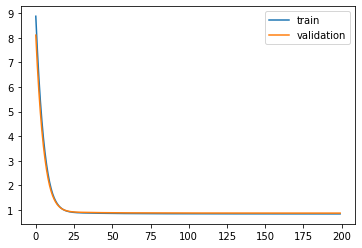

Time to train LSTM:  205.6472029685974


Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f60d5a0b828>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 44s - loss: 8.8871 - pdc_loss: 0.7650 - event_loss: 0.7080 - val_loss: 8.1105 - val_pdc_loss: 0.7426 - val_event_loss: 0.6793

Epoch 00001: val_loss improved from inf to 8.11047, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 7.5529 - pdc_loss: 0.7322 - event_loss: 0.6609 - val_loss: 6.8804 - val_pdc_loss: 0.7136 - val_event_loss: 0.6343

Epoch 00002: val_loss improved from 8.11047 to 6.88044, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 6.4036 - pdc_loss: 0.7048 - event_loss: 0.6184 - val_loss: 5.8299 - val_pdc_loss: 0.6899 - val_event_loss: 0.5932

Epoch 00003: val_loss improved from 6.88044 to 5.82989, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 5.4266 - pdc_loss: 0.6825 - event_loss: 0.5787 - val_loss: 4.9417 - val_pdc_loss: 0.6703 - val_event_loss: 0.5542

Epoch 00004: val_loss improved from 5.82989 to 4.94166, saving model to Event_val_weights5.hdf5
Epoch 


Epoch 00035: val_loss improved from 0.87455 to 0.87347, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 0.8712 - pdc_loss: 0.5380 - event_loss: 0.3190 - val_loss: 0.8725 - val_pdc_loss: 0.5394 - val_event_loss: 0.3191

Epoch 00036: val_loss improved from 0.87347 to 0.87253, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 0.8702 - pdc_loss: 0.5374 - event_loss: 0.3189 - val_loss: 0.8717 - val_pdc_loss: 0.5389 - val_event_loss: 0.3190

Epoch 00037: val_loss improved from 0.87253 to 0.87165, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 0.8694 - pdc_loss: 0.5368 - event_loss: 0.3188 - val_loss: 0.8709 - val_pdc_loss: 0.5383 - val_event_loss: 0.3189

Epoch 00038: val_loss improved from 0.87165 to 0.87086, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 0.8685 - pdc_loss: 0.5363 - event_loss: 0.3187 - val_loss: 0.8701 - val_pdc_loss: 0.5378 - val_event_loss: 0.3189

Epoch 00039: val_loss improved from 0.87086 to 

 - 1s - loss: 0.8527 - pdc_loss: 0.5247 - event_loss: 0.3173 - val_loss: 0.8557 - val_pdc_loss: 0.5272 - val_event_loss: 0.3177

Epoch 00070: val_loss improved from 0.85616 to 0.85567, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.8523 - pdc_loss: 0.5245 - event_loss: 0.3172 - val_loss: 0.8554 - val_pdc_loss: 0.5272 - val_event_loss: 0.3176

Epoch 00071: val_loss improved from 0.85567 to 0.85541, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8520 - pdc_loss: 0.5242 - event_loss: 0.3173 - val_loss: 0.8548 - val_pdc_loss: 0.5266 - val_event_loss: 0.3176

Epoch 00072: val_loss improved from 0.85541 to 0.85476, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8516 - pdc_loss: 0.5240 - event_loss: 0.3172 - val_loss: 0.8547 - val_pdc_loss: 0.5268 - val_event_loss: 0.3175

Epoch 00073: val_loss improved from 0.85476 to 0.85474, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8513 - pdc_loss: 0.5237 - event_


Epoch 00105: val_loss improved from 0.84789 to 0.84753, saving model to Event_val_weights5.hdf5
Epoch 106/200
 - 1s - loss: 0.8441 - pdc_loss: 0.5188 - event_loss: 0.3164 - val_loss: 0.8473 - val_pdc_loss: 0.5217 - val_event_loss: 0.3167

Epoch 00106: val_loss improved from 0.84753 to 0.84732, saving model to Event_val_weights5.hdf5
Epoch 107/200
 - 1s - loss: 0.8442 - pdc_loss: 0.5189 - event_loss: 0.3165 - val_loss: 0.8472 - val_pdc_loss: 0.5217 - val_event_loss: 0.3166

Epoch 00107: val_loss improved from 0.84732 to 0.84723, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.8439 - pdc_loss: 0.5186 - event_loss: 0.3164 - val_loss: 0.8471 - val_pdc_loss: 0.5216 - val_event_loss: 0.3167

Epoch 00108: val_loss improved from 0.84723 to 0.84710, saving model to Event_val_weights5.hdf5
Epoch 109/200
 - 1s - loss: 0.8440 - pdc_loss: 0.5188 - event_loss: 0.3164 - val_loss: 0.8475 - val_pdc_loss: 0.5220 - val_event_loss: 0.3166

Epoch 00109: val_loss did not improve from 


Epoch 00143: val_loss improved from 0.84497 to 0.84486, saving model to Event_val_weights5.hdf5
Epoch 144/200
 - 1s - loss: 0.8406 - pdc_loss: 0.5167 - event_loss: 0.3157 - val_loss: 0.8451 - val_pdc_loss: 0.5205 - val_event_loss: 0.3164

Epoch 00144: val_loss did not improve from 0.84486
Epoch 145/200
 - 1s - loss: 0.8406 - pdc_loss: 0.5167 - event_loss: 0.3157 - val_loss: 0.8451 - val_pdc_loss: 0.5205 - val_event_loss: 0.3164

Epoch 00145: val_loss did not improve from 0.84486
Epoch 146/200
 - 1s - loss: 0.8405 - pdc_loss: 0.5166 - event_loss: 0.3157 - val_loss: 0.8448 - val_pdc_loss: 0.5203 - val_event_loss: 0.3163

Epoch 00146: val_loss improved from 0.84486 to 0.84482, saving model to Event_val_weights5.hdf5
Epoch 147/200
 - 1s - loss: 0.8405 - pdc_loss: 0.5167 - event_loss: 0.3157 - val_loss: 0.8447 - val_pdc_loss: 0.5201 - val_event_loss: 0.3164

Epoch 00147: val_loss improved from 0.84482 to 0.84474, saving model to Event_val_weights5.hdf5
Epoch 148/200
 - 1s - loss: 0.8403 - 

 - 1s - loss: 0.8384 - pdc_loss: 0.5156 - event_loss: 0.3151 - val_loss: 0.8439 - val_pdc_loss: 0.5199 - val_event_loss: 0.3162

Epoch 00183: val_loss improved from 0.84397 to 0.84393, saving model to Event_val_weights5.hdf5
Epoch 184/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5156 - event_loss: 0.3151 - val_loss: 0.8441 - val_pdc_loss: 0.5201 - val_event_loss: 0.3162

Epoch 00184: val_loss did not improve from 0.84393
Epoch 185/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5155 - event_loss: 0.3151 - val_loss: 0.8439 - val_pdc_loss: 0.5199 - val_event_loss: 0.3162

Epoch 00185: val_loss improved from 0.84393 to 0.84391, saving model to Event_val_weights5.hdf5
Epoch 186/200
 - 1s - loss: 0.8383 - pdc_loss: 0.5155 - event_loss: 0.3151 - val_loss: 0.8441 - val_pdc_loss: 0.5201 - val_event_loss: 0.3163

Epoch 00186: val_loss did not improve from 0.84391
Epoch 187/200
 - 1s - loss: 0.8383 - pdc_loss: 0.5155 - event_loss: 0.3151 - val_loss: 0.8442 - val_pdc_loss: 0.5202 - val_event_loss: 0.3162

Epoch

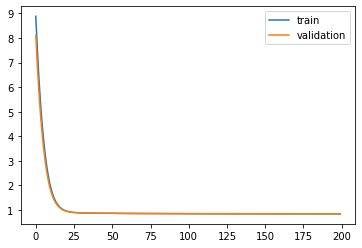

Time to train LSTM:  220.45254492759705
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 45s - loss: 6.9265 - pdc_loss: 0.7301 - event_loss: 0.7493 - val_loss: 6.3396 - val_pdc_loss: 0.7137 - val_event_loss: 0.6990

Epoch 00001: val_loss improved from inf to 6.33964, saving model to Event_val_weights1.hdf5
Epoch 2/200
 - 1s - loss: 5.9146 - pdc_loss: 0.7026 - event_loss: 0.6661 - val_loss: 5.4077 - val_pdc_loss: 0.6900 - val_event_loss: 0.6247

Epoch 00002: val_loss improved from 6.33964 to 5.40770, saving model to Event_val_weights1.hdf5
Epoch 3/200
 - 1s - loss: 5.0474 - pdc_loss: 0.6820 - event_loss: 0.6009 - val_loss: 4.6149 - val_pdc_loss: 0.6722 - val_event_loss: 0.5667

Epoch 00003: val_loss improved from 5.40770 to 4.61486, saving model to Event_val_weights1.hdf5
Epoch 4/200
 - 1s - loss: 4.3125 - pdc_loss: 0.6661 - event_loss: 0.5495 - val_loss: 3.9458 - val_pdc_loss: 0.6576 - val_event_loss: 0.5201

Epoch 00004: val_loss improved from 4.61486 to 3.94581, saving


Epoch 00035: val_loss improved from 0.87139 to 0.87015, saving model to Event_val_weights1.hdf5
Epoch 36/200
 - 1s - loss: 0.8717 - pdc_loss: 0.5399 - event_loss: 0.3187 - val_loss: 0.8690 - val_pdc_loss: 0.5417 - val_event_loss: 0.3141

Epoch 00036: val_loss improved from 0.87015 to 0.86895, saving model to Event_val_weights1.hdf5
Epoch 37/200
 - 1s - loss: 0.8706 - pdc_loss: 0.5390 - event_loss: 0.3186 - val_loss: 0.8679 - val_pdc_loss: 0.5409 - val_event_loss: 0.3140

Epoch 00037: val_loss improved from 0.86895 to 0.86788, saving model to Event_val_weights1.hdf5
Epoch 38/200
 - 1s - loss: 0.8696 - pdc_loss: 0.5381 - event_loss: 0.3186 - val_loss: 0.8668 - val_pdc_loss: 0.5400 - val_event_loss: 0.3140

Epoch 00038: val_loss improved from 0.86788 to 0.86683, saving model to Event_val_weights1.hdf5
Epoch 39/200
 - 1s - loss: 0.8686 - pdc_loss: 0.5373 - event_loss: 0.3186 - val_loss: 0.8658 - val_pdc_loss: 0.5393 - val_event_loss: 0.3138

Epoch 00039: val_loss improved from 0.86683 to 

 - 1s - loss: 0.8520 - pdc_loss: 0.5246 - event_loss: 0.3172 - val_loss: 0.8481 - val_pdc_loss: 0.5257 - val_event_loss: 0.3122

Epoch 00070: val_loss improved from 0.84892 to 0.84815, saving model to Event_val_weights1.hdf5
Epoch 71/200
 - 1s - loss: 0.8516 - pdc_loss: 0.5243 - event_loss: 0.3171 - val_loss: 0.8482 - val_pdc_loss: 0.5258 - val_event_loss: 0.3122

Epoch 00071: val_loss did not improve from 0.84815
Epoch 72/200
 - 1s - loss: 0.8512 - pdc_loss: 0.5241 - event_loss: 0.3170 - val_loss: 0.8480 - val_pdc_loss: 0.5258 - val_event_loss: 0.3120

Epoch 00072: val_loss improved from 0.84815 to 0.84796, saving model to Event_val_weights1.hdf5
Epoch 73/200
 - 1s - loss: 0.8509 - pdc_loss: 0.5239 - event_loss: 0.3169 - val_loss: 0.8469 - val_pdc_loss: 0.5250 - val_event_loss: 0.3119

Epoch 00073: val_loss improved from 0.84796 to 0.84694, saving model to Event_val_weights1.hdf5
Epoch 74/200
 - 1s - loss: 0.8506 - pdc_loss: 0.5236 - event_loss: 0.3169 - val_loss: 0.8474 - val_pdc_los


Epoch 00107: val_loss improved from 0.84120 to 0.84080, saving model to Event_val_weights1.hdf5
Epoch 108/200
 - 1s - loss: 0.8427 - pdc_loss: 0.5182 - event_loss: 0.3156 - val_loss: 0.8411 - val_pdc_loss: 0.5210 - val_event_loss: 0.3113

Epoch 00108: val_loss did not improve from 0.84080
Epoch 109/200
 - 1s - loss: 0.8426 - pdc_loss: 0.5182 - event_loss: 0.3156 - val_loss: 0.8407 - val_pdc_loss: 0.5208 - val_event_loss: 0.3111

Epoch 00109: val_loss improved from 0.84080 to 0.84071, saving model to Event_val_weights1.hdf5
Epoch 110/200
 - 1s - loss: 0.8425 - pdc_loss: 0.5181 - event_loss: 0.3156 - val_loss: 0.8408 - val_pdc_loss: 0.5209 - val_event_loss: 0.3111

Epoch 00110: val_loss did not improve from 0.84071
Epoch 111/200
 - 1s - loss: 0.8424 - pdc_loss: 0.5180 - event_loss: 0.3156 - val_loss: 0.8405 - val_pdc_loss: 0.5208 - val_event_loss: 0.3110

Epoch 00111: val_loss improved from 0.84071 to 0.84054, saving model to Event_val_weights1.hdf5
Epoch 112/200
 - 1s - loss: 0.8422 - 

 - 1s - loss: 0.8391 - pdc_loss: 0.5159 - event_loss: 0.3151 - val_loss: 0.8376 - val_pdc_loss: 0.5189 - val_event_loss: 0.3107

Epoch 00146: val_loss improved from 0.83766 to 0.83761, saving model to Event_val_weights1.hdf5
Epoch 147/200
 - 1s - loss: 0.8390 - pdc_loss: 0.5159 - event_loss: 0.3151 - val_loss: 0.8376 - val_pdc_loss: 0.5188 - val_event_loss: 0.3107

Epoch 00147: val_loss did not improve from 0.83761
Epoch 148/200
 - 1s - loss: 0.8389 - pdc_loss: 0.5158 - event_loss: 0.3151 - val_loss: 0.8378 - val_pdc_loss: 0.5191 - val_event_loss: 0.3107

Epoch 00148: val_loss did not improve from 0.83761
Epoch 149/200
 - 1s - loss: 0.8389 - pdc_loss: 0.5158 - event_loss: 0.3151 - val_loss: 0.8374 - val_pdc_loss: 0.5186 - val_event_loss: 0.3108

Epoch 00149: val_loss improved from 0.83761 to 0.83743, saving model to Event_val_weights1.hdf5
Epoch 150/200
 - 1s - loss: 0.8388 - pdc_loss: 0.5157 - event_loss: 0.3151 - val_loss: 0.8375 - val_pdc_loss: 0.5188 - val_event_loss: 0.3108

Epoch


Epoch 00184: val_loss did not improve from 0.83566
Epoch 185/200
 - 1s - loss: 0.8368 - pdc_loss: 0.5144 - event_loss: 0.3148 - val_loss: 0.8356 - val_pdc_loss: 0.5173 - val_event_loss: 0.3107

Epoch 00185: val_loss improved from 0.83566 to 0.83564, saving model to Event_val_weights1.hdf5
Epoch 186/200
 - 1s - loss: 0.8367 - pdc_loss: 0.5144 - event_loss: 0.3147 - val_loss: 0.8358 - val_pdc_loss: 0.5175 - val_event_loss: 0.3107

Epoch 00186: val_loss did not improve from 0.83564
Epoch 187/200
 - 1s - loss: 0.8367 - pdc_loss: 0.5143 - event_loss: 0.3147 - val_loss: 0.8357 - val_pdc_loss: 0.5175 - val_event_loss: 0.3106

Epoch 00187: val_loss did not improve from 0.83564
Epoch 188/200
 - 1s - loss: 0.8366 - pdc_loss: 0.5143 - event_loss: 0.3147 - val_loss: 0.8356 - val_pdc_loss: 0.5173 - val_event_loss: 0.3107

Epoch 00188: val_loss did not improve from 0.83564
Epoch 189/200
 - 1s - loss: 0.8366 - pdc_loss: 0.5143 - event_loss: 0.3147 - val_loss: 0.8357 - val_pdc_loss: 0.5174 - val_even

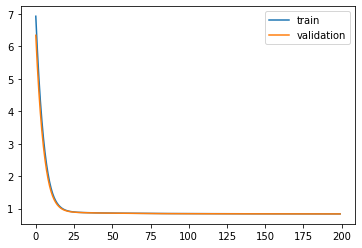

Time to train LSTM:  206.84582257270813
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 49s - loss: 6.8594 - pdc_loss: 0.7360 - event_loss: 0.7112 - val_loss: 6.2917 - val_pdc_loss: 0.7218 - val_event_loss: 0.6834

Epoch 00001: val_loss improved from inf to 6.29167, saving model to Event_val_weights2.hdf5
Epoch 2/200
 - 1s - loss: 5.8776 - pdc_loss: 0.7091 - event_loss: 0.6657 - val_loss: 5.3877 - val_pdc_loss: 0.6978 - val_event_loss: 0.6419

Epoch 00002: val_loss improved from 6.29167 to 5.38769, saving model to Event_val_weights2.hdf5
Epoch 3/200
 - 1s - loss: 5.0317 - pdc_loss: 0.6861 - event_loss: 0.6257 - val_loss: 4.6148 - val_pdc_loss: 0.6776 - val_event_loss: 0.6045

Epoch 00003: val_loss improved from 5.38769 to 4.61480, saving model to Event_val_weights2.hdf5
Epoch 4/200
 - 1s - loss: 4.3118 - pdc_loss: 0.6671 - event_loss: 0.5888 - val_loss: 3.9598 - val_pdc_loss: 0.6607 - val_event_loss: 0.5684

Epoch 00004: val_loss improved from 4.61480 to 3.95978, saving


Epoch 00035: val_loss improved from 0.88290 to 0.88184, saving model to Event_val_weights2.hdf5
Epoch 36/200
 - 1s - loss: 0.8695 - pdc_loss: 0.5382 - event_loss: 0.3178 - val_loss: 0.8807 - val_pdc_loss: 0.5435 - val_event_loss: 0.3237

Epoch 00036: val_loss improved from 0.88184 to 0.88066, saving model to Event_val_weights2.hdf5
Epoch 37/200
 - 1s - loss: 0.8684 - pdc_loss: 0.5373 - event_loss: 0.3177 - val_loss: 0.8796 - val_pdc_loss: 0.5427 - val_event_loss: 0.3236

Epoch 00037: val_loss improved from 0.88066 to 0.87955, saving model to Event_val_weights2.hdf5
Epoch 38/200
 - 1s - loss: 0.8673 - pdc_loss: 0.5364 - event_loss: 0.3176 - val_loss: 0.8784 - val_pdc_loss: 0.5418 - val_event_loss: 0.3234

Epoch 00038: val_loss improved from 0.87955 to 0.87843, saving model to Event_val_weights2.hdf5
Epoch 39/200
 - 1s - loss: 0.8663 - pdc_loss: 0.5356 - event_loss: 0.3175 - val_loss: 0.8776 - val_pdc_loss: 0.5409 - val_event_loss: 0.3235

Epoch 00039: val_loss improved from 0.87843 to 

 - 1s - loss: 0.8460 - pdc_loss: 0.5197 - event_loss: 0.3156 - val_loss: 0.8605 - val_pdc_loss: 0.5282 - val_event_loss: 0.3217

Epoch 00070: val_loss improved from 0.86074 to 0.86053, saving model to Event_val_weights2.hdf5
Epoch 71/200
 - 1s - loss: 0.8457 - pdc_loss: 0.5195 - event_loss: 0.3156 - val_loss: 0.8603 - val_pdc_loss: 0.5280 - val_event_loss: 0.3217

Epoch 00071: val_loss improved from 0.86053 to 0.86027, saving model to Event_val_weights2.hdf5
Epoch 72/200
 - 1s - loss: 0.8453 - pdc_loss: 0.5192 - event_loss: 0.3155 - val_loss: 0.8602 - val_pdc_loss: 0.5280 - val_event_loss: 0.3217

Epoch 00072: val_loss improved from 0.86027 to 0.86021, saving model to Event_val_weights2.hdf5
Epoch 73/200
 - 1s - loss: 0.8451 - pdc_loss: 0.5191 - event_loss: 0.3155 - val_loss: 0.8596 - val_pdc_loss: 0.5277 - val_event_loss: 0.3214

Epoch 00073: val_loss improved from 0.86021 to 0.85964, saving model to Event_val_weights2.hdf5
Epoch 74/200
 - 1s - loss: 0.8447 - pdc_loss: 0.5188 - event_


Epoch 00105: val_loss did not improve from 0.85482
Epoch 106/200
 - 1s - loss: 0.8387 - pdc_loss: 0.5149 - event_loss: 0.3146 - val_loss: 0.8548 - val_pdc_loss: 0.5250 - val_event_loss: 0.3206

Epoch 00106: val_loss improved from 0.85482 to 0.85481, saving model to Event_val_weights2.hdf5
Epoch 107/200
 - 1s - loss: 0.8386 - pdc_loss: 0.5148 - event_loss: 0.3146 - val_loss: 0.8548 - val_pdc_loss: 0.5249 - val_event_loss: 0.3206

Epoch 00107: val_loss improved from 0.85481 to 0.85477, saving model to Event_val_weights2.hdf5
Epoch 108/200
 - 1s - loss: 0.8385 - pdc_loss: 0.5147 - event_loss: 0.3146 - val_loss: 0.8546 - val_pdc_loss: 0.5249 - val_event_loss: 0.3206

Epoch 00108: val_loss improved from 0.85477 to 0.85461, saving model to Event_val_weights2.hdf5
Epoch 109/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5147 - event_loss: 0.3145 - val_loss: 0.8545 - val_pdc_loss: 0.5248 - val_event_loss: 0.3206

Epoch 00109: val_loss improved from 0.85461 to 0.85449, saving model to Event_val_weight

 - 1s - loss: 0.8353 - pdc_loss: 0.5130 - event_loss: 0.3138 - val_loss: 0.8526 - val_pdc_loss: 0.5240 - val_event_loss: 0.3202

Epoch 00143: val_loss did not improve from 0.85256
Epoch 144/200
 - 1s - loss: 0.8352 - pdc_loss: 0.5130 - event_loss: 0.3138 - val_loss: 0.8527 - val_pdc_loss: 0.5240 - val_event_loss: 0.3202

Epoch 00144: val_loss did not improve from 0.85256
Epoch 145/200
 - 1s - loss: 0.8352 - pdc_loss: 0.5130 - event_loss: 0.3138 - val_loss: 0.8525 - val_pdc_loss: 0.5239 - val_event_loss: 0.3202

Epoch 00145: val_loss improved from 0.85256 to 0.85251, saving model to Event_val_weights2.hdf5
Epoch 146/200
 - 1s - loss: 0.8351 - pdc_loss: 0.5129 - event_loss: 0.3137 - val_loss: 0.8526 - val_pdc_loss: 0.5240 - val_event_loss: 0.3202

Epoch 00146: val_loss did not improve from 0.85251
Epoch 147/200
 - 1s - loss: 0.8350 - pdc_loss: 0.5129 - event_loss: 0.3137 - val_loss: 0.8524 - val_pdc_loss: 0.5239 - val_event_loss: 0.3201

Epoch 00147: val_loss improved from 0.85251 to 0.8

 - 1s - loss: 0.8332 - pdc_loss: 0.5120 - event_loss: 0.3133 - val_loss: 0.8518 - val_pdc_loss: 0.5237 - val_event_loss: 0.3202

Epoch 00182: val_loss did not improve from 0.85175
Epoch 183/200
 - 1s - loss: 0.8331 - pdc_loss: 0.5119 - event_loss: 0.3133 - val_loss: 0.8517 - val_pdc_loss: 0.5236 - val_event_loss: 0.3202

Epoch 00183: val_loss improved from 0.85175 to 0.85169, saving model to Event_val_weights2.hdf5
Epoch 184/200
 - 1s - loss: 0.8331 - pdc_loss: 0.5119 - event_loss: 0.3133 - val_loss: 0.8517 - val_pdc_loss: 0.5237 - val_event_loss: 0.3202

Epoch 00184: val_loss did not improve from 0.85169
Epoch 185/200
 - 1s - loss: 0.8330 - pdc_loss: 0.5119 - event_loss: 0.3132 - val_loss: 0.8517 - val_pdc_loss: 0.5236 - val_event_loss: 0.3202

Epoch 00185: val_loss improved from 0.85169 to 0.85168, saving model to Event_val_weights2.hdf5
Epoch 186/200
 - 1s - loss: 0.8330 - pdc_loss: 0.5119 - event_loss: 0.3132 - val_loss: 0.8516 - val_pdc_loss: 0.5236 - val_event_loss: 0.3202

Epoch

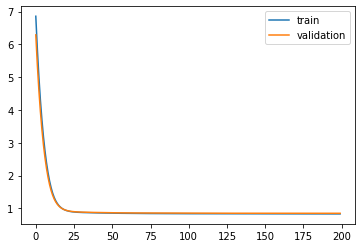

Time to train LSTM:  209.72055220603943
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 47s - loss: 6.8152 - pdc_loss: 0.6919 - event_loss: 0.7731 - val_loss: 6.2485 - val_pdc_loss: 0.6852 - val_event_loss: 0.7284

Epoch 00001: val_loss improved from inf to 6.24852, saving model to Event_val_weights3.hdf5
Epoch 2/200
 - 1s - loss: 5.8313 - pdc_loss: 0.6748 - event_loss: 0.6982 - val_loss: 5.3445 - val_pdc_loss: 0.6702 - val_event_loss: 0.6633

Epoch 00002: val_loss improved from 6.24852 to 5.34448, saving model to Event_val_weights3.hdf5
Epoch 3/200
 - 1s - loss: 4.9864 - pdc_loss: 0.6601 - event_loss: 0.6383 - val_loss: 4.5730 - val_pdc_loss: 0.6571 - val_event_loss: 0.6090

Epoch 00003: val_loss improved from 5.34448 to 4.57296, saving model to Event_val_weights3.hdf5
Epoch 4/200
 - 1s - loss: 4.2677 - pdc_loss: 0.6470 - event_loss: 0.5867 - val_loss: 3.9197 - val_pdc_loss: 0.6454 - val_event_loss: 0.5615

Epoch 00004: val_loss improved from 4.57296 to 3.91973, saving


Epoch 00035: val_loss improved from 0.88533 to 0.88406, saving model to Event_val_weights3.hdf5
Epoch 36/200
 - 1s - loss: 0.8633 - pdc_loss: 0.5315 - event_loss: 0.3180 - val_loss: 0.8829 - val_pdc_loss: 0.5458 - val_event_loss: 0.3235

Epoch 00036: val_loss improved from 0.88406 to 0.88295, saving model to Event_val_weights3.hdf5
Epoch 37/200
 - 1s - loss: 0.8619 - pdc_loss: 0.5304 - event_loss: 0.3179 - val_loss: 0.8818 - val_pdc_loss: 0.5449 - val_event_loss: 0.3234

Epoch 00037: val_loss improved from 0.88295 to 0.88176, saving model to Event_val_weights3.hdf5
Epoch 38/200
 - 1s - loss: 0.8604 - pdc_loss: 0.5293 - event_loss: 0.3178 - val_loss: 0.8803 - val_pdc_loss: 0.5438 - val_event_loss: 0.3233

Epoch 00038: val_loss improved from 0.88176 to 0.88035, saving model to Event_val_weights3.hdf5
Epoch 39/200
 - 1s - loss: 0.8590 - pdc_loss: 0.5282 - event_loss: 0.3177 - val_loss: 0.8791 - val_pdc_loss: 0.5428 - val_event_loss: 0.3232

Epoch 00039: val_loss improved from 0.88035 to 

 - 1s - loss: 0.8453 - pdc_loss: 0.5194 - event_loss: 0.3158 - val_loss: 0.8697 - val_pdc_loss: 0.5369 - val_event_loss: 0.3228

Epoch 00070: val_loss improved from 0.86996 to 0.86972, saving model to Event_val_weights3.hdf5
Epoch 71/200
 - 1s - loss: 0.8450 - pdc_loss: 0.5192 - event_loss: 0.3158 - val_loss: 0.8696 - val_pdc_loss: 0.5369 - val_event_loss: 0.3227

Epoch 00071: val_loss improved from 0.86972 to 0.86956, saving model to Event_val_weights3.hdf5
Epoch 72/200
 - 1s - loss: 0.8448 - pdc_loss: 0.5191 - event_loss: 0.3157 - val_loss: 0.8694 - val_pdc_loss: 0.5366 - val_event_loss: 0.3228

Epoch 00072: val_loss improved from 0.86956 to 0.86936, saving model to Event_val_weights3.hdf5
Epoch 73/200
 - 1s - loss: 0.8445 - pdc_loss: 0.5189 - event_loss: 0.3158 - val_loss: 0.8693 - val_pdc_loss: 0.5367 - val_event_loss: 0.3227

Epoch 00073: val_loss improved from 0.86936 to 0.86930, saving model to Event_val_weights3.hdf5
Epoch 74/200
 - 1s - loss: 0.8443 - pdc_loss: 0.5187 - event_


Epoch 00105: val_loss improved from 0.86487 to 0.86473, saving model to Event_val_weights3.hdf5
Epoch 106/200
 - 1s - loss: 0.8388 - pdc_loss: 0.5151 - event_loss: 0.3147 - val_loss: 0.8647 - val_pdc_loss: 0.5334 - val_event_loss: 0.3223

Epoch 00106: val_loss improved from 0.86473 to 0.86470, saving model to Event_val_weights3.hdf5
Epoch 107/200
 - 1s - loss: 0.8386 - pdc_loss: 0.5149 - event_loss: 0.3148 - val_loss: 0.8648 - val_pdc_loss: 0.5335 - val_event_loss: 0.3224

Epoch 00107: val_loss did not improve from 0.86470
Epoch 108/200
 - 1s - loss: 0.8385 - pdc_loss: 0.5149 - event_loss: 0.3147 - val_loss: 0.8647 - val_pdc_loss: 0.5334 - val_event_loss: 0.3224

Epoch 00108: val_loss improved from 0.86470 to 0.86470, saving model to Event_val_weights3.hdf5
Epoch 109/200
 - 1s - loss: 0.8384 - pdc_loss: 0.5148 - event_loss: 0.3147 - val_loss: 0.8645 - val_pdc_loss: 0.5333 - val_event_loss: 0.3223

Epoch 00109: val_loss improved from 0.86470 to 0.86450, saving model to Event_val_weight


Epoch 00143: val_loss improved from 0.86242 to 0.86231, saving model to Event_val_weights3.hdf5
Epoch 144/200
 - 1s - loss: 0.8353 - pdc_loss: 0.5130 - event_loss: 0.3141 - val_loss: 0.8626 - val_pdc_loss: 0.5326 - val_event_loss: 0.3219

Epoch 00144: val_loss did not improve from 0.86231
Epoch 145/200
 - 1s - loss: 0.8352 - pdc_loss: 0.5129 - event_loss: 0.3141 - val_loss: 0.8625 - val_pdc_loss: 0.5325 - val_event_loss: 0.3219

Epoch 00145: val_loss did not improve from 0.86231
Epoch 146/200
 - 1s - loss: 0.8352 - pdc_loss: 0.5130 - event_loss: 0.3141 - val_loss: 0.8623 - val_pdc_loss: 0.5323 - val_event_loss: 0.3218

Epoch 00146: val_loss improved from 0.86231 to 0.86225, saving model to Event_val_weights3.hdf5
Epoch 147/200
 - 1s - loss: 0.8350 - pdc_loss: 0.5129 - event_loss: 0.3141 - val_loss: 0.8623 - val_pdc_loss: 0.5323 - val_event_loss: 0.3219

Epoch 00147: val_loss did not improve from 0.86225
Epoch 148/200
 - 1s - loss: 0.8349 - pdc_loss: 0.5128 - event_loss: 0.3140 - val_l

 - 1s - loss: 0.8333 - pdc_loss: 0.5120 - event_loss: 0.3136 - val_loss: 0.8611 - val_pdc_loss: 0.5320 - val_event_loss: 0.3214

Epoch 00182: val_loss improved from 0.86131 to 0.86113, saving model to Event_val_weights3.hdf5
Epoch 183/200
 - 1s - loss: 0.8332 - pdc_loss: 0.5119 - event_loss: 0.3136 - val_loss: 0.8613 - val_pdc_loss: 0.5322 - val_event_loss: 0.3214

Epoch 00183: val_loss did not improve from 0.86113
Epoch 184/200
 - 1s - loss: 0.8333 - pdc_loss: 0.5120 - event_loss: 0.3136 - val_loss: 0.8615 - val_pdc_loss: 0.5323 - val_event_loss: 0.3215

Epoch 00184: val_loss did not improve from 0.86113
Epoch 185/200
 - 1s - loss: 0.8331 - pdc_loss: 0.5118 - event_loss: 0.3136 - val_loss: 0.8614 - val_pdc_loss: 0.5323 - val_event_loss: 0.3214

Epoch 00185: val_loss did not improve from 0.86113
Epoch 186/200
 - 1s - loss: 0.8332 - pdc_loss: 0.5119 - event_loss: 0.3136 - val_loss: 0.8612 - val_pdc_loss: 0.5321 - val_event_loss: 0.3214

Epoch 00186: val_loss did not improve from 0.86113

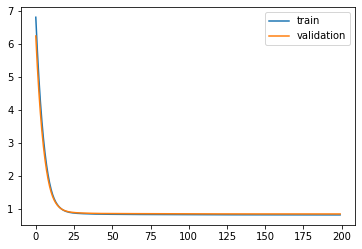

Time to train LSTM:  206.6843867301941
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 60s - loss: 6.8917 - pdc_loss: 0.7537 - event_loss: 0.6878 - val_loss: 6.3204 - val_pdc_loss: 0.7340 - val_event_loss: 0.6597

Epoch 00001: val_loss improved from inf to 6.32040, saving model to Event_val_weights4.hdf5
Epoch 2/200
 - 1s - loss: 5.8992 - pdc_loss: 0.7166 - event_loss: 0.6388 - val_loss: 5.4100 - val_pdc_loss: 0.7040 - val_event_loss: 0.6170

Epoch 00002: val_loss improved from 6.32040 to 5.40997, saving model to Event_val_weights4.hdf5
Epoch 3/200
 - 1s - loss: 5.0458 - pdc_loss: 0.6874 - event_loss: 0.5981 - val_loss: 4.6320 - val_pdc_loss: 0.6796 - val_event_loss: 0.5805

Epoch 00003: val_loss improved from 5.40997 to 4.63198, saving model to Event_val_weights4.hdf5
Epoch 4/200
 - 1s - loss: 4.3200 - pdc_loss: 0.6643 - event_loss: 0.5619 - val_loss: 3.9725 - val_pdc_loss: 0.6600 - val_event_loss: 0.5465

Epoch 00004: val_loss improved from 4.63198 to 3.97255, saving 


Epoch 00035: val_loss improved from 0.89677 to 0.89608, saving model to Event_val_weights4.hdf5
Epoch 36/200
 - 1s - loss: 0.8688 - pdc_loss: 0.5389 - event_loss: 0.3166 - val_loss: 0.8954 - val_pdc_loss: 0.5543 - val_event_loss: 0.3278

Epoch 00036: val_loss improved from 0.89608 to 0.89544, saving model to Event_val_weights4.hdf5
Epoch 37/200
 - 1s - loss: 0.8679 - pdc_loss: 0.5383 - event_loss: 0.3165 - val_loss: 0.8949 - val_pdc_loss: 0.5540 - val_event_loss: 0.3278

Epoch 00037: val_loss improved from 0.89544 to 0.89489, saving model to Event_val_weights4.hdf5
Epoch 38/200
 - 1s - loss: 0.8671 - pdc_loss: 0.5377 - event_loss: 0.3164 - val_loss: 0.8944 - val_pdc_loss: 0.5537 - val_event_loss: 0.3278

Epoch 00038: val_loss improved from 0.89489 to 0.89440, saving model to Event_val_weights4.hdf5
Epoch 39/200
 - 1s - loss: 0.8664 - pdc_loss: 0.5371 - event_loss: 0.3164 - val_loss: 0.8939 - val_pdc_loss: 0.5533 - val_event_loss: 0.3277

Epoch 00039: val_loss improved from 0.89440 to 

 - 1s - loss: 0.8501 - pdc_loss: 0.5227 - event_loss: 0.3164 - val_loss: 0.8790 - val_pdc_loss: 0.5409 - val_event_loss: 0.3272

Epoch 00070: val_loss improved from 0.87937 to 0.87905, saving model to Event_val_weights4.hdf5
Epoch 71/200
 - 1s - loss: 0.8497 - pdc_loss: 0.5224 - event_loss: 0.3164 - val_loss: 0.8784 - val_pdc_loss: 0.5405 - val_event_loss: 0.3270

Epoch 00071: val_loss improved from 0.87905 to 0.87840, saving model to Event_val_weights4.hdf5
Epoch 72/200
 - 1s - loss: 0.8493 - pdc_loss: 0.5221 - event_loss: 0.3163 - val_loss: 0.8783 - val_pdc_loss: 0.5404 - val_event_loss: 0.3270

Epoch 00072: val_loss improved from 0.87840 to 0.87829, saving model to Event_val_weights4.hdf5
Epoch 73/200
 - 1s - loss: 0.8488 - pdc_loss: 0.5217 - event_loss: 0.3163 - val_loss: 0.8777 - val_pdc_loss: 0.5401 - val_event_loss: 0.3269

Epoch 00073: val_loss improved from 0.87829 to 0.87773, saving model to Event_val_weights4.hdf5
Epoch 74/200
 - 1s - loss: 0.8485 - pdc_loss: 0.5215 - event_


Epoch 00104: val_loss improved from 0.87074 to 0.87046, saving model to Event_val_weights4.hdf5
Epoch 105/200
 - 1s - loss: 0.8406 - pdc_loss: 0.5163 - event_loss: 0.3151 - val_loss: 0.8704 - val_pdc_loss: 0.5354 - val_event_loss: 0.3257

Epoch 00105: val_loss improved from 0.87046 to 0.87036, saving model to Event_val_weights4.hdf5
Epoch 106/200
 - 1s - loss: 0.8404 - pdc_loss: 0.5162 - event_loss: 0.3151 - val_loss: 0.8702 - val_pdc_loss: 0.5354 - val_event_loss: 0.3256

Epoch 00106: val_loss improved from 0.87036 to 0.87020, saving model to Event_val_weights4.hdf5
Epoch 107/200
 - 1s - loss: 0.8403 - pdc_loss: 0.5161 - event_loss: 0.3150 - val_loss: 0.8701 - val_pdc_loss: 0.5353 - val_event_loss: 0.3256

Epoch 00107: val_loss improved from 0.87020 to 0.87010, saving model to Event_val_weights4.hdf5
Epoch 108/200
 - 1s - loss: 0.8401 - pdc_loss: 0.5160 - event_loss: 0.3150 - val_loss: 0.8699 - val_pdc_loss: 0.5352 - val_event_loss: 0.3256

Epoch 00108: val_loss improved from 0.87010

 - 1s - loss: 0.8361 - pdc_loss: 0.5137 - event_loss: 0.3140 - val_loss: 0.8668 - val_pdc_loss: 0.5332 - val_event_loss: 0.3252

Epoch 00141: val_loss did not improve from 0.86671
Epoch 142/200
 - 1s - loss: 0.8360 - pdc_loss: 0.5136 - event_loss: 0.3139 - val_loss: 0.8666 - val_pdc_loss: 0.5330 - val_event_loss: 0.3252

Epoch 00142: val_loss improved from 0.86671 to 0.86661, saving model to Event_val_weights4.hdf5
Epoch 143/200
 - 1s - loss: 0.8358 - pdc_loss: 0.5135 - event_loss: 0.3139 - val_loss: 0.8667 - val_pdc_loss: 0.5331 - val_event_loss: 0.3252

Epoch 00143: val_loss did not improve from 0.86661
Epoch 144/200
 - 1s - loss: 0.8358 - pdc_loss: 0.5135 - event_loss: 0.3139 - val_loss: 0.8665 - val_pdc_loss: 0.5329 - val_event_loss: 0.3252

Epoch 00144: val_loss improved from 0.86661 to 0.86646, saving model to Event_val_weights4.hdf5
Epoch 145/200
 - 1s - loss: 0.8356 - pdc_loss: 0.5134 - event_loss: 0.3139 - val_loss: 0.8665 - val_pdc_loss: 0.5330 - val_event_loss: 0.3252

Epoch

 - 1s - loss: 0.8334 - pdc_loss: 0.5123 - event_loss: 0.3132 - val_loss: 0.8650 - val_pdc_loss: 0.5319 - val_event_loss: 0.3253

Epoch 00179: val_loss did not improve from 0.86497
Epoch 180/200
 - 1s - loss: 0.8334 - pdc_loss: 0.5123 - event_loss: 0.3132 - val_loss: 0.8649 - val_pdc_loss: 0.5318 - val_event_loss: 0.3253

Epoch 00180: val_loss improved from 0.86497 to 0.86489, saving model to Event_val_weights4.hdf5
Epoch 181/200
 - 1s - loss: 0.8333 - pdc_loss: 0.5123 - event_loss: 0.3132 - val_loss: 0.8650 - val_pdc_loss: 0.5319 - val_event_loss: 0.3253

Epoch 00181: val_loss did not improve from 0.86489
Epoch 182/200
 - 1s - loss: 0.8333 - pdc_loss: 0.5123 - event_loss: 0.3132 - val_loss: 0.8649 - val_pdc_loss: 0.5317 - val_event_loss: 0.3253

Epoch 00182: val_loss improved from 0.86489 to 0.86487, saving model to Event_val_weights4.hdf5
Epoch 183/200
 - 1s - loss: 0.8332 - pdc_loss: 0.5123 - event_loss: 0.3132 - val_loss: 0.8649 - val_pdc_loss: 0.5318 - val_event_loss: 0.3253

Epoch

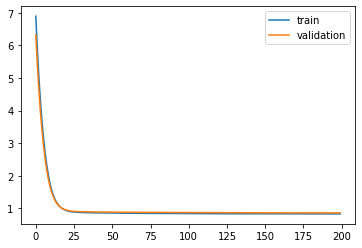

Time to train LSTM:  217.8084807395935
Train on 81000 samples, validate on 9000 samples
Epoch 1/200
 - 55s - loss: 6.8209 - pdc_loss: 0.6778 - event_loss: 0.6601 - val_loss: 6.2600 - val_pdc_loss: 0.6735 - val_event_loss: 0.6364

Epoch 00001: val_loss improved from inf to 6.25998, saving model to Event_val_weights5.hdf5
Epoch 2/200
 - 1s - loss: 5.8501 - pdc_loss: 0.6693 - event_loss: 0.6195 - val_loss: 5.3634 - val_pdc_loss: 0.6658 - val_event_loss: 0.5973

Epoch 00002: val_loss improved from 6.25998 to 5.36344, saving model to Event_val_weights5.hdf5
Epoch 3/200
 - 1s - loss: 5.0114 - pdc_loss: 0.6616 - event_loss: 0.5820 - val_loss: 4.5942 - val_pdc_loss: 0.6587 - val_event_loss: 0.5603

Epoch 00003: val_loss improved from 5.36344 to 4.59423, saving model to Event_val_weights5.hdf5
Epoch 4/200
 - 1s - loss: 4.2950 - pdc_loss: 0.6546 - event_loss: 0.5461 - val_loss: 3.9396 - val_pdc_loss: 0.6521 - val_event_loss: 0.5236

Epoch 00004: val_loss improved from 4.59423 to 3.93963, saving 


Epoch 00035: val_loss improved from 0.86930 to 0.86802, saving model to Event_val_weights5.hdf5
Epoch 36/200
 - 1s - loss: 0.8647 - pdc_loss: 0.5314 - event_loss: 0.3188 - val_loss: 0.8669 - val_pdc_loss: 0.5334 - val_event_loss: 0.3192

Epoch 00036: val_loss improved from 0.86802 to 0.86694, saving model to Event_val_weights5.hdf5
Epoch 37/200
 - 1s - loss: 0.8633 - pdc_loss: 0.5304 - event_loss: 0.3187 - val_loss: 0.8658 - val_pdc_loss: 0.5327 - val_event_loss: 0.3191

Epoch 00037: val_loss improved from 0.86694 to 0.86582, saving model to Event_val_weights5.hdf5
Epoch 38/200
 - 1s - loss: 0.8622 - pdc_loss: 0.5296 - event_loss: 0.3186 - val_loss: 0.8651 - val_pdc_loss: 0.5323 - val_event_loss: 0.3190

Epoch 00038: val_loss improved from 0.86582 to 0.86507, saving model to Event_val_weights5.hdf5
Epoch 39/200
 - 1s - loss: 0.8610 - pdc_loss: 0.5288 - event_loss: 0.3185 - val_loss: 0.8641 - val_pdc_loss: 0.5316 - val_event_loss: 0.3189

Epoch 00039: val_loss improved from 0.86507 to 

 - 1s - loss: 0.8474 - pdc_loss: 0.5201 - event_loss: 0.3168 - val_loss: 0.8507 - val_pdc_loss: 0.5232 - val_event_loss: 0.3170

Epoch 00070: val_loss improved from 0.85087 to 0.85068, saving model to Event_val_weights5.hdf5
Epoch 71/200
 - 1s - loss: 0.8472 - pdc_loss: 0.5199 - event_loss: 0.3168 - val_loss: 0.8505 - val_pdc_loss: 0.5231 - val_event_loss: 0.3170

Epoch 00071: val_loss improved from 0.85068 to 0.85050, saving model to Event_val_weights5.hdf5
Epoch 72/200
 - 1s - loss: 0.8470 - pdc_loss: 0.5198 - event_loss: 0.3168 - val_loss: 0.8504 - val_pdc_loss: 0.5231 - val_event_loss: 0.3169

Epoch 00072: val_loss improved from 0.85050 to 0.85043, saving model to Event_val_weights5.hdf5
Epoch 73/200
 - 1s - loss: 0.8468 - pdc_loss: 0.5197 - event_loss: 0.3168 - val_loss: 0.8500 - val_pdc_loss: 0.5227 - val_event_loss: 0.3169

Epoch 00073: val_loss improved from 0.85043 to 0.84999, saving model to Event_val_weights5.hdf5
Epoch 74/200
 - 1s - loss: 0.8466 - pdc_loss: 0.5196 - event_


Epoch 00105: val_loss improved from 0.84565 to 0.84556, saving model to Event_val_weights5.hdf5
Epoch 106/200
 - 1s - loss: 0.8420 - pdc_loss: 0.5168 - event_loss: 0.3159 - val_loss: 0.8457 - val_pdc_loss: 0.5199 - val_event_loss: 0.3164

Epoch 00106: val_loss did not improve from 0.84556
Epoch 107/200
 - 1s - loss: 0.8418 - pdc_loss: 0.5167 - event_loss: 0.3158 - val_loss: 0.8454 - val_pdc_loss: 0.5198 - val_event_loss: 0.3163

Epoch 00107: val_loss improved from 0.84556 to 0.84542, saving model to Event_val_weights5.hdf5
Epoch 108/200
 - 1s - loss: 0.8418 - pdc_loss: 0.5167 - event_loss: 0.3158 - val_loss: 0.8452 - val_pdc_loss: 0.5196 - val_event_loss: 0.3163

Epoch 00108: val_loss improved from 0.84542 to 0.84524, saving model to Event_val_weights5.hdf5
Epoch 109/200
 - 1s - loss: 0.8417 - pdc_loss: 0.5165 - event_loss: 0.3158 - val_loss: 0.8452 - val_pdc_loss: 0.5196 - val_event_loss: 0.3164

Epoch 00109: val_loss did not improve from 0.84524
Epoch 110/200
 - 1s - loss: 0.8416 - 


Epoch 00141: val_loss did not improve from 0.84286
Epoch 142/200
 - 1s - loss: 0.8388 - pdc_loss: 0.5150 - event_loss: 0.3150 - val_loss: 0.8428 - val_pdc_loss: 0.5182 - val_event_loss: 0.3159

Epoch 00142: val_loss improved from 0.84286 to 0.84282, saving model to Event_val_weights5.hdf5
Epoch 143/200
 - 1s - loss: 0.8386 - pdc_loss: 0.5150 - event_loss: 0.3150 - val_loss: 0.8426 - val_pdc_loss: 0.5181 - val_event_loss: 0.3159

Epoch 00143: val_loss improved from 0.84282 to 0.84262, saving model to Event_val_weights5.hdf5
Epoch 144/200
 - 1s - loss: 0.8386 - pdc_loss: 0.5149 - event_loss: 0.3150 - val_loss: 0.8427 - val_pdc_loss: 0.5181 - val_event_loss: 0.3159

Epoch 00144: val_loss did not improve from 0.84262
Epoch 145/200
 - 1s - loss: 0.8385 - pdc_loss: 0.5149 - event_loss: 0.3150 - val_loss: 0.8425 - val_pdc_loss: 0.5180 - val_event_loss: 0.3159

Epoch 00145: val_loss improved from 0.84262 to 0.84253, saving model to Event_val_weights5.hdf5
Epoch 146/200
 - 1s - loss: 0.8385 - 


Epoch 00180: val_loss did not improve from 0.84140
Epoch 181/200
 - 1s - loss: 0.8364 - pdc_loss: 0.5139 - event_loss: 0.3144 - val_loss: 0.8414 - val_pdc_loss: 0.5175 - val_event_loss: 0.3157

Epoch 00181: val_loss did not improve from 0.84140
Epoch 182/200
 - 1s - loss: 0.8364 - pdc_loss: 0.5139 - event_loss: 0.3143 - val_loss: 0.8415 - val_pdc_loss: 0.5176 - val_event_loss: 0.3157

Epoch 00182: val_loss did not improve from 0.84140
Epoch 183/200
 - 1s - loss: 0.8363 - pdc_loss: 0.5138 - event_loss: 0.3143 - val_loss: 0.8414 - val_pdc_loss: 0.5174 - val_event_loss: 0.3158

Epoch 00183: val_loss improved from 0.84140 to 0.84137, saving model to Event_val_weights5.hdf5
Epoch 184/200
 - 1s - loss: 0.8363 - pdc_loss: 0.5139 - event_loss: 0.3143 - val_loss: 0.8416 - val_pdc_loss: 0.5177 - val_event_loss: 0.3157

Epoch 00184: val_loss did not improve from 0.84137
Epoch 185/200
 - 1s - loss: 0.8362 - pdc_loss: 0.5138 - event_loss: 0.3143 - val_loss: 0.8414 - val_pdc_loss: 0.5176 - val_even

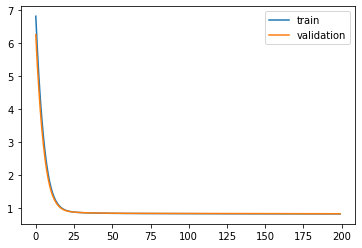

Time to train LSTM:  214.49056124687195
Entire process took:  22441.922728061676
Experiment record:
[[8, 8192, 0.11121701756176186, 0, 0.8336801017655266], [8, 8192, 0.11121701756176186, 1, 0.8525543457137214], [8, 8192, 0.11121701756176186, 2, 0.8619724364810519], [8, 8192, 0.11121701756176186, 3, 0.8660851916207207], [8, 8192, 0.11121701756176186, 4, 0.8416803711255392], [8, 8192, 0.06690697543456364, 0, 0.8334507826169332], [8, 8192, 0.06690697543456364, 1, 0.8524172809388902], [8, 8192, 0.06690697543456364, 2, 0.8610328631930881], [8, 8192, 0.06690697543456364, 3, 0.8656982417636447], [8, 8192, 0.06690697543456364, 4, 0.8427167375882466], [8, 8192, 0.09360590193711701, 0, 0.8378437104225158], [8, 8192, 0.09360590193711701, 1, 0.851170961327023], [8, 8192, 0.09360590193711701, 2, 0.8636023926205105], [8, 8192, 0.09360590193711701, 3, 0.8668328304290771], [8, 8192, 0.09360590193711701, 4, 0.844833937909868], [8, 8192, 0.12692624725231227, 0, 0.8368647576438056], [8, 8192, 0.126926247

In [15]:
from numpy.random import seed
seed(1)
from tensorflow import set_random_seed
set_random_seed(1)

num_per_fold = x_train.shape[0]//10
print(num_per_fold)

units = 8
batch_s = 8192

start_time = time.time()

exp_record = []

for i in range(len(L2_list)):
    L2 = L2_list[i]
    for f in range(5):#10
        #start = f*num_per_fold
        end = (f+1)*num_per_fold
        train1_x = x_train[:end, ]
        train2_x = x_train[end:, ]
        train_x_lstm = np.append(train2_x, train1_x, axis=0) 
        train1_y_pdc = y_pdc_train[:end, ]
        train2_y_pdc = y_pdc_train[end:, ]
        train_y_pdc = np.append(train2_y_pdc, train1_y_pdc, axis=0)
        train1_y_event = y_event_train[:end, ]
        train2_y_event = y_event_train[end:, ]
        train_y_event = np.append(train2_y_event, train1_y_event, axis=0)

        start_time_inner = time.time()
        with tf.Session(config = tf.ConfigProto(log_device_placement = True)):
            x = Input(shape=(8, 182), name="obs")
            model = CuDNNLSTM(units,
                              kernel_regularizer=regularizers.l2(L2))(x)
            out_pdc = Dense(2, activation='softmax', name="pdc")(model)
            out_event = Dense(2, activation='softmax', name="event")(model)
            multi_out_model = Model(x, outputs=[out_pdc, out_event])
            multi_out_model.compile(loss=["categorical_crossentropy",
                                          "categorical_crossentropy"],
                                  #{"pdc":keras.losses.CategoricalCrossentropy(from_logit=True),\
                                  #      "event":keras.losses.CategoricalCrossentropy(from_logit=True)}, 
                                  optimizer='adam', 
                                  #loss_weight=[1.0,1.0])
                                  )  
            val_weight = "Event_val_weights" + str(f+1) + ".hdf5"
            val_checkpointer = ModelCheckpoint(filepath=val_weight,
                                        monitor='val_loss', verbose=1,
                                        save_best_only=True)
            history = multi_out_model.fit({"obs":train_x_lstm}, 
                                          {"pdc":train_y_pdc, 
                                           "event":train_y_event},
                                            batch_size=batch_s, 
                                            epochs=200, validation_split=0.1, 
                                            callbacks=[val_checkpointer], 
                                            verbose=2, 
                                            shuffle=False) 
            print("#################################")
            print("Number of units:", units)
            print("Batch size:", batch_s)
            print("Fold:", f)
            print("L2:", L2)
            print("best val loss:", min(history.history['val_loss']))
            exp_record.append([units, batch_s, L2, f, min(history.history['val_loss'])])
            print("#################################")
            if(f==4):
                print(exp_record)
            pyplot.plot(history.history['loss'], label='train')
            pyplot.plot(history.history['val_loss'], label='validation')
            pyplot.legend()
            pyplot.show()
        end_time = time.time()
        print("Time to train LSTM: ", time.time() - start_time_inner)
print("Entire process took: ", time.time() - start_time)

print("Experiment record:")
print(exp_record)

In [11]:
exp_record = [[8, 8192, 0.11121701756176186, 0, 0.8336801017655266], [8, 8192, 0.11121701756176186, 1, 0.8525543457137214], [8, 8192, 0.11121701756176186, 2, 0.8619724364810519], [8, 8192, 0.11121701756176186, 3, 0.8660851916207207], [8, 8192, 0.11121701756176186, 4, 0.8416803711255392], [8, 8192, 0.06690697543456364, 0, 0.8334507826169332], [8, 8192, 0.06690697543456364, 1, 0.8524172809388902], [8, 8192, 0.06690697543456364, 2, 0.8610328631930881], [8, 8192, 0.06690697543456364, 3, 0.8656982417636447], [8, 8192, 0.06690697543456364, 4, 0.8427167375882466], [8, 8192, 0.09360590193711701, 0, 0.8378437104225158], [8, 8192, 0.09360590193711701, 1, 0.851170961327023], [8, 8192, 0.09360590193711701, 2, 0.8636023926205105], [8, 8192, 0.09360590193711701, 3, 0.8668328304290771], [8, 8192, 0.09360590193711701, 4, 0.844833937909868], [8, 8192, 0.12692624725231227, 0, 0.8368647576438056], [8, 8192, 0.12692624725231227, 1, 0.8531790977054172], [8, 8192, 0.12692624725231227, 2, 0.8646304439438713], [8, 8192, 0.12692624725231227, 3, 0.8694867248005337], [8, 8192, 0.12692624725231227, 4, 0.8454762893252903], [8, 8192, 0.07953253044028762, 0, 0.8385112945768568], [8, 8192, 0.07953253044028762, 1, 0.8517322618696425], [8, 8192, 0.07953253044028762, 2, 0.863399872938792], [8, 8192, 0.07953253044028762, 3, 0.8648330862787035], [8, 8192, 0.07953253044028762, 4, 0.8419024874899123], [8, 8192, 0.06491629571394898, 0, 0.832570697095659], [8, 8192, 0.06491629571394898, 1, 0.8517611834737989], [8, 8192, 0.06491629571394898, 2, 0.8633961789872912], [8, 8192, 0.06491629571394898, 3, 0.8662858405643039], [8, 8192, 0.06491629571394898, 4, 0.8394491349856059], [8, 8192, 0.05224783245441618, 0, 0.8347379979557461], [8, 8192, 0.05224783245441618, 1, 0.8515073890156216], [8, 8192, 0.05224783245441618, 2, 0.8604881927702162], [8, 8192, 0.05224783245441618, 3, 0.8661932289865282], [8, 8192, 0.05224783245441618, 4, 0.8402146293852064], [8, 8192, 0.09202244922645578, 0, 0.8363952788776822], [8, 8192, 0.09202244922645578, 1, 0.8536109432644314], [8, 8192, 0.09202244922645578, 2, 0.8625670771068997], [8, 8192, 0.09202244922645578, 3, 0.8664762479464213], [8, 8192, 0.09202244922645578, 4, 0.8409148775206672], [8, 8192, 0.0738682141246446, 0, 0.8346905154122246], [8, 8192, 0.0738682141246446, 1, 0.8512101632224189], [8, 8192, 0.0738682141246446, 2, 0.8599504517449273], [8, 8192, 0.0738682141246446, 3, 0.8669847653706868], [8, 8192, 0.0738682141246446, 4, 0.8424046169916789], [8, 8192, 0.08376561918887923, 0, 0.8316285094155206], [8, 8192, 0.08376561918887923, 1, 0.8527670429547628], [8, 8192, 0.08376561918887923, 2, 0.8622632739808824], [8, 8192, 0.08376561918887923, 3, 0.8675996539327834], [8, 8192, 0.08376561918887923, 4, 0.8403287988768684], [8, 8192, 0.14907124646308786, 0, 0.8360315344598558], [8, 8192, 0.14907124646308786, 1, 0.8536380824512906], [8, 8192, 0.14907124646308786, 2, 0.864065928194258], [8, 8192, 0.14907124646308786, 3, 0.8670959362453885], [8, 8192, 0.14907124646308786, 4, 0.8417181108262803], [8, 8192, 0.07377264539000228, 0, 0.8362088409529792], [8, 8192, 0.07377264539000228, 1, 0.8511133043501112], [8, 8192, 0.07377264539000228, 2, 0.8620296210712857], [8, 8192, 0.07377264539000228, 3, 0.8660985687043932], [8, 8192, 0.07377264539000228, 4, 0.8424669331974454], [8, 8192, 0.05811926594512116, 0, 0.8327487765947977], [8, 8192, 0.05811926594512116, 1, 0.8500224685668946], [8, 8192, 0.05811926594512116, 2, 0.8603380840089586], [8, 8192, 0.05811926594512116, 3, 0.8666648574405247], [8, 8192, 0.05811926594512116, 4, 0.839880189842648], [8, 8192, 0.11696002382466299, 0, 0.8354892947408888], [8, 8192, 0.11696002382466299, 1, 0.8531878400378757], [8, 8192, 0.11696002382466299, 2, 0.8616575899653964], [8, 8192, 0.11696002382466299, 3, 0.8707081304656135], [8, 8192, 0.11696002382466299, 4, 0.8428734434445699], [8, 8192, 0.1121242919400697, 0, 0.8331240336100261], [8, 8192, 0.1121242919400697, 1, 0.8529089625676473], [8, 8192, 0.1121242919400697, 2, 0.8631705304251777], [8, 8192, 0.1121242919400697, 3, 0.8663286329375373], [8, 8192, 0.1121242919400697, 4, 0.8442207231521607], [8, 8192, 0.07742535302065184, 0, 0.8360702709092034], [8, 8192, 0.07742535302065184, 1, 0.8514449062877231], [8, 8192, 0.07742535302065184, 2, 0.8654636771414015], [8, 8192, 0.07742535302065184, 3, 0.8670819703737894], [8, 8192, 0.07742535302065184, 4, 0.8399473207261827], [8, 8192, 0.09662214098949731, 0, 0.835769912507799], [8, 8192, 0.09662214098949731, 1, 0.8518514632648891], [8, 8192, 0.09662214098949731, 2, 0.8618355962435404], [8, 8192, 0.09662214098949731, 3, 0.8654527164035374], [8, 8192, 0.09662214098949731, 4, 0.8410889205932617], [8, 8192, 0.06183677511232836, 0, 0.8348820297982957], [8, 8192, 0.06183677511232836, 1, 0.8513012046284146], [8, 8192, 0.06183677511232836, 2, 0.8608849325180054], [8, 8192, 0.06183677511232836, 3, 0.8649977231025696], [8, 8192, 0.06183677511232836, 4, 0.843031079504225], [8, 8192, 0.057395756414320424, 0, 0.836686729060279], [8, 8192, 0.057395756414320424, 1, 0.8495178605185615], [8, 8192, 0.057395756414320424, 2, 0.8587327659924825], [8, 8192, 0.057395756414320424, 3, 0.8646367502212524], [8, 8192, 0.057395756414320424, 4, 0.8404031660291884], [8, 8192, 0.14007741791606837, 0, 0.8346395878791809], [8, 8192, 0.14007741791606837, 1, 0.8535700210465326], [8, 8192, 0.14007741791606837, 2, 0.8630375441975063], [8, 8192, 0.14007741791606837, 3, 0.8692638741599189], [8, 8192, 0.14007741791606837, 4, 0.8421919308238559], [8, 8192, 0.12939625604796284, 0, 0.8372287117110359], [8, 8192, 0.12939625604796284, 1, 0.8516842833624946], [8, 8192, 0.12939625604796284, 2, 0.8639225346777174], [8, 8192, 0.12939625604796284, 3, 0.8705230460166932], [8, 8192, 0.12939625604796284, 4, 0.841055908203125], [8, 8192, 0.13405696487242813, 0, 0.83539107020696], [8, 8192, 0.13405696487242813, 1, 0.8516986550754971], [8, 8192, 0.13405696487242813, 2, 0.8628416449758741], [8, 8192, 0.13405696487242813, 3, 0.8700354684723748], [8, 8192, 0.13405696487242813, 4, 0.8424342558119032], [8, 8192, 0.13152074574529404, 0, 0.8347132171524896], [8, 8192, 0.13152074574529404, 1, 0.8531445708274842], [8, 8192, 0.13152074574529404, 2, 0.8630259996520149], [8, 8192, 0.13152074574529404, 3, 0.865880196624332], [8, 8192, 0.13152074574529404, 4, 0.8422118670675489], [8, 8192, 0.149095485133041, 0, 0.8348192495240105], [8, 8192, 0.149095485133041, 1, 0.8531221956676907], [8, 8192, 0.149095485133041, 2, 0.8658768792682224], [8, 8192, 0.149095485133041, 3, 0.8668843852149115], [8, 8192, 0.149095485133041, 4, 0.8436492207845052], [8, 8192, 0.10772738296076793, 0, 0.8351327420340644], [8, 8192, 0.10772738296076793, 1, 0.8514068775706821], [8, 8192, 0.10772738296076793, 2, 0.8610601846906873], [8, 8192, 0.10772738296076793, 3, 0.8642396833631727], [8, 8192, 0.10772738296076793, 4, 0.84116151687834]]

complete_v = np.array(exp_record)
print(complete_v.shape)

val_loss_list = []
for i in range(25):
    model_v = complete_v[(i*5):((i+1)*5), :]
    print("#######################")
    print("Units:\t\t", model_v[0, 0])
    print("Batch size:\t", model_v[0, 1])
    print("L2:\t\t", model_v[0, 2])
    print("Val loss (mean):", np.mean(model_v[:, 4]))
    print("Val loss (Std): ", np.std(model_v[:, 4]))
    print("#######################")
    val_loss_list.append(np.mean(model_v[:, 4]))
print(min(val_loss_list))

(125, 5)
#######################
Units:		 8.0
Batch size:	 8192.0
L2:		 0.11121701756176186
Val loss (mean): 0.8511944893413119
Val loss (Std):  0.012140993253050784
#######################
#######################
Units:		 8.0
Batch size:	 8192.0
L2:		 0.06690697543456364
Val loss (mean): 0.8510631812201606
Val loss (Std):  0.011792140159112011
#######################
#######################
Units:		 8.0
Batch size:	 8192.0
L2:		 0.09360590193711701
Val loss (mean): 0.852856766541799
Val loss (Std):  0.01098543047973094
#######################
#######################
Units:		 8.0
Batch size:	 8192.0
L2:		 0.12692624725231227
Val loss (mean): 0.8539274626837836
Val loss (Std):  0.011998022587318007
#######################
#######################
Units:		 8.0
Batch size:	 8192.0
L2:		 0.07953253044028762
Val loss (mean): 0.8520758006307814
Val loss (Std):  0.010757258892201792
#######################
#######################
Units:		 8.0
Batch size:	 8192.0
L2:		 0.06491629571394898
Val l